# Assignment answer part 1

### Please note that (row,col) format is used at first

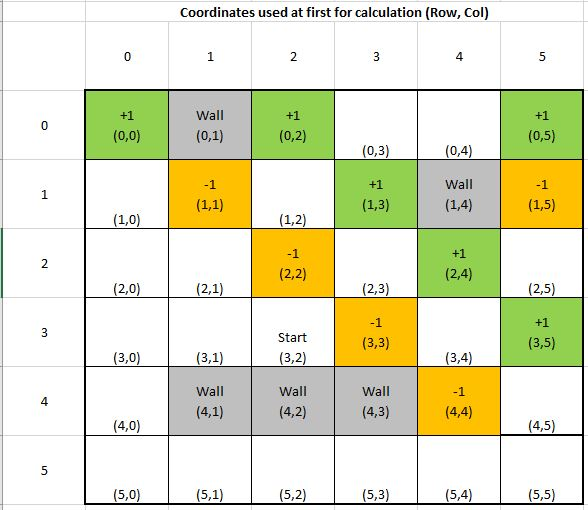

In [30]:
from IPython.display import Image
Image(filename = "coordinates_used_first_row,col.JPG", width = 600, height = 300)

# Defining the grid and helper functions

In [31]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt

class Grid:
    def __init__(self, width, height, start):  #start is a tuple of 2 integars
        self.width = width
        self.height = height
        self.i = start[0]
        self.j = start[1]
        
    def set(self, rewards, actions):  #set the rewards and actions of the environment
        #rewards in dict of: (i, j): (row, col): reward
        #actions in dict of: (i, j): A (row, col): list of possible actions
        self.rewards = rewards
        self.actions = actions  #enumerate all the possible actions that can take you to new state
    
    def set_state(self, s):
        self.i = s[0]
        self.j = s[1]
        
    def current_state(self):
        return (self.i, self.j)

    def is_terminal(self, s):
        return s not in self.actions
    
    def move(self, action):
        #check if legal move first
        if action in self.actions[(self.i, self.j)]:
            if action == 'U':
                self.i -= 1
            elif action == 'D':
                self.i += 1
            elif action == 'R':
                self.j += 1
            elif action == 'L':
                self.j -= 1
        else:
            pass
        return self.rewards.get((self.i, self.j), 0)
    
    def undo_move(self, action):
        if action == 'U':
            self.i += 1
        elif action == 'D':
            self.i -= 1
        elif action == 'R':
            self.j -= 1
        elif action == 'L':
            self.j += 1
            
        #raise an exception if we arrive somewhere we should not be in
        assert(self.current_state() in self.all_states())
    
    def game_over(self):
        #returns true if game is over, else false
        return (self.i, self.j) not in self.actions
    
    def all_states(self):
        return set(list(self.actions.keys()) + list(self.rewards.keys()))
    
def standard_grid():
    #define a grid that describes the reward for arriving at each state
    g = Grid(6, 6, (3, 2))
    rewards = {(0,0):1, (0,2):1, (0,5):1, (1,3):1, (2,4):1, (3,5):1, (1,1):-1, (1,5):-1, (2,2):-1, (3,3):-1, (4,4):-1}
    actions = {
        (0,0): ('D'),
        (0,2): ('R', 'D'),
        (0,3): ('R', 'D', 'L'),
        (0,4): ('R', 'L'),
        (0,5): ('D', 'L'),
        (1,0): ('U', 'R', 'D'),
        (1,1): ('R', 'D', 'L'),
        (1,2): ('U', 'R', 'D', 'L'),
        (1,3): ('U', 'D', 'L'),
        (1,5): ('U', 'D'),
        (2,0): ('U', 'R', 'D'),
        (2,1): ('U', 'R', 'D', 'L'),
        (2,2): ('U', 'R', 'D', 'L'),
        (2,3): ('U', 'R', 'D', 'L'),
        (2,4): ('R', 'D', 'L'),
        (2,5): ('U', 'D', 'L'),
        (3,0): ('U', 'R', 'D'),
        (3,1): ('U', 'R', 'L'),
        (3,2): ('U', 'R', 'L'),
        (3,3): ('U', 'R', 'L'),
        (3,4): ('U', 'R', 'D', 'L'),
        (3,5): ('U', 'D', 'L'),
        (4,0): ('U', 'D'),
        (4,4): ('U', 'R', 'D'),
        (4,5): ('U', 'D', 'L'),
        (5,0): ('U', 'R'),
        (5,1): ('R', 'L'),
        (5,2): ('R', 'L'),
        (5,3): ('R', 'L'),
        (5,4): ('U', 'R', 'L'),
        (5,5): ('U', 'L')           
    }
    g.set(rewards, actions)
    return g

def negative_grid(step_cost=-0.04):
    g = standard_grid()
    g.rewards.update({
        (0,3): step_cost,
        (0,4): step_cost,
        (1,0): step_cost,
        (1,2): step_cost,
        (2,0): step_cost,
        (2,1): step_cost,
        (2,3): step_cost,
        (2,5): step_cost,
        (3,0): step_cost,
        (3,1): step_cost,
        (3,2): step_cost,
        (3,4): step_cost,
        (4,0): step_cost,
        (4,5): step_cost,
        (5,0): step_cost,
        (5,1): step_cost,
        (5,2): step_cost,
        (5,3): step_cost,
        (5,4): step_cost,
        (5,5): step_cost,     
    })
    return g

def play_game(agent, env):
    pass

In [32]:
SMALL_ENOUGH = 10e-4 #threshold for convergence

hist = []

def print_values(V, g):
    for i in range(g.width):
        print("--------------------------")
        for j in range(g.height):
            v = V.get((i,j), 0)
            if v >= 0:
                print(' {:.5f}|'.format(v), end = ' ')
                #print("%.2f|") % v,
            else:
                print('{:.5f}|'.format(v), end = ' ') # -ve sign takes up an extra space
                
            hist.append(v)
                
        print ("")

def print_policy(P,g):
    for i in range(g.width):
        print("--------------------------")
        for j in range(g.height):
            a = P.get((i,j), ' ')
            print('    {}   |'.format(a), end = ' ')
            #print(" %s | ") % a,
        print ("")

# Section 2: Policy Iteration

In [33]:
SMALL_ENOUGH = 10e-4
GAMMA = 0.99
ALL_POSSIBLE_ACTIONS = ('U', 'D', 'L', 'R')

if __name__ == '__main__':
    
    
    grid = negative_grid()
    
    #print rewards
    print("rewards:")
    print_values(grid.rewards, grid)
    
    #we'll randomly choose an action and update as we learn
    policy = {}
    for s in grid.actions.keys():
        policy[s] = np.random.choice(ALL_POSSIBLE_ACTIONS)
        
    #initial policy
    print('initial policy:')
    print_policy(policy, grid)
    
    
    hist = []
    
    
    #initilize V(s)
    V = {}
    states = grid.all_states()
    for s in states: 
        V[s] = 0
        if s in grid.actions:
            V[s] = 0
        else:
            V[s] = 0
            
    print_values(V, grid)
    
    #repeat until convergence 
    while True:
        
        #policy evaluation step 
        while True:
            biggest_change = 0
            for s in states:
                old_v = V[s]
                
                if s in policy:
                    a = policy[s]
                    grid.set_state(s)
                    try:
                        r = grid.move(a)
                    except KeyError:
                        continue
                    
                    
                    grid.set_state(s)
                    #r = grid.move(a) #move only when legal / possible. Returns reward. 
                    r = grid.rewards.get(grid.current_state(), 0)
                    
                    
                    _ = grid.move(a)
                    v_correct = V[grid.current_state()]
                    
                    grid.set_state(s)
                    if a == 'U':
                        r_clockwise = grid.move('R')
                        v_clockwise = V[grid.current_state()]
                        grid.set_state(s)
                        r_anticlockwise = grid.move('L')
                    elif a == 'R':
                        r_clockwise = grid.move('D')
                        v_clockwise = V[grid.current_state()]
                        grid.set_state(s)
                        r_anticlockwise = grid.move('U')
                    elif a == 'D':
                        r_clockwise = grid.move('L')
                        v_clockwise = V[grid.current_state()]
                        grid.set_state(s)
                        r_anticlockwise = grid.move('R')
                    elif a == 'L':
                        r_clockwise = grid.move('U')
                        v_clockwise = V[grid.current_state()]
                        grid.set_state(s)
                        r_anticlockwise = grid.move('D')
                        
                    v_anticlockwise = V[grid.current_state()]
                        
                        
                    v = r + GAMMA * (0.8*v_correct + 0.1*v_clockwise + 0.1*v_anticlockwise)
                    V[s] = v
                    
                    biggest_change = max(biggest_change, np.abs(old_v - V[s]))
                    

                    
            if biggest_change < SMALL_ENOUGH:
                break
        
            
            print('values:')
            print_values(V, grid)
            print('policy:')
            print_policy(policy, grid)
        
        
        #policy improvement step
        is_policy_converged = True
        for s in states:
            if s in policy:
                old_a = policy[s]
                new_a = None
                best_value = float('-inf')
                # loop through all possible actions to find the best current action
                for a in ALL_POSSIBLE_ACTIONS:
                    grid.set_state(s)
                    try:
                        r = grid.move(a)
                    except KeyError:
                        continue
                    
                    grid.set_state(s)
                    #r = grid.move(a) #move only when legal / possible. Returns reward. 
                    r = grid.rewards.get(grid.current_state(), 0)
                    
                    
                    _ = grid.move(a)
                    v_correct = V[grid.current_state()]
                    
                    grid.set_state(s)
                    if a == 'U':
                        r_clockwise = grid.move('R')
                        v_clockwise = V[grid.current_state()]
                        grid.set_state(s)
                        r_anticlockwise = grid.move('L')
                    elif a == 'R':
                        r_clockwise = grid.move('D')
                        v_clockwise = V[grid.current_state()]
                        grid.set_state(s)
                        r_anticlockwise = grid.move('U')
                    elif a == 'D':
                        r_clockwise = grid.move('L')
                        v_clockwise = V[grid.current_state()]
                        grid.set_state(s)
                        r_anticlockwise = grid.move('R')
                    elif a == 'L':
                        r_clockwise = grid.move('U')
                        v_clockwise = V[grid.current_state()]
                        grid.set_state(s)
                        r_anticlockwise = grid.move('D')
                        
                    v_anticlockwise = V[grid.current_state()]
                        
                        
                    v = r + GAMMA * (0.8*v_correct + 0.1*v_clockwise + 0.1*v_anticlockwise)
                    
                    
                    
                    if v > best_value:
                        best_value = v
                        new_a = a
            policy[s] = new_a
            if new_a != old_a:
                is_policy_converged = False
        
        if is_policy_converged:
            break
    print('values:')
    print_values(V, grid)
    print('policy:')
    print_policy(policy, grid)

rewards:
--------------------------
 1.00000|  0.00000|  1.00000| -0.04000| -0.04000|  1.00000| 
--------------------------
-0.04000| -1.00000| -0.04000|  1.00000|  0.00000| -1.00000| 
--------------------------
-0.04000| -0.04000| -1.00000| -0.04000|  1.00000| -0.04000| 
--------------------------
-0.04000| -0.04000| -0.04000| -1.00000| -0.04000|  1.00000| 
--------------------------
-0.04000|  0.00000|  0.00000|  0.00000| -1.00000| -0.04000| 
--------------------------
-0.04000| -0.04000| -0.04000| -0.04000| -0.04000| -0.04000| 
initial policy:
--------------------------
    L   |         |     R   |     D   |     U   |     U   | 
--------------------------
    U   |     U   |     U   |     U   |         |     R   | 
--------------------------
    D   |     U   |     R   |     L   |     D   |     D   | 
--------------------------
    R   |     L   |     R   |     U   |     U   |     R   | 
--------------------------
    U   |         |         |         |     D   |     D   | 
-------

    D   |     R   |     L   |     D   |     L   |     D   | 
values:
--------------------------
 15.54913|  0.00000|  11.39660|  10.98092|  8.75299|  12.32667| 
--------------------------
 13.35924|  4.46549|  10.50227|  11.39660|  0.00000|  3.25876| 
--------------------------
 0.24380|  3.27712|  2.13925|  2.95455|  6.70752|  7.37076| 
--------------------------
-0.05399|  0.02149|  1.67605|  1.73738|  5.96655|  7.72547| 
--------------------------
-0.33476|  0.00000|  0.00000|  0.00000| -1.72728| -0.57806| 
--------------------------
-0.45738| -0.56001| -0.58868| -0.53011| -0.63723| -0.46454| 
policy:
--------------------------
    L   |         |     R   |     D   |     U   |     U   | 
--------------------------
    U   |     U   |     U   |     U   |         |     R   | 
--------------------------
    D   |     U   |     R   |     L   |     D   |     D   | 
--------------------------
    R   |     L   |     R   |     U   |     U   |     R   | 
--------------------------
    U   |

 4.72250|  10.09336|  7.60446|  8.39208|  9.63470|  8.06384| 
--------------------------
 4.20674|  4.35881|  6.79934|  6.87789|  8.89087|  8.03833| 
--------------------------
 3.66714|  0.00000|  0.00000|  0.00000| -2.45513| -1.32591| 
--------------------------
-1.14901| -1.27875| -1.30143| -1.26130| -1.37059| -1.21197| 
policy:
--------------------------
    L   |         |     R   |     D   |     U   |     U   | 
--------------------------
    U   |     U   |     U   |     U   |         |     R   | 
--------------------------
    D   |     U   |     R   |     L   |     D   |     D   | 
--------------------------
    R   |     L   |     R   |     U   |     U   |     R   | 
--------------------------
    U   |         |         |         |     D   |     D   | 
--------------------------
    D   |     R   |     L   |     D   |     L   |     D   | 
values:
--------------------------
 25.07669|  0.00000|  17.85318|  17.40981|  15.58209|  19.43970| 
--------------------------
 22.72207|

    D   |     R   |     L   |     D   |     L   |     D   | 
values:
--------------------------
 31.47838|  0.00000|  22.21241|  21.74637|  20.15267|  24.16720| 
--------------------------
 29.02733|  17.63447|  21.45584|  22.21241|  0.00000|  9.86276| 
--------------------------
 9.45068|  15.68300|  11.97792|  12.73185|  11.71638|  8.13994| 
--------------------------
 8.88574|  9.09653|  10.88515|  10.97284|  10.96043|  7.84605| 
--------------------------
 8.29028|  0.00000|  0.00000|  0.00000| -3.01051| -1.90274| 
--------------------------
-1.69714| -1.81097| -1.82922| -1.81634| -1.92922| -1.78820| 
policy:
--------------------------
    L   |         |     R   |     D   |     U   |     U   | 
--------------------------
    U   |     U   |     U   |     U   |         |     R   | 
--------------------------
    D   |     U   |     R   |     L   |     D   |     D   | 
--------------------------
    R   |     L   |     R   |     U   |     U   |     R   | 
--------------------------


    R   |     L   |     R   |     U   |     U   |     R   | 
--------------------------
    U   |         |         |         |     D   |     D   | 
--------------------------
    D   |     R   |     L   |     D   |     L   |     D   | 
values:
--------------------------
 36.54235|  0.00000|  25.65766|  25.17281|  23.75586|  27.88668| 
--------------------------
 34.01569|  21.88091|  24.95137|  25.65766|  0.00000|  11.73118| 
--------------------------
 13.14543|  19.77291|  15.15102|  15.87973|  13.18409|  8.12568| 
--------------------------
 12.57339|  12.82614|  13.84587|  13.93956|  12.41678|  7.64395| 
--------------------------
 11.97269|  0.00000|  0.00000|  0.00000| -3.39808| -2.30937| 
--------------------------
-2.08246| -2.17915| -2.19433| -2.20274| -2.31850| -2.19432| 
policy:
--------------------------
    L   |         |     R   |     D   |     U   |     U   | 
--------------------------
    U   |     U   |     U   |     U   |         |     R   | 
----------------------

 16.97911|  23.92653|  18.36122|  19.06426|  14.66147|  8.10133| 
--------------------------
 16.40984|  16.70487|  16.84047|  16.94011|  13.88193|  7.43220| 
--------------------------
 15.81620|  0.00000|  0.00000|  0.00000| -3.77409| -2.70589| 
--------------------------
-2.45690| -2.53527| -2.54748| -2.57723| -2.69591| -2.59029| 
policy:
--------------------------
    L   |         |     R   |     D   |     U   |     U   | 
--------------------------
    U   |     U   |     U   |     U   |         |     R   | 
--------------------------
    D   |     U   |     R   |     L   |     D   |     D   | 
--------------------------
    R   |     L   |     R   |     U   |     U   |     R   | 
--------------------------
    U   |         |         |         |     D   |     D   | 
--------------------------
    D   |     R   |     L   |     D   |     L   |     D   | 
values:
--------------------------
 42.03711|  0.00000|  29.38690|  28.88130|  27.65222|  31.90570| 
--------------------------


    D   |     R   |     L   |     D   |     L   |     D   | 
values:
--------------------------
 46.32828|  0.00000|  32.29056|  31.76866|  30.68459|  35.03252| 
--------------------------
 43.65463|  30.07765|  31.68329|  32.29056|  0.00000|  15.29325| 
--------------------------
 20.47997|  27.68888|  21.26200|  21.94179|  15.99963|  8.08701| 
--------------------------
 19.91670|  20.24990|  19.54670|  19.65177|  15.20890|  7.24996| 
--------------------------
 19.33376|  0.00000|  0.00000|  0.00000| -4.09761| -3.04787| 
--------------------------
-2.77918| -2.84131| -2.85097| -2.89928| -3.02052| -2.93180| 
policy:
--------------------------
    L   |         |     R   |     D   |     U   |     U   | 
--------------------------
    U   |     U   |     U   |     U   |         |     R   | 
--------------------------
    D   |     U   |     R   |     L   |     D   |     D   | 
--------------------------
    R   |     L   |     R   |     U   |     U   |     R   | 
----------------------

    U   |     U   |     U   |     U   |         |     R   | 
--------------------------
    D   |     U   |     R   |     L   |     D   |     D   | 
--------------------------
    R   |     L   |     R   |     U   |     U   |     R   | 
--------------------------
    U   |         |         |         |     D   |     D   | 
--------------------------
    D   |     R   |     L   |     D   |     L   |     D   | 
values:
--------------------------
 49.96065|  0.00000|  34.74151|  34.20579|  33.24354|  37.67080| 
--------------------------
 47.23194|  33.11494|  34.17168|  34.74151|  0.00000|  16.61313| 
--------------------------
 23.21794|  30.62387|  23.52113|  24.18280|  17.04685|  8.08605| 
--------------------------
 22.66021|  23.02316|  21.65478|  21.76414|  16.24747|  7.11898| 
--------------------------
 22.08667|  0.00000|  0.00000|  0.00000| -4.33726| -3.30143| 
--------------------------
-3.01792| -3.06793| -3.07570| -3.13782| -3.26095| -3.18500| 
policy:
----------------------

 25.53461|  33.10533|  25.42871|  26.07504|  17.93568|  8.09420| 
--------------------------
 24.98177|  25.36986|  23.43524|  23.54828|  17.12908|  7.01788| 
--------------------------
 24.41646|  0.00000|  0.00000|  0.00000| -4.53006| -3.50549| 
--------------------------
-3.20999| -3.25022| -3.25647| -3.32971| -3.45438| -3.38877| 
policy:
--------------------------
    L   |         |     R   |     D   |     U   |     U   | 
--------------------------
    U   |     U   |     U   |     U   |         |     R   | 
--------------------------
    D   |     U   |     R   |     L   |     D   |     D   | 
--------------------------
    R   |     L   |     R   |     U   |     U   |     R   | 
--------------------------
    U   |         |         |         |     D   |     D   | 
--------------------------
    D   |     R   |     L   |     D   |     L   |     D   | 
values:
--------------------------
 53.25091|  0.00000|  36.95551|  36.40727|  35.55464|  40.05331| 
--------------------------


 27.21880|  27.63110|  25.14871|  25.26535|  17.98210|  6.93025| 
--------------------------
 26.66150|  0.00000|  0.00000|  0.00000| -4.70617| -3.69190| 
--------------------------
-3.38543| -3.41673| -3.42159| -3.50498| -3.63105| -3.57491| 
policy:
--------------------------
    L   |         |     R   |     D   |     U   |     U   | 
--------------------------
    U   |     U   |     U   |     U   |         |     R   | 
--------------------------
    D   |     U   |     R   |     L   |     D   |     D   | 
--------------------------
    R   |     L   |     R   |     U   |     U   |     R   | 
--------------------------
    U   |         |         |         |     D   |     D   | 
--------------------------
    D   |     R   |     L   |     D   |     L   |     D   | 
values:
--------------------------
 56.17787|  0.00000|  38.91967|  38.36029|  37.60460|  42.16642| 
--------------------------
 53.35406|  38.30537|  38.41496|  38.91967|  0.00000|  18.87600| 
--------------------------


 28.94974|  29.38078|  26.47323|  26.59270|  18.64505|  6.86999| 
--------------------------
 28.39866|  0.00000|  0.00000|  0.00000| -4.83507| -3.82834| 
--------------------------
-3.51383| -3.53859| -3.54244| -3.63326| -3.76036| -3.71116| 
policy:
--------------------------
    L   |         |     R   |     D   |     U   |     U   | 
--------------------------
    U   |     U   |     U   |     U   |         |     R   | 
--------------------------
    D   |     U   |     R   |     L   |     D   |     D   | 
--------------------------
    R   |     L   |     R   |     U   |     U   |     R   | 
--------------------------
    U   |         |         |         |     D   |     D   | 
--------------------------
    D   |     R   |     L   |     D   |     L   |     D   | 
values:
--------------------------
 58.44485|  0.00000|  40.43712|  39.86909|  39.18805|  43.79854| 
--------------------------
 55.58607|  40.19500|  39.95651|  40.43712|  0.00000|  19.70295| 
--------------------------


    D   |     R   |     L   |     D   |     L   |     D   | 
values:
--------------------------
 60.81960|  0.00000|  42.02271|  41.44563|  40.84236|  45.50356| 
--------------------------
 57.92400|  42.17252|  41.56759|  42.02271|  0.00000|  20.57065| 
--------------------------
 31.39013|  39.37522|  30.23756|  30.84520|  20.20058|  8.16185| 
--------------------------
 30.84992|  31.30152|  27.92591|  28.04854|  19.37628|  6.81263| 
--------------------------
 30.30568|  0.00000|  0.00000|  0.00000| -4.96804| -3.96909| 
--------------------------
-3.64629| -3.66431| -3.66711| -3.76560| -3.89376| -3.85171| 
policy:
--------------------------
    L   |         |     R   |     D   |     U   |     U   | 
--------------------------
    U   |     U   |     U   |     U   |         |     R   | 
--------------------------
    D   |     U   |     R   |     L   |     D   |     D   | 
--------------------------
    R   |     L   |     R   |     U   |     U   |     R   | 
----------------------

    R   |     L   |     R   |     U   |     U   |     R   | 
--------------------------
    U   |         |         |         |     D   |     D   | 
--------------------------
    D   |     R   |     L   |     D   |     L   |     D   | 
values:
--------------------------
 62.32163|  0.00000|  43.02326|  42.44045|  41.88611|  46.57923| 
--------------------------
 59.40262|  43.42215|  42.58440|  43.02326|  0.00000|  21.12039| 
--------------------------
 32.51757|  40.58232|  31.16128|  31.76148|  20.64070|  8.18467| 
--------------------------
 31.97980|  32.44363|  28.78898|  28.91352|  19.81311|  6.78355| 
--------------------------
 31.43964|  0.00000|  0.00000|  0.00000| -5.04222| -4.04762| 
--------------------------
-3.72020| -3.73445| -3.73666| -3.83943| -3.96818| -3.93013| 
policy:
--------------------------
    L   |         |     R   |     D   |     U   |     U   | 
--------------------------
    U   |     U   |     U   |     U   |         |     R   | 
----------------------

    L   |         |     R   |     D   |     U   |     U   | 
--------------------------
    U   |     U   |     U   |     U   |         |     R   | 
--------------------------
    D   |     U   |     R   |     L   |     D   |     D   | 
--------------------------
    R   |     L   |     R   |     U   |     U   |     R   | 
--------------------------
    U   |         |         |         |     D   |     D   | 
--------------------------
    D   |     R   |     L   |     D   |     L   |     D   | 
values:
--------------------------
 63.97180|  0.00000|  44.12015|  43.53104|  43.03021|  47.75824| 
--------------------------
 61.02696|  44.79389|  43.69930|  44.12015|  0.00000|  21.72536| 
--------------------------
 33.75510|  41.90727|  32.17424|  32.76627|  21.12581|  8.21447| 
--------------------------
 33.22002|  33.69727|  29.73567|  29.86234|  20.29465|  6.75668| 
--------------------------
 32.68433|  0.00000|  0.00000|  0.00000| -5.11875| -4.12863| 
--------------------------
-3.

--------------------------
    D   |     R   |     L   |     D   |     L   |     D   | 
values:
--------------------------
 64.82409|  0.00000|  44.68561|  44.09325|  43.61994|  48.36593| 
--------------------------
 61.86586|  45.50185|  44.27412|  44.68561|  0.00000|  22.03832| 
--------------------------
 34.39377|  42.59103|  32.69657|  33.28438|  21.37712|  8.23209| 
--------------------------
 33.86007|  34.34425|  30.22394|  30.35172|  20.54414|  6.74519| 
--------------------------
 33.32669|  0.00000|  0.00000|  0.00000| -5.15594| -4.16800| 
--------------------------
-3.83348| -3.84196| -3.84328| -3.95261| -4.08226| -4.05033| 
policy:
--------------------------
    L   |         |     R   |     D   |     U   |     U   | 
--------------------------
    U   |     U   |     U   |     U   |         |     R   | 
--------------------------
    D   |     U   |     R   |     L   |     D   |     D   | 
--------------------------
    R   |     L   |     R   |     U   |     U   |     R 

 33.87671|  0.00000|  0.00000|  0.00000| -5.18637| -4.20020| 
--------------------------
-3.86379| -3.87072| -3.87180| -3.98289| -4.11278| -4.08249| 
policy:
--------------------------
    L   |         |     R   |     D   |     U   |     U   | 
--------------------------
    U   |     U   |     U   |     U   |         |     R   | 
--------------------------
    D   |     U   |     R   |     L   |     D   |     D   | 
--------------------------
    R   |     L   |     R   |     U   |     U   |     R   | 
--------------------------
    U   |         |         |         |     D   |     D   | 
--------------------------
    D   |     R   |     L   |     D   |     L   |     D   | 
values:
--------------------------
 65.61015|  0.00000|  45.20641|  44.61106|  44.16304|  48.92556| 
--------------------------
 62.63953|  46.15444|  44.80361|  45.20641|  0.00000|  22.32731| 
--------------------------
 34.98246|  43.22129|  33.17775|  33.76168|  21.60942|  8.24987| 
--------------------------


 35.44466|  43.71612|  33.55533|  34.13620|  21.79232|  8.26499| 
--------------------------
 34.91325|  35.40883|  31.02689|  31.15652|  20.95640|  6.73045| 
--------------------------
 34.38368|  0.00000|  0.00000|  0.00000| -5.21311| -4.22851| 
--------------------------
-3.89043| -3.89601| -3.89687| -4.00950| -4.13961| -4.11076| 
policy:
--------------------------
    L   |         |     R   |     D   |     U   |     U   | 
--------------------------
    U   |     U   |     U   |     U   |         |     R   | 
--------------------------
    D   |     U   |     R   |     L   |     D   |     D   | 
--------------------------
    R   |     L   |     R   |     U   |     U   |     R   | 
--------------------------
    U   |         |         |         |     D   |     D   | 
--------------------------
    D   |     R   |     L   |     D   |     L   |     D   | 
values:
--------------------------
 66.27490|  0.00000|  45.64627|  45.04837|  44.62169|  49.39814| 
--------------------------


 64.03627|  47.33173|  45.75774|  46.14476|  0.00000|  22.85014| 
--------------------------
 36.04442|  44.35819|  34.04497|  34.62189|  22.03039|  8.28635| 
--------------------------
 35.51431|  36.01639|  31.48484|  31.61554|  21.19283|  6.72478| 
--------------------------
 34.98692|  0.00000|  0.00000|  0.00000| -5.24308| -4.26023| 
--------------------------
-3.92028| -3.92434| -3.92497| -4.03933| -4.16968| -4.14244| 
policy:
--------------------------
    L   |         |     R   |     D   |     U   |     U   | 
--------------------------
    U   |     U   |     U   |     U   |         |     R   | 
--------------------------
    D   |     U   |     R   |     L   |     D   |     D   | 
--------------------------
    R   |     L   |     R   |     U   |     U   |     R   | 
--------------------------
    U   |         |         |         |     D   |     D   | 
--------------------------
    D   |     R   |     L   |     D   |     L   |     D   | 
values:
--------------------------


 67.56763|  0.00000|  46.49990|  45.89707|  45.51169|  50.31511| 
--------------------------
 64.56599|  47.77788|  46.11892|  46.49990|  0.00000|  23.04888| 
--------------------------
 36.44684|  44.78901|  34.37331|  34.94757|  22.19070|  8.30195| 
--------------------------
 35.91761|  36.42406|  31.79198|  31.92341|  21.35205|  6.72233| 
--------------------------
 35.39168|  0.00000|  0.00000|  0.00000| -5.26188| -4.28014| 
--------------------------
-3.93901| -3.94212| -3.94260| -4.05804| -4.18854| -4.16231| 
policy:
--------------------------
    L   |         |     R   |     D   |     U   |     U   | 
--------------------------
    U   |     U   |     U   |     U   |         |     R   | 
--------------------------
    D   |     U   |     R   |     L   |     D   |     D   | 
--------------------------
    R   |     L   |     R   |     U   |     U   |     R   | 
--------------------------
    U   |         |         |         |     D   |     D   | 
--------------------------
   

 65.13681|  48.25840|  46.50762|  46.88207|  0.00000|  23.26342| 
--------------------------
 36.88025|  45.25300|  34.72671|  35.29811|  22.36395|  8.32011| 
--------------------------
 36.35197|  36.86311|  32.12264|  32.25486|  21.52414|  6.72112| 
--------------------------
 35.82761|  0.00000|  0.00000|  0.00000| -5.28074| -4.30010| 
--------------------------
-3.95780| -3.95995| -3.96029| -4.07681| -4.20746| -4.18225| 
policy:
--------------------------
    L   |         |     R   |     D   |     U   |     U   | 
--------------------------
    U   |     U   |     U   |     U   |         |     R   | 
--------------------------
    D   |     U   |     R   |     L   |     D   |     D   | 
--------------------------
    R   |     L   |     R   |     U   |     U   |     R   | 
--------------------------
    U   |         |         |         |     D   |     D   | 
--------------------------
    D   |     R   |     L   |     D   |     L   |     D   | 
values:
--------------------------


 68.42053|  0.00000|  47.06160|  46.45551|  46.09721|  50.91834| 
--------------------------
 65.40529|  48.48432|  46.69024|  47.06160|  0.00000|  23.36449| 
--------------------------
 37.08401|  45.47112|  34.89276|  35.46282|  22.44565|  8.32921| 
--------------------------
 36.55617|  37.06952|  32.27804|  32.41064|  21.60530|  6.72116| 
--------------------------
 36.03255|  0.00000|  0.00000|  0.00000| -5.28903| -4.30887| 
--------------------------
-3.96606| -3.96779| -3.96805| -4.08506| -4.21577| -4.19101| 
policy:
--------------------------
    L   |         |     R   |     D   |     U   |     U   | 
--------------------------
    U   |     U   |     U   |     U   |         |     R   | 
--------------------------
    D   |     U   |     R   |     L   |     D   |     D   | 
--------------------------
    R   |     L   |     R   |     U   |     U   |     R   | 
--------------------------
    U   |         |         |         |     D   |     D   | 
--------------------------
   

 36.74085|  37.25621|  32.41856|  32.55150|  21.67887|  6.72158| 
--------------------------
 36.21790|  0.00000|  0.00000|  0.00000| -5.29615| -4.31641| 
--------------------------
-3.97315| -3.97452| -3.97473| -4.09214| -4.22292| -4.19853| 
policy:
--------------------------
    L   |         |     R   |     D   |     U   |     U   | 
--------------------------
    U   |     U   |     U   |     U   |         |     R   | 
--------------------------
    D   |     U   |     R   |     L   |     D   |     D   | 
--------------------------
    R   |     L   |     R   |     U   |     U   |     R   | 
--------------------------
    U   |         |         |         |     D   |     D   | 
--------------------------
    D   |     R   |     L   |     D   |     L   |     D   | 
values:
--------------------------
 68.68337|  0.00000|  47.23441|  46.62731|  46.27733|  51.10388| 
--------------------------
 65.66392|  48.70187|  46.86603|  47.23441|  0.00000|  23.46196| 
--------------------------


    D   |     R   |     L   |     D   |     L   |     D   | 
values:
--------------------------
 68.88674|  0.00000|  47.36800|  46.76013|  46.41656|  51.24732| 
--------------------------
 65.86402|  48.87015|  47.00194|  47.36800|  0.00000|  23.53746| 
--------------------------
 37.43199|  45.84364|  35.17621|  35.74397|  22.58564|  8.34578| 
--------------------------
 36.90491|  37.42204|  32.54335|  32.67660|  21.74438|  6.72230| 
--------------------------
 36.38255|  0.00000|  0.00000|  0.00000| -5.30213| -4.32274| 
--------------------------
-3.97911| -3.98018| -3.98034| -4.09810| -4.22892| -4.20486| 
policy:
--------------------------
    L   |         |     R   |     D   |     U   |     U   | 
--------------------------
    U   |     U   |     U   |     U   |         |     R   | 
--------------------------
    D   |     U   |     R   |     L   |     D   |     D   | 
--------------------------
    R   |     L   |     R   |     U   |     U   |     R   | 
----------------------

    R   |     L   |     R   |     U   |     U   |     R   | 
--------------------------
    U   |         |         |         |     D   |     D   | 
--------------------------
    D   |     R   |     L   |     D   |     L   |     D   | 
values:
--------------------------
 69.03404|  0.00000|  47.46470|  46.85626|  46.51734|  51.35113| 
--------------------------
 66.00896|  48.99200|  47.10032|  47.46470|  0.00000|  23.59221| 
--------------------------
 37.54189|  45.96129|  35.26569|  35.83273|  22.62999|  8.35133| 
--------------------------
 37.01505|  37.53337|  32.62711|  32.76057|  21.78845|  6.72299| 
--------------------------
 36.49309|  0.00000|  0.00000|  0.00000| -5.30595| -4.32678| 
--------------------------
-3.98291| -3.98378| -3.98392| -4.10190| -4.23275| -4.20889| 
policy:
--------------------------
    L   |         |     R   |     D   |     U   |     U   | 
--------------------------
    U   |     U   |     U   |     U   |         |     R   | 
----------------------

    R   |     L   |     R   |     U   |     U   |     R   | 
--------------------------
    U   |         |         |         |     D   |     D   | 
--------------------------
    D   |     R   |     L   |     D   |     L   |     D   | 
values:
--------------------------
 69.19807|  0.00000|  47.57230|  46.96324|  46.62948|  51.46665| 
--------------------------
 66.17035|  49.12765|  47.20979|  47.57230|  0.00000|  23.65324| 
--------------------------
 37.66422|  46.09225|  35.36526|  35.93150|  22.67947|  8.35772| 
--------------------------
 37.13765|  37.65730|  32.72035|  32.85403|  21.83761|  6.72399| 
--------------------------
 36.61614|  0.00000|  0.00000|  0.00000| -5.30998| -4.33105| 
--------------------------
-3.98693| -3.98759| -3.98770| -4.10591| -4.23679| -4.21315| 
policy:
--------------------------
    L   |         |     R   |     D   |     U   |     U   | 
--------------------------
    U   |     U   |     U   |     U   |         |     R   | 
----------------------

    D   |     R   |     L   |     D   |     L   |     D   | 
values:
--------------------------
 69.38847|  0.00000|  47.69710|  47.08731|  46.75953|  51.60061| 
--------------------------
 66.35769|  49.28507|  47.33678|  47.69710|  0.00000|  23.72418| 
--------------------------
 37.80619|  46.24422|  35.48078|  36.04607|  22.73703|  8.36546| 
--------------------------
 37.27992|  37.80111|  32.82851|  32.96247|  21.89481|  6.72549| 
--------------------------
 36.75893|  0.00000|  0.00000|  0.00000| -5.31432| -4.33565| 
--------------------------
-3.99125| -3.99170| -3.99177| -4.11023| -4.24115| -4.21774| 
policy:
--------------------------
    L   |         |     R   |     D   |     U   |     U   | 
--------------------------
    U   |     U   |     U   |     U   |         |     R   | 
--------------------------
    D   |     U   |     R   |     L   |     D   |     D   | 
--------------------------
    R   |     L   |     R   |     U   |     U   |     R   | 
----------------------

 37.34040|  37.86224|  32.87449|  33.00856|  21.91918|  6.72627| 
--------------------------
 36.81962|  0.00000|  0.00000|  0.00000| -5.31604| -4.33746| 
--------------------------
-3.99296| -3.99332| -3.99338| -4.11194| -4.24287| -4.21956| 
policy:
--------------------------
    L   |         |     R   |     D   |     U   |     U   | 
--------------------------
    U   |     U   |     U   |     U   |         |     R   | 
--------------------------
    D   |     U   |     R   |     L   |     D   |     D   | 
--------------------------
    R   |     L   |     R   |     U   |     U   |     R   | 
--------------------------
    U   |         |         |         |     D   |     D   | 
--------------------------
    D   |     R   |     L   |     D   |     L   |     D   | 
values:
--------------------------
 69.47512|  0.00000|  47.75384|  47.14372|  46.81867|  51.66152| 
--------------------------
 66.44293|  49.35668|  47.39452|  47.75384|  0.00000|  23.75651| 
--------------------------


 36.88504|  0.00000|  0.00000|  0.00000| -5.31779| -4.33932| 
--------------------------
-3.99471| -3.99498| -3.99502| -4.11368| -4.24463| -4.22141| 
policy:
--------------------------
    L   |         |     R   |     D   |     U   |     U   | 
--------------------------
    U   |     U   |     U   |     U   |         |     R   | 
--------------------------
    D   |     U   |     R   |     L   |     D   |     D   | 
--------------------------
    R   |     L   |     R   |     U   |     U   |     R   | 
--------------------------
    U   |         |         |         |     D   |     D   | 
--------------------------
    D   |     R   |     L   |     D   |     L   |     D   | 
values:
--------------------------
 69.56127|  0.00000|  47.81024|  47.19979|  46.87743|  51.72205| 
--------------------------
 66.52770|  49.42787|  47.45191|  47.81024|  0.00000|  23.78868| 
--------------------------
 37.93497|  46.38208|  35.58552|  36.14997|  22.78942|  8.37285| 
--------------------------


    R   |     L   |     R   |     U   |     U   |     R   | 
--------------------------
    U   |         |         |         |     D   |     D   | 
--------------------------
    D   |     R   |     L   |     D   |     L   |     D   | 
values:
--------------------------
 69.62305|  0.00000|  47.85066|  47.23997|  46.91955|  51.76543| 
--------------------------
 66.58848|  49.47891|  47.49304|  47.85066|  0.00000|  23.81178| 
--------------------------
 37.98100|  46.43135|  35.62295|  36.18709|  22.80819|  8.37561| 
--------------------------
 37.45512|  37.97820|  32.96168|  33.09597|  21.96554|  6.72800| 
--------------------------
 36.93476|  0.00000|  0.00000|  0.00000| -5.31904| -4.34064| 
--------------------------
-3.99595| -3.99616| -3.99619| -4.11492| -4.24588| -4.22273| 
policy:
--------------------------
    L   |         |     R   |     D   |     U   |     U   | 
--------------------------
    U   |     U   |     U   |     U   |         |     R   | 
----------------------

 37.49986|  38.02342|  32.99568|  33.13006|  21.98367|  6.72880| 
--------------------------
 36.97966|  0.00000|  0.00000|  0.00000| -5.32009| -4.34176| 
--------------------------
-3.99700| -3.99716| -3.99718| -4.11598| -4.24694| -4.22385| 
policy:
--------------------------
    L   |         |     R   |     D   |     U   |     U   | 
--------------------------
    U   |     U   |     U   |     U   |         |     R   | 
--------------------------
    D   |     U   |     R   |     L   |     D   |     D   | 
--------------------------
    R   |     L   |     R   |     U   |     U   |     R   | 
--------------------------
    U   |         |         |         |     D   |     D   | 
--------------------------
    D   |     R   |     L   |     D   |     L   |     D   | 
values:
--------------------------
 69.68592|  0.00000|  47.89177|  47.28084|  46.96238|  51.80955| 
--------------------------
 66.65033|  49.53084|  47.53488|  47.89177|  0.00000|  23.83531| 
--------------------------


    U   |         |         |         |     D   |     D   | 
--------------------------
    D   |     R   |     L   |     D   |     L   |     D   | 
values:
--------------------------
 69.73046|  0.00000|  47.92088|  47.30979|  46.99271|  51.84079| 
--------------------------
 66.69415|  49.56762|  47.56451|  47.92088|  0.00000|  23.85199| 
--------------------------
 38.06100|  46.51699|  35.68798|  36.25160|  22.84091|  8.38056| 
--------------------------
 37.53529|  38.05924|  33.02260|  33.15706|  21.99806|  6.72948| 
--------------------------
 37.01522|  0.00000|  0.00000|  0.00000| -5.32088| -4.34259| 
--------------------------
-3.99778| -3.99790| -3.99791| -4.11676| -4.24773| -4.22467| 
policy:
--------------------------
    L   |         |     R   |     D   |     U   |     U   | 
--------------------------
    U   |     U   |     U   |     U   |         |     R   | 
--------------------------
    D   |     U   |     R   |     L   |     D   |     D   | 
----------------------

    U   |     U   |     U   |     U   |         |     R   | 
--------------------------
    D   |     U   |     R   |     L   |     D   |     D   | 
--------------------------
    R   |     L   |     R   |     U   |     U   |     R   | 
--------------------------
    U   |         |         |         |     D   |     D   | 
--------------------------
    D   |     R   |     L   |     D   |     L   |     D   | 
values:
--------------------------
 69.77706|  0.00000|  47.95133|  47.34005|  47.02443|  51.87346| 
--------------------------
 66.73999|  49.60610|  47.59549|  47.95133|  0.00000|  23.86947| 
--------------------------
 38.09570|  46.55413|  35.71618|  36.27956|  22.85514|  8.38280| 
--------------------------
 37.57007|  38.09439|  33.04903|  33.18355|  22.01220|  6.73021| 
--------------------------
 37.05012|  0.00000|  0.00000|  0.00000| -5.32159| -4.34334| 
--------------------------
-3.99849| -3.99857| -3.99858| -4.11746| -4.24844| -4.22543| 
policy:
----------------------

 66.76473|  49.62685|  47.61220|  47.96774|  0.00000|  23.87891| 
--------------------------
 38.11441|  46.57416|  35.73138|  36.29465|  22.86282|  8.38403| 
--------------------------
 37.58882|  38.11335|  33.06328|  33.19783|  22.01985|  6.73063| 
--------------------------
 37.06895|  0.00000|  0.00000|  0.00000| -5.32194| -4.34371| 
--------------------------
-3.99885| -3.99891| -3.99891| -4.11782| -4.24880| -4.22580| 
policy:
--------------------------
    L   |         |     R   |     D   |     U   |     U   | 
--------------------------
    U   |     U   |     U   |     U   |         |     R   | 
--------------------------
    D   |     U   |     R   |     L   |     D   |     D   | 
--------------------------
    R   |     L   |     R   |     U   |     U   |     R   | 
--------------------------
    U   |         |         |         |     D   |     D   | 
--------------------------
    D   |     R   |     L   |     D   |     L   |     D   | 
values:
--------------------------


    U   |     U   |     U   |     U   |         |     R   | 
--------------------------
    D   |     U   |     R   |     L   |     D   |     D   | 
--------------------------
    R   |     L   |     R   |     U   |     U   |     R   | 
--------------------------
    U   |         |         |         |     D   |     D   | 
--------------------------
    D   |     R   |     L   |     D   |     L   |     D   | 
values:
--------------------------
 69.82264|  0.00000|  47.98108|  47.36963|  47.05543|  51.90539| 
--------------------------
 66.78483|  49.64372|  47.62578|  47.98108|  0.00000|  23.88658| 
--------------------------
 38.12962|  46.59045|  35.74374|  36.30691|  22.86908|  8.38505| 
--------------------------
 37.60407|  38.12876|  33.07486|  33.20945|  22.02607|  6.73100| 
--------------------------
 37.08425|  0.00000|  0.00000|  0.00000| -5.32222| -4.34400| 
--------------------------
-3.99912| -3.99916| -3.99917| -4.11809| -4.24907| -4.22609| 
policy:
----------------------

    U   |     U   |     L   |     U   |     L   |     L   | 
--------------------------
    U   |         |         |         |     U   |     U   | 
--------------------------
    U   |     L   |     L   |     L   |     D   |     D   | 
values:
--------------------------
 72.44413|  0.00000|  53.02293|  52.25525|  54.10337|  54.92934| 
--------------------------
 70.84338|  68.38162|  53.87936|  52.35384|  0.00000|  52.90635| 
--------------------------
 69.44710|  65.97458|  52.82337|  51.74960|  51.47312|  51.68819| 
--------------------------
 67.84881|  64.83584|  62.71497|  50.60783|  49.29995|  49.95990| 
--------------------------
 66.59352|  0.00000|  0.00000|  0.00000|  47.48519|  48.45665| 
--------------------------
 65.49489|  64.09518|  63.02982|  60.79676|  14.13704|  0.67833| 
policy:
--------------------------
    U   |         |     L   |     L   |     R   |     U   | 
--------------------------
    U   |     L   |     U   |     U   |         |     U   | 
-------------

    U   |         |         |         |     U   |     U   | 
--------------------------
    U   |     L   |     L   |     L   |     D   |     D   | 
values:
--------------------------
 77.23420|  0.00000|  62.18687|  61.32407|  60.40042|  61.28845| 
--------------------------
 75.63240|  73.16033|  62.51403|  61.43269|  0.00000|  59.20341| 
--------------------------
 74.22581|  71.10384|  61.17839|  60.65010|  60.39133|  58.29028| 
--------------------------
 72.66368|  69.97405|  68.15834|  59.17499|  57.96722|  58.31982| 
--------------------------
 71.42314|  0.00000|  0.00000|  0.00000|  56.06054|  56.95999| 
--------------------------
 70.30543|  69.09740|  68.13021|  66.95203|  41.88200|  28.89513| 
policy:
--------------------------
    U   |         |     L   |     L   |     R   |     U   | 
--------------------------
    U   |     L   |     U   |     U   |         |     U   | 
--------------------------
    U   |     U   |     U   |     U   |     L   |     U   | 
------------

 79.39797|  76.91061|  68.67874|  67.87664|  0.00000|  64.06728| 
--------------------------
 77.97609|  75.07236|  67.16749|  66.97345|  66.72295|  63.32603| 
--------------------------
 76.43443|  73.94449|  72.31180|  65.28607|  64.12873|  64.29411| 
--------------------------
 75.19478|  0.00000|  0.00000|  0.00000|  62.14810|  62.97858| 
--------------------------
 74.03489|  72.82775|  71.82343|  70.64615|  51.71262|  42.31425| 
policy:
--------------------------
    U   |         |     L   |     L   |     R   |     U   | 
--------------------------
    U   |     L   |     U   |     U   |         |     U   | 
--------------------------
    U   |     U   |     U   |     U   |     L   |     U   | 
--------------------------
    U   |     U   |     L   |     U   |     L   |     L   | 
--------------------------
    U   |         |         |         |     U   |     U   | 
--------------------------
    U   |     L   |     L   |     L   |     D   |     D   | 
values:
-----------------

values:
--------------------------
 84.61649|  0.00000|  74.36083|  73.37047|  69.84364|  70.82473| 
--------------------------
 83.01032|  80.50258|  74.08403|  73.49268|  0.00000|  68.64664| 
--------------------------
 81.56806|  78.82745|  72.44074|  72.49017|  72.24586|  68.01783| 
--------------------------
 80.04075|  77.70025|  76.19744|  70.64314|  69.52380|  69.55561| 
--------------------------
 78.80178|  0.00000|  0.00000|  0.00000|  67.48075|  68.27268| 
--------------------------
 77.60152|  76.39507|  75.35522|  74.17863|  57.88588|  50.04411| 
policy:
--------------------------
    U   |         |     L   |     L   |     R   |     U   | 
--------------------------
    U   |     L   |     U   |     U   |         |     U   | 
--------------------------
    U   |     U   |     U   |     U   |     L   |     U   | 
--------------------------
    U   |     U   |     L   |     U   |     L   |     L   | 
--------------------------
    U   |         |         |         |     U 

    U   |     U   |     U   |     U   |     L   |     U   | 
--------------------------
    U   |     U   |     L   |     U   |     L   |     L   | 
--------------------------
    U   |         |         |         |     U   |     U   | 
--------------------------
    U   |     L   |     L   |     L   |     D   |     D   | 
values:
--------------------------
 86.50065|  0.00000|  77.09714|  76.07784|  72.19069|  73.19490| 
--------------------------
 84.89290|  82.37234|  76.70652|  76.20315|  0.00000|  70.99368| 
--------------------------
 83.43782|  80.76455|  75.00836|  75.15515|  74.91340|  70.40412| 
--------------------------
 81.91597|  79.63724|  78.18465|  73.24174|  72.13823|  72.11741| 
--------------------------
 80.67730|  0.00000|  0.00000|  0.00000|  70.06584|  70.84775| 
--------------------------
 79.45603|  78.24988|  77.19153|  76.01525|  60.37860|  52.91952| 
policy:
--------------------------
    U   |         |     L   |     L   |     R   |     U   | 
------------

    U   |     L   |     L   |     L   |     D   |     D   | 
values:
--------------------------
 88.50587|  0.00000|  79.84711|  78.79860|  74.65361|  75.68209| 
--------------------------
 86.89623|  84.36041|  79.35298|  78.92705|  0.00000|  73.45660| 
--------------------------
 85.42589|  82.81116|  77.60677|  77.83528|  77.59576|  72.89505| 
--------------------------
 83.90835|  81.68341|  80.27131|  75.86370|  74.77408|  74.70934| 
--------------------------
 82.66995|  0.00000|  0.00000|  0.00000|  72.67279|  73.45109| 
--------------------------
 81.42635|  80.22047|  79.14248|  77.96646|  62.71030|  55.46942| 
policy:
--------------------------
    U   |         |     L   |     L   |     R   |     U   | 
--------------------------
    U   |     L   |     U   |     U   |         |     U   | 
--------------------------
    U   |     U   |     U   |     U   |     L   |     U   | 
--------------------------
    U   |     U   |     L   |     U   |     L   |     L   | 
------------

 83.96582|  0.00000|  0.00000|  0.00000|  74.29153|  75.07113| 
--------------------------
 82.70770|  81.50197|  80.41119|  79.23533|  64.11202|  56.94485| 
policy:
--------------------------
    U   |         |     L   |     L   |     R   |     U   | 
--------------------------
    U   |     L   |     U   |     U   |         |     U   | 
--------------------------
    U   |     U   |     U   |     U   |     L   |     U   | 
--------------------------
    U   |     U   |     L   |     U   |     L   |     L   | 
--------------------------
    U   |         |         |         |     U   |     U   | 
--------------------------
    U   |     L   |     L   |     L   |     D   |     D   | 
values:
--------------------------
 89.91366|  0.00000|  81.67908|  80.61102|  76.35830|  77.40358| 
--------------------------
 88.30257|  85.75505|  81.12301|  80.74159|  0.00000|  75.16129| 
--------------------------
 86.82053|  84.23891|  79.34936|  79.62191|  79.38365|  74.61137| 
------------------

 91.14902|  0.00000|  83.22045|  82.13588|  77.83533|  78.89517| 
--------------------------
 89.53657|  86.97812|  82.61722|  82.26823|  0.00000|  76.63833| 
--------------------------
 88.04361|  85.48569|  80.82371|  81.12596|  80.88861|  76.09350| 
--------------------------
 86.52942|  84.35684|  82.97800|  79.09706|  78.02117|  77.91625| 
--------------------------
 85.29130|  0.00000|  0.00000|  0.00000|  75.88528|  76.66895| 
--------------------------
 84.01831|  82.81272|  81.70886|  80.53313|  65.48537|  58.35771| 
policy:
--------------------------
    U   |         |     L   |     L   |     R   |     U   | 
--------------------------
    U   |     L   |     U   |     U   |         |     U   | 
--------------------------
    U   |     U   |     U   |     U   |     L   |     U   | 
--------------------------
    U   |     U   |     L   |     U   |     L   |     L   | 
--------------------------
    U   |         |         |         |     U   |     U   | 
--------------------

 86.44160|  0.00000|  0.00000|  0.00000|  77.21799|  78.00724| 
--------------------------
 85.15571|  83.95021|  82.83500|  81.65937|  66.64423|  59.53128| 
policy:
--------------------------
    U   |         |     L   |     L   |     R   |     U   | 
--------------------------
    U   |     L   |     U   |     U   |         |     U   | 
--------------------------
    U   |     U   |     U   |     U   |     L   |     U   | 
--------------------------
    U   |     U   |     L   |     U   |     L   |     L   | 
--------------------------
    U   |         |         |         |     U   |     U   | 
--------------------------
    U   |     L   |     L   |     L   |     D   |     D   | 
values:
--------------------------
 92.38764|  0.00000|  84.70446|  83.60394|  79.29623|  80.37046| 
--------------------------
 90.77375|  88.20373|  84.06064|  83.73803|  0.00000|  78.09922| 
--------------------------
 89.26921|  86.73010|  82.25113|  82.57486|  82.33823|  77.55504| 
------------------

    U   |         |         |         |     U   |     U   | 
--------------------------
    U   |     L   |     L   |     L   |     D   |     D   | 
values:
--------------------------
 93.25252|  0.00000|  85.70465|  84.59335|  80.30288|  81.38704| 
--------------------------
 91.63758|  89.05912|  85.03640|  84.72861|  0.00000|  79.10588| 
--------------------------
 90.12460|  87.59569|  83.21803|  83.55189|  83.31565|  78.55972| 
--------------------------
 88.61123|  86.46555|  85.09717|  81.49279|  80.42415|  80.30012| 
--------------------------
 87.37328|  0.00000|  0.00000|  0.00000|  78.26340|  79.05839| 
--------------------------
 86.07694|  84.87152|  83.74710|  82.57154|  67.56811|  60.45833| 
policy:
--------------------------
    U   |         |     L   |     L   |     R   |     U   | 
--------------------------
    U   |     L   |     U   |     U   |         |     U   | 
--------------------------
    U   |     U   |     U   |     U   |     L   |     U   | 
------------

    U   |         |         |         |     U   |     U   | 
--------------------------
    U   |     L   |     L   |     L   |     D   |     D   | 
values:
--------------------------
 94.31226|  0.00000|  86.89031|  85.76618|  81.51916|  82.61529| 
--------------------------
 92.69598|  90.10677|  86.19646|  85.90284|  0.00000|  80.32215| 
--------------------------
 91.17226|  88.65263|  84.36976|  84.71066|  84.47477|  79.77112| 
--------------------------
 89.65869|  87.52170|  86.15333|  82.64141|  81.57521|  81.44523| 
--------------------------
 88.42081|  0.00000|  0.00000|  0.00000|  79.40275|  80.20534| 
--------------------------
 87.11271|  85.90735|  84.77260|  83.59711|  68.59672|  61.48451| 
policy:
--------------------------
    U   |         |     L   |     L   |     R   |     U   | 
--------------------------
    U   |     L   |     U   |     U   |         |     U   | 
--------------------------
    U   |     U   |     U   |     U   |     L   |     U   | 
------------

--------------------------
 93.49089|  90.89333|  87.04235|  86.75652|  0.00000|  81.22146| 
--------------------------
 91.95882|  89.44385|  85.21122|  85.55354|  85.31784|  80.66525| 
--------------------------
 90.44484|  88.31228|  86.94162|  83.47887|  82.41397|  82.28088| 
--------------------------
 89.20700|  0.00000|  0.00000|  0.00000|  80.23305|  81.04196| 
--------------------------
 87.89007|  86.68476|  85.54224|  84.36679|  69.36419|  62.24751| 
policy:
--------------------------
    U   |         |     L   |     L   |     R   |     U   | 
--------------------------
    U   |     L   |     U   |     U   |         |     U   | 
--------------------------
    U   |     U   |     U   |     U   |     L   |     U   | 
--------------------------
    U   |     U   |     L   |     U   |     L   |     L   | 
--------------------------
    U   |         |         |         |     U   |     U   | 
--------------------------
    U   |     L   |     L   |     L   |     D   |     D   |

 95.70735|  0.00000|  88.38528|  87.24490|  83.08619|  84.19777| 
--------------------------
 94.08923|  91.48522|  87.66489|  87.38334|  0.00000|  81.88919| 
--------------------------
 92.55071|  90.03797|  85.83144|  86.17269|  85.93707|  81.32835| 
--------------------------
 91.03627|  88.90587|  87.53223|  84.09516|  83.03094|  82.89613| 
--------------------------
 89.79846|  0.00000|  0.00000|  0.00000|  80.84382|  81.65773| 
--------------------------
 88.47489|  87.26961|  86.12124|  84.94582|  69.93996|  62.81895| 
policy:
--------------------------
    U   |         |     L   |     L   |     R   |     U   | 
--------------------------
    U   |     L   |     U   |     U   |         |     U   | 
--------------------------
    U   |     U   |     U   |     U   |     L   |     U   | 
--------------------------
    U   |     U   |     L   |     U   |     L   |     L   | 
--------------------------
    U   |         |         |         |     U   |     U   | 
--------------------

--------------------------
 96.27078|  0.00000|  88.96818|  87.82144|  83.70591|  84.82360| 
--------------------------
 94.65188|  92.04169|  88.23934|  87.96058|  0.00000|  82.50890| 
--------------------------
 93.10718|  90.59553|  86.40450|  86.74307|  86.50749|  81.94329| 
--------------------------
 91.59220|  89.46292|  88.08549|  84.66380|  83.59999|  83.46394| 
--------------------------
 90.35441|  0.00000|  0.00000|  0.00000|  81.40717|  82.22588| 
--------------------------
 89.02460|  87.81934|  86.66548|  85.49008|  70.48030|  63.35475| 
policy:
--------------------------
    U   |         |     L   |     L   |     R   |     U   | 
--------------------------
    U   |     L   |     U   |     U   |         |     U   | 
--------------------------
    U   |     U   |     U   |     U   |     L   |     U   | 
--------------------------
    U   |     U   |     L   |     U   |     L   |     L   | 
--------------------------
    U   |         |         |         |     U   |     

 91.97717|  89.84816|  88.46754|  85.05158|  83.98793|  83.85118| 
--------------------------
 90.73939|  0.00000|  0.00000|  0.00000|  81.79122|  82.61327| 
--------------------------
 89.40526|  88.20001|  87.04234|  85.86696|  70.85415|  63.72524| 
policy:
--------------------------
    U   |         |     L   |     L   |     R   |     U   | 
--------------------------
    U   |     L   |     U   |     U   |         |     U   | 
--------------------------
    U   |     U   |     U   |     U   |     L   |     U   | 
--------------------------
    U   |     U   |     L   |     U   |     L   |     L   | 
--------------------------
    U   |         |         |         |     U   |     U   | 
--------------------------
    U   |     L   |     L   |     L   |     D   |     D   | 
values:
--------------------------
 96.69448|  0.00000|  89.39874|  88.24730|  84.16603|  85.28826| 
--------------------------
 95.07499|  92.46007|  88.66439|  88.38695|  0.00000|  82.96903| 
------------------

    U   |         |     L   |     L   |     R   |     U   | 
--------------------------
    U   |     L   |     U   |     U   |         |     U   | 
--------------------------
    U   |     U   |     U   |     U   |     L   |     U   | 
--------------------------
    U   |     U   |     L   |     U   |     L   |     L   | 
--------------------------
    U   |         |         |         |     U   |     U   | 
--------------------------
    U   |     L   |     L   |     L   |     D   |     D   | 
values:
--------------------------
 97.15706|  0.00000|  89.86128|  88.70477|  84.66184|  85.78895| 
--------------------------
 95.53691|  92.91676|  89.12174|  88.84499|  0.00000|  83.46484| 
--------------------------
 93.98224|  91.47039|  87.28622|  87.61736|  87.38178|  82.89121| 
--------------------------
 92.46619|  90.33692|  88.95162|  85.53718|  84.47358|  84.33603| 
--------------------------
 91.22842|  0.00000|  0.00000|  0.00000|  82.27199|  83.09824| 
--------------------------

--------------------------
 91.54681|  0.00000|  0.00000|  0.00000|  82.58078|  83.40968| 
--------------------------
 90.20361|  88.99838|  87.83274|  86.65738|  71.63763|  64.50138| 
policy:
--------------------------
    U   |         |     L   |     L   |     R   |     U   | 
--------------------------
    U   |     L   |     U   |     U   |         |     U   | 
--------------------------
    U   |     U   |     U   |     U   |     L   |     U   | 
--------------------------
    U   |     U   |     L   |     U   |     L   |     L   | 
--------------------------
    U   |         |         |         |     U   |     U   | 
--------------------------
    U   |     L   |     L   |     L   |     D   |     D   | 
values:
--------------------------
 97.50526|  0.00000|  90.20433|  89.04406|  85.02997|  86.16071| 
--------------------------
 95.88462|  93.26046|  89.46143|  89.18469|  0.00000|  83.83297| 
--------------------------
 94.32595|  91.81338|  87.62614|  87.95331|  87.71770|  83

    U   |     L   |     L   |     L   |     D   |     D   | 
values:
--------------------------
 97.78870|  0.00000|  90.48036|  89.31705|  85.32600|  86.45965| 
--------------------------
 96.16765|  93.54021|  89.73508|  89.45802|  0.00000|  84.12899| 
--------------------------
 94.60569|  92.09229|  87.90019|  88.22369|  87.98804|  83.54964| 
--------------------------
 93.08871|  90.95817|  89.56586|  86.14420|  85.08041|  84.94180| 
--------------------------
 91.85096|  0.00000|  0.00000|  0.00000|  82.87270|  83.70403| 
--------------------------
 90.50435|  89.29913|  88.13048|  86.95512|  71.93263|  64.79354| 
policy:
--------------------------
    U   |         |     L   |     L   |     R   |     U   | 
--------------------------
    U   |     L   |     U   |     U   |         |     U   | 
--------------------------
    U   |     U   |     U   |     U   |     L   |     U   | 
--------------------------
    U   |     U   |     L   |     U   |     L   |     L   | 
------------

    U   |     L   |     L   |     L   |     D   |     D   | 
values:
--------------------------
 98.17309|  0.00000|  90.85015|  89.68278|  85.72150|  86.85905| 
--------------------------
 96.55148|  93.91954|  90.10215|  89.82420|  0.00000|  84.52449| 
--------------------------
 94.98503|  92.47011|  88.26808|  88.58598|  88.35028|  83.94186| 
--------------------------
 93.46742|  91.33558|  89.93846|  86.50745|  85.44341|  85.30398| 
--------------------------
 92.22967|  0.00000|  0.00000|  0.00000|  83.23200|  84.06618| 
--------------------------
 90.87881|  89.67359|  88.50120|  87.32585|  72.29987|  65.15721| 
policy:
--------------------------
    U   |         |     L   |     L   |     R   |     U   | 
--------------------------
    U   |     L   |     U   |     U   |         |     U   | 
--------------------------
    U   |     U   |     U   |     U   |     L   |     U   | 
--------------------------
    U   |     U   |     L   |     U   |     L   |     L   | 
------------

 98.41288|  0.00000|  91.07822|  89.90834|  85.96424|  87.10418| 
--------------------------
 96.79091|  94.15615|  90.32879|  90.05003|  0.00000|  84.76723| 
--------------------------
 95.22163|  92.70556|  88.49540|  88.80947|  88.57372|  84.18271| 
--------------------------
 93.70360|  91.57077|  90.17044|  86.73173|  85.66749|  85.52740| 
--------------------------
 92.46586|  0.00000|  0.00000|  0.00000|  83.45378|  84.28958| 
--------------------------
 91.11235|  89.90713|  88.73241|  87.55706|  72.52888|  65.38397| 
policy:
--------------------------
    U   |         |     L   |     L   |     R   |     U   | 
--------------------------
    U   |     L   |     U   |     U   |         |     U   | 
--------------------------
    U   |     U   |     U   |     U   |     L   |     U   | 
--------------------------
    U   |     U   |     L   |     U   |     L   |     L   | 
--------------------------
    U   |         |         |         |     U   |     U   | 
--------------------

 93.94908|  91.81506|  90.41122|  86.96302|  85.89852|  85.75760| 
--------------------------
 92.71134|  0.00000|  0.00000|  0.00000|  83.68242|  84.51974| 
--------------------------
 91.35507|  90.14986|  88.97271|  87.79737|  72.76688|  65.61963| 
policy:
--------------------------
    U   |         |     L   |     L   |     R   |     U   | 
--------------------------
    U   |     L   |     U   |     U   |         |     U   | 
--------------------------
    U   |     U   |     U   |     U   |     L   |     U   | 
--------------------------
    U   |     U   |     L   |     U   |     L   |     L   | 
--------------------------
    U   |         |         |         |     U   |     U   | 
--------------------------
    U   |     L   |     L   |     L   |     D   |     D   | 
values:
--------------------------
 98.67553|  0.00000|  91.32575|  90.15314|  86.22603|  87.36855| 
--------------------------
 97.05317|  94.41528|  90.57501|  90.29513|  0.00000|  85.02902| 
------------------

--------------------------
    U   |     L   |     U   |     U   |         |     U   | 
--------------------------
    U   |     U   |     U   |     U   |     L   |     U   | 
--------------------------
    U   |     U   |     L   |     U   |     L   |     L   | 
--------------------------
    U   |         |         |         |     U   |     U   | 
--------------------------
    U   |     L   |     L   |     L   |     D   |     D   | 
values:
--------------------------
 98.86088|  0.00000|  91.49902|  90.32450|  86.40780|  87.55211| 
--------------------------
 97.23824|  94.59813|  90.74752|  90.46671|  0.00000|  85.21079| 
--------------------------
 95.66361|  93.14496|  88.91574|  89.22191|  88.98606|  84.62325| 
--------------------------
 94.14476|  92.00968|  90.60291|  87.14607|  86.08133|  85.93958| 
--------------------------
 92.90702|  0.00000|  0.00000|  0.00000|  83.86332|  84.70170| 
--------------------------
 91.54855|  90.34334|  89.16426|  87.98892|  72.95658|  65.8

 93.03444|  0.00000|  0.00000|  0.00000|  83.98048|  84.81946| 
--------------------------
 91.67454|  90.46934|  89.28899|  88.11365|  73.08010|  65.92975| 
policy:
--------------------------
    U   |         |     L   |     L   |     R   |     U   | 
--------------------------
    U   |     L   |     U   |     U   |         |     U   | 
--------------------------
    U   |     U   |     U   |     U   |     L   |     U   | 
--------------------------
    U   |     U   |     L   |     U   |     L   |     L   | 
--------------------------
    U   |         |         |         |     U   |     U   | 
--------------------------
    U   |     L   |     L   |     L   |     D   |     D   | 
values:
--------------------------
 99.00040|  0.00000|  91.62868|  90.45274|  86.54277|  87.68841| 
--------------------------
 97.37755|  94.73576|  90.87669|  90.59510|  0.00000|  85.34576| 
--------------------------
 95.80124|  93.28167|  89.04550|  89.34902|  89.11314|  84.75748| 
------------------

--------------------------
    U   |         |         |         |     U   |     U   | 
--------------------------
    U   |     L   |     L   |     L   |     D   |     D   | 
values:
--------------------------
 99.11397|  0.00000|  91.73376|  90.55665|  86.65129|  87.79801| 
--------------------------
 97.49095|  94.84779|  90.98141|  90.69914|  0.00000|  85.45429| 
--------------------------
 95.91327|  93.39292|  89.15073|  89.45204|  89.21612|  84.86550| 
--------------------------
 94.39392|  92.25735|  90.84671|  87.37750|  86.31242|  86.16934| 
--------------------------
 93.15619|  0.00000|  0.00000|  0.00000|  84.09196|  84.93143| 
--------------------------
 91.79492|  90.58971|  89.40816|  88.23283|  73.19812|  66.04660| 
policy:
--------------------------
    U   |         |     L   |     L   |     R   |     U   | 
--------------------------
    U   |     L   |     U   |     U   |         |     U   | 
--------------------------
    U   |     U   |     U   |     U   |     L 

--------------------------
    U   |     U   |     U   |     U   |     L   |     U   | 
--------------------------
    U   |     U   |     L   |     U   |     L   |     L   | 
--------------------------
    U   |         |         |         |     U   |     U   | 
--------------------------
    U   |     L   |     L   |     L   |     D   |     D   | 
values:
--------------------------
 99.21463|  0.00000|  91.82654|  90.64841|  86.74637|  87.89402| 
--------------------------
 97.59146|  94.94708|  91.07392|  90.79102|  0.00000|  85.54936| 
--------------------------
 96.01257|  93.49149|  89.24372|  89.54301|  89.30707|  84.96021| 
--------------------------
 94.49301|  92.35580|  90.94358|  87.46903|  86.40381|  86.26007| 
--------------------------
 93.25528|  0.00000|  0.00000|  0.00000|  84.18236|  85.02216| 
--------------------------
 91.89290|  90.68770|  89.50516|  88.32983|  73.29417|  66.14170| 
policy:
--------------------------
    U   |         |     L   |     L   |     R 

 99.31082|  0.00000|  91.91489|  90.73579|  86.83612|  87.98466| 
--------------------------
 97.68751|  95.04196|  91.16204|  90.87850|  0.00000|  85.63911| 
--------------------------
 96.10744|  93.58565|  89.33231|  89.62964|  89.39367|  85.04970| 
--------------------------
 94.58770|  92.44985|  91.03609|  87.55623|  86.49086|  86.34642| 
--------------------------
 93.34996|  0.00000|  0.00000|  0.00000|  84.26846|  85.10851| 
--------------------------
 91.98652|  90.78131|  89.59785|  88.42251|  73.38595|  66.23257| 
policy:
--------------------------
    U   |         |     L   |     L   |     R   |     U   | 
--------------------------
    U   |     L   |     U   |     U   |         |     U   | 
--------------------------
    U   |     U   |     U   |     U   |     L   |     U   | 
--------------------------
    U   |     U   |     L   |     U   |     L   |     L   | 
--------------------------
    U   |         |         |         |     U   |     U   | 
--------------------

 94.68262|  92.54412|  91.12880|  87.64338|  86.57786|  86.43264| 
--------------------------
 93.44489|  0.00000|  0.00000|  0.00000|  84.35451|  85.19474| 
--------------------------
 92.08038|  90.87517|  89.69077|  88.51543|  73.47796|  66.32367| 
policy:
--------------------------
    U   |         |     L   |     L   |     R   |     U   | 
--------------------------
    U   |     L   |     U   |     U   |         |     U   | 
--------------------------
    U   |     U   |     U   |     U   |     L   |     U   | 
--------------------------
    U   |     U   |     L   |     U   |     L   |     L   | 
--------------------------
    U   |         |         |         |     U   |     U   | 
--------------------------
    U   |     L   |     L   |     L   |     D   |     D   | 
values:
--------------------------
 99.41320|  0.00000|  92.00860|  90.82845|  86.93030|  88.07977| 
--------------------------
 97.78972|  95.14293|  91.25554|  90.97128|  0.00000|  85.73329| 
------------------

--------------------------
    U   |     L   |     L   |     L   |     D   |     D   | 
values:
--------------------------
 99.49022|  0.00000|  92.07888|  90.89796|  87.00013|  88.15028| 
--------------------------
 97.86663|  95.21889|  91.32569|  91.04087|  0.00000|  85.80312| 
--------------------------
 96.28438|  93.76118|  89.49689|  89.79045|  89.55442|  85.21351| 
--------------------------
 94.76426|  92.62518|  91.20848|  87.71814|  86.65247|  86.50649| 
--------------------------
 93.52653|  0.00000|  0.00000|  0.00000|  84.42830|  85.26860| 
--------------------------
 92.16109|  90.95589|  89.77068|  88.59535|  73.55709|  66.40201| 
policy:
--------------------------
    U   |         |     L   |     L   |     R   |     U   | 
--------------------------
    U   |     L   |     U   |     U   |         |     U   | 
--------------------------
    U   |     U   |     U   |     U   |     L   |     U   | 
--------------------------
    U   |     U   |     L   |     U   |     L 

 94.81677|  92.67731|  91.25972|  87.76612|  86.70036|  86.55384| 
--------------------------
 93.57904|  0.00000|  0.00000|  0.00000|  84.47565|  85.31596| 
--------------------------
 92.21301|  91.00781|  89.82208|  88.64675|  73.60799|  66.45240| 
policy:
--------------------------
    U   |         |     L   |     L   |     R   |     U   | 
--------------------------
    U   |     L   |     U   |     U   |         |     U   | 
--------------------------
    U   |     U   |     U   |     U   |     L   |     U   | 
--------------------------
    U   |     U   |     L   |     U   |     L   |     L   | 
--------------------------
    U   |         |         |         |     U   |     U   | 
--------------------------
    U   |     L   |     L   |     L   |     D   |     D   | 
values:
--------------------------
 99.54813|  0.00000|  92.13161|  90.95010|  87.05197|  88.20263| 
--------------------------
 97.92446|  95.27602|  91.37833|  91.09308|  0.00000|  85.85496| 
------------------

 94.87178|  92.73191|  91.31339|  87.81631|  86.75046|  86.60332| 
--------------------------
 93.63405|  0.00000|  0.00000|  0.00000|  84.52518|  85.36546| 
--------------------------
 92.26741|  91.06221|  89.87593|  88.70060|  73.66131|  66.50519| 
policy:
--------------------------
    U   |         |     L   |     L   |     R   |     U   | 
--------------------------
    U   |     L   |     U   |     U   |         |     U   | 
--------------------------
    U   |     U   |     U   |     U   |     L   |     U   | 
--------------------------
    U   |     U   |     L   |     U   |     L   |     L   | 
--------------------------
    U   |         |         |         |     U   |     U   | 
--------------------------
    U   |     L   |     L   |     L   |     D   |     D   | 
values:
--------------------------
 99.60348|  0.00000|  92.18189|  90.99983|  87.10091|  88.25205| 
--------------------------
 97.97972|  95.33060|  91.42854|  91.14287|  0.00000|  85.90390| 
------------------

    U   |     L   |     L   |     L   |     D   |     D   | 
values:
--------------------------
 99.66910|  0.00000|  92.24140|  91.05867|  87.15807|  88.30978| 
--------------------------
 98.04524|  95.39531|  91.48797|  91.20179|  0.00000|  85.96106| 
--------------------------
 96.46080|  93.93613|  89.66017|  89.94983|  89.71374|  85.37176| 
--------------------------
 94.94029|  92.79991|  91.38021|  87.87870|  86.81272|  86.66474| 
--------------------------
 93.70256|  0.00000|  0.00000|  0.00000|  84.58673|  85.42691| 
--------------------------
 92.33515|  91.12995|  89.94300|  88.76767|  73.72772|  66.57094| 
policy:
--------------------------
    U   |         |     L   |     L   |     R   |     U   | 
--------------------------
    U   |     L   |     U   |     U   |         |     U   | 
--------------------------
    U   |     U   |     U   |     U   |     L   |     U   | 
--------------------------
    U   |     U   |     L   |     U   |     L   |     L   | 
------------

    U   |     U   |     U   |     U   |     L   |     U   | 
--------------------------
    U   |     U   |     L   |     U   |     L   |     L   | 
--------------------------
    U   |         |         |         |     U   |     U   | 
--------------------------
    U   |     L   |     L   |     L   |     D   |     D   | 
values:
--------------------------
 99.71253|  0.00000|  92.28071|  91.09755|  87.19531|  88.34739| 
--------------------------
 98.08860|  95.43815|  91.52724|  91.24071|  0.00000|  85.99830| 
--------------------------
 96.50363|  93.97859|  89.69969|  89.98839|  89.75229|  85.40918| 
--------------------------
 94.98303|  92.84232|  91.42188|  87.91755|  86.85150|  86.70294| 
--------------------------
 93.74530|  0.00000|  0.00000|  0.00000|  84.62506|  85.46513| 
--------------------------
 92.37741|  91.17221|  89.98484|  88.80950|  73.76914|  66.61195| 
policy:
--------------------------
    U   |         |     L   |     L   |     R   |     U   | 
------------

 98.12877|  95.47782|  91.56358|  91.27672|  0.00000|  86.03232| 
--------------------------
 96.54330|  94.01791|  89.73626|  90.02406|  89.78794|  85.44341| 
--------------------------
 95.02262|  92.88160|  91.46047|  87.95350|  86.88736|  86.73823| 
--------------------------
 93.78489|  0.00000|  0.00000|  0.00000|  84.66051|  85.50045| 
--------------------------
 92.41655|  91.21135|  90.02359|  88.84825|  73.80751|  66.64993| 
policy:
--------------------------
    U   |         |     L   |     L   |     R   |     U   | 
--------------------------
    U   |     L   |     U   |     U   |         |     U   | 
--------------------------
    U   |     U   |     U   |     U   |     L   |     U   | 
--------------------------
    U   |     U   |     L   |     U   |     L   |     L   | 
--------------------------
    U   |         |         |         |     U   |     U   | 
--------------------------
    U   |     L   |     L   |     L   |     D   |     D   | 
values:
-----------------

 99.79980|  0.00000|  92.35953|  91.17550|  87.26841|  88.42121| 
--------------------------
 98.17574|  95.52421|  91.60601|  91.31876|  0.00000|  86.07140| 
--------------------------
 96.58969|  94.06390|  89.77897|  90.06571|  89.82957|  85.48282| 
--------------------------
 95.06891|  92.92753|  91.50558|  87.99548|  86.92925|  86.77939| 
--------------------------
 93.83118|  0.00000|  0.00000|  0.00000|  84.70190|  85.54164| 
--------------------------
 92.46232|  91.25712|  90.06890|  88.89356|  73.85238|  66.69435| 
policy:
--------------------------
    U   |         |     L   |     L   |     R   |     U   | 
--------------------------
    U   |     L   |     U   |     U   |         |     U   | 
--------------------------
    U   |     U   |     U   |     U   |     L   |     U   | 
--------------------------
    U   |     U   |     L   |     U   |     L   |     L   | 
--------------------------
    U   |         |         |         |     U   |     U   | 
--------------------

 96.61036|  94.08437|  89.79798|  90.08424|  89.84809|  85.50012| 
--------------------------
 95.08952|  92.94798|  91.52567|  88.01416|  86.94789|  86.79768| 
--------------------------
 93.85180|  0.00000|  0.00000|  0.00000|  84.72032|  85.55994| 
--------------------------
 92.48271|  91.27751|  90.08908|  88.91375|  73.87236|  66.71413| 
policy:
--------------------------
    U   |         |     L   |     L   |     R   |     U   | 
--------------------------
    U   |     L   |     U   |     U   |         |     U   | 
--------------------------
    U   |     U   |     U   |     U   |     L   |     U   | 
--------------------------
    U   |     U   |     L   |     U   |     L   |     L   | 
--------------------------
    U   |         |         |         |     U   |     U   | 
--------------------------
    U   |     L   |     L   |     L   |     D   |     D   | 
values:
--------------------------
 99.82255|  0.00000|  92.38004|  91.19578|  87.28700|  88.43998| 
-----------------

    U   |     L   |     L   |     L   |     D   |     D   | 
values:
--------------------------
 99.84271|  0.00000|  92.39821|  91.21375|  87.30329|  88.45643| 
--------------------------
 98.21858|  95.56652|  91.64466|  91.35706|  0.00000|  86.10628| 
--------------------------
 96.63201|  94.10583|  89.81788|  90.10364|  89.86749|  85.51807| 
--------------------------
 95.11113|  92.96941|  91.54672|  88.03372|  86.96741|  86.81681| 
--------------------------
 93.87340|  0.00000|  0.00000|  0.00000|  84.73960|  85.57909| 
--------------------------
 92.50407|  91.29887|  90.11022|  88.93489|  73.89329|  66.73486| 
policy:
--------------------------
    U   |         |     L   |     L   |     R   |     U   | 
--------------------------
    U   |     L   |     U   |     U   |         |     U   | 
--------------------------
    U   |     U   |     U   |     U   |     L   |     U   | 
--------------------------
    U   |     U   |     L   |     U   |     L   |     L   | 
------------

values:
--------------------------
 99.86197|  0.00000|  92.41555|  91.23090|  87.31867|  88.47196| 
--------------------------
 98.23782|  95.58552|  91.66200|  91.37423|  0.00000|  86.12166| 
--------------------------
 96.65100|  94.12466|  89.83534|  90.12066|  89.88450|  85.53364| 
--------------------------
 95.13008|  92.98821|  91.56518|  88.05087|  86.98452|  86.83356| 
--------------------------
 93.89235|  0.00000|  0.00000|  0.00000|  84.75651|  85.59587| 
--------------------------
 92.52281|  91.31761|  90.12878|  88.95345|  73.91167|  66.75305| 
policy:
--------------------------
    U   |         |     L   |     L   |     R   |     U   | 
--------------------------
    U   |     L   |     U   |     U   |         |     U   | 
--------------------------
    U   |     U   |     U   |     U   |     L   |     U   | 
--------------------------
    U   |     U   |     L   |     U   |     L   |     L   | 
--------------------------
    U   |         |         |         |     U 

--------------------------
 96.66887|  94.14236|  89.85175|  90.13665|  89.90048|  85.54812| 
--------------------------
 95.14791|  93.00589|  91.58255|  88.06700|  87.00061|  86.84930| 
--------------------------
 93.91018|  0.00000|  0.00000|  0.00000|  84.77240|  85.61162| 
--------------------------
 92.54044|  91.33523|  90.14623|  88.97089|  73.92894|  66.77015| 
policy:
--------------------------
    U   |         |     L   |     L   |     R   |     U   | 
--------------------------
    U   |     L   |     U   |     U   |         |     U   | 
--------------------------
    U   |     U   |     U   |     U   |     L   |     U   | 
--------------------------
    U   |     U   |     L   |     U   |     L   |     L   | 
--------------------------
    U   |         |         |         |     U   |     U   | 
--------------------------
    U   |     L   |     L   |     L   |     D   |     D   | 
values:
--------------------------
 99.88129|  0.00000|  92.43294|  91.24809|  87.33388|  8

 93.92358|  0.00000|  0.00000|  0.00000|  84.78434|  85.62345| 
--------------------------
 92.55369|  91.34849|  90.15935|  88.98402|  73.94193|  66.78301| 
policy:
--------------------------
    U   |         |     L   |     L   |     R   |     U   | 
--------------------------
    U   |     L   |     U   |     U   |         |     U   | 
--------------------------
    U   |     U   |     U   |     U   |     L   |     U   | 
--------------------------
    U   |     U   |     L   |     U   |     L   |     L   | 
--------------------------
    U   |         |         |         |     U   |     U   | 
--------------------------
    U   |     L   |     L   |     L   |     D   |     D   | 
values:
--------------------------
 99.89478|  0.00000|  92.44507|  91.26009|  87.34435|  88.49790| 
--------------------------
 98.27057|  95.61787|  91.69150|  91.40346|  0.00000|  86.14735| 
--------------------------
 96.68335|  94.15671|  89.86504|  90.14961|  89.91343|  85.55971| 
------------------

    U   |     L   |     L   |     U   |     L   |     L   | 
--------------------------
    U   |     L   |     L   |     L   |     U   |     L   | 
--------------------------
    U   |         |         |         |     U   |     U   | 
--------------------------
    U   |     L   |     L   |     L   |     L   |     U   | 
values:
--------------------------
 99.90766|  0.00000|  93.44736|  92.40833|  91.01132|  89.69823| 
--------------------------
 98.30105|  95.79159|  94.30217|  93.98746|  0.00000|  87.27369| 
--------------------------
 96.85707|  95.49422|  93.18232|  92.79563|  92.65165|  90.85894| 
--------------------------
 95.46132|  94.35658|  93.13468|  90.93464|  91.24129|  91.11231| 
--------------------------
 94.21469|  0.00000|  0.00000|  0.00000|  88.88297|  89.43614| 
--------------------------
 92.83543|  91.60019|  90.39629|  89.15476|  87.97874|  88.17135| 
policy:
--------------------------
    U   |         |     L   |     L   |     L   |     U   | 
------------

 94.23182|  0.00000|  0.00000|  0.00000|  89.34258|  90.23574| 
--------------------------
 92.85768|  91.64899|  90.45616|  89.27741|  88.24715|  88.97001| 
policy:
--------------------------
    U   |         |     L   |     L   |     L   |     U   | 
--------------------------
    U   |     L   |     L   |     L   |         |     U   | 
--------------------------
    U   |     L   |     L   |     U   |     L   |     L   | 
--------------------------
    U   |     L   |     L   |     L   |     U   |     L   | 
--------------------------
    U   |         |         |         |     U   |     U   | 
--------------------------
    U   |     L   |     L   |     L   |     L   |     U   | 
values:
--------------------------
 99.91897|  0.00000|  94.57745|  93.44158|  92.17626|  91.92540| 
--------------------------
 98.31245|  95.80303|  94.42634|  94.23698|  0.00000|  89.50413| 
--------------------------
 96.86851|  95.50653|  93.21030|  93.02460|  92.94031|  91.47435| 
------------------

    U   |     L   |     L   |     L   |         |     U   | 
--------------------------
    U   |     L   |     L   |     U   |     L   |     L   | 
--------------------------
    U   |     L   |     L   |     L   |     U   |     L   | 
--------------------------
    U   |         |         |         |     U   |     U   | 
--------------------------
    U   |     L   |     L   |     L   |     L   |     U   | 
values:
--------------------------
 99.93101|  0.00000|  94.90441|  93.74100|  92.51216|  92.93047| 
--------------------------
 98.32447|  95.81491|  94.46974|  94.31463|  0.00000|  90.51691| 
--------------------------
 96.88039|  95.51840|  93.22566|  93.09529|  93.01773|  91.65967| 
--------------------------
 95.48581|  94.38447|  93.16512|  91.01261|  91.71184|  91.65430| 
--------------------------
 94.24450|  0.00000|  0.00000|  0.00000|  89.43369|  90.34563| 
--------------------------
 92.87021|  91.66152|  90.46856|  89.28982|  88.26927|  89.07007| 
policy:
------------

 98.33411|  95.82444|  94.48504|  94.33620|  0.00000|  90.77707| 
--------------------------
 96.88992|  95.52792|  93.23581|  93.11550|  93.03918|  91.70847| 
--------------------------
 95.49533|  94.39399|  93.17461|  91.02343|  91.73367|  91.67900| 
--------------------------
 94.25401|  0.00000|  0.00000|  0.00000|  89.45590|  90.37168| 
--------------------------
 92.87963|  91.67093|  90.47788|  89.29914|  88.28018|  89.09434| 
policy:
--------------------------
    U   |         |     L   |     L   |     L   |     U   | 
--------------------------
    U   |     L   |     L   |     L   |         |     U   | 
--------------------------
    U   |     L   |     L   |     U   |     L   |     L   | 
--------------------------
    U   |     L   |     L   |     L   |     U   |     L   | 
--------------------------
    U   |         |         |         |     U   |     U   | 
--------------------------
    U   |     L   |     L   |     L   |     L   |     U   | 
values:
-----------------

 94.26320|  0.00000|  0.00000|  0.00000|  89.46772|  90.38447| 
--------------------------
 92.88871|  91.68002|  90.48688|  89.30813|  88.28952|  89.10667| 
policy:
--------------------------
    U   |         |     L   |     L   |     L   |     U   | 
--------------------------
    U   |     L   |     L   |     L   |         |     U   | 
--------------------------
    U   |     L   |     L   |     U   |     L   |     L   | 
--------------------------
    U   |     L   |     L   |     L   |     U   |     L   | 
--------------------------
    U   |         |         |         |     U   |     U   | 
--------------------------
    U   |     L   |     L   |     L   |     L   |     U   | 
values:
--------------------------
 99.95048|  0.00000|  94.99436|  93.82460|  92.60395|  93.26556| 
--------------------------
 98.34392|  95.83413|  94.49600|  94.34855|  0.00000|  90.85527| 
--------------------------
 96.89962|  95.53760|  93.24563|  93.12746|  93.05142|  91.72823| 
------------------

 94.26924|  0.00000|  0.00000|  0.00000|  89.47403|  90.39095| 
--------------------------
 92.89468|  91.68599|  90.49279|  89.31405|  88.48728|  89.13202| 
policy:
--------------------------
    U   |         |     L   |     L   |     L   |     U   | 
--------------------------
    U   |     L   |     L   |     L   |         |     U   | 
--------------------------
    U   |     L   |     L   |     U   |     L   |     L   | 
--------------------------
    U   |     L   |     L   |     U   |     U   |     U   | 
--------------------------
    U   |         |         |         |     U   |     U   | 
--------------------------
    U   |     L   |     L   |     L   |     U   |     U   | 
values:
--------------------------
 99.95655|  0.00000|  95.00206|  93.83210|  92.61164|  93.28205| 
--------------------------
 98.34997|  95.84012|  94.50215|  94.35487|  0.00000|  90.87183| 
--------------------------
 96.90560|  95.54358|  93.25162|  93.13382|  93.05913|  91.74731| 
------------------

### Please note that for the below, (col,row) format specified in the assignment is used

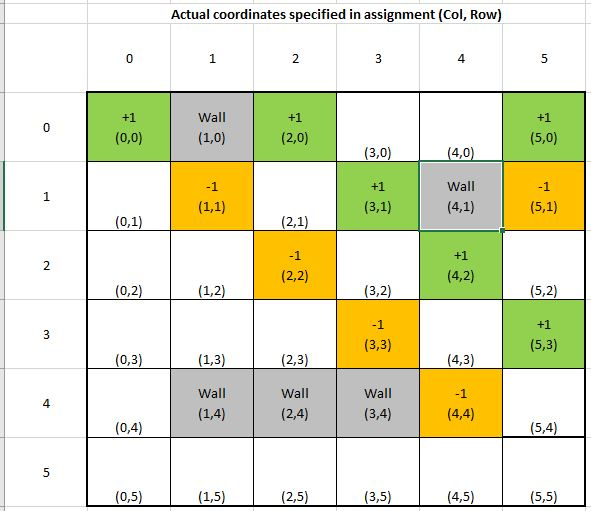

In [34]:
Image(filename = "coordinates_used_second_col,row.JPG", width = 600, height = 300)

In [35]:
iterations = int(len(hist)/36)
print(iterations)

hist_0_0 = []
hist_0_1 = []
hist_0_2 = []
hist_0_3 = [] 
hist_0_4 = [] 
hist_0_5 = [] 

hist_1_0 = []
hist_1_1 = [] 
hist_1_2 = []
hist_1_3 = [] 
hist_1_4 = [] 
hist_1_5 = [] 

hist_2_0 = []
hist_2_1 = []
hist_2_2 = []
hist_2_3 = []
hist_2_4 = []
hist_2_5 = []

hist_3_0 = []
hist_3_1 = []
hist_3_2 = []
hist_3_3 = []
hist_3_4 = []
hist_3_5 = []

hist_4_0 = []
hist_4_1 = []
hist_4_2 = []
hist_4_3 = []
hist_4_4 = []
hist_4_5 = []

hist_5_0 = []
hist_5_1 = []
hist_5_2 = []
hist_5_3 = []
hist_5_4 = []
hist_5_5 = []

#change coordinates
for i in range(iterations):
    hist_0_0.append(hist[0+i*36])
    hist_1_0.append(hist[1+i*36])
    hist_2_0.append(hist[2+i*36])
    hist_3_0.append(hist[3+i*36]) 
    hist_4_0.append(hist[4+i*36])
    hist_5_0.append(hist[5+i*36]) 

    hist_0_1.append(hist[6+i*36])
    hist_1_1.append(hist[7+i*36]) 
    hist_2_1.append(hist[8+i*36]) 
    hist_3_1.append(hist[9+i*36]) 
    hist_4_1.append(hist[10+i*36]) 
    hist_5_1.append(hist[11+i*36]) 
    
    hist_0_2.append(hist[12+i*36])
    hist_1_2.append(hist[13+i*36]) 
    hist_2_2.append(hist[14+i*36])
    hist_3_2.append(hist[15+i*36])
    hist_4_2.append(hist[16+i*36])
    hist_5_2.append(hist[17+i*36])
    
    hist_0_3.append(hist[18+i*36])
    hist_1_3.append(hist[19+i*36]) 
    hist_2_3.append(hist[20+i*36])
    hist_3_3.append(hist[21+i*36])
    hist_4_3.append(hist[22+i*36])
    hist_5_3.append(hist[23+i*36])
    
    hist_0_4.append(hist[24+i*36])
    hist_1_4.append(hist[25+i*36]) 
    hist_2_4.append(hist[26+i*36])
    hist_3_4.append(hist[27+i*36])
    hist_4_4.append(hist[28+i*36])
    hist_5_4.append(hist[29+i*36])
    
    hist_0_5.append(hist[30+i*36])
    hist_1_5.append(hist[31+i*36]) 
    hist_2_5.append(hist[32+i*36])
    hist_3_5.append(hist[33+i*36])
    hist_4_5.append(hist[34+i*36])
    hist_5_5.append(hist[35+i*36])

1181


In [36]:
list_of_tuples = [str((i,j)) for i in range(6) for j in range (6)]
print(list_of_tuples)

['(0, 0)', '(0, 1)', '(0, 2)', '(0, 3)', '(0, 4)', '(0, 5)', '(1, 0)', '(1, 1)', '(1, 2)', '(1, 3)', '(1, 4)', '(1, 5)', '(2, 0)', '(2, 1)', '(2, 2)', '(2, 3)', '(2, 4)', '(2, 5)', '(3, 0)', '(3, 1)', '(3, 2)', '(3, 3)', '(3, 4)', '(3, 5)', '(4, 0)', '(4, 1)', '(4, 2)', '(4, 3)', '(4, 4)', '(4, 5)', '(5, 0)', '(5, 1)', '(5, 2)', '(5, 3)', '(5, 4)', '(5, 5)']


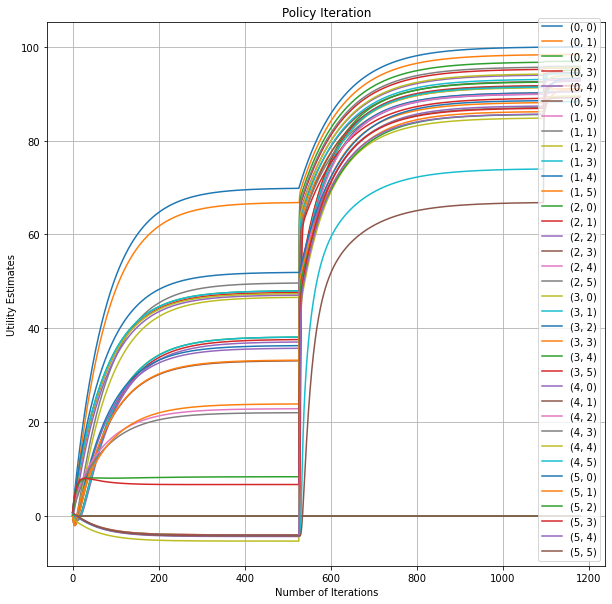

In [37]:
from matplotlib.pyplot import figure
x = [i for i in range(iterations)]

fig, ax = plt.subplots()
ax.plot(x, hist_0_0)
ax.plot(x, hist_0_1)
ax.plot(x, hist_0_2)
ax.plot(x, hist_0_3)
ax.plot(x, hist_0_4)
ax.plot(x, hist_0_5)

ax.plot(x, hist_1_0)
ax.plot(x, hist_1_1)
ax.plot(x, hist_1_2)
ax.plot(x, hist_1_3)
ax.plot(x, hist_1_4)
ax.plot(x, hist_1_5)

ax.plot(x, hist_2_0)
ax.plot(x, hist_2_1)
ax.plot(x, hist_2_2)
ax.plot(x, hist_2_3)
ax.plot(x, hist_2_4)
ax.plot(x, hist_2_5)

ax.plot(x, hist_3_0)
ax.plot(x, hist_3_1)
ax.plot(x, hist_3_2)
ax.plot(x, hist_3_3)
ax.plot(x, hist_3_4)
ax.plot(x, hist_3_5)

ax.plot(x, hist_4_0)
ax.plot(x, hist_4_1)
ax.plot(x, hist_4_2)
ax.plot(x, hist_4_3)
ax.plot(x, hist_4_4)
ax.plot(x, hist_4_5)

ax.plot(x, hist_5_0)
ax.plot(x, hist_5_1)
ax.plot(x, hist_5_2)
ax.plot(x, hist_5_3)
ax.plot(x, hist_5_4)
ax.plot(x, hist_5_5)

plt.legend(list_of_tuples, loc ="lower right")

plt.rcParams["figure.figsize"]=10,10

ax.set(xlabel='Number of Iterations', ylabel='Utility Estimates', title='Policy Iteration')
ax.grid()

fig.savefig("test.png")
plt.show()

# Printing column by column for a better view

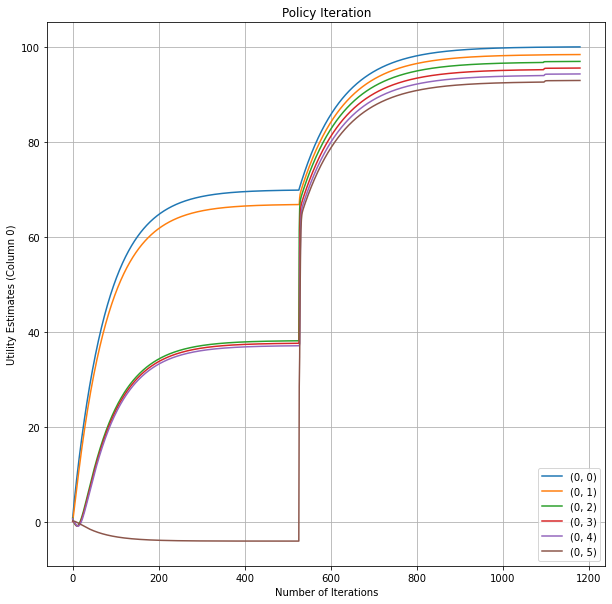

In [38]:
#Column 0

fig, ax = plt.subplots()
ax.plot(x, hist_0_0)
ax.plot(x, hist_0_1)
ax.plot(x, hist_0_2)
ax.plot(x, hist_0_3)
ax.plot(x, hist_0_4)
ax.plot(x, hist_0_5)

plt.legend(list_of_tuples, loc ="lower right")

ax.set(xlabel='Number of Iterations', ylabel='Utility Estimates (Column 0)', title='Policy Iteration')
ax.grid()

fig.savefig("test.png")
plt.show()

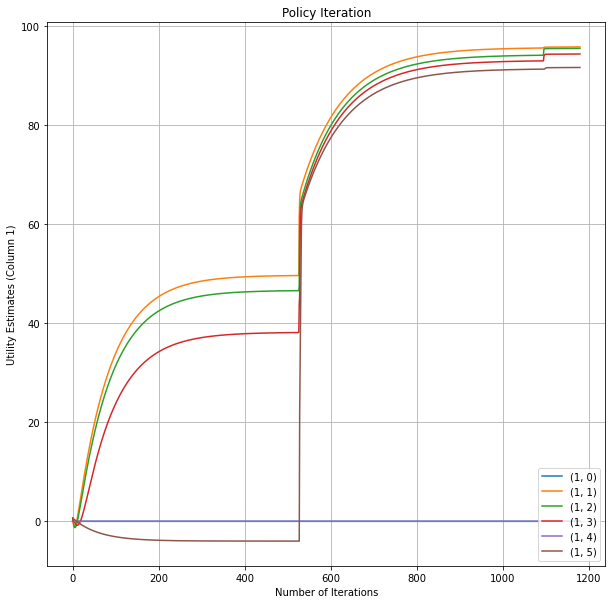

In [39]:
#Column 1

fig, ax = plt.subplots()
ax.plot(x, hist_1_0)
ax.plot(x, hist_1_1)
ax.plot(x, hist_1_2)
ax.plot(x, hist_1_3)
ax.plot(x, hist_1_4)
ax.plot(x, hist_1_5)

plt.legend(list_of_tuples[6:12], loc ="lower right")

ax.set(xlabel='Number of Iterations', ylabel='Utility Estimates (Column 1)', title='Policy Iteration')
ax.grid()

fig.savefig("test.png")
plt.show()

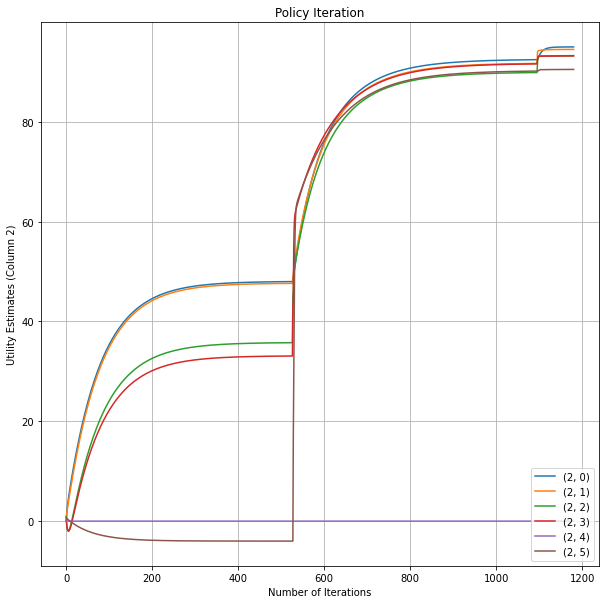

In [40]:
#Column 2

fig, ax = plt.subplots()
ax.plot(x, hist_2_0)
ax.plot(x, hist_2_1)
ax.plot(x, hist_2_2)
ax.plot(x, hist_2_3)
ax.plot(x, hist_2_4)
ax.plot(x, hist_2_5)

plt.legend(list_of_tuples[12:18], loc ="lower right")

ax.set(xlabel='Number of Iterations', ylabel='Utility Estimates (Column 2)', title='Policy Iteration')
ax.grid()

fig.savefig("test.png")
plt.show()

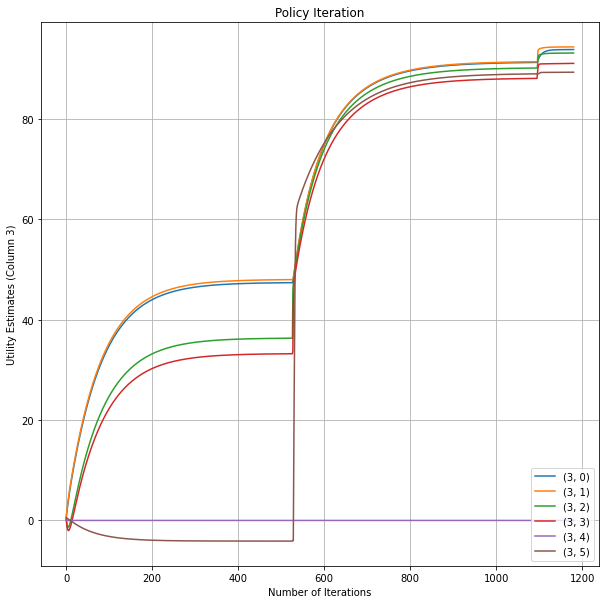

In [41]:
#Column 3

fig, ax = plt.subplots()
ax.plot(x, hist_3_0)
ax.plot(x, hist_3_1)
ax.plot(x, hist_3_2)
ax.plot(x, hist_3_3)
ax.plot(x, hist_3_4)
ax.plot(x, hist_3_5)

plt.legend(list_of_tuples[18:24], loc ="lower right")

ax.set(xlabel='Number of Iterations', ylabel='Utility Estimates (Column 3)', title='Policy Iteration')
ax.grid()

fig.savefig("test.png")
plt.show()

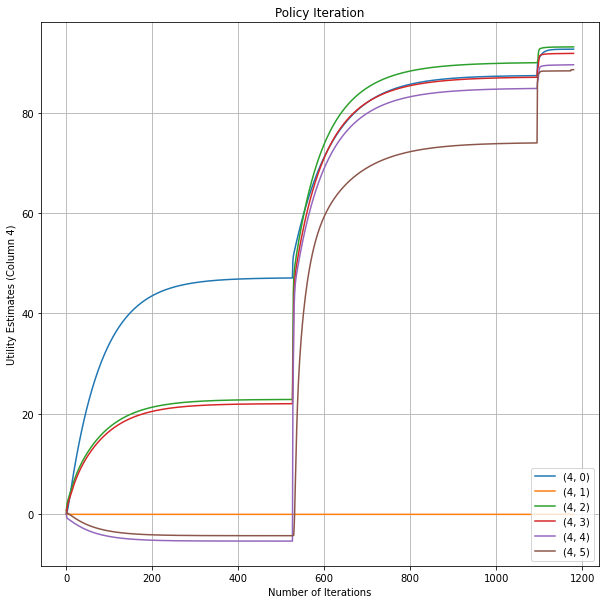

In [42]:
#Column 4

fig, ax = plt.subplots()
ax.plot(x, hist_4_0)
ax.plot(x, hist_4_1)
ax.plot(x, hist_4_2)
ax.plot(x, hist_4_3)
ax.plot(x, hist_4_4)
ax.plot(x, hist_4_5)

plt.legend(list_of_tuples[24:30], loc ="lower right")

ax.set(xlabel='Number of Iterations', ylabel='Utility Estimates (Column 4)', title='Policy Iteration')
ax.grid()

fig.savefig("test.png")
plt.show()

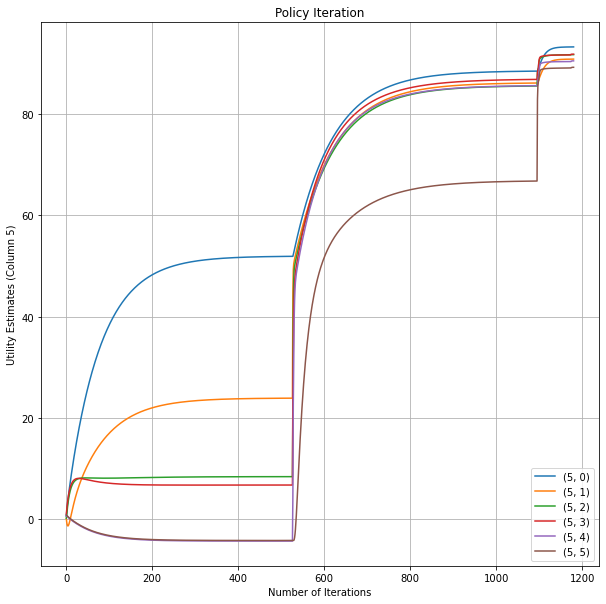

In [43]:
#Column 5

fig, ax = plt.subplots()
ax.plot(x, hist_5_0)
ax.plot(x, hist_5_1)
ax.plot(x, hist_5_2)
ax.plot(x, hist_5_3)
ax.plot(x, hist_5_4)
ax.plot(x, hist_5_5)

plt.legend(list_of_tuples[30:36], loc ="lower right")

ax.set(xlabel='Number of Iterations', ylabel='Utility Estimates (Column 5)', title='Policy Iteration')
ax.grid()

fig.savefig("test.png")
plt.show()

# Section 1: Value Iteration

### Please note that (row,col) format is used at first

In [44]:
#value iteration
import numpy as np
import matplotlib.pyplot as plt

SMALL_ENOUGH = 10e-4
GAMMA = 0.99
ALL_POSSIBLE_ACTIONS = ('U', 'D', 'L', 'R')


if __name__ == '__main__':
    grid = negative_grid()

    
    #print rewards
    print("rewards:")
    print_values(grid.rewards, grid)
    
    
    #we will randomly choose an action and update as we learn
    policy = {}
    for s in grid.actions.keys():
        policy[s] = np.random.choice(ALL_POSSIBLE_ACTIONS)
    
    
    #initial policy
    print("initial policy:")
    print_policy(policy, grid)
    
    hist = []
    
    #initialize V(s)
    V = {}
    states = grid.all_states()
    for s in states:
        if s in grid.actions:
            V[s] = 0
            #V[s] = np.random.random()
        else:
            V[s] = 0

    
    #repeat until convergenece
    while True:
        biggest_change = 0
        for s in states: 
            old_v = V[s]
            
            if s in policy: 
                new_v = float('-inf')
                for a in ALL_POSSIBLE_ACTIONS:
                    
                    grid.set_state(s)
                    #r = grid.move(a) #move only when legal / possible. Returns reward. 
                    r = grid.rewards.get(grid.current_state(), 0)
                    
                    
                    _ = grid.move(a)
                    v_correct = V[grid.current_state()]
                    
                    grid.set_state(s)
                    if a == 'U':
                        r_clockwise = grid.move('R')
                        v_clockwise = V[grid.current_state()]
                        grid.set_state(s)
                        r_anticlockwise = grid.move('L')
                    elif a == 'R':
                        r_clockwise = grid.move('D')
                        v_clockwise = V[grid.current_state()]
                        grid.set_state(s)
                        r_anticlockwise = grid.move('U')
                    elif a == 'D':
                        r_clockwise = grid.move('L')
                        v_clockwise = V[grid.current_state()]
                        grid.set_state(s)
                        r_anticlockwise = grid.move('R')
                    elif a == 'L':
                        r_clockwise = grid.move('U')
                        v_clockwise = V[grid.current_state()]
                        grid.set_state(s)
                        r_anticlockwise = grid.move('D')
                        
                    v_anticlockwise = V[grid.current_state()]
                        
                        
                    v = r + GAMMA * (0.8*v_correct + 0.1*v_clockwise + 0.1*v_anticlockwise)
                    
                    if v > new_v:
                        new_v = v
                V[s] = new_v #update value if needed to
                biggest_change = max(biggest_change, np.abs(old_v - V[s]))
                
                
                print('Values:')
                print_values(V, grid)

                
        if biggest_change < SMALL_ENOUGH:
            break
            
            
    #find a policy that leads to optimal value function
    for s in policy.keys():
        best_a = None
        best_value = float('-inf')
        #loop through all possible actions to ind the best current action
        for a in ALL_POSSIBLE_ACTIONS:
            
            grid.set_state(s)
            r = grid.rewards.get(grid.current_state(), 0)
                    
                    
            _ = grid.move(a)
            v_correct = V[grid.current_state()]
                    
            grid.set_state(s)
            if a == 'U':
                r_clockwise = grid.move('R')
                v_clockwise = V[grid.current_state()]
                grid.set_state(s)
                r_anticlockwise = grid.move('L')
            elif a == 'R':
                r_clockwise = grid.move('D')
                v_clockwise = V[grid.current_state()]
                grid.set_state(s)
                r_anticlockwise = grid.move('U')
            elif a == 'D':
                r_clockwise = grid.move('L')
                v_clockwise = V[grid.current_state()]
                grid.set_state(s)
                r_anticlockwise = grid.move('R')
            elif a == 'L':
                r_clockwise = grid.move('U')
                v_clockwise = V[grid.current_state()]
                grid.set_state(s)
                r_anticlockwise = grid.move('D')
                        
            v_anticlockwise = V[grid.current_state()] 
                        
            v = r + GAMMA * (0.8*v_correct + 0.1*v_clockwise + 0.1*v_anticlockwise)
            
            
            if v > best_value:
                best_value = v
                best_a = a
        policy[s] = best_a
        
    print('values:')
    print_values(V, grid)
    print('policy:')
    print_policy(policy, grid)

rewards:
--------------------------
 1.00000|  0.00000|  1.00000| -0.04000| -0.04000|  1.00000| 
--------------------------
-0.04000| -1.00000| -0.04000|  1.00000|  0.00000| -1.00000| 
--------------------------
-0.04000| -0.04000| -1.00000| -0.04000|  1.00000| -0.04000| 
--------------------------
-0.04000| -0.04000| -0.04000| -1.00000| -0.04000|  1.00000| 
--------------------------
-0.04000|  0.00000|  0.00000|  0.00000| -1.00000| -0.04000| 
--------------------------
-0.04000| -0.04000| -0.04000| -0.04000| -0.04000| -0.04000| 
initial policy:
--------------------------
    R   |         |     D   |     D   |     L   |     L   | 
--------------------------
    U   |     D   |     L   |     U   |         |     L   | 
--------------------------
    U   |     U   |     U   |     R   |     L   |     U   | 
--------------------------
    R   |     L   |     U   |     R   |     L   |     D   | 
--------------------------
    L   |         |         |         |     D   |     R   | 
-------

Values:
--------------------------
 1.00000|  0.00000|  1.98262|  0.92545|  0.75200|  1.96545| 
--------------------------
 0.71533| -0.33036|  0.85100|  1.00000|  0.00000| -0.20800| 
--------------------------
-0.04831| -0.04396| -0.25595|  0.75161|  0.99604| -0.04000| 
--------------------------
-0.04396| -0.08313| -0.14296| -1.00000|  0.74808|  0.99208| 
--------------------------
-0.08038|  0.00000|  0.00000|  0.00000| -1.00792| -0.04000| 
--------------------------
-0.04396| -0.08078| -0.04792| -0.04000| -0.07999| -0.04396| 
Values:
--------------------------
 1.00000|  0.00000|  1.98262|  0.92545|  0.75200|  1.96545| 
--------------------------
 0.71533| -0.33036|  0.85100|  1.00000|  0.00000| -0.20800| 
--------------------------
-0.04831| -0.04396| -0.25595|  0.75161|  0.99604|  0.84038| 
--------------------------
-0.04396| -0.08313| -0.14296| -1.00000|  0.74808|  0.99208| 
--------------------------
-0.08038|  0.00000|  0.00000|  0.00000| -1.00792| -0.04000| 
----------------

 0.50996|  0.38034|  0.49390|  1.67812|  2.88261|  1.76642| 
--------------------------
 0.34246| -0.12889| -0.14533|  0.47890|  1.65878|  1.93248| 
--------------------------
-0.12096|  0.00000|  0.00000|  0.00000| -0.42541|  1.51197| 
--------------------------
-0.12960| -0.12194| -0.09430|  0.15814|  0.27126|  0.45618| 
Values:
--------------------------
 1.99000|  0.00000|  2.95183|  1.87193|  2.59933|  2.91610| 
--------------------------
 1.63611|  0.29506|  2.61438|  2.90221|  0.00000|  1.41161| 
--------------------------
 0.50996|  0.38034|  0.49390|  1.67812|  2.88261|  1.76642| 
--------------------------
 0.34246| -0.12889| -0.14533|  0.47890|  1.65878|  1.93248| 
--------------------------
-0.12096|  0.00000|  0.00000|  0.00000| -0.42541|  1.51197| 
--------------------------
-0.12960| -0.12194| -0.09430|  0.15814|  0.27126|  0.45618| 
Values:
--------------------------
 1.99000|  0.00000|  2.95183|  1.87193|  2.59933|  2.91610| 
--------------------------
 1.63611|  0.295

 2.97010|  0.00000|  3.90809|  2.80812|  2.59933|  3.85558| 
--------------------------
 2.58690|  1.13746|  2.61438|  3.83325|  0.00000|  1.41161| 
--------------------------
 1.34394|  0.38034|  1.36494|  2.59283|  2.88261|  2.68148| 
--------------------------
 1.09130|  0.33333|  0.38582|  1.34645|  2.57310|  2.85509| 
--------------------------
 0.20728|  0.00000|  0.00000|  0.00000|  0.42133|  2.41262| 
--------------------------
-0.12960| -0.01142|  0.06657|  0.15814|  1.00232|  1.22949| 
Values:
--------------------------
 2.97010|  0.00000|  3.90809|  2.80812|  2.59933|  3.85558| 
--------------------------
 2.58690|  1.13746|  2.61438|  3.83325|  0.00000|  1.41161| 
--------------------------
 1.34394|  0.38034|  1.36494|  2.59283|  2.88261|  2.68148| 
--------------------------
 1.09130|  0.33333|  0.38582|  1.34645|  2.57310|  2.85509| 
--------------------------
 0.20728|  0.00000|  0.00000|  0.00000|  0.42133|  2.41262| 
--------------------------
 0.11020| -0.01142|  0.0

 2.25935|  2.07470|  2.27421|  3.50777|  4.71584|  3.58449| 
--------------------------
 1.96906|  1.12738|  1.20733|  2.24218|  3.47980|  3.76554| 
--------------------------
 0.86535|  0.00000|  0.00000|  0.00000|  1.31845|  3.31169| 
--------------------------
 0.69874|  0.42900|  0.59502|  1.57783|  1.84642|  2.09175| 
Values:
--------------------------
 3.94040|  0.00000|  4.85159|  3.73213|  4.44802|  4.78462| 
--------------------------
 3.53881|  2.03955|  4.47489|  4.75268|  0.00000|  3.25138| 
--------------------------
 2.25935|  2.07470|  2.27421|  3.50777|  4.71584|  3.58449| 
--------------------------
 1.96906|  1.12738|  2.09476|  2.24218|  3.47980|  3.76554| 
--------------------------
 0.86535|  0.00000|  0.00000|  0.00000|  1.31845|  3.31169| 
--------------------------
 0.69874|  0.42900|  0.59502|  1.57783|  1.84642|  2.09175| 
Values:
--------------------------
 3.94040|  0.00000|  4.85159|  3.73213|  4.44802|  4.78462| 
--------------------------
 3.53881|  2.039

 1.69083|  0.00000|  0.00000|  0.00000|  3.10318|  4.20179| 
--------------------------
 1.47685|  1.09628|  2.14250|  2.42382|  2.71643|  2.97274| 
Values:
--------------------------
 4.90100|  0.00000|  5.78260|  4.64479|  5.35784|  5.70345| 
--------------------------
 4.48412|  2.95142|  5.39246|  5.66116|  0.00000|  4.16091| 
--------------------------
 3.19181|  2.97865|  3.18671|  4.41614|  5.61553|  4.47867| 
--------------------------
 2.88140|  2.00548|  2.99312|  3.13846|  4.37876|  5.55407| 
--------------------------
 1.69083|  0.00000|  0.00000|  0.00000|  3.10318|  4.20179| 
--------------------------
 1.47685|  1.09628|  2.14250|  2.42382|  2.71643|  3.85104| 
Values:
--------------------------
 5.85199|  0.00000|  5.78260|  4.64479|  5.35784|  5.70345| 
--------------------------
 4.48412|  2.95142|  5.39246|  5.66116|  0.00000|  4.16091| 
--------------------------
 3.19181|  2.97865|  3.18671|  4.41614|  5.61553|  4.47867| 
--------------------------
 2.88140|  2.005

 5.04675|  3.89396|  4.09191|  6.20486|  6.50525|  5.36929| 
--------------------------
 3.79729|  3.80473|  3.88667|  4.02738|  6.14779|  6.43350| 
--------------------------
 3.47767|  0.00000|  0.00000|  0.00000|  3.98264|  5.08202| 
--------------------------
 2.33259|  1.87392|  2.98210|  3.28016|  4.44853|  4.72124| 
Values:
--------------------------
 6.79347|  0.00000|  6.70275|  6.46849|  6.25772|  6.61220| 
--------------------------
 5.42063|  4.75702|  6.29997|  6.56028|  0.00000|  5.06072| 
--------------------------
 5.04675|  3.89396|  4.09191|  6.20486|  6.50525|  5.36929| 
--------------------------
 3.79729|  3.80473|  3.88667|  4.02738|  6.14779|  6.43350| 
--------------------------
 3.47767|  0.00000|  0.00000|  0.00000|  3.98264|  5.08202| 
--------------------------
 2.33259|  2.69286|  2.98210|  3.28016|  4.44853|  4.72124| 
Values:
--------------------------
 6.79347|  0.00000|  7.61253|  6.46849|  6.25772|  6.61220| 
--------------------------
 5.42063|  4.757

 7.72553|  0.00000|  7.61253|  6.46849|  7.14773|  7.51099| 
--------------------------
 6.34801|  5.64715|  7.19766|  7.45040|  0.00000|  5.95072| 
--------------------------
 5.04675|  4.80464|  4.98936|  6.20486|  7.38520|  6.25009| 
--------------------------
 4.70963|  3.80473|  4.77410|  4.90766|  6.14779|  7.30341| 
--------------------------
 3.47767|  0.00000|  0.00000|  0.00000|  4.85265|  5.95274| 
--------------------------
 3.21183|  2.69286|  3.82356|  4.13271|  4.44853|  5.58237| 
Values:
--------------------------
 7.72553|  0.00000|  7.61253|  7.36709|  7.14773|  7.51099| 
--------------------------
 6.34801|  5.64715|  7.19766|  7.45040|  0.00000|  5.95072| 
--------------------------
 5.04675|  4.80464|  4.98936|  6.20486|  7.38520|  6.25009| 
--------------------------
 4.70963|  3.80473|  4.77410|  4.90766|  6.14779|  7.30341| 
--------------------------
 3.47767|  0.00000|  0.00000|  0.00000|  4.85265|  5.95274| 
--------------------------
 3.21183|  2.69286|  3.8

 4.37860|  0.00000|  0.00000|  0.00000|  4.85265|  6.81404| 
--------------------------
 4.09445|  3.52145|  4.65925|  4.97751|  5.30206|  5.58237| 
Values:
--------------------------
 7.72553|  0.00000|  8.51210|  7.36709|  8.02798|  8.39991| 
--------------------------
 7.26614|  5.64715|  8.08548|  8.33155|  0.00000|  6.83098| 
--------------------------
 5.96291|  5.70741|  5.87770|  7.08580|  8.25557|  7.12124| 
--------------------------
 5.61459|  4.70416|  5.65301|  5.77937|  7.01797|  8.16390| 
--------------------------
 4.37860|  0.00000|  0.00000|  0.00000|  5.71324|  6.81404| 
--------------------------
 4.09445|  3.52145|  4.65925|  4.97751|  5.30206|  5.58237| 
Values:
--------------------------
 7.72553|  0.00000|  8.51210|  7.36709|  8.02798|  8.39991| 
--------------------------
 7.26614|  5.64715|  8.08548|  8.33155|  0.00000|  6.83098| 
--------------------------
 5.96291|  5.70741|  5.87770|  7.08580|  8.25557|  7.12124| 
--------------------------
 5.61459|  4.704

 8.64828|  0.00000|  9.40160|  8.25575|  8.89858|  9.27909| 
--------------------------
 8.17503|  6.52780|  8.96349|  9.20373|  0.00000|  6.83098| 
--------------------------
 6.87015|  6.60139|  6.75655|  7.95778|  9.11654|  7.98291| 
--------------------------
 6.51098|  5.59576|  5.65301|  6.64221|  7.87880|  8.16390| 
--------------------------
 5.27372|  0.00000|  0.00000|  0.00000|  5.71324|  7.66601| 
--------------------------
 4.97253|  4.34737|  4.65925|  5.81354|  6.14646|  6.43428| 
Values:
--------------------------
 8.64828|  0.00000|  9.40160|  8.25575|  8.89858|  9.27909| 
--------------------------
 8.17503|  6.52780|  8.96349|  9.20373|  0.00000|  7.70158| 
--------------------------
 6.87015|  6.60139|  6.75655|  7.95778|  9.11654|  7.98291| 
--------------------------
 6.51098|  5.59576|  5.65301|  6.64221|  7.87880|  8.16390| 
--------------------------
 5.27372|  0.00000|  0.00000|  0.00000|  5.71324|  7.66601| 
--------------------------
 4.97253|  4.34737|  4.6

 9.56179|  0.00000|  10.28115|  9.13456|  9.75964|  10.14863| 
--------------------------
 9.07476|  7.39887|  9.83179|  10.06693|  0.00000|  7.70158| 
--------------------------
 7.76831|  7.48637|  7.62588|  8.82079|  9.96825|  8.83525| 
--------------------------
 7.39847|  6.47864|  6.52275|  7.49613|  8.73037|  9.01505| 
--------------------------
 6.16089|  0.00000|  0.00000|  0.00000|  6.56455|  8.50874| 
--------------------------
 5.84318|  5.16637|  5.48686|  6.64063|  6.98175|  7.27697| 
Values:
--------------------------
 9.56179|  0.00000|  10.28115|  9.13456|  9.75964|  10.14863| 
--------------------------
 9.07476|  7.39887|  9.83179|  10.06693|  0.00000|  8.56263| 
--------------------------
 7.76831|  7.48637|  7.62588|  8.82079|  9.96825|  8.83525| 
--------------------------
 7.39847|  6.47864|  6.52275|  7.49613|  8.73037|  9.01505| 
--------------------------
 6.16089|  0.00000|  0.00000|  0.00000|  6.56455|  8.50874| 
--------------------------
 5.84318|  5.16637

 10.46617|  0.00000|  11.15086|  10.00362|  9.75964|  11.00864| 
--------------------------
 9.96539|  8.26041|  9.83179|  10.92118|  0.00000|  8.56263| 
--------------------------
 8.65742|  7.48637|  8.48573|  9.67483|  9.96825|  9.67839| 
--------------------------
 8.27703|  7.35259|  7.38320|  8.34111|  9.57281|  9.85697| 
--------------------------
 7.03945|  0.00000|  0.00000|  0.00000|  7.40671|  9.34235| 
--------------------------
 6.70545|  5.97712|  6.30578|  6.64063|  7.80800|  8.11054| 
Values:
--------------------------
 10.46617|  0.00000|  11.15086|  10.00362|  9.75964|  11.00864| 
--------------------------
 9.96539|  8.26041|  9.83179|  10.92118|  0.00000|  8.56263| 
--------------------------
 8.65742|  7.48637|  8.48573|  9.67483|  9.96825|  9.67839| 
--------------------------
 8.27703|  7.35259|  7.38320|  8.34111|  9.57281|  9.85697| 
--------------------------
 7.03945|  0.00000|  0.00000|  0.00000|  7.40671|  9.34235| 
--------------------------
 6.70545|  5.9

 8.77022|  0.00000|  0.00000|  0.00000|  9.06400|  10.16694| 
--------------------------
 7.55909|  6.77926|  7.91728|  8.26809|  8.62532|  9.75069| 
Values:
--------------------------
 12.24790|  0.00000|  12.01086|  11.71292|  11.45352|  11.85921| 
--------------------------
 10.84703|  9.95523|  11.53962|  11.76649|  0.00000|  10.25651| 
--------------------------
 10.40878|  9.22942|  9.33619|  11.35613|  11.64438|  10.51247| 
--------------------------
 9.14671|  8.21762|  9.07635|  9.17721|  11.23074|  11.51356| 
--------------------------
 8.77022|  0.00000|  0.00000|  0.00000|  9.06400|  10.16694| 
--------------------------
 7.55909|  6.77926|  7.91728|  8.26809|  8.62532|  9.75069| 
Values:
--------------------------
 12.24790|  0.00000|  12.01086|  11.71292|  11.45352|  11.85921| 
--------------------------
 10.84703|  9.95523|  11.53962|  11.76649|  0.00000|  10.25651| 
--------------------------
 10.40878|  9.22942|  9.33619|  11.35613|  11.64438|  10.51247| 
-------------

 11.27119|  10.08762|  11.00930|  12.18348|  12.46903|  11.33759| 
--------------------------
 10.00758|  9.92116|  9.90921|  10.00446|  12.04643|  12.32844| 
--------------------------
 9.62251|  0.00000|  0.00000|  0.00000|  9.87936|  10.98261| 
--------------------------
 8.40407|  8.35772|  8.70999|  9.06865|  10.23353|  10.55749| 
Values:
--------------------------
 13.12542|  0.00000|  13.70216|  12.55338|  12.28656|  13.53247| 
--------------------------
 12.58367|  10.78870|  12.37937|  12.60289|  0.00000|  11.08955| 
--------------------------
 11.27119|  10.08762|  11.00930|  12.18348|  12.46903|  11.33759| 
--------------------------
 10.00758|  9.92116|  9.90921|  10.00446|  12.04643|  12.32844| 
--------------------------
 9.62251|  0.00000|  0.00000|  0.00000|  9.87936|  10.98261| 
--------------------------
 8.40407|  8.35772|  8.70999|  9.06865|  10.23353|  10.55749| 
Values:
--------------------------
 13.12542|  0.00000|  13.70216|  12.55338|  12.28656|  13.53247| 
--

 12.12488|  11.77782|  11.83214|  13.00203|  14.09199|  12.96136| 
--------------------------
 11.70324|  10.75984|  10.73303|  11.63267|  12.85340|  13.13451| 
--------------------------
 10.46616|  0.00000|  0.00000|  0.00000|  10.68598|  12.58760| 
--------------------------
 10.06829|  9.13418|  9.49413|  10.64390|  11.02464|  11.35556| 
Values:
--------------------------
 13.99416|  0.00000|  14.53369|  13.38451|  13.92532|  14.35537| 
--------------------------
 13.43885|  11.61302|  14.03104|  14.24918|  0.00000|  12.72831| 
--------------------------
 12.12488|  11.77782|  11.83214|  13.00203|  14.09199|  12.96136| 
--------------------------
 11.70324|  10.75984|  11.54791|  11.63267|  12.85340|  13.13451| 
--------------------------
 10.46616|  0.00000|  0.00000|  0.00000|  10.68598|  12.58760| 
--------------------------
 10.06829|  9.13418|  9.49413|  10.64390|  11.02464|  11.35556| 
Values:
--------------------------
 13.99416|  0.00000|  14.53369|  13.38451|  13.92532|  1

 14.28539|  13.23458|  14.84317|  15.05916|  0.00000|  13.53424| 
--------------------------
 13.80644|  12.60999|  12.64596|  14.61296|  14.89049|  13.76022| 
--------------------------
 12.53821|  11.58990|  12.35394|  12.43374|  13.65175|  14.72065| 
--------------------------
 11.30127|  0.00000|  0.00000|  0.00000|  12.27343|  13.37714| 
--------------------------
 10.88769|  9.90226|  11.03711|  11.41880|  11.80721|  12.92596| 
Values:
--------------------------
 15.70568|  0.00000|  15.35596|  15.01921|  14.73125|  15.16924| 
--------------------------
 14.28539|  13.23458|  14.84317|  15.05916|  0.00000|  13.53424| 
--------------------------
 13.80644|  12.60999|  12.64596|  14.61296|  14.89049|  13.76022| 
--------------------------
 12.53821|  11.58990|  12.35394|  12.43374|  13.65175|  14.72065| 
--------------------------
 12.12791|  0.00000|  0.00000|  0.00000|  12.27343|  13.37714| 
--------------------------
 10.88769|  9.90226|  11.03711|  11.41880|  11.80721|  12.9259

 15.12338|  14.03203|  15.64630|  15.86044|  0.00000|  14.33134| 
--------------------------
 14.63448|  13.43366|  13.45087|  15.40547|  15.68045|  14.55050| 
--------------------------
 13.36472|  12.41144|  13.15121|  13.22622|  15.22290|  15.50091| 
--------------------------
 12.94618|  0.00000|  0.00000|  0.00000|  13.05444|  14.15816| 
--------------------------
 11.69873|  10.66204|  11.79615|  12.18535|  12.58135|  13.69849| 
Values:
--------------------------
 16.54862|  0.00000|  16.16906|  15.82298|  15.52834|  15.97419| 
--------------------------
 15.12338|  14.03203|  15.64630|  15.86044|  0.00000|  14.33134| 
--------------------------
 14.63448|  13.43366|  13.45087|  15.40547|  15.68045|  14.55050| 
--------------------------
 13.36472|  13.22453|  13.15121|  13.22622|  15.22290|  15.50091| 
--------------------------
 12.94618|  0.00000|  0.00000|  0.00000|  13.05444|  14.15816| 
--------------------------
 11.69873|  10.66204|  11.79615|  12.18535|  12.58135|  13.69

 14.18285|  14.02928|  13.93982|  14.01017|  15.99588|  16.27277| 
--------------------------
 13.75616|  0.00000|  0.00000|  0.00000|  13.82707|  14.93077| 
--------------------------
 12.50150|  12.15712|  12.54700|  12.94364|  14.10470|  14.46269| 
Values:
--------------------------
 17.38314|  0.00000|  17.76820|  16.61783|  16.31669|  17.55770| 
--------------------------
 16.77403|  14.82071|  16.44053|  16.65308|  0.00000|  15.11969| 
--------------------------
 15.45415|  14.24891|  15.03429|  16.18942|  16.46196|  16.10572| 
--------------------------
 14.18285|  14.02928|  13.93982|  14.01017|  15.99588|  16.27277| 
--------------------------
 13.75616|  0.00000|  0.00000|  0.00000|  13.82707|  14.93077| 
--------------------------
 12.50150|  12.15712|  12.54700|  12.94364|  14.10470|  14.46269| 
Values:
--------------------------
 17.38314|  0.00000|  17.76820|  16.61783|  16.31669|  17.55770| 
--------------------------
 16.77403|  14.82071|  16.44053|  17.43759|  0.00000|

 17.58688|  15.60076|  17.22599|  18.21559|  0.00000|  15.89939| 
--------------------------
 16.26552|  15.05584|  15.81307|  16.96524|  17.23509|  16.87082| 
--------------------------
 14.99269|  14.82576|  14.71984|  14.78566|  16.76056|  17.03631| 
--------------------------
 14.55793|  0.00000|  0.00000|  0.00000|  14.59143|  15.69506| 
--------------------------
 13.29608|  12.89761|  13.28976|  13.69376|  14.85409|  15.21866| 
Values:
--------------------------
 18.20931|  0.00000|  18.55446|  17.40390|  17.09640|  18.33645| 
--------------------------
 17.58688|  15.60076|  17.22599|  18.21559|  0.00000|  15.89939| 
--------------------------
 16.26552|  15.05584|  15.81307|  16.96524|  17.23509|  16.87082| 
--------------------------
 15.79432|  14.82576|  14.71984|  14.78566|  16.76056|  17.03631| 
--------------------------
 14.55793|  0.00000|  0.00000|  0.00000|  14.59143|  15.69506| 
--------------------------
 13.29608|  12.89761|  13.28976|  13.69376|  14.85409|  15.21

 19.02721|  0.00000|  19.33199|  18.18146|  17.86756|  19.10667| 
--------------------------
 18.39152|  16.37241|  18.77135|  18.98535|  0.00000|  16.67055| 
--------------------------
 17.06869|  15.85452|  16.58362|  17.73423|  18.75680|  17.62772| 
--------------------------
 16.58783|  15.61407|  15.49145|  16.31336|  17.51709|  17.79163| 
--------------------------
 15.35157|  0.00000|  0.00000|  0.00000|  15.34758|  17.19904| 
--------------------------
 14.86575|  13.66750|  14.02453|  15.16987|  15.59542|  15.96649| 
Values:
--------------------------
 19.02721|  0.00000|  19.33199|  18.18146|  18.63025|  19.10667| 
--------------------------
 18.39152|  16.37241|  18.77135|  18.98535|  0.00000|  16.67055| 
--------------------------
 17.06869|  15.85452|  16.58362|  17.73423|  18.75680|  17.62772| 
--------------------------
 16.58783|  15.61407|  15.49145|  16.31336|  17.51709|  17.79163| 
--------------------------
 15.35157|  0.00000|  0.00000|  0.00000|  15.34758|  17.199

 15.64190|  14.43984|  14.75139|  15.89603|  16.32878|  16.70627| 
Values:
--------------------------
 19.83694|  0.00000|  20.10089|  18.95045|  18.63025|  19.86843| 
--------------------------
 19.18805|  17.13564|  18.77135|  19.74667|  0.00000|  17.43325| 
--------------------------
 17.86375|  16.64506|  17.34579|  18.49510|  19.50569|  18.37662| 
--------------------------
 17.37332|  16.39433|  16.25504|  17.06568|  18.26575|  18.53882| 
--------------------------
 16.13717|  0.00000|  0.00000|  0.00000|  16.09565|  17.93892| 
--------------------------
 15.64190|  14.43984|  14.75139|  15.89603|  16.32878|  16.70627| 
Values:
--------------------------
 19.83694|  0.00000|  20.10089|  18.95045|  18.63025|  19.86843| 
--------------------------
 19.18805|  17.13564|  19.53126|  19.74667|  0.00000|  17.43325| 
--------------------------
 17.86375|  16.64506|  17.34579|  18.49510|  19.50569|  18.37662| 
--------------------------
 17.37332|  16.39433|  16.25504|  17.06568|  18.265

 18.65077|  18.20207|  18.09960|  19.24766|  20.24667|  19.11760| 
--------------------------
 18.15086|  17.16661|  17.01040|  17.80982|  19.00653|  19.27798| 
--------------------------
 16.91483|  0.00000|  0.00000|  0.00000|  16.83590|  18.67087| 
--------------------------
 16.41063|  15.20747|  15.47043|  16.61440|  17.05427|  17.43809| 
Values:
--------------------------
 20.63857|  0.00000|  20.86128|  19.71092|  20.13065|  20.62185| 
--------------------------
 19.97653|  17.89051|  20.28275|  20.49956|  0.00000|  18.93365| 
--------------------------
 18.65077|  18.20207|  18.09960|  19.24766|  20.24667|  19.11760| 
--------------------------
 18.15086|  17.16661|  17.01040|  17.80982|  19.00653|  19.27798| 
--------------------------
 16.91483|  0.00000|  0.00000|  0.00000|  16.83590|  18.67087| 
--------------------------
 16.41063|  15.20747|  15.47043|  16.61440|  17.05427|  17.43809| 
Values:
--------------------------
 20.63857|  0.00000|  20.86128|  19.71092|  20.13065

--------------------------
 17.17173|  15.96830|  16.88545|  17.32508|  17.77200|  18.87830| 
Values:
--------------------------
 22.21786|  0.00000|  21.61323|  21.20668|  20.86853|  21.36700| 
--------------------------
 20.75704|  19.37550|  21.02592|  21.24412|  0.00000|  19.67153| 
--------------------------
 20.20103|  18.96867|  18.84514|  20.72801|  20.97978|  19.85070| 
--------------------------
 18.92053|  17.93097|  18.49655|  18.54581|  19.73944|  20.73263| 
--------------------------
 18.44662|  0.00000|  0.00000|  0.00000|  18.29301|  19.39499| 
--------------------------
 17.17173|  15.96830|  16.88545|  17.32508|  17.77200|  18.87830| 
Values:
--------------------------
 22.21786|  0.00000|  21.61323|  21.20668|  20.86853|  21.36700| 
--------------------------
 20.75704|  19.37550|  21.02592|  21.24412|  0.00000|  19.67153| 
--------------------------
 20.20103|  18.96867|  18.84514|  20.72801|  20.97978|  19.85070| 
--------------------------
 18.92053|  17.93097|  1

 22.21786|  0.00000|  22.35685|  21.20668|  21.59833|  22.10398| 
--------------------------
 21.52967|  19.37550|  21.76086|  21.98043|  0.00000|  20.40132| 
--------------------------
 20.20103|  19.72745|  19.58250|  20.72801|  21.70508|  20.57600| 
--------------------------
 19.68241|  18.68748|  19.22750|  19.27373|  20.46455|  20.73263| 
--------------------------
 18.44662|  0.00000|  0.00000|  0.00000|  18.29301|  20.11135| 
--------------------------
 17.92518|  16.72174|  16.88545|  18.02815|  18.48205|  18.87830| 
Values:
--------------------------
 22.21786|  0.00000|  22.35685|  21.20668|  21.59833|  22.10398| 
--------------------------
 21.52967|  19.37550|  21.76086|  21.98043|  0.00000|  20.40132| 
--------------------------
 20.20103|  19.72745|  19.58250|  20.72801|  21.70508|  20.57600| 
--------------------------
 19.68241|  18.68748|  19.22750|  19.27373|  20.46455|  21.44829| 
--------------------------
 18.44662|  0.00000|  0.00000|  0.00000|  18.29301|  20.111

 19.20090|  0.00000|  0.00000|  0.00000|  19.00996|  20.82005| 
--------------------------
 18.67100|  17.46764|  17.58161|  18.72370|  19.18451|  19.58687| 
Values:
--------------------------
 22.99569|  0.00000|  23.09223|  21.94215|  22.32011|  22.83288| 
--------------------------
 22.29449|  20.10580|  22.48767|  22.70857|  0.00000|  21.12310| 
--------------------------
 20.96442|  20.47848|  20.31176|  21.45597|  22.42263|  21.29354| 
--------------------------
 20.43656|  19.43622|  19.95047|  19.99366|  21.18191|  22.15629| 
--------------------------
 19.20090|  0.00000|  0.00000|  0.00000|  19.00996|  20.82005| 
--------------------------
 18.67100|  17.46764|  17.58161|  18.72370|  19.18451|  19.58687| 
Values:
--------------------------
 22.99569|  0.00000|  23.09223|  21.94215|  22.32011|  22.83288| 
--------------------------
 22.29449|  20.10580|  22.48767|  22.70857|  0.00000|  21.12310| 
--------------------------
 20.96442|  20.47848|  20.31176|  21.45597|  22.42263|

 21.72009|  20.47848|  21.03301|  22.17589|  23.13247|  22.00338| 
--------------------------
 21.18308|  20.17727|  19.95047|  20.70567|  21.89156|  22.15629| 
--------------------------
 19.94754|  0.00000|  0.00000|  0.00000|  19.71924|  21.52117| 
--------------------------
 19.40927|  18.20603|  18.27033|  19.41181|  19.87945|  20.28785| 
Values:
--------------------------
 23.76573|  0.00000|  23.81945|  22.66946|  22.32011|  23.55379| 
--------------------------
 23.05159|  20.82807|  23.20642|  23.42864|  0.00000|  21.12310| 
--------------------------
 21.72009|  20.47848|  21.03301|  22.17589|  23.13247|  22.00338| 
--------------------------
 21.18308|  20.17727|  19.95047|  20.70567|  21.89156|  22.15629| 
--------------------------
 19.94754|  0.00000|  0.00000|  0.00000|  19.71924|  21.52117| 
--------------------------
 19.40927|  18.20603|  18.27033|  19.41181|  19.87945|  20.28785| 
Values:
--------------------------
 23.76573|  0.00000|  23.81945|  22.66946|  23.03398

 19.40927|  18.93694|  18.95168|  19.41181|  20.56695|  20.98133| 
Values:
--------------------------
 24.52807|  0.00000|  24.53861|  23.38872|  23.03398|  24.26679| 
--------------------------
 23.80104|  21.54243|  23.20642|  24.14074|  0.00000|  21.83698| 
--------------------------
 22.46811|  21.22184|  21.74635|  22.88787|  23.13247|  22.70559| 
--------------------------
 21.92203|  20.91071|  20.66556|  20.70567|  22.59359|  22.85671| 
--------------------------
 20.68661|  0.00000|  0.00000|  0.00000|  20.42092|  22.21478| 
--------------------------
 19.40927|  18.93694|  18.95168|  19.41181|  20.56695|  20.98133| 
Values:
--------------------------
 24.52807|  0.00000|  24.53861|  23.38872|  23.03398|  24.26679| 
--------------------------
 23.80104|  21.54243|  23.20642|  24.14074|  0.00000|  21.83698| 
--------------------------
 22.46811|  21.22184|  21.74635|  22.88787|  23.13247|  22.70559| 
--------------------------
 21.92203|  20.91071|  20.66556|  21.40985|  22.593

--------------------------
 22.65349|  21.63661|  21.37284|  21.40985|  23.28804|  23.54963| 
--------------------------
 21.41820|  0.00000|  0.00000|  0.00000|  21.11506|  22.90096| 
--------------------------
 20.14007|  19.66045|  19.62574|  20.09256|  21.24709|  21.66739| 
Values:
--------------------------
 25.28279|  0.00000|  25.24980|  24.10000|  23.74003|  24.97197| 
--------------------------
 24.54292|  22.24894|  23.91722|  24.84494|  0.00000|  22.54302| 
--------------------------
 23.20857|  21.95760|  22.45184|  23.59198|  23.83467|  23.40023| 
--------------------------
 22.65349|  21.63661|  21.37284|  22.10628|  23.28804|  23.54963| 
--------------------------
 21.41820|  0.00000|  0.00000|  0.00000|  21.11506|  22.90096| 
--------------------------
 20.14007|  19.66045|  19.62574|  20.09256|  21.24709|  21.66739| 
Values:
--------------------------
 25.28279|  0.00000|  25.24980|  24.10000|  23.74003|  24.97197| 
--------------------------
 24.54292|  22.24894|  23.

 23.94154|  22.68586|  22.45184|  24.28832|  24.52929|  23.40023| 
--------------------------
 22.65349|  22.35506|  22.07241|  22.10628|  23.97499|  24.23513| 
--------------------------
 22.14237|  0.00000|  0.00000|  0.00000|  21.80172|  22.90096| 
--------------------------
 20.86346|  20.37663|  20.29259|  20.76602|  21.91994|  22.34610| 
Values:
--------------------------
 26.02996|  0.00000|  25.95311|  24.80339|  24.43833|  25.66942| 
--------------------------
 24.54292|  22.94769|  24.62014|  24.84494|  0.00000|  23.24132| 
--------------------------
 23.94154|  22.68586|  23.14959|  24.28832|  24.52929|  23.40023| 
--------------------------
 22.65349|  22.35506|  22.07241|  22.10628|  23.97499|  24.23513| 
--------------------------
 22.14237|  0.00000|  0.00000|  0.00000|  21.80172|  22.90096| 
--------------------------
 20.86346|  20.37663|  20.29259|  20.76602|  21.91994|  22.34610| 
Values:
--------------------------
 26.02996|  0.00000|  25.95311|  24.80339|  24.43833

 22.14237|  0.00000|  0.00000|  0.00000|  22.48096|  23.57979| 
--------------------------
 21.57953|  20.37663|  20.95229|  21.43226|  21.91994|  23.01753| 
Values:
--------------------------
 26.76966|  0.00000|  25.95311|  25.49899|  25.12897|  25.66942| 
--------------------------
 25.27730|  23.63878|  25.31528|  25.54133|  0.00000|  23.93197| 
--------------------------
 24.66710|  23.40667|  23.14959|  24.97697|  25.21639|  24.08736| 
--------------------------
 23.37755|  22.35506|  22.76434|  22.79504|  23.97499|  24.91327| 
--------------------------
 22.85921|  0.00000|  0.00000|  0.00000|  22.48096|  23.57979| 
--------------------------
 21.57953|  20.37663|  20.95229|  21.43226|  21.91994|  23.01753| 
Values:
--------------------------
 26.76966|  0.00000|  25.95311|  25.49899|  25.12897|  25.66942| 
--------------------------
 25.27730|  23.63878|  25.31528|  25.54133|  0.00000|  23.93197| 
--------------------------
 24.66710|  23.40667|  23.14959|  24.97697|  25.21639|

 24.66710|  24.12013|  23.83968|  24.97697|  25.89604|  24.76706| 
--------------------------
 24.09426|  23.06613|  23.44872|  23.47622|  24.65450|  25.58413| 
--------------------------
 22.85921|  0.00000|  0.00000|  0.00000|  23.15286|  24.25132| 
--------------------------
 22.28833|  21.08556|  21.60491|  22.09136|  22.58557|  23.68175| 
Values:
--------------------------
 27.50197|  0.00000|  26.64862|  26.18688|  25.81204|  26.35922| 
--------------------------
 26.00427|  24.32351|  26.00272|  26.23001|  0.00000|  24.61504| 
--------------------------
 24.66710|  24.12013|  23.83968|  24.97697|  25.89604|  24.76706| 
--------------------------
 24.09426|  23.06613|  23.44872|  23.47622|  24.65450|  25.58413| 
--------------------------
 22.85921|  0.00000|  0.00000|  0.00000|  23.15286|  24.25132| 
--------------------------
 22.28833|  21.08556|  21.60491|  22.09136|  22.58557|  23.68175| 
Values:
--------------------------
 27.50197|  0.00000|  26.64862|  26.18688|  25.81204

--------------------------
 24.80372|  23.76990|  24.12563|  24.14990|  25.32664|  26.24778| 
--------------------------
 23.56878|  0.00000|  0.00000|  0.00000|  23.81748|  24.91564| 
--------------------------
 22.98996|  21.78730|  22.25053|  22.74338|  23.24405|  24.33884| 
Values:
--------------------------
 28.22695|  0.00000|  27.33642|  26.86714|  26.48762|  27.04146| 
--------------------------
 26.72401|  25.03126|  26.68267|  26.91105|  0.00000|  25.29061| 
--------------------------
 25.38531|  24.82642|  24.52219|  25.65800|  26.56830|  25.43938| 
--------------------------
 24.80372|  23.76990|  24.12563|  24.14990|  25.32664|  26.24778| 
--------------------------
 23.56878|  0.00000|  0.00000|  0.00000|  23.81748|  24.91564| 
--------------------------
 22.98996|  21.78730|  22.25053|  22.74338|  23.24405|  24.33884| 
Values:
--------------------------
 28.22695|  0.00000|  27.33642|  26.86714|  26.48762|  27.04146| 
--------------------------
 26.72401|  25.03126|  26.

 27.43951|  25.73752|  27.35811|  27.58456|  0.00000|  25.95879| 
--------------------------
 26.80297|  25.52861|  25.19731|  26.99759|  27.23325|  26.10440| 
--------------------------
 25.50608|  25.15849|  24.79525|  24.81615|  26.64906|  26.90428| 
--------------------------
 24.96651|  0.00000|  0.00000|  0.00000|  24.47488|  25.57282| 
--------------------------
 23.68448|  22.48193|  22.88921|  23.38839|  24.53985|  24.98887| 
Values:
--------------------------
 28.94468|  0.00000|  28.01660|  27.53987|  27.15579|  27.71622| 
--------------------------
 27.43951|  25.73752|  27.35811|  27.58456|  0.00000|  25.95879| 
--------------------------
 26.80297|  25.52861|  25.19731|  26.99759|  27.23325|  26.10440| 
--------------------------
 25.50608|  25.15849|  24.79525|  24.81615|  26.64906|  26.90428| 
--------------------------
 24.96651|  0.00000|  0.00000|  0.00000|  24.47488|  25.57282| 
--------------------------
 23.68448|  23.16953|  22.88921|  23.38839|  24.53985|  24.98

 26.20374|  25.84622|  25.45996|  25.47508|  27.29948|  27.55372| 
--------------------------
 25.65673|  0.00000|  0.00000|  0.00000|  25.12513|  26.22291| 
--------------------------
 24.37202|  23.85021|  23.52102|  24.02646|  25.17729|  25.63189| 
Values:
--------------------------
 29.65523|  0.00000|  29.35442|  28.20516|  27.81664|  29.04361| 
--------------------------
 28.14871|  26.43823|  28.02673|  28.25090|  0.00000|  26.61963| 
--------------------------
 27.50371|  26.22666|  26.53163|  27.65682|  27.89095|  26.76218| 
--------------------------
 26.20374|  25.84622|  25.45996|  25.47508|  27.29948|  27.55372| 
--------------------------
 25.65673|  0.00000|  0.00000|  0.00000|  25.12513|  26.22291| 
--------------------------
 24.37202|  23.85021|  23.52102|  24.02646|  25.17729|  25.63189| 
Values:
--------------------------
 29.65523|  0.00000|  29.35442|  28.20516|  27.81664|  29.04361| 
--------------------------
 28.85105|  26.43823|  28.02673|  28.25090|  0.00000|

 30.35868|  0.00000|  30.01224|  28.86310|  28.47023|  29.69641| 
--------------------------
 29.54644|  27.13241|  28.68818|  28.90997|  0.00000|  27.27323| 
--------------------------
 28.19789|  26.91910|  27.18861|  28.30894|  28.54152|  27.41279| 
--------------------------
 26.89589|  26.52835|  26.11844|  26.12739|  27.94292|  28.19614| 
--------------------------
 26.34157|  0.00000|  0.00000|  0.00000|  25.76831|  26.86600| 
--------------------------
 25.05413|  24.52522|  24.14602|  24.65765|  25.80786|  26.26798| 
Values:
--------------------------
 30.35868|  0.00000|  30.01224|  28.86310|  28.47023|  29.69641| 
--------------------------
 29.54644|  27.13241|  28.68818|  28.90997|  0.00000|  27.27323| 
--------------------------
 28.19789|  26.91910|  27.18861|  28.30894|  28.54152|  28.05636| 
--------------------------
 26.89589|  26.52835|  26.11844|  26.12739|  27.94292|  28.19614| 
--------------------------
 26.34157|  0.00000|  0.00000|  0.00000|  25.76831|  26.866

 27.02036|  0.00000|  0.00000|  0.00000|  26.40457|  27.50214| 
--------------------------
 25.73088|  25.19485|  24.76429|  25.28204|  26.43162|  26.89721| 
Values:
--------------------------
 31.05509|  0.00000|  30.66277|  29.51376|  29.11666|  30.34205| 
--------------------------
 30.23489|  27.81979|  29.34242|  30.20641|  0.00000|  27.91966| 
--------------------------
 28.88528|  27.60514|  27.83854|  28.95393|  29.18505|  28.69294| 
--------------------------
 28.26094|  27.20411|  26.77019|  26.77276|  28.57940|  28.83164| 
--------------------------
 27.02036|  0.00000|  0.00000|  0.00000|  26.40457|  27.50214| 
--------------------------
 25.73088|  25.19485|  24.76429|  25.28204|  26.43162|  26.89721| 
Values:
--------------------------
 31.05509|  0.00000|  30.66277|  29.51376|  29.11666|  30.34205| 
--------------------------
 30.23489|  27.81979|  29.34242|  30.20641|  0.00000|  27.91966| 
--------------------------
 28.88528|  27.60514|  27.83854|  28.95393|  29.18505|

 30.23489|  28.50036|  29.98950|  30.20641|  0.00000|  28.55900| 
--------------------------
 29.56584|  28.28451|  27.83854|  29.59183|  29.82160|  28.69294| 
--------------------------
 28.26094|  27.87325|  27.41504|  27.41112|  29.20898|  29.46027| 
--------------------------
 27.69269|  0.00000|  0.00000|  0.00000|  27.03394|  28.13142| 
--------------------------
 26.40177|  25.85878|  25.37588|  25.89968|  27.04864|  27.51964| 
Values:
--------------------------
 31.74454|  0.00000|  31.30609|  30.15721|  29.75600|  30.98061| 
--------------------------
 30.23489|  28.50036|  29.98950|  30.20641|  0.00000|  28.55900| 
--------------------------
 29.56584|  28.28451|  27.83854|  29.59183|  29.82160|  28.69294| 
--------------------------
 28.26094|  27.87325|  27.41504|  27.41112|  29.20898|  29.46027| 
--------------------------
 27.69269|  0.00000|  0.00000|  0.00000|  27.03394|  28.13142| 
--------------------------
 26.40177|  25.85878|  25.37588|  25.89968|  27.04864|  27.51

--------------------------
 28.93343|  27.87325|  28.05296|  28.04251|  29.20898|  30.08211| 
--------------------------
 27.69269|  0.00000|  0.00000|  0.00000|  27.65651|  28.75390| 
--------------------------
 27.06641|  25.85878|  25.98087|  26.51066|  27.04864|  28.13535| 
Values:
--------------------------
 32.42710|  0.00000|  31.30609|  30.79353|  30.38833|  30.98061| 
--------------------------
 30.91647|  29.17413|  30.62950|  30.84390|  0.00000|  29.19133| 
--------------------------
 30.23962|  28.95713|  28.48145|  30.22271|  30.45124|  29.32262| 
--------------------------
 28.93343|  27.87325|  28.05296|  28.04251|  29.20898|  30.08211| 
--------------------------
 28.35843|  0.00000|  0.00000|  0.00000|  27.65651|  28.75390| 
--------------------------
 27.06641|  25.85878|  25.98087|  26.51066|  27.04864|  28.13535| 
Values:
--------------------------
 32.42710|  0.00000|  31.30609|  30.79353|  30.38833|  30.98061| 
--------------------------
 30.91647|  29.17413|  30.

 30.23962|  29.62305|  29.11737|  30.22271|  31.07403|  29.94545| 
--------------------------
 29.59922|  28.53570|  28.68402|  28.66697|  29.83172|  30.69723| 
--------------------------
 28.35843|  0.00000|  0.00000|  0.00000|  28.27231|  29.36966| 
--------------------------
 27.72460|  26.51664|  26.57933|  27.11505|  27.65901|  28.74441| 
Values:
--------------------------
 33.10282|  0.00000|  31.94228|  31.42281|  31.01373|  31.61217| 
--------------------------
 31.59123|  29.84117|  31.26249|  31.47434|  0.00000|  29.81672| 
--------------------------
 30.90666|  29.62305|  29.11737|  30.22271|  31.07403|  29.94545| 
--------------------------
 29.59922|  28.53570|  28.68402|  28.66697|  29.83172|  30.69723| 
--------------------------
 28.35843|  0.00000|  0.00000|  0.00000|  28.27231|  29.36966| 
--------------------------
 27.72460|  26.51664|  26.57933|  27.11505|  27.65901|  28.74441| 
Values:
--------------------------
 33.10282|  0.00000|  31.94228|  31.42281|  31.01373

--------------------------
 30.25835|  29.19150|  29.30827|  29.28457|  30.44769|  31.30569| 
--------------------------
 29.01755|  0.00000|  0.00000|  0.00000|  28.88142|  29.97876| 
--------------------------
 28.37628|  27.16818|  27.17132|  27.71290|  28.26278|  29.34689| 
Values:
--------------------------
 33.77180|  0.00000|  32.57143|  31.42281|  31.63227|  32.23680| 
--------------------------
 32.25924|  30.50155|  31.88853|  32.09781|  0.00000|  30.43526| 
--------------------------
 30.90666|  30.28231|  29.74639|  30.84663|  31.69004|  30.56151| 
--------------------------
 30.25835|  29.19150|  29.30827|  29.28457|  30.44769|  31.30569| 
--------------------------
 29.01755|  0.00000|  0.00000|  0.00000|  28.88142|  29.97876| 
--------------------------
 28.37628|  27.16818|  27.17132|  27.71290|  28.26278|  29.34689| 
Values:
--------------------------
 33.77180|  0.00000|  32.57143|  32.04512|  31.63227|  32.23680| 
--------------------------
 32.25924|  30.50155|  31.

--------------------------
 30.91089|  29.84068|  29.30827|  29.89538|  31.05694|  31.30569| 
--------------------------
 29.67009|  0.00000|  0.00000|  0.00000|  28.88142|  30.58126| 
--------------------------
 29.02148|  27.81332|  27.17132|  28.30428|  28.86001|  29.34689| 
Values:
--------------------------
 33.77180|  0.00000|  33.19361|  32.04512|  32.24402|  32.85459| 
--------------------------
 32.92058|  30.50155|  32.50772|  32.71438|  0.00000|  31.04701| 
--------------------------
 31.56703|  30.93497|  30.36857|  31.46367|  32.29933|  31.17086| 
--------------------------
 30.91089|  29.84068|  29.92578|  29.89538|  31.05694|  31.30569| 
--------------------------
 29.67009|  0.00000|  0.00000|  0.00000|  28.88142|  30.58126| 
--------------------------
 29.02148|  27.81332|  27.17132|  28.30428|  28.86001|  29.34689| 
Values:
--------------------------
 33.77180|  0.00000|  33.19361|  32.04512|  32.24402|  32.85459| 
--------------------------
 32.92058|  30.50155|  32.

 33.57530|  31.15531|  33.12012|  33.32413|  0.00000|  31.65206| 
--------------------------
 32.22080|  31.58110|  30.98399|  32.07391|  32.90197|  31.77357| 
--------------------------
 31.55690|  30.48332|  30.53662|  30.49949|  31.65956|  31.90757| 
--------------------------
 30.31610|  0.00000|  0.00000|  0.00000|  29.48391|  31.17724| 
--------------------------
 29.66023|  28.45205|  27.75691|  28.88927|  29.45078|  29.94284| 
Values:
--------------------------
 34.43408|  0.00000|  33.80890|  32.66053|  32.84907|  33.46559| 
--------------------------
 33.57530|  31.15531|  33.12012|  33.32413|  0.00000|  31.65206| 
--------------------------
 32.22080|  31.58110|  30.98399|  32.07391|  32.90197|  31.77357| 
--------------------------
 31.55690|  30.48332|  30.53662|  30.49949|  31.65956|  32.50292| 
--------------------------
 30.31610|  0.00000|  0.00000|  0.00000|  29.48391|  31.17724| 
--------------------------
 29.66023|  28.45205|  27.75691|  28.88927|  29.45078|  29.94

--------------------------
 30.29260|  29.08441|  28.33617|  29.46791|  30.03515|  30.53235| 
Values:
--------------------------
 35.08974|  0.00000|  34.41738|  33.26913|  32.84907|  34.06990| 
--------------------------
 34.22348|  31.80255|  33.12012|  33.92713|  0.00000|  31.65206| 
--------------------------
 32.86803|  31.58110|  31.59272|  32.67742|  33.49802|  32.36970| 
--------------------------
 32.19644|  31.11949|  30.53662|  31.09695|  32.25560|  32.50292| 
--------------------------
 30.95565|  0.00000|  0.00000|  0.00000|  30.07983|  31.76677| 
--------------------------
 30.29260|  29.08441|  28.33617|  29.46791|  30.03515|  30.53235| 
Values:
--------------------------
 35.08974|  0.00000|  34.41738|  33.26913|  32.84907|  34.06990| 
--------------------------
 34.22348|  31.80255|  33.72580|  33.92713|  0.00000|  31.65206| 
--------------------------
 32.86803|  31.58110|  31.59272|  32.67742|  33.49802|  32.36970| 
--------------------------
 32.19644|  31.11949|  3

 31.58880|  0.00000|  0.00000|  0.00000|  30.66925|  31.76677| 
--------------------------
 30.29260|  29.71045|  28.90915|  29.46791|  30.61318|  31.11546| 
Values:
--------------------------
 35.73884|  0.00000|  35.01911|  33.87099|  33.44748|  34.66758| 
--------------------------
 34.86517|  32.44330|  33.72580|  34.52347|  0.00000|  32.25047| 
--------------------------
 33.50879|  32.22076|  32.19484|  33.27427|  33.49802|  32.95932| 
--------------------------
 32.82958|  31.74923|  31.14086|  31.09695|  32.84512|  33.09183| 
--------------------------
 31.58880|  0.00000|  0.00000|  0.00000|  30.66925|  31.76677| 
--------------------------
 30.29260|  29.71045|  28.90915|  29.46791|  30.61318|  31.11546| 
Values:
--------------------------
 35.73884|  0.00000|  35.01911|  33.87099|  33.44748|  34.66758| 
--------------------------
 34.86517|  32.44330|  33.72580|  34.52347|  0.00000|  32.25047| 
--------------------------
 33.50879|  32.22076|  32.19484|  33.27427|  33.49802|

 34.14313|  32.85402|  32.79041|  33.86454|  34.08756|  33.54250| 
--------------------------
 33.45638|  32.37263|  31.73858|  31.68784|  33.42820|  33.67434| 
--------------------------
 32.21561|  0.00000|  0.00000|  0.00000|  31.25223|  32.34989| 
--------------------------
 30.91863|  30.33023|  29.47592|  30.04028|  31.18494|  31.69225| 
Values:
--------------------------
 36.38145|  0.00000|  35.61418|  34.46619|  34.03933|  35.25871| 
--------------------------
 35.50045|  33.07765|  34.32485|  35.11320|  0.00000|  32.84232| 
--------------------------
 34.14313|  32.85402|  32.79041|  33.86454|  34.08756|  33.54250| 
--------------------------
 33.45638|  32.37263|  31.73858|  31.68784|  33.42820|  33.67434| 
--------------------------
 32.21561|  0.00000|  0.00000|  0.00000|  31.25223|  32.92669| 
--------------------------
 30.91863|  30.33023|  29.47592|  30.04028|  31.18494|  31.69225| 
Values:
--------------------------
 36.38145|  0.00000|  35.61418|  34.46619|  34.03933

--------------------------
 37.01764|  0.00000|  36.20266|  35.05479|  34.62468|  35.25871| 
--------------------------
 35.50045|  33.70566|  34.91732|  35.11320|  0.00000|  33.42768| 
--------------------------
 34.77114|  33.48094|  32.79041|  34.44830|  34.67065|  33.54250| 
--------------------------
 33.45638|  32.98974|  32.32985|  32.27223|  34.00490|  34.25052| 
--------------------------
 32.83614|  0.00000|  0.00000|  0.00000|  31.82885|  32.92669| 
--------------------------
 31.53840|  30.94380|  30.03654|  30.60645|  31.75048|  32.26278| 
Values:
--------------------------
 37.01764|  0.00000|  36.20266|  35.05479|  34.62468|  35.84335| 
--------------------------
 35.50045|  33.70566|  34.91732|  35.11320|  0.00000|  33.42768| 
--------------------------
 34.77114|  33.48094|  32.79041|  34.44830|  34.67065|  33.54250| 
--------------------------
 33.45638|  32.98974|  32.32985|  32.27223|  34.00490|  34.25052| 
--------------------------
 32.83614|  0.00000|  0.00000|  

Values:
--------------------------
 37.64746|  0.00000|  36.20266|  35.63687|  35.20362|  35.84335| 
--------------------------
 36.12937|  34.32738|  35.50331|  35.69642|  0.00000|  34.00662| 
--------------------------
 35.39286|  34.10159|  33.37952|  35.02562|  35.24734|  34.11929| 
--------------------------
 34.07691|  32.98974|  32.91473|  32.85020|  34.57529|  34.82045| 
--------------------------
 33.45047|  0.00000|  0.00000|  0.00000|  32.39916|  33.49721| 
--------------------------
 32.15196|  30.94380|  30.59107|  31.16646|  31.75048|  32.82711| 
Values:
--------------------------
 37.64746|  0.00000|  36.20266|  35.63687|  35.20362|  35.84335| 
--------------------------
 36.12937|  34.32738|  35.50331|  35.69642|  0.00000|  34.00662| 
--------------------------
 35.39286|  34.10159|  33.37952|  35.02562|  35.24734|  34.11929| 
--------------------------
 34.07691|  33.60063|  32.91473|  32.85020|  34.57529|  34.82045| 
--------------------------
 33.45047|  0.00000|  0.

 32.75939|  31.55123|  31.13958|  31.72039|  32.30988|  33.38530| 
Values:
--------------------------
 38.27099|  0.00000|  36.78462|  35.63687|  35.77621|  36.42159| 
--------------------------
 36.75201|  34.94289|  36.08287|  36.27318|  0.00000|  34.57921| 
--------------------------
 35.39286|  34.71602|  33.96222|  35.02562|  35.81772|  34.68978| 
--------------------------
 34.69122|  33.60063|  33.49330|  33.42180|  34.57529|  35.38418| 
--------------------------
 33.45047|  0.00000|  0.00000|  0.00000|  32.96324|  34.06154| 
--------------------------
 32.75939|  31.55123|  31.13958|  31.72039|  32.30988|  33.38530| 
Values:
--------------------------
 38.27099|  0.00000|  36.78462|  36.21251|  35.77621|  36.42159| 
--------------------------
 36.75201|  34.94289|  36.08287|  36.27318|  0.00000|  34.57921| 
--------------------------
 35.39286|  34.71602|  33.96222|  35.02562|  35.81772|  34.68978| 
--------------------------
 34.69122|  33.60063|  33.49330|  33.42180|  34.575

 37.36842|  34.94289|  36.65608|  36.84356|  0.00000|  35.14552| 
--------------------------
 36.00837|  35.32430|  34.53858|  35.59657|  36.38184|  35.25401| 
--------------------------
 35.29939|  34.20536|  34.06561|  33.98712|  35.13943|  35.94177| 
--------------------------
 34.05864|  0.00000|  0.00000|  0.00000|  33.52114|  34.61972| 
--------------------------
 33.36073|  32.15258|  31.68212|  32.26829|  32.86320|  33.38530| 
Values:
--------------------------
 38.27099|  0.00000|  37.36013|  36.21251|  36.34253|  36.99348| 
--------------------------
 37.36842|  34.94289|  36.65608|  36.84356|  0.00000|  35.14552| 
--------------------------
 36.00837|  35.32430|  34.53858|  35.59657|  36.38184|  35.25401| 
--------------------------
 35.29939|  34.20536|  34.06561|  33.98712|  35.13943|  35.94177| 
--------------------------
 34.05864|  0.00000|  0.00000|  0.00000|  33.52114|  34.61972| 
--------------------------
 33.36073|  32.15258|  31.68212|  32.26829|  32.86320|  33.93

 37.97866|  35.55224|  37.22301|  37.40763|  0.00000|  35.14552| 
--------------------------
 36.61772|  35.92650|  35.10869|  36.16122|  36.93977|  35.81206| 
--------------------------
 35.90147|  34.80398|  34.06561|  34.54622|  35.69738|  35.94177| 
--------------------------
 34.66073|  0.00000|  0.00000|  0.00000|  33.52114|  35.17182| 
--------------------------
 33.95605|  32.74791|  31.68212|  32.81023|  33.41049|  33.93742| 
Values:
--------------------------
 38.88828|  0.00000|  37.92928|  36.78178|  36.90263|  37.55910| 
--------------------------
 37.97866|  35.55224|  37.22301|  37.40763|  0.00000|  35.70562| 
--------------------------
 36.61772|  35.92650|  35.10869|  36.16122|  36.93977|  35.81206| 
--------------------------
 35.90147|  34.80398|  34.06561|  34.54622|  35.69738|  35.94177| 
--------------------------
 34.66073|  0.00000|  0.00000|  0.00000|  33.52114|  35.17182| 
--------------------------
 33.95605|  32.74791|  31.68212|  32.81023|  33.41049|  33.93

--------------------------
 35.25679|  0.00000|  0.00000|  0.00000|  34.07293|  35.71791| 
--------------------------
 34.54541|  33.33728|  32.21876|  33.34626|  33.95181|  34.48353| 
Values:
--------------------------
 39.49939|  0.00000|  38.49211|  37.34474|  36.90263|  38.11852| 
--------------------------
 38.58280|  36.15549|  37.22301|  37.96547|  0.00000|  35.70562| 
--------------------------
 37.22098|  35.92650|  35.67259|  36.71964|  37.49158|  36.36399| 
--------------------------
 36.49752|  35.39658|  34.63175|  35.09917|  36.24921|  36.49328| 
--------------------------
 35.25679|  0.00000|  0.00000|  0.00000|  34.07293|  35.71791| 
--------------------------
 34.54541|  33.33728|  32.21876|  33.34626|  33.95181|  34.48353| 
Values:
--------------------------
 39.49939|  0.00000|  38.49211|  37.34474|  36.90263|  38.11852| 
--------------------------
 38.58280|  36.15549|  37.78373|  37.96547|  0.00000|  35.70562| 
--------------------------
 37.22098|  35.92650|  35.6

 39.18090|  36.75272|  38.33830|  38.51713|  0.00000|  36.80746| 
--------------------------
 37.81820|  37.11315|  36.23038|  37.27190|  38.03733|  36.90987| 
--------------------------
 37.08789|  35.98604|  35.74603|  35.64604|  36.79499|  37.57834| 
--------------------------
 35.84688|  0.00000|  0.00000|  0.00000|  34.61867|  36.25804| 
--------------------------
 35.12888|  33.92075|  32.74955|  33.87645|  34.48724|  35.02368| 
Values:
--------------------------
 40.10440|  0.00000|  39.04872|  37.90146|  38.00447|  38.67180| 
--------------------------
 39.18090|  36.75272|  38.33830|  38.51713|  0.00000|  36.80746| 
--------------------------
 37.81820|  37.11315|  36.23038|  37.27190|  38.03733|  36.90987| 
--------------------------
 37.08789|  35.98604|  35.74603|  35.64604|  36.79499|  37.57834| 
--------------------------
 35.84688|  0.00000|  0.00000|  0.00000|  34.61867|  36.25804| 
--------------------------
 35.12888|  33.92075|  33.30964|  33.87645|  34.48724|  35.02

 40.70336|  0.00000|  39.59916|  38.45203|  38.54635|  39.21902| 
--------------------------
 39.77302|  37.34399|  38.88680|  39.06269|  0.00000|  37.34934| 
--------------------------
 38.40948|  37.69783|  36.78212|  37.81807|  38.57708|  37.44976| 
--------------------------
 37.67248|  36.57043|  36.29442|  36.18691|  37.33478|  38.11201| 
--------------------------
 36.43129|  0.00000|  0.00000|  0.00000|  35.15843|  36.79228| 
--------------------------
 35.70668|  34.49838|  33.30964|  34.40086|  35.01682|  35.55795| 
Values:
--------------------------
 40.70336|  0.00000|  39.59916|  38.45203|  38.54635|  39.21902| 
--------------------------
 39.77302|  37.34399|  38.88680|  39.06269|  0.00000|  37.34934| 
--------------------------
 38.40948|  37.69783|  36.78212|  37.81807|  38.57708|  37.44976| 
--------------------------
 37.67248|  36.57043|  36.29442|  36.18691|  37.33478|  38.11201| 
--------------------------
 36.43129|  0.00000|  0.00000|  0.00000|  35.15843|  36.792

 36.27885|  35.07037|  34.44358|  34.91954|  35.54062|  36.60905| 
Values:
--------------------------
 41.88336|  0.00000|  40.14350|  39.53493|  39.08228|  39.76023| 
--------------------------
 40.35922|  38.50891|  39.42928|  39.60222|  0.00000|  37.88527| 
--------------------------
 39.57439|  38.27670|  37.32789|  38.89240|  39.11090|  37.98372| 
--------------------------
 38.25127|  37.72217|  36.83692|  36.72185|  38.39664|  38.63985| 
--------------------------
 37.58298|  0.00000|  0.00000|  0.00000|  36.22024|  37.32068| 
--------------------------
 36.27885|  35.07037|  34.44358|  34.91954|  35.54062|  36.60905| 
Values:
--------------------------
 41.88336|  0.00000|  40.14350|  39.53493|  39.08228|  39.76023| 
--------------------------
 40.35922|  38.50891|  39.42928|  39.60222|  0.00000|  37.88527| 
--------------------------
 39.57439|  38.27670|  37.32789|  38.89240|  39.11090|  37.98372| 
--------------------------
 38.25127|  37.72217|  36.83692|  36.72185|  38.396

 38.82429|  38.28946|  37.37358|  37.25090|  38.91884|  39.16192| 
--------------------------
 38.15027|  0.00000|  0.00000|  0.00000|  36.74243|  37.84331| 
--------------------------
 36.84537|  36.19762|  35.00416|  35.43256|  36.57111|  37.12601| 
Values:
--------------------------
 42.46453|  0.00000|  41.21417|  40.06740|  39.61234|  40.82492| 
--------------------------
 40.93956|  39.08265|  39.96582|  40.13578|  0.00000|  38.41533| 
--------------------------
 40.14813|  38.84979|  37.86773|  39.42069|  39.63885|  38.51182| 
--------------------------
 38.82429|  38.28946|  37.37358|  37.25090|  38.91884|  39.16192| 
--------------------------
 38.15027|  0.00000|  0.00000|  0.00000|  36.74243|  37.84331| 
--------------------------
 36.84537|  36.19762|  35.00416|  35.43256|  36.57111|  37.12601| 
Values:
--------------------------
 42.46453|  0.00000|  41.21417|  40.06740|  39.61234|  40.82492| 
--------------------------
 40.93956|  39.08265|  39.96582|  40.13578|  0.00000|

 38.71188|  0.00000|  0.00000|  0.00000|  37.25888|  38.36023| 
--------------------------
 37.40627|  36.19762|  35.55934|  35.93997|  36.57111|  37.63731| 
Values:
--------------------------
 43.03988|  0.00000|  41.21417|  40.59398|  40.13658|  40.82492| 
--------------------------
 41.51410|  39.65065|  40.49649|  40.66344|  0.00000|  38.93958| 
--------------------------
 40.71613|  39.41716|  38.40171|  39.94315|  40.16099|  39.03411| 
--------------------------
 39.39158|  38.85109|  37.90445|  37.77414|  39.43530|  39.67828| 
--------------------------
 38.71188|  0.00000|  0.00000|  0.00000|  37.25888|  38.36023| 
--------------------------
 37.40627|  36.19762|  35.55934|  35.93997|  36.57111|  37.63731| 
Values:
--------------------------
 43.03988|  0.00000|  41.21417|  40.59398|  40.13658|  40.82492| 
--------------------------
 41.51410|  39.65065|  40.49649|  40.66344|  0.00000|  38.93958| 
--------------------------
 40.71613|  39.41716|  38.40171|  39.94315|  40.16099|

 37.96157|  36.75289|  36.10904|  36.44183|  37.07792|  38.14303| 
Values:
--------------------------
 43.60948|  0.00000|  41.74063|  40.59398|  40.65508|  41.34853| 
--------------------------
 42.08290|  40.21297|  41.02134|  41.18526|  0.00000|  39.45807| 
--------------------------
 40.71613|  39.97885|  38.92989|  39.94315|  40.67740|  39.55067| 
--------------------------
 39.95320|  38.85109|  38.42960|  38.29161|  39.43530|  40.18899| 
--------------------------
 38.71188|  0.00000|  0.00000|  0.00000|  37.76966|  38.87149| 
--------------------------
 37.96157|  36.75289|  36.10904|  36.44183|  37.07792|  38.14303| 
Values:
--------------------------
 43.60948|  0.00000|  41.74063|  41.11473|  40.65508|  41.34853| 
--------------------------
 42.08290|  40.21297|  41.02134|  41.18526|  0.00000|  39.45807| 
--------------------------
 40.71613|  39.97885|  38.92989|  39.94315|  40.67740|  39.55067| 
--------------------------
 39.95320|  38.85109|  38.42960|  38.29161|  39.435

 40.50921|  39.40710|  38.94908|  38.80339|  39.94608|  40.69411| 
--------------------------
 39.26789|  0.00000|  0.00000|  0.00000|  38.27483|  39.37715| 
--------------------------
 38.51132|  37.30263|  36.65328|  36.93820|  37.57919|  38.64321| 
Values:
--------------------------
 44.17339|  0.00000|  42.26126|  41.11473|  41.16789|  41.86639| 
--------------------------
 42.64600|  40.76967|  41.54043|  41.70132|  0.00000|  39.97088| 
--------------------------
 41.27846|  40.53492|  39.45233|  40.45985|  41.18812|  40.06156| 
--------------------------
 40.50921|  39.40710|  38.94908|  38.80339|  39.94608|  40.69411| 
--------------------------
 39.26789|  0.00000|  0.00000|  0.00000|  38.27483|  39.37715| 
--------------------------
 38.51132|  37.30263|  36.65328|  36.93820|  37.57919|  38.64321| 
Values:
--------------------------
 44.17339|  0.00000|  42.26126|  41.62971|  41.16789|  41.86639| 
--------------------------
 42.64600|  40.76967|  41.54043|  41.70132|  0.00000|

 39.81833|  0.00000|  0.00000|  0.00000|  38.27483|  39.87728| 
--------------------------
 39.05558|  37.84689|  36.65328|  37.42914|  38.07497|  38.64321| 
Values:
--------------------------
 44.17339|  0.00000|  42.77612|  41.62971|  41.67507|  42.37858| 
--------------------------
 43.20347|  40.76967|  42.05384|  42.21166|  0.00000|  40.47807| 
--------------------------
 41.83516|  41.08544|  39.96909|  40.97085|  41.69322|  40.56682| 
--------------------------
 41.05965|  39.95755|  39.46297|  39.30954|  40.45124|  41.19370| 
--------------------------
 39.81833|  0.00000|  0.00000|  0.00000|  38.27483|  39.87728| 
--------------------------
 39.05558|  37.84689|  37.19209|  37.42914|  38.07497|  38.64321| 
Values:
--------------------------
 44.17339|  0.00000|  42.77612|  41.62971|  41.67507|  42.37858| 
--------------------------
 43.20347|  40.76967|  42.05384|  42.21166|  0.00000|  40.47807| 
--------------------------
 41.83516|  41.08544|  39.96909|  40.97085|  41.69322|

 44.73165|  0.00000|  43.28529|  42.13899|  42.17670|  42.88514| 
--------------------------
 43.75537|  41.32081|  42.56163|  42.71636|  0.00000|  40.97969| 
--------------------------
 42.38629|  41.63045|  40.48025|  41.47620|  42.19276|  41.06653| 
--------------------------
 41.60460|  40.50250|  39.97130|  39.81012|  40.95085|  41.68782| 
--------------------------
 40.36328|  0.00000|  0.00000|  0.00000|  39.26856|  40.37193| 
--------------------------
 39.59440|  38.38571|  37.72551|  37.91470|  38.56531|  39.13791| 
Values:
--------------------------
 44.73165|  0.00000|  43.28529|  42.13899|  42.17670|  42.88514| 
--------------------------
 43.75537|  41.32081|  42.56163|  42.71636|  0.00000|  40.97969| 
--------------------------
 42.38629|  41.63045|  40.48025|  41.47620|  42.19276|  41.06653| 
--------------------------
 41.60460|  40.50250|  39.97130|  39.81012|  40.95085|  41.68782| 
--------------------------
 40.36328|  0.00000|  0.00000|  0.00000|  39.26856|  40.371

 40.90277|  0.00000|  0.00000|  0.00000|  39.75725|  40.86116| 
--------------------------
 40.12783|  38.91914|  38.25361|  38.39494|  39.05029|  40.11111| 
Values:
--------------------------
 45.83149|  0.00000|  43.78881|  43.14069|  42.67282|  43.38616| 
--------------------------
 44.30175|  42.40660|  43.06385|  43.21548|  0.00000|  41.47581| 
--------------------------
 43.47208|  42.17001|  40.98585|  41.97599|  42.68680|  41.56075| 
--------------------------
 42.14409|  41.04200|  40.48002|  40.30519|  41.44496|  42.17652| 
--------------------------
 40.90277|  0.00000|  0.00000|  0.00000|  39.75725|  40.86116| 
--------------------------
 40.12783|  38.91914|  38.25361|  38.39494|  39.05029|  40.11111| 
Values:
--------------------------
 45.83149|  0.00000|  43.78881|  43.14069|  42.67282|  43.38616| 
--------------------------
 44.30175|  42.40660|  43.06385|  43.21548|  0.00000|  41.47581| 
--------------------------
 43.47208|  42.17001|  40.98585|  42.47025|  42.68680|

 42.67818|  41.57611|  41.00291|  40.79539|  41.93364|  42.65987| 
--------------------------
 41.43687|  0.00000|  0.00000|  0.00000|  40.24057|  41.34503| 
--------------------------
 40.65593|  39.44723|  38.77642|  38.86992|  39.52995|  40.58973| 
Values:
--------------------------
 46.37318|  0.00000|  44.28676|  43.14069|  43.16351|  43.88167| 
--------------------------
 44.84267|  42.94136|  43.56056|  43.70908|  0.00000|  41.96650| 
--------------------------
 43.47208|  42.70417|  41.48595|  42.47025|  43.17541|  42.04953| 
--------------------------
 42.67818|  41.57611|  41.00291|  40.79539|  41.93364|  42.65987| 
--------------------------
 41.43687|  0.00000|  0.00000|  0.00000|  40.24057|  41.34503| 
--------------------------
 40.65593|  39.44723|  38.77642|  38.86992|  39.52995|  40.58973| 
Values:
--------------------------
 46.37318|  0.00000|  44.28676|  43.63324|  43.16351|  43.88167| 
--------------------------
 44.84267|  42.94136|  43.56056|  43.70908|  0.00000|

 41.17874|  39.97005|  39.29401|  39.33969|  40.00435|  40.58973| 
Values:
--------------------------
 46.37318|  0.00000|  44.77919|  43.63324|  43.64881|  44.37176| 
--------------------------
 45.37818|  42.94136|  44.05184|  44.19722|  0.00000|  42.45180| 
--------------------------
 44.00684|  43.23300|  41.98063|  42.95907|  43.65863|  42.53293| 
--------------------------
 43.20694|  42.10487|  41.52243|  41.28215|  42.41699|  43.13791| 
--------------------------
 41.96562|  0.00000|  0.00000|  0.00000|  40.71861|  41.82359| 
--------------------------
 41.17874|  39.97005|  39.29401|  39.33969|  40.00435|  40.58973| 
Values:
--------------------------
 46.37318|  0.00000|  44.77919|  43.63324|  43.64881|  44.37176| 
--------------------------
 45.37818|  42.94136|  44.05184|  44.19722|  0.00000|  42.45180| 
--------------------------
 44.00684|  43.23300|  41.98063|  42.95907|  43.65863|  42.53293| 
--------------------------
 43.20694|  42.10487|  41.52243|  41.28215|  42.416

 43.73041|  42.62835|  41.52243|  41.76380|  42.89522|  43.13791| 
--------------------------
 42.48909|  0.00000|  0.00000|  0.00000|  40.71861|  42.29690| 
--------------------------
 41.69633|  40.48763|  39.29401|  39.80431|  40.47355|  41.06310| 
Values:
--------------------------
 46.90945|  0.00000|  45.26617|  44.12034|  44.12879|  44.85647| 
--------------------------
 45.90833|  43.47078|  44.53773|  44.67996|  0.00000|  42.45180| 
--------------------------
 44.53626|  43.75653|  42.46993|  43.44249|  44.13653|  43.01102| 
--------------------------
 43.73041|  42.62835|  41.52243|  41.76380|  42.89522|  43.13791| 
--------------------------
 42.48909|  0.00000|  0.00000|  0.00000|  40.71861|  42.29690| 
--------------------------
 41.69633|  40.48763|  39.29401|  39.80431|  40.47355|  41.06310| 
Values:
--------------------------
 46.90945|  0.00000|  45.26617|  44.12034|  44.12879|  44.85647| 
--------------------------
 45.90833|  43.47078|  44.53773|  44.67996|  0.00000|

 47.44035|  0.00000|  45.74776|  44.60204|  44.12879|  45.33586| 
--------------------------
 46.43318|  43.99490|  44.53773|  45.15737|  0.00000|  42.93178| 
--------------------------
 45.06038|  43.75653|  42.95392|  43.92057|  44.60917|  43.48384| 
--------------------------
 44.24864|  43.14659|  42.03689|  42.24020|  43.36821|  43.61071| 
--------------------------
 43.00733|  0.00000|  0.00000|  0.00000|  41.19155|  42.76504| 
--------------------------
 42.20874|  41.00005|  39.80642|  40.26384|  40.93761|  41.53128| 
Values:
--------------------------
 47.44035|  0.00000|  45.74776|  44.60204|  44.12879|  45.33586| 
--------------------------
 46.43318|  43.99490|  45.01830|  45.15737|  0.00000|  42.93178| 
--------------------------
 45.06038|  43.75653|  42.95392|  43.92057|  44.60917|  43.48384| 
--------------------------
 44.24864|  43.14659|  42.03689|  42.24020|  43.36821|  43.61071| 
--------------------------
 43.00733|  0.00000|  0.00000|  0.00000|  41.19155|  42.765

--------------------------
 42.71603|  41.50733|  40.31371|  40.71835|  41.39661|  41.99433| 
Values:
--------------------------
 47.96595|  0.00000|  46.22402|  45.07841|  45.07302|  45.81000| 
--------------------------
 46.95278|  44.51378|  45.49361|  45.62949|  0.00000|  43.40650| 
--------------------------
 45.57926|  44.27483|  43.43265|  44.39338|  45.07660|  43.95146| 
--------------------------
 44.76170|  43.65965|  42.54619|  42.71139|  43.83600|  44.07832| 
--------------------------
 43.52038|  0.00000|  0.00000|  0.00000|  41.65932|  43.22804| 
--------------------------
 42.71603|  41.50733|  40.31371|  40.71835|  41.39661|  41.99433| 
Values:
--------------------------
 47.96595|  0.00000|  46.22402|  45.07841|  45.07302|  45.81000| 
--------------------------
 46.95278|  44.51378|  45.49361|  45.62949|  0.00000|  43.40650| 
--------------------------
 45.57926|  44.78795|  43.43265|  44.39338|  45.07660|  43.95146| 
--------------------------
 44.76170|  43.65965|  4

 43.21824|  42.00955|  41.31311|  41.16788|  41.85057|  42.90527| 
Values:
--------------------------
 49.00143|  0.00000|  46.69500|  45.54951|  45.53738|  46.27894| 
--------------------------
 47.46719|  45.02747|  45.96370|  46.09639|  0.00000|  44.34037| 
--------------------------
 46.09295|  45.29593|  43.90618|  44.86097|  45.53888|  44.41393| 
--------------------------
 45.26962|  44.16758|  43.54942|  43.17744|  44.29864|  44.99820| 
--------------------------
 44.02830|  0.00000|  0.00000|  0.00000|  42.57950|  43.68596| 
--------------------------
 43.21824|  42.00955|  41.31311|  41.16788|  41.85057|  42.90527| 
Values:
--------------------------
 49.00143|  0.00000|  46.69500|  45.54951|  45.53738|  46.27894| 
--------------------------
 47.46719|  45.53603|  45.96370|  46.09639|  0.00000|  44.34037| 
--------------------------
 46.09295|  45.29593|  43.90618|  44.86097|  45.53888|  44.41393| 
--------------------------
 45.26962|  44.16758|  43.54942|  43.17744|  44.298

 45.77246|  44.67042|  44.04345|  43.63839|  44.75618|  45.45058| 
--------------------------
 44.53114|  0.00000|  0.00000|  0.00000|  43.03202|  44.13886| 
--------------------------
 43.71544|  42.50674|  41.80533|  41.61249|  42.29955|  43.35325| 
Values:
--------------------------
 49.51141|  0.00000|  47.16077|  46.01539|  45.99665|  46.74274| 
--------------------------
 47.97645|  46.03950|  46.42865|  46.55814|  0.00000|  44.79964| 
--------------------------
 46.60151|  45.79883|  44.37457|  45.32341|  45.99607|  44.87131| 
--------------------------
 45.77246|  44.67042|  44.04345|  43.63839|  44.75618|  45.45058| 
--------------------------
 44.53114|  0.00000|  0.00000|  0.00000|  43.03202|  44.13886| 
--------------------------
 43.71544|  42.50674|  41.80533|  41.61249|  42.29955|  43.35325| 
Values:
--------------------------
 49.51141|  0.00000|  47.16077|  46.47611|  45.99665|  46.74274| 
--------------------------
 47.97645|  46.03950|  46.42865|  46.55814|  0.00000|

 44.20766|  42.99896|  42.29263|  42.05220|  42.74360|  43.79632| 
Values:
--------------------------
 50.01630|  0.00000|  47.62138|  46.47611|  46.45088|  47.20145| 
--------------------------
 48.48062|  46.53793|  46.88851|  47.01477|  0.00000|  45.25387| 
--------------------------
 47.10498|  46.29671|  44.83787|  45.78074|  46.44823|  45.32366| 
--------------------------
 46.27027|  45.16825|  44.53250|  44.09431|  45.20870|  45.89800| 
--------------------------
 45.02895|  0.00000|  0.00000|  0.00000|  43.47955|  44.58678| 
--------------------------
 44.20766|  42.99896|  42.29263|  42.05220|  42.74360|  43.79632| 
Values:
--------------------------
 50.01630|  0.00000|  47.62138|  46.93173|  46.45088|  47.20145| 
--------------------------
 48.48062|  46.53793|  46.88851|  47.01477|  0.00000|  45.25387| 
--------------------------
 47.10498|  46.29671|  44.83787|  45.78074|  46.44823|  45.32366| 
--------------------------
 46.27027|  45.16825|  44.53250|  44.09431|  45.208

 48.97974|  47.03138|  47.34332|  47.46635|  0.00000|  45.70313| 
--------------------------
 48.09687|  46.78961|  45.29614|  46.68032|  46.89540|  45.77103| 
--------------------------
 46.76311|  46.14900|  45.01662|  44.54524|  46.09884|  46.34049| 
--------------------------
 46.00970|  0.00000|  0.00000|  0.00000|  43.92216|  45.02978| 
--------------------------
 44.69496|  43.48626|  42.77506|  42.48710|  43.61713|  44.23452| 
Values:
--------------------------
 50.51613|  0.00000|  48.07689|  47.38231|  46.90013|  47.65513| 
--------------------------
 48.97974|  47.03138|  47.34332|  47.46635|  0.00000|  45.70313| 
--------------------------
 48.09687|  46.78961|  45.29614|  46.68032|  46.89540|  45.77103| 
--------------------------
 46.76311|  46.14900|  45.01662|  44.54524|  46.09884|  46.34049| 
--------------------------
 46.00970|  0.00000|  0.00000|  0.00000|  43.92216|  45.02978| 
--------------------------
 44.69496|  43.96868|  42.77506|  42.48710|  43.61713|  44.23

 51.01097|  0.00000|  48.52736|  47.82790|  47.34446|  48.10383| 
--------------------------
 49.47388|  47.51990|  47.79316|  47.91295|  0.00000|  46.14745| 
--------------------------
 48.58538|  47.27758|  45.74943|  47.12267|  47.33764|  46.21347| 
--------------------------
 47.25102|  46.14900|  45.49585|  44.99124|  46.53658|  46.77813| 
--------------------------
 46.49273|  0.00000|  0.00000|  0.00000|  44.35990|  45.46791| 
--------------------------
 45.17738|  43.96868|  43.25266|  42.91721|  43.61713|  44.66790| 
Values:
--------------------------
 51.01097|  0.00000|  48.52736|  47.82790|  47.34446|  48.10383| 
--------------------------
 49.47388|  47.51990|  47.79316|  47.91295|  0.00000|  46.14745| 
--------------------------
 48.58538|  47.27758|  45.74943|  47.12267|  47.33764|  46.21347| 
--------------------------
 47.25102|  46.63204|  45.49585|  44.99124|  46.53658|  46.77813| 
--------------------------
 46.49273|  0.00000|  0.00000|  0.00000|  44.35990|  45.467

 47.73405|  47.11024|  45.97024|  45.43237|  46.96949|  47.21095| 
--------------------------
 46.97092|  0.00000|  0.00000|  0.00000|  44.79282|  45.90123| 
--------------------------
 45.65498|  44.44628|  43.72548|  43.34260|  44.04670|  45.09652| 
Values:
--------------------------
 51.50086|  0.00000|  48.97284|  48.26856|  47.78391|  48.54761| 
--------------------------
 49.96307|  48.00353|  48.23806|  48.35460|  0.00000|  46.58691| 
--------------------------
 49.06901|  47.76066|  46.19781|  47.56015|  47.77501|  46.65104| 
--------------------------
 47.73405|  47.11024|  45.97024|  45.43237|  46.96949|  47.21095| 
--------------------------
 46.97092|  0.00000|  0.00000|  0.00000|  44.79282|  45.90123| 
--------------------------
 45.65498|  44.44628|  43.72548|  43.34260|  44.47156|  45.09652| 
Values:
--------------------------
 51.50086|  0.00000|  48.97284|  48.26856|  47.78391|  48.54761| 
--------------------------
 49.96307|  48.00353|  48.23806|  48.35460|  0.00000|

 47.44434|  0.00000|  0.00000|  0.00000|  45.22098|  46.32979| 
--------------------------
 46.12781|  45.38721|  44.19358|  43.76331|  44.89174|  45.52043| 
Values:
--------------------------
 51.98585|  0.00000|  49.84906|  48.70433|  48.21855|  49.42064| 
--------------------------
 50.44738|  48.48233|  48.67810|  48.79137|  0.00000|  47.02154| 
--------------------------
 49.54781|  48.23892|  47.07999|  47.99280|  48.20756|  47.08379| 
--------------------------
 48.21224|  47.58366|  46.43985|  45.86867|  47.39765|  47.63902| 
--------------------------
 47.44434|  0.00000|  0.00000|  0.00000|  45.22098|  46.32979| 
--------------------------
 46.12781|  45.38721|  44.19358|  43.76331|  44.89174|  45.52043| 
Values:
--------------------------
 51.98585|  0.00000|  49.84906|  48.70433|  48.21855|  49.42064| 
--------------------------
 50.92684|  48.48233|  48.67810|  48.79137|  0.00000|  47.02154| 
--------------------------
 49.54781|  48.23892|  47.07999|  47.99280|  48.20756|

 47.91302|  0.00000|  0.00000|  0.00000|  45.64442|  46.75363| 
--------------------------
 46.59590|  45.85062|  44.65700|  44.17939|  45.30731|  45.93968| 
Values:
--------------------------
 52.46600|  0.00000|  50.27990|  49.13529|  48.64842|  49.84998| 
--------------------------
 51.40150|  48.95633|  49.11331|  49.65047|  0.00000|  47.45141| 
--------------------------
 50.02182|  48.71240|  47.51392|  48.42068|  48.63534|  47.93505| 
--------------------------
 49.15434|  48.05235|  46.90473|  46.30021|  47.82108|  48.06238| 
--------------------------
 47.91302|  0.00000|  0.00000|  0.00000|  45.64442|  47.17281| 
--------------------------
 46.59590|  45.85062|  44.65700|  44.17939|  45.30731|  45.93968| 
Values:
--------------------------
 52.46600|  0.00000|  50.27990|  49.13529|  48.64842|  49.84998| 
--------------------------
 51.40150|  48.95633|  49.11331|  49.65047|  0.00000|  47.45141| 
--------------------------
 50.02182|  48.71240|  47.51392|  48.42068|  48.63534|

 51.87142|  49.42560|  49.54376|  50.07292|  0.00000|  47.87656| 
--------------------------
 50.49108|  49.18114|  47.94313|  48.84384|  49.05841|  48.35366| 
--------------------------
 49.61834|  48.51635|  47.36491|  47.14919|  48.23986|  48.48108| 
--------------------------
 48.37702|  0.00000|  0.00000|  0.00000|  46.06320|  47.58738| 
--------------------------
 47.51810|  46.30940|  45.11578|  44.99789|  45.71830|  46.35432| 
Values:
--------------------------
 52.94134|  0.00000|  50.70598|  49.56147|  49.07357|  50.27462| 
--------------------------
 51.87142|  49.42560|  49.54376|  50.07292|  0.00000|  47.87656| 
--------------------------
 50.49108|  49.18114|  47.94313|  48.84384|  49.47681|  48.35366| 
--------------------------
 49.61834|  48.51635|  47.36491|  47.14919|  48.23986|  48.48108| 
--------------------------
 48.37702|  0.00000|  0.00000|  0.00000|  46.06320|  47.58738| 
--------------------------
 47.51810|  46.30940|  45.11578|  44.99789|  45.71830|  46.35

 53.41192|  0.00000|  51.12734|  49.98294|  49.49406|  50.69459| 
--------------------------
 52.33664|  49.89017|  49.96949|  50.49069|  0.00000|  48.29706| 
--------------------------
 50.95566|  49.64519|  48.36768|  49.26232|  49.47681|  48.76766| 
--------------------------
 50.07769|  48.97571|  47.82045|  47.56673|  48.65403|  48.89518| 
--------------------------
 48.83637|  0.00000|  0.00000|  0.00000|  46.47738|  47.99739| 
--------------------------
 47.51810|  46.76360|  45.56997|  44.99789|  46.12477|  46.76440| 
Values:
--------------------------
 53.41192|  0.00000|  51.12734|  49.98294|  49.49406|  50.69459| 
--------------------------
 52.33664|  49.89017|  49.96949|  50.49069|  0.00000|  48.29706| 
--------------------------
 50.95566|  49.64519|  48.36768|  49.26232|  49.47681|  48.76766| 
--------------------------
 50.07769|  48.97571|  47.82045|  47.56673|  48.65403|  48.89518| 
--------------------------
 48.83637|  0.00000|  0.00000|  0.00000|  46.47738|  47.997

 53.87780|  0.00000|  51.54403|  50.39974|  49.90994|  51.10997| 
--------------------------
 52.79721|  50.35010|  50.39056|  50.90384|  0.00000|  48.71294| 
--------------------------
 51.41558|  50.10460|  48.78762|  49.67619|  49.89060|  49.17711| 
--------------------------
 50.53245|  49.43048|  48.27139|  47.56673|  49.06363|  49.30472| 
--------------------------
 49.29113|  0.00000|  0.00000|  0.00000|  46.88699|  47.99739| 
--------------------------
 47.97229|  47.21325|  46.01962|  45.40040|  46.52678|  47.16996| 
Values:
--------------------------
 53.87780|  0.00000|  51.54403|  50.39974|  49.90994|  51.10997| 
--------------------------
 52.79721|  50.35010|  50.39056|  50.90384|  0.00000|  48.71294| 
--------------------------
 51.41558|  50.10460|  48.78762|  49.67619|  49.89060|  49.17711| 
--------------------------
 50.53245|  49.43048|  48.27139|  47.56673|  49.06363|  49.30472| 
--------------------------
 49.29113|  0.00000|  0.00000|  0.00000|  46.88699|  48.402

 52.79721|  50.80543|  50.80701|  50.90384|  0.00000|  49.12426| 
--------------------------
 51.87091|  50.55942|  48.78762|  50.08550|  50.29983|  49.17711| 
--------------------------
 50.53245|  49.88070|  48.71778|  47.97971|  49.46873|  49.70976| 
--------------------------
 49.74135|  0.00000|  0.00000|  0.00000|  47.29209|  48.40290| 
--------------------------
 48.42195|  47.65840|  46.46478|  45.79849|  46.92436|  47.57107| 
Values:
--------------------------
 54.33903|  0.00000|  51.95611|  50.81193|  50.32126|  51.52079| 
--------------------------
 52.79721|  50.80543|  50.80701|  50.90384|  0.00000|  49.12426| 
--------------------------
 51.87091|  50.55942|  48.78762|  50.08550|  50.29983|  49.17711| 
--------------------------
 50.53245|  49.88070|  48.71778|  47.97971|  49.46873|  49.70976| 
--------------------------
 49.74135|  0.00000|  0.00000|  0.00000|  47.29209|  48.40290| 
--------------------------
 48.42195|  47.65840|  46.46478|  45.79849|  46.92436|  47.57

 52.32169|  51.00969|  49.20300|  50.49029|  50.70455|  49.58204| 
--------------------------
 50.98267|  49.88070|  49.15967|  48.38818|  49.46873|  50.11034| 
--------------------------
 49.74135|  0.00000|  0.00000|  0.00000|  47.69274|  48.80393| 
--------------------------
 48.86710|  47.65840|  46.90548|  46.19219|  46.92436|  47.96776| 
Values:
--------------------------
 54.79563|  0.00000|  51.95611|  51.21955|  50.72807|  51.52079| 
--------------------------
 53.25317|  51.25621|  51.21891|  51.31242|  0.00000|  49.53107| 
--------------------------
 52.32169|  51.00969|  49.20300|  50.49029|  50.70455|  49.58204| 
--------------------------
 50.98267|  49.88070|  49.15967|  48.38818|  49.46873|  50.11034| 
--------------------------
 50.18706|  0.00000|  0.00000|  0.00000|  47.69274|  48.80393| 
--------------------------
 48.86710|  47.65840|  46.90548|  46.19219|  46.92436|  47.96776| 
Values:
--------------------------
 54.79563|  0.00000|  51.95611|  51.21955|  50.72807

 49.30780|  48.09911|  47.34178|  46.58156|  47.31756|  47.96776| 
Values:
--------------------------
 54.79563|  0.00000|  52.36363|  51.21955|  51.13042|  51.92710| 
--------------------------
 53.70457|  51.25621|  51.62629|  51.71649|  0.00000|  49.93341| 
--------------------------
 52.32169|  51.45546|  49.61387|  50.49029|  51.10481|  49.98251| 
--------------------------
 51.42838|  50.32642|  49.59711|  48.79218|  49.86936|  50.50651| 
--------------------------
 50.18706|  0.00000|  0.00000|  0.00000|  48.08897|  49.20056| 
--------------------------
 49.30780|  48.09911|  47.34178|  46.58156|  47.31756|  48.36009| 
Values:
--------------------------
 55.24768|  0.00000|  52.36363|  51.21955|  51.13042|  51.92710| 
--------------------------
 53.70457|  51.25621|  51.62629|  51.71649|  0.00000|  49.93341| 
--------------------------
 52.32169|  51.45546|  49.61387|  50.49029|  51.10481|  49.98251| 
--------------------------
 51.42838|  50.32642|  49.59711|  48.79218|  49.869

 51.86963|  50.76768|  49.59711|  49.19177|  50.26558|  50.50651| 
--------------------------
 50.62831|  0.00000|  0.00000|  0.00000|  48.08897|  49.59282| 
--------------------------
 49.74410|  48.53541|  47.34178|  46.96665|  47.70644|  48.36009| 
Values:
--------------------------
 55.24768|  0.00000|  52.76700|  51.62267|  51.52836|  52.32896| 
--------------------------
 54.15146|  51.70248|  52.02950|  52.11609|  0.00000|  49.93341| 
--------------------------
 52.76796|  51.89677|  50.02029|  50.89061|  51.50066|  50.37856| 
--------------------------
 51.86963|  50.76768|  49.59711|  49.19177|  50.26558|  50.50651| 
--------------------------
 50.62831|  0.00000|  0.00000|  0.00000|  48.08897|  49.59282| 
--------------------------
 49.74410|  48.53541|  47.34178|  46.96665|  47.70644|  48.36009| 
Values:
--------------------------
 55.24768|  0.00000|  52.76700|  51.62267|  51.52836|  52.32896| 
--------------------------
 54.15146|  51.70248|  52.02950|  52.11609|  0.00000|

 53.20976|  52.33366|  50.42251|  51.28651|  51.89214|  50.77026| 
--------------------------
 52.30647|  51.20453|  50.03013|  49.58699|  50.65744|  50.89833| 
--------------------------
 51.06516|  0.00000|  0.00000|  0.00000|  48.48084|  49.98077| 
--------------------------
 50.17604|  48.96734|  47.77371|  47.34750|  48.09104|  48.74810| 
Values:
--------------------------
 55.69520|  0.00000|  53.16632|  52.02160|  51.92193|  52.72641| 
--------------------------
 54.59388|  52.14428|  52.42865|  52.51152|  0.00000|  50.72492| 
--------------------------
 53.20976|  52.33366|  50.42251|  51.28651|  51.89214|  50.77026| 
--------------------------
 52.30647|  51.20453|  50.03013|  49.58699|  50.65744|  50.89833| 
--------------------------
 51.06516|  0.00000|  0.00000|  0.00000|  48.48084|  49.98077| 
--------------------------
 50.17604|  48.96734|  47.77371|  47.34750|  48.09104|  48.74810| 
Values:
--------------------------
 55.69520|  0.00000|  53.16632|  52.02160|  51.92193

 53.64715|  52.76619|  50.82067|  51.67828|  52.27933|  51.15764| 
--------------------------
 52.73895|  51.63701|  50.45880|  49.97807|  51.04499|  51.28583| 
--------------------------
 51.49763|  0.00000|  0.00000|  0.00000|  48.86839|  50.36444| 
--------------------------
 50.60365|  49.39495|  48.20133|  47.72416|  48.47140|  49.13184| 
Values:
--------------------------
 56.13825|  0.00000|  53.56163|  52.41650|  52.31119|  53.11950| 
--------------------------
 55.03187|  52.58167|  52.82378|  52.90295|  0.00000|  51.11418| 
--------------------------
 53.64715|  52.76619|  50.82067|  51.67828|  52.27933|  51.15764| 
--------------------------
 52.73895|  51.63701|  50.88318|  49.97807|  51.04499|  51.28583| 
--------------------------
 51.49763|  0.00000|  0.00000|  0.00000|  48.86839|  50.36444| 
--------------------------
 50.60365|  49.39495|  48.20133|  47.72416|  48.47140|  49.13184| 
Values:
--------------------------
 56.13825|  0.00000|  53.56163|  52.41650|  52.31119

 53.16710|  52.06516|  50.88318|  50.36514|  51.42830|  51.66906| 
--------------------------
 51.92578|  0.00000|  0.00000|  0.00000|  49.25168|  50.74389| 
--------------------------
 50.60365|  49.81829|  48.62467|  47.72416|  48.84758|  49.51136| 
Values:
--------------------------
 56.57687|  0.00000|  53.95296|  52.80743|  52.31119|  53.50828| 
--------------------------
 55.46549|  53.01468|  52.82378|  53.29043|  0.00000|  51.11418| 
--------------------------
 54.08016|  52.76619|  51.21483|  52.06604|  52.27933|  51.54077| 
--------------------------
 53.16710|  52.06516|  50.88318|  50.36514|  51.42830|  51.66906| 
--------------------------
 51.92578|  0.00000|  0.00000|  0.00000|  49.25168|  50.74389| 
--------------------------
 51.02699|  49.81829|  48.62467|  47.72416|  48.84758|  49.51136| 
Values:
--------------------------
 56.57687|  0.00000|  53.95296|  52.80743|  52.31119|  53.50828| 
--------------------------
 55.46549|  53.01468|  52.82378|  53.29043|  0.00000|

 57.01110|  0.00000|  54.34037|  53.19444|  52.69618|  53.89280| 
--------------------------
 55.89477|  53.44336|  53.21495|  53.67403|  0.00000|  51.49917| 
--------------------------
 54.50885|  53.19439|  51.60502|  52.44986|  52.66231|  51.91972| 
--------------------------
 53.59096|  52.48904|  51.30331|  50.36514|  51.80745|  52.04808| 
--------------------------
 52.34965|  0.00000|  0.00000|  0.00000|  49.63077|  50.74389| 
--------------------------
 51.02699|  50.23740|  49.04377|  48.09667|  49.21962|  49.88670| 
Values:
--------------------------
 57.01110|  0.00000|  54.34037|  53.19444|  52.69618|  53.89280| 
--------------------------
 55.89477|  53.44336|  53.21495|  53.67403|  0.00000|  51.49917| 
--------------------------
 54.50885|  53.19439|  51.60502|  52.44986|  52.66231|  51.91972| 
--------------------------
 53.59096|  52.48904|  51.30331|  50.36514|  51.80745|  52.04808| 
--------------------------
 52.34965|  0.00000|  0.00000|  0.00000|  49.63077|  51.119

 54.93324|  53.61832|  51.99130|  52.82980|  53.04114|  52.29456| 
--------------------------
 54.01059|  52.90867|  51.71924|  51.12748|  52.18253|  52.42293| 
--------------------------
 52.76927|  0.00000|  0.00000|  0.00000|  50.00575|  51.49033| 
--------------------------
 51.86101|  50.65231|  49.45868|  48.46508|  49.58758|  50.25791| 
Values:
--------------------------
 57.44099|  0.00000|  54.72389|  53.57755|  53.07694|  54.27310| 
--------------------------
 56.31975|  53.86776|  53.60220|  54.05377|  0.00000|  51.87993| 
--------------------------
 54.93324|  53.61832|  51.99130|  52.82980|  53.04114|  52.29456| 
--------------------------
 54.01059|  52.90867|  51.71924|  51.12748|  52.18253|  52.42293| 
--------------------------
 52.76927|  0.00000|  0.00000|  0.00000|  50.00575|  51.49033| 
--------------------------
 51.86101|  50.65231|  49.45868|  48.82945|  49.58758|  50.25791| 
Values:
--------------------------
 57.44099|  0.00000|  54.72389|  53.57755|  53.07694

Values:
--------------------------
 57.86658|  0.00000|  55.10355|  53.95682|  53.45353|  54.64924| 
--------------------------
 56.31975|  54.28791|  53.98555|  54.05377|  0.00000|  52.25653| 
--------------------------
 55.35340|  54.03800|  52.37370|  53.20590|  53.41589|  52.29456| 
--------------------------
 54.01059|  53.32411|  52.13101|  51.12748|  52.55358|  52.79366| 
--------------------------
 53.18471|  0.00000|  0.00000|  0.00000|  50.37667|  51.49033| 
--------------------------
 51.86101|  51.06307|  49.86945|  48.82945|  49.95149|  50.62504| 
Values:
--------------------------
 57.86658|  0.00000|  55.10355|  53.95682|  53.45353|  54.64924| 
--------------------------
 56.74049|  54.28791|  53.98555|  54.05377|  0.00000|  52.25653| 
--------------------------
 55.35340|  54.03800|  52.37370|  53.20590|  53.41589|  52.29456| 
--------------------------
 54.01059|  53.32411|  52.13101|  51.12748|  52.55358|  52.79366| 
--------------------------
 53.18471|  0.00000|  0.

 55.76935|  54.45348|  52.37370|  53.57819|  53.78664|  52.66535| 
--------------------------
 54.42603|  53.73539|  52.53866|  51.50284|  52.92067|  53.16034| 
--------------------------
 53.59598|  0.00000|  0.00000|  0.00000|  50.74361|  51.85741| 
--------------------------
 52.27177|  51.06307|  50.27611|  49.18981|  50.31143|  50.98815| 
Values:
--------------------------
 58.28791|  0.00000|  55.10355|  54.33228|  53.82599|  54.64924| 
--------------------------
 56.74049|  54.70387|  54.36506|  54.42969|  0.00000|  52.62899| 
--------------------------
 55.76935|  54.45348|  52.37370|  53.57819|  53.78664|  52.66535| 
--------------------------
 54.42603|  53.73539|  52.53866|  51.50284|  52.92067|  53.16034| 
--------------------------
 53.59598|  0.00000|  0.00000|  0.00000|  50.74361|  51.85741| 
--------------------------
 52.27177|  51.46973|  50.27611|  49.18981|  50.31143|  50.98815| 
Values:
--------------------------
 58.28791|  0.00000|  55.47941|  54.33228|  53.82599

 53.59598|  0.00000|  0.00000|  0.00000|  51.10662|  52.22049| 
--------------------------
 52.67843|  51.46973|  50.67870|  49.54623|  50.31143|  51.34728| 
Values:
--------------------------
 58.70503|  0.00000|  55.47941|  54.33228|  54.19437|  55.02124| 
--------------------------
 57.15702|  54.70387|  54.74076|  54.80185|  0.00000|  52.99736| 
--------------------------
 55.76935|  54.86481|  52.75226|  53.57819|  54.15344|  53.03216| 
--------------------------
 54.83730|  53.73539|  52.94223|  51.87440|  52.92067|  53.52300| 
--------------------------
 53.59598|  0.00000|  0.00000|  0.00000|  51.10662|  52.22049| 
--------------------------
 52.67843|  51.46973|  50.67870|  49.54623|  50.31143|  51.34728| 
Values:
--------------------------
 58.70503|  0.00000|  55.47941|  54.33228|  54.19437|  55.02124| 
--------------------------
 57.15702|  55.11566|  54.74076|  54.80185|  0.00000|  52.99736| 
--------------------------
 55.76935|  54.86481|  52.75226|  53.57819|  54.15344|

 54.00315|  0.00000|  0.00000|  0.00000|  51.10662|  52.57960| 
--------------------------
 53.08102|  51.87232|  50.67870|  49.90768|  50.66744|  51.34728| 
Values:
--------------------------
 58.70503|  0.00000|  55.85149|  54.70397|  54.55871|  55.38917| 
--------------------------
 57.56938|  55.11566|  55.11268|  55.17026|  0.00000|  52.99736| 
--------------------------
 56.18114|  55.27203|  53.12702|  53.94673|  54.51636|  53.39504| 
--------------------------
 55.24447|  54.14257|  52.94223|  52.24219|  53.28387|  53.52300| 
--------------------------
 54.00315|  0.00000|  0.00000|  0.00000|  51.10662|  52.57960| 
--------------------------
 53.08102|  51.87232|  50.67870|  49.90768|  50.66744|  51.34728| 
Values:
--------------------------
 58.70503|  0.00000|  55.85149|  54.70397|  54.55871|  55.38917| 
--------------------------
 57.56938|  55.11566|  55.11268|  55.17026|  0.00000|  53.36170| 
--------------------------
 56.18114|  55.27203|  53.12702|  53.94673|  54.51636|

 56.58881|  55.27203|  53.51244|  54.31154|  54.51636|  53.75406| 
--------------------------
 55.64756|  54.54566|  53.34177|  52.60625|  53.64322|  53.88170| 
--------------------------
 54.40624|  0.00000|  0.00000|  0.00000|  51.46576|  52.93480| 
--------------------------
 53.47958|  52.27089|  51.07726|  49.90768|  51.01957|  51.70250| 
Values:
--------------------------
 59.11798|  0.00000|  56.21983|  55.07193|  54.55871|  55.75306| 
--------------------------
 57.97762|  55.52333|  55.11268|  55.53498|  0.00000|  53.36170| 
--------------------------
 56.58881|  55.27203|  53.51244|  54.31154|  54.51636|  53.75406| 
--------------------------
 55.64756|  54.54566|  53.34177|  52.60625|  53.64322|  53.88170| 
--------------------------
 54.40624|  0.00000|  0.00000|  0.00000|  51.46576|  52.93480| 
--------------------------
 53.47958|  52.27089|  51.07726|  50.29491|  51.01957|  51.70250| 
Values:
--------------------------
 59.11798|  0.00000|  56.21983|  55.07193|  54.55871

--------------------------
 56.99241|  55.67517|  53.90748|  54.67410|  54.87545|  54.10926| 
--------------------------
 56.04663|  54.94473|  53.73873|  52.60625|  53.99879|  54.23651| 
--------------------------
 54.80531|  0.00000|  0.00000|  0.00000|  51.82109|  52.93480| 
--------------------------
 53.47958|  52.66547|  51.47184|  50.29491|  51.36787|  52.05385| 
Values:
--------------------------
 59.52680|  0.00000|  56.58448|  55.43619|  54.91905|  56.11296| 
--------------------------
 58.38178|  55.92693|  55.48088|  55.89603|  0.00000|  53.72204| 
--------------------------
 56.99241|  55.67517|  53.90748|  54.67410|  54.87545|  54.10926| 
--------------------------
 56.04663|  54.94473|  53.73873|  52.60625|  53.99879|  54.23651| 
--------------------------
 54.80531|  0.00000|  0.00000|  0.00000|  51.82109|  53.28615| 
--------------------------
 53.47958|  52.66547|  51.47184|  50.29491|  51.36787|  52.05385| 
Values:
--------------------------
 59.52680|  0.00000|  56.

 56.04663|  55.33981|  54.13320|  52.96790|  54.35086|  54.58746| 
--------------------------
 55.20038|  0.00000|  0.00000|  0.00000|  52.17266|  53.28615| 
--------------------------
 53.87416|  53.05610|  51.86247|  50.68409|  51.71240|  52.40138| 
Values:
--------------------------
 59.93153|  0.00000|  56.94546|  55.79679|  55.27544|  56.46892| 
--------------------------
 58.78189|  56.32649|  55.84538|  55.89603|  0.00000|  54.07843| 
--------------------------
 57.39197|  56.07428|  54.29871|  55.03436|  55.23091|  54.10926| 
--------------------------
 56.04663|  55.33981|  54.13320|  52.96790|  54.35086|  54.58746| 
--------------------------
 55.20038|  0.00000|  0.00000|  0.00000|  52.17266|  53.28615| 
--------------------------
 53.87416|  53.05610|  51.86247|  50.68409|  51.71240|  52.40138| 
Values:
--------------------------
 59.93153|  0.00000|  56.94546|  55.79679|  55.27544|  56.46892| 
--------------------------
 58.78189|  56.32649|  55.84538|  55.89603|  0.00000|

 56.44170|  55.33981|  54.52389|  53.32713|  54.69957|  54.93462| 
--------------------------
 55.59150|  0.00000|  0.00000|  0.00000|  52.52071|  53.63369| 
--------------------------
 54.26480|  53.05610|  52.24920|  51.07053|  51.71240|  52.74515| 
Values:
--------------------------
 60.33222|  0.00000|  56.94546|  56.15378|  55.62792|  56.46892| 
--------------------------
 58.78189|  56.72205|  56.20622|  56.25346|  0.00000|  54.43091| 
--------------------------
 57.78754|  56.46940|  54.29871|  55.39102|  55.58290|  54.46080| 
--------------------------
 56.44170|  55.73094|  54.52389|  53.32713|  54.69957|  54.93462| 
--------------------------
 55.59150|  0.00000|  0.00000|  0.00000|  52.52071|  53.63369| 
--------------------------
 54.26480|  53.05610|  52.24920|  51.07053|  51.71240|  52.74515| 
Values:
--------------------------
 60.33222|  0.00000|  56.94546|  56.15378|  55.62792|  56.46892| 
--------------------------
 58.78189|  56.72205|  56.20622|  56.25346|  0.00000|

 59.17801|  57.11366|  56.56344|  56.60730|  0.00000|  54.77953| 
--------------------------
 57.78754|  56.86057|  54.68605|  55.39102|  55.93145|  54.80885| 
--------------------------
 56.83282|  55.73094|  54.91069|  53.68281|  54.69957|  55.27807| 
--------------------------
 55.59150|  0.00000|  0.00000|  0.00000|  52.86538|  53.97751| 
--------------------------
 54.65152|  53.44283|  52.63206|  51.45333|  52.05323|  53.08522| 
Values:
--------------------------
 60.72890|  0.00000|  57.30282|  56.50718|  55.97654|  56.82097| 
--------------------------
 59.17801|  57.11366|  56.56344|  56.60730|  0.00000|  54.77953| 
--------------------------
 58.17915|  56.86057|  54.68605|  55.39102|  55.93145|  54.80885| 
--------------------------
 56.83282|  55.73094|  54.91069|  53.68281|  54.69957|  55.27807| 
--------------------------
 55.59150|  0.00000|  0.00000|  0.00000|  52.86538|  53.97751| 
--------------------------
 54.65152|  53.44283|  52.63206|  51.45333|  52.05323|  53.08

 55.97871|  0.00000|  0.00000|  0.00000|  52.86538|  54.31768| 
--------------------------
 55.03438|  53.82569|  52.63206|  51.83235|  52.39044|  53.08522| 
Values:
--------------------------
 60.72890|  0.00000|  57.65659|  56.50718|  56.32133|  57.16916| 
--------------------------
 59.57016|  57.11366|  56.91708|  56.95759|  0.00000|  55.12432| 
--------------------------
 58.17915|  57.24783|  55.06951|  55.74411|  56.27656|  55.15341| 
--------------------------
 57.22003|  56.11815|  55.29362|  54.03494|  55.04483|  55.61787| 
--------------------------
 55.97871|  0.00000|  0.00000|  0.00000|  52.86538|  54.31768| 
--------------------------
 55.03438|  53.82569|  52.63206|  51.83235|  52.39044|  53.08522| 
Values:
--------------------------
 60.72890|  0.00000|  57.65659|  56.50718|  56.32133|  57.16916| 
--------------------------
 59.57016|  57.11366|  56.91708|  56.95759|  0.00000|  55.12432| 
--------------------------
 58.17915|  57.24783|  55.06951|  55.74411|  56.27656|

--------------------------
 59.95839|  57.50136|  57.26716|  57.30436|  0.00000|  55.46534| 
--------------------------
 58.56684|  57.63122|  55.44914|  56.09367|  56.61827|  55.49451| 
--------------------------
 57.60337|  56.50150|  55.67272|  54.38354|  55.38666|  55.95408| 
--------------------------
 56.36205|  0.00000|  0.00000|  0.00000|  53.20663|  54.65426| 
--------------------------
 55.41341|  54.20472|  53.01109|  52.20759|  52.72409|  53.42169| 
Values:
--------------------------
 61.12161|  0.00000|  58.00682|  56.85703|  56.66234|  57.51354| 
--------------------------
 59.95839|  57.50136|  57.26716|  57.30436|  0.00000|  55.46534| 
--------------------------
 58.56684|  57.63122|  55.44914|  56.09367|  56.61827|  55.49451| 
--------------------------
 57.60337|  56.50150|  55.67272|  54.38354|  55.38666|  55.95408| 
--------------------------
 56.36205|  0.00000|  0.00000|  0.00000|  53.20663|  54.65426| 
--------------------------
 55.41341|  54.20472|  53.38633|  

 57.98287|  56.88101|  56.04803|  54.72865|  55.72509|  55.95408| 
--------------------------
 56.74155|  0.00000|  0.00000|  0.00000|  53.54446|  54.98730| 
--------------------------
 55.78865|  54.57996|  53.38633|  52.57908|  53.05423|  53.75460| 
Values:
--------------------------
 61.51039|  0.00000|  58.35352|  57.20338|  56.99962|  57.85413| 
--------------------------
 60.34274|  57.88517|  57.61374|  57.64766|  0.00000|  55.80261| 
--------------------------
 58.95066|  58.01077|  55.82497|  56.43973|  56.95659|  55.83219| 
--------------------------
 57.98287|  56.88101|  56.04803|  54.72865|  55.72509|  56.28676| 
--------------------------
 56.74155|  0.00000|  0.00000|  0.00000|  53.54446|  54.98730| 
--------------------------
 55.78865|  54.57996|  53.38633|  52.57908|  53.05423|  53.75460| 
Values:
--------------------------
 61.51039|  0.00000|  58.35352|  57.20338|  56.99962|  57.85413| 
--------------------------
 60.34274|  57.88517|  57.61374|  57.64766|  0.00000|

 61.89529|  0.00000|  58.69675|  57.54624|  56.99962|  58.19099| 
--------------------------
 60.72325|  58.26515|  57.61374|  57.98750|  0.00000|  55.80261| 
--------------------------
 59.33063|  58.01077|  56.19705|  56.78232|  56.95659|  56.16646| 
--------------------------
 58.35858|  57.25672|  56.04803|  55.07030|  56.06014|  56.28676| 
--------------------------
 57.11726|  0.00000|  0.00000|  0.00000|  53.87892|  55.31687| 
--------------------------
 56.16014|  54.95144|  53.75782|  52.94685|  53.38093|  54.08402| 
Values:
--------------------------
 61.89529|  0.00000|  58.69675|  57.54624|  56.99962|  58.19099| 
--------------------------
 60.72325|  58.26515|  57.61374|  57.98750|  0.00000|  55.80261| 
--------------------------
 59.33063|  58.01077|  56.19705|  56.78232|  57.29155|  56.16646| 
--------------------------
 58.35858|  57.25672|  56.04803|  55.07030|  56.06014|  56.28676| 
--------------------------
 57.11726|  0.00000|  0.00000|  0.00000|  53.87892|  55.316

 61.09995|  58.64133|  57.95684|  58.32394|  0.00000|  56.13618| 
--------------------------
 59.70681|  58.38653|  56.56540|  57.12147|  57.29155|  56.49737| 
--------------------------
 58.73053|  57.62868|  56.41959|  55.07030|  56.39184|  56.61596| 
--------------------------
 57.48921|  0.00000|  0.00000|  0.00000|  54.21002|  55.64301| 
--------------------------
 56.16014|  55.31922|  54.12559|  52.94685|  53.70422|  54.40999| 
Values:
--------------------------
 62.27634|  0.00000|  59.03653|  57.88567|  57.33319|  58.52416| 
--------------------------
 61.09995|  58.64133|  57.95684|  58.32394|  0.00000|  56.13618| 
--------------------------
 59.70681|  58.38653|  56.56540|  57.12147|  57.29155|  56.49737| 
--------------------------
 58.73053|  57.62868|  56.41959|  55.40854|  56.39184|  56.61596| 
--------------------------
 57.48921|  0.00000|  0.00000|  0.00000|  54.21002|  55.64301| 
--------------------------
 56.16014|  55.31922|  54.12559|  52.94685|  53.70422|  54.40

 60.07923|  58.75853|  56.56540|  57.45723|  57.62317|  56.49737| 
--------------------------
 58.73053|  57.99692|  56.78743|  55.40854|  56.72023|  56.94174| 
--------------------------
 57.85745|  0.00000|  0.00000|  0.00000|  54.53779|  55.64301| 
--------------------------
 56.52791|  55.68331|  54.48969|  53.31095|  54.02415|  54.73257| 
Values:
--------------------------
 62.65357|  0.00000|  59.37290|  58.22168|  57.66311|  58.85368| 
--------------------------
 61.09995|  59.01375|  58.29649|  58.32394|  0.00000|  56.46610| 
--------------------------
 60.07923|  58.75853|  56.93006|  57.45723|  57.62317|  56.49737| 
--------------------------
 58.73053|  57.99692|  56.78743|  55.40854|  56.72023|  56.94174| 
--------------------------
 57.85745|  0.00000|  0.00000|  0.00000|  54.53779|  55.64301| 
--------------------------
 56.52791|  55.68331|  54.48969|  53.31095|  54.02415|  54.73257| 
Values:
--------------------------
 62.65357|  0.00000|  59.37290|  58.22168|  57.66311

--------------------------
 58.22200|  0.00000|  0.00000|  0.00000|  54.86227|  55.96576| 
--------------------------
 56.89201|  55.68331|  54.85014|  53.67140|  54.02415|  55.05180| 
Values:
--------------------------
 63.02704|  0.00000|  59.37290|  58.55433|  57.98941|  58.85368| 
--------------------------
 61.47289|  59.38244|  58.63274|  58.65699|  0.00000|  56.79240| 
--------------------------
 60.44792|  59.12681|  56.93006|  57.78961|  57.95148|  56.82493| 
--------------------------
 59.09877|  58.36147|  57.15159|  55.74338|  57.04532|  57.26414| 
--------------------------
 58.22200|  0.00000|  0.00000|  0.00000|  54.86227|  55.96576| 
--------------------------
 56.89201|  55.68331|  54.85014|  53.67140|  54.34078|  55.05180| 
Values:
--------------------------
 63.02704|  0.00000|  59.37290|  58.55433|  57.98941|  58.85368| 
--------------------------
 61.47289|  59.38244|  58.63274|  58.65699|  0.00000|  56.79240| 
--------------------------
 60.44792|  59.12681|  56.9

 57.25247|  56.04377|  55.20699|  54.02825|  54.34078|  55.36772| 
Values:
--------------------------
 63.39677|  0.00000|  59.70590|  58.55433|  58.31213|  59.17958| 
--------------------------
 61.84209|  59.38244|  58.96562|  58.98671|  0.00000|  57.11512| 
--------------------------
 60.44792|  59.49140|  57.29108|  57.78961|  58.27651|  57.14917| 
--------------------------
 59.46332|  58.36147|  57.51211|  56.07487|  57.04532|  57.58320| 
--------------------------
 58.22200|  0.00000|  0.00000|  0.00000|  55.18349|  56.28517| 
--------------------------
 57.25247|  56.04377|  55.20699|  54.02825|  54.34078|  55.36772| 
Values:
--------------------------
 63.39677|  0.00000|  59.70590|  58.55433|  58.31213|  59.17958| 
--------------------------
 61.84209|  59.74745|  58.96562|  58.98671|  0.00000|  57.11512| 
--------------------------
 60.44792|  59.49140|  57.29108|  57.78961|  58.27651|  57.14917| 
--------------------------
 59.46332|  58.36147|  57.51211|  56.07487|  57.045

 63.39677|  0.00000|  60.03555|  58.88363|  58.63131|  59.50190| 
--------------------------
 62.20760|  59.74745|  59.29515|  59.31312|  0.00000|  57.43430| 
--------------------------
 60.81293|  59.85235|  57.64849|  58.11867|  58.59829|  57.47013| 
--------------------------
 59.82422|  58.72238|  57.51211|  56.40303|  57.36715|  57.58320| 
--------------------------
 58.58290|  0.00000|  0.00000|  0.00000|  55.18349|  56.60129| 
--------------------------
 57.60932|  56.40062|  55.20699|  54.38153|  54.65414|  55.36772| 
Values:
--------------------------
 63.39677|  0.00000|  60.03555|  58.88363|  58.63131|  59.50190| 
--------------------------
 62.20760|  59.74745|  59.29515|  59.31312|  0.00000|  57.43430| 
--------------------------
 60.81293|  59.85235|  57.64849|  58.11867|  58.59829|  57.47013| 
--------------------------
 59.82422|  58.72238|  57.86903|  56.40303|  57.36715|  57.58320| 
--------------------------
 58.58290|  0.00000|  0.00000|  0.00000|  55.18349|  56.601

 62.56946|  60.10880|  59.62138|  59.63625|  0.00000|  57.43430| 
--------------------------
 61.17428|  59.85235|  58.00232|  58.44442|  58.91684|  57.78784| 
--------------------------
 60.18152|  59.07968|  57.86903|  56.72790|  57.68574|  57.89896| 
--------------------------
 58.94020|  0.00000|  0.00000|  0.00000|  55.50147|  56.91415| 
--------------------------
 57.96260|  56.75390|  55.56027|  54.73128|  54.96427|  55.68038| 
Values:
--------------------------
 63.76280|  0.00000|  60.36189|  59.20963|  58.94699|  59.82070| 
--------------------------
 62.56946|  60.10880|  59.62138|  59.63625|  0.00000|  57.43430| 
--------------------------
 61.17428|  60.20969|  58.00232|  58.44442|  58.91684|  57.78784| 
--------------------------
 60.18152|  59.07968|  57.86903|  56.72790|  57.68574|  57.89896| 
--------------------------
 58.94020|  0.00000|  0.00000|  0.00000|  55.50147|  56.91415| 
--------------------------
 57.96260|  56.75390|  55.56027|  54.73128|  54.96427|  55.68

 61.53203|  60.20969|  58.35261|  58.76690|  58.91684|  58.10232| 
--------------------------
 60.53524|  59.43341|  58.22237|  56.72790|  58.00114|  58.21147| 
--------------------------
 59.29392|  0.00000|  0.00000|  0.00000|  55.81626|  56.91415| 
--------------------------
 57.96260|  57.10365|  55.91002|  54.73128|  55.27122|  55.98983| 
Values:
--------------------------
 64.12517|  0.00000|  60.68496|  59.53236|  58.94699|  60.13599| 
--------------------------
 62.92770|  60.46654|  59.62138|  59.95614|  0.00000|  57.74998| 
--------------------------
 61.53203|  60.20969|  58.35261|  58.76690|  58.91684|  58.10232| 
--------------------------
 60.53524|  59.43341|  58.22237|  56.72790|  58.00114|  58.21147| 
--------------------------
 59.29392|  0.00000|  0.00000|  0.00000|  55.81626|  57.22380| 
--------------------------
 57.96260|  57.10365|  55.91002|  54.73128|  55.27122|  55.98983| 
Values:
--------------------------
 64.12517|  0.00000|  60.68496|  59.53236|  58.94699

 64.48392|  0.00000|  61.00479|  59.85185|  59.25921|  60.44783| 
--------------------------
 63.28236|  60.82071|  59.94434|  60.27281|  0.00000|  58.06220| 
--------------------------
 61.88619|  60.56346|  58.69940|  59.08615|  59.23219|  58.41374| 
--------------------------
 60.88543|  59.78360|  58.57219|  57.36792|  58.31348|  58.52209| 
--------------------------
 59.64411|  0.00000|  0.00000|  0.00000|  56.12786|  57.53131| 
--------------------------
 58.65860|  57.44990|  56.25627|  55.07753|  55.57501|  56.29609| 
Values:
--------------------------
 64.48392|  0.00000|  61.00479|  59.85185|  59.25921|  60.44783| 
--------------------------
 63.28236|  60.82071|  59.94434|  60.27281|  0.00000|  58.06220| 
--------------------------
 61.88619|  60.56346|  58.69940|  59.08615|  59.23219|  58.41374| 
--------------------------
 60.88543|  59.78360|  58.57219|  57.36792|  58.31348|  58.52209| 
--------------------------
 59.64411|  0.00000|  0.00000|  0.00000|  56.12786|  57.531

 62.23681|  60.91369|  59.04272|  59.40220|  59.54438|  58.41374| 
--------------------------
 60.88543|  60.13029|  58.91850|  57.36792|  58.62279|  58.83040| 
--------------------------
 59.99079|  0.00000|  0.00000|  0.00000|  56.43654|  57.53131| 
--------------------------
 58.65860|  57.79269|  56.59906|  55.42032|  55.87637|  56.60003| 
Values:
--------------------------
 64.83908|  0.00000|  61.32141|  60.16814|  59.56801|  60.75625| 
--------------------------
 63.63347|  61.17133|  60.26405|  60.27281|  0.00000|  58.37100| 
--------------------------
 62.23681|  60.91369|  59.04272|  59.40220|  59.54438|  58.41374| 
--------------------------
 60.88543|  60.13029|  58.91850|  57.36792|  58.62279|  58.83040| 
--------------------------
 59.99079|  0.00000|  0.00000|  0.00000|  56.43654|  57.53131| 
--------------------------
 58.65860|  57.79269|  56.59906|  55.42032|  55.87637|  56.60003| 
Values:
--------------------------
 64.83908|  0.00000|  61.32141|  60.16814|  59.56801

--------------------------
 65.19069|  0.00000|  61.32141|  60.48125|  59.87341|  60.75625| 
--------------------------
 63.63347|  61.51845|  60.58056|  60.58632|  0.00000|  58.67641| 
--------------------------
 62.58393|  61.26042|  59.04272|  59.71508|  59.85346|  58.72209| 
--------------------------
 61.23211|  60.47351|  59.26135|  57.68313|  58.92901|  59.13576| 
--------------------------
 60.33401|  0.00000|  0.00000|  0.00000|  56.74228|  57.83650| 
--------------------------
 59.00139|  57.79269|  56.93842|  55.75968|  55.87637|  56.90167| 
Values:
--------------------------
 65.19069|  0.00000|  61.32141|  60.48125|  59.87341|  60.75625| 
--------------------------
 63.63347|  61.51845|  60.58056|  60.58632|  0.00000|  58.67641| 
--------------------------
 62.58393|  61.26042|  59.04272|  59.71508|  59.85346|  58.72209| 
--------------------------
 61.23211|  60.47351|  59.26135|  57.68313|  58.92901|  59.13576| 
--------------------------
 60.33401|  0.00000|  0.00000|  

 59.34075|  58.46802|  57.27439|  56.09565|  56.47167|  57.20057| 
Values:
--------------------------
 65.53878|  0.00000|  61.94515|  60.79122|  60.17547|  61.06129| 
--------------------------
 63.98106|  61.86209|  60.89390|  60.89667|  0.00000|  58.97847| 
--------------------------
 62.92758|  61.60368|  59.38260|  60.02482|  60.15944|  59.02734| 
--------------------------
 61.57533|  60.81330|  59.60077|  57.99519|  59.23217|  59.43807| 
--------------------------
 60.67380|  0.00000|  0.00000|  0.00000|  57.04500|  58.13882| 
--------------------------
 59.34075|  58.46802|  57.27439|  56.09565|  56.47167|  57.20057| 
Values:
--------------------------
 65.53878|  0.00000|  61.94515|  60.79122|  60.17547|  61.36298| 
--------------------------
 63.98106|  61.86209|  60.89390|  60.89667|  0.00000|  58.97847| 
--------------------------
 62.92758|  61.60368|  59.38260|  60.02482|  60.15944|  59.02734| 
--------------------------
 61.57533|  60.81330|  59.60077|  57.99519|  59.232

Values:
--------------------------
 65.88339|  0.00000|  61.94515|  61.09808|  60.47422|  61.36298| 
--------------------------
 64.32519|  62.20230|  61.20409|  61.20391|  0.00000|  59.27722| 
--------------------------
 62.92758|  61.94350|  59.71909|  60.02482|  60.46235|  59.32951| 
--------------------------
 61.91512|  60.81330|  59.93680|  58.30412|  59.23217|  59.73733| 
--------------------------
 60.67380|  0.00000|  0.00000|  0.00000|  57.34471|  58.43815| 
--------------------------
 59.67671|  58.46802|  57.60700|  56.42826|  56.47167|  57.49657| 
Values:
--------------------------
 65.88339|  0.00000|  61.94515|  61.09808|  60.47422|  61.36298| 
--------------------------
 64.32519|  62.20230|  61.20409|  61.20391|  0.00000|  59.27722| 
--------------------------
 63.26779|  61.94350|  59.71909|  60.02482|  60.46235|  59.32951| 
--------------------------
 61.91512|  60.81330|  59.93680|  58.30412|  59.23217|  59.73733| 
--------------------------
 60.67380|  0.00000|  0.

 60.00932|  58.80062|  57.60700|  56.75754|  56.76510|  57.49657| 
Values:
--------------------------
 65.88339|  0.00000|  62.25233|  61.09808|  60.76969|  61.66136| 
--------------------------
 64.66587|  62.20230|  61.51118|  61.50807|  0.00000|  59.57269| 
--------------------------
 63.26779|  62.27993|  60.05220|  60.33146|  60.76223|  59.62862| 
--------------------------
 62.25150|  61.14970|  60.26947|  58.60996|  59.53229|  59.73733| 
--------------------------
 61.01018|  0.00000|  0.00000|  0.00000|  57.34471|  58.73447| 
--------------------------
 60.00932|  58.80062|  57.60700|  56.75754|  56.76510|  57.49657| 
Values:
--------------------------
 65.88339|  0.00000|  62.25233|  61.09808|  60.76969|  61.66136| 
--------------------------
 64.66587|  62.20230|  61.51118|  61.50807|  0.00000|  59.57269| 
--------------------------
 63.26779|  62.27993|  60.05220|  60.33146|  60.76223|  59.62862| 
--------------------------
 62.25150|  61.14970|  60.26947|  58.60996|  59.532

 62.58453|  61.48272|  60.26947|  58.91272|  59.82940|  60.03356| 
--------------------------
 61.34321|  0.00000|  0.00000|  0.00000|  57.64141|  59.02779| 
--------------------------
 60.33860|  59.12991|  57.93628|  57.08353|  57.05561|  57.78960| 
Values:
--------------------------
 66.22456|  0.00000|  62.55644|  61.40186|  61.06193|  61.95647| 
--------------------------
 65.00314|  62.53911|  61.81518|  61.80918|  0.00000|  59.57269| 
--------------------------
 63.60459|  62.61300|  60.38199|  60.63502|  61.05910|  59.92471| 
--------------------------
 62.58453|  61.48272|  60.26947|  58.91272|  59.82940|  60.03356| 
--------------------------
 61.34321|  0.00000|  0.00000|  0.00000|  57.64141|  59.02779| 
--------------------------
 60.33860|  59.12991|  57.93628|  57.08353|  57.05561|  57.78960| 
Values:
--------------------------
 66.22456|  0.00000|  62.55644|  61.40186|  61.06193|  61.95647| 
--------------------------
 65.00314|  62.53911|  61.81518|  61.80918|  0.00000|

 60.66459|  59.45589|  58.26227|  57.40626|  57.34320|  58.07969| 
Values:
--------------------------
 66.56231|  0.00000|  62.85749|  61.70259|  61.06193|  62.24835| 
--------------------------
 65.33705|  62.87255|  62.11613|  62.10726|  0.00000|  59.86492| 
--------------------------
 63.93803|  62.61300|  60.70848|  60.93554|  61.35299|  60.21779| 
--------------------------
 62.91422|  61.81242|  60.59881|  59.21246|  60.12352|  60.32680| 
--------------------------
 61.67290|  0.00000|  0.00000|  0.00000|  57.93513|  59.31816| 
--------------------------
 60.66459|  59.45589|  58.26227|  57.40626|  57.34320|  58.07969| 
Values:
--------------------------
 66.56231|  0.00000|  62.85749|  61.70259|  61.35095|  62.24835| 
--------------------------
 65.33705|  62.87255|  62.11613|  62.10726|  0.00000|  59.86492| 
--------------------------
 63.93803|  62.61300|  60.70848|  60.93554|  61.35299|  60.21779| 
--------------------------
 62.91422|  61.81242|  60.59881|  59.21246|  60.123

 61.99930|  0.00000|  0.00000|  0.00000|  58.22590|  59.60558| 
--------------------------
 60.98732|  59.77862|  58.58500|  57.72576|  57.62788|  58.36685| 
Values:
--------------------------
 66.89669|  0.00000|  63.15552|  62.00031|  61.63681|  62.53702| 
--------------------------
 65.66761|  63.20265|  62.41407|  62.40236|  0.00000|  60.43980| 
--------------------------
 64.26814|  63.26917|  61.03170|  61.23304|  61.64392|  60.50790| 
--------------------------
 63.24062|  62.13882|  61.24765|  59.50918|  60.41469|  60.61707| 
--------------------------
 61.99930|  0.00000|  0.00000|  0.00000|  58.22590|  59.60558| 
--------------------------
 60.98732|  59.77862|  58.58500|  57.72576|  57.62788|  58.36685| 
Values:
--------------------------
 66.89669|  0.00000|  63.15552|  62.00031|  61.63681|  62.53702| 
--------------------------
 65.66761|  63.20265|  62.41407|  62.40236|  0.00000|  60.43980| 
--------------------------
 64.26814|  63.26917|  61.03170|  61.23304|  61.64392|

 65.99487|  63.52946|  62.41407|  62.69449|  0.00000|  60.43980| 
--------------------------
 64.59494|  63.26917|  61.35169|  61.52755|  61.64392|  60.79506| 
--------------------------
 63.56375|  62.46196|  61.24765|  59.80293|  60.70293|  60.90440| 
--------------------------
 62.32243|  0.00000|  0.00000|  0.00000|  58.51375|  59.89010| 
--------------------------
 60.98732|  60.09813|  58.90450|  57.72576|  57.90969|  58.65110| 
Values:
--------------------------
 67.22772|  0.00000|  63.45056|  62.29503|  61.63681|  62.82253| 
--------------------------
 65.99487|  63.52946|  62.41407|  62.69449|  0.00000|  60.43980| 
--------------------------
 64.59494|  63.26917|  61.35169|  61.52755|  61.64392|  60.79506| 
--------------------------
 63.56375|  62.46196|  61.24765|  59.80293|  60.70293|  60.90440| 
--------------------------
 62.32243|  0.00000|  0.00000|  0.00000|  58.51375|  59.89010| 
--------------------------
 61.30682|  60.09813|  58.90450|  57.72576|  57.90969|  58.65

 63.56375|  62.78186|  61.56721|  59.80293|  60.98826|  61.18881| 
--------------------------
 62.64233|  0.00000|  0.00000|  0.00000|  58.79870|  59.89010| 
--------------------------
 61.30682|  60.41443|  59.22081|  58.04206|  58.18865|  58.93248| 
Values:
--------------------------
 67.55545|  0.00000|  63.74264|  62.58681|  61.91953|  63.10491| 
--------------------------
 66.31885|  63.85299|  62.70901|  62.69449|  0.00000|  60.72253| 
--------------------------
 64.91848|  63.59234|  61.66848|  61.81912|  61.93192|  61.07930| 
--------------------------
 63.56375|  62.78186|  61.56721|  59.80293|  60.98826|  61.18881| 
--------------------------
 62.64233|  0.00000|  0.00000|  0.00000|  58.79870|  59.89010| 
--------------------------
 61.30682|  60.41443|  59.22081|  58.04206|  58.18865|  58.93248| 
Values:
--------------------------
 67.55545|  0.00000|  63.74264|  62.58681|  61.91953|  63.10491| 
--------------------------
 66.31885|  63.85299|  62.70901|  62.98370|  0.00000|

--------------------------
 66.63960|  64.17329|  63.00100|  62.98370|  0.00000|  61.00215| 
--------------------------
 65.23878|  63.91228|  61.98210|  62.10775|  62.21703|  61.07930| 
--------------------------
 63.88365|  63.09857|  61.88357|  60.09373|  61.27073|  61.47034| 
--------------------------
 62.95903|  0.00000|  0.00000|  0.00000|  59.08078|  60.17173| 
--------------------------
 61.62313|  60.72758|  59.53395|  58.35521|  58.46479|  59.21100| 
Values:
--------------------------
 67.87989|  0.00000|  64.03179|  62.87565|  62.19916|  63.38419| 
--------------------------
 66.63960|  64.17329|  63.00100|  62.98370|  0.00000|  61.00215| 
--------------------------
 65.23878|  63.91228|  61.98210|  62.10775|  62.21703|  61.36066| 
--------------------------
 63.88365|  63.09857|  61.88357|  60.09373|  61.27073|  61.47034| 
--------------------------
 62.95903|  0.00000|  0.00000|  0.00000|  59.08078|  60.17173| 
--------------------------
 61.62313|  60.72758|  59.53395|  

 65.55587|  64.22903|  62.29259|  62.39362|  62.49926|  61.63916| 
--------------------------
 64.20035|  63.41211|  62.19677|  60.38162|  61.55034|  61.74901| 
--------------------------
 63.27257|  0.00000|  0.00000|  0.00000|  59.36001|  60.45051| 
--------------------------
 61.93627|  61.03759|  59.84396|  58.66522|  58.73813|  59.48671| 
Values:
--------------------------
 68.20109|  0.00000|  64.31805|  63.16161|  62.47571|  63.66041| 
--------------------------
 66.95713|  64.49039|  63.29008|  63.55571|  0.00000|  61.27870| 
--------------------------
 65.55587|  64.22903|  62.29259|  62.39362|  62.49926|  61.63916| 
--------------------------
 64.51389|  63.41211|  62.19677|  60.38162|  61.55034|  61.74901| 
--------------------------
 63.27257|  0.00000|  0.00000|  0.00000|  59.36001|  60.45051| 
--------------------------
 61.93627|  61.03759|  59.84396|  58.66522|  58.73813|  59.48671| 
Values:
--------------------------
 68.20109|  0.00000|  64.31805|  63.16161|  62.47571

 62.24628|  61.34450|  60.15087|  58.97213|  59.00869|  59.75961| 
Values:
--------------------------
 68.51908|  0.00000|  64.60145|  63.44491|  62.74923|  63.93360| 
--------------------------
 67.27150|  64.80432|  63.57646|  63.83874|  0.00000|  61.55223| 
--------------------------
 65.86980|  64.54260|  62.59998|  62.67818|  62.77866|  61.91483| 
--------------------------
 64.82428|  63.72251|  62.50684|  60.95018|  61.82716|  62.02485| 
--------------------------
 63.58297|  0.00000|  0.00000|  0.00000|  59.63643|  60.99961| 
--------------------------
 62.55320|  61.34450|  60.15087|  58.97213|  59.00869|  59.75961| 
Values:
--------------------------
 68.51908|  0.00000|  64.60145|  63.44491|  62.74923|  63.93360| 
--------------------------
 67.27150|  64.80432|  63.57646|  63.83874|  0.00000|  61.55223| 
--------------------------
 65.86980|  64.54260|  62.59998|  62.67818|  62.77866|  61.91483| 
--------------------------
 64.82428|  63.72251|  62.50684|  60.95018|  61.827

Values:
--------------------------
 68.83389|  0.00000|  64.88381|  63.72543|  63.01976|  64.20379| 
--------------------------
 67.58272|  65.11510|  63.87796|  64.13322|  0.00000|  61.82275| 
--------------------------
 66.18059|  64.85304|  62.90609|  62.96016|  63.05540|  62.18782| 
--------------------------
 65.13158|  64.02981|  62.81381|  61.23106|  62.10144|  62.29789| 
--------------------------
 63.89026|  0.00000|  0.00000|  0.00000|  59.91008|  61.26999| 
--------------------------
 62.85704|  61.64834|  60.45472|  59.27597|  59.27652|  60.02975| 
Values:
--------------------------
 68.83389|  0.00000|  64.88381|  63.72543|  63.01976|  64.20379| 
--------------------------
 67.58272|  65.11510|  63.87796|  64.13322|  0.00000|  61.82275| 
--------------------------
 66.18059|  64.85304|  62.90609|  62.96016|  63.05540|  62.18782| 
--------------------------
 65.13158|  64.02981|  62.81381|  61.23106|  62.10144|  62.29789| 
--------------------------
 63.89026|  0.00000|  0.

 69.14555|  0.00000|  65.16553|  64.00598|  63.28732|  64.47102| 
--------------------------
 67.89082|  65.42278|  64.18236|  64.43086|  0.00000|  62.09031| 
--------------------------
 66.48827|  65.16037|  63.20974|  63.25084|  63.32953|  62.45819| 
--------------------------
 65.13158|  64.33404|  63.11788|  61.23106|  62.37312|  62.56829| 
--------------------------
 64.19448|  0.00000|  0.00000|  0.00000|  60.18117|  61.26999| 
--------------------------
 62.85704|  61.94915|  60.75552|  59.57678|  59.54166|  60.29715| 
Values:
--------------------------
 69.14555|  0.00000|  65.16553|  64.00598|  63.28732|  64.47102| 
--------------------------
 67.89082|  65.42278|  64.18236|  64.43086|  0.00000|  62.09031| 
--------------------------
 66.48827|  65.16037|  63.20974|  63.25084|  63.32953|  62.45819| 
--------------------------
 65.43580|  64.33404|  63.11788|  61.23106|  62.37312|  62.56829| 
--------------------------
 64.19448|  0.00000|  0.00000|  0.00000|  60.18117|  61.269

 63.15784|  62.24694|  61.05332|  59.87457|  59.80420|  60.56194| 
Values:
--------------------------
 69.45410|  0.00000|  65.44640|  64.28634|  63.55194|  64.73532| 
--------------------------
 67.89082|  65.72739|  64.48400|  64.43086|  0.00000|  62.35493| 
--------------------------
 66.79287|  65.46463|  63.20974|  63.54362|  63.60218|  62.45819| 
--------------------------
 65.43580|  64.63522|  63.41899|  61.51827|  62.64401|  62.83609| 
--------------------------
 64.49566|  0.00000|  0.00000|  0.00000|  60.44969|  61.53775| 
--------------------------
 63.15784|  62.24694|  61.05332|  59.87457|  59.80420|  60.56194| 
Values:
--------------------------
 69.45410|  0.00000|  65.44640|  64.28634|  63.55194|  64.73532| 
--------------------------
 67.89082|  65.72739|  64.48400|  64.43086|  0.00000|  62.35493| 
--------------------------
 66.79287|  65.46463|  63.51038|  63.54362|  63.60218|  62.45819| 
--------------------------
 65.43580|  64.63522|  63.41899|  61.51827|  62.644

 63.45564|  62.24694|  61.34814|  60.16939|  59.80420|  60.82417| 
Values:
--------------------------
 69.75956|  0.00000|  65.44640|  64.56582|  63.81366|  64.73532| 
--------------------------
 68.19585|  66.02894|  64.78281|  64.72649|  0.00000|  62.61665| 
--------------------------
 66.79287|  65.76585|  63.51038|  63.54362|  63.87370|  62.72684| 
--------------------------
 65.73698|  64.63522|  63.71711|  61.80678|  62.64401|  63.10219| 
--------------------------
 64.49566|  0.00000|  0.00000|  0.00000|  60.71706|  61.80294| 
--------------------------
 63.45564|  62.24694|  61.34814|  60.16939|  59.80420|  60.82417| 
Values:
--------------------------
 69.75956|  0.00000|  65.44640|  64.56582|  63.81366|  64.73532| 
--------------------------
 68.19585|  66.02894|  64.78281|  64.72649|  0.00000|  62.61665| 
--------------------------
 67.09442|  65.76585|  63.51038|  63.54362|  63.87370|  62.72684| 
--------------------------
 65.73698|  64.63522|  63.71711|  61.80678|  62.644

--------------------------
 64.79383|  0.00000|  0.00000|  0.00000|  60.98342|  62.06641| 
--------------------------
 63.75046|  62.54176|  61.64001|  60.46126|  60.06435|  60.82417| 
Values:
--------------------------
 69.75956|  0.00000|  65.72624|  64.56582|  64.07251|  64.99673| 
--------------------------
 68.49782|  66.02894|  65.07882|  65.01961|  0.00000|  62.87550| 
--------------------------
 67.09442|  66.06406|  63.80804|  63.83441|  64.14400|  62.99414| 
--------------------------
 66.03515|  64.93340|  64.01224|  62.09332|  62.91396|  63.36696| 
--------------------------
 64.79383|  0.00000|  0.00000|  0.00000|  60.98342|  62.06641| 
--------------------------
 63.75046|  62.54176|  61.64001|  60.46126|  60.06435|  61.08456| 
Values:
--------------------------
 70.06196|  0.00000|  65.72624|  64.56582|  64.07251|  64.99673| 
--------------------------
 68.49782|  66.02894|  65.07882|  65.01961|  0.00000|  62.87550| 
--------------------------
 67.09442|  66.06406|  63.8

--------------------------
 65.08902|  0.00000|  0.00000|  0.00000|  60.98342|  62.32856| 
--------------------------
 64.04233|  62.83363|  61.64001|  60.75021|  60.32270|  61.08456| 
Values:
--------------------------
 70.06196|  0.00000|  66.00488|  64.84414|  64.32852|  65.25526| 
--------------------------
 68.79678|  66.32748|  65.37202|  65.31015|  0.00000|  62.87550| 
--------------------------
 67.39297|  66.35928|  64.10275|  64.12278|  64.41295|  63.26005| 
--------------------------
 66.33034|  65.22859|  64.01224|  62.37753|  63.18261|  63.36696| 
--------------------------
 65.08902|  0.00000|  0.00000|  0.00000|  60.98342|  62.32856| 
--------------------------
 64.04233|  62.83363|  61.64001|  60.75021|  60.32270|  61.08456| 
Values:
--------------------------
 70.06196|  0.00000|  66.00488|  64.84414|  64.32852|  65.25526| 
--------------------------
 68.79678|  66.32748|  65.37202|  65.31015|  0.00000|  63.13152| 
--------------------------
 67.39297|  66.35928|  64.1

 65.38125|  0.00000|  0.00000|  0.00000|  61.24852|  62.58938| 
--------------------------
 64.33128|  63.12258|  62.21502|  61.03628|  60.57963|  61.34354| 
Values:
--------------------------
 70.36134|  0.00000|  66.28218|  65.12114|  64.58173|  65.51096| 
--------------------------
 69.09274|  66.62304|  65.66244|  65.59809|  0.00000|  63.38472| 
--------------------------
 67.68852|  66.65155|  64.39452|  64.40869|  64.68044|  63.52448| 
--------------------------
 66.62257|  65.52083|  64.59369|  62.65935|  63.44984|  63.89233| 
--------------------------
 65.38125|  0.00000|  0.00000|  0.00000|  61.51222|  62.58938| 
--------------------------
 64.33128|  63.12258|  62.21502|  61.03628|  60.57963|  61.34354| 
Values:
--------------------------
 70.36134|  0.00000|  66.28218|  65.12114|  64.58173|  65.51096| 
--------------------------
 69.09274|  66.62304|  65.66244|  65.59809|  0.00000|  63.38472| 
--------------------------
 67.68852|  66.65155|  64.39452|  64.40869|  64.68044|

 69.38575|  67.20531|  65.95008|  65.88344|  0.00000|  63.63515| 
--------------------------
 68.27079|  66.94090|  64.68339|  64.69211|  64.94735|  63.78733| 
--------------------------
 66.91189|  65.81014|  64.88006|  62.93876|  63.71552|  64.15275| 
--------------------------
 65.67057|  0.00000|  0.00000|  0.00000|  61.77443|  62.84878| 
--------------------------
 64.61734|  63.40864|  62.49822|  61.31948|  60.83523|  61.85744| 
Values:
--------------------------
 70.95115|  0.00000|  66.55800|  65.67067|  64.83216|  65.76386| 
--------------------------
 69.38575|  67.20531|  65.95008|  65.88344|  0.00000|  63.63515| 
--------------------------
 68.27079|  66.94090|  64.68339|  64.97313|  64.94735|  63.78733| 
--------------------------
 66.91189|  65.81014|  64.88006|  62.93876|  63.71552|  64.15275| 
--------------------------
 65.67057|  0.00000|  0.00000|  0.00000|  61.77443|  62.84878| 
--------------------------
 64.61734|  63.40864|  62.49822|  61.31948|  60.83523|  61.85

 68.27079|  67.22735|  64.96938|  64.97313|  65.22256|  64.04930| 
--------------------------
 67.19831|  66.09657|  65.16358|  63.21590|  63.98036|  64.41223| 
--------------------------
 65.95699|  0.00000|  0.00000|  0.00000|  61.77443|  63.10667| 
--------------------------
 64.90054|  63.69185|  62.49822|  61.59985|  61.08945|  61.85744| 
Values:
--------------------------
 70.95115|  0.00000|  66.83224|  65.67067|  65.07984|  66.01398| 
--------------------------
 69.67583|  67.20531|  66.23497|  66.16620|  0.00000|  63.88283| 
--------------------------
 68.27079|  67.22735|  64.96938|  64.97313|  65.22256|  64.04930| 
--------------------------
 67.19831|  66.09657|  65.16358|  63.21590|  63.98036|  64.41223| 
--------------------------
 65.95699|  0.00000|  0.00000|  0.00000|  61.77443|  63.10667| 
--------------------------
 64.90054|  63.69185|  62.77859|  61.59985|  61.08945|  61.85744| 
Values:
--------------------------
 70.95115|  0.00000|  66.83224|  65.67067|  65.07984

 68.55757|  67.51095|  65.25252|  65.25263|  65.49801|  64.31748| 
--------------------------
 67.48186|  66.38013|  65.44425|  63.49217|  64.25145|  64.67715| 
--------------------------
 66.24054|  0.00000|  0.00000|  0.00000|  62.30168|  63.36358| 
--------------------------
 65.18091|  63.97222|  63.05616|  61.87741|  61.34227|  62.11223| 
Values:
--------------------------
 71.24164|  0.00000|  67.10479|  65.94298|  65.32481|  66.26136| 
--------------------------
 69.96300|  67.49209|  66.51711|  66.44646|  0.00000|  64.12780| 
--------------------------
 68.55757|  67.51095|  65.25252|  65.25263|  65.49801|  64.31748| 
--------------------------
 67.48186|  66.38013|  65.44425|  63.49217|  64.25145|  64.67715| 
--------------------------
 66.24054|  0.00000|  0.00000|  0.00000|  62.30168|  63.36358| 
--------------------------
 65.18091|  63.97222|  63.05616|  61.87741|  61.34227|  62.36595| 
Values:
--------------------------
 71.52922|  0.00000|  67.10479|  65.94298|  65.32481

 65.45848|  64.24978|  63.33095|  62.15220|  61.60302|  62.62406| 
Values:
--------------------------
 71.81393|  0.00000|  67.37556|  66.48228|  65.56709|  66.50603| 
--------------------------
 70.24731|  68.05707|  66.79652|  66.72415|  0.00000|  64.37008| 
--------------------------
 69.12255|  67.79170|  65.53284|  65.52990|  65.77178|  64.58612| 
--------------------------
 67.76258|  66.66085|  65.72213|  63.76646|  64.52319|  64.94304| 
--------------------------
 66.52126|  0.00000|  0.00000|  0.00000|  62.56912|  63.62516| 
--------------------------
 65.45848|  64.24978|  63.33095|  62.15220|  61.60302|  62.62406| 
Values:
--------------------------
 71.81393|  0.00000|  67.37556|  66.48228|  65.56709|  66.50603| 
--------------------------
 70.24731|  68.05707|  66.79652|  66.72415|  0.00000|  64.37008| 
--------------------------
 69.12255|  67.79170|  65.53284|  65.80468|  65.77178|  64.58612| 
--------------------------
 67.76258|  66.66085|  65.72213|  63.76646|  64.523

 68.04049|  66.93877|  65.99722|  64.03836|  64.79349|  64.94304| 
--------------------------
 66.79917|  0.00000|  0.00000|  0.00000|  62.56912|  63.88812| 
--------------------------
 65.73327|  64.52457|  63.33095|  62.42424|  61.86760|  62.62406| 
Values:
--------------------------
 71.81393|  0.00000|  67.64448|  66.48228|  65.80671|  66.74801| 
--------------------------
 70.52877|  68.05707|  67.07323|  66.99925|  0.00000|  64.60970| 
--------------------------
 69.12255|  68.06965|  65.81037|  65.80468|  66.04327|  64.85325| 
--------------------------
 68.04049|  66.93877|  65.99722|  64.03836|  64.79349|  65.20769| 
--------------------------
 66.79917|  0.00000|  0.00000|  0.00000|  62.56912|  63.88812| 
--------------------------
 65.73327|  64.52457|  63.33095|  62.42424|  61.86760|  62.62406| 
Values:
--------------------------
 71.81393|  0.00000|  67.64448|  66.48228|  65.80671|  66.74801| 
--------------------------
 70.52877|  68.05707|  67.07323|  66.99925|  0.00000|

 67.07431|  0.00000|  0.00000|  0.00000|  62.83571|  64.15015| 
--------------------------
 66.00531|  64.79661|  63.60299|  62.69357|  62.13141|  62.88406| 
Values:
--------------------------
 72.09579|  0.00000|  67.91148|  66.74910|  65.80671|  66.98734| 
--------------------------
 70.80741|  68.33533|  67.07323|  67.27177|  0.00000|  64.60970| 
--------------------------
 69.40081|  68.06965|  66.08514|  66.07692|  66.31231|  65.11819| 
--------------------------
 68.31563|  67.21390|  65.99722|  64.30775|  65.06163|  65.20769| 
--------------------------
 67.07431|  0.00000|  0.00000|  0.00000|  62.83571|  64.15015| 
--------------------------
 66.00531|  64.79661|  63.60299|  62.69357|  62.13141|  62.88406| 
Values:
--------------------------
 72.09579|  0.00000|  67.91148|  66.74910|  65.80671|  66.98734| 
--------------------------
 70.80741|  68.33533|  67.34724|  67.27177|  0.00000|  64.60970| 
--------------------------
 69.40081|  68.06965|  66.08514|  66.07692|  66.31231|

 68.58801|  67.48629|  66.26957|  64.30775|  65.32737|  65.47027| 
--------------------------
 67.34669|  0.00000|  0.00000|  0.00000|  63.10041|  64.15015| 
--------------------------
 66.00531|  65.06593|  63.87231|  62.69357|  62.39339|  63.14345| 
Values:
--------------------------
 72.37483|  0.00000|  68.17651|  67.01396|  66.04371|  67.22405| 
--------------------------
 71.08327|  68.61080|  67.34724|  67.54171|  0.00000|  64.84670| 
--------------------------
 69.67629|  68.34482|  66.35716|  66.34659|  66.31231|  65.38073| 
--------------------------
 68.58801|  67.48629|  66.26957|  64.30775|  65.32737|  65.47027| 
--------------------------
 67.34669|  0.00000|  0.00000|  0.00000|  63.10041|  64.41026| 
--------------------------
 66.00531|  65.06593|  63.87231|  62.69357|  62.39339|  63.14345| 
Values:
--------------------------
 72.37483|  0.00000|  68.17651|  67.01396|  66.04371|  67.22405| 
--------------------------
 71.08327|  68.61080|  67.34724|  67.54171|  0.00000|

 69.94901|  68.61723|  66.35716|  66.61370|  66.57883|  65.38073| 
--------------------------
 68.58801|  67.75595|  66.53919|  64.57460|  65.59064|  65.73050| 
--------------------------
 67.61635|  0.00000|  0.00000|  0.00000|  63.36283|  64.41026| 
--------------------------
 66.27463|  65.06593|  64.13894|  62.96019|  62.65313|  63.40107| 
Values:
--------------------------
 72.65108|  0.00000|  68.17651|  67.27680|  66.27810|  67.22405| 
--------------------------
 71.08327|  68.88353|  67.61859|  67.54171|  0.00000|  65.08109| 
--------------------------
 69.94901|  68.61723|  66.35716|  66.61370|  66.57883|  65.38073| 
--------------------------
 68.58801|  67.75595|  66.53919|  64.57460|  65.59064|  65.73050| 
--------------------------
 67.61635|  0.00000|  0.00000|  0.00000|  63.36283|  64.41026| 
--------------------------
 66.27463|  65.33256|  64.13894|  62.96019|  62.65313|  63.40107| 
Values:
--------------------------
 72.65108|  0.00000|  68.43951|  67.27680|  66.27810

 72.92457|  0.00000|  68.70044|  67.53759|  66.50993|  67.68970| 
--------------------------
 71.35637|  69.15352|  67.88728|  67.80908|  0.00000|  65.31292| 
--------------------------
 70.21900|  68.88692|  66.89309|  66.87825|  66.84283|  65.64078| 
--------------------------
 68.85767|  68.02292|  66.80611|  64.83890|  65.85141|  65.98829| 
--------------------------
 67.88331|  0.00000|  0.00000|  0.00000|  63.62285|  64.66809| 
--------------------------
 66.54126|  65.59653|  64.40290|  63.22416|  62.91048|  63.65650| 
Values:
--------------------------
 72.92457|  0.00000|  68.70044|  67.53759|  66.50993|  67.68970| 
--------------------------
 71.62674|  69.15352|  67.88728|  67.80908|  0.00000|  65.31292| 
--------------------------
 70.21900|  68.88692|  66.89309|  66.87825|  66.84283|  65.64078| 
--------------------------
 68.85767|  68.02292|  66.80611|  64.83890|  65.85141|  65.98829| 
--------------------------
 67.88331|  0.00000|  0.00000|  0.00000|  63.62285|  64.668

 70.48630|  69.15392|  67.15705|  67.14027|  67.10431|  66.15341| 
--------------------------
 69.38892|  68.28721|  67.07037|  65.10067|  66.10969|  66.24361| 
--------------------------
 68.14760|  0.00000|  0.00000|  0.00000|  63.88041|  65.17653| 
--------------------------
 66.80522|  65.85785|  64.66422|  63.48548|  63.16539|  63.90957| 
Values:
--------------------------
 73.19533|  0.00000|  68.95928|  67.79629|  66.73921|  67.91871| 
--------------------------
 71.89441|  69.42082|  68.15335|  68.33617|  0.00000|  65.54220| 
--------------------------
 70.48630|  69.15392|  67.15705|  67.14027|  67.10431|  66.15341| 
--------------------------
 69.38892|  68.28721|  67.07037|  65.35992|  66.10969|  66.24361| 
--------------------------
 68.14760|  0.00000|  0.00000|  0.00000|  63.88041|  65.17653| 
--------------------------
 66.80522|  65.85785|  64.66422|  63.48548|  63.16539|  63.90957| 
Values:
--------------------------
 73.19533|  0.00000|  68.95928|  67.79629|  66.73921

 73.46338|  0.00000|  69.21598|  68.05286|  66.96598|  68.14520| 
--------------------------
 72.15940|  69.68544|  68.41680|  68.59592|  0.00000|  65.76897| 
--------------------------
 70.75092|  69.41824|  67.41838|  67.39976|  67.36328|  66.40600| 
--------------------------
 69.65057|  68.54887|  67.33199|  65.61666|  66.36550|  66.49648| 
--------------------------
 68.40925|  0.00000|  0.00000|  0.00000|  64.13552|  65.42710| 
--------------------------
 67.06654|  66.11656|  64.92293|  63.74419|  63.41787|  64.16023| 
Values:
--------------------------
 73.46338|  0.00000|  69.21598|  68.05286|  66.96598|  68.14520| 
--------------------------
 72.15940|  69.68544|  68.41680|  68.59592|  0.00000|  65.76897| 
--------------------------
 70.75092|  69.41824|  67.41838|  67.39976|  67.36328|  66.40600| 
--------------------------
 69.65057|  68.54887|  67.33199|  65.61666|  66.36550|  66.49648| 
--------------------------
 68.40925|  0.00000|  0.00000|  0.00000|  64.13552|  65.427

 72.42174|  69.94741|  68.67767|  68.85315|  0.00000|  65.99326| 
--------------------------
 71.01290|  69.67993|  67.67710|  67.65674|  67.61976|  66.65612| 
--------------------------
 69.90960|  68.80790|  67.59099|  65.61666|  66.61884|  66.74689| 
--------------------------
 68.66828|  0.00000|  0.00000|  0.00000|  64.38818|  65.42710| 
--------------------------
 67.32525|  66.37268|  65.17905|  64.00031|  63.66791|  64.40850| 
Values:
--------------------------
 73.72874|  0.00000|  69.47053|  68.30728|  67.19026|  68.36921| 
--------------------------
 72.42174|  69.94741|  68.67767|  68.85315|  0.00000|  65.99326| 
--------------------------
 71.01290|  69.67993|  67.67710|  67.65674|  67.61976|  66.65612| 
--------------------------
 69.90960|  68.80790|  67.59099|  65.61666|  66.61884|  66.74689| 
--------------------------
 68.66828|  0.00000|  0.00000|  0.00000|  64.38818|  65.67525| 
--------------------------
 67.32525|  66.37268|  65.17905|  64.00031|  63.66791|  64.40

 69.90960|  69.06435|  67.84740|  65.87091|  66.86973|  66.99486| 
--------------------------
 68.92473|  0.00000|  0.00000|  0.00000|  64.63840|  65.67525| 
--------------------------
 67.58138|  66.62624|  65.43261|  64.25387|  63.91553|  64.65436| 
Values:
--------------------------
 73.99145|  0.00000|  69.72290|  68.55954|  67.41209|  68.59076| 
--------------------------
 72.42174|  70.20677|  68.93597|  68.85315|  0.00000|  66.21508| 
--------------------------
 71.27225|  69.93899|  67.67710|  67.91123|  67.87376|  66.65612| 
--------------------------
 69.90960|  69.06435|  67.84740|  65.87091|  66.86973|  66.99486| 
--------------------------
 68.92473|  0.00000|  0.00000|  0.00000|  64.63840|  65.67525| 
--------------------------
 67.58138|  66.62624|  65.43261|  64.25387|  63.91553|  64.65436| 
Values:
--------------------------
 73.99145|  0.00000|  69.72290|  68.55954|  67.41209|  68.59076| 
--------------------------
 72.42174|  70.20677|  68.93597|  68.85315|  0.00000|

 70.16605|  69.31823|  68.10125|  66.12269|  67.11819|  67.24041| 
--------------------------
 69.17860|  0.00000|  0.00000|  0.00000|  64.88620|  65.92098| 
--------------------------
 67.83494|  66.62624|  65.68364|  64.50490|  63.91553|  64.89783| 
Values:
--------------------------
 74.25154|  0.00000|  69.72290|  68.80961|  67.63148|  68.59076| 
--------------------------
 72.68145|  70.46353|  69.19172|  69.10789|  0.00000|  66.43447| 
--------------------------
 71.52902|  70.19547|  67.93323|  68.16325|  68.12530|  66.90380| 
--------------------------
 70.16605|  69.31823|  68.10125|  66.12269|  67.11819|  67.24041| 
--------------------------
 69.17860|  0.00000|  0.00000|  0.00000|  64.88620|  65.92098| 
--------------------------
 67.83494|  66.62624|  65.68364|  64.50490|  64.16074|  64.89783| 
Values:
--------------------------
 74.25154|  0.00000|  69.72290|  68.80961|  67.63148|  68.59076| 
--------------------------
 72.68145|  70.46353|  69.19172|  69.10789|  0.00000|

--------------------------
 71.78321|  70.44937|  68.18681|  68.16325|  68.37440|  67.14905| 
--------------------------
 70.41992|  69.31823|  68.35256|  66.37201|  67.11819|  67.48355| 
--------------------------
 69.17860|  0.00000|  0.00000|  0.00000|  65.13160|  66.16431| 
--------------------------
 68.08596|  66.87727|  65.93215|  64.75341|  64.16074|  65.13893| 
Values:
--------------------------
 74.50902|  0.00000|  69.97308|  69.05749|  67.84846|  68.80989| 
--------------------------
 72.93857|  70.71773|  69.44495|  69.36015|  0.00000|  66.65146| 
--------------------------
 71.78321|  70.44937|  68.18681|  68.41280|  68.37440|  67.14905| 
--------------------------
 70.41992|  69.31823|  68.35256|  66.37201|  67.11819|  67.48355| 
--------------------------
 69.17860|  0.00000|  0.00000|  0.00000|  65.13160|  66.16431| 
--------------------------
 68.08596|  66.87727|  65.93215|  64.75341|  64.16074|  65.13893| 
Values:
--------------------------
 74.50902|  0.00000|  69.

 68.33448|  67.12578|  66.17818|  64.99944|  64.40357|  65.13893| 
Values:
--------------------------
 74.50902|  0.00000|  70.22107|  69.05749|  68.08753|  69.02661| 
--------------------------
 73.19312|  70.71773|  69.69567|  69.60996|  0.00000|  66.86606| 
--------------------------
 71.78321|  70.70075|  68.43786|  68.41280|  68.62106|  67.39189| 
--------------------------
 70.67126|  69.56957|  68.60135|  66.61890|  67.36422|  67.72430| 
--------------------------
 69.42994|  0.00000|  0.00000|  0.00000|  65.37461|  66.40527| 
--------------------------
 68.33448|  67.12578|  66.17818|  64.99944|  64.40357|  65.13893| 
Values:
--------------------------
 74.50902|  0.00000|  70.22107|  69.05749|  68.08753|  69.02661| 
--------------------------
 73.19312|  70.71773|  69.69567|  69.60996|  0.00000|  66.86606| 
--------------------------
 71.78321|  70.70075|  68.43786|  68.41280|  68.62106|  67.39189| 
--------------------------
 70.67126|  69.56957|  68.60135|  66.61890|  67.364

 73.44512|  70.96938|  69.94392|  69.85732|  0.00000|  66.86606| 
--------------------------
 72.03486|  70.70075|  68.68640|  68.65992|  68.86532|  67.63233| 
--------------------------
 70.92009|  69.81840|  68.60135|  66.86337|  67.60786|  67.72430| 
--------------------------
 69.67877|  0.00000|  0.00000|  0.00000|  65.37461|  66.64386| 
--------------------------
 68.58051|  67.37181|  66.17818|  65.24301|  64.64403|  65.37768| 
Values:
--------------------------
 74.76393|  0.00000|  70.46684|  69.30316|  68.32943|  69.24337| 
--------------------------
 73.44512|  70.96938|  69.94392|  69.85732|  0.00000|  66.86606| 
--------------------------
 72.03486|  70.70075|  68.68640|  68.65992|  68.86532|  67.63233| 
--------------------------
 70.92009|  69.81840|  68.60135|  66.86337|  67.60786|  67.72430| 
--------------------------
 69.67877|  0.00000|  0.00000|  0.00000|  65.37461|  66.64386| 
--------------------------
 68.58051|  67.37181|  66.17818|  65.24301|  64.64403|  65.37

 72.28400|  70.94960|  68.93245|  68.90462|  69.10718|  67.87058| 
--------------------------
 71.16643|  70.06474|  68.84766|  67.10544|  67.84911|  67.96269| 
--------------------------
 69.92511|  0.00000|  0.00000|  0.00000|  65.61525|  66.88010| 
--------------------------
 68.82408|  67.61538|  66.42175|  65.48415|  64.88213|  65.61408| 
Values:
--------------------------
 75.01629|  0.00000|  70.71040|  69.54663|  68.57016|  69.46046| 
--------------------------
 73.69461|  71.21852|  70.18971|  70.10226|  0.00000|  67.08023| 
--------------------------
 72.28400|  70.94960|  68.93245|  68.90462|  69.10718|  67.87058| 
--------------------------
 71.16643|  70.06474|  68.84766|  67.10544|  67.84911|  67.96269| 
--------------------------
 69.92511|  0.00000|  0.00000|  0.00000|  65.61525|  66.88010| 
--------------------------
 68.82408|  67.61538|  66.42175|  65.48415|  64.88213|  65.61408| 
Values:
--------------------------
 75.01629|  0.00000|  70.71040|  69.54663|  68.57016

--------------------------
 70.16898|  0.00000|  0.00000|  0.00000|  65.85354|  67.11413| 
--------------------------
 69.06521|  67.85651|  66.66289|  65.72287|  65.11790|  65.84816| 
Values:
--------------------------
 75.26613|  0.00000|  70.95175|  69.78788|  68.80889|  69.67771| 
--------------------------
 73.94159|  71.46516|  70.43306|  70.34479|  0.00000|  67.50907| 
--------------------------
 72.53064|  71.43987|  69.17605|  69.14691|  69.34668|  68.10674| 
--------------------------
 71.41030|  70.30862|  69.33291|  67.34513|  68.08802|  68.19887| 
--------------------------
 70.16898|  0.00000|  0.00000|  0.00000|  65.85354|  67.11413| 
--------------------------
 69.06521|  67.85651|  66.66289|  65.72287|  65.11790|  65.84816| 
Values:
--------------------------
 75.26613|  0.00000|  70.95175|  69.78788|  68.80889|  69.67771| 
--------------------------
 73.94159|  71.46516|  70.43306|  70.34479|  0.00000|  67.50907| 
--------------------------
 72.53064|  71.43987|  69.1

 69.30393|  68.09524|  66.90161|  65.95920|  65.35138|  66.08003| 
Values:
--------------------------
 75.51347|  0.00000|  71.19088|  70.02692|  68.80889|  69.89492| 
--------------------------
 74.18611|  71.70934|  70.43306|  70.58494|  0.00000|  67.50907| 
--------------------------
 72.77482|  71.43987|  69.41721|  69.38683|  69.58382|  68.34083| 
--------------------------
 71.65174|  70.55006|  69.33291|  67.58246|  68.32460|  68.43294| 
--------------------------
 70.41042|  0.00000|  0.00000|  0.00000|  66.08951|  67.34605| 
--------------------------
 69.30393|  68.09524|  66.90161|  65.95920|  65.35138|  66.08003| 
Values:
--------------------------
 75.51347|  0.00000|  71.19088|  70.02692|  68.80889|  69.89492| 
--------------------------
 74.18611|  71.70934|  70.67400|  70.58494|  0.00000|  67.50907| 
--------------------------
 72.77482|  71.43987|  69.41721|  69.38683|  69.58382|  68.34083| 
--------------------------
 71.65174|  70.55006|  69.33291|  67.58246|  68.324

 70.64944|  0.00000|  0.00000|  0.00000|  66.32320|  67.57588| 
--------------------------
 69.54027|  68.33157|  67.13795|  65.95920|  65.58261|  66.30978| 
Values:
--------------------------
 75.75834|  0.00000|  71.42780|  70.26375|  69.04548|  70.11188| 
--------------------------
 74.42818|  71.95108|  70.67400|  70.82273|  0.00000|  67.72358| 
--------------------------
 73.01656|  71.68134|  69.65597|  69.62438|  69.58382|  68.57285| 
--------------------------
 71.89076|  70.78908|  69.57191|  67.81746|  68.55888|  68.66493| 
--------------------------
 70.64944|  0.00000|  0.00000|  0.00000|  66.32320|  67.57588| 
--------------------------
 69.54027|  68.33157|  67.13795|  66.19318|  65.58261|  66.30978| 
Values:
--------------------------
 75.75834|  0.00000|  71.42780|  70.26375|  69.04548|  70.11188| 
--------------------------
 74.42818|  71.95108|  70.67400|  70.82273|  0.00000|  67.72358| 
--------------------------
 73.01656|  71.68134|  69.65597|  69.62438|  69.81864|

 72.12739|  71.02572|  69.80851|  68.05013|  68.79088|  68.89485| 
--------------------------
 70.88607|  0.00000|  0.00000|  0.00000|  66.55464|  67.80365| 
--------------------------
 69.77424|  68.56554|  67.37192|  66.42481|  65.81161|  66.53745| 
Values:
--------------------------
 76.00075|  0.00000|  71.66251|  70.49838|  69.27990|  70.32839| 
--------------------------
 74.66784|  72.19040|  70.91255|  71.05818|  0.00000|  67.93788| 
--------------------------
 73.25588|  71.92039|  69.89233|  69.85959|  70.05114|  68.80280| 
--------------------------
 72.12739|  71.02572|  69.80851|  68.05013|  68.79088|  68.89485| 
--------------------------
 70.88607|  0.00000|  0.00000|  0.00000|  66.55464|  67.80365| 
--------------------------
 69.77424|  68.56554|  67.37192|  66.42481|  65.81161|  66.53745| 
Values:
--------------------------
 76.00075|  0.00000|  71.66251|  70.49838|  69.27990|  70.32839| 
--------------------------
 74.66784|  72.19040|  71.14872|  71.05818|  0.00000|

 76.24074|  0.00000|  71.89502|  70.73081|  69.74221|  70.54430| 
--------------------------
 74.90509|  72.42732|  71.38255|  71.29130|  0.00000|  68.36514| 
--------------------------
 73.49281|  72.39135|  70.12634|  70.09248|  70.28135|  69.03068| 
--------------------------
 72.36165|  71.25998|  70.27465|  68.28052|  69.02061|  69.34848| 
--------------------------
 71.12033|  0.00000|  0.00000|  0.00000|  66.78385|  68.02934| 
--------------------------
 70.00587|  68.79718|  67.60355|  66.65412|  66.03840|  66.76304| 
Values:
--------------------------
 76.24074|  0.00000|  71.89502|  70.73081|  69.74221|  70.54430| 
--------------------------
 74.90509|  72.42732|  71.38255|  71.29130|  0.00000|  68.36514| 
--------------------------
 73.49281|  72.39135|  70.12634|  70.09248|  70.28135|  69.03068| 
--------------------------
 72.36165|  71.25998|  70.27465|  68.28052|  69.02061|  69.34848| 
--------------------------
 71.12033|  0.00000|  0.00000|  0.00000|  66.78385|  68.029

 71.35225|  0.00000|  0.00000|  0.00000|  67.01083|  68.25298| 
--------------------------
 70.23519|  69.02649|  67.83287|  66.88115|  66.26301|  66.98658| 
Values:
--------------------------
 76.47834|  0.00000|  72.12534|  70.96105|  69.97011|  70.75945| 
--------------------------
 75.13997|  72.66188|  71.61406|  71.52211|  0.00000|  68.36514| 
--------------------------
 73.72736|  72.39135|  70.35801|  70.32307|  70.50928|  69.25648| 
--------------------------
 72.59357|  71.49191|  70.27465|  68.50862|  69.24810|  69.34848| 
--------------------------
 71.35225|  0.00000|  0.00000|  0.00000|  67.01083|  68.25298| 
--------------------------
 70.23519|  69.02649|  67.83287|  66.88115|  66.26301|  66.98658| 
Values:
--------------------------
 76.47834|  0.00000|  72.12534|  70.96105|  69.97011|  70.75945| 
--------------------------
 75.13997|  72.66188|  71.61406|  71.52211|  0.00000|  68.36514| 
--------------------------
 73.72736|  72.62330|  70.35801|  70.32307|  70.50928|

 72.82318|  71.72152|  70.50423|  68.73447|  69.47335|  69.57219| 
--------------------------
 71.58186|  0.00000|  0.00000|  0.00000|  67.23561|  68.47454| 
--------------------------
 70.46221|  69.25352|  68.05989|  67.10590|  66.48544|  67.20807| 
Values:
--------------------------
 76.71355|  0.00000|  72.35347|  71.18910|  69.97011|  70.97371| 
--------------------------
 75.37251|  72.89409|  71.61406|  71.75064|  0.00000|  68.57778| 
--------------------------
 73.95957|  72.62330|  70.58736|  70.55137|  70.73497|  69.48020| 
--------------------------
 72.82318|  71.72152|  70.50423|  68.73447|  69.47335|  69.57219| 
--------------------------
 71.58186|  0.00000|  0.00000|  0.00000|  67.23561|  68.47454| 
--------------------------
 70.46221|  69.25352|  68.05989|  67.10590|  66.48544|  67.20807| 
Values:
--------------------------
 76.71355|  0.00000|  72.35347|  71.18910|  69.97011|  70.97371| 
--------------------------
 75.37251|  72.89409|  71.84326|  71.75064|  0.00000|

 71.80916|  0.00000|  0.00000|  0.00000|  67.45820|  68.47454| 
--------------------------
 70.46221|  69.47827|  68.28464|  67.10590|  66.70570|  67.42750| 
Values:
--------------------------
 76.94642|  0.00000|  72.57942|  71.41498|  70.19585|  71.18697| 
--------------------------
 75.60272|  73.12398|  71.84326|  71.75064|  0.00000|  68.78958| 
--------------------------
 74.18946|  72.85293|  70.81442|  70.77742|  70.73497|  69.70185| 
--------------------------
 72.82318|  71.94883|  70.73151|  68.73447|  69.69640|  69.79383| 
--------------------------
 71.80916|  0.00000|  0.00000|  0.00000|  67.45820|  68.47454| 
--------------------------
 70.46221|  69.47827|  68.28464|  67.10590|  66.70570|  67.42750| 
Values:
--------------------------
 76.94642|  0.00000|  72.57942|  71.41498|  70.19585|  71.18697| 
--------------------------
 75.60272|  73.12398|  71.84326|  71.97691|  0.00000|  68.78958| 
--------------------------
 74.18946|  72.85293|  70.81442|  70.77742|  70.73497|

 72.03420|  0.00000|  0.00000|  0.00000|  67.67862|  68.69405| 
--------------------------
 70.68696|  69.47827|  68.50715|  67.32841|  66.92382|  67.64488| 
Values:
--------------------------
 77.17695|  0.00000|  72.57942|  71.63870|  70.41944|  71.18697| 
--------------------------
 75.60272|  73.35157|  72.07018|  71.97691|  0.00000|  69.00041| 
--------------------------
 74.41705|  73.08026|  70.81442|  71.00123|  70.95842|  69.70185| 
--------------------------
 73.05048|  72.17386|  70.95652|  68.95808|  69.91725|  70.01340| 
--------------------------
 72.03420|  0.00000|  0.00000|  0.00000|  67.67862|  68.69405| 
--------------------------
 70.68696|  69.70077|  68.50715|  67.32841|  66.92382|  67.64488| 
Values:
--------------------------
 77.17695|  0.00000|  72.80322|  71.63870|  70.41944|  71.18697| 
--------------------------
 75.60272|  73.35157|  72.07018|  71.97691|  0.00000|  69.00041| 
--------------------------
 74.41705|  73.08026|  70.81442|  71.00123|  70.95842|

 75.83062|  73.57689|  72.29484|  72.20094|  0.00000|  69.21018| 
--------------------------
 74.41705|  73.30532|  71.03921|  71.00123|  71.17966|  69.92144| 
--------------------------
 73.27552|  72.17386|  71.17928|  69.17947|  69.91725|  70.23091| 
--------------------------
 72.03420|  0.00000|  0.00000|  0.00000|  67.89688|  68.91151| 
--------------------------
 70.90947|  69.70077|  68.72743|  67.54869|  66.92382|  67.86021| 
Values:
--------------------------
 77.40518|  0.00000|  72.80322|  71.86027|  70.64090|  71.39911| 
--------------------------
 75.83062|  73.57689|  72.29484|  72.20094|  0.00000|  69.21018| 
--------------------------
 74.41705|  73.30532|  71.03921|  71.00123|  71.17966|  69.92144| 
--------------------------
 73.27552|  72.17386|  71.17928|  69.17947|  69.91725|  70.23091| 
--------------------------
 72.03420|  0.00000|  0.00000|  0.00000|  67.89688|  68.91151| 
--------------------------
 70.90947|  69.70077|  68.72743|  67.54869|  66.92382|  67.86

 74.64237|  73.52814|  71.26175|  71.22281|  71.39871|  70.13896| 
--------------------------
 73.49830|  72.39665|  71.39981|  69.39867|  70.13592|  70.44637| 
--------------------------
 72.25698|  0.00000|  0.00000|  0.00000|  67.89688|  69.12691| 
--------------------------
 71.12975|  69.92105|  68.72743|  67.76676|  67.13981|  67.86021| 
Values:
--------------------------
 77.40518|  0.00000|  73.02485|  71.86027|  70.86023|  71.61006| 
--------------------------
 76.05625|  73.57689|  72.51727|  72.42274|  0.00000|  69.41878| 
--------------------------
 74.64237|  73.52814|  71.26175|  71.22281|  71.39871|  70.13896| 
--------------------------
 73.49830|  72.39665|  71.39981|  69.39867|  70.13592|  70.44637| 
--------------------------
 72.25698|  0.00000|  0.00000|  0.00000|  67.89688|  69.12691| 
--------------------------
 71.12975|  69.92105|  68.94550|  67.76676|  67.13981|  67.86021| 
Values:
--------------------------
 77.40518|  0.00000|  73.02485|  71.86027|  70.86023

 74.86543|  73.52814|  71.48207|  71.44220|  71.61558|  70.35443| 
--------------------------
 73.71886|  72.61721|  71.39981|  69.61569|  70.35244|  70.44637| 
--------------------------
 72.47754|  0.00000|  0.00000|  0.00000|  68.11300|  69.34028| 
--------------------------
 71.34783|  70.13913|  68.94550|  67.98266|  67.35369|  68.07352| 
Values:
--------------------------
 77.63113|  0.00000|  73.24435|  72.07970|  70.86023|  71.81972| 
--------------------------
 76.27962|  73.79995|  72.73747|  72.64234|  0.00000|  69.41878| 
--------------------------
 74.86543|  73.52814|  71.48207|  71.44220|  71.61558|  70.35443| 
--------------------------
 73.71886|  72.61721|  71.39981|  69.61569|  70.35244|  70.44637| 
--------------------------
 72.47754|  0.00000|  0.00000|  0.00000|  68.11300|  69.34028| 
--------------------------
 71.34783|  70.13913|  68.94550|  67.98266|  67.35369|  68.07352| 
Values:
--------------------------
 77.63113|  0.00000|  73.24435|  72.07970|  71.07745

 72.69589|  0.00000|  0.00000|  0.00000|  68.32701|  69.34028| 
--------------------------
 71.34783|  70.35503|  69.16140|  67.98266|  67.56547|  68.28479| 
Values:
--------------------------
 77.85482|  0.00000|  73.46173|  72.29701|  71.07745|  72.02804| 
--------------------------
 76.50076|  74.02078|  72.73747|  72.85976|  0.00000|  69.62614| 
--------------------------
 75.08626|  73.74872|  71.70019|  71.65940|  71.61558|  70.56785| 
--------------------------
 73.93720|  72.83556|  71.61813|  69.61569|  70.56681|  70.65979| 
--------------------------
 72.69589|  0.00000|  0.00000|  0.00000|  68.32701|  69.55161| 
--------------------------
 71.34783|  70.35503|  69.16140|  67.98266|  67.56547|  68.28479| 
Values:
--------------------------
 77.85482|  0.00000|  73.46173|  72.29701|  71.07745|  72.02804| 
--------------------------
 76.50076|  74.02078|  72.73747|  72.85976|  0.00000|  69.62614| 
--------------------------
 75.08626|  73.74872|  71.70019|  71.65940|  71.61558|

 74.15337|  73.05173|  71.83428|  70.04329|  70.77907|  70.87117| 
--------------------------
 72.91205|  0.00000|  0.00000|  0.00000|  68.53890|  69.76093| 
--------------------------
 71.77746|  70.56876|  69.37514|  68.19640|  67.77516|  68.49405| 
Values:
--------------------------
 78.07627|  0.00000|  73.67699|  72.51221|  71.29257|  72.23495| 
--------------------------
 76.71968|  74.23940|  72.95549|  73.07502|  0.00000|  69.83219| 
--------------------------
 75.30488|  73.96710|  71.91613|  71.87445|  71.83031|  70.77923| 
--------------------------
 74.15337|  73.05173|  71.83428|  70.04329|  70.77907|  70.87117| 
--------------------------
 72.91205|  0.00000|  0.00000|  0.00000|  68.53890|  69.76093| 
--------------------------
 71.77746|  70.56876|  69.37514|  68.40800|  67.77516|  68.49405| 
Values:
--------------------------
 78.07627|  0.00000|  73.67699|  72.51221|  71.29257|  72.23495| 
--------------------------
 76.71968|  74.23940|  72.95549|  73.07502|  0.00000|

 74.15337|  73.26574|  72.04826|  70.04329|  70.98923|  71.08053| 
--------------------------
 73.12606|  0.00000|  0.00000|  0.00000|  68.74871|  69.76093| 
--------------------------
 71.77746|  70.78036|  69.58674|  68.40800|  67.98280|  68.70131| 
Values:
--------------------------
 78.29551|  0.00000|  73.89016|  72.72532|  71.50560|  72.44039| 
--------------------------
 76.93642|  74.45584|  73.17132|  73.28814|  0.00000|  70.03685| 
--------------------------
 75.52132|  74.18329|  72.12990|  72.08736|  72.04289|  70.98859| 
--------------------------
 74.15337|  73.26574|  72.04826|  70.04329|  70.98923|  71.08053| 
--------------------------
 73.12606|  0.00000|  0.00000|  0.00000|  68.74871|  69.76093| 
--------------------------
 71.77746|  70.78036|  69.58674|  68.40800|  67.98280|  68.70131| 
Values:
--------------------------
 78.29551|  0.00000|  73.89016|  72.72532|  71.50560|  72.44039| 
--------------------------
 76.93642|  74.45584|  73.17132|  73.28814|  0.00000|

 74.36738|  73.47760|  72.26010|  70.25390|  71.19731|  71.28787| 
--------------------------
 73.33792|  0.00000|  0.00000|  0.00000|  68.95645|  69.96823| 
--------------------------
 71.98906|  70.98985|  69.79622|  68.61748|  68.18839|  68.90657| 
Values:
--------------------------
 78.51256|  0.00000|  74.10125|  72.93634|  71.71656|  72.64433| 
--------------------------
 77.15099|  74.67011|  73.38501|  73.28814|  0.00000|  70.24009| 
--------------------------
 75.73559|  74.39732|  72.34154|  72.29815|  72.25337|  71.19594| 
--------------------------
 74.36738|  73.47760|  72.26010|  70.25390|  71.19731|  71.28787| 
--------------------------
 73.33792|  0.00000|  0.00000|  0.00000|  68.95645|  69.96823| 
--------------------------
 71.98906|  70.98985|  69.79622|  68.61748|  68.18839|  68.90657| 
Values:
--------------------------
 78.51256|  0.00000|  74.10125|  72.93634|  71.71656|  72.64433| 
--------------------------
 77.15099|  74.67011|  73.38501|  73.49914|  0.00000|

 75.94772|  74.60921|  72.34154|  72.50685|  72.46175|  71.19594| 
--------------------------
 74.57924|  73.68735|  72.46983|  70.46242|  71.40332|  71.49322| 
--------------------------
 73.54767|  0.00000|  0.00000|  0.00000|  69.16213|  70.17354| 
--------------------------
 72.19855|  70.98985|  70.00361|  68.82487|  68.39195|  69.10984| 
Values:
--------------------------
 78.72743|  0.00000|  74.10125|  73.14530|  71.92546|  72.64433| 
--------------------------
 77.15099|  74.88224|  73.59656|  73.49914|  0.00000|  70.44185| 
--------------------------
 75.94772|  74.60921|  72.34154|  72.50685|  72.46175|  71.19594| 
--------------------------
 74.57924|  73.68735|  72.46983|  70.46242|  71.40332|  71.49322| 
--------------------------
 73.54767|  0.00000|  0.00000|  0.00000|  69.16213|  70.17354| 
--------------------------
 72.19855|  71.19724|  70.00361|  68.82487|  68.39195|  69.10984| 
Values:
--------------------------
 78.72743|  0.00000|  74.31027|  73.14530|  71.92546

 77.36341|  75.09224|  73.80600|  73.70804|  0.00000|  70.64209| 
--------------------------
 75.94772|  74.81898|  72.55107|  72.50685|  72.66806|  71.40128| 
--------------------------
 74.78899|  73.68735|  72.67745|  70.66886|  71.40332|  71.69657| 
--------------------------
 73.54767|  0.00000|  0.00000|  0.00000|  69.36579|  70.37686| 
--------------------------
 72.40593|  71.19724|  70.20893|  69.03019|  68.39195|  69.31115| 
Values:
--------------------------
 78.94016|  0.00000|  74.31027|  73.35222|  72.13232|  72.84672| 
--------------------------
 77.36341|  75.09224|  73.80600|  73.70804|  0.00000|  70.64209| 
--------------------------
 76.15773|  74.81898|  72.55107|  72.50685|  72.66806|  71.40128| 
--------------------------
 74.78899|  73.68735|  72.67745|  70.66886|  71.40332|  71.69657| 
--------------------------
 73.54767|  0.00000|  0.00000|  0.00000|  69.36579|  70.37686| 
--------------------------
 72.40593|  71.19724|  70.20893|  69.03019|  68.39195|  69.31

 74.99664|  73.89500|  72.88300|  70.87325|  71.60729|  71.89795| 
--------------------------
 73.75532|  0.00000|  0.00000|  0.00000|  69.36579|  70.57821| 
--------------------------
 72.61125|  71.40255|  70.41219|  69.23345|  68.59350|  69.31115| 
Values:
--------------------------
 78.94016|  0.00000|  74.51725|  73.35222|  72.33716|  73.04753| 
--------------------------
 77.57371|  75.09224|  74.01336|  73.91486|  0.00000|  70.84077| 
--------------------------
 76.15773|  75.02666|  72.75850|  72.71346|  72.87232|  71.60463| 
--------------------------
 74.99664|  73.89500|  72.88300|  70.87325|  71.60729|  71.89795| 
--------------------------
 73.75532|  0.00000|  0.00000|  0.00000|  69.56743|  70.57821| 
--------------------------
 72.61125|  71.40255|  70.41219|  69.23345|  68.59350|  69.31115| 
Values:
--------------------------
 78.94016|  0.00000|  74.51725|  73.35222|  72.33716|  73.04753| 
--------------------------
 77.57371|  75.09224|  74.01336|  73.91486|  0.00000|

--------------------------
 77.78191|  75.50598|  74.21864|  74.11962|  0.00000|  71.03788| 
--------------------------
 76.36563|  75.23226|  72.96385|  72.91802|  73.07454|  71.80601| 
--------------------------
 75.20221|  74.10058|  73.08650|  71.07560|  71.80923|  72.09737| 
--------------------------
 73.96089|  0.00000|  0.00000|  0.00000|  69.76707|  70.77760| 
--------------------------
 72.81451|  71.60582|  70.61342|  69.43468|  68.79305|  69.70791| 
Values:
--------------------------
 79.35925|  0.00000|  74.72219|  73.75997|  72.53998|  73.24673| 
--------------------------
 77.78191|  75.50598|  74.21864|  74.11962|  0.00000|  71.03788| 
--------------------------
 76.36563|  75.23226|  72.96385|  72.91802|  73.07454|  71.80601| 
--------------------------
 75.20221|  74.10058|  73.08650|  71.07560|  71.80923|  72.09737| 
--------------------------
 73.96089|  0.00000|  0.00000|  0.00000|  69.76707|  70.77760| 
--------------------------
 72.81451|  71.60582|  70.61342|  

--------------------------
 73.01574|  71.80705|  70.61342|  69.63389|  68.99063|  69.70791| 
Values:
--------------------------
 79.35925|  0.00000|  74.92512|  73.75997|  72.74081|  73.44429| 
--------------------------
 77.98802|  75.50598|  74.42187|  74.32233|  0.00000|  71.23338| 
--------------------------
 76.57146|  75.43580|  73.16715|  73.12054|  73.27475|  72.00543| 
--------------------------
 75.40572|  74.30410|  73.28796|  71.27594|  72.00916|  72.29485| 
--------------------------
 74.16440|  0.00000|  0.00000|  0.00000|  69.76707|  70.97504| 
--------------------------
 73.01574|  71.80705|  70.61342|  69.63389|  68.99063|  69.70791| 
Values:
--------------------------
 79.35925|  0.00000|  74.92512|  73.75997|  72.74081|  73.44429| 
--------------------------
 77.98802|  75.50598|  74.42187|  74.32233|  0.00000|  71.23338| 
--------------------------
 76.57146|  75.43580|  73.16715|  73.12054|  73.27475|  72.00543| 
--------------------------
 75.40572|  74.30410|  7

 79.56565|  0.00000|  75.12604|  73.96084|  72.93967|  73.64020| 
--------------------------
 78.19208|  75.70975|  74.62308|  74.52303|  0.00000|  71.42725| 
--------------------------
 76.77523|  75.63730|  73.36842|  73.32104|  73.47296|  72.20290| 
--------------------------
 75.60720|  74.50558|  73.28796|  71.47427|  72.20711|  72.29485| 
--------------------------
 74.36588|  0.00000|  0.00000|  0.00000|  69.96473|  71.17056| 
--------------------------
 73.21496|  72.00626|  70.81264|  69.83112|  69.18625|  69.90339| 
Values:
--------------------------
 79.56565|  0.00000|  75.12604|  73.96084|  72.93967|  73.64020| 
--------------------------
 78.19208|  75.70975|  74.62308|  74.52303|  0.00000|  71.42725| 
--------------------------
 76.77523|  75.63730|  73.36842|  73.32104|  73.47296|  72.20290| 
--------------------------
 75.60720|  74.50558|  73.48740|  71.47427|  72.20711|  72.29485| 
--------------------------
 74.36588|  0.00000|  0.00000|  0.00000|  69.96473|  71.170

 73.21496|  72.20349|  71.00986|  69.83112|  69.37994|  70.09695| 
Values:
--------------------------
 79.77000|  0.00000|  75.32499|  74.15973|  72.93967|  73.83445| 
--------------------------
 78.39409|  75.91148|  74.62308|  74.72172|  0.00000|  71.42725| 
--------------------------
 76.97697|  75.63730|  73.56768|  73.51954|  73.47296|  72.39843| 
--------------------------
 75.80667|  74.70505|  73.48740|  71.47427|  72.40309|  72.49039| 
--------------------------
 74.56535|  0.00000|  0.00000|  0.00000|  70.16042|  71.36415| 
--------------------------
 73.21496|  72.20349|  71.00986|  69.83112|  69.37994|  70.09695| 
Values:
--------------------------
 79.77000|  0.00000|  75.32499|  74.15973|  72.93967|  73.83445| 
--------------------------
 78.39409|  75.91148|  74.62308|  74.72172|  0.00000|  71.42725| 
--------------------------
 76.97697|  75.63730|  73.56768|  73.51954|  73.47296|  72.39843| 
--------------------------
 75.80667|  74.70505|  73.48740|  71.67063|  72.403

 73.41218|  72.39874|  71.20512|  70.02637|  69.57170|  70.28862| 
Values:
--------------------------
 79.97230|  0.00000|  75.52197|  74.35666|  73.13656|  74.02701| 
--------------------------
 78.39409|  76.11120|  74.82227|  74.72172|  0.00000|  71.61948| 
--------------------------
 77.17668|  75.83679|  73.76495|  73.71606|  73.66920|  72.39843| 
--------------------------
 75.80667|  74.90253|  73.68485|  71.67063|  72.59712|  72.68401| 
--------------------------
 74.76282|  0.00000|  0.00000|  0.00000|  70.35418|  71.36415| 
--------------------------
 73.41218|  72.39874|  71.20512|  70.02637|  69.57170|  70.28862| 
Values:
--------------------------
 79.97230|  0.00000|  75.52197|  74.35666|  73.13656|  74.02701| 
--------------------------
 78.59408|  76.11120|  74.82227|  74.72172|  0.00000|  71.61948| 
--------------------------
 77.17668|  75.83679|  73.76495|  73.71606|  73.66920|  72.39843| 
--------------------------
 75.80667|  74.90253|  73.68485|  71.67063|  72.597

 76.00414|  74.90253|  73.88033|  71.86503|  72.59712|  72.87574| 
--------------------------
 74.95832|  0.00000|  0.00000|  0.00000|  70.54601|  71.55585| 
--------------------------
 73.60744|  72.39874|  71.39842|  70.21967|  69.57170|  70.47841| 
Values:
--------------------------
 80.17257|  0.00000|  75.52197|  74.55164|  73.33151|  74.02701| 
--------------------------
 78.59408|  76.30892|  75.01947|  74.91844|  0.00000|  71.81005| 
--------------------------
 77.37440|  76.03429|  73.76495|  73.91062|  73.86348|  72.59205| 
--------------------------
 76.00414|  74.90253|  73.88033|  71.86503|  72.78921|  72.87574| 
--------------------------
 74.95832|  0.00000|  0.00000|  0.00000|  70.54601|  71.55585| 
--------------------------
 73.60744|  72.39874|  71.39842|  70.21967|  69.57170|  70.47841| 
Values:
--------------------------
 80.17257|  0.00000|  75.52197|  74.55164|  73.33151|  74.02701| 
--------------------------
 78.59408|  76.30892|  75.01947|  74.91844|  0.00000|

 80.37085|  0.00000|  75.71700|  74.74468|  73.52453|  74.21789| 
--------------------------
 78.79208|  76.50466|  75.21471|  75.11319|  0.00000|  71.99896| 
--------------------------
 77.57014|  76.22981|  73.96024|  74.10323|  74.05582|  72.78377| 
--------------------------
 76.19964|  75.09803|  74.07385|  72.05749|  72.78921|  73.06558| 
--------------------------
 74.95832|  0.00000|  0.00000|  0.00000|  70.73593|  71.74567| 
--------------------------
 73.80074|  72.59204|  71.58978|  70.41104|  69.76155|  70.66633| 
Values:
--------------------------
 80.37085|  0.00000|  75.71700|  74.74468|  73.52453|  74.21789| 
--------------------------
 78.79208|  76.50466|  75.21471|  75.11319|  0.00000|  71.99896| 
--------------------------
 77.57014|  76.22981|  73.96024|  74.10323|  74.05582|  72.78377| 
--------------------------
 76.19964|  75.09803|  74.07385|  72.05749|  72.78921|  73.06558| 
--------------------------
 75.15186|  0.00000|  0.00000|  0.00000|  70.73593|  71.745

--------------------------
 78.98809|  76.50466|  75.40799|  75.30599|  0.00000|  72.18619| 
--------------------------
 77.57014|  76.42338|  74.15358|  74.10323|  74.24625|  72.97360| 
--------------------------
 76.39318|  75.29157|  74.26544|  72.24803|  72.97940|  73.25355| 
--------------------------
 75.15186|  0.00000|  0.00000|  0.00000|  70.92397|  71.93362| 
--------------------------
 73.99211|  72.78341|  71.77924|  70.60049|  69.94952|  70.85239| 
Values:
--------------------------
 80.56714|  0.00000|  75.91011|  74.74468|  73.71565|  74.40707| 
--------------------------
 78.98809|  76.69844|  75.40799|  75.30599|  0.00000|  72.18619| 
--------------------------
 77.57014|  76.42338|  74.15358|  74.10323|  74.24625|  72.97360| 
--------------------------
 76.39318|  75.29157|  74.26544|  72.24803|  72.97940|  73.25355| 
--------------------------
 75.15186|  0.00000|  0.00000|  0.00000|  70.92397|  71.93362| 
--------------------------
 73.99211|  72.78341|  71.77924|  

 79.18214|  76.89029|  75.59935|  75.49688|  0.00000|  72.37175| 
--------------------------
 77.76392|  76.61501|  74.34499|  74.29393|  74.43477|  73.16156| 
--------------------------
 76.58479|  75.48318|  74.45511|  72.43667|  73.16769|  73.43966| 
--------------------------
 75.34347|  0.00000|  0.00000|  0.00000|  71.11013|  72.11971| 
--------------------------
 74.18156|  72.97286|  71.96680|  70.78805|  70.13562|  71.03662| 
Values:
--------------------------
 80.76147|  0.00000|  76.10130|  75.12506|  73.90487|  74.59455| 
--------------------------
 79.18214|  76.89029|  75.59935|  75.49688|  0.00000|  72.37175| 
--------------------------
 77.76392|  76.61501|  74.34499|  74.29393|  74.43477|  73.16156| 
--------------------------
 76.58479|  75.48318|  74.45511|  72.43667|  73.16769|  73.43966| 
--------------------------
 75.34347|  0.00000|  0.00000|  0.00000|  71.11013|  72.11971| 
--------------------------
 74.18156|  72.97286|  71.96680|  70.78805|  70.13562|  71.03

--------------------------
 80.76147|  0.00000|  76.29059|  75.12506|  74.09222|  74.78032| 
--------------------------
 79.37425|  76.89029|  75.78879|  75.68585|  0.00000|  72.55562| 
--------------------------
 77.95577|  76.80472|  74.53448|  74.48272|  74.62141|  73.34767| 
--------------------------
 76.77448|  75.67287|  74.64288|  72.62343|  73.35410|  73.62394| 
--------------------------
 75.53316|  0.00000|  0.00000|  0.00000|  71.29444|  72.30396| 
--------------------------
 74.36912|  73.16042|  72.15248|  70.97374|  70.31987|  71.21903| 
Values:
--------------------------
 80.95385|  0.00000|  76.29059|  75.12506|  74.09222|  74.78032| 
--------------------------
 79.37425|  76.89029|  75.78879|  75.68585|  0.00000|  72.55562| 
--------------------------
 77.95577|  76.80472|  74.53448|  74.48272|  74.62141|  73.34767| 
--------------------------
 76.77448|  75.67287|  74.64288|  72.62343|  73.35410|  73.62394| 
--------------------------
 75.53316|  0.00000|  0.00000|  

 76.96227|  75.86067|  74.64288|  72.80832|  73.53865|  73.62394| 
--------------------------
 75.72095|  0.00000|  0.00000|  0.00000|  71.29444|  72.48640| 
--------------------------
 74.55480|  73.34610|  72.15248|  71.15756|  70.50228|  71.21903| 
Values:
--------------------------
 80.95385|  0.00000|  76.47801|  75.31243|  74.27770|  74.96440| 
--------------------------
 79.56444|  77.08022|  75.97634|  75.87295|  0.00000|  72.73782| 
--------------------------
 78.14570|  76.99254|  74.72208|  74.66963|  74.80619|  73.53194| 
--------------------------
 76.96227|  75.86067|  74.82878|  72.80832|  73.53865|  73.62394| 
--------------------------
 75.72095|  0.00000|  0.00000|  0.00000|  71.29444|  72.48640| 
--------------------------
 74.55480|  73.34610|  72.15248|  71.15756|  70.50228|  71.21903| 
Values:
--------------------------
 80.95385|  0.00000|  76.47801|  75.31243|  74.27770|  74.96440| 
--------------------------
 79.56444|  77.08022|  75.97634|  75.87295|  0.00000|

 78.33373|  76.99254|  74.90780|  74.85467|  74.98913|  73.71438| 
--------------------------
 77.14819|  76.04659|  74.82878|  72.99136|  73.72136|  73.80639| 
--------------------------
 75.90687|  0.00000|  0.00000|  0.00000|  71.47691|  72.66703| 
--------------------------
 74.73863|  73.52993|  72.33631|  71.33955|  70.68288|  71.39964| 
Values:
--------------------------
 81.14432|  0.00000|  76.66356|  75.49793|  74.46135|  75.14677| 
--------------------------
 79.75273|  77.26824|  76.16201|  76.05817|  0.00000|  72.73782| 
--------------------------
 78.33373|  76.99254|  74.90780|  74.85467|  74.98913|  73.71438| 
--------------------------
 77.14819|  76.04659|  74.82878|  72.99136|  73.72136|  73.80639| 
--------------------------
 75.90687|  0.00000|  0.00000|  0.00000|  71.47691|  72.66703| 
--------------------------
 74.73863|  73.52993|  72.33631|  71.33955|  70.68288|  71.39964| 
Values:
--------------------------
 81.14432|  0.00000|  76.66356|  75.49793|  74.46135

 74.92062|  73.71192|  72.51829|  71.51972|  70.86168|  71.57846| 
Values:
--------------------------
 81.33287|  0.00000|  76.84727|  75.68159|  74.46135|  75.32745| 
--------------------------
 79.93914|  77.45439|  76.34583|  76.24154|  0.00000|  72.91833| 
--------------------------
 78.51987|  77.17848|  75.09166|  75.03786|  75.17024|  73.89502| 
--------------------------
 77.33224|  76.23065|  75.01282|  73.17258|  73.90225|  73.98704| 
--------------------------
 76.09092|  0.00000|  0.00000|  0.00000|  71.65757|  72.84587| 
--------------------------
 74.92062|  73.71192|  72.51829|  71.51972|  70.86168|  71.57846| 
Values:
--------------------------
 81.33287|  0.00000|  76.84727|  75.68159|  74.64317|  75.32745| 
--------------------------
 79.93914|  77.45439|  76.34583|  76.24154|  0.00000|  72.91833| 
--------------------------
 78.51987|  77.17848|  75.09166|  75.03786|  75.17024|  73.89502| 
--------------------------
 77.33224|  76.23065|  75.01282|  73.17258|  73.902

--------------------------
 75.10079|  73.89209|  72.69846|  71.69809|  71.03869|  71.75550| 
Values:
--------------------------
 81.51954|  0.00000|  77.02916|  75.86343|  74.82318|  75.50643| 
--------------------------
 80.12368|  77.63868|  76.52781|  76.42308|  0.00000|  73.09717| 
--------------------------
 78.70416|  77.36256|  75.27369|  75.21923|  75.34953|  74.07387| 
--------------------------
 77.51446|  76.41286|  75.19502|  73.35199|  74.08134|  74.16590| 
--------------------------
 76.27314|  0.00000|  0.00000|  0.00000|  71.83642|  73.02294| 
--------------------------
 75.10079|  73.89209|  72.69846|  71.69809|  71.03869|  71.75550| 
Values:
--------------------------
 81.51954|  0.00000|  77.02916|  75.86343|  74.82318|  75.50643| 
--------------------------
 80.12368|  77.63868|  76.52781|  76.42308|  0.00000|  73.09717| 
--------------------------
 78.70416|  77.54480|  75.27369|  75.21923|  75.34953|  74.07387| 
--------------------------
 77.51446|  76.41286|  7

 81.70435|  0.00000|  77.20923|  76.04346|  74.82318|  75.68372| 
--------------------------
 80.30638|  77.82112|  76.52781|  76.60281|  0.00000|  73.27433| 
--------------------------
 78.88660|  77.54480|  75.45390|  75.39878|  75.34953|  74.25094| 
--------------------------
 77.69485|  76.59326|  75.37539|  73.35199|  74.25863|  74.34298| 
--------------------------
 76.45353|  0.00000|  0.00000|  0.00000|  72.01349|  73.02294| 
--------------------------
 75.10079|  74.07046|  72.87683|  71.69809|  71.21395|  71.93079| 
Values:
--------------------------
 81.70435|  0.00000|  77.20923|  76.04346|  74.82318|  75.68372| 
--------------------------
 80.30638|  77.82112|  76.52781|  76.60281|  0.00000|  73.27433| 
--------------------------
 78.88660|  77.54480|  75.45390|  75.39878|  75.34953|  74.25094| 
--------------------------
 77.69485|  76.59326|  75.37539|  73.35199|  74.25863|  74.34298| 
--------------------------
 76.45353|  0.00000|  0.00000|  0.00000|  72.01349|  73.198

 79.06722|  77.72521|  75.63230|  75.57654|  75.52704|  74.25094| 
--------------------------
 77.69485|  76.77185|  75.55396|  73.52960|  74.43416|  74.51831| 
--------------------------
 76.63212|  0.00000|  0.00000|  0.00000|  72.18880|  73.19825| 
--------------------------
 75.27915|  74.24704|  73.05341|  71.87467|  71.38745|  72.10434| 
Values:
--------------------------
 81.88730|  0.00000|  77.38752|  76.22169|  75.00141|  75.85934| 
--------------------------
 80.48725|  78.00174|  76.70798|  76.60281|  0.00000|  73.44983| 
--------------------------
 79.06722|  77.72521|  75.63230|  75.57654|  75.52704|  74.25094| 
--------------------------
 77.69485|  76.77185|  75.55396|  73.52960|  74.43416|  74.51831| 
--------------------------
 76.63212|  0.00000|  0.00000|  0.00000|  72.18880|  73.19825| 
--------------------------
 75.27915|  74.24704|  73.05341|  71.87467|  71.38745|  72.10434| 
Values:
--------------------------
 81.88730|  0.00000|  77.38752|  76.22169|  75.00141

 79.24603|  77.90383|  75.80892|  75.75252|  75.70278|  74.42626| 
--------------------------
 77.87344|  76.94866|  75.73075|  73.70544|  74.60794|  74.69189| 
--------------------------
 76.80893|  0.00000|  0.00000|  0.00000|  72.36236|  73.37182| 
--------------------------
 75.45574|  74.42186|  73.22823|  72.04949|  71.55923|  72.27617| 
Values:
--------------------------
 82.06843|  0.00000|  77.56402|  76.39815|  75.17786|  76.03328| 
--------------------------
 80.66631|  78.18055|  76.88634|  76.78074|  0.00000|  73.62366| 
--------------------------
 79.24603|  77.90383|  75.80892|  75.75252|  75.70278|  74.59984| 
--------------------------
 77.87344|  76.94866|  75.73075|  73.70544|  74.60794|  74.69189| 
--------------------------
 76.80893|  0.00000|  0.00000|  0.00000|  72.36236|  73.37182| 
--------------------------
 75.45574|  74.42186|  73.22823|  72.04949|  71.55923|  72.27617| 
Values:
--------------------------
 82.06843|  0.00000|  77.56402|  76.39815|  75.17786

 76.98396|  0.00000|  0.00000|  0.00000|  72.53418|  73.54366| 
--------------------------
 75.63055|  74.42186|  73.40130|  72.22256|  71.55923|  72.44629| 
Values:
--------------------------
 82.24775|  0.00000|  77.56402|  76.57286|  75.35255|  76.03328| 
--------------------------
 80.66631|  78.35758|  77.06292|  76.95690|  0.00000|  73.79584| 
--------------------------
 79.42306|  78.08065|  75.80892|  75.92675|  75.87676|  74.59984| 
--------------------------
 78.05025|  77.12370|  75.90577|  73.87953|  74.77998|  74.86376| 
--------------------------
 76.98396|  0.00000|  0.00000|  0.00000|  72.53418|  73.54366| 
--------------------------
 75.63055|  74.42186|  73.40130|  72.22256|  71.55923|  72.44629| 
Values:
--------------------------
 82.24775|  0.00000|  77.56402|  76.57286|  75.35255|  76.03328| 
--------------------------
 80.66631|  78.35758|  77.06292|  76.95690|  0.00000|  73.79584| 
--------------------------
 79.42306|  78.08065|  75.80892|  75.92675|  75.87676|

 79.42306|  78.25571|  75.98378|  75.92675|  76.04900|  74.77169| 
--------------------------
 78.22528|  77.12370|  76.07903|  74.05187|  74.77998|  75.03391| 
--------------------------
 76.98396|  0.00000|  0.00000|  0.00000|  72.70429|  73.71380| 
--------------------------
 75.80362|  74.59493|  73.57264|  72.39390|  71.72929|  72.61471| 
Values:
--------------------------
 82.42527|  0.00000|  77.73877|  76.74582|  75.52551|  76.20555| 
--------------------------
 80.84358|  78.53283|  77.23773|  77.13129|  0.00000|  73.96637| 
--------------------------
 79.42306|  78.25571|  75.98378|  75.92675|  76.04900|  74.77169| 
--------------------------
 78.22528|  77.12370|  76.07903|  74.05187|  74.77998|  75.03391| 
--------------------------
 76.98396|  0.00000|  0.00000|  0.00000|  72.70429|  73.71380| 
--------------------------
 75.80362|  74.59493|  73.57264|  72.39390|  71.72929|  72.61471| 
Values:
--------------------------
 82.42527|  0.00000|  77.73877|  76.74582|  75.52551

 82.42527|  0.00000|  77.91178|  76.74582|  75.69674|  76.37617| 
--------------------------
 81.01908|  78.53283|  77.41080|  77.30394|  0.00000|  74.13527| 
--------------------------
 79.59831|  78.42902|  76.15688|  76.09923|  76.21952|  74.94184| 
--------------------------
 78.39857|  77.29699|  76.25057|  74.22249|  74.95030|  75.20237| 
--------------------------
 77.15725|  0.00000|  0.00000|  0.00000|  72.87270|  73.88225| 
--------------------------
 75.97496|  74.76626|  73.74226|  72.56352|  71.89765|  72.61471| 
Values:
--------------------------
 82.42527|  0.00000|  77.91178|  76.74582|  75.69674|  76.37617| 
--------------------------
 81.01908|  78.53283|  77.41080|  77.30394|  0.00000|  74.13527| 
--------------------------
 79.59831|  78.42902|  76.15688|  76.09923|  76.21952|  74.94184| 
--------------------------
 78.39857|  77.29699|  76.25057|  74.22249|  74.95030|  75.20237| 
--------------------------
 77.15725|  0.00000|  0.00000|  0.00000|  72.87270|  73.882

 79.77182|  78.60059|  76.32826|  76.26999|  76.38834|  75.11029| 
--------------------------
 78.57012|  77.46854|  76.42039|  74.39141|  75.11892|  75.36915| 
--------------------------
 77.32880|  0.00000|  0.00000|  0.00000|  73.03944|  74.04902| 
--------------------------
 76.14459|  74.93589|  73.91019|  72.73145|  72.06434|  72.94656| 
Values:
--------------------------
 82.77501|  0.00000|  78.08307|  76.91706|  75.86627|  76.54515| 
--------------------------
 81.19282|  78.87810|  77.58214|  77.47487|  0.00000|  74.30254| 
--------------------------
 79.77182|  78.60059|  76.32826|  76.26999|  76.38834|  75.11029| 
--------------------------
 78.57012|  77.46854|  76.42039|  74.39141|  75.11892|  75.36915| 
--------------------------
 77.32880|  0.00000|  0.00000|  0.00000|  73.03944|  74.04902| 
--------------------------
 76.14459|  74.93589|  73.91019|  72.73145|  72.06434|  72.94656| 
Values:
--------------------------
 82.77501|  0.00000|  78.08307|  77.08659|  75.86627

 78.73996|  77.63838|  76.58851|  74.55864|  75.28586|  75.53428| 
--------------------------
 77.49864|  0.00000|  0.00000|  0.00000|  73.03944|  74.21413| 
--------------------------
 76.31251|  75.10382|  73.91019|  72.89770|  72.22936|  72.94656| 
Values:
--------------------------
 82.77501|  0.00000|  78.25265|  77.08659|  76.03410|  76.71249| 
--------------------------
 81.36483|  78.87810|  77.75176|  77.64409|  0.00000|  74.46819| 
--------------------------
 79.94358|  78.77045|  76.49792|  76.43904|  76.55547|  75.27706| 
--------------------------
 78.73996|  77.63838|  76.58851|  74.55864|  75.28586|  75.53428| 
--------------------------
 77.49864|  0.00000|  0.00000|  0.00000|  73.03944|  74.21413| 
--------------------------
 76.31251|  75.10382|  74.07644|  72.89770|  72.22936|  72.94656| 
Values:
--------------------------
 82.77501|  0.00000|  78.25265|  77.08659|  76.03410|  76.71249| 
--------------------------
 81.36483|  78.87810|  77.75176|  77.64409|  0.00000|

 77.66678|  0.00000|  0.00000|  0.00000|  73.20450|  74.37759| 
--------------------------
 76.47876|  75.27007|  74.07644|  73.06229|  72.39273|  73.11000| 
Values:
--------------------------
 82.94726|  0.00000|  78.42053|  77.25443|  76.03410|  76.87820| 
--------------------------
 81.53511|  79.04815|  77.75176|  77.81162|  0.00000|  74.46819| 
--------------------------
 80.11363|  78.77045|  76.66588|  76.60640|  76.72092|  75.44217| 
--------------------------
 78.90810|  77.80652|  76.58851|  74.72420|  75.45113|  75.53428| 
--------------------------
 77.66678|  0.00000|  0.00000|  0.00000|  73.20450|  74.37759| 
--------------------------
 76.47876|  75.27007|  74.07644|  73.06229|  72.39273|  73.11000| 
Values:
--------------------------
 82.94726|  0.00000|  78.42053|  77.25443|  76.03410|  76.87820| 
--------------------------
 81.53511|  79.04815|  77.91969|  77.81162|  0.00000|  74.46819| 
--------------------------
 80.11363|  78.77045|  76.66588|  76.60640|  76.72092|

 78.90810|  77.97298|  76.75495|  74.72420|  75.61475|  75.69776| 
--------------------------
 77.83324|  0.00000|  0.00000|  0.00000|  73.36792|  74.37759| 
--------------------------
 76.47876|  75.43465|  74.24103|  73.06229|  72.55447|  73.27182| 
Values:
--------------------------
 83.11778|  0.00000|  78.58674|  77.42060|  76.20026|  77.04230| 
--------------------------
 81.70369|  79.21650|  77.91969|  77.97747|  0.00000|  74.63224| 
--------------------------
 80.28198|  78.93861|  76.83217|  76.77210|  76.72092|  75.60564| 
--------------------------
 78.90810|  77.97298|  76.75495|  74.72420|  75.61475|  75.69776| 
--------------------------
 77.83324|  0.00000|  0.00000|  0.00000|  73.36792|  74.37759| 
--------------------------
 76.47876|  75.43465|  74.24103|  73.06229|  72.55447|  73.27182| 
Values:
--------------------------
 83.11778|  0.00000|  78.58674|  77.42060|  76.20026|  77.04230| 
--------------------------
 81.70369|  79.21650|  77.91969|  77.97747|  0.00000|

--------------------------
 83.28661|  0.00000|  78.75130|  77.58511|  76.36477|  77.04230| 
--------------------------
 81.70369|  79.38316|  78.08594|  77.97747|  0.00000|  74.79469| 
--------------------------
 80.44865|  79.10509|  76.83217|  76.93613|  76.88473|  75.60564| 
--------------------------
 79.07456|  78.13778|  76.91973|  74.88810|  75.77673|  75.85961| 
--------------------------
 77.99803|  0.00000|  0.00000|  0.00000|  73.52971|  74.53943| 
--------------------------
 76.64335|  75.59760|  74.40397|  73.22523|  72.71460|  73.43203| 
Values:
--------------------------
 83.28661|  0.00000|  78.75130|  77.58511|  76.36477|  77.20480| 
--------------------------
 81.70369|  79.38316|  78.08594|  77.97747|  0.00000|  74.79469| 
--------------------------
 80.44865|  79.10509|  76.83217|  76.93613|  76.88473|  75.60564| 
--------------------------
 79.07456|  78.13778|  76.91973|  74.88810|  75.77673|  75.85961| 
--------------------------
 77.99803|  0.00000|  0.00000|  

 80.61364|  79.26990|  77.15977|  77.09852|  77.04690|  75.92771| 
--------------------------
 79.40249|  78.30092|  77.08285|  75.05036|  75.93709|  76.01984| 
--------------------------
 78.16117|  0.00000|  0.00000|  0.00000|  73.68988|  74.85828| 
--------------------------
 76.80629|  75.75891|  74.56528|  73.38654|  72.87312|  73.59064| 
Values:
--------------------------
 83.45374|  0.00000|  78.91421|  77.74798|  76.52763|  77.36572| 
--------------------------
 82.03582|  79.54816|  78.25053|  78.30422|  0.00000|  74.95555| 
--------------------------
 80.61364|  79.26990|  77.15977|  77.09852|  77.04690|  75.92771| 
--------------------------
 79.40249|  78.30092|  77.08285|  75.21101|  75.93709|  76.01984| 
--------------------------
 78.16117|  0.00000|  0.00000|  0.00000|  73.68988|  74.85828| 
--------------------------
 76.80629|  75.75891|  74.56528|  73.38654|  72.87312|  73.59064| 
Values:
--------------------------
 83.45374|  0.00000|  78.91421|  77.74798|  76.52763

--------------------------
 82.03582|  79.71151|  78.41347|  78.30422|  0.00000|  75.11485| 
--------------------------
 80.77699|  79.43307|  77.15977|  77.25930|  77.20745|  75.92771| 
--------------------------
 79.40249|  78.46244|  77.24435|  75.21101|  76.09586|  76.17848| 
--------------------------
 78.32269|  0.00000|  0.00000|  0.00000|  73.84845|  74.85828| 
--------------------------
 76.96760|  75.91861|  74.72498|  73.54624|  73.03007|  73.74767| 
Values:
--------------------------
 83.61920|  0.00000|  79.07549|  77.90922|  76.68887|  77.52505| 
--------------------------
 82.03582|  79.71151|  78.41347|  78.30422|  0.00000|  75.11485| 
--------------------------
 80.77699|  79.43307|  77.32111|  77.25930|  77.20745|  75.92771| 
--------------------------
 79.40249|  78.46244|  77.24435|  75.21101|  76.09586|  76.17848| 
--------------------------
 78.32269|  0.00000|  0.00000|  0.00000|  73.84845|  74.85828| 
--------------------------
 76.96760|  75.91861|  74.72498|  

 80.93871|  79.59460|  77.32111|  77.41846|  77.36639|  76.08634| 
--------------------------
 79.56401|  78.46244|  77.40423|  75.37004|  76.25303|  76.33554| 
--------------------------
 78.48259|  0.00000|  0.00000|  0.00000|  74.00543|  75.01532| 
--------------------------
 77.12730|  75.91861|  74.88308|  73.70434|  73.03007|  73.90313| 
Values:
--------------------------
 83.78301|  0.00000|  79.07549|  78.06885|  76.84850|  77.52505| 
--------------------------
 82.19939|  79.87323|  78.57478|  78.46515|  0.00000|  75.27258| 
--------------------------
 80.93871|  79.59460|  77.32111|  77.41846|  77.36639|  76.08634| 
--------------------------
 79.56401|  78.62234|  77.40423|  75.37004|  76.25303|  76.33554| 
--------------------------
 78.48259|  0.00000|  0.00000|  0.00000|  74.00543|  75.01532| 
--------------------------
 77.12730|  75.91861|  74.88308|  73.70434|  73.03007|  73.90313| 
Values:
--------------------------
 83.78301|  0.00000|  79.07549|  78.06885|  76.84850

 79.72391|  78.62234|  77.56252|  75.52749|  76.25303|  76.49103| 
--------------------------
 78.48259|  0.00000|  0.00000|  0.00000|  74.16085|  75.17080| 
--------------------------
 77.28540|  76.07671|  75.03960|  73.86086|  73.18544|  74.05704| 
Values:
--------------------------
 83.94518|  0.00000|  79.23517|  78.22689|  77.00653|  77.68282| 
--------------------------
 82.36133|  80.03332|  78.73448|  78.62447|  0.00000|  75.42877| 
--------------------------
 81.09881|  79.75452|  77.48085|  77.57603|  77.52374|  76.24338| 
--------------------------
 79.72391|  78.62234|  77.56252|  75.52749|  76.25303|  76.49103| 
--------------------------
 78.48259|  0.00000|  0.00000|  0.00000|  74.16085|  75.17080| 
--------------------------
 77.28540|  76.07671|  75.03960|  73.86086|  73.18544|  74.05704| 
Values:
--------------------------
 83.94518|  0.00000|  79.23517|  78.22689|  77.00653|  77.68282| 
--------------------------
 82.36133|  80.03332|  78.73448|  78.62447|  0.00000|

 82.52165|  80.03332|  78.89258|  78.78220|  0.00000|  75.58342| 
--------------------------
 81.09881|  79.91284|  77.63898|  77.57603|  77.67952|  76.39886| 
--------------------------
 79.88220|  78.78064|  77.71922|  75.68336|  76.40864|  76.64497| 
--------------------------
 78.64088|  0.00000|  0.00000|  0.00000|  74.16085|  75.32473| 
--------------------------
 77.44193|  76.23323|  75.19456|  74.01582|  73.33927|  74.05704| 
Values:
--------------------------
 83.94518|  0.00000|  79.39325|  78.22689|  77.16299|  77.83904| 
--------------------------
 82.52165|  80.03332|  78.89258|  78.78220|  0.00000|  75.58342| 
--------------------------
 81.09881|  79.91284|  77.63898|  77.57603|  77.67952|  76.39886| 
--------------------------
 79.88220|  78.78064|  77.71922|  75.68336|  76.40864|  76.64497| 
--------------------------
 78.64088|  0.00000|  0.00000|  0.00000|  74.31471|  75.32473| 
--------------------------
 77.44193|  76.23323|  75.19456|  74.01582|  73.33927|  74.05

 78.79760|  0.00000|  0.00000|  0.00000|  74.46704|  75.47712| 
--------------------------
 77.59688|  76.38818|  75.34796|  74.16922|  73.49155|  74.36027| 
Values:
--------------------------
 84.26467|  0.00000|  79.54975|  78.53825|  77.31789|  77.99372| 
--------------------------
 82.68037|  80.34873|  79.04910|  78.93835|  0.00000|  75.73654| 
--------------------------
 81.41421|  80.06957|  77.79553|  77.88647|  77.83375|  76.55279| 
--------------------------
 80.03892|  78.93736|  77.87435|  75.83768|  76.56269|  76.79737| 
--------------------------
 78.95275|  0.00000|  0.00000|  0.00000|  74.46704|  75.47712| 
--------------------------
 77.59688|  76.38818|  75.34796|  74.16922|  73.49155|  74.36027| 
Values:
--------------------------
 84.26467|  0.00000|  79.54975|  78.53825|  77.31789|  77.99372| 
--------------------------
 82.68037|  80.34873|  79.04910|  78.93835|  0.00000|  75.73654| 
--------------------------
 81.41421|  80.06957|  77.79553|  77.88647|  77.83375|

--------------------------
 81.56956|  80.22474|  77.95052|  78.03937|  77.98643|  76.70519| 
--------------------------
 80.19407|  79.24611|  78.02793|  75.99045|  76.86618|  76.94825| 
--------------------------
 79.10635|  0.00000|  0.00000|  0.00000|  74.61785|  75.62799| 
--------------------------
 77.75029|  76.54159|  75.49984|  74.32109|  73.64232|  74.50962| 
Values:
--------------------------
 84.42203|  0.00000|  79.70469|  78.69160|  77.47123|  78.14688| 
--------------------------
 82.83750|  80.50407|  79.20406|  79.09294|  0.00000|  75.88816| 
--------------------------
 81.56956|  80.22474|  77.95052|  78.03937|  77.98643|  76.70519| 
--------------------------
 80.19407|  79.24611|  78.02793|  75.99045|  76.86618|  76.94825| 
--------------------------
 79.10635|  0.00000|  0.00000|  0.00000|  74.61785|  75.62799| 
--------------------------
 77.75029|  76.54159|  75.49984|  74.32109|  73.79157|  74.50962| 
Values:
--------------------------
 84.42203|  0.00000|  79.

 81.72335|  80.37836|  78.10396|  78.19073|  78.13759|  76.85606| 
--------------------------
 80.34767|  79.24611|  78.17998|  76.14169|  76.86618|  77.09763| 
--------------------------
 79.25841|  0.00000|  0.00000|  0.00000|  74.76714|  75.77735| 
--------------------------
 77.90216|  76.69346|  75.65019|  74.47145|  73.79157|  74.65748| 
Values:
--------------------------
 84.57780|  0.00000|  79.85808|  78.84342|  77.62305|  78.29852| 
--------------------------
 82.99306|  80.65786|  79.35747|  79.24598|  0.00000|  76.03828| 
--------------------------
 81.72335|  80.37836|  78.10396|  78.19073|  78.13759|  76.85606| 
--------------------------
 80.34767|  79.24611|  78.17998|  76.14169|  77.01566|  77.09763| 
--------------------------
 79.25841|  0.00000|  0.00000|  0.00000|  74.76714|  75.77735| 
--------------------------
 77.90216|  76.69346|  75.65019|  74.47145|  73.79157|  74.65748| 
Values:
--------------------------
 84.57780|  0.00000|  79.85808|  78.84342|  77.62305

 79.25841|  0.00000|  0.00000|  0.00000|  74.91495|  75.92523| 
--------------------------
 78.05251|  76.84382|  75.79904|  74.62030|  73.93934|  74.80386| 
Values:
--------------------------
 84.73203|  0.00000|  80.00994|  78.99372|  77.77335|  78.44866| 
--------------------------
 83.14706|  80.81012|  79.50934|  79.39750|  0.00000|  76.18692| 
--------------------------
 81.87560|  80.53044|  78.25587|  78.34058|  78.28723|  77.00542| 
--------------------------
 80.49973|  79.39818|  78.33050|  76.29143|  77.01566|  77.24551| 
--------------------------
 79.25841|  0.00000|  0.00000|  0.00000|  74.91495|  75.92523| 
--------------------------
 78.05251|  76.84382|  75.79904|  74.62030|  73.93934|  74.80386| 
Values:
--------------------------
 84.73203|  0.00000|  80.00994|  78.99372|  77.77335|  78.44866| 
--------------------------
 83.14706|  80.81012|  79.50934|  79.39750|  0.00000|  76.18692| 
--------------------------
 81.87560|  80.53044|  78.25587|  78.34058|  78.28723|

 84.88471|  0.00000|  80.30912|  79.14252|  77.92215|  78.74451| 
--------------------------
 83.29953|  80.96084|  79.65970|  79.54750|  0.00000|  76.33409| 
--------------------------
 82.02633|  80.68100|  78.55513|  78.48894|  78.43538|  77.15330| 
--------------------------
 80.65027|  79.69776|  78.47952|  76.43966|  77.31015|  77.39192| 
--------------------------
 79.55799|  0.00000|  0.00000|  0.00000|  75.06128|  76.07162| 
--------------------------
 78.20136|  77.14003|  75.94640|  74.76766|  74.23046|  74.94878| 
Values:
--------------------------
 84.88471|  0.00000|  80.30912|  79.14252|  77.92215|  78.74451| 
--------------------------
 83.45046|  80.96084|  79.65970|  79.54750|  0.00000|  76.33409| 
--------------------------
 82.02633|  80.68100|  78.55513|  78.48894|  78.43538|  77.15330| 
--------------------------
 80.65027|  79.69776|  78.47952|  76.43966|  77.31015|  77.39192| 
--------------------------
 79.55799|  0.00000|  0.00000|  0.00000|  75.06128|  76.071

 85.03586|  0.00000|  80.45647|  79.28984|  78.06946|  78.89023| 
--------------------------
 83.45046|  81.11007|  79.80855|  79.69600|  0.00000|  76.47980| 
--------------------------
 82.17555|  80.83005|  78.55513|  78.63581|  78.58205|  77.29969| 
--------------------------
 80.79931|  79.84530|  78.62705|  76.58642|  77.45519|  77.53686| 
--------------------------
 79.70553|  0.00000|  0.00000|  0.00000|  75.20614|  76.21656| 
--------------------------
 78.34872|  77.28591|  76.09229|  74.91355|  74.37384|  75.09226| 
Values:
--------------------------
 85.03586|  0.00000|  80.45647|  79.28984|  78.06946|  78.89023| 
--------------------------
 83.45046|  81.11007|  79.80855|  79.69600|  0.00000|  76.47980| 
--------------------------
 82.17555|  80.83005|  78.70253|  78.63581|  78.58205|  77.29969| 
--------------------------
 80.79931|  79.84530|  78.62705|  76.58642|  77.45519|  77.53686| 
--------------------------
 79.70553|  0.00000|  0.00000|  0.00000|  75.20614|  76.216

Values:
--------------------------
 85.18550|  0.00000|  80.60235|  79.43568|  78.21530|  78.89023| 
--------------------------
 83.59989|  81.25780|  79.95591|  79.84301|  0.00000|  76.62406| 
--------------------------
 82.32328|  80.97762|  78.70253|  78.78121|  78.72725|  77.44463| 
--------------------------
 80.94685|  79.99138|  78.77311|  76.73170|  77.59877|  77.68036| 
--------------------------
 79.85160|  0.00000|  0.00000|  0.00000|  75.34956|  76.36004| 
--------------------------
 78.49461|  77.43034|  76.23672|  75.05797|  74.51579|  75.23430| 
Values:
--------------------------
 85.18550|  0.00000|  80.60235|  79.43568|  78.21530|  79.03451| 
--------------------------
 83.59989|  81.25780|  79.95591|  79.84301|  0.00000|  76.62406| 
--------------------------
 82.32328|  80.97762|  78.70253|  78.78121|  78.72725|  77.44463| 
--------------------------
 80.94685|  79.99138|  78.77311|  76.73170|  77.59877|  77.68036| 
--------------------------
 79.85160|  0.00000|  0.

 82.46953|  81.12370|  78.84845|  78.92516|  78.87100|  77.58812| 
--------------------------
 81.09292|  79.99138|  78.91770|  76.87554|  77.59877|  77.82242| 
--------------------------
 79.85160|  0.00000|  0.00000|  0.00000|  75.49154|  76.50210| 
--------------------------
 78.63904|  77.43034|  76.37970|  75.20096|  74.51579|  75.37492| 
Values:
--------------------------
 85.33365|  0.00000|  80.60235|  79.58006|  78.35969|  79.03451| 
--------------------------
 83.74783|  81.40405|  80.10180|  79.98856|  0.00000|  76.76690| 
--------------------------
 82.46953|  81.12370|  78.84845|  78.92516|  78.87100|  77.58812| 
--------------------------
 81.09292|  79.99138|  78.91770|  76.87554|  77.59877|  77.82242| 
--------------------------
 79.99621|  0.00000|  0.00000|  0.00000|  75.49154|  76.50210| 
--------------------------
 78.63904|  77.43034|  76.37970|  75.20096|  74.51579|  75.37492| 
Values:
--------------------------
 85.33365|  0.00000|  80.60235|  79.58006|  78.35969

 85.48031|  0.00000|  80.74677|  79.72300|  78.50263|  79.17736| 
--------------------------
 83.89428|  81.54884|  80.24623|  80.13265|  0.00000|  76.90831| 
--------------------------
 82.61432|  81.26833|  78.99291|  79.06767|  79.01331|  77.73017| 
--------------------------
 81.23753|  80.27915|  79.06085|  77.01793|  77.88166|  77.96307| 
--------------------------
 80.13937|  0.00000|  0.00000|  0.00000|  75.63211|  76.64273| 
--------------------------
 78.78202|  77.57333|  76.52126|  75.34251|  74.79544|  75.51413| 
Values:
--------------------------
 85.48031|  0.00000|  80.74677|  79.72300|  78.50263|  79.17736| 
--------------------------
 83.89428|  81.54884|  80.24623|  80.13265|  0.00000|  76.90831| 
--------------------------
 82.61432|  81.26833|  78.99291|  79.06767|  79.01331|  77.73017| 
--------------------------
 81.23753|  80.27915|  79.06085|  77.01793|  77.88166|  77.96307| 
--------------------------
 80.13937|  0.00000|  0.00000|  0.00000|  75.63211|  76.642

--------------------------
 80.28111|  0.00000|  0.00000|  0.00000|  75.77127|  76.78196| 
--------------------------
 78.92358|  77.85502|  76.66139|  75.48265|  74.93317|  75.65196| 
Values:
--------------------------
 85.62551|  0.00000|  81.03130|  79.86452|  78.64414|  79.45881| 
--------------------------
 84.18281|  81.69218|  80.38922|  80.27529|  0.00000|  77.04832| 
--------------------------
 82.75766|  81.41151|  79.27751|  79.20875|  79.15420|  77.87081| 
--------------------------
 81.38069|  80.42089|  79.20257|  77.15890|  78.02098|  78.10231| 
--------------------------
 80.28111|  0.00000|  0.00000|  0.00000|  75.77127|  76.78196| 
--------------------------
 78.92358|  77.85502|  76.66139|  75.48265|  74.93317|  75.65196| 
Values:
--------------------------
 85.62551|  0.00000|  81.03130|  79.86452|  78.64414|  79.45881| 
--------------------------
 84.18281|  81.69218|  80.38922|  80.27529|  0.00000|  77.04832| 
--------------------------
 82.75766|  81.41151|  79.2

 85.76925|  0.00000|  81.17144|  80.00461|  78.78424|  79.59744| 
--------------------------
 84.32492|  81.83409|  80.53078|  80.55633|  0.00000|  77.18694| 
--------------------------
 82.89957|  81.55326|  79.41767|  79.34843|  79.29368|  78.14787| 
--------------------------
 81.66274|  80.56120|  79.34287|  77.29847|  78.15892|  78.24015| 
--------------------------
 80.42142|  0.00000|  0.00000|  0.00000|  75.90903|  76.91980| 
--------------------------
 79.06372|  77.99376|  76.80013|  75.62139|  75.06952|  75.78841| 
Values:
--------------------------
 85.76925|  0.00000|  81.17144|  80.00461|  78.78424|  79.59744| 
--------------------------
 84.32492|  81.83409|  80.53078|  80.55633|  0.00000|  77.18694| 
--------------------------
 82.89957|  81.55326|  79.41767|  79.34843|  79.29368|  78.14787| 
--------------------------
 81.66274|  80.56120|  79.34287|  77.29847|  78.15892|  78.24015| 
--------------------------
 80.42142|  0.00000|  0.00000|  0.00000|  75.90903|  77.056

 83.04006|  81.69359|  79.55644|  79.48671|  79.43176|  78.28434| 
--------------------------
 81.80165|  80.70011|  79.48177|  77.57342|  78.29547|  78.37662| 
--------------------------
 80.56033|  0.00000|  0.00000|  0.00000|  76.04542|  77.19135| 
--------------------------
 79.20245|  78.13111|  76.93748|  75.75874|  75.20452|  75.92349| 
Values:
--------------------------
 85.91156|  0.00000|  81.31017|  80.14331|  78.92293|  79.73469| 
--------------------------
 84.46560|  81.97458|  80.67092|  80.69474|  0.00000|  77.32419| 
--------------------------
 83.04006|  81.69359|  79.55644|  79.48671|  79.43176|  78.28434| 
--------------------------
 81.80165|  80.70011|  79.48177|  77.57342|  78.29547|  78.37662| 
--------------------------
 80.56033|  0.00000|  0.00000|  0.00000|  76.04542|  77.19135| 
--------------------------
 79.33980|  78.13111|  76.93748|  75.75874|  75.20452|  75.92349| 
Values:
--------------------------
 85.91156|  0.00000|  81.31017|  80.14331|  78.92293

 79.47578|  78.26708|  77.07346|  76.02933|  75.33816|  76.05722| 
Values:
--------------------------
 86.05244|  0.00000|  81.44752|  80.28062|  79.19618|  79.87057| 
--------------------------
 84.60488|  82.11366|  80.94701|  80.83177|  0.00000|  77.46006| 
--------------------------
 83.17914|  81.97006|  79.69382|  79.62360|  79.70380|  78.41943| 
--------------------------
 81.93917|  80.83764|  79.61927|  77.70883|  78.43066|  78.51173| 
--------------------------
 80.69785|  0.00000|  0.00000|  0.00000|  76.18045|  77.32510| 
--------------------------
 79.47578|  78.26708|  77.07346|  76.02933|  75.33816|  76.05722| 
Values:
--------------------------
 86.05244|  0.00000|  81.44752|  80.28062|  79.19618|  79.87057| 
--------------------------
 84.60488|  82.11366|  80.94701|  80.83177|  0.00000|  77.59458| 
--------------------------
 83.17914|  81.97006|  79.69382|  79.62360|  79.70380|  78.41943| 
--------------------------
 81.93917|  80.83764|  79.61927|  77.70883|  78.430

 80.83400|  0.00000|  0.00000|  0.00000|  76.31413|  77.45751| 
--------------------------
 79.61040|  78.40170|  77.20808|  76.16260|  75.47047|  76.18962| 
Values:
--------------------------
 86.19192|  0.00000|  81.58349|  80.41656|  79.19618|  80.00510| 
--------------------------
 84.74277|  82.25136|  80.94701|  80.96743|  0.00000|  77.59458| 
--------------------------
 83.31684|  81.97006|  79.82983|  79.75913|  79.83779|  78.55318| 
--------------------------
 82.07532|  80.97379|  79.75541|  77.84290|  78.56449|  78.64549| 
--------------------------
 80.83400|  0.00000|  0.00000|  0.00000|  76.31413|  77.45751| 
--------------------------
 79.61040|  78.40170|  77.20808|  76.16260|  75.47047|  76.18962| 
Values:
--------------------------
 86.19192|  0.00000|  81.58349|  80.41656|  79.19618|  80.00510| 
--------------------------
 84.74277|  82.25136|  81.08299|  80.96743|  0.00000|  77.59458| 
--------------------------
 83.31684|  81.97006|  79.82983|  79.75913|  79.83779|

 86.33000|  0.00000|  81.71811|  80.55114|  79.33076|  80.13829| 
--------------------------
 84.87927|  82.38767|  81.08299|  81.10173|  0.00000|  77.72777| 
--------------------------
 83.45315|  82.10622|  79.96447|  79.89330|  79.83779|  78.68559| 
--------------------------
 82.21010|  81.10857|  79.89018|  77.84290|  78.69699|  78.77791| 
--------------------------
 80.96878|  0.00000|  0.00000|  0.00000|  76.44647|  77.58860| 
--------------------------
 79.61040|  78.53497|  77.34135|  76.16260|  75.60145|  76.32070| 
Values:
--------------------------
 86.33000|  0.00000|  81.71811|  80.55114|  79.33076|  80.13829| 
--------------------------
 84.87927|  82.38767|  81.08299|  81.10173|  0.00000|  77.72777| 
--------------------------
 83.45315|  82.10622|  79.96447|  79.89330|  79.83779|  78.68559| 
--------------------------
 82.21010|  81.10857|  79.89018|  77.97562|  78.69699|  78.77791| 
--------------------------
 80.96878|  0.00000|  0.00000|  0.00000|  76.44647|  77.588

 82.21010|  81.24201|  80.02360|  77.97562|  78.82816|  78.90900| 
--------------------------
 81.10222|  0.00000|  0.00000|  0.00000|  76.57749|  77.58860| 
--------------------------
 79.74367|  78.66691|  77.47328|  76.29454|  75.73112|  76.45046| 
Values:
--------------------------
 86.46670|  0.00000|  81.85138|  80.68438|  79.46400|  80.27015| 
--------------------------
 84.87927|  82.52263|  81.21761|  81.10173|  0.00000|  77.85962| 
--------------------------
 83.58811|  82.24103|  79.96447|  80.02613|  79.97043|  78.68559| 
--------------------------
 82.21010|  81.24201|  80.02360|  77.97562|  78.82816|  78.90900| 
--------------------------
 81.10222|  0.00000|  0.00000|  0.00000|  76.57749|  77.58860| 
--------------------------
 79.74367|  78.66691|  77.47328|  76.29454|  75.73112|  76.45046| 
Values:
--------------------------
 86.46670|  0.00000|  81.85138|  80.68438|  79.46400|  80.27015| 
--------------------------
 84.87927|  82.52263|  81.21761|  81.10173|  0.00000|

 79.87561|  78.66691|  77.60390|  76.42516|  75.73112|  76.57893| 
Values:
--------------------------
 86.60203|  0.00000|  81.85138|  80.81628|  79.59590|  80.27015| 
--------------------------
 85.01441|  82.65623|  81.35089|  81.23469|  0.00000|  77.99017| 
--------------------------
 83.72171|  82.37448|  80.09777|  80.15763|  80.10175|  78.81668| 
--------------------------
 82.34354|  81.37412|  80.15569|  78.10702|  78.95802|  79.03879| 
--------------------------
 81.23432|  0.00000|  0.00000|  0.00000|  76.70719|  77.71837| 
--------------------------
 79.87561|  78.66691|  77.60390|  76.42516|  75.85950|  76.57893| 
Values:
--------------------------
 86.60203|  0.00000|  81.85138|  80.81628|  79.59590|  80.27015| 
--------------------------
 85.01441|  82.65623|  81.35089|  81.23469|  0.00000|  77.99017| 
--------------------------
 83.72171|  82.37448|  80.09777|  80.15763|  80.10175|  78.81668| 
--------------------------
 82.34354|  81.37412|  80.15569|  78.10702|  78.958

 81.23432|  0.00000|  0.00000|  0.00000|  76.83560|  77.84685| 
--------------------------
 80.00623|  78.79753|  77.73322|  76.55447|  75.85950|  76.70611| 
Values:
--------------------------
 86.73601|  0.00000|  81.98332|  80.81628|  79.72648|  80.40070| 
--------------------------
 85.14820|  82.78850|  81.48283|  81.36632|  0.00000|  78.11941| 
--------------------------
 83.72171|  82.50660|  80.22974|  80.15763|  80.23176|  78.94645| 
--------------------------
 82.47564|  81.37412|  80.28646|  78.23710|  78.95802|  79.16728| 
--------------------------
 81.23432|  0.00000|  0.00000|  0.00000|  76.83560|  77.84685| 
--------------------------
 80.00623|  78.79753|  77.73322|  76.55447|  75.85950|  76.70611| 
Values:
--------------------------
 86.73601|  0.00000|  81.98332|  80.94686|  79.72648|  80.40070| 
--------------------------
 85.14820|  82.78850|  81.48283|  81.36632|  0.00000|  78.11941| 
--------------------------
 83.72171|  82.50660|  80.22974|  80.15763|  80.23176|

 85.28066|  82.91944|  81.61345|  81.49663|  0.00000|  78.24736| 
--------------------------
 83.98493|  82.63740|  80.36039|  80.41670|  80.36046|  79.07493| 
--------------------------
 82.60643|  81.50490|  80.41592|  78.36588|  79.21386|  79.29448| 
--------------------------
 81.49458|  0.00000|  0.00000|  0.00000|  76.96273|  77.97405| 
--------------------------
 80.13554|  78.92684|  77.86124|  76.68249|  75.98660|  76.83202| 
Values:
--------------------------
 86.86865|  0.00000|  82.11393|  81.07614|  79.85576|  80.52994| 
--------------------------
 85.28066|  82.91944|  81.61345|  81.49663|  0.00000|  78.24736| 
--------------------------
 83.98493|  82.63740|  80.36039|  80.41670|  80.36046|  79.07493| 
--------------------------
 82.60643|  81.63438|  80.41592|  78.36588|  79.21386|  79.29448| 
--------------------------
 81.49458|  0.00000|  0.00000|  0.00000|  76.96273|  77.97405| 
--------------------------
 80.13554|  78.92684|  77.86124|  76.68249|  75.98660|  76.83

--------------------------
 83.98493|  82.76689|  80.48973|  80.41670|  80.48788|  79.20213| 
--------------------------
 82.73590|  81.63438|  80.54409|  78.49337|  79.21386|  79.42041| 
--------------------------
 81.49458|  0.00000|  0.00000|  0.00000|  77.08859|  78.09997| 
--------------------------
 80.26356|  79.05486|  77.98797|  76.80923|  76.11242|  76.95668| 
Values:
--------------------------
 86.99997|  0.00000|  82.24325|  81.20413|  79.98375|  80.65790| 
--------------------------
 85.41178|  83.04908|  81.74276|  81.62564|  0.00000|  78.37403| 
--------------------------
 84.11456|  82.76689|  80.48973|  80.41670|  80.48788|  79.20213| 
--------------------------
 82.73590|  81.63438|  80.54409|  78.49337|  79.21386|  79.42041| 
--------------------------
 81.49458|  0.00000|  0.00000|  0.00000|  77.08859|  78.09997| 
--------------------------
 80.26356|  79.05486|  77.98797|  76.80923|  76.11242|  76.95668| 
Values:
--------------------------
 86.99997|  0.00000|  82.

 81.62276|  0.00000|  0.00000|  0.00000|  77.21318|  78.22463| 
--------------------------
 80.39030|  79.18160|  78.11345|  76.93470|  76.23699|  76.95668| 
Values:
--------------------------
 86.99997|  0.00000|  82.37127|  81.20413|  80.11045|  80.78458| 
--------------------------
 85.54160|  83.04908|  81.87079|  81.75336|  0.00000|  78.49945| 
--------------------------
 84.11456|  82.89508|  80.61777|  80.54429|  80.61403|  79.32805| 
--------------------------
 82.86408|  81.76256|  80.67097|  78.61959|  79.33987|  79.54509| 
--------------------------
 81.62276|  0.00000|  0.00000|  0.00000|  77.21318|  78.22463| 
--------------------------
 80.39030|  79.18160|  78.11345|  76.93470|  76.23699|  77.08008| 
Values:
--------------------------
 87.12997|  0.00000|  82.37127|  81.20413|  80.11045|  80.78458| 
--------------------------
 85.54160|  83.04908|  81.87079|  81.75336|  0.00000|  78.49945| 
--------------------------
 84.11456|  82.89508|  80.61777|  80.54429|  80.61403|

 80.51577|  79.30707|  78.11345|  77.05892|  76.36030|  77.08008| 
Values:
--------------------------
 87.12997|  0.00000|  82.49801|  81.33083|  80.23589|  80.91000| 
--------------------------
 85.67012|  83.17742|  81.99753|  81.87980|  0.00000|  78.62361| 
--------------------------
 84.24290|  83.02200|  80.74454|  80.67061|  80.73891|  79.45272| 
--------------------------
 82.99098|  81.88946|  80.79659|  78.74455|  79.46461|  79.66851| 
--------------------------
 81.74966|  0.00000|  0.00000|  0.00000|  77.21318|  78.34805| 
--------------------------
 80.51577|  79.30707|  78.11345|  77.05892|  76.36030|  77.08008| 
Values:
--------------------------
 87.12997|  0.00000|  82.49801|  81.33083|  80.23589|  80.91000| 
--------------------------
 85.67012|  83.17742|  81.99753|  81.87980|  0.00000|  78.62361| 
--------------------------
 84.24290|  83.02200|  80.74454|  80.67061|  80.73891|  79.45272| 
--------------------------
 82.99098|  81.88946|  80.79659|  78.74455|  79.464

 83.11661|  82.01509|  80.79659|  78.86825|  79.58811|  79.66851| 
--------------------------
 81.87529|  0.00000|  0.00000|  0.00000|  77.33653|  78.47024| 
--------------------------
 80.63999|  79.43129|  78.23766|  77.18190|  76.48239|  77.20225| 
Values:
--------------------------
 87.25867|  0.00000|  82.62348|  81.45627|  80.23589|  81.03416| 
--------------------------
 85.79735|  83.30447|  82.12300|  82.00498|  0.00000|  78.62361| 
--------------------------
 84.36996|  83.02200|  80.87004|  80.79567|  80.86254|  79.57614| 
--------------------------
 83.11661|  82.01509|  80.79659|  78.86825|  79.58811|  79.66851| 
--------------------------
 81.87529|  0.00000|  0.00000|  0.00000|  77.33653|  78.47024| 
--------------------------
 80.63999|  79.43129|  78.23766|  77.18190|  76.48239|  77.20225| 
Values:
--------------------------
 87.25867|  0.00000|  82.62348|  81.45627|  80.36008|  81.03416| 
--------------------------
 85.79735|  83.30447|  82.12300|  82.00498|  0.00000|

 85.92331|  83.43026|  82.12300|  82.12891|  0.00000|  78.74653| 
--------------------------
 84.49574|  83.14764|  80.99428|  80.91947|  80.86254|  79.69832| 
--------------------------
 83.24098|  82.13946|  80.92095|  78.86825|  79.71037|  79.79070| 
--------------------------
 81.99966|  0.00000|  0.00000|  0.00000|  77.45865|  78.47024| 
--------------------------
 80.63999|  79.55426|  78.36064|  77.18190|  76.60326|  77.32321| 
Values:
--------------------------
 87.38608|  0.00000|  82.74770|  81.58046|  80.36008|  81.15708| 
--------------------------
 85.92331|  83.43026|  82.12300|  82.12891|  0.00000|  78.74653| 
--------------------------
 84.49574|  83.14764|  80.99428|  80.91947|  80.86254|  79.69832| 
--------------------------
 83.24098|  82.13946|  80.92095|  78.86825|  79.71037|  79.79070| 
--------------------------
 81.99966|  0.00000|  0.00000|  0.00000|  77.45865|  78.59120| 
--------------------------
 80.63999|  79.55426|  78.36064|  77.18190|  76.60326|  77.32

 84.62027|  83.27203|  81.11728|  81.04204|  80.98494|  79.69832| 
--------------------------
 83.24098|  82.26259|  81.04406|  78.99072|  79.83141|  79.91168| 
--------------------------
 82.12279|  0.00000|  0.00000|  0.00000|  77.57955|  78.59120| 
--------------------------
 80.76296|  79.67601|  78.48238|  77.30364|  76.72292|  77.44295| 
Values:
--------------------------
 87.51222|  0.00000|  82.87067|  81.70340|  80.48302|  81.27878| 
--------------------------
 86.04801|  83.55479|  82.24722|  82.12891|  0.00000|  78.86822| 
--------------------------
 84.62027|  83.27203|  81.11728|  81.04204|  80.98494|  79.69832| 
--------------------------
 83.24098|  82.26259|  81.04406|  78.99072|  79.83141|  79.91168| 
--------------------------
 82.12279|  0.00000|  0.00000|  0.00000|  77.57955|  78.59120| 
--------------------------
 80.76296|  79.67601|  78.48238|  77.30364|  76.72292|  77.44295| 
Values:
--------------------------
 87.51222|  0.00000|  82.87067|  81.70340|  80.48302

 86.04801|  83.67807|  82.37020|  82.25160|  0.00000|  78.98870| 
--------------------------
 84.74355|  83.39517|  81.11728|  81.16338|  81.10611|  79.81928| 
--------------------------
 83.36411|  82.26259|  81.16595|  79.11197|  79.83141|  80.03144| 
--------------------------
 82.24468|  0.00000|  0.00000|  0.00000|  77.69924|  78.71095| 
--------------------------
 80.88471|  79.67601|  78.60291|  77.42417|  76.72292|  77.56149| 
Values:
--------------------------
 87.63710|  0.00000|  82.87067|  81.82512|  80.60473|  81.27878| 
--------------------------
 86.04801|  83.67807|  82.37020|  82.25160|  0.00000|  78.98870| 
--------------------------
 84.74355|  83.39517|  81.11728|  81.16338|  81.10611|  79.81928| 
--------------------------
 83.36411|  82.26259|  81.16595|  79.11197|  79.95124|  80.03144| 
--------------------------
 82.24468|  0.00000|  0.00000|  0.00000|  77.69924|  78.71095| 
--------------------------
 80.88471|  79.67601|  78.60291|  77.42417|  76.72292|  77.56

 87.76073|  0.00000|  82.99242|  81.82512|  80.72523|  81.39926| 
--------------------------
 86.17146|  83.67807|  82.49195|  82.37306|  0.00000|  79.10798| 
--------------------------
 84.74355|  83.51709|  81.23906|  81.16338|  81.22608|  79.93904| 
--------------------------
 83.48600|  82.38449|  81.28661|  79.23200|  79.95124|  80.15000| 
--------------------------
 82.24468|  0.00000|  0.00000|  0.00000|  77.81773|  78.82951| 
--------------------------
 81.00523|  79.79654|  78.72223|  77.54349|  76.84138|  77.67885| 
Values:
--------------------------
 87.76073|  0.00000|  82.99242|  81.82512|  80.72523|  81.39926| 
--------------------------
 86.17146|  83.80012|  82.49195|  82.37306|  0.00000|  79.10798| 
--------------------------
 84.74355|  83.51709|  81.23906|  81.16338|  81.22608|  79.93904| 
--------------------------
 83.48600|  82.38449|  81.28661|  79.23200|  79.95124|  80.15000| 
--------------------------
 82.24468|  0.00000|  0.00000|  0.00000|  77.81773|  78.829

 83.60668|  82.50517|  81.40607|  79.35083|  80.06987|  80.26738| 
--------------------------
 82.36536|  0.00000|  0.00000|  0.00000|  77.81773|  78.94688| 
--------------------------
 81.12456|  79.91586|  78.84036|  77.66162|  76.95865|  77.67885| 
Values:
--------------------------
 87.76073|  0.00000|  83.11295|  81.94562|  80.84452|  81.51854| 
--------------------------
 86.29368|  83.80012|  82.61248|  82.49331|  0.00000|  79.22606| 
--------------------------
 84.86560|  83.63778|  81.35961|  81.28351|  81.34484|  80.05759| 
--------------------------
 83.60668|  82.50517|  81.40607|  79.35083|  80.06987|  80.26738| 
--------------------------
 82.36536|  0.00000|  0.00000|  0.00000|  77.93503|  78.94688| 
--------------------------
 81.12456|  79.91586|  78.84036|  77.66162|  76.95865|  77.67885| 
Values:
--------------------------
 87.76073|  0.00000|  83.11295|  81.94562|  80.84452|  81.51854| 
--------------------------
 86.29368|  83.80012|  82.61248|  82.49331|  0.00000|

 81.24268|  80.03399|  78.95731|  77.77857|  77.07476|  77.91007| 
Values:
--------------------------
 88.00429|  0.00000|  83.23227|  82.18301|  80.96262|  81.63663| 
--------------------------
 86.41468|  84.04057|  82.73180|  82.61235|  0.00000|  79.34297| 
--------------------------
 85.10605|  83.75727|  81.47896|  81.40244|  81.46241|  80.17496| 
--------------------------
 83.72615|  82.62464|  81.52434|  79.46848|  80.18732|  80.38359| 
--------------------------
 82.48483|  0.00000|  0.00000|  0.00000|  78.05117|  79.06308| 
--------------------------
 81.24268|  80.03399|  78.95731|  77.77857|  77.07476|  77.91007| 
Values:
--------------------------
 88.00429|  0.00000|  83.23227|  82.18301|  80.96262|  81.63663| 
--------------------------
 86.41468|  84.04057|  82.73180|  82.61235|  0.00000|  79.34297| 
--------------------------
 85.10605|  83.75727|  81.47896|  81.52018|  81.46241|  80.17496| 
--------------------------
 83.72615|  82.62464|  81.52434|  79.46848|  80.187

 86.53446|  84.15899|  82.84993|  82.73020|  0.00000|  79.45871| 
--------------------------
 85.22448|  83.87556|  81.59711|  81.63674|  81.57881|  80.29116| 
--------------------------
 83.84443|  82.86002|  81.64142|  79.58494|  80.41869|  80.49863| 
--------------------------
 82.72021|  0.00000|  0.00000|  0.00000|  78.16614|  79.17811| 
--------------------------
 81.35963|  80.15094|  79.07309|  77.89435|  77.18970|  78.02394| 
Values:
--------------------------
 88.12424|  0.00000|  83.35040|  82.29993|  81.07954|  81.75353| 
--------------------------
 86.53446|  84.15899|  82.84993|  82.73020|  0.00000|  79.45871| 
--------------------------
 85.22448|  83.87556|  81.59711|  81.63674|  81.57881|  80.29116| 
--------------------------
 83.84443|  82.86002|  81.64142|  79.58494|  80.41869|  80.49863| 
--------------------------
 82.72021|  0.00000|  0.00000|  0.00000|  78.16614|  79.17811| 
--------------------------
 81.35963|  80.15094|  79.07309|  77.89435|  77.30349|  78.02

--------------------------
 82.72021|  0.00000|  0.00000|  0.00000|  78.27996|  79.29200| 
--------------------------
 81.47541|  80.26671|  79.18771|  78.00897|  77.30349|  78.13668| 
Values:
--------------------------
 88.24300|  0.00000|  83.46735|  82.41568|  81.19529|  81.86927| 
--------------------------
 86.65305|  84.27623|  82.96688|  82.84688|  0.00000|  79.57329| 
--------------------------
 85.34172|  83.99267|  81.71409|  81.75213|  81.69405|  80.40620| 
--------------------------
 83.96153|  82.86002|  81.75733|  79.70025|  80.41869|  80.61252| 
--------------------------
 82.83613|  0.00000|  0.00000|  0.00000|  78.27996|  79.29200| 
--------------------------
 81.47541|  80.26671|  79.18771|  78.00897|  77.30349|  78.13668| 
Values:
--------------------------
 88.24300|  0.00000|  83.46735|  82.41568|  81.19529|  81.86927| 
--------------------------
 86.65305|  84.27623|  82.96688|  82.84688|  0.00000|  79.57329| 
--------------------------
 85.34172|  83.99267|  81.7

 86.77046|  84.27623|  83.08267|  82.96239|  0.00000|  79.68673| 
--------------------------
 85.34172|  84.10860|  81.82989|  81.75213|  81.80813|  80.52008| 
--------------------------
 84.07745|  82.97594|  81.87208|  79.81440|  80.53265|  80.72528| 
--------------------------
 82.83613|  0.00000|  0.00000|  0.00000|  78.39265|  79.40474| 
--------------------------
 81.59003|  80.38133|  79.30118|  78.12244|  77.41615|  78.13668| 
Values:
--------------------------
 88.24300|  0.00000|  83.58313|  82.41568|  81.30988|  81.98386| 
--------------------------
 86.77046|  84.27623|  83.08267|  82.96239|  0.00000|  79.68673| 
--------------------------
 85.34172|  84.10860|  81.82989|  81.75213|  81.80813|  80.52008| 
--------------------------
 84.07745|  82.97594|  81.87208|  79.81440|  80.53265|  80.72528| 
--------------------------
 82.83613|  0.00000|  0.00000|  0.00000|  78.39265|  79.40474| 
--------------------------
 81.59003|  80.38133|  79.30118|  78.12244|  77.41615|  78.24

 86.88669|  84.39230|  83.19729|  83.07674|  0.00000|  79.79903| 
--------------------------
 85.45778|  84.22338|  81.94453|  81.86637|  81.92107|  80.63283| 
--------------------------
 84.19221|  83.09071|  81.87208|  79.92741|  80.64547|  80.72528| 
--------------------------
 82.95089|  0.00000|  0.00000|  0.00000|  78.39265|  79.51636| 
--------------------------
 81.70351|  80.49481|  79.30118|  78.23478|  77.52768|  78.24829| 
Values:
--------------------------
 88.36057|  0.00000|  83.69775|  82.53027|  81.42333|  82.09729| 
--------------------------
 86.88669|  84.39230|  83.19729|  83.07674|  0.00000|  79.79903| 
--------------------------
 85.45778|  84.22338|  81.94453|  81.86637|  81.92107|  80.63283| 
--------------------------
 84.19221|  83.09071|  81.98569|  79.92741|  80.64547|  80.72528| 
--------------------------
 82.95089|  0.00000|  0.00000|  0.00000|  78.39265|  79.51636| 
--------------------------
 81.70351|  80.49481|  79.30118|  78.23478|  77.52768|  78.24

 85.57269|  84.22338|  82.05803|  81.97947|  82.03289|  80.74445| 
--------------------------
 84.30583|  83.20433|  81.98569|  80.03928|  80.75716|  80.83690| 
--------------------------
 83.06451|  0.00000|  0.00000|  0.00000|  78.50420|  79.62686| 
--------------------------
 81.81585|  80.60715|  79.41352|  78.34600|  77.63809|  78.35878| 
Values:
--------------------------
 88.47697|  0.00000|  83.81123|  82.64372|  81.53564|  82.20960| 
--------------------------
 87.00175|  84.50721|  83.31077|  83.18995|  0.00000|  79.79903| 
--------------------------
 85.57269|  84.22338|  82.05803|  81.97947|  82.03289|  80.74445| 
--------------------------
 84.30583|  83.20433|  81.98569|  80.03928|  80.75716|  80.83690| 
--------------------------
 83.06451|  0.00000|  0.00000|  0.00000|  78.50420|  79.62686| 
--------------------------
 81.81585|  80.60715|  79.41352|  78.34600|  77.63809|  78.35878| 
Values:
--------------------------
 88.47697|  0.00000|  83.81123|  82.64372|  81.53564

--------------------------
 83.17699|  0.00000|  0.00000|  0.00000|  78.61464|  79.62686| 
--------------------------
 81.81585|  80.71837|  79.52474|  78.34600|  77.74740|  78.46817| 
Values:
--------------------------
 88.59220|  0.00000|  83.92357|  82.75603|  81.53564|  82.32078| 
--------------------------
 87.11567|  84.62097|  83.31077|  83.30203|  0.00000|  79.91021| 
--------------------------
 85.68645|  84.33701|  82.17040|  82.09144|  82.03289|  80.85495| 
--------------------------
 84.41831|  83.31681|  82.09816|  80.03928|  80.86773|  80.94742| 
--------------------------
 83.17699|  0.00000|  0.00000|  0.00000|  78.61464|  79.73626| 
--------------------------
 81.81585|  80.71837|  79.52474|  78.34600|  77.74740|  78.46817| 
Values:
--------------------------
 88.59220|  0.00000|  83.92357|  82.75603|  81.53564|  82.32078| 
--------------------------
 87.11567|  84.62097|  83.31077|  83.30203|  0.00000|  79.91021| 
--------------------------
 85.68645|  84.33701|  82.1

 84.41831|  83.42817|  82.20950|  80.15004|  80.97720|  81.05682| 
--------------------------
 83.28834|  0.00000|  0.00000|  0.00000|  78.72398|  79.73626| 
--------------------------
 81.92706|  80.82847|  79.63484|  78.45610|  77.85562|  78.57646| 
Values:
--------------------------
 88.70627|  0.00000|  84.03479|  82.86722|  81.64683|  82.43085| 
--------------------------
 87.22845|  84.73359|  83.42311|  83.41298|  0.00000|  80.02028| 
--------------------------
 85.79907|  84.44951|  82.28164|  82.20229|  82.14358|  80.96435| 
--------------------------
 84.41831|  83.42817|  82.20950|  80.15004|  80.97720|  81.05682| 
--------------------------
 83.28834|  0.00000|  0.00000|  0.00000|  78.72398|  79.73626| 
--------------------------
 81.92706|  80.82847|  79.63484|  78.45610|  77.85562|  78.57646| 
Values:
--------------------------
 88.70627|  0.00000|  84.03479|  82.86722|  81.64683|  82.43085| 
--------------------------
 87.22845|  84.73359|  83.42311|  83.41298|  0.00000|

 88.81921|  0.00000|  84.14490|  82.97729|  81.75691|  82.53982| 
--------------------------
 87.34009|  84.84508|  83.53433|  83.52283|  0.00000|  80.12925| 
--------------------------
 85.91056|  84.56088|  82.39177|  82.31203|  82.25317|  81.07265| 
--------------------------
 84.63991|  83.53841|  82.31973|  80.25970|  81.08557|  81.16513| 
--------------------------
 83.39859|  0.00000|  0.00000|  0.00000|  78.83223|  79.95179| 
--------------------------
 82.03717|  80.93747|  79.74385|  78.56510|  77.96275|  78.68367| 
Values:
--------------------------
 88.81921|  0.00000|  84.14490|  82.97729|  81.75691|  82.53982| 
--------------------------
 87.34009|  84.84508|  83.53433|  83.52283|  0.00000|  80.12925| 
--------------------------
 85.91056|  84.56088|  82.39177|  82.31203|  82.25317|  81.07265| 
--------------------------
 84.63991|  83.53841|  82.31973|  80.36825|  81.08557|  81.16513| 
--------------------------
 83.39859|  0.00000|  0.00000|  0.00000|  78.83223|  79.951

--------------------------
 87.34009|  84.95546|  83.64443|  83.52283|  0.00000|  80.23713| 
--------------------------
 86.02094|  84.67113|  82.50079|  82.42067|  82.36166|  81.07265| 
--------------------------
 84.63991|  83.64755|  82.42886|  80.36825|  81.19286|  81.27236| 
--------------------------
 83.50773|  0.00000|  0.00000|  0.00000|  78.93939|  79.95179| 
--------------------------
 82.14617|  81.04539|  79.85176|  78.67302|  78.06881|  78.78981| 
Values:
--------------------------
 88.93102|  0.00000|  84.25390|  83.08627|  81.86589|  82.64771| 
--------------------------
 87.45063|  84.95546|  83.64443|  83.52283|  0.00000|  80.23713| 
--------------------------
 86.02094|  84.67113|  82.50079|  82.42067|  82.36166|  81.07265| 
--------------------------
 84.63991|  83.64755|  82.42886|  80.36825|  81.19286|  81.27236| 
--------------------------
 83.50773|  0.00000|  0.00000|  0.00000|  78.93939|  79.95179| 
--------------------------
 82.14617|  81.04539|  79.85176|  

 82.25408|  81.04539|  79.95859|  78.77985|  78.17382|  78.89489| 
Values:
--------------------------
 89.04171|  0.00000|  84.25390|  83.19416|  81.97377|  82.64771| 
--------------------------
 87.45063|  85.06474|  83.75344|  83.63158|  0.00000|  80.34393| 
--------------------------
 86.13022|  84.78028|  82.50079|  82.52823|  82.46907|  81.17988| 
--------------------------
 84.74904|  83.75560|  82.53689|  80.47572|  81.29907|  81.37852| 
--------------------------
 83.61577|  0.00000|  0.00000|  0.00000|  79.04548|  80.05794| 
--------------------------
 82.25408|  81.15222|  79.95859|  78.77985|  78.17382|  78.89489| 
Values:
--------------------------
 89.04171|  0.00000|  84.36182|  83.19416|  81.97377|  82.64771| 
--------------------------
 87.45063|  85.06474|  83.75344|  83.63158|  0.00000|  80.34393| 
--------------------------
 86.13022|  84.78028|  82.50079|  82.52823|  82.46907|  81.17988| 
--------------------------
 84.74904|  83.75560|  82.53689|  80.47572|  81.299

 86.23840|  84.88835|  82.60873|  82.63471|  82.57540|  81.28602| 
--------------------------
 84.85709|  83.75560|  82.64385|  80.58212|  81.29907|  81.48361| 
--------------------------
 83.72274|  0.00000|  0.00000|  0.00000|  79.15051|  80.16302| 
--------------------------
 82.36092|  81.15222|  80.06436|  78.88562|  78.17382|  78.99892| 
Values:
--------------------------
 89.15129|  0.00000|  84.36182|  83.30097|  82.08058|  82.75451| 
--------------------------
 87.56005|  85.17292|  83.86135|  83.73924|  0.00000|  80.44967| 
--------------------------
 86.23840|  84.88835|  82.60873|  82.63471|  82.57540|  81.28602| 
--------------------------
 84.85709|  83.75560|  82.64385|  80.58212|  81.40422|  81.48361| 
--------------------------
 83.72274|  0.00000|  0.00000|  0.00000|  79.15051|  80.16302| 
--------------------------
 82.36092|  81.15222|  80.06436|  78.88562|  78.17382|  78.99892| 
Values:
--------------------------
 89.15129|  0.00000|  84.36182|  83.30097|  82.08058

 84.96406|  83.86257|  82.74974|  80.68745|  81.40422|  81.58766| 
--------------------------
 83.82864|  0.00000|  0.00000|  0.00000|  79.25449|  80.26706| 
--------------------------
 82.46668|  81.25799|  80.16907|  78.99032|  78.27777|  79.10190| 
Values:
--------------------------
 89.25978|  0.00000|  84.46865|  83.40671|  82.18632|  82.86024| 
--------------------------
 87.66839|  85.28002|  83.96819|  83.84582|  0.00000|  80.55435| 
--------------------------
 86.34550|  84.99533|  82.71559|  82.74012|  82.68067|  81.39111| 
--------------------------
 84.96406|  83.86257|  82.74974|  80.68745|  81.50833|  81.58766| 
--------------------------
 83.82864|  0.00000|  0.00000|  0.00000|  79.25449|  80.26706| 
--------------------------
 82.46668|  81.25799|  80.16907|  78.99032|  78.27777|  79.10190| 
Values:
--------------------------
 89.25978|  0.00000|  84.46865|  83.40671|  82.18632|  82.86024| 
--------------------------
 87.66839|  85.28002|  83.96819|  83.84582|  0.00000|

 89.36718|  0.00000|  84.57442|  83.40671|  82.29100|  82.96492| 
--------------------------
 87.77564|  85.28002|  84.07396|  83.95134|  0.00000|  80.65798| 
--------------------------
 86.34550|  85.10124|  82.82137|  82.74012|  82.78489|  81.49515| 
--------------------------
 85.06996|  83.96847|  82.85457|  80.79173|  81.50833|  81.69066| 
--------------------------
 83.82864|  0.00000|  0.00000|  0.00000|  79.35742|  80.37006| 
--------------------------
 82.57139|  81.36269|  80.27273|  79.09399|  78.38068|  79.20386| 
Values:
--------------------------
 89.36718|  0.00000|  84.57442|  83.40671|  82.29100|  82.96492| 
--------------------------
 87.77564|  85.38605|  84.07396|  83.95134|  0.00000|  80.65798| 
--------------------------
 86.34550|  85.10124|  82.82137|  82.74012|  82.78489|  81.49515| 
--------------------------
 85.06996|  83.96847|  82.85457|  80.79173|  81.50833|  81.69066| 
--------------------------
 83.82864|  0.00000|  0.00000|  0.00000|  79.35742|  80.370

 89.36718|  0.00000|  84.67913|  83.51139|  82.39464|  83.06856| 
--------------------------
 87.88181|  85.38605|  84.17867|  84.05581|  0.00000|  80.76058| 
--------------------------
 86.45153|  85.20609|  82.92610|  82.84448|  82.88806|  81.59815| 
--------------------------
 85.17480|  84.07331|  82.95835|  80.89496|  81.61139|  81.79263| 
--------------------------
 83.93348|  0.00000|  0.00000|  0.00000|  79.35742|  80.47202| 
--------------------------
 82.67505|  81.46635|  80.27273|  79.19661|  78.48257|  79.20386| 
Values:
--------------------------
 89.36718|  0.00000|  84.67913|  83.51139|  82.39464|  83.06856| 
--------------------------
 87.88181|  85.38605|  84.17867|  84.05581|  0.00000|  80.76058| 
--------------------------
 86.45153|  85.20609|  82.92610|  82.84448|  82.88806|  81.59815| 
--------------------------
 85.17480|  84.07331|  82.95835|  80.89496|  81.61139|  81.79263| 
--------------------------
 83.93348|  0.00000|  0.00000|  0.00000|  79.35742|  80.472

--------------------------
 85.27859|  84.17710|  82.95835|  80.99716|  81.71342|  81.79263| 
--------------------------
 84.03727|  0.00000|  0.00000|  0.00000|  79.45933|  80.57297| 
--------------------------
 82.77767|  81.56898|  80.37535|  79.29821|  78.58343|  79.30480| 
Values:
--------------------------
 89.47351|  0.00000|  84.78279|  83.61502|  82.49724|  83.17115| 
--------------------------
 87.98693|  85.49102|  84.28233|  84.15923|  0.00000|  80.76058| 
--------------------------
 86.55650|  85.20609|  83.02979|  82.94780|  82.99021|  81.70011| 
--------------------------
 85.27859|  84.17710|  82.95835|  80.99716|  81.71342|  81.79263| 
--------------------------
 84.03727|  0.00000|  0.00000|  0.00000|  79.45933|  80.57297| 
--------------------------
 82.77767|  81.56898|  80.37535|  79.29821|  78.58343|  79.30480| 
Values:
--------------------------
 89.47351|  0.00000|  84.78279|  83.61502|  82.49724|  83.17115| 
--------------------------
 87.98693|  85.49102|  84.

 89.57877|  0.00000|  84.88542|  83.71762|  82.49724|  83.27272| 
--------------------------
 88.09099|  85.59494|  84.28233|  84.26161|  0.00000|  80.86215| 
--------------------------
 86.66042|  85.30989|  83.13243|  83.05009|  82.99021|  81.80106| 
--------------------------
 85.38134|  84.27985|  83.06109|  80.99716|  81.81443|  81.89359| 
--------------------------
 84.14002|  0.00000|  0.00000|  0.00000|  79.56022|  80.67291| 
--------------------------
 82.77767|  81.67058|  80.47695|  79.29821|  78.68329|  79.40473| 
Values:
--------------------------
 89.57877|  0.00000|  84.88542|  83.71762|  82.49724|  83.27272| 
--------------------------
 88.09099|  85.59494|  84.28233|  84.26161|  0.00000|  80.86215| 
--------------------------
 86.66042|  85.30989|  83.13243|  83.05009|  82.99021|  81.80106| 
--------------------------
 85.38134|  84.27985|  83.06109|  81.09834|  81.81443|  81.89359| 
--------------------------
 84.14002|  0.00000|  0.00000|  0.00000|  79.56022|  80.672

 84.24175|  0.00000|  0.00000|  0.00000|  79.66011|  80.67291| 
--------------------------
 82.87927|  81.77116|  80.57753|  79.39879|  78.78215|  79.50366| 
Values:
--------------------------
 89.68299|  0.00000|  84.98702|  83.81920|  82.59881|  83.27272| 
--------------------------
 88.09099|  85.69782|  84.38496|  84.26161|  0.00000|  80.96270| 
--------------------------
 86.76330|  85.41266|  83.13243|  83.15135|  83.09133|  81.80106| 
--------------------------
 85.38134|  84.38158|  83.16280|  81.09834|  81.91443|  81.99353| 
--------------------------
 84.24175|  0.00000|  0.00000|  0.00000|  79.66011|  80.67291| 
--------------------------
 82.87927|  81.77116|  80.57753|  79.39879|  78.78215|  79.50366| 
Values:
--------------------------
 89.68299|  0.00000|  84.98702|  83.81920|  82.59881|  83.37328| 
--------------------------
 88.09099|  85.69782|  84.38496|  84.26161|  0.00000|  80.96270| 
--------------------------
 86.76330|  85.41266|  83.13243|  83.15135|  83.09133|

 82.97985|  81.77116|  80.67711|  79.49837|  78.78215|  79.60160| 
Values:
--------------------------
 89.78616|  0.00000|  84.98702|  83.91976|  82.69937|  83.37328| 
--------------------------
 88.19402|  85.79967|  84.48656|  84.36297|  0.00000|  81.06225| 
--------------------------
 86.86515|  85.51440|  83.23405|  83.25160|  83.19144|  81.90100| 
--------------------------
 85.48306|  84.48229|  83.26350|  81.19851|  82.01343|  82.09248| 
--------------------------
 84.34245|  0.00000|  0.00000|  0.00000|  79.75899|  80.77185| 
--------------------------
 82.97985|  81.77116|  80.67711|  79.49837|  78.78215|  79.60160| 
Values:
--------------------------
 89.78616|  0.00000|  84.98702|  83.91976|  82.69937|  83.37328| 
--------------------------
 88.19402|  85.79967|  84.48656|  84.36297|  0.00000|  81.06225| 
--------------------------
 86.86515|  85.51440|  83.23405|  83.25160|  83.19144|  81.90100| 
--------------------------
 85.48306|  84.48229|  83.26350|  81.19851|  82.013

 85.58377|  84.48229|  83.36319|  81.29768|  82.01343|  82.19043| 
--------------------------
 84.34245|  0.00000|  0.00000|  0.00000|  79.85688|  80.86980| 
--------------------------
 83.07943|  81.87073|  80.77569|  79.59695|  78.88002|  79.69856| 
Values:
--------------------------
 89.88830|  0.00000|  85.08760|  84.01931|  82.79892|  83.47283| 
--------------------------
 88.29601|  85.90051|  84.58714|  84.46332|  0.00000|  81.16081| 
--------------------------
 86.86515|  85.61512|  83.33466|  83.25160|  83.29055|  81.99994| 
--------------------------
 85.58377|  84.48229|  83.36319|  81.29768|  82.01343|  82.19043| 
--------------------------
 84.34245|  0.00000|  0.00000|  0.00000|  79.85688|  80.86980| 
--------------------------
 83.07943|  81.87073|  80.77569|  79.59695|  78.88002|  79.69856| 
Values:
--------------------------
 89.88830|  0.00000|  85.08760|  84.01931|  82.79892|  83.47283| 
--------------------------
 88.29601|  85.90051|  84.58714|  84.46332|  0.00000|

 89.98941|  0.00000|  85.18718|  84.01931|  82.89748|  83.57138| 
--------------------------
 88.39699|  85.90051|  84.68672|  84.56266|  0.00000|  81.25838| 
--------------------------
 86.96599|  85.71483|  83.43426|  83.35084|  83.38866|  82.09789| 
--------------------------
 85.68347|  84.58199|  83.46188|  81.39586|  82.11144|  82.28741| 
--------------------------
 84.44215|  0.00000|  0.00000|  0.00000|  79.95380|  80.96677| 
--------------------------
 83.17801|  81.96931|  80.87328|  79.69454|  78.97691|  79.79455| 
Values:
--------------------------
 89.98941|  0.00000|  85.18718|  84.01931|  82.89748|  83.57138| 
--------------------------
 88.39699|  86.00033|  84.68672|  84.56266|  0.00000|  81.25838| 
--------------------------
 86.96599|  85.71483|  83.43426|  83.35084|  83.38866|  82.09789| 
--------------------------
 85.68347|  84.58199|  83.46188|  81.39586|  82.11144|  82.28741| 
--------------------------
 84.44215|  0.00000|  0.00000|  0.00000|  79.95380|  80.966

 88.49695|  86.09916|  84.78531|  84.66101|  0.00000|  81.35497| 
--------------------------
 87.16464|  85.81355|  83.53286|  83.54637|  83.48580|  82.19486| 
--------------------------
 85.78218|  84.68070|  83.55959|  81.49305|  82.20847|  82.38342| 
--------------------------
 84.63857|  0.00000|  0.00000|  0.00000|  80.04974|  81.06277| 
--------------------------
 83.27561|  82.06691|  80.96990|  79.79116|  79.07283|  79.88958| 
Values:
--------------------------
 90.08952|  0.00000|  85.28577|  84.21544|  82.99505|  83.66895| 
--------------------------
 88.49695|  86.09916|  84.78531|  84.66101|  0.00000|  81.35497| 
--------------------------
 87.16464|  85.81355|  83.53286|  83.54637|  83.48580|  82.19486| 
--------------------------
 85.78218|  84.68070|  83.55959|  81.49305|  82.30453|  82.38342| 
--------------------------
 84.63857|  0.00000|  0.00000|  0.00000|  80.04974|  81.06277| 
--------------------------
 83.27561|  82.06691|  80.96990|  79.79116|  79.07283|  79.88

 90.18862|  0.00000|  85.38336|  84.31203|  83.09164|  83.76555| 
--------------------------
 88.59591|  86.19700|  84.88290|  84.75838|  0.00000|  81.45060| 
--------------------------
 87.26248|  85.91127|  83.63047|  83.64267|  83.58197|  82.29086| 
--------------------------
 85.87989|  84.77841|  83.65632|  81.58927|  82.39962|  82.47846| 
--------------------------
 84.73531|  0.00000|  0.00000|  0.00000|  80.14473|  81.15781| 
--------------------------
 83.37222|  82.16353|  81.06555|  79.88681|  79.16779|  79.98366| 
Values:
--------------------------
 90.18862|  0.00000|  85.38336|  84.31203|  83.09164|  83.76555| 
--------------------------
 88.59591|  86.19700|  84.88290|  84.75838|  0.00000|  81.45060| 
--------------------------
 87.26248|  85.91127|  83.63047|  83.64267|  83.58197|  82.29086| 
--------------------------
 85.87989|  84.87515|  83.65632|  81.58927|  82.39962|  82.47846| 
--------------------------
 84.73531|  0.00000|  0.00000|  0.00000|  80.14473|  81.157

 84.73531|  0.00000|  0.00000|  0.00000|  80.23877|  81.25189| 
--------------------------
 83.46788|  82.25918|  81.16025|  79.98151|  79.26180|  80.07680| 
Values:
--------------------------
 90.28674|  0.00000|  85.47998|  84.40766|  83.18727|  83.86118| 
--------------------------
 88.69389|  86.29386|  84.97952|  84.85477|  0.00000|  81.54527| 
--------------------------
 87.35934|  86.00803|  83.72711|  83.73801|  83.67717|  82.38590| 
--------------------------
 85.97663|  84.87515|  83.75208|  81.68453|  82.39962|  82.57256| 
--------------------------
 84.73531|  0.00000|  0.00000|  0.00000|  80.23877|  81.25189| 
--------------------------
 83.46788|  82.25918|  81.16025|  79.98151|  79.26180|  80.07680| 
Values:
--------------------------
 90.28674|  0.00000|  85.47998|  84.40766|  83.18727|  83.86118| 
--------------------------
 88.69389|  86.29386|  84.97952|  84.85477|  0.00000|  81.54527| 
--------------------------
 87.35934|  86.00803|  83.72711|  83.73801|  83.67717|

 87.35934|  86.10381|  83.82279|  83.73801|  83.77142|  82.47998| 
--------------------------
 86.07241|  84.97093|  83.84689|  81.77884|  82.49377|  82.66571| 
--------------------------
 84.83109|  0.00000|  0.00000|  0.00000|  80.33186|  81.34504| 
--------------------------
 83.56257|  82.35388|  81.25400|  80.07526|  79.35488|  80.16901| 
Values:
--------------------------
 90.38387|  0.00000|  85.57564|  84.50233|  83.28195|  83.95585| 
--------------------------
 88.79088|  86.38975|  85.07518|  84.95020|  0.00000|  81.63899| 
--------------------------
 87.45523|  86.10381|  83.82279|  83.73801|  83.77142|  82.47998| 
--------------------------
 86.07241|  84.97093|  83.84689|  81.77884|  82.49377|  82.66571| 
--------------------------
 84.83109|  0.00000|  0.00000|  0.00000|  80.33186|  81.34504| 
--------------------------
 83.56257|  82.35388|  81.25400|  80.07526|  79.35488|  80.16901| 
Values:
--------------------------
 90.38387|  0.00000|  85.57564|  84.50233|  83.28195

 88.88691|  86.38975|  85.16988|  85.04468|  0.00000|  81.73178| 
--------------------------
 87.45523|  86.19864|  83.91750|  83.83239|  83.86473|  82.57313| 
--------------------------
 86.16722|  85.06574|  83.94074|  81.87220|  82.58698|  82.75794| 
--------------------------
 84.92590|  0.00000|  0.00000|  0.00000|  80.42403|  81.43726| 
--------------------------
 83.65632|  82.44763|  81.34681|  80.16807|  79.44702|  80.26030| 
Values:
--------------------------
 90.48003|  0.00000|  85.67034|  84.50233|  83.37567|  84.04957| 
--------------------------
 88.88691|  86.48468|  85.16988|  85.04468|  0.00000|  81.73178| 
--------------------------
 87.45523|  86.19864|  83.91750|  83.83239|  83.86473|  82.57313| 
--------------------------
 86.16722|  85.06574|  83.94074|  81.87220|  82.58698|  82.75794| 
--------------------------
 84.92590|  0.00000|  0.00000|  0.00000|  80.42403|  81.43726| 
--------------------------
 83.65632|  82.44763|  81.34681|  80.16807|  79.44702|  80.26

 86.26109|  85.15961|  83.94074|  81.96463|  82.67925|  82.75794| 
--------------------------
 85.01977|  0.00000|  0.00000|  0.00000|  80.42403|  81.52855| 
--------------------------
 83.74913|  82.54044|  81.34681|  80.25995|  79.53824|  80.26030| 
Values:
--------------------------
 90.48003|  0.00000|  85.76409|  84.59606|  83.46846|  84.14236| 
--------------------------
 88.98197|  86.48468|  85.26363|  85.13821|  0.00000|  81.82364| 
--------------------------
 87.55016|  86.29251|  84.01127|  83.92583|  83.95711|  82.66535| 
--------------------------
 86.26109|  85.15961|  84.03366|  81.96463|  82.67925|  82.75794| 
--------------------------
 85.01977|  0.00000|  0.00000|  0.00000|  80.42403|  81.52855| 
--------------------------
 83.74913|  82.54044|  81.34681|  80.25995|  79.53824|  80.26030| 
Values:
--------------------------
 90.48003|  0.00000|  85.76409|  84.59606|  83.46846|  84.14236| 
--------------------------
 88.98197|  86.48468|  85.26363|  85.13821|  0.00000|

 83.84102|  82.63232|  81.43869|  80.35092|  79.62855|  80.35067| 
Values:
--------------------------
 90.57523|  0.00000|  85.85690|  84.68885|  83.46846|  84.23422| 
--------------------------
 89.07609|  86.57866|  85.26363|  85.23080|  0.00000|  81.82364| 
--------------------------
 87.64415|  86.29251|  84.10410|  84.01833|  84.04856|  82.75665| 
--------------------------
 86.35401|  85.25254|  84.03366|  82.05614|  82.77060|  82.84924| 
--------------------------
 85.11269|  0.00000|  0.00000|  0.00000|  80.51527|  81.61894| 
--------------------------
 83.84102|  82.63232|  81.43869|  80.35092|  79.62855|  80.35067| 
Values:
--------------------------
 90.57523|  0.00000|  85.85690|  84.68885|  83.46846|  84.23422| 
--------------------------
 89.07609|  86.57866|  85.35644|  85.23080|  0.00000|  81.82364| 
--------------------------
 87.64415|  86.29251|  84.10410|  84.01833|  84.04856|  82.75665| 
--------------------------
 86.35401|  85.25254|  84.03366|  82.05614|  82.770

 85.20469|  0.00000|  0.00000|  0.00000|  80.60561|  81.61894| 
--------------------------
 83.84102|  82.72329|  81.52966|  80.35092|  79.71795|  80.44014| 
Values:
--------------------------
 90.66948|  0.00000|  85.94879|  84.78071|  83.56032|  84.32516| 
--------------------------
 89.16926|  86.67171|  85.35644|  85.23080|  0.00000|  81.91458| 
--------------------------
 87.73719|  86.38545|  84.19601|  84.10991|  84.04856|  82.84703| 
--------------------------
 86.35401|  85.34454|  84.12565|  82.05614|  82.86104|  82.93963| 
--------------------------
 85.20469|  0.00000|  0.00000|  0.00000|  80.60561|  81.61894| 
--------------------------
 83.84102|  82.72329|  81.52966|  80.35092|  79.71795|  80.44014| 
Values:
--------------------------
 90.66948|  0.00000|  85.94879|  84.78071|  83.56032|  84.32516| 
--------------------------
 89.16926|  86.67171|  85.35644|  85.32247|  0.00000|  81.91458| 
--------------------------
 87.73719|  86.38545|  84.19601|  84.10991|  84.04856|

 87.82930|  86.47746|  84.19601|  84.20057|  84.13910|  82.84703| 
--------------------------
 86.44601|  85.34454|  84.21672|  82.14673|  82.95058|  83.02911| 
--------------------------
 85.29577|  0.00000|  0.00000|  0.00000|  80.69503|  81.70842| 
--------------------------
 83.93198|  82.72329|  81.61971|  80.44097|  79.71795|  80.52872| 
Values:
--------------------------
 90.76278|  0.00000|  85.94879|  84.87165|  83.65127|  84.32516| 
--------------------------
 89.16926|  86.76382|  85.44833|  85.32247|  0.00000|  82.00462| 
--------------------------
 87.82930|  86.47746|  84.19601|  84.20057|  84.13910|  82.84703| 
--------------------------
 86.44601|  85.43562|  84.21672|  82.14673|  82.95058|  83.02911| 
--------------------------
 85.29577|  0.00000|  0.00000|  0.00000|  80.69503|  81.70842| 
--------------------------
 83.93198|  82.72329|  81.61971|  80.44097|  79.71795|  80.52872| 
Values:
--------------------------
 90.76278|  0.00000|  85.94879|  84.87165|  83.65127

 85.38594|  0.00000|  0.00000|  0.00000|  80.78357|  81.79700| 
--------------------------
 84.02204|  82.90249|  81.70887|  80.53013|  79.89409|  80.61641| 
Values:
--------------------------
 90.85516|  0.00000|  86.12981|  84.96169|  83.74130|  84.41520| 
--------------------------
 89.26150|  86.85501|  85.53929|  85.41323|  0.00000|  82.09375| 
--------------------------
 87.92050|  86.56855|  84.28699|  84.29033|  84.22873|  82.93651| 
--------------------------
 86.53709|  85.52579|  84.30688|  82.23642|  83.03921|  83.11770| 
--------------------------
 85.38594|  0.00000|  0.00000|  0.00000|  80.78357|  81.79700| 
--------------------------
 84.02204|  82.90249|  81.70887|  80.53013|  79.89409|  80.61641| 
Values:
--------------------------
 90.85516|  0.00000|  86.12981|  84.96169|  83.74130|  84.50433| 
--------------------------
 89.26150|  86.85501|  85.53929|  85.41323|  0.00000|  82.09375| 
--------------------------
 87.92050|  86.56855|  84.28699|  84.29033|  84.22873|

 89.44322|  86.94529|  85.62935|  85.50307|  0.00000|  82.18199| 
--------------------------
 88.01078|  86.65873|  84.46624|  84.37919|  84.31747|  83.02509| 
--------------------------
 86.62726|  85.61506|  84.39613|  82.32521|  83.12697|  83.20541| 
--------------------------
 85.47520|  0.00000|  0.00000|  0.00000|  80.87122|  81.88470| 
--------------------------
 84.11119|  82.99076|  81.79713|  80.61839|  79.98084|  80.70322| 
Values:
--------------------------
 90.94660|  0.00000|  86.21897|  85.05082|  83.83043|  84.59257| 
--------------------------
 89.44322|  86.94529|  85.62935|  85.50307|  0.00000|  82.18199| 
--------------------------
 88.01078|  86.65873|  84.46624|  84.37919|  84.31747|  83.11279| 
--------------------------
 86.62726|  85.61506|  84.39613|  82.32521|  83.12697|  83.20541| 
--------------------------
 85.47520|  0.00000|  0.00000|  0.00000|  80.87122|  81.88470| 
--------------------------
 84.11119|  82.99076|  81.79713|  80.61839|  79.98084|  80.70

 84.19945|  83.07814|  81.88451|  80.70577|  80.06672|  80.78916| 
Values:
--------------------------
 91.03714|  0.00000|  86.30723|  85.13906|  83.91868|  84.67993| 
--------------------------
 89.44322|  87.03467|  85.71851|  85.59202|  0.00000|  82.26935| 
--------------------------
 88.10015|  86.74801|  84.55452|  84.46716|  84.40532|  83.11279| 
--------------------------
 86.71652|  85.70343|  84.48450|  82.41311|  83.21384|  83.29223| 
--------------------------
 85.56358|  0.00000|  0.00000|  0.00000|  80.95799|  81.97152| 
--------------------------
 84.19945|  83.07814|  81.88451|  80.70577|  80.06672|  80.78916| 
Values:
--------------------------
 91.03714|  0.00000|  86.30723|  85.13906|  83.91868|  84.67993| 
--------------------------
 89.53272|  87.03467|  85.71851|  85.59202|  0.00000|  82.26935| 
--------------------------
 88.10015|  86.74801|  84.55452|  84.46716|  84.40532|  83.11279| 
--------------------------
 86.71652|  85.70343|  84.48450|  82.41311|  83.213

 84.28683|  83.07814|  81.97102|  80.79228|  80.15175|  80.87425| 
Values:
--------------------------
 91.12677|  0.00000|  86.30723|  85.22642|  84.00604|  84.67993| 
--------------------------
 89.53272|  87.12315|  85.80677|  85.68007|  0.00000|  82.35583| 
--------------------------
 88.18864|  86.83639|  84.55452|  84.55425|  84.49229|  83.19961| 
--------------------------
 86.80490|  85.79092|  84.57198|  82.50013|  83.29985|  83.37819| 
--------------------------
 85.65107|  0.00000|  0.00000|  0.00000|  81.04389|  82.05747| 
--------------------------
 84.28683|  83.16464|  81.97102|  80.79228|  80.15175|  80.87425| 
Values:
--------------------------
 91.12677|  0.00000|  86.39461|  85.22642|  84.00604|  84.67993| 
--------------------------
 89.53272|  87.12315|  85.80677|  85.68007|  0.00000|  82.35583| 
--------------------------
 88.18864|  86.83639|  84.55452|  84.55425|  84.49229|  83.19961| 
--------------------------
 86.80490|  85.79092|  84.57198|  82.50013|  83.299

--------------------------
 85.65107|  0.00000|  0.00000|  0.00000|  81.12894|  82.14256| 
--------------------------
 84.37334|  83.16464|  82.05666|  80.87792|  80.15175|  80.95848| 
Values:
--------------------------
 91.21550|  0.00000|  86.39461|  85.31291|  84.09252|  84.76641| 
--------------------------
 89.62133|  87.21075|  85.89415|  85.76725|  0.00000|  82.44146| 
--------------------------
 88.27623|  86.92389|  84.64192|  84.64047|  84.57839|  83.28556| 
--------------------------
 86.89239|  85.79092|  84.65858|  82.58628|  83.29985|  83.46329| 
--------------------------
 85.73768|  0.00000|  0.00000|  0.00000|  81.12894|  82.14256| 
--------------------------
 84.37334|  83.16464|  82.05666|  80.87792|  80.15175|  80.95848| 
Values:
--------------------------
 91.21550|  0.00000|  86.39461|  85.31291|  84.09252|  84.76641| 
--------------------------
 89.62133|  87.21075|  85.89415|  85.76725|  0.00000|  82.44146| 
--------------------------
 88.27623|  86.92389|  84.6

 85.82343|  0.00000|  0.00000|  0.00000|  81.21313|  82.22680| 
--------------------------
 84.45898|  83.25029|  82.14144|  80.96270|  80.23592|  81.04187| 
Values:
--------------------------
 91.30334|  0.00000|  86.48112|  85.39853|  84.17814|  84.85203| 
--------------------------
 89.70905|  87.29747|  85.98066|  85.85355|  0.00000|  82.52622| 
--------------------------
 88.36296|  87.01052|  84.72844|  84.72583|  84.66363|  83.37065| 
--------------------------
 86.97900|  85.96329|  84.74432|  82.67157|  83.46929|  83.54754| 
--------------------------
 85.82343|  0.00000|  0.00000|  0.00000|  81.21313|  82.22680| 
--------------------------
 84.45898|  83.25029|  82.14144|  80.96270|  80.23592|  81.04187| 
Values:
--------------------------
 91.30334|  0.00000|  86.48112|  85.39853|  84.17814|  84.85203| 
--------------------------
 89.70905|  87.29747|  85.98066|  85.85355|  0.00000|  82.52622| 
--------------------------
 88.36296|  87.01052|  84.72844|  84.72583|  84.66363|

--------------------------
 88.36296|  87.09628|  84.81410|  84.72583|  84.74802|  83.45490| 
--------------------------
 87.06475|  85.96329|  84.82921|  82.75601|  83.46929|  83.63094| 
--------------------------
 85.82343|  0.00000|  0.00000|  0.00000|  81.29648|  82.31020| 
--------------------------
 84.54377|  83.33507|  82.22538|  81.04664|  80.31925|  81.12443| 
Values:
--------------------------
 91.39031|  0.00000|  86.56677|  85.48329|  84.26291|  84.93680| 
--------------------------
 89.79589|  87.38333|  86.06631|  85.93900|  0.00000|  82.61014| 
--------------------------
 88.36296|  87.09628|  84.81410|  84.72583|  84.74802|  83.45490| 
--------------------------
 87.06475|  85.96329|  84.82921|  82.75601|  83.46929|  83.63094| 
--------------------------
 85.82343|  0.00000|  0.00000|  0.00000|  81.29648|  82.31020| 
--------------------------
 84.54377|  83.33507|  82.22538|  81.04664|  80.31925|  81.12443| 
Values:
--------------------------
 91.39031|  0.00000|  86.

 84.62770|  83.41901|  82.22538|  81.12974|  80.40175|  81.12443| 
Values:
--------------------------
 91.39031|  0.00000|  86.65155|  85.48329|  84.34682|  85.02072| 
--------------------------
 89.88187|  87.38333|  86.15109|  86.02358|  0.00000|  82.69321| 
--------------------------
 88.44881|  87.18118|  84.89891|  84.81033|  84.83156|  83.53830| 
--------------------------
 87.14964|  86.04818|  84.91324|  82.83960|  83.55274|  83.63094| 
--------------------------
 85.90832|  0.00000|  0.00000|  0.00000|  81.29648|  82.39277| 
--------------------------
 84.62770|  83.41901|  82.22538|  81.12974|  80.40175|  81.12443| 
Values:
--------------------------
 91.39031|  0.00000|  86.65155|  85.48329|  84.34682|  85.02072| 
--------------------------
 89.88187|  87.38333|  86.15109|  86.02358|  0.00000|  82.69321| 
--------------------------
 88.44881|  87.18118|  84.89891|  84.81033|  84.83156|  83.53830| 
--------------------------
 87.14964|  86.04818|  84.91324|  82.83960|  83.552

 84.71080|  83.50210|  82.30848|  81.21200|  80.48343|  81.20617| 
Values:
--------------------------
 91.47641|  0.00000|  86.73549|  85.56721|  84.42990|  85.10379| 
--------------------------
 89.96698|  87.46833|  86.23503|  86.10732|  0.00000|  82.77546| 
--------------------------
 88.53381|  87.26523|  84.98286|  84.89399|  84.91427|  83.62086| 
--------------------------
 87.23368|  86.13222|  84.99643|  82.92235|  83.63535|  83.71351| 
--------------------------
 85.99236|  0.00000|  0.00000|  0.00000|  81.37900|  82.47451| 
--------------------------
 84.71080|  83.50210|  82.30848|  81.21200|  80.48343|  81.20617| 
Values:
--------------------------
 91.47641|  0.00000|  86.73549|  85.56721|  84.42990|  85.10379| 
--------------------------
 89.96698|  87.46833|  86.23503|  86.10732|  0.00000|  82.77546| 
--------------------------
 88.53381|  87.26523|  84.98286|  84.89399|  84.91427|  83.62086| 
--------------------------
 87.23368|  86.13222|  84.99643|  82.92235|  83.635

 87.31688|  86.21542|  84.99643|  83.00428|  83.71714|  83.79526| 
--------------------------
 86.07556|  0.00000|  0.00000|  0.00000|  81.46070|  82.55543| 
--------------------------
 84.79307|  83.58437|  82.39075|  81.21200|  80.56428|  81.28708| 
Values:
--------------------------
 91.56164|  0.00000|  86.81859|  85.65029|  84.42990|  85.18604| 
--------------------------
 90.05125|  87.55247|  86.23503|  86.19023|  0.00000|  82.77546| 
--------------------------
 88.61796|  87.26523|  85.06598|  84.97682|  84.91427|  83.70260| 
--------------------------
 87.31688|  86.21542|  84.99643|  83.00428|  83.71714|  83.79526| 
--------------------------
 86.07556|  0.00000|  0.00000|  0.00000|  81.46070|  82.55543| 
--------------------------
 84.79307|  83.58437|  82.39075|  81.29345|  80.56428|  81.28708| 
Values:
--------------------------
 91.56164|  0.00000|  86.81859|  85.65029|  84.42990|  85.18604| 
--------------------------
 90.05125|  87.55247|  86.23503|  86.19023|  0.00000|

 91.64603|  0.00000|  86.90086|  85.73253|  84.59357|  85.26746| 
--------------------------
 90.13467|  87.63578|  86.40040|  86.27230|  0.00000|  82.85688| 
--------------------------
 88.70126|  87.34844|  85.14826|  85.05881|  85.07721|  83.78352| 
--------------------------
 87.39925|  86.29779|  85.07879|  83.08539|  83.79812|  83.87619| 
--------------------------
 86.15793|  0.00000|  0.00000|  0.00000|  81.54157|  82.63554| 
--------------------------
 84.87451|  83.66582|  82.47219|  81.37408|  80.64433|  81.36719| 
Values:
--------------------------
 91.64603|  0.00000|  86.90086|  85.73253|  84.59357|  85.26746| 
--------------------------
 90.13467|  87.63578|  86.40040|  86.27230|  0.00000|  82.85688| 
--------------------------
 88.70126|  87.43082|  85.14826|  85.05881|  85.07721|  83.78352| 
--------------------------
 87.39925|  86.29779|  85.07879|  83.08539|  83.79812|  83.87619| 
--------------------------
 86.15793|  0.00000|  0.00000|  0.00000|  81.54157|  82.635

 86.23948|  0.00000|  0.00000|  0.00000|  81.62164|  82.63554| 
--------------------------
 84.87451|  83.74645|  82.55282|  81.37408|  80.72358|  81.44649| 
Values:
--------------------------
 91.72957|  0.00000|  86.98231|  85.81396|  84.59357|  85.34807| 
--------------------------
 90.21726|  87.71825|  86.40040|  86.35356|  0.00000|  82.93749| 
--------------------------
 88.78373|  87.43082|  85.22972|  85.13999|  85.07721|  83.86364| 
--------------------------
 87.48080|  86.37934|  85.16033|  83.08539|  83.87828|  83.95631| 
--------------------------
 86.23948|  0.00000|  0.00000|  0.00000|  81.62164|  82.63554| 
--------------------------
 84.87451|  83.74645|  82.55282|  81.37408|  80.72358|  81.44649| 
Values:
--------------------------
 91.72957|  0.00000|  86.98231|  85.81396|  84.59357|  85.34807| 
--------------------------
 90.21726|  87.71825|  86.40040|  86.35356|  0.00000|  82.93749| 
--------------------------
 88.78373|  87.43082|  85.22972|  85.13999|  85.07721|

Values:
--------------------------
 91.81227|  0.00000|  87.06294|  85.89457|  84.67418|  85.42788| 
--------------------------
 90.21726|  87.79990|  86.48185|  86.35356|  0.00000|  83.01730| 
--------------------------
 88.86538|  87.51238|  85.22972|  85.22035|  85.15746|  83.86364| 
--------------------------
 87.48080|  86.46007|  85.24105|  83.16569|  83.95764|  84.03563| 
--------------------------
 86.32021|  0.00000|  0.00000|  0.00000|  81.70091|  82.71486| 
--------------------------
 84.95514|  83.82627|  82.63264|  81.45390|  80.80203|  81.52500| 
Values:
--------------------------
 91.81227|  0.00000|  87.06294|  85.89457|  84.67418|  85.42788| 
--------------------------
 90.21726|  87.79990|  86.48185|  86.35356|  0.00000|  83.01730| 
--------------------------
 88.86538|  87.51238|  85.31037|  85.22035|  85.15746|  83.86364| 
--------------------------
 87.48080|  86.46007|  85.24105|  83.16569|  83.95764|  84.03563| 
--------------------------
 86.32021|  0.00000|  0.

 88.94621|  87.59312|  85.31037|  85.29991|  85.23691|  83.94295| 
--------------------------
 87.56153|  86.54000|  85.32097|  83.24519|  84.03621|  84.11415| 
--------------------------
 86.40013|  0.00000|  0.00000|  0.00000|  81.77939|  82.79338| 
--------------------------
 85.03497|  83.82627|  82.71167|  81.53293|  80.80203|  81.60273| 
Values:
--------------------------
 91.89415|  0.00000|  87.06294|  85.97437|  84.75399|  85.42788| 
--------------------------
 90.29902|  87.88073|  86.56248|  86.43400|  0.00000|  83.09630| 
--------------------------
 88.94621|  87.59312|  85.31037|  85.29991|  85.23691|  83.94295| 
--------------------------
 87.56153|  86.54000|  85.32097|  83.24519|  84.03621|  84.11415| 
--------------------------
 86.40013|  0.00000|  0.00000|  0.00000|  81.77939|  82.79338| 
--------------------------
 85.03497|  83.82627|  82.71167|  81.53293|  80.87970|  81.60273| 
Values:
--------------------------
 91.89415|  0.00000|  87.06294|  85.97437|  84.75399

 90.37996|  87.88073|  86.64230|  86.51364|  0.00000|  83.17452| 
--------------------------
 88.94621|  87.67305|  85.39021|  85.29991|  85.31557|  84.02147| 
--------------------------
 87.64145|  86.54000|  85.40008|  83.32389|  84.03621|  84.19189| 
--------------------------
 86.40013|  0.00000|  0.00000|  0.00000|  81.85708|  82.87111| 
--------------------------
 85.11399|  83.90529|  82.78990|  81.61116|  80.87970|  81.67968| 
Values:
--------------------------
 91.97521|  0.00000|  87.14276|  85.97437|  84.83299|  85.50688| 
--------------------------
 90.37996|  87.88073|  86.64230|  86.51364|  0.00000|  83.17452| 
--------------------------
 88.94621|  87.67305|  85.39021|  85.29991|  85.31557|  84.02147| 
--------------------------
 87.64145|  86.54000|  85.40008|  83.32389|  84.03621|  84.19189| 
--------------------------
 86.40013|  0.00000|  0.00000|  0.00000|  81.85708|  82.87111| 
--------------------------
 85.11399|  83.90529|  82.78990|  81.61116|  80.87970|  81.67

 86.55759|  0.00000|  0.00000|  0.00000|  81.93399|  82.94807| 
--------------------------
 85.19223|  84.06098|  82.86736|  81.68861|  81.03272|  81.75586| 
Values:
--------------------------
 92.05545|  0.00000|  87.30003|  86.13160|  84.91121|  85.66253| 
--------------------------
 90.46009|  88.03998|  86.72133|  86.59248|  0.00000|  83.25195| 
--------------------------
 89.10546|  87.75219|  85.46925|  85.45665|  85.39343|  84.09920| 
--------------------------
 87.72058|  86.69746|  85.47841|  83.40180|  84.19099|  84.26885| 
--------------------------
 86.55759|  0.00000|  0.00000|  0.00000|  81.93399|  82.94807| 
--------------------------
 85.19223|  84.06098|  82.86736|  81.68861|  81.03272|  81.75586| 
Values:
--------------------------
 92.05545|  0.00000|  87.30003|  86.13160|  84.91121|  85.66253| 
--------------------------
 90.46009|  88.03998|  86.72133|  86.59248|  0.00000|  83.25195| 
--------------------------
 89.10546|  87.75219|  85.54751|  85.45665|  85.39343|

--------------------------
 85.26968|  84.13766|  82.94403|  81.76529|  81.10809|  81.83128| 
Values:
--------------------------
 92.13490|  0.00000|  87.37748|  86.20903|  84.98864|  85.66253| 
--------------------------
 90.53943|  88.11841|  86.79957|  86.67053|  0.00000|  83.32861| 
--------------------------
 89.18389|  87.83053|  85.54751|  85.53384|  85.47052|  84.17616| 
--------------------------
 87.79891|  86.77501|  85.55595|  83.47894|  84.26723|  84.34504| 
--------------------------
 86.63514|  0.00000|  0.00000|  0.00000|  82.01013|  83.02425| 
--------------------------
 85.26968|  84.13766|  82.94403|  81.76529|  81.10809|  81.83128| 
Values:
--------------------------
 92.13490|  0.00000|  87.37748|  86.20903|  84.98864|  85.73919| 
--------------------------
 90.53943|  88.11841|  86.79957|  86.67053|  0.00000|  83.32861| 
--------------------------
 89.18389|  87.83053|  85.54751|  85.53384|  85.47052|  84.17616| 
--------------------------
 87.79891|  86.77501|  8

--------------------------
 89.26154|  87.90809|  85.62498|  85.53384|  85.54684|  84.25235| 
--------------------------
 87.87646|  86.77501|  85.63272|  83.55530|  84.26723|  84.42047| 
--------------------------
 86.63514|  0.00000|  0.00000|  0.00000|  82.08552|  83.09968| 
--------------------------
 85.34636|  84.13766|  83.01994|  81.84120|  81.10809|  81.90594| 
Values:
--------------------------
 92.21355|  0.00000|  87.37748|  86.28569|  85.06530|  85.73919| 
--------------------------
 90.61797|  88.19605|  86.87702|  86.74780|  0.00000|  83.40451| 
--------------------------
 89.26154|  87.90809|  85.62498|  85.61027|  85.54684|  84.25235| 
--------------------------
 87.87646|  86.77501|  85.63272|  83.55530|  84.26723|  84.42047| 
--------------------------
 86.63514|  0.00000|  0.00000|  0.00000|  82.08552|  83.09968| 
--------------------------
 85.34636|  84.13766|  83.01994|  81.84120|  81.10809|  81.90594| 
Values:
--------------------------
 92.21355|  0.00000|  87.

 87.95323|  86.85178|  85.70871|  83.63090|  84.34270|  84.49515| 
--------------------------
 86.71191|  0.00000|  0.00000|  0.00000|  82.16015|  83.17435| 
--------------------------
 85.42227|  84.21357|  83.09510|  81.91635|  81.18270|  81.90594| 
Values:
--------------------------
 92.21355|  0.00000|  87.45416|  86.28569|  85.14120|  85.81509| 
--------------------------
 90.69572|  88.19605|  86.95370|  86.82430|  0.00000|  83.47964| 
--------------------------
 89.26154|  87.98487|  85.70167|  85.61027|  85.62240|  84.32777| 
--------------------------
 87.95323|  86.85178|  85.70871|  83.63090|  84.34270|  84.49515| 
--------------------------
 86.71191|  0.00000|  0.00000|  0.00000|  82.16015|  83.17435| 
--------------------------
 85.42227|  84.21357|  83.09510|  81.91635|  81.18270|  81.97986| 
Values:
--------------------------
 92.29142|  0.00000|  87.45416|  86.28569|  85.14120|  85.81509| 
--------------------------
 90.69572|  88.19605|  86.95370|  86.82430|  0.00000|

 89.33840|  87.98487|  85.77760|  85.68593|  85.69720|  84.40244| 
--------------------------
 88.02924|  86.92779|  85.70871|  83.70574|  84.41742|  84.49515| 
--------------------------
 86.78792|  0.00000|  0.00000|  0.00000|  82.16015|  83.24827| 
--------------------------
 85.49742|  84.28872|  83.09510|  81.99075|  81.25656|  81.97986| 
Values:
--------------------------
 92.29142|  0.00000|  87.53007|  86.36158|  85.21633|  85.89022| 
--------------------------
 90.77270|  88.27292|  87.02961|  86.90003|  0.00000|  83.47964| 
--------------------------
 89.33840|  87.98487|  85.77760|  85.68593|  85.69720|  84.40244| 
--------------------------
 88.02924|  86.92779|  85.70871|  83.70574|  84.41742|  84.49515| 
--------------------------
 86.78792|  0.00000|  0.00000|  0.00000|  82.16015|  83.24827| 
--------------------------
 85.49742|  84.28872|  83.09510|  81.99075|  81.25656|  81.97986| 
Values:
--------------------------
 92.29142|  0.00000|  87.53007|  86.36158|  85.21633

 88.10448|  87.00303|  85.78395|  83.70574|  84.49139|  84.56908| 
--------------------------
 86.86316|  0.00000|  0.00000|  0.00000|  82.23403|  83.32146| 
--------------------------
 85.49742|  84.36312|  83.16950|  81.99075|  81.32969|  82.05304| 
Values:
--------------------------
 92.36850|  0.00000|  87.60523|  86.43672|  85.21633|  85.96460| 
--------------------------
 90.84890|  88.34902|  87.02961|  86.97501|  0.00000|  83.55402| 
--------------------------
 89.41451|  88.06089|  85.85277|  85.76083|  85.69720|  84.47637| 
--------------------------
 88.10448|  87.00303|  85.78395|  83.77984|  84.49139|  84.56908| 
--------------------------
 86.86316|  0.00000|  0.00000|  0.00000|  82.23403|  83.32146| 
--------------------------
 85.49742|  84.36312|  83.16950|  81.99075|  81.32969|  82.05304| 
Values:
--------------------------
 92.36850|  0.00000|  87.60523|  86.43672|  85.21633|  85.96460| 
--------------------------
 90.84890|  88.34902|  87.02961|  86.97501|  0.00000|

 86.93766|  0.00000|  0.00000|  0.00000|  82.30717|  83.39391| 
--------------------------
 85.64548|  84.43678|  83.24315|  82.06441|  81.40208|  82.12548| 
Values:
--------------------------
 92.44482|  0.00000|  87.67963|  86.51110|  85.29071|  86.03824| 
--------------------------
 90.92435|  88.42436|  87.10477|  87.04924|  0.00000|  83.62766| 
--------------------------
 89.48985|  88.13614|  85.92718|  85.83499|  85.77125|  84.54955| 
--------------------------
 88.17898|  87.07753|  85.85844|  83.85319|  84.56462|  84.64227| 
--------------------------
 86.93766|  0.00000|  0.00000|  0.00000|  82.30717|  83.39391| 
--------------------------
 85.64548|  84.43678|  83.24315|  82.13733|  81.40208|  82.12548| 
Values:
--------------------------
 92.44482|  0.00000|  87.67963|  86.51110|  85.29071|  86.03824| 
--------------------------
 90.92435|  88.42436|  87.10477|  87.04924|  0.00000|  83.62766| 
--------------------------
 89.48985|  88.13614|  85.92718|  85.83499|  85.84456|

 88.25273|  87.15128|  85.93218|  83.85319|  84.63712|  84.71473| 
--------------------------
 87.01141|  0.00000|  0.00000|  0.00000|  82.37958|  83.39391| 
--------------------------
 85.64548|  84.50970|  83.31607|  82.13733|  81.47375|  82.19721| 
Values:
--------------------------
 92.52037|  0.00000|  87.75329|  86.58474|  85.36435|  86.11114| 
--------------------------
 90.99904|  88.49895|  87.17917|  87.12272|  0.00000|  83.70057| 
--------------------------
 89.56443|  88.21065|  86.00085|  85.90840|  85.84456|  84.62201| 
--------------------------
 88.25273|  87.15128|  85.93218|  83.85319|  84.63712|  84.71473| 
--------------------------
 87.01141|  0.00000|  0.00000|  0.00000|  82.37958|  83.46564| 
--------------------------
 85.64548|  84.50970|  83.31607|  82.13733|  81.47375|  82.19721| 
Values:
--------------------------
 92.52037|  0.00000|  87.75329|  86.58474|  85.36435|  86.11114| 
--------------------------
 90.99904|  88.49895|  87.17917|  87.12272|  0.00000|

 91.07298|  88.57279|  87.25283|  87.19547|  0.00000|  83.77274| 
--------------------------
 89.63827|  88.28440|  86.07379|  85.98108|  85.91714|  84.69373| 
--------------------------
 88.32574|  87.22429|  86.00518|  83.99771|  84.70889|  84.78646| 
--------------------------
 87.08442|  0.00000|  0.00000|  0.00000|  82.45127|  83.53665| 
--------------------------
 85.79059|  84.58189|  83.38826|  82.20952|  81.54470|  82.26821| 
Values:
--------------------------
 92.59516|  0.00000|  87.82621|  86.65764|  85.43726|  86.18332| 
--------------------------
 91.07298|  88.57279|  87.25283|  87.19547|  0.00000|  83.77274| 
--------------------------
 89.63827|  88.28440|  86.07379|  85.98108|  85.91714|  84.69373| 
--------------------------
 88.32574|  87.22429|  86.00518|  83.99771|  84.70889|  84.78646| 
--------------------------
 87.08442|  0.00000|  0.00000|  0.00000|  82.45127|  83.53665| 
--------------------------
 85.79059|  84.58189|  83.38826|  82.28099|  81.54470|  82.26

--------------------------
 85.79059|  84.65336|  83.45973|  82.28099|  81.61495|  82.33851| 
Values:
--------------------------
 92.66921|  0.00000|  87.89840|  86.72982|  85.50943|  86.25477| 
--------------------------
 91.14619|  88.64589|  87.32575|  87.26750|  0.00000|  83.84419| 
--------------------------
 89.71138|  88.35742|  86.14600|  86.05303|  85.98899|  84.76475| 
--------------------------
 88.32574|  87.29657|  86.07746|  83.99771|  84.77994|  84.85748| 
--------------------------
 87.15670|  0.00000|  0.00000|  0.00000|  82.52224|  83.53665| 
--------------------------
 85.79059|  84.65336|  83.45973|  82.28099|  81.61495|  82.33851| 
Values:
--------------------------
 92.66921|  0.00000|  87.89840|  86.72982|  85.50943|  86.25477| 
--------------------------
 91.14619|  88.64589|  87.32575|  87.26750|  0.00000|  83.84419| 
--------------------------
 89.71138|  88.35742|  86.14600|  86.05303|  85.98899|  84.76475| 
--------------------------
 88.39802|  87.29657|  8

Values:
--------------------------
 92.74252|  0.00000|  87.96987|  86.80127|  85.58088|  86.32551| 
--------------------------
 91.21866|  88.71826|  87.39794|  87.33880|  0.00000|  83.91493| 
--------------------------
 89.78375|  88.42971|  86.21748|  86.12426|  86.06012|  84.83505| 
--------------------------
 88.39802|  87.36813|  86.14901|  84.06888|  84.85029|  84.92778| 
--------------------------
 87.22826|  0.00000|  0.00000|  0.00000|  82.59251|  83.60695| 
--------------------------
 85.86206|  84.72411|  83.53049|  82.35174|  81.68449|  82.40810| 
Values:
--------------------------
 92.74252|  0.00000|  87.96987|  86.80127|  85.58088|  86.32551| 
--------------------------
 91.21866|  88.71826|  87.39794|  87.33880|  0.00000|  83.91493| 
--------------------------
 89.78375|  88.42971|  86.21748|  86.12426|  86.06012|  84.83505| 
--------------------------
 88.46958|  87.36813|  86.14901|  84.06888|  84.85029|  84.92778| 
--------------------------
 87.22826|  0.00000|  0.

--------------------------
 89.85539|  88.50128|  86.21748|  86.19478|  86.13055|  84.83505| 
--------------------------
 88.46958|  87.43898|  86.21984|  84.13935|  84.91993|  84.99739| 
--------------------------
 87.29910|  0.00000|  0.00000|  0.00000|  82.66206|  83.67655| 
--------------------------
 85.93281|  84.79416|  83.60053|  82.42179|  81.75334|  82.47699| 
Values:
--------------------------
 92.81510|  0.00000|  88.04063|  86.87200|  85.65162|  86.32551| 
--------------------------
 91.21866|  88.78991|  87.46941|  87.33880|  0.00000|  83.98496| 
--------------------------
 89.85539|  88.50128|  86.21748|  86.19478|  86.13055|  84.83505| 
--------------------------
 88.46958|  87.43898|  86.21984|  84.13935|  84.91993|  84.99739| 
--------------------------
 87.29910|  0.00000|  0.00000|  0.00000|  82.66206|  83.67655| 
--------------------------
 85.93281|  84.79416|  83.60053|  82.42179|  81.75334|  82.47699| 
Values:
--------------------------
 92.81510|  0.00000|  88.

 87.36923|  0.00000|  0.00000|  0.00000|  82.73093|  83.74545| 
--------------------------
 86.00286|  84.86351|  83.66988|  82.49114|  81.82149|  82.54520| 
Values:
--------------------------
 92.88694|  0.00000|  88.11068|  86.94203|  85.72165|  86.39554| 
--------------------------
 91.29040|  88.86084|  87.54017|  87.40939|  0.00000|  84.05429| 
--------------------------
 89.92633|  88.57213|  86.28825|  86.26460|  86.20026|  84.90465| 
--------------------------
 88.54042|  87.50911|  86.28997|  84.20911|  84.98887|  85.06629| 
--------------------------
 87.36923|  0.00000|  0.00000|  0.00000|  82.73093|  83.74545| 
--------------------------
 86.00286|  84.86351|  83.66988|  82.49114|  81.82149|  82.54520| 
Values:
--------------------------
 92.88694|  0.00000|  88.11068|  86.94203|  85.72165|  86.46487| 
--------------------------
 91.29040|  88.86084|  87.54017|  87.40939|  0.00000|  84.05429| 
--------------------------
 89.92633|  88.57213|  86.28825|  86.26460|  86.20026|

 87.36923|  0.00000|  0.00000|  0.00000|  82.79910|  83.81367| 
--------------------------
 86.07220|  84.86351|  83.73853|  82.55979|  81.82149|  82.61273| 
Values:
--------------------------
 92.95808|  0.00000|  88.11068|  87.01136|  85.79098|  86.46487| 
--------------------------
 91.36143|  88.93106|  87.61022|  87.47927|  0.00000|  84.12292| 
--------------------------
 89.99655|  88.64227|  86.35831|  86.26460|  86.26929|  84.97355| 
--------------------------
 88.61055|  87.50911|  86.35940|  84.27817|  84.98887|  85.13451| 
--------------------------
 87.36923|  0.00000|  0.00000|  0.00000|  82.79910|  83.81367| 
--------------------------
 86.07220|  84.86351|  83.73853|  82.55979|  81.82149|  82.61273| 
Values:
--------------------------
 92.95808|  0.00000|  88.11068|  87.01136|  85.79098|  86.46487| 
--------------------------
 91.36143|  88.93106|  87.61022|  87.47927|  0.00000|  84.12292| 
--------------------------
 89.99655|  88.64227|  86.35831|  86.33371|  86.26929|

--------------------------
 91.43175|  88.93106|  87.67956|  87.54845|  0.00000|  84.19087| 
--------------------------
 89.99655|  88.71172|  86.42767|  86.33371|  86.33762|  85.04176| 
--------------------------
 88.67999|  87.57855|  86.42813|  84.34654|  85.05713|  85.20205| 
--------------------------
 87.43867|  0.00000|  0.00000|  0.00000|  82.86660|  83.88120| 
--------------------------
 86.14086|  84.93216|  83.80650|  82.62776|  81.88897|  82.67958| 
Values:
--------------------------
 93.02849|  0.00000|  88.18002|  87.01136|  85.85961|  86.53350| 
--------------------------
 91.43175|  89.00058|  87.67956|  87.54845|  0.00000|  84.19087| 
--------------------------
 89.99655|  88.71172|  86.42767|  86.33371|  86.33762|  85.04176| 
--------------------------
 88.67999|  87.57855|  86.42813|  84.34654|  85.05713|  85.20205| 
--------------------------
 87.43867|  0.00000|  0.00000|  0.00000|  82.86660|  83.88120| 
--------------------------
 86.14086|  84.93216|  83.80650|  

 87.50740|  0.00000|  0.00000|  0.00000|  82.93341|  83.94805| 
--------------------------
 86.20882|  85.00012|  83.87379|  82.69504|  81.95577|  82.74576| 
Values:
--------------------------
 93.09821|  0.00000|  88.24868|  87.08000|  85.92756|  86.60145| 
--------------------------
 91.50137|  89.06941|  87.74822|  87.61695|  0.00000|  84.25814| 
--------------------------
 90.06607|  88.78046|  86.49634|  86.40214|  86.40526|  85.10929| 
--------------------------
 88.74872|  87.64728|  86.49617|  84.41422|  85.12470|  85.26891| 
--------------------------
 87.50740|  0.00000|  0.00000|  0.00000|  82.93341|  83.94805| 
--------------------------
 86.20882|  85.00012|  83.87379|  82.69504|  81.95577|  82.74576| 
Values:
--------------------------
 93.09821|  0.00000|  88.24868|  87.14795|  85.92756|  86.60145| 
--------------------------
 91.50137|  89.06941|  87.74822|  87.61695|  0.00000|  84.25814| 
--------------------------
 90.06607|  88.78046|  86.49634|  86.40214|  86.40526|

 90.13489|  88.84852|  86.56432|  86.46988|  86.47224|  85.17615| 
--------------------------
 88.81678|  87.71534|  86.56354|  84.48124|  85.19160|  85.26891| 
--------------------------
 87.57546|  0.00000|  0.00000|  0.00000|  82.93341|  84.01424| 
--------------------------
 86.27611|  85.06741|  83.87379|  82.76166|  82.02190|  82.74576| 
Values:
--------------------------
 93.09821|  0.00000|  88.31665|  87.14795|  85.99483|  86.66872| 
--------------------------
 91.57029|  89.06941|  87.81619|  87.68475|  0.00000|  84.32474| 
--------------------------
 90.13489|  88.84852|  86.56432|  86.46988|  86.47224|  85.17615| 
--------------------------
 88.81678|  87.71534|  86.56354|  84.48124|  85.19160|  85.33510| 
--------------------------
 87.57546|  0.00000|  0.00000|  0.00000|  82.93341|  84.01424| 
--------------------------
 86.27611|  85.06741|  83.87379|  82.76166|  82.02190|  82.74576| 
Values:
--------------------------
 93.09821|  0.00000|  88.31665|  87.14795|  85.99483

 91.63852|  89.13754|  87.88348|  87.75188|  0.00000|  84.39067| 
--------------------------
 90.20303|  88.91590|  86.63162|  86.53695|  86.53854|  85.24233| 
--------------------------
 88.88415|  87.78271|  86.63023|  84.54758|  85.25783|  85.40063| 
--------------------------
 87.64283|  0.00000|  0.00000|  0.00000|  83.06505|  84.07976| 
--------------------------
 86.34272|  85.13403|  84.00635|  82.82760|  82.08738|  82.81128| 
Values:
--------------------------
 93.16723|  0.00000|  88.38393|  87.21522|  86.06143|  86.73532| 
--------------------------
 91.63852|  89.13754|  87.88348|  87.75188|  0.00000|  84.39067| 
--------------------------
 90.20303|  88.91590|  86.63162|  86.53695|  86.53854|  85.24233| 
--------------------------
 88.88415|  87.78271|  86.63023|  84.54758|  85.25783|  85.40063| 
--------------------------
 87.64283|  0.00000|  0.00000|  0.00000|  83.06505|  84.07976| 
--------------------------
 86.34272|  85.13403|  84.00635|  82.82760|  82.08738|  82.87

 90.27048|  88.98261|  86.69825|  86.60334|  86.60418|  85.30786| 
--------------------------
 88.95084|  87.84941|  86.69625|  84.61325|  85.32339|  85.46550| 
--------------------------
 87.70952|  0.00000|  0.00000|  0.00000|  83.12989|  84.14463| 
--------------------------
 86.40867|  85.19997|  84.07163|  82.89289|  82.15219|  82.94036| 
Values:
--------------------------
 93.30320|  0.00000|  88.45055|  87.34775|  86.12736|  86.80125| 
--------------------------
 91.70607|  89.27178|  87.95009|  87.81834|  0.00000|  84.45595| 
--------------------------
 90.33726|  88.98261|  86.69825|  86.60334|  86.60418|  85.30786| 
--------------------------
 88.95084|  87.84941|  86.69625|  84.61325|  85.32339|  85.46550| 
--------------------------
 87.70952|  0.00000|  0.00000|  0.00000|  83.12989|  84.14463| 
--------------------------
 86.40867|  85.19997|  84.07163|  82.89289|  82.15219|  82.94036| 
Values:
--------------------------
 93.30320|  0.00000|  88.45055|  87.34775|  86.12736

Values:
--------------------------
 93.37017|  0.00000|  88.51650|  87.41302|  86.19264|  86.86653| 
--------------------------
 91.77294|  89.33789|  88.01604|  87.88414|  0.00000|  84.52057| 
--------------------------
 90.40337|  89.04865|  86.76421|  86.73414|  86.66916|  85.37273| 
--------------------------
 89.01687|  87.91544|  86.76161|  84.67827|  85.45256|  85.52973| 
--------------------------
 87.84092|  0.00000|  0.00000|  0.00000|  83.19407|  84.20886| 
--------------------------
 86.47396|  85.26526|  84.13627|  82.95753|  82.21636|  83.00393| 
Values:
--------------------------
 93.37017|  0.00000|  88.51650|  87.41302|  86.19264|  86.86653| 
--------------------------
 91.77294|  89.33789|  88.01604|  87.88414|  0.00000|  84.52057| 
--------------------------
 90.40337|  89.04865|  86.76421|  86.73414|  86.66916|  85.37273| 
--------------------------
 89.01687|  87.98081|  86.76161|  84.67827|  85.45256|  85.52973| 
--------------------------
 87.84092|  0.00000|  0.

--------------------------
 89.08224|  88.04552|  86.82632|  84.74264|  85.51618|  85.59331| 
--------------------------
 87.90564|  0.00000|  0.00000|  0.00000|  83.25762|  84.27244| 
--------------------------
 86.53859|  85.32990|  84.20026|  83.02152|  82.34278|  83.06687| 
Values:
--------------------------
 93.43647|  0.00000|  88.58179|  87.47764|  86.25726|  86.93115| 
--------------------------
 91.83915|  89.40334|  88.08133|  87.94927|  0.00000|  84.58454| 
--------------------------
 90.46883|  89.11402|  86.82951|  86.79856|  86.73349|  85.43695| 
--------------------------
 89.08224|  88.04552|  86.82632|  84.74264|  85.51618|  85.59331| 
--------------------------
 87.90564|  0.00000|  0.00000|  0.00000|  83.25762|  84.27244| 
--------------------------
 86.53859|  85.39388|  84.20026|  83.02152|  82.34278|  83.06687| 
Values:
--------------------------
 93.43647|  0.00000|  88.64642|  87.47764|  86.25726|  86.93115| 
--------------------------
 91.83915|  89.40334|  88.

 89.14696|  88.04552|  86.89038|  84.80637|  85.51618|  85.65626| 
--------------------------
 87.90564|  0.00000|  0.00000|  0.00000|  83.32052|  84.33538| 
--------------------------
 86.60258|  85.39388|  84.26361|  83.08487|  82.34278|  83.12918| 
Values:
--------------------------
 93.50210|  0.00000|  88.64642|  87.54162|  86.32123|  86.99512| 
--------------------------
 91.90469|  89.46814|  88.14597|  88.01376|  0.00000|  84.64787| 
--------------------------
 90.53362|  89.17875|  86.89416|  86.86234|  86.79718|  85.50053| 
--------------------------
 89.14696|  88.04552|  86.89038|  84.80637|  85.51618|  85.65626| 
--------------------------
 87.90564|  0.00000|  0.00000|  0.00000|  83.32052|  84.33538| 
--------------------------
 86.60258|  85.39388|  84.26361|  83.08487|  82.34278|  83.12918| 
Values:
--------------------------
 93.50210|  0.00000|  88.64642|  87.54162|  86.32123|  86.99512| 
--------------------------
 91.90469|  89.46814|  88.14597|  88.01376|  0.00000|

 91.96957|  89.53229|  88.20996|  88.07760|  0.00000|  84.71057| 
--------------------------
 90.59777|  89.24282|  86.95817|  86.92548|  86.86023|  85.56347| 
--------------------------
 89.21103|  88.10959|  86.95381|  84.86946|  85.64152|  85.71858| 
--------------------------
 88.03314|  0.00000|  0.00000|  0.00000|  83.38280|  84.39769| 
--------------------------
 86.66593|  85.45723|  84.32632|  83.14758|  82.40504|  83.19086| 
Values:
--------------------------
 93.56708|  0.00000|  88.71041|  87.60495|  86.38456|  87.05845| 
--------------------------
 91.96957|  89.53229|  88.20996|  88.07760|  0.00000|  84.71057| 
--------------------------
 90.59777|  89.24282|  86.95817|  86.92548|  86.86023|  85.56347| 
--------------------------
 89.21103|  88.17302|  86.95381|  84.86946|  85.64152|  85.71858| 
--------------------------
 88.03314|  0.00000|  0.00000|  0.00000|  83.38280|  84.39769| 
--------------------------
 86.66593|  85.45723|  84.32632|  83.14758|  82.40504|  83.19

--------------------------
 89.27446|  88.17302|  87.01659|  84.93192|  85.64152|  85.78027| 
--------------------------
 88.03314|  0.00000|  0.00000|  0.00000|  83.44446|  84.45938| 
--------------------------
 86.72865|  85.51995|  84.38841|  83.20967|  82.46668|  83.25193| 
Values:
--------------------------
 93.63141|  0.00000|  88.77377|  87.60495|  86.44726|  87.12115| 
--------------------------
 92.03381|  89.59580|  88.27331|  88.14080|  0.00000|  84.77265| 
--------------------------
 90.59777|  89.30626|  87.02153|  86.92548|  86.92265|  85.62579| 
--------------------------
 89.27446|  88.17302|  87.01659|  84.93192|  85.64152|  85.78027| 
--------------------------
 88.03314|  0.00000|  0.00000|  0.00000|  83.44446|  84.45938| 
--------------------------
 86.72865|  85.51995|  84.38841|  83.20967|  82.46668|  83.25193| 
Values:
--------------------------
 93.63141|  0.00000|  88.77377|  87.66765|  86.44726|  87.12115| 
--------------------------
 92.03381|  89.59580|  88.

 90.72415|  89.36906|  87.08426|  87.04987|  86.98445|  85.68748| 
--------------------------
 89.33725|  88.23582|  87.07875|  84.99375|  85.70325|  85.84135| 
--------------------------
 88.15810|  0.00000|  0.00000|  0.00000|  83.50550|  84.52046| 
--------------------------
 86.79073|  85.58204|  84.44988|  83.27114|  82.52771|  83.31239| 
Values:
--------------------------
 93.69510|  0.00000|  88.83648|  87.72972|  86.50934|  87.18323| 
--------------------------
 92.09741|  89.65867|  88.33602|  88.20337|  0.00000|  84.83410| 
--------------------------
 90.72415|  89.36906|  87.08426|  87.04987|  86.98445|  85.68748| 
--------------------------
 89.33725|  88.23582|  87.07875|  84.99375|  85.76436|  85.84135| 
--------------------------
 88.15810|  0.00000|  0.00000|  0.00000|  83.50550|  84.52046| 
--------------------------
 86.79073|  85.58204|  84.44988|  83.27114|  82.52771|  83.31239| 
Values:
--------------------------
 93.69510|  0.00000|  88.83648|  87.72972|  86.50934

 90.78639|  89.43124|  87.14636|  87.04987|  87.04563|  85.74855| 
--------------------------
 89.39942|  88.29798|  87.14029|  85.05496|  85.76436|  85.90182| 
--------------------------
 88.15810|  0.00000|  0.00000|  0.00000|  83.56593|  84.58092| 
--------------------------
 86.85220|  85.64350|  84.51073|  83.33199|  82.58812|  83.37224| 
Values:
--------------------------
 93.75814|  0.00000|  88.89857|  87.79118|  86.57079|  87.24468| 
--------------------------
 92.16037|  89.72091|  88.39811|  88.26531|  0.00000|  84.89494| 
--------------------------
 90.78639|  89.43124|  87.14636|  87.11113|  87.04563|  85.74855| 
--------------------------
 89.39942|  88.29798|  87.14029|  85.05496|  85.76436|  85.90182| 
--------------------------
 88.15810|  0.00000|  0.00000|  0.00000|  83.56593|  84.58092| 
--------------------------
 86.85220|  85.64350|  84.51073|  83.33199|  82.58812|  83.37224| 
Values:
--------------------------
 93.75814|  0.00000|  88.89857|  87.79118|  86.57079

 88.21964|  0.00000|  0.00000|  0.00000|  83.62575|  84.64078| 
--------------------------
 86.91305|  85.70436|  84.57098|  83.39223|  82.64793|  83.43149| 
Values:
--------------------------
 93.82056|  0.00000|  88.96004|  87.79118|  86.63163|  87.30552| 
--------------------------
 92.22270|  89.78253|  88.45958|  88.32663|  0.00000|  84.95517| 
--------------------------
 90.78639|  89.49279|  87.20784|  87.11113|  87.10619|  85.80902| 
--------------------------
 89.46096|  88.35953|  87.20121|  85.11557|  85.82486|  85.96168| 
--------------------------
 88.21964|  0.00000|  0.00000|  0.00000|  83.62575|  84.64078| 
--------------------------
 86.91305|  85.70436|  84.57098|  83.39223|  82.64793|  83.43149| 
Values:
--------------------------
 93.82056|  0.00000|  88.96004|  87.85202|  86.63163|  87.30552| 
--------------------------
 92.22270|  89.78253|  88.45958|  88.32663|  0.00000|  84.95517| 
--------------------------
 90.78639|  89.49279|  87.20784|  87.11113|  87.10619|

 89.52189|  88.42046|  87.26153|  85.17556|  85.88475|  86.02095| 
--------------------------
 88.28057|  0.00000|  0.00000|  0.00000|  83.68498|  84.70004| 
--------------------------
 86.97330|  85.76460|  84.63062|  83.45188|  82.70714|  83.49016| 
Values:
--------------------------
 93.88236|  0.00000|  89.02089|  87.91225|  86.69186|  87.36575| 
--------------------------
 92.28440|  89.84354|  88.52044|  88.38734|  0.00000|  85.01480| 
--------------------------
 90.90902|  89.55372|  87.26871|  87.23183|  87.16616|  85.86887| 
--------------------------
 89.52189|  88.42046|  87.26153|  85.17556|  85.88475|  86.02095| 
--------------------------
 88.28057|  0.00000|  0.00000|  0.00000|  83.68498|  84.70004| 
--------------------------
 86.97330|  85.76460|  84.63062|  83.45188|  82.70714|  83.49016| 
Values:
--------------------------
 93.88236|  0.00000|  89.02089|  87.91225|  86.69186|  87.36575| 
--------------------------
 92.28440|  89.84354|  88.52044|  88.38734|  0.00000|

 89.58221|  88.48078|  87.32124|  85.23496|  85.94405|  86.07962| 
--------------------------
 88.34089|  0.00000|  0.00000|  0.00000|  83.74361|  84.75871| 
--------------------------
 87.03294|  85.82424|  84.68966|  83.51092|  82.76576|  83.49016| 
Values:
--------------------------
 93.88236|  0.00000|  89.08114|  87.91225|  86.75149|  87.42538| 
--------------------------
 92.34549|  89.84354|  88.58068|  88.44745|  0.00000|  85.07383| 
--------------------------
 90.90902|  89.61405|  87.32896|  87.23183|  87.22552|  85.92813| 
--------------------------
 89.58221|  88.48078|  87.32124|  85.23496|  85.94405|  86.07962| 
--------------------------
 88.34089|  0.00000|  0.00000|  0.00000|  83.74361|  84.75871| 
--------------------------
 87.03294|  85.82424|  84.68966|  83.51092|  82.76576|  83.54823| 
Values:
--------------------------
 93.94353|  0.00000|  89.08114|  87.91225|  86.75149|  87.42538| 
--------------------------
 92.34549|  89.84354|  88.58068|  88.44745|  0.00000|

--------------------------
 88.40060|  0.00000|  0.00000|  0.00000|  83.74361|  84.81679| 
--------------------------
 87.09199|  85.88329|  84.68966|  83.56938|  82.82380|  83.54823| 
Values:
--------------------------
 93.94353|  0.00000|  89.14078|  87.97187|  86.81052|  87.48441| 
--------------------------
 92.40597|  89.90393|  88.64032|  88.50695|  0.00000|  85.13227| 
--------------------------
 90.96941|  89.67377|  87.38862|  87.29127|  87.28429|  85.98680| 
--------------------------
 89.64192|  88.54050|  87.32124|  85.29376|  86.00275|  86.07962| 
--------------------------
 88.40060|  0.00000|  0.00000|  0.00000|  83.74361|  84.81679| 
--------------------------
 87.09199|  85.88329|  84.68966|  83.56938|  82.82380|  83.54823| 
Values:
--------------------------
 93.94353|  0.00000|  89.14078|  87.97187|  86.81052|  87.48441| 
--------------------------
 92.40597|  89.90393|  88.64032|  88.50695|  0.00000|  85.13227| 
--------------------------
 90.96941|  89.67377|  87.3

 89.70104|  88.59962|  87.38035|  85.35198|  86.06087|  86.13770| 
--------------------------
 88.45972|  0.00000|  0.00000|  0.00000|  83.80166|  84.87429| 
--------------------------
 87.15044|  85.94174|  84.74812|  83.62725|  82.88125|  83.60573| 
Values:
--------------------------
 94.00410|  0.00000|  89.19983|  88.03090|  86.81052|  87.54285| 
--------------------------
 92.46585|  89.96372|  88.64032|  88.56586|  0.00000|  85.13227| 
--------------------------
 91.02921|  89.67377|  87.44768|  87.35012|  87.34247|  86.04488| 
--------------------------
 89.70104|  88.59962|  87.38035|  85.35198|  86.06087|  86.13770| 
--------------------------
 88.45972|  0.00000|  0.00000|  0.00000|  83.80166|  84.87429| 
--------------------------
 87.15044|  85.94174|  84.74812|  83.62725|  82.88125|  83.60573| 
Values:
--------------------------
 94.00410|  0.00000|  89.19983|  88.03090|  86.81052|  87.54285| 
--------------------------
 92.46585|  89.96372|  88.69937|  88.56586|  0.00000|

 92.52512|  90.02292|  88.69937|  88.62418|  0.00000|  85.19012| 
--------------------------
 91.08840|  89.73290|  87.50614|  87.40838|  87.34247|  86.10238| 
--------------------------
 89.70104|  88.65815|  87.43887|  85.35198|  86.11841|  86.19521| 
--------------------------
 88.51825|  0.00000|  0.00000|  0.00000|  83.85913|  84.87429| 
--------------------------
 87.15044|  85.99961|  84.80599|  83.62725|  82.93813|  83.66265| 
Values:
--------------------------
 94.06406|  0.00000|  89.25829|  88.08935|  86.86896|  87.60070| 
--------------------------
 92.52512|  90.02292|  88.69937|  88.62418|  0.00000|  85.19012| 
--------------------------
 91.08840|  89.73290|  87.50614|  87.40838|  87.34247|  86.10238| 
--------------------------
 89.75957|  88.65815|  87.43887|  85.35198|  86.11841|  86.19521| 
--------------------------
 88.51825|  0.00000|  0.00000|  0.00000|  83.85913|  84.87429| 
--------------------------
 87.15044|  85.99961|  84.80599|  83.62725|  82.93813|  83.66

 89.75957|  88.71609|  87.49681|  85.40961|  86.17537|  86.25213| 
--------------------------
 88.57619|  0.00000|  0.00000|  0.00000|  83.91602|  84.93121| 
--------------------------
 87.20831|  85.99961|  84.86328|  83.68454|  82.99444|  83.71900| 
Values:
--------------------------
 94.12342|  0.00000|  89.25829|  88.14720|  86.92682|  87.60070| 
--------------------------
 92.52512|  90.08152|  88.75783|  88.62418|  0.00000|  85.24740| 
--------------------------
 91.14700|  89.79144|  87.50614|  87.46606|  87.40007|  86.10238| 
--------------------------
 89.75957|  88.71609|  87.49681|  85.40961|  86.17537|  86.25213| 
--------------------------
 88.57619|  0.00000|  0.00000|  0.00000|  83.91602|  84.93121| 
--------------------------
 87.20831|  86.05691|  84.86328|  83.68454|  82.99444|  83.71900| 
Values:
--------------------------
 94.12342|  0.00000|  89.31616|  88.14720|  86.92682|  87.60070| 
--------------------------
 92.52512|  90.08152|  88.75783|  88.62418|  0.00000|

--------------------------
 87.26560|  86.05691|  84.92000|  83.74126|  82.99444|  83.77478| 
Values:
--------------------------
 94.18218|  0.00000|  89.31616|  88.20448|  86.98409|  87.65798| 
--------------------------
 92.58380|  90.13953|  88.81570|  88.68191|  0.00000|  85.30411| 
--------------------------
 91.14700|  89.84939|  87.56403|  87.46606|  87.45709|  86.15931| 
--------------------------
 89.81751|  88.71609|  87.55417|  85.46667|  86.17537|  86.30849| 
--------------------------
 88.57619|  0.00000|  0.00000|  0.00000|  83.97235|  84.98757| 
--------------------------
 87.26560|  86.05691|  84.92000|  83.74126|  82.99444|  83.77478| 
Values:
--------------------------
 94.18218|  0.00000|  89.31616|  88.20448|  86.98409|  87.65798| 
--------------------------
 92.58380|  90.13953|  88.81570|  88.68191|  0.00000|  85.30411| 
--------------------------
 91.20501|  89.84939|  87.56403|  87.46606|  87.45709|  86.15931| 
--------------------------
 89.81751|  88.71609|  8

 91.20501|  89.90676|  87.62133|  87.52317|  87.51354|  86.21566| 
--------------------------
 89.87488|  88.77345|  87.55417|  85.52315|  86.23176|  86.30849| 
--------------------------
 88.63356|  0.00000|  0.00000|  0.00000|  83.97235|  85.04336| 
--------------------------
 87.32232|  86.11362|  84.92000|  83.79741|  83.05019|  83.77478| 
Values:
--------------------------
 94.18218|  0.00000|  89.37345|  88.20448|  87.04080|  87.71469| 
--------------------------
 92.64190|  90.13953|  88.87299|  88.73907|  0.00000|  85.36025| 
--------------------------
 91.20501|  89.90676|  87.62133|  87.52317|  87.51354|  86.21566| 
--------------------------
 89.87488|  88.77345|  87.61095|  85.52315|  86.23176|  86.30849| 
--------------------------
 88.63356|  0.00000|  0.00000|  0.00000|  83.97235|  85.04336| 
--------------------------
 87.32232|  86.11362|  84.92000|  83.79741|  83.05019|  83.77478| 
Values:
--------------------------
 94.18218|  0.00000|  89.37345|  88.20448|  87.04080

 88.69035|  0.00000|  0.00000|  0.00000|  84.02811|  85.09859| 
--------------------------
 87.37847|  86.16978|  84.97615|  83.85300|  83.10537|  83.83001| 
Values:
--------------------------
 94.24036|  0.00000|  89.43017|  88.26119|  87.09694|  87.77083| 
--------------------------
 92.69941|  90.19697|  88.92971|  88.79566|  0.00000|  85.41582| 
--------------------------
 91.26245|  89.96355|  87.67806|  87.57970|  87.56943|  86.27146| 
--------------------------
 89.93167|  88.83024|  87.61095|  85.57907|  86.28758|  86.36429| 
--------------------------
 88.69035|  0.00000|  0.00000|  0.00000|  84.02811|  85.09859| 
--------------------------
 87.37847|  86.16978|  84.97615|  83.85300|  83.10537|  83.83001| 
Values:
--------------------------
 94.24036|  0.00000|  89.43017|  88.26119|  87.09694|  87.77083| 
--------------------------
 92.69941|  90.19697|  88.92971|  88.79566|  0.00000|  85.41582| 
--------------------------
 91.26245|  89.96355|  87.67806|  87.57970|  87.56943|

 92.75635|  90.25383|  88.92971|  88.85168|  0.00000|  85.41582| 
--------------------------
 91.31931|  89.96355|  87.73423|  87.63566|  87.56943|  86.32669| 
--------------------------
 89.98789|  88.88647|  87.66716|  85.57907|  86.34285|  86.41953| 
--------------------------
 88.74657|  0.00000|  0.00000|  0.00000|  84.08331|  85.09859| 
--------------------------
 87.37847|  86.22537|  85.03174|  83.85300|  83.16001|  83.88469| 
Values:
--------------------------
 94.29796|  0.00000|  89.48632|  88.31732|  87.09694|  87.82640| 
--------------------------
 92.75635|  90.25383|  88.92971|  88.85168|  0.00000|  85.41582| 
--------------------------
 91.31931|  89.96355|  87.73423|  87.63566|  87.56943|  86.32669| 
--------------------------
 89.98789|  88.88647|  87.66716|  85.57907|  86.34285|  86.41953| 
--------------------------
 88.74657|  0.00000|  0.00000|  0.00000|  84.08331|  85.15327| 
--------------------------
 87.37847|  86.22537|  85.03174|  83.85300|  83.16001|  83.88

 92.75635|  90.31012|  88.98587|  88.85168|  0.00000|  85.47084| 
--------------------------
 91.37560|  90.01978|  87.73423|  87.69107|  87.62476|  86.32669| 
--------------------------
 89.98789|  88.94213|  87.72282|  85.63444|  86.39757|  86.47421| 
--------------------------
 88.80223|  0.00000|  0.00000|  0.00000|  84.13796|  85.15327| 
--------------------------
 87.43406|  86.28040|  85.08677|  83.90803|  83.21410|  83.93882| 
Values:
--------------------------
 94.35498|  0.00000|  89.54192|  88.37290|  87.15251|  87.82640| 
--------------------------
 92.75635|  90.31012|  88.98587|  88.85168|  0.00000|  85.47084| 
--------------------------
 91.37560|  90.01978|  87.73423|  87.69107|  87.62476|  86.32669| 
--------------------------
 89.98789|  88.94213|  87.72282|  85.63444|  86.39757|  86.47421| 
--------------------------
 88.80223|  0.00000|  0.00000|  0.00000|  84.13796|  85.15327| 
--------------------------
 87.43406|  86.28040|  85.08677|  83.90803|  83.21410|  83.93

 88.85733|  0.00000|  0.00000|  0.00000|  84.19206|  85.20741| 
--------------------------
 87.48910|  86.33488|  85.14126|  83.96252|  83.26765|  83.99241| 
Values:
--------------------------
 94.41143|  0.00000|  89.59695|  88.42792|  87.20753|  87.93589| 
--------------------------
 92.81272|  90.36585|  89.04146|  88.90714|  0.00000|  85.52531| 
--------------------------
 91.43133|  90.07545|  87.84487|  87.74592|  87.67954|  86.38137| 
--------------------------
 90.04355|  88.99723|  87.77792|  85.68924|  86.45174|  86.52835| 
--------------------------
 88.85733|  0.00000|  0.00000|  0.00000|  84.19206|  85.20741| 
--------------------------
 87.48910|  86.33488|  85.14126|  83.96252|  83.26765|  83.99241| 
Values:
--------------------------
 94.41143|  0.00000|  89.59695|  88.42792|  87.20753|  87.93589| 
--------------------------
 92.86853|  90.36585|  89.04146|  88.90714|  0.00000|  85.52531| 
--------------------------
 91.43133|  90.07545|  87.84487|  87.74592|  87.67954|

 88.91188|  0.00000|  0.00000|  0.00000|  84.24563|  85.26100| 
--------------------------
 87.54358|  86.33488|  85.19520|  84.01645|  83.26765|  84.04546| 
Values:
--------------------------
 94.46731|  0.00000|  89.59695|  88.48239|  87.26201|  87.93589| 
--------------------------
 92.86853|  90.42102|  89.09649|  88.96204|  0.00000|  85.57924| 
--------------------------
 91.48650|  90.13056|  87.84487|  87.80022|  87.73377|  86.43551| 
--------------------------
 90.09865|  89.05178|  87.83246|  85.74350|  86.50536|  86.58195| 
--------------------------
 88.91188|  0.00000|  0.00000|  0.00000|  84.24563|  85.26100| 
--------------------------
 87.54358|  86.33488|  85.19520|  84.01645|  83.26765|  84.04546| 
Values:
--------------------------
 94.46731|  0.00000|  89.59695|  88.48239|  87.26201|  87.93589| 
--------------------------
 92.86853|  90.42102|  89.09649|  88.96204|  0.00000|  85.57924| 
--------------------------
 91.48650|  90.13056|  87.84487|  87.80022|  87.73377|

--------------------------
 87.59752|  86.38882|  85.24860|  84.06985|  83.37315|  84.09798| 
Values:
--------------------------
 94.52264|  0.00000|  89.65144|  88.53632|  87.31593|  87.98982| 
--------------------------
 92.92378|  90.47564|  89.15098|  89.01640|  0.00000|  85.63263| 
--------------------------
 91.54112|  90.18512|  87.89937|  87.85398|  87.78745|  86.48910| 
--------------------------
 90.15320|  89.10579|  87.88646|  85.79722|  86.55845|  86.63501| 
--------------------------
 88.96589|  0.00000|  0.00000|  0.00000|  84.29866|  85.31406| 
--------------------------
 87.59752|  86.44222|  85.24860|  84.06985|  83.37315|  84.09798| 
Values:
--------------------------
 94.52264|  0.00000|  89.70538|  88.53632|  87.31593|  87.98982| 
--------------------------
 92.92378|  90.47564|  89.15098|  89.01640|  0.00000|  85.63263| 
--------------------------
 91.54112|  90.18512|  87.89937|  87.85398|  87.78745|  86.48910| 
--------------------------
 90.15320|  89.10579|  8

--------------------------
 89.01936|  0.00000|  0.00000|  0.00000|  84.35115|  85.36659| 
--------------------------
 87.65092|  86.44222|  85.30146|  84.12272|  83.37315|  84.14998| 
Values:
--------------------------
 94.57741|  0.00000|  89.70538|  88.58970|  87.36932|  88.04321| 
--------------------------
 92.97847|  90.52971|  89.20492|  89.07021|  0.00000|  85.68548| 
--------------------------
 91.59520|  90.23913|  87.95332|  87.90721|  87.84060|  86.54216| 
--------------------------
 90.20721|  89.10579|  87.93992|  85.85040|  86.61101|  86.68754| 
--------------------------
 89.01936|  0.00000|  0.00000|  0.00000|  84.35115|  85.36659| 
--------------------------
 87.65092|  86.44222|  85.30146|  84.12272|  83.37315|  84.14998| 
Values:
--------------------------
 94.57741|  0.00000|  89.70538|  88.58970|  87.36932|  88.04321| 
--------------------------
 92.97847|  90.52971|  89.20492|  89.07021|  0.00000|  85.68548| 
--------------------------
 91.59520|  90.23913|  87.9

 87.70378|  86.49509|  85.35380|  84.17506|  83.42511|  84.14998| 
Values:
--------------------------
 94.57741|  0.00000|  89.75878|  88.58970|  87.42217|  88.09606| 
--------------------------
 93.03262|  90.52971|  89.25832|  89.12349|  0.00000|  85.73780| 
--------------------------
 91.59520|  90.29260|  88.00673|  87.90721|  87.89322|  86.59468| 
--------------------------
 90.26068|  89.15926|  87.99285|  85.90305|  86.61101|  86.73955| 
--------------------------
 89.01936|  0.00000|  0.00000|  0.00000|  84.40313|  85.41859| 
--------------------------
 87.70378|  86.49509|  85.35380|  84.17506|  83.42511|  84.20146| 
Values:
--------------------------
 94.63164|  0.00000|  89.75878|  88.58970|  87.42217|  88.09606| 
--------------------------
 93.03262|  90.52971|  89.25832|  89.12349|  0.00000|  85.73780| 
--------------------------
 91.59520|  90.29260|  88.00673|  87.90721|  87.89322|  86.59468| 
--------------------------
 90.26068|  89.15926|  87.99285|  85.90305|  86.611

 89.07229|  0.00000|  0.00000|  0.00000|  84.40313|  85.47007| 
--------------------------
 87.75612|  86.54742|  85.35380|  84.22687|  83.47655|  84.20146| 
Values:
--------------------------
 94.63164|  0.00000|  89.81164|  88.64256|  87.47450|  88.14838| 
--------------------------
 93.08623|  90.58325|  89.31119|  89.17623|  0.00000|  85.78961| 
--------------------------
 91.64873|  90.34554|  88.05961|  87.95990|  87.94531|  86.64669| 
--------------------------
 90.31361|  89.21219|  87.99285|  85.95517|  86.66305|  86.73955| 
--------------------------
 89.07229|  0.00000|  0.00000|  0.00000|  84.40313|  85.47007| 
--------------------------
 87.75612|  86.54742|  85.35380|  84.22687|  83.47655|  84.20146| 
Values:
--------------------------
 94.63164|  0.00000|  89.81164|  88.64256|  87.47450|  88.14838| 
--------------------------
 93.08623|  90.58325|  89.31119|  89.17623|  0.00000|  85.78961| 
--------------------------
 91.64873|  90.34554|  88.05961|  87.95990|  87.94531|

 89.12469|  0.00000|  0.00000|  0.00000|  84.45458|  85.52104| 
--------------------------
 87.80793|  86.59924|  85.40561|  84.27817|  83.52748|  84.25242| 
Values:
--------------------------
 94.68532|  0.00000|  89.86398|  88.69488|  87.52630|  88.20019| 
--------------------------
 93.13930|  90.63624|  89.36352|  89.22845|  0.00000|  85.84089| 
--------------------------
 91.70173|  90.39795|  88.11196|  88.01206|  87.99688|  86.69817| 
--------------------------
 90.36601|  89.26459|  88.04525|  86.00677|  86.71456|  86.79103| 
--------------------------
 89.12469|  0.00000|  0.00000|  0.00000|  84.45458|  85.52104| 
--------------------------
 87.80793|  86.59924|  85.40561|  84.27817|  83.52748|  84.25242| 
Values:
--------------------------
 94.68532|  0.00000|  89.86398|  88.69488|  87.52630|  88.20019| 
--------------------------
 93.13930|  90.63624|  89.36352|  89.22845|  0.00000|  85.84089| 
--------------------------
 91.70173|  90.39795|  88.11196|  88.01206|  87.99688|

 90.41789|  89.31647|  88.09712|  86.05786|  86.76556|  86.84200| 
--------------------------
 89.17657|  0.00000|  0.00000|  0.00000|  84.50552|  85.57150| 
--------------------------
 87.85923|  86.65053|  85.45691|  84.27817|  83.57789|  84.30287| 
Values:
--------------------------
 94.73847|  0.00000|  89.91580|  88.74668|  87.52630|  88.25147| 
--------------------------
 93.19184|  90.68871|  89.36352|  89.28014|  0.00000|  85.84089| 
--------------------------
 91.75419|  90.39795|  88.16378|  88.06370|  87.99688|  86.74914| 
--------------------------
 90.41789|  89.31647|  88.09712|  86.05786|  86.76556|  86.84200| 
--------------------------
 89.17657|  0.00000|  0.00000|  0.00000|  84.50552|  85.57150| 
--------------------------
 87.85923|  86.65053|  85.45691|  84.32895|  83.57789|  84.30287| 
Values:
--------------------------
 94.73847|  0.00000|  89.91580|  88.74668|  87.52630|  88.25147| 
--------------------------
 93.19184|  90.68871|  89.36352|  89.28014|  0.00000|

--------------------------
 89.22793|  0.00000|  0.00000|  0.00000|  84.55595|  85.62145| 
--------------------------
 87.91001|  86.70132|  85.50769|  84.37922|  83.62780|  84.35282| 
Values:
--------------------------
 94.79109|  0.00000|  89.96709|  88.79797|  87.62835|  88.30224| 
--------------------------
 93.24386|  90.74065|  89.46663|  89.33131|  0.00000|  85.94192| 
--------------------------
 91.80614|  90.50120|  88.21509|  88.11483|  88.09848|  86.79959| 
--------------------------
 90.46925|  89.36783|  88.14847|  86.10843|  86.81605|  86.89246| 
--------------------------
 89.22793|  0.00000|  0.00000|  0.00000|  84.55595|  85.62145| 
--------------------------
 87.91001|  86.70132|  85.50769|  84.37922|  83.62780|  84.35282| 
Values:
--------------------------
 94.79109|  0.00000|  89.96709|  88.79797|  87.62835|  88.30224| 
--------------------------
 93.24386|  90.74065|  89.46663|  89.33131|  0.00000|  85.94192| 
--------------------------
 91.80614|  90.50120|  88.2

 90.52009|  89.41868|  88.19932|  86.15850|  86.86603|  86.94242| 
--------------------------
 89.27877|  0.00000|  0.00000|  0.00000|  84.60587|  85.67090| 
--------------------------
 87.96029|  86.75159|  85.55797|  84.42899|  83.67722|  84.40227| 
Values:
--------------------------
 94.84317|  0.00000|  90.01788|  88.84874|  87.67861|  88.35250| 
--------------------------
 93.29535|  90.79208|  89.51742|  89.38198|  0.00000|  85.94192| 
--------------------------
 91.85756|  90.50120|  88.26588|  88.16544|  88.14852|  86.84955| 
--------------------------
 90.52009|  89.41868|  88.19932|  86.15850|  86.86603|  86.94242| 
--------------------------
 89.27877|  0.00000|  0.00000|  0.00000|  84.60587|  85.67090| 
--------------------------
 87.96029|  86.75159|  85.55797|  84.42899|  83.67722|  84.40227| 
Values:
--------------------------
 94.84317|  0.00000|  90.01788|  88.84874|  87.67861|  88.35250| 
--------------------------
 93.29535|  90.79208|  89.51742|  89.38198|  0.00000|

 90.57043|  89.46902|  88.29948|  86.20807|  86.91551|  86.99188| 
--------------------------
 89.32911|  0.00000|  0.00000|  0.00000|  84.65530|  85.71986| 
--------------------------
 88.01006|  86.80136|  85.60774|  84.47827|  83.72614|  84.45122| 
Values:
--------------------------
 94.89474|  0.00000|  90.06815|  88.89900|  87.72837|  88.40226| 
--------------------------
 93.34633|  90.84299|  89.56769|  89.43214|  0.00000|  86.04094| 
--------------------------
 91.90847|  90.60240|  88.31617|  88.21555|  88.19806|  86.89900| 
--------------------------
 90.57043|  89.46902|  88.29948|  86.20807|  86.91551|  87.04084| 
--------------------------
 89.32911|  0.00000|  0.00000|  0.00000|  84.65530|  85.71986| 
--------------------------
 88.01006|  86.80136|  85.60774|  84.47827|  83.72614|  84.45122| 
Values:
--------------------------
 94.89474|  0.00000|  90.06815|  88.89900|  87.72837|  88.40226| 
--------------------------
 93.34633|  90.84299|  89.56769|  89.43214|  0.00000|

 91.95887|  90.65224|  88.36595|  88.26516|  88.24710|  86.94796| 
--------------------------
 90.62026|  89.51885|  88.34881|  86.25714|  86.96450|  87.04084| 
--------------------------
 89.37895|  0.00000|  0.00000|  0.00000|  84.70423|  85.76833| 
--------------------------
 88.05933|  86.85064|  85.65701|  84.52705|  83.77457|  84.49969| 
Values:
--------------------------
 94.94580|  0.00000|  90.11793|  88.94876|  87.77764|  88.45152| 
--------------------------
 93.39680|  90.89339|  89.61747|  89.48179|  0.00000|  86.08971| 
--------------------------
 91.95887|  90.65224|  88.36595|  88.26516|  88.24710|  86.94796| 
--------------------------
 90.62026|  89.51885|  88.34881|  86.25714|  86.96450|  87.08931| 
--------------------------
 89.37895|  0.00000|  0.00000|  0.00000|  84.70423|  85.76833| 
--------------------------
 88.05933|  86.85064|  85.65701|  84.52705|  83.77457|  84.49969| 
Values:
--------------------------
 94.94580|  0.00000|  90.11793|  88.94876|  87.77764

 92.00877|  90.65224|  88.41523|  88.31427|  88.24710|  86.99643| 
--------------------------
 90.66960|  89.56819|  88.34881|  86.30572|  87.01300|  87.08931| 
--------------------------
 89.42828|  0.00000|  0.00000|  0.00000|  84.75267|  85.81631| 
--------------------------
 88.10811|  86.89942|  85.70579|  84.57534|  83.82251|  84.54767| 
Values:
--------------------------
 94.99634|  0.00000|  90.16720|  88.99802|  87.77764|  88.50029| 
--------------------------
 93.44677|  90.94328|  89.61747|  89.53095|  0.00000|  86.08971| 
--------------------------
 92.00877|  90.65224|  88.41523|  88.31427|  88.29565|  86.99643| 
--------------------------
 90.66960|  89.56819|  88.34881|  86.30572|  87.01300|  87.08931| 
--------------------------
 89.42828|  0.00000|  0.00000|  0.00000|  84.75267|  85.81631| 
--------------------------
 88.10811|  86.89942|  85.70579|  84.57534|  83.82251|  84.54767| 
Values:
--------------------------
 94.99634|  0.00000|  90.16720|  88.99802|  87.77764

 89.47712|  0.00000|  0.00000|  0.00000|  84.80063|  85.86382| 
--------------------------
 88.15641|  86.94771|  85.75409|  84.62315|  83.86998|  84.59517| 
Values:
--------------------------
 95.04637|  0.00000|  90.21598|  89.04679|  87.87469|  88.54858| 
--------------------------
 93.49623|  90.99268|  89.71552|  89.57962|  0.00000|  86.18580| 
--------------------------
 92.05816|  90.75043|  88.46403|  88.36289|  88.34372|  87.04441| 
--------------------------
 90.71844|  89.61703|  88.39764|  86.35382|  87.06102|  87.13730| 
--------------------------
 89.47712|  0.00000|  0.00000|  0.00000|  84.80063|  85.86382| 
--------------------------
 88.15641|  86.94771|  85.75409|  84.62315|  83.86998|  84.59517| 
Values:
--------------------------
 95.04637|  0.00000|  90.21598|  89.04679|  87.87469|  88.54858| 
--------------------------
 93.49623|  90.99268|  89.71552|  89.57962|  0.00000|  86.18580| 
--------------------------
 92.05816|  90.75043|  88.46403|  88.36289|  88.34372|

 92.10707|  90.75043|  88.51233|  88.41102|  88.34372|  87.09192| 
--------------------------
 90.76680|  89.66539|  88.44599|  86.35382|  87.10855|  87.18481| 
--------------------------
 89.52548|  0.00000|  0.00000|  0.00000|  84.84810|  85.86382| 
--------------------------
 88.15641|  86.99552|  85.80190|  84.62315|  83.91697|  84.64219| 
Values:
--------------------------
 95.09591|  0.00000|  90.26428|  89.09507|  87.87469|  88.59638| 
--------------------------
 93.54521|  91.04159|  89.71552|  89.62780|  0.00000|  86.18580| 
--------------------------
 92.10707|  90.75043|  88.51233|  88.41102|  88.34372|  87.09192| 
--------------------------
 90.76680|  89.66539|  88.44599|  86.35382|  87.10855|  87.18481| 
--------------------------
 89.52548|  0.00000|  0.00000|  0.00000|  84.84810|  85.91085| 
--------------------------
 88.15641|  86.99552|  85.80190|  84.62315|  83.91697|  84.64219| 
Values:
--------------------------
 95.09591|  0.00000|  90.26428|  89.09507|  87.87469

--------------------------
 93.59369|  91.09000|  89.76382|  89.67550|  0.00000|  86.23312| 
--------------------------
 92.15548|  90.79879|  88.56015|  88.45868|  88.43842|  87.13895| 
--------------------------
 90.81467|  89.71326|  88.49386|  86.44857|  87.15561|  87.23184| 
--------------------------
 89.57335|  0.00000|  0.00000|  0.00000|  84.89511|  85.95741| 
--------------------------
 88.25155|  87.04285|  85.84923|  84.71735|  83.96349|  84.68875| 
Values:
--------------------------
 95.14495|  0.00000|  90.31209|  89.14287|  87.92249|  88.64370| 
--------------------------
 93.59369|  91.09000|  89.81163|  89.67550|  0.00000|  86.23312| 
--------------------------
 92.15548|  90.79879|  88.56015|  88.45868|  88.43842|  87.13895| 
--------------------------
 90.81467|  89.71326|  88.49386|  86.44857|  87.15561|  87.23184| 
--------------------------
 89.57335|  0.00000|  0.00000|  0.00000|  84.89511|  85.95741| 
--------------------------
 88.25155|  87.04285|  85.84923|  

 89.62074|  0.00000|  0.00000|  0.00000|  84.94164|  86.00350| 
--------------------------
 88.29841|  87.08971|  85.89609|  84.76374|  84.00955|  84.73484| 
Values:
--------------------------
 95.19350|  0.00000|  90.35942|  89.19019|  88.01666|  88.69054| 
--------------------------
 93.64168|  91.13793|  89.85897|  89.72272|  0.00000|  86.32634| 
--------------------------
 92.20341|  90.89406|  88.60749|  88.50585|  88.48506|  87.18550| 
--------------------------
 90.86206|  89.76065|  88.58816|  86.49524|  87.20220|  87.27840| 
--------------------------
 89.62074|  0.00000|  0.00000|  0.00000|  84.94164|  86.00350| 
--------------------------
 88.29841|  87.08971|  85.89609|  84.76374|  84.00955|  84.73484| 
Values:
--------------------------
 95.19350|  0.00000|  90.35942|  89.19019|  88.01666|  88.69054| 
--------------------------
 93.64168|  91.13793|  89.85897|  89.72272|  0.00000|  86.32634| 
--------------------------
 92.20341|  90.89406|  88.60749|  88.50585|  88.48506|

 88.34480|  87.13610|  85.94248|  84.80966|  84.05514|  84.78047| 
Values:
--------------------------
 95.24157|  0.00000|  90.40628|  89.23704|  88.01666|  88.73692| 
--------------------------
 93.68920|  91.18538|  89.85897|  89.76947|  0.00000|  86.32634| 
--------------------------
 92.25086|  90.89406|  88.65436|  88.55256|  88.53123|  87.23160| 
--------------------------
 90.90898|  89.80757|  88.58816|  86.54144|  87.24832|  87.32450| 
--------------------------
 89.66766|  0.00000|  0.00000|  0.00000|  84.98771|  86.04913| 
--------------------------
 88.34480|  87.13610|  85.94248|  84.80966|  84.05514|  84.78047| 
Values:
--------------------------
 95.24157|  0.00000|  90.40628|  89.23704|  88.01666|  88.73692| 
--------------------------
 93.68920|  91.18538|  89.90583|  89.76947|  0.00000|  86.32634| 
--------------------------
 92.25086|  90.89406|  88.65436|  88.55256|  88.53123|  87.23160| 
--------------------------
 90.90898|  89.80757|  88.58816|  86.54144|  87.248

--------------------------
 90.95543|  89.85402|  88.63460|  86.58717|  87.29398|  87.37013| 
--------------------------
 89.71411|  0.00000|  0.00000|  0.00000|  85.03332|  86.09431| 
--------------------------
 88.34480|  87.18203|  85.98841|  84.80966|  84.10028|  84.82564| 
Values:
--------------------------
 95.28915|  0.00000|  90.45268|  89.28342|  88.06304|  88.78284| 
--------------------------
 93.73624|  91.23236|  89.90583|  89.81575|  0.00000|  86.37226| 
--------------------------
 92.29784|  90.94099|  88.70076|  88.59879|  88.53123|  87.27723| 
--------------------------
 90.95543|  89.85402|  88.63460|  86.58717|  87.29398|  87.37013| 
--------------------------
 89.71411|  0.00000|  0.00000|  0.00000|  85.03332|  86.09431| 
--------------------------
 88.39073|  87.18203|  85.98841|  84.80966|  84.10028|  84.82564| 
Values:
--------------------------
 95.28915|  0.00000|  90.45268|  89.28342|  88.06304|  88.78284| 
--------------------------
 93.73624|  91.23236|  89.

 90.95543|  89.90000|  88.68058|  86.58717|  87.33918|  87.41531| 
--------------------------
 89.76009|  0.00000|  0.00000|  0.00000|  85.07847|  86.09431| 
--------------------------
 88.39073|  87.22750|  86.03387|  84.85513|  84.14497|  84.87036| 
Values:
--------------------------
 95.33626|  0.00000|  90.49860|  89.32934|  88.10895|  88.82830| 
--------------------------
 93.78281|  91.27886|  89.95222|  89.81575|  0.00000|  86.41772| 
--------------------------
 92.34435|  90.98744|  88.74670|  88.64457|  88.57694|  87.32241| 
--------------------------
 90.95543|  89.90000|  88.68058|  86.58717|  87.33918|  87.41531| 
--------------------------
 89.76009|  0.00000|  0.00000|  0.00000|  85.07847|  86.09431| 
--------------------------
 88.39073|  87.22750|  86.03387|  84.85513|  84.14497|  84.87036| 
Values:
--------------------------
 95.33626|  0.00000|  90.49860|  89.32934|  88.10895|  88.82830| 
--------------------------
 93.78281|  91.27886|  89.95222|  89.86157|  0.00000|

 88.43620|  87.22750|  86.07889|  84.90014|  84.18921|  84.91463| 
Values:
--------------------------
 95.38290|  0.00000|  90.49860|  89.37479|  88.15441|  88.82830| 
--------------------------
 93.78281|  91.32491|  89.99814|  89.86157|  0.00000|  86.46272| 
--------------------------
 92.39039|  91.03343|  88.74670|  88.68989|  88.62220|  87.32241| 
--------------------------
 91.00141|  89.94553|  88.72610|  86.63246|  87.38394|  87.46004| 
--------------------------
 89.80561|  0.00000|  0.00000|  0.00000|  85.12317|  86.13903| 
--------------------------
 88.43620|  87.27251|  86.07889|  84.90014|  84.18921|  84.91463| 
Values:
--------------------------
 95.38290|  0.00000|  90.54407|  89.37479|  88.15441|  88.82830| 
--------------------------
 93.78281|  91.32491|  89.99814|  89.86157|  0.00000|  86.46272| 
--------------------------
 92.39039|  91.03343|  88.74670|  88.68989|  88.62220|  87.32241| 
--------------------------
 91.00141|  89.94553|  88.72610|  86.63246|  87.383

 91.04693|  89.99060|  88.77117|  86.67728|  87.42824|  87.50432| 
--------------------------
 89.85068|  0.00000|  0.00000|  0.00000|  85.16742|  86.18331| 
--------------------------
 88.48121|  87.31707|  86.12345|  84.94471|  84.23301|  84.95846| 
Values:
--------------------------
 95.42907|  0.00000|  90.58909|  89.41980|  88.19941|  88.91785| 
--------------------------
 93.87456|  91.37049|  90.04361|  89.95184|  0.00000|  86.50727| 
--------------------------
 92.43597|  91.07896|  88.83720|  88.73475|  88.66700|  87.41141| 
--------------------------
 91.09200|  89.99060|  88.77117|  86.67728|  87.42824|  87.50432| 
--------------------------
 89.85068|  0.00000|  0.00000|  0.00000|  85.16742|  86.18331| 
--------------------------
 88.48121|  87.31707|  86.12345|  84.94471|  84.23301|  84.95846| 
Values:
--------------------------
 95.42907|  0.00000|  90.58909|  89.41980|  88.19941|  88.91785| 
--------------------------
 93.87456|  91.37049|  90.04361|  89.95184|  0.00000|

 93.87456|  91.41561|  90.08863|  89.95184|  0.00000|  86.55138| 
--------------------------
 92.48109|  91.12403|  88.83720|  88.77917|  88.71135|  87.41141| 
--------------------------
 91.09200|  90.03521|  88.81578|  86.72166|  87.47210|  87.54816| 
--------------------------
 89.89530|  0.00000|  0.00000|  0.00000|  85.21123|  86.22715| 
--------------------------
 88.52577|  87.36119|  86.16757|  84.98882|  84.27637|  85.00185| 
Values:
--------------------------
 95.47478|  0.00000|  90.63365|  89.46435|  88.24396|  88.96196| 
--------------------------
 93.87456|  91.41561|  90.08863|  89.95184|  0.00000|  86.55138| 
--------------------------
 92.48109|  91.12403|  88.83720|  88.77917|  88.71135|  87.41141| 
--------------------------
 91.09200|  90.03521|  88.81578|  86.72166|  87.47210|  87.54816| 
--------------------------
 89.89530|  0.00000|  0.00000|  0.00000|  85.21123|  86.22715| 
--------------------------
 88.52577|  87.36119|  86.16757|  84.98882|  84.27637|  85.00

--------------------------
 91.13662|  90.07939|  88.85995|  86.76560|  87.51553|  87.59156| 
--------------------------
 89.93947|  0.00000|  0.00000|  0.00000|  85.25460|  86.27054| 
--------------------------
 88.56989|  87.40487|  86.21124|  85.03250|  84.31930|  85.04481| 
Values:
--------------------------
 95.52003|  0.00000|  90.67777|  89.50846|  88.28807|  89.00562| 
--------------------------
 93.96449|  91.46029|  90.13319|  89.99630|  0.00000|  86.59504| 
--------------------------
 92.52577|  91.16866|  88.92590|  88.82314|  88.75526|  87.45524| 
--------------------------
 91.13662|  90.07939|  88.85995|  86.76560|  87.51553|  87.59156| 
--------------------------
 89.93947|  0.00000|  0.00000|  0.00000|  85.25460|  86.27054| 
--------------------------
 88.56989|  87.40487|  86.21124|  85.03250|  84.31930|  85.04481| 
Values:
--------------------------
 95.52003|  0.00000|  90.67777|  89.50846|  88.28807|  89.00562| 
--------------------------
 93.96449|  91.46029|  90.

--------------------------
 93.96449|  91.50451|  90.17731|  90.04031|  0.00000|  86.63827| 
--------------------------
 92.57000|  91.21284|  88.92590|  88.86667|  88.79873|  87.49864| 
--------------------------
 91.18079|  90.12312|  88.90367|  86.80910|  87.55851|  87.63452| 
--------------------------
 89.98320|  0.00000|  0.00000|  0.00000|  85.29754|  86.31350| 
--------------------------
 88.61356|  87.44811|  86.25448|  85.07574|  84.36180|  85.08734| 
Values:
--------------------------
 95.56483|  0.00000|  90.72144|  89.55212|  88.33173|  89.04885| 
--------------------------
 93.96449|  91.50451|  90.17731|  90.04031|  0.00000|  86.63827| 
--------------------------
 92.57000|  91.21284|  88.92590|  88.86667|  88.79873|  87.49864| 
--------------------------
 91.18079|  90.12312|  88.90367|  86.80910|  87.55851|  87.63452| 
--------------------------
 89.98320|  0.00000|  0.00000|  0.00000|  85.29754|  86.31350| 
--------------------------
 88.61356|  87.44811|  86.25448|  

 94.00878|  91.54830|  90.22099|  90.08389|  0.00000|  86.68107| 
--------------------------
 92.61378|  91.25657|  89.01283|  88.90976|  88.84177|  87.54160| 
--------------------------
 91.22452|  90.16641|  88.94696|  86.85216|  87.60107|  87.67706| 
--------------------------
 90.02650|  0.00000|  0.00000|  0.00000|  85.34005|  86.35604| 
--------------------------
 88.65680|  87.49091|  86.29729|  85.11854|  84.40387|  85.12945| 
Values:
--------------------------
 95.60918|  0.00000|  90.76469|  89.59535|  88.37496|  89.09165| 
--------------------------
 94.05262|  91.54830|  90.22099|  90.08389|  0.00000|  86.68107| 
--------------------------
 92.61378|  91.25657|  89.01283|  88.90976|  88.84177|  87.54160| 
--------------------------
 91.22452|  90.16641|  88.94696|  86.85216|  87.60107|  87.67706| 
--------------------------
 90.02650|  0.00000|  0.00000|  0.00000|  85.34005|  86.35604| 
--------------------------
 88.65680|  87.49091|  86.29729|  85.11854|  84.40387|  85.12

 92.65713|  91.29987|  89.01283|  88.95243|  88.88437|  87.58414| 
--------------------------
 91.26782|  90.16641|  88.98982|  86.89479|  87.60107|  87.71917| 
--------------------------
 90.06936|  0.00000|  0.00000|  0.00000|  85.38213|  86.39814| 
--------------------------
 88.69961|  87.49091|  86.33967|  85.16092|  84.40387|  85.17113| 
Values:
--------------------------
 95.65309|  0.00000|  90.76469|  89.63815|  88.41776|  89.09165| 
--------------------------
 94.05262|  91.59165|  90.26423|  90.12703|  0.00000|  86.72344| 
--------------------------
 92.65713|  91.29987|  89.01283|  88.95243|  88.88437|  87.58414| 
--------------------------
 91.26782|  90.16641|  88.98982|  86.89479|  87.64321|  87.71917| 
--------------------------
 90.06936|  0.00000|  0.00000|  0.00000|  85.38213|  86.39814| 
--------------------------
 88.69961|  87.49091|  86.33967|  85.16092|  84.40387|  85.17113| 
Values:
--------------------------
 95.65309|  0.00000|  90.76469|  89.63815|  88.41776

 94.09603|  91.63456|  90.30703|  90.16973|  0.00000|  86.76538| 
--------------------------
 92.70004|  91.34274|  89.05565|  88.99467|  88.92655|  87.62624| 
--------------------------
 91.31068|  90.25171|  89.03225|  86.93699|  87.68492|  87.76086| 
--------------------------
 90.11179|  0.00000|  0.00000|  0.00000|  85.42379|  86.43983| 
--------------------------
 88.74199|  87.53329|  86.38162|  85.20288|  84.44552|  85.21239| 
Values:
--------------------------
 95.69656|  0.00000|  90.80749|  89.68051|  88.46013|  89.13402| 
--------------------------
 94.09603|  91.63456|  90.30703|  90.16973|  0.00000|  86.76538| 
--------------------------
 92.70004|  91.34274|  89.05565|  88.99467|  88.92655|  87.62624| 
--------------------------
 91.31068|  90.25171|  89.03225|  86.93699|  87.68492|  87.76086| 
--------------------------
 90.11179|  0.00000|  0.00000|  0.00000|  85.42379|  86.43983| 
--------------------------
 88.74199|  87.53329|  86.38162|  85.20288|  84.48676|  85.21

 95.73959|  0.00000|  90.84987|  89.72246|  88.50207|  89.17596| 
--------------------------
 94.13900|  91.67704|  90.34941|  90.21201|  0.00000|  86.80691| 
--------------------------
 92.74253|  91.38517|  89.09804|  88.99467|  88.96831|  87.66793| 
--------------------------
 91.35311|  90.25171|  89.07425|  86.97878|  87.68492|  87.80213| 
--------------------------
 90.11179|  0.00000|  0.00000|  0.00000|  85.46504|  86.48110| 
--------------------------
 88.78394|  87.57525|  86.42316|  85.24441|  84.48676|  85.25325| 
Values:
--------------------------
 95.73959|  0.00000|  90.84987|  89.72246|  88.50207|  89.17596| 
--------------------------
 94.13900|  91.67704|  90.34941|  90.21201|  0.00000|  86.80691| 
--------------------------
 92.74253|  91.38517|  89.09804|  89.03648|  88.96831|  87.66793| 
--------------------------
 91.35311|  90.25171|  89.07425|  86.97878|  87.68492|  87.80213| 
--------------------------
 90.11179|  0.00000|  0.00000|  0.00000|  85.46504|  86.481

 94.18155|  91.71910|  90.39137|  90.25387|  0.00000|  86.84802| 
--------------------------
 92.78459|  91.42719|  89.18154|  89.07788|  89.00965|  87.70920| 
--------------------------
 91.39512|  90.33530|  89.11583|  87.02014|  87.76710|  87.84299| 
--------------------------
 90.19538|  0.00000|  0.00000|  0.00000|  85.50587|  86.52196| 
--------------------------
 88.82548|  87.65790|  86.46428|  85.28553|  84.56799|  85.29369| 
Values:
--------------------------
 95.78220|  0.00000|  90.93336|  89.76398|  88.54360|  89.25860| 
--------------------------
 94.22366|  91.71910|  90.39137|  90.25387|  0.00000|  86.84802| 
--------------------------
 92.78459|  91.42719|  89.18154|  89.07788|  89.00965|  87.70920| 
--------------------------
 91.39512|  90.33530|  89.11583|  87.02014|  87.76710|  87.84299| 
--------------------------
 90.19538|  0.00000|  0.00000|  0.00000|  85.50587|  86.52196| 
--------------------------
 88.82548|  87.65790|  86.46428|  85.28553|  84.56799|  85.29

 95.82437|  0.00000|  90.97449|  89.80509|  88.58471|  89.29930| 
--------------------------
 94.22366|  91.76074|  90.43291|  90.29531|  0.00000|  86.88872| 
--------------------------
 92.82623|  91.46878|  89.18154|  89.11887|  89.05058|  87.75005| 
--------------------------
 91.43670|  90.37647|  89.15700|  87.06109|  87.80757|  87.88344| 
--------------------------
 90.23656|  0.00000|  0.00000|  0.00000|  85.54630|  86.56240| 
--------------------------
 88.86660|  87.69861|  86.50498|  85.32624|  84.60801|  85.33373| 
Values:
--------------------------
 95.82437|  0.00000|  90.97449|  89.80509|  88.58471|  89.29930| 
--------------------------
 94.22366|  91.76074|  90.43291|  90.29531|  0.00000|  86.88872| 
--------------------------
 92.82623|  91.46878|  89.22267|  89.11887|  89.05058|  87.75005| 
--------------------------
 91.43670|  90.37647|  89.15700|  87.06109|  87.80757|  87.88344| 
--------------------------
 90.23656|  0.00000|  0.00000|  0.00000|  85.54630|  86.562

 88.90731|  87.73891|  86.54529|  85.36654|  84.64762|  85.37337| 
Values:
--------------------------
 95.86613|  0.00000|  91.01520|  89.84579|  88.62541|  89.33959| 
--------------------------
 94.26536|  91.80197|  90.47403|  90.33633|  0.00000|  86.92901| 
--------------------------
 92.86745|  91.50995|  89.26339|  89.15944|  89.09110|  87.79050| 
--------------------------
 91.47787|  90.41723|  89.19775|  87.10163|  87.84764|  87.92349| 
--------------------------
 90.27731|  0.00000|  0.00000|  0.00000|  85.58632|  86.60245| 
--------------------------
 88.90731|  87.73891|  86.54529|  85.36654|  84.64762|  85.37337| 
Values:
--------------------------
 95.86613|  0.00000|  91.01520|  89.84579|  88.62541|  89.33959| 
--------------------------
 94.30664|  91.80197|  90.47403|  90.33633|  0.00000|  86.92901| 
--------------------------
 92.86745|  91.50995|  89.26339|  89.15944|  89.09110|  87.79050| 
--------------------------
 91.47787|  90.41723|  89.19775|  87.10163|  87.847

 94.30664|  91.84278|  90.51474|  90.37695|  0.00000|  86.96890| 
--------------------------
 92.90826|  91.55072|  89.26339|  89.19961|  89.13121|  87.83055| 
--------------------------
 91.51863|  90.45759|  89.23810|  87.14177|  87.88730|  87.96313| 
--------------------------
 90.31767|  0.00000|  0.00000|  0.00000|  85.62594|  86.64209| 
--------------------------
 88.94761|  87.77881|  86.58519|  85.40644|  84.68683|  85.41261| 
Values:
--------------------------
 95.90747|  0.00000|  91.05550|  89.88609|  88.66570|  89.33959| 
--------------------------
 94.30664|  91.84278|  90.51474|  90.37695|  0.00000|  86.96890| 
--------------------------
 92.90826|  91.55072|  89.26339|  89.19961|  89.13121|  87.83055| 
--------------------------
 91.51863|  90.45759|  89.23810|  87.14177|  87.88730|  87.96313| 
--------------------------
 90.31767|  0.00000|  0.00000|  0.00000|  85.62594|  86.64209| 
--------------------------
 88.94761|  87.77881|  86.58519|  85.40644|  84.68683|  85.41

--------------------------
 92.94866|  91.59108|  89.34361|  89.23937|  89.17092|  87.90944| 
--------------------------
 91.55899|  90.49753|  89.27805|  87.18150|  87.92658|  88.00238| 
--------------------------
 90.35762|  0.00000|  0.00000|  0.00000|  85.66517|  86.68134| 
--------------------------
 88.98751|  87.81831|  86.62468|  85.44594|  84.72565|  85.45146| 
Values:
--------------------------
 95.94840|  0.00000|  91.09540|  89.92598|  88.70559|  89.41897| 
--------------------------
 94.38797|  91.88318|  90.55504|  90.45696|  0.00000|  87.00839| 
--------------------------
 92.94866|  91.59108|  89.34361|  89.23937|  89.17092|  87.90944| 
--------------------------
 91.59893|  90.49753|  89.27805|  87.18150|  87.92658|  88.00238| 
--------------------------
 90.35762|  0.00000|  0.00000|  0.00000|  85.66517|  86.68134| 
--------------------------
 88.98751|  87.81831|  86.62468|  85.44594|  84.72565|  85.45146| 
Values:
--------------------------
 95.94840|  0.00000|  91.

 94.42802|  91.92318|  90.63444|  90.49637|  0.00000|  87.04748| 
--------------------------
 92.98866|  91.63103|  89.38312|  89.27874|  89.24916|  87.94829| 
--------------------------
 91.63848|  90.53708|  89.31759|  87.25979|  87.96545|  88.04124| 
--------------------------
 90.39716|  0.00000|  0.00000|  0.00000|  85.70400|  86.75866| 
--------------------------
 89.06611|  87.85742|  86.66379|  85.52376|  84.76409|  85.48993| 
Values:
--------------------------
 95.98891|  0.00000|  91.13490|  89.96547|  88.78417|  89.45806| 
--------------------------
 94.42802|  91.92318|  90.63444|  90.49637|  0.00000|  87.04748| 
--------------------------
 92.98866|  91.67058|  89.38312|  89.27874|  89.24916|  87.94829| 
--------------------------
 91.63848|  90.53708|  89.31759|  87.25979|  87.96545|  88.04124| 
--------------------------
 90.39716|  0.00000|  0.00000|  0.00000|  85.70400|  86.75866| 
--------------------------
 89.06611|  87.85742|  86.66379|  85.52376|  84.76409|  85.48

--------------------------
 93.02826|  91.67058|  89.42223|  89.31772|  89.28769|  87.98676| 
--------------------------
 91.67764|  90.57624|  89.35674|  87.29834|  88.00394|  88.07971| 
--------------------------
 90.43632|  0.00000|  0.00000|  0.00000|  85.74244|  86.79674| 
--------------------------
 89.10483|  87.89613|  86.70250|  85.56209|  84.80214|  85.52800| 
Values:
--------------------------
 96.02902|  0.00000|  91.17400|  90.00456|  88.82288|  89.49677| 
--------------------------
 94.46767|  91.96277|  90.67354|  90.53538|  0.00000|  87.08619| 
--------------------------
 93.02826|  91.67058|  89.42223|  89.31772|  89.28769|  87.98676| 
--------------------------
 91.67764|  90.57624|  89.35674|  87.29834|  88.00394|  88.07971| 
--------------------------
 90.43632|  0.00000|  0.00000|  0.00000|  85.74244|  86.79674| 
--------------------------
 89.10483|  87.89613|  86.70250|  85.56209|  84.80214|  85.52800| 
Values:
--------------------------
 96.02902|  0.00000|  91.

 91.71640|  90.61500|  89.39550|  87.33651|  88.04205|  88.11779| 
--------------------------
 90.47508|  0.00000|  0.00000|  0.00000|  85.78050|  86.83444| 
--------------------------
 89.10483|  87.93446|  86.74083|  85.56209|  84.83981|  85.56570| 
Values:
--------------------------
 96.06873|  0.00000|  91.21272|  90.04327|  88.82288|  89.53508| 
--------------------------
 94.50693|  92.00198|  90.67354|  90.57400|  0.00000|  87.12450| 
--------------------------
 93.06746|  91.70974|  89.46095|  89.35630|  89.28769|  88.02484| 
--------------------------
 91.71640|  90.61500|  89.39550|  87.33651|  88.04205|  88.11779| 
--------------------------
 90.47508|  0.00000|  0.00000|  0.00000|  85.78050|  86.83444| 
--------------------------
 89.14315|  87.93446|  86.74083|  85.56209|  84.83981|  85.56570| 
Values:
--------------------------
 96.06873|  0.00000|  91.21272|  90.04327|  88.82288|  89.53508| 
--------------------------
 94.50693|  92.00198|  90.67354|  90.57400|  0.00000|

 89.14315|  87.97240|  86.77877|  85.60003|  84.87710|  85.60302| 
Values:
--------------------------
 96.10804|  0.00000|  91.25105|  90.08158|  88.86120|  89.57302| 
--------------------------
 94.54580|  92.04079|  90.71226|  90.61224|  0.00000|  87.16244| 
--------------------------
 93.10627|  91.74851|  89.49929|  89.39450|  89.32584|  88.06254| 
--------------------------
 91.75477|  90.65338|  89.43387|  87.33651|  88.07977|  88.15550| 
--------------------------
 90.51345|  0.00000|  0.00000|  0.00000|  85.81818|  86.83444| 
--------------------------
 89.14315|  87.97240|  86.77877|  85.60003|  84.87710|  85.60302| 
Values:
--------------------------
 96.10804|  0.00000|  91.25105|  90.08158|  88.86120|  89.57302| 
--------------------------
 94.54580|  92.04079|  90.71226|  90.61224|  0.00000|  87.16244| 
--------------------------
 93.10627|  91.74851|  89.49929|  89.39450|  89.32584|  88.06254| 
--------------------------
 91.75477|  90.65338|  89.43387|  87.33651|  88.079

--------------------------
 91.75477|  90.69137|  89.47186|  87.37430|  88.11712|  88.19282| 
--------------------------
 90.55144|  0.00000|  0.00000|  0.00000|  85.85548|  86.87176| 
--------------------------
 89.18110|  88.00996|  86.81634|  85.63759|  84.91402|  85.63997| 
Values:
--------------------------
 96.14696|  0.00000|  91.28899|  90.11952|  88.89913|  89.61057| 
--------------------------
 94.58427|  92.07921|  90.75059|  90.65010|  0.00000|  87.19999| 
--------------------------
 93.14469|  91.78689|  89.53724|  89.43232|  89.36360|  88.09986| 
--------------------------
 91.75477|  90.69137|  89.47186|  87.37430|  88.11712|  88.19282| 
--------------------------
 90.55144|  0.00000|  0.00000|  0.00000|  85.85548|  86.87176| 
--------------------------
 89.18110|  88.00996|  86.81634|  85.63759|  84.91402|  85.63997| 
Values:
--------------------------
 96.14696|  0.00000|  91.28899|  90.11952|  88.89913|  89.61057| 
--------------------------
 94.58427|  92.07921|  90.

 96.18549|  0.00000|  91.32655|  90.15707|  88.93668|  89.61057| 
--------------------------
 94.58427|  92.11725|  90.78853|  90.65010|  0.00000|  87.23717| 
--------------------------
 93.18273|  91.82488|  89.53724|  89.46976|  89.40099|  88.09986| 
--------------------------
 91.79276|  90.72898|  89.50946|  87.41171|  88.15409|  88.22977| 
--------------------------
 90.58906|  0.00000|  0.00000|  0.00000|  85.89241|  86.90871| 
--------------------------
 89.21866|  88.04715|  86.85352|  85.67478|  84.95057|  85.67655| 
Values:
--------------------------
 96.18549|  0.00000|  91.32655|  90.15707|  88.93668|  89.64775| 
--------------------------
 94.58427|  92.11725|  90.78853|  90.65010|  0.00000|  87.23717| 
--------------------------
 93.18273|  91.82488|  89.53724|  89.46976|  89.40099|  88.09986| 
--------------------------
 91.79276|  90.72898|  89.50946|  87.41171|  88.15409|  88.22977| 
--------------------------
 90.58906|  0.00000|  0.00000|  0.00000|  85.89241|  86.908

 89.25585|  88.04715|  86.89034|  85.71160|  84.98676|  85.71276| 
Values:
--------------------------
 96.22364|  0.00000|  91.32655|  90.19425|  88.97386|  89.64775| 
--------------------------
 94.62236|  92.15491|  90.82610|  90.68757|  0.00000|  87.27398| 
--------------------------
 93.22039|  91.86250|  89.57481|  89.50683|  89.43800|  88.13681| 
--------------------------
 91.83038|  90.76621|  89.54669|  87.44874|  88.19069|  88.26636| 
--------------------------
 90.62629|  0.00000|  0.00000|  0.00000|  85.92897|  86.94529| 
--------------------------
 89.25585|  88.08397|  86.89034|  85.71160|  84.98676|  85.71276| 
Values:
--------------------------
 96.22364|  0.00000|  91.36374|  90.19425|  88.97386|  89.64775| 
--------------------------
 94.62236|  92.15491|  90.82610|  90.68757|  0.00000|  87.27398| 
--------------------------
 93.22039|  91.86250|  89.57481|  89.50683|  89.43800|  88.13681| 
--------------------------
 91.83038|  90.76621|  89.54669|  87.44874|  88.190

--------------------------
 93.22039|  91.89974|  89.61201|  89.50683|  89.47465|  88.17339| 
--------------------------
 91.86761|  90.76621|  89.58355|  87.48541|  88.19069|  88.30257| 
--------------------------
 90.62629|  0.00000|  0.00000|  0.00000|  85.96517|  86.98151| 
--------------------------
 89.29266|  88.08397|  86.92679|  85.74805|  84.98676|  85.74861| 
Values:
--------------------------
 96.26140|  0.00000|  91.36374|  90.23106|  89.01067|  89.68456| 
--------------------------
 94.66007|  92.19219|  90.86328|  90.72467|  0.00000|  87.31042| 
--------------------------
 93.25767|  91.89974|  89.61201|  89.50683|  89.47465|  88.17339| 
--------------------------
 91.86761|  90.76621|  89.58355|  87.48541|  88.19069|  88.30257| 
--------------------------
 90.62629|  0.00000|  0.00000|  0.00000|  85.96517|  86.98151| 
--------------------------
 89.29266|  88.08397|  86.92679|  85.74805|  84.98676|  85.74861| 
Values:
--------------------------
 96.26140|  0.00000|  91.

 89.32911|  88.12041|  86.96287|  85.78413|  85.02258|  85.78410| 
Values:
--------------------------
 96.29879|  0.00000|  91.40056|  90.23106|  89.04711|  89.72100| 
--------------------------
 94.69740|  92.19219|  90.90010|  90.76140|  0.00000|  87.34649| 
--------------------------
 93.25767|  91.93661|  89.64883|  89.54352|  89.51092|  88.20961| 
--------------------------
 91.90447|  90.80308|  89.62004|  87.52171|  88.22693|  88.33843| 
--------------------------
 90.66315|  0.00000|  0.00000|  0.00000|  86.00100|  87.01736| 
--------------------------
 89.32911|  88.12041|  86.96287|  85.78413|  85.02258|  85.78410| 
Values:
--------------------------
 96.29879|  0.00000|  91.40056|  90.23106|  89.04711|  89.72100| 
--------------------------
 94.69740|  92.22910|  90.90010|  90.76140|  0.00000|  87.34649| 
--------------------------
 93.25767|  91.93661|  89.64883|  89.54352|  89.51092|  88.20961| 
--------------------------
 91.90447|  90.80308|  89.62004|  87.52171|  88.226

 94.73436|  92.22910|  90.93655|  90.79777|  0.00000|  87.38221| 
--------------------------
 93.29458|  91.97310|  89.68529|  89.57985|  89.54684|  88.24546| 
--------------------------
 91.94097|  90.83957|  89.65617|  87.55764|  88.26281|  88.37393| 
--------------------------
 90.69965|  0.00000|  0.00000|  0.00000|  86.03647|  87.05285| 
--------------------------
 89.36520|  88.15650|  86.99860|  85.81985|  85.05805|  85.78410| 
Values:
--------------------------
 96.29879|  0.00000|  91.43701|  90.26750|  89.08319|  89.75707| 
--------------------------
 94.73436|  92.22910|  90.93655|  90.79777|  0.00000|  87.38221| 
--------------------------
 93.29458|  91.97310|  89.68529|  89.57985|  89.54684|  88.24546| 
--------------------------
 91.94097|  90.83957|  89.65617|  87.55764|  88.26281|  88.37393| 
--------------------------
 90.69965|  0.00000|  0.00000|  0.00000|  86.03647|  87.05285| 
--------------------------
 89.36520|  88.15650|  86.99860|  85.81985|  85.05805|  85.81

 89.40092|  88.19222|  86.99860|  85.85522|  85.09316|  85.81923| 
Values:
--------------------------
 96.33580|  0.00000|  91.47309|  90.30357|  89.11890|  89.79279| 
--------------------------
 94.77095|  92.26563|  90.97264|  90.83377|  0.00000|  87.41757| 
--------------------------
 93.33112|  92.00924|  89.72138|  89.61581|  89.58239|  88.28095| 
--------------------------
 91.97709|  90.87570|  89.65617|  87.59322|  88.29832|  88.37393| 
--------------------------
 90.73578|  0.00000|  0.00000|  0.00000|  86.03647|  87.08799| 
--------------------------
 89.40092|  88.19222|  86.99860|  85.85522|  85.09316|  85.81923| 
Values:
--------------------------
 96.33580|  0.00000|  91.47309|  90.30357|  89.11890|  89.79279| 
--------------------------
 94.77095|  92.26563|  90.97264|  90.83377|  0.00000|  87.41757| 
--------------------------
 93.33112|  92.00924|  89.72138|  89.61581|  89.58239|  88.28095| 
--------------------------
 91.97709|  90.87570|  89.69193|  87.59322|  88.298

 90.77154|  0.00000|  0.00000|  0.00000|  86.07159|  87.12278| 
--------------------------
 89.43628|  88.22759|  87.03396|  85.89023|  85.12792|  85.85402| 
Values:
--------------------------
 96.37244|  0.00000|  91.50882|  90.33929|  89.15426|  89.82815| 
--------------------------
 94.80718|  92.30181|  91.00836|  90.86941|  0.00000|  87.41757| 
--------------------------
 93.36729|  92.00924|  89.75711|  89.65142|  89.61759|  88.31609| 
--------------------------
 92.01286|  90.91147|  89.69193|  87.62844|  88.33348|  88.40907| 
--------------------------
 90.77154|  0.00000|  0.00000|  0.00000|  86.07159|  87.12278| 
--------------------------
 89.43628|  88.22759|  87.03396|  85.89023|  85.12792|  85.85402| 
Values:
--------------------------
 96.37244|  0.00000|  91.50882|  90.33929|  89.15426|  89.82815| 
--------------------------
 94.80718|  92.30181|  91.00836|  90.86941|  0.00000|  87.41757| 
--------------------------
 93.36729|  92.04501|  89.75711|  89.65142|  89.61759|

 93.40310|  92.04501|  89.79248|  89.68667|  89.61759|  88.35088| 
--------------------------
 92.04827|  90.94688|  89.72734|  87.66331|  88.36829|  88.44386| 
--------------------------
 90.80695|  0.00000|  0.00000|  0.00000|  86.10636|  87.15722| 
--------------------------
 89.43628|  88.26260|  87.06897|  85.89023|  85.16233|  85.88845| 
Values:
--------------------------
 96.40872|  0.00000|  91.54418|  90.37464|  89.15426|  89.86315| 
--------------------------
 94.84304|  92.33762|  91.00836|  90.90469|  0.00000|  87.45257| 
--------------------------
 93.40310|  92.04501|  89.79248|  89.68667|  89.61759|  88.35088| 
--------------------------
 92.04827|  90.94688|  89.72734|  87.66331|  88.36829|  88.44386| 
--------------------------
 90.80695|  0.00000|  0.00000|  0.00000|  86.10636|  87.15722| 
--------------------------
 89.47130|  88.26260|  87.06897|  85.89023|  85.16233|  85.88845| 
Values:
--------------------------
 96.40872|  0.00000|  91.54418|  90.37464|  89.15426

 92.04827|  90.98193|  89.76239|  87.66331|  88.40275|  88.47830| 
--------------------------
 90.84201|  0.00000|  0.00000|  0.00000|  86.14078|  87.15722| 
--------------------------
 89.47130|  88.29726|  87.10363|  85.92489|  85.19640|  85.92255| 
Values:
--------------------------
 96.44463|  0.00000|  91.57920|  90.40965|  89.18926|  89.89780| 
--------------------------
 94.87854|  92.37307|  91.04373|  90.93962|  0.00000|  87.48722| 
--------------------------
 93.43856|  92.08042|  89.82750|  89.72156|  89.65244|  88.38532| 
--------------------------
 92.04827|  90.98193|  89.76239|  87.66331|  88.40275|  88.47830| 
--------------------------
 90.84201|  0.00000|  0.00000|  0.00000|  86.14078|  87.15722| 
--------------------------
 89.47130|  88.29726|  87.10363|  85.92489|  85.19640|  85.92255| 
Values:
--------------------------
 96.44463|  0.00000|  91.57920|  90.40965|  89.18926|  89.89780| 
--------------------------
 94.87854|  92.37307|  91.04373|  90.93962|  0.00000|

 90.87671|  0.00000|  0.00000|  0.00000|  86.17486|  87.19132| 
--------------------------
 89.50596|  88.33158|  87.13795|  85.95921|  85.23012|  85.95630| 
Values:
--------------------------
 96.48019|  0.00000|  91.61386|  90.44430|  89.22391|  89.89780| 
--------------------------
 94.87854|  92.40817|  91.07874|  90.93962|  0.00000|  87.52153| 
--------------------------
 93.47366|  92.11548|  89.82750|  89.75611|  89.68694|  88.38532| 
--------------------------
 92.08333|  91.01664|  89.79709|  87.69783|  88.43687|  88.51240| 
--------------------------
 90.87671|  0.00000|  0.00000|  0.00000|  86.17486|  87.19132| 
--------------------------
 89.50596|  88.33158|  87.13795|  85.95921|  85.23012|  85.95630| 
Values:
--------------------------
 96.48019|  0.00000|  91.61386|  90.44430|  89.22391|  89.93211| 
--------------------------
 94.87854|  92.40817|  91.07874|  90.93962|  0.00000|  87.52153| 
--------------------------
 93.47366|  92.11548|  89.82750|  89.75611|  89.68694|

 93.50840|  92.15019|  89.86217|  89.79031|  89.72110|  88.41942| 
--------------------------
 92.11803|  91.01664|  89.83145|  87.73200|  88.43687|  88.54616| 
--------------------------
 90.91107|  0.00000|  0.00000|  0.00000|  86.20859|  87.22507| 
--------------------------
 89.54027|  88.33158|  87.17192|  85.99318|  85.23012|  85.98971| 
Values:
--------------------------
 96.51538|  0.00000|  91.61386|  90.47861|  89.25822|  89.93211| 
--------------------------
 94.91369|  92.44292|  91.11340|  90.97420|  0.00000|  87.55549| 
--------------------------
 93.50840|  92.15019|  89.86217|  89.79031|  89.72110|  88.41942| 
--------------------------
 92.11803|  91.01664|  89.83145|  87.73200|  88.47064|  88.54616| 
--------------------------
 90.91107|  0.00000|  0.00000|  0.00000|  86.20859|  87.22507| 
--------------------------
 89.54027|  88.33158|  87.17192|  85.99318|  85.23012|  85.98971| 
Values:
--------------------------
 96.51538|  0.00000|  91.61386|  90.47861|  89.25822

 90.91107|  0.00000|  0.00000|  0.00000|  86.24199|  87.25849| 
--------------------------
 89.57424|  88.36555|  87.20555|  86.02681|  85.26351|  86.02279| 
Values:
--------------------------
 96.55023|  0.00000|  91.64818|  90.51257|  89.29219|  89.96607| 
--------------------------
 94.94849|  92.47732|  91.14772|  91.00844|  0.00000|  87.58912| 
--------------------------
 93.54281|  92.18455|  89.89649|  89.79031|  89.75491|  88.45317| 
--------------------------
 92.15239|  91.05100|  89.86546|  87.76583|  88.47064|  88.57957| 
--------------------------
 90.91107|  0.00000|  0.00000|  0.00000|  86.24199|  87.25849| 
--------------------------
 89.57424|  88.36555|  87.20555|  86.02681|  85.26351|  86.02279| 
Values:
--------------------------
 96.55023|  0.00000|  91.64818|  90.51257|  89.29219|  89.96607| 
--------------------------
 94.94849|  92.47732|  91.14772|  91.00844|  0.00000|  87.58912| 
--------------------------
 93.54281|  92.18455|  89.89649|  89.82417|  89.75491|

 96.58473|  0.00000|  91.71578|  90.54620|  89.32581|  90.03299| 
--------------------------
 94.98294|  92.51138|  91.18169|  91.04233|  0.00000|  87.62241| 
--------------------------
 93.57686|  92.21857|  89.96411|  89.85769|  89.78838|  88.48659| 
--------------------------
 92.18641|  91.11869|  89.89913|  87.79933|  88.53719|  88.61266| 
--------------------------
 90.97876|  0.00000|  0.00000|  0.00000|  86.27506|  87.29157| 
--------------------------
 89.60788|  88.43248|  87.23885|  86.06011|  85.32929|  86.05554| 
Values:
--------------------------
 96.58473|  0.00000|  91.71578|  90.54620|  89.32581|  90.03299| 
--------------------------
 95.01704|  92.51138|  91.18169|  91.04233|  0.00000|  87.62241| 
--------------------------
 93.57686|  92.21857|  89.96411|  89.85769|  89.78838|  88.48659| 
--------------------------
 92.18641|  91.11869|  89.89913|  87.79933|  88.53719|  88.61266| 
--------------------------
 90.97876|  0.00000|  0.00000|  0.00000|  86.27506|  87.291

--------------------------
 95.05080|  92.54510|  91.24862|  91.10910|  0.00000|  87.65536| 
--------------------------
 93.61058|  92.25225|  89.99741|  89.89088|  89.85433|  88.55242| 
--------------------------
 92.25342|  91.15203|  89.93246|  87.86531|  88.56996|  88.64541| 
--------------------------
 91.01210|  0.00000|  0.00000|  0.00000|  86.30779|  87.35675| 
--------------------------
 89.67414|  88.46544|  87.27181|  86.12570|  85.36169|  86.08796| 
Values:
--------------------------
 96.61888|  0.00000|  91.74908|  90.57948|  89.39205|  90.06594| 
--------------------------
 95.05080|  92.54510|  91.24862|  91.10910|  0.00000|  87.65536| 
--------------------------
 93.61058|  92.25225|  89.99741|  89.89088|  89.85433|  88.55242| 
--------------------------
 92.25342|  91.15203|  89.93246|  87.86531|  88.56996|  88.64541| 
--------------------------
 91.01210|  0.00000|  0.00000|  0.00000|  86.30779|  87.35675| 
--------------------------
 89.67414|  88.46544|  87.27181|  

 93.64396|  92.28559|  90.03038|  89.92373|  89.85433|  88.58485| 
--------------------------
 92.28642|  91.18503|  89.96546|  87.86531|  88.60240|  88.67784| 
--------------------------
 91.04510|  0.00000|  0.00000|  0.00000|  86.34020|  87.35675| 
--------------------------
 89.67414|  88.49807|  87.30445|  86.12570|  85.39377|  86.12006| 
Values:
--------------------------
 96.65269|  0.00000|  91.78204|  90.61244|  89.39205|  90.09857| 
--------------------------
 95.08423|  92.57848|  91.24862|  91.14199|  0.00000|  87.68799| 
--------------------------
 93.64396|  92.28559|  90.03038|  89.92373|  89.85433|  88.58485| 
--------------------------
 92.28642|  91.18503|  89.96546|  87.86531|  88.60240|  88.67784| 
--------------------------
 91.04510|  0.00000|  0.00000|  0.00000|  86.34020|  87.38885| 
--------------------------
 89.67414|  88.49807|  87.30445|  86.12570|  85.39377|  86.12006| 
Values:
--------------------------
 96.65269|  0.00000|  91.78204|  90.61244|  89.39205

 93.67700|  92.31860|  90.03038|  89.95626|  89.88681|  88.58485| 
--------------------------
 92.28642|  91.21771|  89.99813|  87.89781|  88.63452|  88.70994| 
--------------------------
 91.07778|  0.00000|  0.00000|  0.00000|  86.37228|  87.38885| 
--------------------------
 89.70677|  88.53038|  87.33675|  86.15801|  85.42552|  86.15184| 
Values:
--------------------------
 96.68616|  0.00000|  91.81468|  90.64507|  89.42468|  90.13087| 
--------------------------
 95.08423|  92.61152|  91.28158|  91.14199|  0.00000|  87.72029| 
--------------------------
 93.67700|  92.31860|  90.06302|  89.95626|  89.88681|  88.58485| 
--------------------------
 92.28642|  91.21771|  89.99813|  87.89781|  88.63452|  88.70994| 
--------------------------
 91.07778|  0.00000|  0.00000|  0.00000|  86.37228|  87.38885| 
--------------------------
 89.70677|  88.53038|  87.33675|  86.15801|  85.42552|  86.15184| 
Values:
--------------------------
 96.68616|  0.00000|  91.81468|  90.64507|  89.42468

 96.71930|  0.00000|  91.84698|  90.67736|  89.45698|  90.16284| 
--------------------------
 95.15008|  92.64424|  91.31422|  91.20678|  0.00000|  87.75226| 
--------------------------
 93.70972|  92.35128|  90.09534|  89.98846|  89.95080|  88.64873| 
--------------------------
 92.35144|  91.25005|  90.03048|  87.96184|  88.66632|  88.74172| 
--------------------------
 91.11012|  0.00000|  0.00000|  0.00000|  86.40404|  87.45209| 
--------------------------
 89.77106|  88.56236|  87.36874|  86.22166|  85.45695|  86.18329| 
Values:
--------------------------
 96.71930|  0.00000|  91.84698|  90.67736|  89.45698|  90.16284| 
--------------------------
 95.15008|  92.64424|  91.34652|  91.20678|  0.00000|  87.75226| 
--------------------------
 93.70972|  92.35128|  90.09534|  89.98846|  89.95080|  88.64873| 
--------------------------
 92.35144|  91.25005|  90.03048|  87.96184|  88.66632|  88.74172| 
--------------------------
 91.11012|  0.00000|  0.00000|  0.00000|  86.40404|  87.452

Values:
--------------------------
 96.75211|  0.00000|  91.87897|  90.70934|  89.52061|  90.19450| 
--------------------------
 95.18251|  92.67662|  91.37851|  91.23869|  0.00000|  87.81526| 
--------------------------
 93.74211|  92.41566|  90.12733|  90.02033|  89.98232|  88.68019| 
--------------------------
 92.38347|  91.28208|  90.09420|  87.99337|  88.69780|  88.80434| 
--------------------------
 91.14215|  0.00000|  0.00000|  0.00000|  86.43548|  87.48323| 
--------------------------
 89.80272|  88.59403|  87.43175|  86.25301|  85.48808|  86.21444| 
Values:
--------------------------
 96.75211|  0.00000|  91.87897|  90.70934|  89.52061|  90.19450| 
--------------------------
 95.18251|  92.67662|  91.37851|  91.23869|  0.00000|  87.81526| 
--------------------------
 93.74211|  92.41566|  90.12733|  90.02033|  89.98232|  88.68019| 
--------------------------
 92.38347|  91.28208|  90.09420|  87.99337|  88.69780|  88.80434| 
--------------------------
 91.14215|  0.00000|  0.

 95.21462|  92.74043|  91.41017|  91.27028|  0.00000|  87.84629| 
--------------------------
 93.80591|  92.44737|  90.15900|  90.08314|  90.01352|  88.71133| 
--------------------------
 92.41517|  91.31378|  90.12558|  88.02459|  88.75982|  88.83517| 
--------------------------
 91.20524|  0.00000|  0.00000|  0.00000|  86.49743|  87.51407| 
--------------------------
 89.83407|  88.62538|  87.46278|  86.28404|  85.51889|  86.27579| 
Values:
--------------------------
 96.81674|  0.00000|  91.91063|  90.77234|  89.55195|  90.22584| 
--------------------------
 95.21462|  92.74043|  91.41017|  91.27028|  0.00000|  87.84629| 
--------------------------
 93.80591|  92.44737|  90.15900|  90.08314|  90.01352|  88.71133| 
--------------------------
 92.41517|  91.34517|  90.12558|  88.02459|  88.75982|  88.83517| 
--------------------------
 91.20524|  0.00000|  0.00000|  0.00000|  86.49743|  87.51407| 
--------------------------
 89.83407|  88.62538|  87.46278|  86.28404|  85.51889|  86.27

--------------------------
 93.83734|  92.47876|  90.19035|  90.11407|  90.04441|  88.74217| 
--------------------------
 92.44656|  91.37624|  90.15665|  88.05550|  88.79037|  88.86570| 
--------------------------
 91.23631|  0.00000|  0.00000|  0.00000|  86.52794|  87.54460| 
--------------------------
 89.86511|  88.68713|  87.49351|  86.31476|  85.57959|  86.30601| 
Values:
--------------------------
 96.84858|  0.00000|  91.97302|  90.80336|  89.58298|  90.25687| 
--------------------------
 95.24641|  92.77186|  91.44152|  91.30155|  0.00000|  87.87700| 
--------------------------
 93.83734|  92.47876|  90.19035|  90.11407|  90.04441|  88.74217| 
--------------------------
 92.44656|  91.37624|  90.15665|  88.05550|  88.79037|  88.86570| 
--------------------------
 91.23631|  0.00000|  0.00000|  0.00000|  86.52794|  87.54460| 
--------------------------
 89.86511|  88.68713|  87.49351|  86.31476|  85.57959|  86.30601| 
Values:
--------------------------
 96.84858|  0.00000|  91.

Values:
--------------------------
 96.88009|  0.00000|  92.00374|  90.83408|  89.61369|  90.28758| 
--------------------------
 95.27788|  92.80297|  91.47256|  91.33251|  0.00000|  87.90741| 
--------------------------
 93.86845|  92.50983|  90.22140|  90.14469|  90.07499|  88.77270| 
--------------------------
 92.47763|  91.40700|  90.18741|  88.08610|  88.82061|  88.89593| 
--------------------------
 91.26707|  0.00000|  0.00000|  0.00000|  86.55814|  87.57482| 
--------------------------
 89.89583|  88.71755|  87.52392|  86.34518|  85.60948|  86.33593| 
Values:
--------------------------
 96.88009|  0.00000|  92.00374|  90.83408|  89.61369|  90.31799| 
--------------------------
 95.27788|  92.80297|  91.47256|  91.33251|  0.00000|  87.90741| 
--------------------------
 93.86845|  92.50983|  90.22140|  90.14469|  90.07499|  88.77270| 
--------------------------
 92.47763|  91.40700|  90.18741|  88.08610|  88.82061|  88.89593| 
--------------------------
 91.26707|  0.00000|  0.

 91.29753|  0.00000|  0.00000|  0.00000|  86.58805|  87.63436| 
--------------------------
 89.92625|  88.74766|  87.55404|  86.37529|  85.63908|  86.36555| 
Values:
--------------------------
 96.91129|  0.00000|  92.03416|  90.86449|  89.64410|  90.34810| 
--------------------------
 95.33988|  92.83377|  91.50328|  91.39351|  0.00000|  87.93752| 
--------------------------
 93.89925|  92.54060|  90.28255|  90.17501|  90.10526|  88.83284| 
--------------------------
 92.53885|  91.43746|  90.21786|  88.14638|  88.85055|  88.92585| 
--------------------------
 91.29753|  0.00000|  0.00000|  0.00000|  86.58805|  87.63436| 
--------------------------
 89.95636|  88.74766|  87.55404|  86.37529|  85.63908|  86.36555| 
Values:
--------------------------
 96.91129|  0.00000|  92.03416|  90.86449|  89.64410|  90.34810| 
--------------------------
 95.33988|  92.83377|  91.50328|  91.39351|  0.00000|  87.93752| 
--------------------------
 93.89925|  92.54060|  90.28255|  90.17501|  90.10526|

 91.32768|  0.00000|  0.00000|  0.00000|  86.61765|  87.63436| 
--------------------------
 89.95636|  88.77747|  87.58385|  86.40510|  85.66838|  86.39487| 
Values:
--------------------------
 96.94218|  0.00000|  92.06427|  90.89459|  89.67421|  90.37790| 
--------------------------
 95.37041|  92.86426|  91.53370|  91.39351|  0.00000|  87.96732| 
--------------------------
 93.92974|  92.57106|  90.31267|  90.20502|  90.13523|  88.83284| 
--------------------------
 92.53885|  91.46761|  90.24801|  88.14638|  88.88019|  88.95547| 
--------------------------
 91.32768|  0.00000|  0.00000|  0.00000|  86.61765|  87.63436| 
--------------------------
 89.95636|  88.77747|  87.58385|  86.40510|  85.66838|  86.39487| 
Values:
--------------------------
 96.94218|  0.00000|  92.06427|  90.89459|  89.67421|  90.37790| 
--------------------------
 95.37041|  92.86426|  91.53370|  91.39351|  0.00000|  87.96732| 
--------------------------
 93.92974|  92.57106|  90.31267|  90.20502|  90.13523|

 93.95993|  92.60121|  90.31267|  90.23473|  90.16490|  88.86246| 
--------------------------
 92.56900|  91.49746|  90.27785|  88.17607|  88.90953|  88.98480| 
--------------------------
 91.35753|  0.00000|  0.00000|  0.00000|  86.64696|  87.66368| 
--------------------------
 89.98617|  88.80699|  87.61336|  86.43462|  85.69738|  86.42390| 
Values:
--------------------------
 96.97275|  0.00000|  92.09408|  90.92440|  89.70401|  90.37790| 
--------------------------
 95.37041|  92.89445|  91.56381|  91.42355|  0.00000|  87.99683| 
--------------------------
 93.95993|  92.60121|  90.31267|  90.23473|  90.16490|  88.86246| 
--------------------------
 92.56900|  91.49746|  90.27785|  88.17607|  88.90953|  88.98480| 
--------------------------
 91.35753|  0.00000|  0.00000|  0.00000|  86.64696|  87.66368| 
--------------------------
 89.98617|  88.80699|  87.61336|  86.43462|  85.69738|  86.42390| 
Values:
--------------------------
 96.97275|  0.00000|  92.09408|  90.92440|  89.70401

 90.01568|  88.80699|  87.64258|  86.46384|  85.69738|  86.45264| 
Values:
--------------------------
 97.00303|  0.00000|  92.09408|  90.95391|  89.73352|  90.40741| 
--------------------------
 95.40064|  92.92433|  91.59362|  91.45329|  0.00000|  88.02604| 
--------------------------
 93.98982|  92.63106|  90.34249|  90.23473|  90.19428|  88.89178| 
--------------------------
 92.59885|  91.49746|  90.30740|  88.20546|  88.90953|  89.01383| 
--------------------------
 91.35753|  0.00000|  0.00000|  0.00000|  86.67597|  87.69271| 
--------------------------
 90.01568|  88.80699|  87.64258|  86.46384|  85.69738|  86.45264| 
Values:
--------------------------
 97.00303|  0.00000|  92.09408|  90.95391|  89.73352|  90.40741| 
--------------------------
 95.40064|  92.92433|  91.59362|  91.45329|  0.00000|  88.02604| 
--------------------------
 93.98982|  92.63106|  90.34249|  90.26415|  90.19428|  88.89178| 
--------------------------
 92.59885|  91.49746|  90.30740|  88.20546|  88.909

 93.98982|  92.66062|  90.37200|  90.26415|  90.22336|  88.92081| 
--------------------------
 92.62840|  91.52701|  90.33665|  88.23456|  88.93858|  89.01383| 
--------------------------
 91.38708|  0.00000|  0.00000|  0.00000|  86.67597|  87.72145| 
--------------------------
 90.04490|  88.83620|  87.64258|  86.49276|  85.72610|  86.45264| 
Values:
--------------------------
 97.00303|  0.00000|  92.12360|  90.95391|  89.76273|  90.43662| 
--------------------------
 95.43057|  92.92433|  91.62314|  91.48274|  0.00000|  88.05496| 
--------------------------
 93.98982|  92.66062|  90.37200|  90.26415|  90.22336|  88.92081| 
--------------------------
 92.62840|  91.52701|  90.33665|  88.23456|  88.93858|  89.04257| 
--------------------------
 91.38708|  0.00000|  0.00000|  0.00000|  86.67597|  87.72145| 
--------------------------
 90.04490|  88.83620|  87.64258|  86.49276|  85.72610|  86.45264| 
Values:
--------------------------
 97.00303|  0.00000|  92.12360|  90.95391|  89.76273

 90.07383|  88.86513|  87.67150|  86.52140|  85.75453|  86.48109| 
Values:
--------------------------
 97.03300|  0.00000|  92.15282|  90.98312|  89.79165|  90.46554| 
--------------------------
 95.46020|  92.95392|  91.65236|  91.51189|  0.00000|  88.05496| 
--------------------------
 94.01940|  92.68988|  90.40123|  90.29327|  90.25215|  88.94955| 
--------------------------
 92.65765|  91.55626|  90.33665|  88.26336|  88.96733|  89.04257| 
--------------------------
 91.41633|  0.00000|  0.00000|  0.00000|  86.70470|  87.74991| 
--------------------------
 90.07383|  88.86513|  87.67150|  86.52140|  85.75453|  86.48109| 
Values:
--------------------------
 97.03300|  0.00000|  92.15282|  90.98312|  89.79165|  90.46554| 
--------------------------
 95.46020|  92.95392|  91.65236|  91.51189|  0.00000|  88.08359| 
--------------------------
 94.01940|  92.68988|  90.40123|  90.29327|  90.25215|  88.94955| 
--------------------------
 92.65765|  91.55626|  90.33665|  88.26336|  88.967

Values:
--------------------------
 97.09204|  0.00000|  92.18174|  91.04066|  89.82028|  90.49417| 
--------------------------
 95.48953|  93.01221|  91.68128|  91.54075|  0.00000|  88.11193| 
--------------------------
 94.07769|  92.71884|  90.43016|  90.32210|  90.28065|  88.97801| 
--------------------------
 92.68661|  91.58523|  90.39428|  88.29188|  88.99581|  89.09920| 
--------------------------
 91.44529|  0.00000|  0.00000|  0.00000|  86.76129|  87.77808| 
--------------------------
 90.10246|  88.89377|  87.72849|  86.54975|  85.78268|  86.53714| 
Values:
--------------------------
 97.09204|  0.00000|  92.18174|  91.04066|  89.82028|  90.49417| 
--------------------------
 95.48953|  93.01221|  91.68128|  91.54075|  0.00000|  88.11193| 
--------------------------
 94.07769|  92.71884|  90.43016|  90.35064|  90.28065|  88.97801| 
--------------------------
 92.68661|  91.58523|  90.39428|  88.29188|  88.99581|  89.09920| 
--------------------------
 91.44529|  0.00000|  0.

--------------------------
 90.13081|  88.92212|  87.72849|  86.57781|  85.81054|  86.53714| 
Values:
--------------------------
 97.09204|  0.00000|  92.21038|  91.04066|  89.84862|  90.52251| 
--------------------------
 95.51857|  93.01221|  91.70992|  91.56932|  0.00000|  88.13999| 
--------------------------
 94.07769|  92.74752|  90.45880|  90.35064|  90.30887|  89.00618| 
--------------------------
 92.71528|  91.61390|  90.39428|  88.32012|  89.02399|  89.09920| 
--------------------------
 91.47396|  0.00000|  0.00000|  0.00000|  86.76129|  87.80596| 
--------------------------
 90.13081|  88.92212|  87.72849|  86.57781|  85.81054|  86.53714| 
Values:
--------------------------
 97.09204|  0.00000|  92.21038|  91.04066|  89.84862|  90.52251| 
--------------------------
 95.51857|  93.01221|  91.70992|  91.56932|  0.00000|  88.13999| 
--------------------------
 94.07769|  92.74752|  90.45880|  90.35064|  90.30887|  89.00618| 
--------------------------
 92.71528|  91.61390|  9

 94.10640|  92.77591|  90.48716|  90.37890|  90.33680|  89.03406| 
--------------------------
 92.74367|  91.64228|  90.45076|  88.34807|  89.05190|  89.15470| 
--------------------------
 91.50235|  0.00000|  0.00000|  0.00000|  86.78916|  87.83357| 
--------------------------
 90.15888|  88.95018|  87.78434|  86.60560|  85.83813|  86.56474| 
Values:
--------------------------
 97.12112|  0.00000|  92.23873|  91.06901|  89.87668|  90.55057| 
--------------------------
 95.54732|  93.04092|  91.73827|  91.59760|  0.00000|  88.16777| 
--------------------------
 94.10640|  92.77591|  90.48716|  90.37890|  90.33680|  89.03406| 
--------------------------
 92.74367|  91.64228|  90.45076|  88.34807|  89.05190|  89.15470| 
--------------------------
 91.50235|  0.00000|  0.00000|  0.00000|  86.81675|  87.83357| 
--------------------------
 90.15888|  88.95018|  87.78434|  86.60560|  85.83813|  86.56474| 
Values:
--------------------------
 97.12112|  0.00000|  92.23873|  91.06901|  89.87668

 97.14991|  0.00000|  92.26680|  91.09707|  89.90446|  90.57835| 
--------------------------
 95.57578|  93.06934|  91.76634|  91.62560|  0.00000|  88.19527| 
--------------------------
 94.13482|  92.80401|  90.51523|  90.40687|  90.36446|  89.06167| 
--------------------------
 92.77177|  91.67039|  90.45076|  88.37574|  89.07952|  89.15470| 
--------------------------
 91.53045|  0.00000|  0.00000|  0.00000|  86.81675|  87.86090| 
--------------------------
 90.18667|  88.97797|  87.78434|  86.63311|  85.86544|  86.59207| 
Values:
--------------------------
 97.14991|  0.00000|  92.26680|  91.09707|  89.90446|  90.57835| 
--------------------------
 95.57578|  93.06934|  91.76634|  91.62560|  0.00000|  88.19527| 
--------------------------
 94.13482|  92.80401|  90.51523|  90.40687|  90.36446|  89.06167| 
--------------------------
 92.77177|  91.67039|  90.47858|  88.37574|  89.07952|  89.15470| 
--------------------------
 91.53045|  0.00000|  0.00000|  0.00000|  86.81675|  87.860

 91.55827|  0.00000|  0.00000|  0.00000|  86.84407|  87.86090| 
--------------------------
 90.18667|  89.00548|  87.81185|  86.63311|  85.89247|  86.61913| 
Values:
--------------------------
 97.17841|  0.00000|  92.29458|  91.12485|  89.90446|  90.60585| 
--------------------------
 95.60395|  93.09748|  91.76634|  91.65332|  0.00000|  88.19527| 
--------------------------
 94.16296|  92.80401|  90.54302|  90.43456|  90.36446|  89.08900| 
--------------------------
 92.79959|  91.69821|  90.47858|  88.37574|  89.10687|  89.18203| 
--------------------------
 91.55827|  0.00000|  0.00000|  0.00000|  86.84407|  87.88796| 
--------------------------
 90.18667|  89.00548|  87.81185|  86.63311|  85.89247|  86.61913| 
Values:
--------------------------
 97.17841|  0.00000|  92.29458|  91.12485|  89.90446|  90.60585| 
--------------------------
 95.60395|  93.09748|  91.76634|  91.65332|  0.00000|  88.19527| 
--------------------------
 94.16296|  92.80401|  90.54302|  90.43456|  90.36446|

 97.20662|  0.00000|  92.32209|  91.15235|  89.93196|  90.63308| 
--------------------------
 95.63185|  93.12533|  91.79412|  91.68077|  0.00000|  88.22250| 
--------------------------
 94.19081|  92.83184|  90.57054|  90.46198|  90.41894|  89.11606| 
--------------------------
 92.82713|  91.72575|  90.50612|  88.43026|  89.13395|  89.20909| 
--------------------------
 91.58581|  0.00000|  0.00000|  0.00000|  86.87111|  87.91475| 
--------------------------
 90.24141|  89.03271|  87.83908|  86.68730|  85.91924|  86.64591| 
Values:
--------------------------
 97.20662|  0.00000|  92.32209|  91.15235|  89.93196|  90.63308| 
--------------------------
 95.63185|  93.12533|  91.82163|  91.68077|  0.00000|  88.22250| 
--------------------------
 94.19081|  92.83184|  90.57054|  90.46198|  90.41894|  89.11606| 
--------------------------
 92.82713|  91.72575|  90.50612|  88.43026|  89.13395|  89.20909| 
--------------------------
 91.58581|  0.00000|  0.00000|  0.00000|  86.87111|  87.914

 92.82713|  91.75302|  90.53338|  88.43026|  89.16075|  89.23588| 
--------------------------
 91.61308|  0.00000|  0.00000|  0.00000|  86.89788|  87.91475| 
--------------------------
 90.24141|  89.05967|  87.86604|  86.68730|  85.94574|  86.67243| 
Values:
--------------------------
 97.23456|  0.00000|  92.34933|  91.17958|  89.95919|  90.66003| 
--------------------------
 95.65946|  93.15291|  91.82163|  91.68077|  0.00000|  88.24945| 
--------------------------
 94.21839|  92.85938|  90.59778|  90.48912|  90.41894|  89.11606| 
--------------------------
 92.82713|  91.75302|  90.53338|  88.43026|  89.16075|  89.23588| 
--------------------------
 91.61308|  0.00000|  0.00000|  0.00000|  86.89788|  87.91475| 
--------------------------
 90.24141|  89.05967|  87.86604|  86.68730|  85.94574|  86.67243| 
Values:
--------------------------
 97.23456|  0.00000|  92.34933|  91.17958|  89.95919|  90.66003| 
--------------------------
 95.65946|  93.15291|  91.82163|  91.68077|  0.00000|

 97.26221|  0.00000|  92.37629|  91.20653|  90.01283|  90.68672| 
--------------------------
 95.68680|  93.18021|  91.87583|  91.73483|  0.00000|  88.30255| 
--------------------------
 94.24569|  92.91365|  90.62474|  90.51600|  90.47234|  89.16937| 
--------------------------
 92.88140|  91.78001|  90.58710|  88.48369|  89.18729|  89.26240| 
--------------------------
 91.64008|  0.00000|  0.00000|  0.00000|  86.92439|  87.96752| 
--------------------------
 90.29506|  89.08636|  87.89274|  86.74042|  85.97197|  86.69868| 
Values:
--------------------------
 97.26221|  0.00000|  92.37629|  91.20653|  90.01283|  90.68672| 
--------------------------
 95.68680|  93.18021|  91.87583|  91.73483|  0.00000|  88.30255| 
--------------------------
 94.24569|  92.91365|  90.62474|  90.51600|  90.47234|  89.16937| 
--------------------------
 92.88140|  91.78001|  90.58710|  88.48369|  89.18729|  89.28866| 
--------------------------
 91.64008|  0.00000|  0.00000|  0.00000|  86.92439|  87.967

 91.66680|  0.00000|  0.00000|  0.00000|  86.95063|  87.99352| 
--------------------------
 90.32148|  89.11279|  87.91916|  86.76658|  85.99794|  86.72467| 
Values:
--------------------------
 97.28959|  0.00000|  92.40298|  91.23321|  90.01283|  90.71313| 
--------------------------
 95.71387|  93.20724|  91.90252|  91.76146|  0.00000|  88.30255| 
--------------------------
 94.27272|  92.91365|  90.65144|  90.54260|  90.49864|  89.19563| 
--------------------------
 92.90812|  91.80674|  90.58710|  88.51000|  89.21356|  89.28866| 
--------------------------
 91.66680|  0.00000|  0.00000|  0.00000|  86.95063|  87.99352| 
--------------------------
 90.32148|  89.11279|  87.91916|  86.76658|  85.99794|  86.72467| 
Values:
--------------------------
 97.28959|  0.00000|  92.40298|  91.23321|  90.03925|  90.71313| 
--------------------------
 95.71387|  93.20724|  91.90252|  91.76146|  0.00000|  88.30255| 
--------------------------
 94.27272|  92.91365|  90.65144|  90.54260|  90.49864|

--------------------------
 90.34764|  89.13895|  87.94532|  86.79248|  86.02365|  86.75040| 
Values:
--------------------------
 97.31669|  0.00000|  92.42940|  91.25963|  90.06540|  90.73929| 
--------------------------
 95.74066|  93.23400|  91.92894|  91.78782|  0.00000|  88.32871| 
--------------------------
 94.29948|  92.94038|  90.67787|  90.56894|  90.52468|  89.22162| 
--------------------------
 92.93458|  91.83320|  90.61355|  88.53606|  89.23957|  89.31465| 
--------------------------
 91.69326|  0.00000|  0.00000|  0.00000|  86.97661|  88.01925| 
--------------------------
 90.34764|  89.13895|  87.94532|  86.79248|  86.02365|  86.75040| 
Values:
--------------------------
 97.31669|  0.00000|  92.42940|  91.25963|  90.06540|  90.73929| 
--------------------------
 95.74066|  93.23400|  91.92894|  91.78782|  0.00000|  88.32871| 
--------------------------
 94.29948|  92.96684|  90.67787|  90.56894|  90.52468|  89.22162| 
--------------------------
 92.93458|  91.83320|  9

 95.76719|  93.28671|  91.95511|  91.81392|  0.00000|  88.38023| 
--------------------------
 94.32597|  92.99303|  90.70404|  90.59501|  90.55046|  89.24735| 
--------------------------
 92.96077|  91.85939|  90.66567|  88.56185|  89.26531|  89.36587| 
--------------------------
 91.71945|  0.00000|  0.00000|  0.00000|  87.02779|  88.04472| 
--------------------------
 90.37354|  89.16484|  87.99686|  86.81812|  86.04911|  86.80110| 
Values:
--------------------------
 97.37009|  0.00000|  92.45556|  91.31168|  90.09129|  90.76518| 
--------------------------
 95.76719|  93.28671|  91.95511|  91.81392|  0.00000|  88.38023| 
--------------------------
 94.35219|  92.99303|  90.70404|  90.59501|  90.55046|  89.24735| 
--------------------------
 92.96077|  91.85939|  90.66567|  88.56185|  89.26531|  89.36587| 
--------------------------
 91.71945|  0.00000|  0.00000|  0.00000|  87.02779|  88.04472| 
--------------------------
 90.37354|  89.16484|  87.99686|  86.81812|  86.04911|  86.80

 91.74538|  0.00000|  0.00000|  0.00000|  87.05299|  88.06994| 
--------------------------
 90.39918|  89.19048|  88.02224|  86.84350|  86.07431|  86.82606| 
Values:
--------------------------
 97.39639|  0.00000|  92.48146|  91.33731|  90.11692|  90.79081| 
--------------------------
 95.79345|  93.31267|  91.98100|  91.83976|  0.00000|  88.40561| 
--------------------------
 94.37816|  93.01897|  90.72994|  90.62082|  90.57598|  89.27283| 
--------------------------
 92.98670|  91.88532|  90.69134|  88.58738|  89.29081|  89.39109| 
--------------------------
 91.74538|  0.00000|  0.00000|  0.00000|  87.05299|  88.06994| 
--------------------------
 90.39918|  89.19048|  88.02224|  86.84350|  86.07431|  86.82606| 
Values:
--------------------------
 97.39639|  0.00000|  92.48146|  91.33731|  90.11692|  90.79081| 
--------------------------
 95.79345|  93.31267|  91.98100|  91.83976|  0.00000|  88.40561| 
--------------------------
 94.37816|  93.01897|  90.72994|  90.64638|  90.57598|

 95.81945|  93.33838|  92.00664|  91.86534|  0.00000|  88.43073| 
--------------------------
 94.40386|  93.04464|  90.75559|  90.67168|  90.60124|  89.29805| 
--------------------------
 93.01237|  91.91099|  90.71675|  88.61266|  89.34102|  89.41606| 
--------------------------
 91.79647|  0.00000|  0.00000|  0.00000|  87.07795|  88.09491| 
--------------------------
 90.42456|  89.21587|  88.04737|  86.86863|  86.09926|  86.85078| 
Values:
--------------------------
 97.42243|  0.00000|  92.50710|  91.36269|  90.14230|  90.81619| 
--------------------------
 95.81945|  93.33838|  92.00664|  91.86534|  0.00000|  88.43073| 
--------------------------
 94.40386|  93.04464|  90.75559|  90.67168|  90.60124|  89.29805| 
--------------------------
 93.01237|  91.93641|  90.71675|  88.61266|  89.34102|  89.41606| 
--------------------------
 91.79647|  0.00000|  0.00000|  0.00000|  87.07795|  88.09491| 
--------------------------
 90.42456|  89.21587|  88.04737|  86.86863|  86.09926|  86.85

 93.03779|  91.93641|  90.74191|  88.63769|  89.34102|  89.44078| 
--------------------------
 91.79647|  0.00000|  0.00000|  0.00000|  87.10265|  88.11963| 
--------------------------
 90.44969|  89.24100|  88.07225|  86.89350|  86.12396|  86.87525| 
Values:
--------------------------
 97.44820|  0.00000|  92.53249|  91.38781|  90.16742|  90.84131| 
--------------------------
 95.84519|  93.36382|  92.03203|  91.89066|  0.00000|  88.45561| 
--------------------------
 94.42931|  93.07006|  90.78097|  90.69672|  90.62625|  89.32301| 
--------------------------
 93.03779|  91.93641|  90.74191|  88.63769|  89.34102|  89.44078| 
--------------------------
 91.82163|  0.00000|  0.00000|  0.00000|  87.10265|  88.11963| 
--------------------------
 90.44969|  89.24100|  88.07225|  86.89350|  86.12396|  86.87525| 
Values:
--------------------------
 97.44820|  0.00000|  92.53249|  91.38781|  90.16742|  90.84131| 
--------------------------
 95.84519|  93.36382|  92.03203|  91.89066|  0.00000|

--------------------------
 93.06295|  91.96157|  90.76681|  88.66246|  89.36576|  89.46525| 
--------------------------
 91.84654|  0.00000|  0.00000|  0.00000|  87.12711|  88.14410| 
--------------------------
 90.47457|  89.26587|  88.09688|  86.91813|  86.14841|  86.89947| 
Values:
--------------------------
 97.47372|  0.00000|  92.55762|  91.41268|  90.19230|  90.86619| 
--------------------------
 95.87067|  93.38902|  92.05716|  91.91573|  0.00000|  88.48023| 
--------------------------
 94.45450|  93.09522|  90.80611|  90.72152|  90.65101|  89.34773| 
--------------------------
 93.06295|  91.96157|  90.76681|  88.66246|  89.39025|  89.46525| 
--------------------------
 91.84654|  0.00000|  0.00000|  0.00000|  87.12711|  88.14410| 
--------------------------
 90.47457|  89.26587|  88.09688|  86.91813|  86.14841|  86.89947| 
Values:
--------------------------
 97.47372|  0.00000|  92.55762|  91.41268|  90.19230|  90.86619| 
--------------------------
 95.87067|  93.38902|  92.

 95.89590|  93.38902|  92.08204|  91.94055|  0.00000|  88.50461| 
--------------------------
 94.45450|  93.12014|  90.83099|  90.72152|  90.67553|  89.37220| 
--------------------------
 93.08786|  91.98648|  90.79147|  88.68699|  89.39025|  89.48948| 
--------------------------
 91.84654|  0.00000|  0.00000|  0.00000|  87.15132|  88.16833| 
--------------------------
 90.49920|  89.29050|  88.12126|  86.94252|  86.17261|  86.89947| 
Values:
--------------------------
 97.47372|  0.00000|  92.58249|  91.41268|  90.21692|  90.89081| 
--------------------------
 95.89590|  93.38902|  92.08204|  91.94055|  0.00000|  88.50461| 
--------------------------
 94.45450|  93.12014|  90.83099|  90.72152|  90.67553|  89.37220| 
--------------------------
 93.08786|  91.98648|  90.79147|  88.68699|  89.39025|  89.48948| 
--------------------------
 91.84654|  0.00000|  0.00000|  0.00000|  87.15132|  88.16833| 
--------------------------
 90.49920|  89.29050|  88.12126|  86.94252|  86.17261|  86.92

--------------------------
 90.52358|  89.31488|  88.12126|  86.96666|  86.19658|  86.92345| 
Values:
--------------------------
 97.49898|  0.00000|  92.60712|  91.43731|  90.21692|  90.91519| 
--------------------------
 95.92087|  93.41396|  92.10667|  91.96513|  0.00000|  88.50461| 
--------------------------
 94.47944|  93.12014|  90.85563|  90.74606|  90.69979|  89.39643| 
--------------------------
 93.11252|  92.01114|  90.79147|  88.71127|  89.41449|  89.48948| 
--------------------------
 91.87120|  0.00000|  0.00000|  0.00000|  87.15132|  88.19231| 
--------------------------
 90.52358|  89.31488|  88.12126|  86.96666|  86.19658|  86.92345| 
Values:
--------------------------
 97.49898|  0.00000|  92.60712|  91.43731|  90.24130|  90.91519| 
--------------------------
 95.92087|  93.41396|  92.10667|  91.96513|  0.00000|  88.50461| 
--------------------------
 94.47944|  93.12014|  90.85563|  90.74606|  90.69979|  89.39643| 
--------------------------
 93.11252|  92.01114|  9

--------------------------
 94.50413|  93.14480|  90.88001|  90.77037|  90.69979|  89.42042| 
--------------------------
 93.13693|  92.03555|  90.81588|  88.73531|  89.43849|  89.51347| 
--------------------------
 91.89561|  0.00000|  0.00000|  0.00000|  87.17529|  88.21606| 
--------------------------
 90.52358|  89.33902|  88.14540|  86.96666|  86.22030|  86.94720| 
Values:
--------------------------
 97.52399|  0.00000|  92.63151|  91.46168|  90.24130|  90.93932| 
--------------------------
 95.94560|  93.43865|  92.10667|  91.98945|  0.00000|  88.52874| 
--------------------------
 94.50413|  93.14480|  90.88001|  90.77037|  90.69979|  89.42042| 
--------------------------
 93.13693|  92.03555|  90.81588|  88.73531|  89.43849|  89.51347| 
--------------------------
 91.89561|  0.00000|  0.00000|  0.00000|  87.17529|  88.21606| 
--------------------------
 90.54772|  89.33902|  88.14540|  86.96666|  86.22030|  86.94720| 
Values:
--------------------------
 97.52399|  0.00000|  92.

 91.91978|  0.00000|  0.00000|  0.00000|  87.19902|  88.23957| 
--------------------------
 90.54772|  89.36292|  88.16930|  86.99055|  86.24379|  86.97070| 
Values:
--------------------------
 97.54875|  0.00000|  92.65565|  91.48582|  90.26543|  90.96321| 
--------------------------
 95.97007|  93.46309|  92.13105|  92.01353|  0.00000|  88.55263| 
--------------------------
 94.52857|  93.16922|  90.90416|  90.79443|  90.72382|  89.44416| 
--------------------------
 93.16110|  92.05972|  90.84005|  88.75911|  89.46225|  89.53721| 
--------------------------
 91.91978|  0.00000|  0.00000|  0.00000|  87.19902|  88.23957| 
--------------------------
 90.57162|  89.36292|  88.16930|  86.99055|  86.24379|  86.97070| 
Values:
--------------------------
 97.54875|  0.00000|  92.65565|  91.48582|  90.26543|  90.96321| 
--------------------------
 95.97007|  93.46309|  92.13105|  92.01353|  0.00000|  88.55263| 
--------------------------
 94.52857|  93.16922|  90.90416|  90.79443|  90.72382|

 97.57327|  0.00000|  92.67955|  91.50971|  90.28932|  90.98686| 
--------------------------
 95.99431|  93.48729|  92.15519|  92.03738|  0.00000|  88.57628| 
--------------------------
 94.55277|  93.19339|  90.92806|  90.81824|  90.77115|  89.46767| 
--------------------------
 93.18503|  92.08365|  90.86397|  88.78267|  89.48577|  89.56072| 
--------------------------
 91.94371|  0.00000|  0.00000|  0.00000|  87.22252|  88.26284| 
--------------------------
 90.59528|  89.38658|  88.19295|  87.03763|  86.26704|  86.99397| 
Values:
--------------------------
 97.57327|  0.00000|  92.67955|  91.50971|  90.28932|  90.98686| 
--------------------------
 95.99431|  93.48729|  92.17909|  92.03738|  0.00000|  88.57628| 
--------------------------
 94.55277|  93.19339|  90.92806|  90.81824|  90.77115|  89.46767| 
--------------------------
 93.18503|  92.08365|  90.86397|  88.78267|  89.48577|  89.56072| 
--------------------------
 91.94371|  0.00000|  0.00000|  0.00000|  87.22252|  88.262

--------------------------
 91.96739|  0.00000|  0.00000|  0.00000|  87.24578|  88.26284| 
--------------------------
 90.59528|  89.41000|  88.21638|  87.03763|  86.29007|  87.01701| 
Values:
--------------------------
 97.59753|  0.00000|  92.70320|  91.53336|  90.31297|  91.01028| 
--------------------------
 96.01830|  93.51125|  92.17909|  92.06098|  0.00000|  88.59970| 
--------------------------
 94.57673|  93.21732|  90.95172|  90.84182|  90.77115|  89.49094| 
--------------------------
 93.20871|  92.10734|  90.88766|  88.78267|  89.50905|  89.58399| 
--------------------------
 91.96739|  0.00000|  0.00000|  0.00000|  87.24578|  88.28588| 
--------------------------
 90.59528|  89.41000|  88.21638|  87.03763|  86.29007|  87.01701| 
Values:
--------------------------
 97.59753|  0.00000|  92.70320|  91.53336|  90.31297|  91.01028| 
--------------------------
 96.01830|  93.51125|  92.17909|  92.06098|  0.00000|  88.59970| 
--------------------------
 94.57673|  93.21732|  90.9

 97.62156|  0.00000|  92.72663|  91.55678|  90.33639|  91.03346| 
--------------------------
 96.01830|  93.53496|  92.20275|  92.06098|  0.00000|  88.62288| 
--------------------------
 94.60045|  93.24101|  90.95172|  90.86517|  90.79447|  89.49094| 
--------------------------
 93.20871|  92.13079|  90.91111|  88.80600|  89.53211|  89.60704| 
--------------------------
 91.99085|  0.00000|  0.00000|  0.00000|  87.26880|  88.28588| 
--------------------------
 90.61870|  89.43319|  88.23956|  87.06082|  86.31286|  87.03981| 
Values:
--------------------------
 97.62156|  0.00000|  92.72663|  91.55678|  90.33639|  91.03346| 
--------------------------
 96.01830|  93.53496|  92.20275|  92.06098|  0.00000|  88.62288| 
--------------------------
 94.60045|  93.24101|  90.97515|  90.86517|  90.79447|  89.49094| 
--------------------------
 93.20871|  92.13079|  90.91111|  88.80600|  89.53211|  89.60704| 
--------------------------
 91.99085|  0.00000|  0.00000|  0.00000|  87.26880|  88.285

 96.04205|  93.55845|  92.22617|  92.08435|  0.00000|  88.64583| 
--------------------------
 94.62393|  93.26446|  90.97515|  90.88828|  90.81754|  89.51398| 
--------------------------
 93.23216|  92.15400|  90.93432|  88.82909|  89.55493|  89.62985| 
--------------------------
 92.01406|  0.00000|  0.00000|  0.00000|  87.29160|  88.30869| 
--------------------------
 90.64189|  89.45615|  88.26252|  87.08378|  86.33542|  87.06239| 
Values:
--------------------------
 97.64534|  0.00000|  92.74982|  91.57996|  90.35957|  91.03346| 
--------------------------
 96.04205|  93.55845|  92.22617|  92.08435|  0.00000|  88.64583| 
--------------------------
 94.62393|  93.26446|  90.97515|  90.88828|  90.81754|  89.51398| 
--------------------------
 93.23216|  92.15400|  90.93432|  88.82909|  89.55493|  89.62985| 
--------------------------
 92.01406|  0.00000|  0.00000|  0.00000|  87.29160|  88.30869| 
--------------------------
 90.64189|  89.45615|  88.26252|  87.08378|  86.33542|  87.06

 90.66484|  89.45615|  88.28525|  87.10650|  86.33542|  87.08475| 
Values:
--------------------------
 97.66889|  0.00000|  92.74982|  91.60291|  90.38252|  91.05641| 
--------------------------
 96.06556|  93.58169|  92.24936|  92.10748|  0.00000|  88.66855| 
--------------------------
 94.64717|  93.28768|  90.99834|  90.88828|  90.84039|  89.53679| 
--------------------------
 93.25538|  92.15400|  90.95731|  88.85195|  89.55493|  89.65243| 
--------------------------
 92.01406|  0.00000|  0.00000|  0.00000|  87.31417|  88.33127| 
--------------------------
 90.66484|  89.45615|  88.28525|  87.10650|  86.33542|  87.08475| 
Values:
--------------------------
 97.66889|  0.00000|  92.74982|  91.60291|  90.38252|  91.05641| 
--------------------------
 96.06556|  93.58169|  92.24936|  92.10748|  0.00000|  88.66855| 
--------------------------
 94.64717|  93.28768|  90.99834|  90.91116|  90.84039|  89.53679| 
--------------------------
 93.25538|  92.15400|  90.95731|  88.85195|  89.554

 90.68757|  89.47887|  88.28525|  87.12900|  86.35775|  87.08475| 
Values:
--------------------------
 97.66889|  0.00000|  92.77277|  91.60291|  90.40524|  91.07913| 
--------------------------
 96.08884|  93.58169|  92.27231|  92.13038|  0.00000|  88.69105| 
--------------------------
 94.64717|  93.31067|  91.02130|  90.91116|  90.86301|  89.55937| 
--------------------------
 93.27837|  92.17699|  90.95731|  88.87459|  89.57752|  89.65243| 
--------------------------
 92.03705|  0.00000|  0.00000|  0.00000|  87.31417|  88.35362| 
--------------------------
 90.68757|  89.47887|  88.28525|  87.12900|  86.35775|  87.08475| 
Values:
--------------------------
 97.66889|  0.00000|  92.77277|  91.60291|  90.40524|  91.07913| 
--------------------------
 96.08884|  93.58169|  92.27231|  92.13038|  0.00000|  88.69105| 
--------------------------
 94.64717|  93.31067|  91.02130|  90.91116|  90.86301|  89.55937| 
--------------------------
 93.27837|  92.17699|  90.98006|  88.87459|  89.577

 90.71007|  89.50137|  88.30775|  87.15128|  86.37987|  87.10688| 
Values:
--------------------------
 97.69220|  0.00000|  92.79550|  91.62563|  90.42774|  91.10163| 
--------------------------
 96.11188|  93.60470|  92.29504|  92.15306|  0.00000|  88.69105| 
--------------------------
 94.67019|  93.31067|  91.04404|  90.93381|  90.88541|  89.58172| 
--------------------------
 93.30112|  92.19974|  90.98006|  88.89699|  89.59989|  89.67478| 
--------------------------
 92.05980|  0.00000|  0.00000|  0.00000|  87.33651|  88.37575| 
--------------------------
 90.71007|  89.50137|  88.30775|  87.15128|  86.37987|  87.10688| 
Values:
--------------------------
 97.69220|  0.00000|  92.79550|  91.62563|  90.42774|  91.10163| 
--------------------------
 96.11188|  93.60470|  92.29504|  92.15306|  0.00000|  88.69105| 
--------------------------
 94.67019|  93.33343|  91.04404|  90.93381|  90.88541|  89.58172| 
--------------------------
 93.30112|  92.19974|  90.98006|  88.89699|  89.599

 94.69297|  93.33343|  91.06654|  90.95624|  90.88541|  89.60385| 
--------------------------
 93.32365|  92.22227|  91.00258|  88.91918|  89.62204|  89.69692| 
--------------------------
 92.08233|  0.00000|  0.00000|  0.00000|  87.35863|  88.39766| 
--------------------------
 90.71007|  89.52364|  88.33002|  87.15128|  86.40176|  87.12878| 
Values:
--------------------------
 97.71528|  0.00000|  92.81800|  91.64812|  90.42774|  91.12390| 
--------------------------
 96.13470|  93.62749|  92.29504|  92.17550|  0.00000|  88.71332| 
--------------------------
 94.69297|  93.33343|  91.06654|  90.95624|  90.88541|  89.60385| 
--------------------------
 93.32365|  92.22227|  91.00258|  88.91918|  89.62204|  89.69692| 
--------------------------
 92.08233|  0.00000|  0.00000|  0.00000|  87.35863|  88.39766| 
--------------------------
 90.73234|  89.52364|  88.33002|  87.15128|  86.40176|  87.12878| 
Values:
--------------------------
 97.71528|  0.00000|  92.81800|  91.64812|  90.42774

 93.32365|  92.24457|  91.02488|  88.91918|  89.64396|  89.71883| 
--------------------------
 92.10463|  0.00000|  0.00000|  0.00000|  87.38053|  88.39766| 
--------------------------
 90.73234|  89.54570|  88.35207|  87.17333|  86.42343|  87.15047| 
Values:
--------------------------
 97.73813|  0.00000|  92.84027|  91.67039|  90.45001|  91.14594| 
--------------------------
 96.15729|  93.65004|  92.31754|  92.19773|  0.00000|  88.73536| 
--------------------------
 94.71553|  93.35596|  91.08882|  90.97844|  90.90758|  89.62576| 
--------------------------
 93.34595|  92.24457|  91.02488|  88.91918|  89.64396|  89.71883| 
--------------------------
 92.10463|  0.00000|  0.00000|  0.00000|  87.38053|  88.39766| 
--------------------------
 90.73234|  89.54570|  88.35207|  87.17333|  86.42343|  87.15047| 
Values:
--------------------------
 97.73813|  0.00000|  92.84027|  91.67039|  90.45001|  91.14594| 
--------------------------
 96.15729|  93.65004|  92.31754|  92.19773|  0.00000|

--------------------------
 96.17965|  93.67237|  92.33981|  92.21972|  0.00000|  88.75719| 
--------------------------
 94.73786|  93.37826|  91.11087|  91.00041|  90.92952|  89.64746| 
--------------------------
 93.34595|  92.26665|  91.04696|  88.94114|  89.66567|  89.74052| 
--------------------------
 92.12671|  0.00000|  0.00000|  0.00000|  87.40221|  88.41935| 
--------------------------
 90.75439|  89.56753|  88.37390|  87.19516|  86.44489|  87.17194| 
Values:
--------------------------
 97.76074|  0.00000|  92.86232|  91.69244|  90.47205|  91.16777| 
--------------------------
 96.17965|  93.67237|  92.33981|  92.21972|  0.00000|  88.75719| 
--------------------------
 94.73786|  93.37826|  91.11087|  91.00041|  90.92952|  89.64746| 
--------------------------
 93.36803|  92.26665|  91.04696|  88.94114|  89.66567|  89.74052| 
--------------------------
 92.12671|  0.00000|  0.00000|  0.00000|  87.40221|  88.41935| 
--------------------------
 90.75439|  89.56753|  88.37390|  

 96.20178|  93.69448|  92.38370|  92.24150|  0.00000|  88.80019| 
--------------------------
 94.75996|  93.42221|  91.13271|  91.02217|  90.97276|  89.66893| 
--------------------------
 93.38989|  92.28851|  91.06882|  88.98440|  89.68715|  89.76200| 
--------------------------
 92.14857|  0.00000|  0.00000|  0.00000|  87.42367|  88.46209| 
--------------------------
 90.79784|  89.58914|  88.39551|  87.23817|  86.46613|  87.19320| 
Values:
--------------------------
 97.78314|  0.00000|  92.88416|  91.71427|  90.51549|  91.18937| 
--------------------------
 96.20178|  93.69448|  92.38370|  92.24150|  0.00000|  88.80019| 
--------------------------
 94.75996|  93.42221|  91.13271|  91.02217|  90.97276|  89.66893| 
--------------------------
 93.38989|  92.28851|  91.09045|  88.98440|  89.68715|  89.76200| 
--------------------------
 92.14857|  0.00000|  0.00000|  0.00000|  87.42367|  88.46209| 
--------------------------
 90.79784|  89.58914|  88.39551|  87.23817|  86.46613|  87.19

 96.22370|  93.71636|  92.40531|  92.26307|  0.00000|  88.82136| 
--------------------------
 94.78185|  93.44385|  91.15433|  91.04371|  90.99406|  89.69019| 
--------------------------
 93.41153|  92.31015|  91.11187|  89.00571|  89.70843|  89.78326| 
--------------------------
 92.17021|  0.00000|  0.00000|  0.00000|  87.44492|  88.48313| 
--------------------------
 90.81923|  89.61054|  88.41691|  87.25935|  86.48716|  87.21425| 
Values:
--------------------------
 97.80531|  0.00000|  92.90577|  91.73587|  90.53688|  91.21077| 
--------------------------
 96.22370|  93.71636|  92.40531|  92.26307|  0.00000|  88.82136| 
--------------------------
 94.78185|  93.44385|  91.15433|  91.04371|  90.99406|  89.69019| 
--------------------------
 93.41153|  92.31015|  91.11187|  89.00571|  89.70843|  89.80431| 
--------------------------
 92.17021|  0.00000|  0.00000|  0.00000|  87.44492|  88.48313| 
--------------------------
 90.81923|  89.61054|  88.41691|  87.25935|  86.48716|  87.21

 97.82725|  0.00000|  92.92717|  91.75726|  90.55805|  91.23194| 
--------------------------
 96.24540|  93.73803|  92.42671|  92.28441|  0.00000|  88.84233| 
--------------------------
 94.80351|  93.46527|  91.17573|  91.06504|  91.01514|  89.71124| 
--------------------------
 93.43295|  92.33157|  91.13308|  89.02681|  89.72949|  89.82514| 
--------------------------
 92.19163|  0.00000|  0.00000|  0.00000|  87.46595|  88.50397| 
--------------------------
 90.84042|  89.63172|  88.43809|  87.28032|  86.50798|  87.23508| 
Values:
--------------------------
 97.82725|  0.00000|  92.92717|  91.75726|  90.55805|  91.23194| 
--------------------------
 96.24540|  93.73803|  92.42671|  92.28441|  0.00000|  88.84233| 
--------------------------
 94.80351|  93.46527|  91.17573|  91.06504|  91.01514|  89.71124| 
--------------------------
 93.43295|  92.33157|  91.13308|  89.02681|  89.72949|  89.82514| 
--------------------------
 92.19163|  0.00000|  0.00000|  0.00000|  87.46595|  88.503

 94.82496|  93.46527|  91.19692|  91.08615|  91.03601|  89.73207| 
--------------------------
 93.45416|  92.35278|  91.13308|  89.04769|  89.75034|  89.82514| 
--------------------------
 92.21284|  0.00000|  0.00000|  0.00000|  87.48678|  88.52460| 
--------------------------
 90.86139|  89.65269|  88.45906|  87.30108|  86.52859|  87.25571| 
Values:
--------------------------
 97.84898|  0.00000|  92.94835|  91.77844|  90.57902|  91.25291| 
--------------------------
 96.26688|  93.75948|  92.44789|  92.30555|  0.00000|  88.84233| 
--------------------------
 94.82496|  93.48649|  91.19692|  91.08615|  91.03601|  89.73207| 
--------------------------
 93.45416|  92.35278|  91.13308|  89.04769|  89.75034|  89.82514| 
--------------------------
 92.21284|  0.00000|  0.00000|  0.00000|  87.48678|  88.52460| 
--------------------------
 90.86139|  89.65269|  88.45906|  87.30108|  86.52859|  87.25571| 
Values:
--------------------------
 97.84898|  0.00000|  92.94835|  91.77844|  90.57902

 92.23384|  0.00000|  0.00000|  0.00000|  87.52780|  88.54502| 
--------------------------
 90.88215|  89.67345|  88.50038|  87.32163|  86.54900|  87.29634| 
Values:
--------------------------
 97.89179|  0.00000|  92.96932|  91.82016|  90.59978|  91.27366| 
--------------------------
 96.28814|  93.80174|  92.46886|  92.32647|  0.00000|  88.88363| 
--------------------------
 94.86722|  93.50748|  91.21789|  91.12775|  91.05668|  89.75270| 
--------------------------
 93.47516|  92.37378|  91.17486|  89.06837|  89.77098|  89.86620| 
--------------------------
 92.23384|  0.00000|  0.00000|  0.00000|  87.52780|  88.54502| 
--------------------------
 90.88215|  89.67345|  88.50038|  87.32163|  86.54900|  87.29634| 
Values:
--------------------------
 97.89179|  0.00000|  92.96932|  91.82016|  90.59978|  91.27366| 
--------------------------
 96.28814|  93.80174|  92.46886|  92.32647|  0.00000|  88.88363| 
--------------------------
 94.86722|  93.50748|  91.21789|  91.12775|  91.05668|

 94.88803|  93.52827|  91.23866|  91.14823|  91.07713|  89.77312| 
--------------------------
 93.49594|  92.39457|  91.19544|  89.08883|  89.79141|  89.88642| 
--------------------------
 92.27520|  0.00000|  0.00000|  0.00000|  87.54801|  88.56524| 
--------------------------
 90.90270|  89.69400|  88.52073|  87.34198|  86.56920|  87.31636| 
Values:
--------------------------
 97.91287|  0.00000|  92.99008|  91.84071|  90.62032|  91.29421| 
--------------------------
 96.30919|  93.82255|  92.48962|  92.34718|  0.00000|  88.90398| 
--------------------------
 94.88803|  93.52827|  91.23866|  91.14823|  91.07713|  89.77312| 
--------------------------
 93.49594|  92.39457|  91.19544|  89.08883|  89.81164|  89.88642| 
--------------------------
 92.27520|  0.00000|  0.00000|  0.00000|  87.54801|  88.56524| 
--------------------------
 90.90270|  89.69400|  88.52073|  87.34198|  86.56920|  87.31636| 
Values:
--------------------------
 97.91287|  0.00000|  92.99008|  91.84071|  90.62032

Values:
--------------------------
 97.93374|  0.00000|  93.03098|  91.86105|  90.64067|  91.33470| 
--------------------------
 96.35067|  93.84316|  92.51018|  92.38799|  0.00000|  88.92412| 
--------------------------
 94.90864|  93.54886|  91.27957|  91.16851|  91.09739|  89.81335| 
--------------------------
 93.53689|  92.43552|  91.21581|  89.12916|  89.83167|  89.90643| 
--------------------------
 92.29557|  0.00000|  0.00000|  0.00000|  87.56801|  88.60507| 
--------------------------
 90.94319|  89.73450|  88.54087|  87.36213|  86.60900|  87.33617| 
Values:
--------------------------
 97.93374|  0.00000|  93.03098|  91.86105|  90.64067|  91.33470| 
--------------------------
 96.35067|  93.84316|  92.51018|  92.38799|  0.00000|  88.92412| 
--------------------------
 94.90864|  93.54886|  91.27957|  91.16851|  91.09739|  89.81335| 
--------------------------
 93.53689|  92.43552|  91.21581|  89.12916|  89.83167|  89.90643| 
--------------------------
 92.29557|  0.00000|  0.

 94.92904|  93.58940|  91.29971|  91.18859|  91.13729|  89.83317| 
--------------------------
 93.55706|  92.45569|  91.23597|  89.14902|  89.85150|  89.92625| 
--------------------------
 92.31574|  0.00000|  0.00000|  0.00000|  87.58782|  88.62468| 
--------------------------
 90.96313|  89.75444|  88.56081|  87.40181|  86.62860|  87.35579| 
Values:
--------------------------
 97.95440|  0.00000|  93.05113|  91.88119|  90.68075|  91.35463| 
--------------------------
 96.37109|  93.86355|  92.55067|  92.40808|  0.00000|  88.96379| 
--------------------------
 94.92904|  93.58940|  91.29971|  91.18859|  91.13729|  89.83317| 
--------------------------
 93.55706|  92.45569|  91.25594|  89.14902|  89.85150|  89.92625| 
--------------------------
 92.31574|  0.00000|  0.00000|  0.00000|  87.58782|  88.62468| 
--------------------------
 90.96313|  89.75444|  88.56081|  87.40181|  86.62860|  87.35579| 
Values:
--------------------------
 97.95440|  0.00000|  93.05113|  91.88119|  90.68075

--------------------------
 96.39132|  93.88375|  92.55067|  92.42798|  0.00000|  88.96379| 
--------------------------
 94.94923|  93.58940|  91.31966|  91.20847|  91.13729|  89.85279| 
--------------------------
 93.57703|  92.47566|  91.25594|  89.16868|  89.87112|  89.94587| 
--------------------------
 92.33571|  0.00000|  0.00000|  0.00000|  87.60742|  88.64411| 
--------------------------
 90.96313|  89.77418|  88.58056|  87.40181|  86.64800|  87.37520| 
Values:
--------------------------
 97.97486|  0.00000|  93.07107|  91.90113|  90.68075|  91.37437| 
--------------------------
 96.39132|  93.88375|  92.55067|  92.42798|  0.00000|  88.96379| 
--------------------------
 94.94923|  93.58940|  91.31966|  91.20847|  91.13729|  89.85279| 
--------------------------
 93.57703|  92.47566|  91.25594|  89.16868|  89.87112|  89.94587| 
--------------------------
 92.33571|  0.00000|  0.00000|  0.00000|  87.60742|  88.64411| 
--------------------------
 90.98288|  89.77418|  88.58056|  

 92.35548|  0.00000|  0.00000|  0.00000|  87.62683|  88.64411| 
--------------------------
 90.98288|  89.79373|  88.60010|  87.42136|  86.66721|  87.39443| 
Values:
--------------------------
 97.99511|  0.00000|  93.09081|  91.92087|  90.70048|  91.39391| 
--------------------------
 96.41134|  93.90374|  92.57061|  92.44768|  0.00000|  88.98333| 
--------------------------
 94.96923|  93.60937|  91.33941|  91.22814|  91.15694|  89.87221| 
--------------------------
 93.57703|  92.49543|  91.27571|  89.16868|  89.89056|  89.96529| 
--------------------------
 92.35548|  0.00000|  0.00000|  0.00000|  87.62683|  88.64411| 
--------------------------
 90.98288|  89.79373|  88.60010|  87.42136|  86.66721|  87.39443| 
Values:
--------------------------
 97.99511|  0.00000|  93.09081|  91.92087|  90.70048|  91.39391| 
--------------------------
 96.41134|  93.90374|  92.57061|  92.44768|  0.00000|  88.98333| 
--------------------------
 94.96923|  93.60937|  91.33941|  91.22814|  91.15694|

 96.41134|  93.92353|  92.59036|  92.44768|  0.00000|  89.00268| 
--------------------------
 94.98902|  93.62914|  91.33941|  91.24762|  91.17639|  89.87221| 
--------------------------
 93.59680|  92.51500|  91.29527|  89.18815|  89.90980|  89.98452| 
--------------------------
 92.37505|  0.00000|  0.00000|  0.00000|  87.64605|  88.66333| 
--------------------------
 91.00242|  89.81308|  88.61945|  87.44071|  86.68623|  87.41346| 
Values:
--------------------------
 98.01516|  0.00000|  93.11036|  91.94041|  90.72003|  91.39391| 
--------------------------
 96.41134|  93.92353|  92.59036|  92.44768|  0.00000|  89.00268| 
--------------------------
 94.98902|  93.62914|  91.33941|  91.24762|  91.17639|  89.87221| 
--------------------------
 93.59680|  92.51500|  91.29527|  89.18815|  89.90980|  89.98452| 
--------------------------
 92.37505|  0.00000|  0.00000|  0.00000|  87.64605|  88.66333| 
--------------------------
 91.00242|  89.81308|  88.61945|  87.44071|  86.68623|  87.41

 93.61637|  92.51500|  91.31465|  89.20742|  89.90980|  90.00355| 
--------------------------
 92.37505|  0.00000|  0.00000|  0.00000|  87.66507|  88.68237| 
--------------------------
 91.02177|  89.81308|  88.63861|  87.45987|  86.68623|  87.43230| 
Values:
--------------------------
 98.03501|  0.00000|  93.11036|  91.95976|  90.73937|  91.41326| 
--------------------------
 96.43116|  93.94313|  92.60990|  92.46718|  0.00000|  89.02183| 
--------------------------
 95.00861|  93.64872|  91.35896|  91.24762|  91.19565|  89.89143| 
--------------------------
 93.61637|  92.51500|  91.31465|  89.20742|  89.90980|  90.00355| 
--------------------------
 92.37505|  0.00000|  0.00000|  0.00000|  87.66507|  88.68237| 
--------------------------
 91.02177|  89.81308|  88.63861|  87.45987|  86.68623|  87.43230| 
Values:
--------------------------
 98.03501|  0.00000|  93.11036|  91.95976|  90.73937|  91.41326| 
--------------------------
 96.43116|  93.94313|  92.60990|  92.46718|  0.00000|

 98.05466|  0.00000|  93.12971|  91.95976|  90.75852|  91.43241| 
--------------------------
 96.45078|  93.96253|  92.62925|  92.48648|  0.00000|  89.04079| 
--------------------------
 95.00861|  93.66809|  91.37831|  91.26691|  91.21472|  89.91047| 
--------------------------
 93.63574|  92.53437|  91.33383|  89.22650|  89.92884|  90.02240| 
--------------------------
 92.39443|  0.00000|  0.00000|  0.00000|  87.68390|  88.70121| 
--------------------------
 91.04093|  89.83223|  88.65757|  87.47883|  86.70506|  87.45096| 
Values:
--------------------------
 98.05466|  0.00000|  93.12971|  91.97891|  90.75852|  91.43241| 
--------------------------
 96.45078|  93.96253|  92.62925|  92.48648|  0.00000|  89.04079| 
--------------------------
 95.00861|  93.66809|  91.37831|  91.26691|  91.21472|  89.91047| 
--------------------------
 93.63574|  92.53437|  91.33383|  89.22650|  89.92884|  90.02240| 
--------------------------
 92.39443|  0.00000|  0.00000|  0.00000|  87.68390|  88.701

 91.05990|  89.85120|  88.67635|  87.49761|  86.72370|  87.45096| 
Values:
--------------------------
 98.05466|  0.00000|  93.14887|  91.97891|  90.77748|  91.45137| 
--------------------------
 96.47021|  93.96253|  92.64841|  92.50560|  0.00000|  89.05956| 
--------------------------
 95.02801|  93.68728|  91.39748|  91.28600|  91.23359|  89.92931| 
--------------------------
 93.65493|  92.55355|  91.35281|  89.24539|  89.94770|  90.04106| 
--------------------------
 92.41361|  0.00000|  0.00000|  0.00000|  87.70255|  88.71987| 
--------------------------
 91.05990|  89.85120|  88.67635|  87.49761|  86.72370|  87.45096| 
Values:
--------------------------
 98.05466|  0.00000|  93.14887|  91.97891|  90.77748|  91.45137| 
--------------------------
 96.47021|  93.96253|  92.64841|  92.50560|  0.00000|  89.05956| 
--------------------------
 95.02801|  93.68728|  91.39748|  91.28600|  91.23359|  89.92931| 
--------------------------
 93.65493|  92.55355|  91.35281|  89.24539|  89.947

 96.48944|  94.00075|  92.66738|  92.52452|  0.00000|  89.07815| 
--------------------------
 95.04722|  93.70627|  91.41644|  91.30491|  91.25228|  89.94797| 
--------------------------
 93.67391|  92.57254|  91.37161|  89.26409|  89.96636|  90.05953| 
--------------------------
 92.43260|  0.00000|  0.00000|  0.00000|  87.72101|  88.73834| 
--------------------------
 91.07867|  89.86998|  88.69494|  87.51620|  86.74216|  87.48771| 
Values:
--------------------------
 98.09337|  0.00000|  93.16784|  92.01664|  90.79626|  91.47014| 
--------------------------
 96.48944|  94.00075|  92.66738|  92.52452|  0.00000|  89.07815| 
--------------------------
 95.04722|  93.70627|  91.41644|  91.30491|  91.25228|  89.94797| 
--------------------------
 93.67391|  92.57254|  91.37161|  89.26409|  89.96636|  90.05953| 
--------------------------
 92.43260|  0.00000|  0.00000|  0.00000|  87.72101|  88.73834| 
--------------------------
 91.07867|  89.86998|  88.69494|  87.51620|  86.74216|  87.48

--------------------------
 93.69271|  92.59134|  91.39022|  89.28260|  89.98485|  90.07781| 
--------------------------
 92.45139|  0.00000|  0.00000|  0.00000|  87.73928|  88.75662| 
--------------------------
 91.09726|  89.88856|  88.71334|  87.53460|  86.76043|  87.50581| 
Values:
--------------------------
 98.11244|  0.00000|  93.18661|  92.01664|  90.81484|  91.48873| 
--------------------------
 96.50848|  94.00075|  92.68615|  92.54325|  0.00000|  89.09655| 
--------------------------
 95.06623|  93.72507|  91.43522|  91.32362|  91.27078|  89.96644| 
--------------------------
 93.69271|  92.59134|  91.39022|  89.28260|  89.98485|  90.07781| 
--------------------------
 92.45139|  0.00000|  0.00000|  0.00000|  87.73928|  88.75662| 
--------------------------
 91.09726|  89.88856|  88.71334|  87.53460|  86.76043|  87.50581| 
Values:
--------------------------
 98.11244|  0.00000|  93.18661|  92.01664|  90.81484|  91.48873| 
--------------------------
 96.50848|  94.01957|  92.

--------------------------
 96.52733|  94.01957|  92.70474|  92.56179|  0.00000|  89.11476| 
--------------------------
 95.08505|  93.74368|  91.45382|  91.34215|  91.28910|  89.98472| 
--------------------------
 93.71133|  92.60995|  91.39022|  89.30092|  90.00314|  90.07781| 
--------------------------
 92.47001|  0.00000|  0.00000|  0.00000|  87.73928|  88.77472| 
--------------------------
 91.11566|  89.90697|  88.71334|  87.55282|  86.77851|  87.50581| 
Values:
--------------------------
 98.11244|  0.00000|  93.20520|  92.03523|  90.83324|  91.50713| 
--------------------------
 96.52733|  94.01957|  92.70474|  92.56179|  0.00000|  89.11476| 
--------------------------
 95.08505|  93.74368|  91.45382|  91.34215|  91.28910|  89.98472| 
--------------------------
 93.71133|  92.60995|  91.40864|  89.30092|  90.00314|  90.07781| 
--------------------------
 92.47001|  0.00000|  0.00000|  0.00000|  87.73928|  88.77472| 
--------------------------
 91.11566|  89.90697|  88.71334|  

 92.48843|  0.00000|  0.00000|  0.00000|  87.75737|  88.79264| 
--------------------------
 91.11566|  89.92518|  88.73156|  87.55282|  86.79642|  87.52373| 
Values:
--------------------------
 98.13131|  0.00000|  93.22360|  92.05362|  90.83324|  91.52534| 
--------------------------
 96.54599|  94.03820|  92.70474|  92.58015|  0.00000|  89.11476| 
--------------------------
 95.10369|  93.74368|  91.47222|  91.36049|  91.28910|  90.00282| 
--------------------------
 93.72975|  92.62838|  91.40864|  89.31907|  90.02125|  90.09591| 
--------------------------
 92.48843|  0.00000|  0.00000|  0.00000|  87.75737|  88.79264| 
--------------------------
 91.11566|  89.92518|  88.73156|  87.55282|  86.79642|  87.52373| 
Values:
--------------------------
 98.13131|  0.00000|  93.22360|  92.05362|  90.83324|  91.52534| 
--------------------------
 96.54599|  94.03820|  92.70474|  92.58015|  0.00000|  89.11476| 
--------------------------
 95.10369|  93.74368|  91.47222|  91.36049|  91.28910|

 92.50667|  0.00000|  0.00000|  0.00000|  87.77528|  88.79264| 
--------------------------
 91.13388|  89.94322|  88.74959|  87.57085|  86.81414|  87.54147| 
Values:
--------------------------
 98.15000|  0.00000|  93.24182|  92.07184|  90.85145|  91.54337| 
--------------------------
 96.56446|  94.05665|  92.72314|  92.58015|  0.00000|  89.13279| 
--------------------------
 95.12213|  93.76211|  91.49044|  91.37865|  91.30723|  90.02074| 
--------------------------
 93.72975|  92.64662|  91.42688|  89.31907|  90.03919|  90.11384| 
--------------------------
 92.50667|  0.00000|  0.00000|  0.00000|  87.77528|  88.79264| 
--------------------------
 91.13388|  89.94322|  88.74959|  87.57085|  86.81414|  87.54147| 
Values:
--------------------------
 98.15000|  0.00000|  93.24182|  92.07184|  90.85145|  91.54337| 
--------------------------
 96.56446|  94.05665|  92.72314|  92.59833|  0.00000|  89.13279| 
--------------------------
 95.12213|  93.76211|  91.49044|  91.37865|  91.30723|

 93.74799|  92.64662|  91.44494|  89.33703|  90.03919|  90.13158| 
--------------------------
 92.52473|  0.00000|  0.00000|  0.00000|  87.79302|  88.81038| 
--------------------------
 91.15192|  89.94322|  88.76745|  87.58871|  86.81414|  87.55903| 
Values:
--------------------------
 98.16850|  0.00000|  93.24182|  92.08987|  90.86948|  91.54337| 
--------------------------
 96.56446|  94.07492|  92.74136|  92.59833|  0.00000|  89.15064| 
--------------------------
 95.14040|  93.78035|  91.49044|  91.39662|  91.32518|  90.02074| 
--------------------------
 93.74799|  92.64662|  91.44494|  89.33703|  90.05694|  90.13158| 
--------------------------
 92.52473|  0.00000|  0.00000|  0.00000|  87.79302|  88.81038| 
--------------------------
 91.15192|  89.94322|  88.76745|  87.58871|  86.81414|  87.55903| 
Values:
--------------------------
 98.16850|  0.00000|  93.24182|  92.08987|  90.86948|  91.54337| 
--------------------------
 96.56446|  94.07492|  92.74136|  92.59833|  0.00000|

 96.58275|  94.09300|  92.75940|  92.61632|  0.00000|  89.16832| 
--------------------------
 95.14040|  93.79842|  91.50848|  91.39662|  91.34296|  90.03849| 
--------------------------
 93.76605|  92.66468|  91.46282|  89.35481|  90.05694|  90.14914| 
--------------------------
 92.52473|  0.00000|  0.00000|  0.00000|  87.81057|  88.82795| 
--------------------------
 91.16977|  89.96108|  88.78513|  87.60638|  86.83169|  87.57642| 
Values:
--------------------------
 98.18681|  0.00000|  93.25986|  92.10772|  90.88733|  91.56122| 
--------------------------
 96.58275|  94.09300|  92.75940|  92.61632|  0.00000|  89.16832| 
--------------------------
 95.15848|  93.79842|  91.50848|  91.39662|  91.34296|  90.03849| 
--------------------------
 93.76605|  92.66468|  91.46282|  89.35481|  90.05694|  90.14914| 
--------------------------
 92.52473|  0.00000|  0.00000|  0.00000|  87.81057|  88.82795| 
--------------------------
 91.16977|  89.96108|  88.78513|  87.60638|  86.83169|  87.57

--------------------------
 93.78393|  92.68256|  91.48051|  89.37242|  90.07451|  90.16653| 
--------------------------
 92.54261|  0.00000|  0.00000|  0.00000|  87.82795|  88.84533| 
--------------------------
 91.18745|  89.97875|  88.80263|  87.62388|  86.84907|  87.59363| 
Values:
--------------------------
 98.20494|  0.00000|  93.27771|  92.10772|  90.90501|  91.57890| 
--------------------------
 96.60085|  94.09300|  92.77725|  92.63414|  0.00000|  89.18581| 
--------------------------
 95.15848|  93.81630|  91.52634|  91.41442|  91.36055|  90.05605| 
--------------------------
 93.78393|  92.68256|  91.48051|  89.37242|  90.07451|  90.16653| 
--------------------------
 92.54261|  0.00000|  0.00000|  0.00000|  87.82795|  88.84533| 
--------------------------
 91.18745|  89.97875|  88.80263|  87.62388|  86.84907|  87.59363| 
Values:
--------------------------
 98.20494|  0.00000|  93.27771|  92.10772|  90.90501|  91.57890| 
--------------------------
 96.60085|  94.11090|  92.

 91.20495|  89.99625|  88.80263|  87.64121|  86.86627|  87.59363| 
Values:
--------------------------
 98.20494|  0.00000|  93.29539|  92.12539|  90.92250|  91.59639| 
--------------------------
 96.61878|  94.11090|  92.79493|  92.65177|  0.00000|  89.20313| 
--------------------------
 95.17638|  93.83400|  91.54402|  91.43204|  91.37797|  90.07344| 
--------------------------
 93.80163|  92.70026|  91.49803|  89.38984|  90.09191|  90.16653| 
--------------------------
 92.56031|  0.00000|  0.00000|  0.00000|  87.82795|  88.86255| 
--------------------------
 91.20495|  89.99625|  88.80263|  87.64121|  86.86627|  87.59363| 
Values:
--------------------------
 98.20494|  0.00000|  93.29539|  92.12539|  90.92250|  91.59639| 
--------------------------
 96.61878|  94.11090|  92.79493|  92.65177|  0.00000|  89.20313| 
--------------------------
 95.17638|  93.83400|  91.54402|  91.43204|  91.37797|  90.07344| 
--------------------------
 93.80163|  92.70026|  91.49803|  89.38984|  90.091

 92.57783|  0.00000|  0.00000|  0.00000|  87.84515|  88.87959| 
--------------------------
 91.22228|  90.01358|  88.81995|  87.64121|  86.88330|  87.61067| 
Values:
--------------------------
 98.22290|  0.00000|  93.31289|  92.14289|  90.92250|  91.61371| 
--------------------------
 96.63653|  94.12862|  92.79493|  92.66923|  0.00000|  89.20313| 
--------------------------
 95.19410|  93.83400|  91.56153|  91.44948|  91.37797|  90.09065| 
--------------------------
 93.81915|  92.71778|  91.49803|  89.40710|  90.10914|  90.18375| 
--------------------------
 92.57783|  0.00000|  0.00000|  0.00000|  87.84515|  88.87959| 
--------------------------
 91.22228|  90.01358|  88.81995|  87.65836|  86.88330|  87.61067| 
Values:
--------------------------
 98.22290|  0.00000|  93.31289|  92.14289|  90.92250|  91.61371| 
--------------------------
 96.63653|  94.12862|  92.79493|  92.66923|  0.00000|  89.20313| 
--------------------------
 95.19410|  93.83400|  91.56153|  91.44948|  91.39521|

 93.81915|  92.73513|  91.51538|  89.40710|  90.12619|  90.20079| 
--------------------------
 92.59518|  0.00000|  0.00000|  0.00000|  87.86219|  88.87959| 
--------------------------
 91.22228|  90.03073|  88.83710|  87.65836|  86.90016|  87.62754| 
Values:
--------------------------
 98.24067|  0.00000|  93.33022|  92.16021|  90.93982|  91.63086| 
--------------------------
 96.65409|  94.14616|  92.81243|  92.68652|  0.00000|  89.22028| 
--------------------------
 95.21164|  93.85152|  91.57886|  91.46675|  91.39521|  90.10769| 
--------------------------
 93.81915|  92.73513|  91.51538|  89.40710|  90.12619|  90.20079| 
--------------------------
 92.59518|  0.00000|  0.00000|  0.00000|  87.86219|  88.87959| 
--------------------------
 91.22228|  90.03073|  88.83710|  87.65836|  86.90016|  87.62754| 
Values:
--------------------------
 98.24067|  0.00000|  93.33022|  92.16021|  90.93982|  91.63086| 
--------------------------
 96.65409|  94.14616|  92.81243|  92.68652|  0.00000|

 92.61235|  0.00000|  0.00000|  0.00000|  87.87905|  88.89646| 
--------------------------
 91.23943|  90.04771|  88.85409|  87.67534|  86.91684|  87.64424| 
Values:
--------------------------
 98.25826|  0.00000|  93.34737|  92.17736|  90.95697|  91.64784| 
--------------------------
 96.65409|  94.16353|  92.82976|  92.68652|  0.00000|  89.23726| 
--------------------------
 95.22901|  93.86887|  91.59601|  91.48384|  91.41228|  90.10769| 
--------------------------
 93.83650|  92.75230|  91.53255|  89.42418|  90.14307|  90.21766| 
--------------------------
 92.61235|  0.00000|  0.00000|  0.00000|  87.87905|  88.89646| 
--------------------------
 91.23943|  90.04771|  88.85409|  87.67534|  86.91684|  87.64424| 
Values:
--------------------------
 98.25826|  0.00000|  93.34737|  92.17736|  90.95697|  91.64784| 
--------------------------
 96.67149|  94.16353|  92.82976|  92.68652|  0.00000|  89.23726| 
--------------------------
 95.22901|  93.86887|  91.59601|  91.48384|  91.41228|

 93.85367|  92.76930|  91.54955|  89.44109|  90.15978|  90.23437| 
--------------------------
 92.62935|  0.00000|  0.00000|  0.00000|  87.89574|  88.91317| 
--------------------------
 91.25641|  90.06452|  88.87090|  87.69215|  86.93337|  87.66077| 
Values:
--------------------------
 98.27568|  0.00000|  93.36435|  92.19433|  90.97395|  91.64784| 
--------------------------
 96.67149|  94.18073|  92.84691|  92.70363|  0.00000|  89.25406| 
--------------------------
 95.24621|  93.88605|  91.59601|  91.50077|  91.42918|  90.12457| 
--------------------------
 93.85367|  92.76930|  91.54955|  89.44109|  90.15978|  90.23437| 
--------------------------
 92.62935|  0.00000|  0.00000|  0.00000|  87.89574|  88.91317| 
--------------------------
 91.25641|  90.06452|  88.87090|  87.69215|  86.93337|  87.66077| 
Values:
--------------------------
 98.27568|  0.00000|  93.36435|  92.19433|  90.97395|  91.66464| 
--------------------------
 96.67149|  94.18073|  92.84691|  92.70363|  0.00000|

 95.26323|  93.90305|  91.62981|  91.51752|  91.44592|  90.14127| 
--------------------------
 93.87067|  92.78613|  91.56638|  89.45783|  90.17633|  90.25091| 
--------------------------
 92.64618|  0.00000|  0.00000|  0.00000|  87.91227|  88.92970| 
--------------------------
 91.27322|  90.08116|  88.88754|  87.70880|  86.94972|  87.67714| 
Values:
--------------------------
 98.29292|  0.00000|  93.38116|  92.21114|  90.99075|  91.68128| 
--------------------------
 96.70575|  94.19775|  92.86389|  92.72057|  0.00000|  89.27070| 
--------------------------
 95.26323|  93.90305|  91.62981|  91.51752|  91.44592|  90.15780| 
--------------------------
 93.87067|  92.78613|  91.56638|  89.45783|  90.17633|  90.25091| 
--------------------------
 92.64618|  0.00000|  0.00000|  0.00000|  87.91227|  88.92970| 
--------------------------
 91.27322|  90.08116|  88.88754|  87.70880|  86.94972|  87.67714| 
Values:
--------------------------
 98.29292|  0.00000|  93.38116|  92.21114|  90.99075

 91.28986|  90.09764|  88.90401|  87.72527|  86.96592|  87.69335| 
Values:
--------------------------
 98.30999|  0.00000|  93.39780|  92.22778|  91.00739|  91.69775| 
--------------------------
 96.72263|  94.21460|  92.88070|  92.75394|  0.00000|  89.28717| 
--------------------------
 95.28008|  93.91988|  91.64646|  91.53411|  91.46248|  90.17418| 
--------------------------
 93.90417|  92.80280|  91.58304|  89.49081|  90.19271|  90.26728| 
--------------------------
 92.66285|  0.00000|  0.00000|  0.00000|  87.92863|  88.96228| 
--------------------------
 91.28986|  90.09764|  88.90401|  87.72527|  86.96592|  87.69335| 
Values:
--------------------------
 98.30999|  0.00000|  93.39780|  92.22778|  91.00739|  91.69775| 
--------------------------
 96.72263|  94.21460|  92.88070|  92.75394|  0.00000|  89.28717| 
--------------------------
 95.28008|  93.91988|  91.64646|  91.53411|  91.46248|  90.17418| 
--------------------------
 93.90417|  92.80280|  91.58304|  89.49081|  90.192

 96.73934|  94.23129|  92.91382|  92.77038|  0.00000|  89.31963| 
--------------------------
 95.29677|  93.95305|  91.66294|  91.55053|  91.49511|  90.19038| 
--------------------------
 93.92066|  92.81929|  91.61587|  89.50706|  90.20893|  90.28349| 
--------------------------
 92.67934|  0.00000|  0.00000|  0.00000|  87.94483|  88.97832| 
--------------------------
 91.32265|  90.11395|  88.92033|  87.75773|  86.98195|  87.70939| 
Values:
--------------------------
 98.32689|  0.00000|  93.41428|  92.24425|  91.04017|  91.71406| 
--------------------------
 96.73934|  94.23129|  92.91382|  92.77038|  0.00000|  89.31963| 
--------------------------
 95.29677|  93.95305|  91.66294|  91.55053|  91.49511|  90.19038| 
--------------------------
 93.92066|  92.81929|  91.61587|  89.50706|  90.20893|  90.29953| 
--------------------------
 92.67934|  0.00000|  0.00000|  0.00000|  87.94483|  88.97832| 
--------------------------
 91.32265|  90.11395|  88.92033|  87.75773|  86.98195|  87.70

--------------------------
 91.33880|  90.13010|  88.93647|  87.77372|  86.99782|  87.72528| 
Values:
--------------------------
 98.34362|  0.00000|  93.43059|  92.26056|  91.05632|  91.73021| 
--------------------------
 96.75588|  94.24780|  92.93013|  92.78665|  0.00000|  89.31963| 
--------------------------
 95.31329|  93.95305|  91.67925|  91.56679|  91.51119|  90.20643| 
--------------------------
 93.93699|  92.83563|  91.61587|  89.52314|  90.22498|  90.29953| 
--------------------------
 92.69567|  0.00000|  0.00000|  0.00000|  87.96086|  88.99421| 
--------------------------
 91.33880|  90.13010|  88.93647|  87.77372|  86.99782|  87.72528| 
Values:
--------------------------
 98.34362|  0.00000|  93.43059|  92.26056|  91.05632|  91.73021| 
--------------------------
 96.75588|  94.24780|  92.93013|  92.78665|  0.00000|  89.31963| 
--------------------------
 95.31329|  93.96938|  91.67925|  91.56679|  91.51119|  90.20643| 
--------------------------
 93.93699|  92.83563|  9

 98.36019|  0.00000|  93.44674|  92.27670|  91.05632|  91.74619| 
--------------------------
 96.77225|  94.26415|  92.93013|  92.80277|  0.00000|  89.33561| 
--------------------------
 95.32964|  93.96938|  91.69540|  91.58288|  91.51119|  90.22231| 
--------------------------
 93.95316|  92.85180|  91.63203|  89.53906|  90.24088|  90.31542| 
--------------------------
 92.71184|  0.00000|  0.00000|  0.00000|  87.97674|  89.00993| 
--------------------------
 91.33880|  90.14609|  88.95246|  87.77372|  87.01353|  87.74100| 
Values:
--------------------------
 98.36019|  0.00000|  93.44674|  92.27670|  91.05632|  91.74619| 
--------------------------
 96.77225|  94.26415|  92.93013|  92.80277|  0.00000|  89.33561| 
--------------------------
 95.32964|  93.96938|  91.69540|  91.58288|  91.51119|  90.22231| 
--------------------------
 93.95316|  92.85180|  91.63203|  89.53906|  90.24088|  90.31542| 
--------------------------
 92.71184|  0.00000|  0.00000|  0.00000|  87.97674|  89.009

 93.95316|  92.86780|  91.64804|  89.53906|  90.25661|  90.33114| 
--------------------------
 92.72785|  0.00000|  0.00000|  0.00000|  87.99246|  89.00993| 
--------------------------
 91.35478|  90.16191|  88.96829|  87.78955|  87.02909|  87.75657| 
Values:
--------------------------
 98.37658|  0.00000|  93.46273|  92.29269|  91.07230|  91.76201| 
--------------------------
 96.78846|  94.28034|  92.94628|  92.81872|  0.00000|  89.35143| 
--------------------------
 95.34583|  93.98555|  91.71139|  91.59882|  91.52710|  90.23804| 
--------------------------
 93.96917|  92.86780|  91.64804|  89.53906|  90.25661|  90.33114| 
--------------------------
 92.72785|  0.00000|  0.00000|  0.00000|  87.99246|  89.00993| 
--------------------------
 91.35478|  90.16191|  88.96829|  87.78955|  87.02909|  87.75657| 
Values:
--------------------------
 98.37658|  0.00000|  93.46273|  92.29269|  91.07230|  91.76201| 
--------------------------
 96.78846|  94.28034|  92.94628|  92.81872|  0.00000|

 91.37061|  90.17758|  88.98396|  87.80521|  87.04449|  87.77198| 
Values:
--------------------------
 98.39282|  0.00000|  93.47856|  92.30851|  91.08812|  91.77768| 
--------------------------
 96.78846|  94.29637|  92.96227|  92.81872|  0.00000|  89.36710| 
--------------------------
 95.36185|  94.00156|  91.72723|  91.61459|  91.54285|  90.23804| 
--------------------------
 93.96917|  92.88365|  91.66388|  89.55482|  90.27219|  90.34671| 
--------------------------
 92.74370|  0.00000|  0.00000|  0.00000|  88.00801|  89.02550| 
--------------------------
 91.37061|  90.17758|  88.98396|  87.80521|  87.04449|  87.77198| 
Values:
--------------------------
 98.39282|  0.00000|  93.47856|  92.30851|  91.08812|  91.77768| 
--------------------------
 96.80451|  94.29637|  92.96227|  92.81872|  0.00000|  89.36710| 
--------------------------
 95.36185|  94.00156|  91.72723|  91.61459|  91.54285|  90.23804| 
--------------------------
 93.96917|  92.88365|  91.66388|  89.55482|  90.272

 94.00070|  92.89934|  91.67957|  89.57043|  90.28761|  90.36213| 
--------------------------
 92.75938|  0.00000|  0.00000|  0.00000|  88.02342|  89.05617| 
--------------------------
 91.38628|  90.19309|  88.99947|  87.82073|  87.05974|  87.78724| 
Values:
--------------------------
 98.40889|  0.00000|  93.49423|  92.32417|  91.10379|  91.79319| 
--------------------------
 96.82040|  94.31224|  92.97810|  92.85014|  0.00000|  89.38261| 
--------------------------
 95.37772|  94.01741|  91.74290|  91.63021|  91.55845|  90.26902| 
--------------------------
 94.00070|  92.89934|  91.67957|  89.58588|  90.28761|  90.36213| 
--------------------------
 92.75938|  0.00000|  0.00000|  0.00000|  88.02342|  89.05617| 
--------------------------
 91.38628|  90.19309|  88.99947|  87.82073|  87.05974|  87.78724| 
Values:
--------------------------
 98.40889|  0.00000|  93.49423|  92.32417|  91.10379|  91.79319| 
--------------------------
 96.82040|  94.31224|  92.97810|  92.85014|  0.00000|

 92.77492|  0.00000|  0.00000|  0.00000|  88.03867|  89.05617| 
--------------------------
 91.40179|  90.20845|  89.01483|  87.83608|  87.07483|  87.80234| 
Values:
--------------------------
 98.42480|  0.00000|  93.50974|  92.33968|  91.11930|  91.79319| 
--------------------------
 96.82040|  94.32794|  92.99377|  92.85014|  0.00000|  89.39796| 
--------------------------
 95.39343|  94.03310|  91.74290|  91.64567|  91.57389|  90.26902| 
--------------------------
 94.00070|  92.91487|  91.69510|  89.58588|  90.30288|  90.37739| 
--------------------------
 92.77492|  0.00000|  0.00000|  0.00000|  88.03867|  89.05617| 
--------------------------
 91.40179|  90.20845|  89.01483|  87.83608|  87.07483|  87.80234| 
Values:
--------------------------
 98.42480|  0.00000|  93.50974|  92.33968|  91.11930|  91.80854| 
--------------------------
 96.82040|  94.32794|  92.99377|  92.85014|  0.00000|  89.39796| 
--------------------------
 95.39343|  94.03310|  91.74290|  91.64567|  91.57389|

 92.79029|  0.00000|  0.00000|  0.00000|  88.05377|  89.07128| 
--------------------------
 91.41715|  90.20845|  89.03003|  87.85129|  87.07483|  87.81729| 
Values:
--------------------------
 98.44055|  0.00000|  93.50974|  92.35504|  91.13465|  91.80854| 
--------------------------
 96.83613|  94.34349|  93.00928|  92.86561|  0.00000|  89.41316| 
--------------------------
 95.40898|  94.04863|  91.75841|  91.66098|  91.58917|  90.28428| 
--------------------------
 94.01624|  92.93025|  91.71047|  89.60117|  90.31800|  90.39249| 
--------------------------
 92.79029|  0.00000|  0.00000|  0.00000|  88.05377|  89.07128| 
--------------------------
 91.41715|  90.20845|  89.03003|  87.85129|  87.08977|  87.81729| 
Values:
--------------------------
 98.44055|  0.00000|  93.50974|  92.35504|  91.13465|  91.80854| 
--------------------------
 96.83613|  94.34349|  93.00928|  92.86561|  0.00000|  89.41316| 
--------------------------
 95.40898|  94.04863|  91.75841|  91.66098|  91.58917|

 94.03161|  92.93025|  91.72569|  89.61631|  90.31800|  90.40745| 
--------------------------
 92.80551|  0.00000|  0.00000|  0.00000|  88.06871|  89.08623| 
--------------------------
 91.43235|  90.22365|  89.04508|  87.86634|  87.08977|  87.83210| 
Values:
--------------------------
 98.45615|  0.00000|  93.52509|  92.37024|  91.14985|  91.82374| 
--------------------------
 96.85170|  94.35889|  93.02464|  92.88093|  0.00000|  89.42821| 
--------------------------
 95.42437|  94.06401|  91.77377|  91.67613|  91.60430|  90.29938| 
--------------------------
 94.03161|  92.93025|  91.72569|  89.61631|  90.33296|  90.40745| 
--------------------------
 92.80551|  0.00000|  0.00000|  0.00000|  88.06871|  89.08623| 
--------------------------
 91.43235|  90.22365|  89.04508|  87.86634|  87.08977|  87.83210| 
Values:
--------------------------
 98.45615|  0.00000|  93.52509|  92.37024|  91.14985|  91.82374| 
--------------------------
 96.85170|  94.35889|  93.02464|  92.88093|  0.00000|

 96.86712|  94.37413|  93.03984|  92.89610|  0.00000|  89.44310| 
--------------------------
 95.43961|  94.07923|  91.78898|  91.69113|  91.61928|  90.31434| 
--------------------------
 94.04683|  92.94547|  91.74076|  89.63130|  90.34777|  90.42226| 
--------------------------
 92.82058|  0.00000|  0.00000|  0.00000|  88.08351|  89.10104| 
--------------------------
 91.44740|  90.23871|  89.05998|  87.88124|  87.10457|  87.84675| 
Values:
--------------------------
 98.47159|  0.00000|  93.54030|  92.38528|  91.16490|  91.83879| 
--------------------------
 96.86712|  94.37413|  93.03984|  92.89610|  0.00000|  89.44310| 
--------------------------
 95.43961|  94.07923|  91.78898|  91.69113|  91.61928|  90.31434| 
--------------------------
 94.04683|  92.96054|  91.74076|  89.63130|  90.34777|  90.42226| 
--------------------------
 92.82058|  0.00000|  0.00000|  0.00000|  88.08351|  89.10104| 
--------------------------
 91.44740|  90.23871|  89.05998|  87.88124|  87.10457|  87.84

 92.82058|  0.00000|  0.00000|  0.00000|  88.09816|  89.11570| 
--------------------------
 91.46230|  90.25361|  89.07473|  87.89599|  87.11921|  87.84675| 
Values:
--------------------------
 98.47159|  0.00000|  93.55535|  92.38528|  91.17979|  91.85368| 
--------------------------
 96.88238|  94.37413|  93.05489|  92.91112|  0.00000|  89.45785| 
--------------------------
 95.43961|  94.09431|  91.80403|  91.69113|  91.63411|  90.32914| 
--------------------------
 94.06190|  92.96054|  91.75568|  89.64614|  90.34777|  90.43691| 
--------------------------
 92.82058|  0.00000|  0.00000|  0.00000|  88.09816|  89.11570| 
--------------------------
 91.46230|  90.25361|  89.07473|  87.89599|  87.11921|  87.86126| 
Values:
--------------------------
 98.48687|  0.00000|  93.55535|  92.38528|  91.17979|  91.85368| 
--------------------------
 96.88238|  94.37413|  93.05489|  92.91112|  0.00000|  89.45785| 
--------------------------
 95.43961|  94.09431|  91.80403|  91.69113|  91.63411|

 95.45470|  94.10923|  91.81894|  91.70598|  91.64880|  90.34380| 
--------------------------
 94.07682|  92.97546|  91.77045|  89.66083|  90.36244|  90.45143| 
--------------------------
 92.83550|  0.00000|  0.00000|  0.00000|  88.11266|  89.13021| 
--------------------------
 91.47705|  90.26836|  89.08934|  87.91059|  87.13371|  87.87563| 
Values:
--------------------------
 98.50200|  0.00000|  93.57025|  92.41493|  91.19454|  91.86843| 
--------------------------
 96.89749|  94.40416|  93.06979|  92.92598|  0.00000|  89.47245| 
--------------------------
 95.45470|  94.10923|  91.81894|  91.70598|  91.64880|  90.34380| 
--------------------------
 94.07682|  92.97546|  91.77045|  89.66083|  90.36244|  90.45143| 
--------------------------
 92.83550|  0.00000|  0.00000|  0.00000|  88.11266|  89.13021| 
--------------------------
 91.47705|  90.26836|  89.08934|  87.91059|  87.13371|  87.87563| 
Values:
--------------------------
 98.50200|  0.00000|  93.57025|  92.41493|  91.19454

 92.85027|  0.00000|  0.00000|  0.00000|  88.11266|  89.14457| 
--------------------------
 91.49166|  90.28296|  89.08934|  87.92505|  87.14806|  87.87563| 
Values:
--------------------------
 98.50200|  0.00000|  93.58500|  92.41493|  91.20914|  91.88303| 
--------------------------
 96.91245|  94.40416|  93.08454|  92.94070|  0.00000|  89.48691| 
--------------------------
 95.46964|  94.12400|  91.83369|  91.72068|  91.66333|  90.35831| 
--------------------------
 94.09159|  92.99023|  91.78507|  89.67538|  90.37696|  90.45143| 
--------------------------
 92.85027|  0.00000|  0.00000|  0.00000|  88.11266|  89.14457| 
--------------------------
 91.49166|  90.28296|  89.08934|  87.92505|  87.14806|  87.87563| 
Values:
--------------------------
 98.50200|  0.00000|  93.58500|  92.41493|  91.20914|  91.88303| 
--------------------------
 96.91245|  94.40416|  93.08454|  92.94070|  0.00000|  89.48691| 
--------------------------
 95.46964|  94.12400|  91.83369|  91.72068|  91.66333|

 92.86490|  0.00000|  0.00000|  0.00000|  88.12702|  89.15880| 
--------------------------
 91.50612|  90.29742|  89.10379|  87.93937|  87.16227|  87.88985| 
Values:
--------------------------
 98.51698|  0.00000|  93.59961|  92.42953|  91.22360|  91.89749| 
--------------------------
 96.92726|  94.41895|  93.09915|  92.95527|  0.00000|  89.50122| 
--------------------------
 95.48443|  94.13862|  91.84830|  91.73524|  91.67772|  90.37268| 
--------------------------
 94.10622|  93.00485|  91.78507|  89.68977|  90.39133|  90.46579| 
--------------------------
 92.86490|  0.00000|  0.00000|  0.00000|  88.12702|  89.15880| 
--------------------------
 91.50612|  90.29742|  89.10379|  87.93937|  87.16227|  87.88985| 
Values:
--------------------------
 98.51698|  0.00000|  93.59961|  92.42953|  91.22360|  91.89749| 
--------------------------
 96.92726|  94.41895|  93.09915|  92.95527|  0.00000|  89.50122| 
--------------------------
 95.48443|  94.13862|  91.84830|  91.73524|  91.67772|

 94.12069|  93.01933|  91.79955|  89.70403|  90.40557|  90.48002| 
--------------------------
 92.87937|  0.00000|  0.00000|  0.00000|  88.14123|  89.17287| 
--------------------------
 91.52043|  90.31173|  89.11811|  87.95354|  87.17634|  87.90393| 
Values:
--------------------------
 98.53181|  0.00000|  93.61407|  92.44398|  91.23791|  91.91180| 
--------------------------
 96.94192|  94.43359|  93.11361|  92.96970|  0.00000|  89.51538| 
--------------------------
 95.49907|  94.15310|  91.86276|  91.74965|  91.69197|  90.38690| 
--------------------------
 94.12069|  93.01933|  91.79955|  89.70403|  90.40557|  90.48002| 
--------------------------
 92.87937|  0.00000|  0.00000|  0.00000|  88.14123|  89.17287| 
--------------------------
 91.52043|  90.31173|  89.11811|  87.95354|  87.17634|  87.90393| 
Values:
--------------------------
 98.53181|  0.00000|  93.61407|  92.44398|  91.23791|  91.91180| 
--------------------------
 96.94192|  94.43359|  93.11361|  92.96970|  0.00000|

--------------------------
 92.89370|  0.00000|  0.00000|  0.00000|  88.15530|  89.18681| 
--------------------------
 91.53460|  90.32590|  89.13228|  87.96756|  87.19027|  87.91786| 
Values:
--------------------------
 98.54649|  0.00000|  93.62838|  92.45829|  91.23791|  91.92596| 
--------------------------
 96.95643|  94.44808|  93.11361|  92.98398|  0.00000|  89.51538| 
--------------------------
 95.51356|  94.15310|  91.87708|  91.76392|  91.70607|  90.40098| 
--------------------------
 94.13502|  93.03366|  91.81388|  89.71814|  90.41965|  90.49410| 
--------------------------
 92.89370|  0.00000|  0.00000|  0.00000|  88.15530|  89.18681| 
--------------------------
 91.53460|  90.32590|  89.13228|  87.96756|  87.19027|  87.91786| 
Values:
--------------------------
 98.54649|  0.00000|  93.62838|  92.45829|  91.23791|  91.92596| 
--------------------------
 96.95643|  94.44808|  93.12792|  92.98398|  0.00000|  89.51538| 
--------------------------
 95.51356|  94.15310|  91.8

 92.90789|  0.00000|  0.00000|  0.00000|  88.16924|  89.18681| 
--------------------------
 91.53460|  90.33993|  89.14631|  87.96756|  87.20406|  87.93166| 
Values:
--------------------------
 98.56103|  0.00000|  93.64255|  92.47246|  91.25208|  91.93999| 
--------------------------
 96.97080|  94.46243|  93.12792|  92.99811|  0.00000|  89.52941| 
--------------------------
 95.52791|  94.16744|  91.89125|  91.77804|  91.70607|  90.41492| 
--------------------------
 94.14921|  93.04785|  91.82806|  89.71814|  90.43360|  90.50804| 
--------------------------
 92.90789|  0.00000|  0.00000|  0.00000|  88.16924|  89.20061| 
--------------------------
 91.53460|  90.33993|  89.14631|  87.96756|  87.20406|  87.93166| 
Values:
--------------------------
 98.56103|  0.00000|  93.64255|  92.47246|  91.25208|  91.93999| 
--------------------------
 96.97080|  94.46243|  93.12792|  92.99811|  0.00000|  89.52941| 
--------------------------
 95.52791|  94.16744|  91.89125|  91.77804|  91.70607|

 92.92194|  0.00000|  0.00000|  0.00000|  88.18303|  89.20061| 
--------------------------
 91.54863|  90.35382|  89.16020|  87.98145|  87.21771|  87.94532| 
Values:
--------------------------
 98.57542|  0.00000|  93.65658|  92.48649|  91.26610|  91.95387| 
--------------------------
 96.98503|  94.47664|  93.14209|  93.01211|  0.00000|  89.54329| 
--------------------------
 95.54212|  94.18163|  91.90528|  91.79202|  91.72004|  90.42872| 
--------------------------
 94.16326|  93.06189|  91.84211|  89.73211|  90.44741|  90.52184| 
--------------------------
 92.92194|  0.00000|  0.00000|  0.00000|  88.18303|  89.20061| 
--------------------------
 91.54863|  90.35382|  89.16020|  87.98145|  87.21771|  87.94532| 
Values:
--------------------------
 98.57542|  0.00000|  93.65658|  92.48649|  91.26610|  91.95387| 
--------------------------
 96.98503|  94.47664|  93.14209|  93.01211|  0.00000|  89.54329| 
--------------------------
 95.54212|  94.18163|  91.90528|  91.79202|  91.72004|

 95.55618|  94.19567|  91.90528|  91.80587|  91.73386|  90.42872| 
--------------------------
 94.16326|  93.07580|  91.85601|  89.74594|  90.46108|  90.53550| 
--------------------------
 92.93584|  0.00000|  0.00000|  0.00000|  88.19668|  89.21427| 
--------------------------
 91.56252|  90.36757|  89.17395|  87.99520|  87.23122|  87.95885| 
Values:
--------------------------
 98.58966|  0.00000|  93.67047|  92.50037|  91.27999|  91.95387| 
--------------------------
 96.98503|  94.49070|  93.15612|  93.01211|  0.00000|  89.55704| 
--------------------------
 95.55618|  94.19567|  91.90528|  91.80587|  91.73386|  90.42872| 
--------------------------
 94.16326|  93.07580|  91.85601|  89.74594|  90.46108|  90.53550| 
--------------------------
 92.93584|  0.00000|  0.00000|  0.00000|  88.19668|  89.21427| 
--------------------------
 91.56252|  90.36757|  89.17395|  87.99520|  87.23122|  87.95885| 
Values:
--------------------------
 98.58966|  0.00000|  93.67047|  92.50037|  91.27999

 98.60377|  0.00000|  93.67047|  92.51412|  91.29373|  91.96762| 
--------------------------
 96.99911|  94.50462|  93.17001|  93.02597|  0.00000|  89.57065| 
--------------------------
 95.57011|  94.20958|  91.91917|  91.81957|  91.74754|  90.44238| 
--------------------------
 94.17716|  93.08957|  91.86978|  89.75964|  90.47461|  90.54902| 
--------------------------
 92.94961|  0.00000|  0.00000|  0.00000|  88.21020|  89.22780| 
--------------------------
 91.57627|  90.38118|  89.18756|  88.00881|  87.24460|  87.97223| 
Values:
--------------------------
 98.60377|  0.00000|  93.68422|  92.51412|  91.29373|  91.96762| 
--------------------------
 96.99911|  94.50462|  93.17001|  93.02597|  0.00000|  89.57065| 
--------------------------
 95.57011|  94.20958|  91.91917|  91.81957|  91.74754|  90.44238| 
--------------------------
 94.17716|  93.08957|  91.86978|  89.75964|  90.47461|  90.54902| 
--------------------------
 92.94961|  0.00000|  0.00000|  0.00000|  88.21020|  89.227

 98.61773|  0.00000|  93.68422|  92.52773|  91.30734|  91.98123| 
--------------------------
 97.01305|  94.51841|  93.18376|  93.03968|  0.00000|  89.58412| 
--------------------------
 95.58389|  94.22335|  91.93293|  91.83314|  91.76109|  90.45590| 
--------------------------
 94.19093|  93.08957|  91.88340|  89.77319|  90.47461|  90.56242| 
--------------------------
 92.94961|  0.00000|  0.00000|  0.00000|  88.22358|  89.24119| 
--------------------------
 91.58988|  90.38118|  89.20103|  88.02229|  87.24460|  87.98549| 
Values:
--------------------------
 98.61773|  0.00000|  93.68422|  92.52773|  91.30734|  91.98123| 
--------------------------
 97.01305|  94.51841|  93.18376|  93.03968|  0.00000|  89.58412| 
--------------------------
 95.58389|  94.22335|  91.93293|  91.83314|  91.76109|  90.45590| 
--------------------------
 94.19093|  93.08957|  91.88340|  89.77319|  90.47461|  90.56242| 
--------------------------
 92.96324|  0.00000|  0.00000|  0.00000|  88.22358|  89.241

 97.02686|  94.51841|  93.19737|  93.05326|  0.00000|  89.59746| 
--------------------------
 95.58389|  94.23698|  91.94654|  91.83314|  91.77451|  90.46929| 
--------------------------
 94.20456|  93.10320|  91.89690|  89.78661|  90.48801|  90.57567| 
--------------------------
 92.96324|  0.00000|  0.00000|  0.00000|  88.23683|  89.25445| 
--------------------------
 91.60336|  90.39466|  89.21437|  88.03563|  87.25785|  87.99861| 
Values:
--------------------------
 98.63155|  0.00000|  93.69783|  92.52773|  91.32081|  91.99470| 
--------------------------
 97.02686|  94.51841|  93.19737|  93.05326|  0.00000|  89.59746| 
--------------------------
 95.58389|  94.23698|  91.94654|  91.83314|  91.77451|  90.46929| 
--------------------------
 94.20456|  93.10320|  91.89690|  89.78661|  90.48801|  90.57567| 
--------------------------
 92.96324|  0.00000|  0.00000|  0.00000|  88.23683|  89.25445| 
--------------------------
 91.60336|  90.39466|  89.21437|  88.03563|  87.25785|  87.99

 92.97673|  0.00000|  0.00000|  0.00000|  88.23683|  89.26757| 
--------------------------
 91.61670|  90.40800|  89.21437|  88.04884|  87.27096|  87.99861| 
Values:
--------------------------
 98.63155|  0.00000|  93.71131|  92.54120|  91.33415|  92.00804| 
--------------------------
 97.04052|  94.53205|  93.21085|  93.06671|  0.00000|  89.59746| 
--------------------------
 95.59754|  94.25047|  91.96002|  91.84657|  91.78778|  90.48255| 
--------------------------
 94.21805|  93.11669|  91.89690|  89.79990|  90.50127|  90.57567| 
--------------------------
 92.97673|  0.00000|  0.00000|  0.00000|  88.23683|  89.26757| 
--------------------------
 91.61670|  90.40800|  89.21437|  88.04884|  87.27096|  87.99861| 
Values:
--------------------------
 98.63155|  0.00000|  93.71131|  92.54120|  91.33415|  92.00804| 
--------------------------
 97.04052|  94.53205|  93.21085|  93.06671|  0.00000|  89.61066| 
--------------------------
 95.59754|  94.25047|  91.96002|  91.84657|  91.78778|

 95.61105|  94.25047|  91.97336|  91.85987|  91.80093|  90.49567| 
--------------------------
 94.23141|  93.13005|  91.91025|  89.81305|  90.51441|  90.58880| 
--------------------------
 92.99009|  0.00000|  0.00000|  0.00000|  88.24995|  89.28056| 
--------------------------
 91.62990|  90.42121|  89.22758|  88.06192|  87.28394|  88.01160| 
Values:
--------------------------
 98.64524|  0.00000|  93.72465|  92.55454|  91.33415|  92.02124| 
--------------------------
 97.05405|  94.54556|  93.22419|  93.08002|  0.00000|  89.61066| 
--------------------------
 95.61105|  94.25047|  91.97336|  91.85987|  91.80093|  90.49567| 
--------------------------
 94.23141|  93.13005|  91.91025|  89.81305|  90.51441|  90.58880| 
--------------------------
 92.99009|  0.00000|  0.00000|  0.00000|  88.24995|  89.28056| 
--------------------------
 91.62990|  90.42121|  89.22758|  88.06192|  87.28394|  88.01160| 
Values:
--------------------------
 98.64524|  0.00000|  93.72465|  92.55454|  91.34736

 97.06744|  94.55894|  93.22419|  93.09319|  0.00000|  89.62374| 
--------------------------
 95.62442|  94.26383|  91.98658|  91.87303|  91.80093|  90.50866| 
--------------------------
 94.24463|  93.14327|  91.92348|  89.81305|  90.52741|  90.60179| 
--------------------------
 93.00332|  0.00000|  0.00000|  0.00000|  88.26293|  89.28056| 
--------------------------
 91.62990|  90.43428|  89.24066|  88.06192|  87.29679|  88.02446| 
Values:
--------------------------
 98.65878|  0.00000|  93.73786|  92.56774|  91.34736|  92.03432| 
--------------------------
 97.06744|  94.55894|  93.22419|  93.09319|  0.00000|  89.62374| 
--------------------------
 95.62442|  94.26383|  91.98658|  91.87303|  91.80093|  90.50866| 
--------------------------
 94.24463|  93.14327|  91.92348|  89.81305|  90.52741|  90.60179| 
--------------------------
 93.00332|  0.00000|  0.00000|  0.00000|  88.26293|  89.29342| 
--------------------------
 91.62990|  90.43428|  89.24066|  88.06192|  87.29679|  88.02

 94.24463|  93.15636|  91.93657|  89.82608|  90.54028|  90.61465| 
--------------------------
 93.01641|  0.00000|  0.00000|  0.00000|  88.27578|  89.29342| 
--------------------------
 91.64298|  90.44723|  89.25360|  88.07486|  87.30951|  88.03719| 
Values:
--------------------------
 98.67220|  0.00000|  93.75093|  92.58082|  91.36043|  92.04726| 
--------------------------
 97.06744|  94.57218|  93.23740|  93.09319|  0.00000|  89.63668| 
--------------------------
 95.63766|  94.27706|  91.99965|  91.88606|  91.81394|  90.50866| 
--------------------------
 94.24463|  93.15636|  91.93657|  89.82608|  90.54028|  90.61465| 
--------------------------
 93.01641|  0.00000|  0.00000|  0.00000|  88.27578|  89.29342| 
--------------------------
 91.64298|  90.44723|  89.25360|  88.07486|  87.30951|  88.03719| 
Values:
--------------------------
 98.67220|  0.00000|  93.75093|  92.58082|  91.36043|  92.04726| 
--------------------------
 97.08070|  94.57218|  93.23740|  93.09319|  0.00000|

 97.09383|  94.58529|  93.25047|  93.10624|  0.00000|  89.64949| 
--------------------------
 95.65077|  94.29015|  92.01260|  91.89896|  91.82683|  90.52153| 
--------------------------
 94.25773|  93.16933|  91.94953|  89.83897|  90.55302|  90.62739| 
--------------------------
 93.02937|  0.00000|  0.00000|  0.00000|  88.28851|  89.30616| 
--------------------------
 91.65593|  90.46004|  89.26642|  88.08768|  87.32211|  88.04980| 
Values:
--------------------------
 98.68547|  0.00000|  93.76388|  92.59376|  91.37337|  92.06007| 
--------------------------
 97.09383|  94.58529|  93.25047|  93.10624|  0.00000|  89.64949| 
--------------------------
 95.65077|  94.29015|  92.01260|  91.89896|  91.82683|  90.53426| 
--------------------------
 94.25773|  93.16933|  91.94953|  89.83897|  90.55302|  90.62739| 
--------------------------
 93.02937|  0.00000|  0.00000|  0.00000|  88.28851|  89.30616| 
--------------------------
 91.65593|  90.46004|  89.26642|  88.08768|  87.32211|  88.04

 91.66874|  90.47273|  89.27911|  88.10036|  87.33458|  88.06228| 
Values:
--------------------------
 98.69862|  0.00000|  93.77669|  92.60657|  91.38618|  92.07276| 
--------------------------
 97.10682|  94.59826|  93.26342|  93.11915|  0.00000|  89.66218| 
--------------------------
 95.66375|  94.30312|  92.02542|  91.91174|  91.83958|  90.54687| 
--------------------------
 94.27069|  93.18216|  91.96236|  89.85173|  90.56563|  90.63999| 
--------------------------
 93.04220|  0.00000|  0.00000|  0.00000|  88.30111|  89.31876| 
--------------------------
 91.66874|  90.47273|  89.27911|  88.10036|  87.33458|  88.06228| 
Values:
--------------------------
 98.69862|  0.00000|  93.77669|  92.60657|  91.38618|  92.07276| 
--------------------------
 97.10682|  94.59826|  93.26342|  93.13194|  0.00000|  89.66218| 
--------------------------
 95.66375|  94.30312|  92.02542|  91.91174|  91.83958|  90.54687| 
--------------------------
 94.27069|  93.18216|  91.96236|  89.85173|  90.565

 91.68143|  90.48529|  89.29167|  88.11292|  87.34693|  88.07463| 
Values:
--------------------------
 98.71163|  0.00000|  93.78938|  92.61925|  91.39887|  92.08531| 
--------------------------
 97.11969|  94.61111|  93.27623|  93.13194|  0.00000|  89.67473| 
--------------------------
 95.67660|  94.31595|  92.03811|  91.92438|  91.85221|  90.54687| 
--------------------------
 94.28352|  93.19486|  91.97506|  89.86437|  90.57812|  90.65247| 
--------------------------
 93.05490|  0.00000|  0.00000|  0.00000|  88.31358|  89.33124| 
--------------------------
 91.68143|  90.48529|  89.29167|  88.11292|  87.34693|  88.07463| 
Values:
--------------------------
 98.71163|  0.00000|  93.78938|  92.61925|  91.39887|  92.08531| 
--------------------------
 97.11969|  94.61111|  93.27623|  93.13194|  0.00000|  89.67473| 
--------------------------
 95.67660|  94.31595|  92.03811|  91.92438|  91.85221|  90.55935| 
--------------------------
 94.28352|  93.19486|  91.97506|  89.86437|  90.578

 98.72452|  0.00000|  93.80194|  92.63181|  91.41142|  92.09775| 
--------------------------
 97.13243|  94.62383|  93.28892|  93.15713|  0.00000|  89.68717| 
--------------------------
 95.68931|  94.32865|  92.05067|  91.93690|  91.86471|  90.57170| 
--------------------------
 94.30880|  93.20744|  91.98763|  89.87688|  90.59048|  90.66483| 
--------------------------
 93.06748|  0.00000|  0.00000|  0.00000|  88.32593|  89.34360| 
--------------------------
 91.69399|  90.49773|  89.30410|  88.12536|  87.35915|  88.08686| 
Values:
--------------------------
 98.72452|  0.00000|  93.80194|  92.63181|  91.41142|  92.09775| 
--------------------------
 97.13243|  94.62383|  93.28892|  93.15713|  0.00000|  89.68717| 
--------------------------
 95.68931|  94.32865|  92.05067|  91.93690|  91.86471|  90.57170| 
--------------------------
 94.30880|  93.20744|  91.98763|  89.87688|  90.59048|  90.66483| 
--------------------------
 93.06748|  0.00000|  0.00000|  0.00000|  88.32593|  89.355

--------------------------
 97.14504|  94.63642|  93.30148|  93.16954|  0.00000|  89.69947| 
--------------------------
 95.70191|  94.34123|  92.06311|  91.94929|  91.88934|  90.58393| 
--------------------------
 94.32125|  93.21989|  92.00008|  89.90152|  90.60272|  90.67706| 
--------------------------
 93.07993|  0.00000|  0.00000|  0.00000|  88.33816|  89.36794| 
--------------------------
 91.71873|  90.51004|  89.31641|  88.14986|  87.37125|  88.09897| 
Values:
--------------------------
 98.73727|  0.00000|  93.81438|  92.64424|  91.42386|  92.11005| 
--------------------------
 97.14504|  94.63642|  93.31392|  93.16954|  0.00000|  89.69947| 
--------------------------
 95.70191|  94.34123|  92.06311|  91.94929|  91.88934|  90.58393| 
--------------------------
 94.32125|  93.21989|  92.00008|  89.90152|  90.60272|  90.67706| 
--------------------------
 93.07993|  0.00000|  0.00000|  0.00000|  88.33816|  89.36794| 
--------------------------
 91.71873|  90.51004|  89.31641|  

--------------------------
 93.09226|  0.00000|  0.00000|  0.00000|  88.35026|  89.37993| 
--------------------------
 91.73092|  90.52222|  89.32860|  88.14986|  87.38323|  88.11096| 
Values:
--------------------------
 98.74990|  0.00000|  93.82669|  92.65655|  91.43616|  92.12224| 
--------------------------
 97.15752|  94.64889|  93.31392|  93.18182|  0.00000|  89.71166| 
--------------------------
 95.71437|  94.35368|  92.07542|  91.96156|  91.88934|  90.59604| 
--------------------------
 94.33358|  93.23221|  92.01241|  89.91366|  90.61484|  90.68917| 
--------------------------
 93.09226|  0.00000|  0.00000|  0.00000|  88.35026|  89.37993| 
--------------------------
 91.73092|  90.52222|  89.32860|  88.16192|  87.38323|  88.11096| 
Values:
--------------------------
 98.74990|  0.00000|  93.82669|  92.65655|  91.43616|  92.12224| 
--------------------------
 97.15752|  94.64889|  93.31392|  93.18182|  0.00000|  89.71166| 
--------------------------
 95.71437|  94.35368|  92.0

 95.72671|  94.36601|  92.08761|  91.97371|  91.90147|  90.60803| 
--------------------------
 94.33358|  93.24442|  92.02461|  89.91366|  90.62683|  90.70116| 
--------------------------
 93.10446|  0.00000|  0.00000|  0.00000|  88.36224|  89.37993| 
--------------------------
 91.73092|  90.53429|  89.34066|  88.16192|  87.39508|  88.12283| 
Values:
--------------------------
 98.76240|  0.00000|  93.83888|  92.66874|  91.44835|  92.13430| 
--------------------------
 97.16988|  94.66123|  93.32623|  93.19398|  0.00000|  89.72372| 
--------------------------
 95.72671|  94.36601|  92.08761|  91.97371|  91.90147|  90.60803| 
--------------------------
 94.33358|  93.24442|  92.02461|  89.91366|  90.62683|  90.70116| 
--------------------------
 93.10446|  0.00000|  0.00000|  0.00000|  88.36224|  89.37993| 
--------------------------
 91.73092|  90.53429|  89.34066|  88.16192|  87.39508|  88.12283| 
Values:
--------------------------
 98.76240|  0.00000|  93.83888|  92.66874|  91.44835

 98.77478|  0.00000|  93.85094|  92.68080|  91.46041|  92.14624| 
--------------------------
 97.18211|  94.67345|  93.33842|  93.19398|  0.00000|  89.73566| 
--------------------------
 95.73893|  94.37822|  92.09968|  91.98574|  91.91348|  90.60803| 
--------------------------
 94.34578|  93.25650|  92.03669|  89.92567|  90.63871|  90.71303| 
--------------------------
 93.11654|  0.00000|  0.00000|  0.00000|  88.37410|  89.39179| 
--------------------------
 91.74299|  90.54624|  89.35261|  88.17387|  87.40682|  88.13457| 
Values:
--------------------------
 98.77478|  0.00000|  93.85094|  92.68080|  91.46041|  92.14624| 
--------------------------
 97.18211|  94.67345|  93.33842|  93.19398|  0.00000|  89.73566| 
--------------------------
 95.73893|  94.37822|  92.09968|  91.98574|  91.91348|  90.61990| 
--------------------------
 94.34578|  93.25650|  92.03669|  89.92567|  90.63871|  90.71303| 
--------------------------
 93.11654|  0.00000|  0.00000|  0.00000|  88.37410|  89.391

 98.78703|  0.00000|  93.86289|  92.69274|  91.47235|  92.15806| 
--------------------------
 97.19422|  94.68554|  93.35048|  93.20601|  0.00000|  89.74748| 
--------------------------
 95.75103|  94.39030|  92.11163|  91.99764|  91.92537|  90.63165| 
--------------------------
 94.35786|  93.26846|  92.04865|  89.93757|  90.65047|  90.72478| 
--------------------------
 93.12850|  0.00000|  0.00000|  0.00000|  88.38584|  89.40354| 
--------------------------
 91.75493|  90.55806|  89.36443|  88.18569|  87.41845|  88.14621| 
Values:
--------------------------
 98.78703|  0.00000|  93.86289|  92.69274|  91.47235|  92.15806| 
--------------------------
 97.19422|  94.68554|  93.35048|  93.21793|  0.00000|  89.74748| 
--------------------------
 95.75103|  94.39030|  92.11163|  91.99764|  91.92537|  90.63165| 
--------------------------
 94.35786|  93.26846|  92.04865|  89.93757|  90.65047|  90.72478| 
--------------------------
 93.12850|  0.00000|  0.00000|  0.00000|  88.38584|  89.403

 94.38166|  93.28030|  92.06048|  89.94935|  90.66211|  90.73642| 
--------------------------
 93.14034|  0.00000|  0.00000|  0.00000|  88.39747|  89.42669| 
--------------------------
 91.76676|  90.56977|  89.37614|  88.19740|  87.42995|  88.15772| 
Values:
--------------------------
 98.79916|  0.00000|  93.87471|  92.70456|  91.48418|  92.16977| 
--------------------------
 97.20622|  94.69752|  93.36243|  93.22973|  0.00000|  89.75919| 
--------------------------
 95.76300|  94.40226|  92.12346|  92.00943|  91.93714|  90.64328| 
--------------------------
 94.38166|  93.28030|  92.06048|  89.96100|  90.66211|  90.73642| 
--------------------------
 93.14034|  0.00000|  0.00000|  0.00000|  88.39747|  89.42669| 
--------------------------
 91.76676|  90.56977|  89.37614|  88.19740|  87.42995|  88.15772| 
Values:
--------------------------
 98.79916|  0.00000|  93.87471|  92.70456|  91.48418|  92.16977| 
--------------------------
 97.20622|  94.69752|  93.36243|  93.22973|  0.00000|

Values:
--------------------------
 98.81117|  0.00000|  93.88642|  92.71627|  91.49588|  92.18136| 
--------------------------
 97.21809|  94.70937|  93.37425|  93.24141|  0.00000|  89.77078| 
--------------------------
 95.77486|  94.41410|  92.13517|  92.02110|  91.94879|  90.65480| 
--------------------------
 94.38166|  93.29202|  92.07221|  89.96100|  90.67363|  90.74793| 
--------------------------
 93.15206|  0.00000|  0.00000|  0.00000|  88.40898|  89.42669| 
--------------------------
 91.77846|  90.58136|  89.38773|  88.20899|  87.44135|  88.16912| 
Values:
--------------------------
 98.81117|  0.00000|  93.88642|  92.71627|  91.49588|  92.18136| 
--------------------------
 97.21809|  94.70937|  93.37425|  93.24141|  0.00000|  89.77078| 
--------------------------
 95.77486|  94.41410|  92.13517|  92.02110|  91.94879|  90.65480| 
--------------------------
 94.39338|  93.29202|  92.07221|  89.96100|  90.67363|  90.74793| 
--------------------------
 93.15206|  0.00000|  0.

--------------------------
 97.21809|  94.72111|  93.38596|  93.24141|  0.00000|  89.78225| 
--------------------------
 95.78659|  94.42582|  92.13517|  92.03265|  91.96033|  90.65480| 
--------------------------
 94.39338|  93.30362|  92.08381|  89.97255|  90.68504|  90.75933| 
--------------------------
 93.16367|  0.00000|  0.00000|  0.00000|  88.42037|  89.43809| 
--------------------------
 91.79005|  90.59283|  89.39921|  88.22046|  87.45262|  88.18041| 
Values:
--------------------------
 98.82306|  0.00000|  93.89801|  92.72785|  91.50747|  92.18136| 
--------------------------
 97.21809|  94.72111|  93.38596|  93.24141|  0.00000|  89.78225| 
--------------------------
 95.78659|  94.42582|  92.13517|  92.03265|  91.96033|  90.65480| 
--------------------------
 94.39338|  93.30362|  92.08381|  89.97255|  90.68504|  90.75933| 
--------------------------
 93.16367|  0.00000|  0.00000|  0.00000|  88.42037|  89.43809| 
--------------------------
 91.79005|  90.59283|  89.39921|  

 98.83482|  0.00000|  93.90948|  92.73933|  91.51894|  92.20418| 
--------------------------
 97.22984|  94.73273|  93.39755|  93.25297|  0.00000|  89.79360| 
--------------------------
 95.79821|  94.43743|  92.15824|  92.04409|  91.97175|  90.66620| 
--------------------------
 94.40498|  93.31511|  92.09530|  89.98397|  90.69633|  90.77062| 
--------------------------
 93.17515|  0.00000|  0.00000|  0.00000|  88.43165|  89.44938| 
--------------------------
 91.80153|  90.60419|  89.41057|  88.23182|  87.46379|  88.19158| 
Values:
--------------------------
 98.83482|  0.00000|  93.90948|  92.73933|  91.51894|  92.20418| 
--------------------------
 97.24148|  94.73273|  93.39755|  93.25297|  0.00000|  89.79360| 
--------------------------
 95.79821|  94.43743|  92.15824|  92.04409|  91.97175|  90.66620| 
--------------------------
 94.40498|  93.31511|  92.09530|  89.98397|  90.69633|  90.77062| 
--------------------------
 93.17515|  0.00000|  0.00000|  0.00000|  88.43165|  89.449

 94.41647|  93.32649|  92.10667|  89.99529|  90.70751|  90.78180| 
--------------------------
 93.18653|  0.00000|  0.00000|  0.00000|  88.44282|  89.46055| 
--------------------------
 91.81289|  90.61544|  89.42181|  88.24307|  87.47484|  88.20264| 
Values:
--------------------------
 98.84648|  0.00000|  93.92084|  92.75068|  91.53030|  92.21543| 
--------------------------
 97.24148|  94.74423|  93.40903|  93.26442|  0.00000|  89.80485| 
--------------------------
 95.80971|  94.44892|  92.16960|  92.05541|  91.98306|  90.67748| 
--------------------------
 94.41647|  93.32649|  92.10667|  89.99529|  90.70751|  90.78180| 
--------------------------
 93.18653|  0.00000|  0.00000|  0.00000|  88.44282|  89.46055| 
--------------------------
 91.81289|  90.61544|  89.42181|  88.24307|  87.47484|  88.20264| 
Values:
--------------------------
 98.84648|  0.00000|  93.92084|  92.75068|  91.53030|  92.21543| 
--------------------------
 97.25299|  94.74423|  93.40903|  93.26442|  0.00000|

 91.82413|  90.62657|  89.43295|  88.25420|  87.48578|  88.21359| 
Values:
--------------------------
 98.85801|  0.00000|  93.93209|  92.76193|  91.54154|  92.22656| 
--------------------------
 97.26440|  94.75562|  93.42039|  93.27575|  0.00000|  89.81598| 
--------------------------
 95.82110|  94.46030|  92.18085|  92.06662|  91.99425|  90.68866| 
--------------------------
 94.42785|  93.33775|  92.11793|  90.00649|  90.71858|  90.79286| 
--------------------------
 93.19779|  0.00000|  0.00000|  0.00000|  88.45388|  89.47162| 
--------------------------
 91.82413|  90.62657|  89.43295|  88.25420|  87.48578|  88.21359| 
Values:
--------------------------
 98.85801|  0.00000|  93.93209|  92.76193|  91.54154|  92.22656| 
--------------------------
 97.26440|  94.75562|  93.42039|  93.27575|  0.00000|  89.81598| 
--------------------------
 95.82110|  94.46030|  92.18085|  92.06662|  91.99425|  90.69972| 
--------------------------
 94.42785|  93.33775|  92.11793|  90.00649|  90.718

 93.20893|  0.00000|  0.00000|  0.00000|  88.46482|  89.48257| 
--------------------------
 91.83527|  90.62657|  89.44397|  88.26522|  87.49662|  88.22443| 
Values:
--------------------------
 98.86943|  0.00000|  93.93209|  92.77306|  91.55267|  92.22656| 
--------------------------
 97.26440|  94.76689|  93.43163|  93.28697|  0.00000|  89.82700| 
--------------------------
 95.83238|  94.47156|  92.18085|  92.07771|  92.00533|  90.69972| 
--------------------------
 94.43911|  93.34889|  92.12907|  90.01757|  90.72954|  90.80381| 
--------------------------
 93.20893|  0.00000|  0.00000|  0.00000|  88.46482|  89.48257| 
--------------------------
 91.83527|  90.63759|  89.44397|  88.26522|  87.49662|  88.22443| 
Values:
--------------------------
 98.86943|  0.00000|  93.94322|  92.77306|  91.55267|  92.22656| 
--------------------------
 97.26440|  94.76689|  93.43163|  93.28697|  0.00000|  89.82700| 
--------------------------
 95.83238|  94.47156|  92.18085|  92.07771|  92.00533|

 98.88074|  0.00000|  93.94322|  92.78408|  91.56369|  92.23758| 
--------------------------
 97.27569|  94.77806|  93.44277|  93.29808|  0.00000|  89.83791| 
--------------------------
 95.84354|  94.48271|  92.19198|  92.08870|  92.01630|  90.71067| 
--------------------------
 94.45025|  93.34889|  92.14011|  90.02855|  90.72954|  90.81465| 
--------------------------
 93.20893|  0.00000|  0.00000|  0.00000|  88.47566|  89.49341| 
--------------------------
 91.84629|  90.63759|  89.45488|  88.27614|  87.49662|  88.23516| 
Values:
--------------------------
 98.88074|  0.00000|  93.94322|  92.78408|  91.56369|  92.23758| 
--------------------------
 97.27569|  94.77806|  93.44277|  93.29808|  0.00000|  89.83791| 
--------------------------
 95.84354|  94.48271|  92.19198|  92.08870|  92.01630|  90.71067| 
--------------------------
 94.45025|  93.34889|  92.14011|  90.02855|  90.72954|  90.81465| 
--------------------------
 93.21997|  0.00000|  0.00000|  0.00000|  88.47566|  89.493

 95.84354|  94.49374|  92.20301|  92.08870|  92.02716|  90.72151| 
--------------------------
 94.46129|  93.35993|  92.15103|  90.03942|  90.74039|  90.82539| 
--------------------------
 93.21997|  0.00000|  0.00000|  0.00000|  88.48639|  89.50414| 
--------------------------
 91.85720|  90.64850|  89.46568|  88.28694|  87.50734|  88.24579| 
Values:
--------------------------
 98.89193|  0.00000|  93.95425|  92.78408|  91.57460|  92.24849| 
--------------------------
 97.28686|  94.77806|  93.45379|  93.30907|  0.00000|  89.84871| 
--------------------------
 95.84354|  94.49374|  92.20301|  92.08870|  92.02716|  90.72151| 
--------------------------
 94.46129|  93.35993|  92.15103|  90.03942|  90.74039|  90.82539| 
--------------------------
 93.21997|  0.00000|  0.00000|  0.00000|  88.48639|  89.50414| 
--------------------------
 91.85720|  90.64850|  89.46568|  88.28694|  87.50734|  88.24579| 
Values:
--------------------------
 98.89193|  0.00000|  93.95425|  92.78408|  91.57460

 91.86800|  90.67000|  89.47638|  88.29763|  87.52847|  88.25631| 
Values:
--------------------------
 98.90301|  0.00000|  93.97596|  92.80579|  91.58540|  92.26998| 
--------------------------
 97.29793|  94.80004|  93.46470|  93.31996|  0.00000|  89.85940| 
--------------------------
 95.86553|  94.50467|  92.22473|  92.11034|  92.03791|  90.73225| 
--------------------------
 94.47222|  93.38167|  92.16185|  90.05018|  90.76176|  90.83601| 
--------------------------
 93.24171|  0.00000|  0.00000|  0.00000|  88.49701|  89.51477| 
--------------------------
 91.86800|  90.67000|  89.47638|  88.29763|  87.52847|  88.25631| 
Values:
--------------------------
 98.90301|  0.00000|  93.97596|  92.80579|  91.58540|  92.26998| 
--------------------------
 97.30888|  94.80004|  93.46470|  93.31996|  0.00000|  89.85940| 
--------------------------
 95.86553|  94.50467|  92.22473|  92.11034|  92.03791|  90.73225| 
--------------------------
 94.47222|  93.38167|  92.16185|  90.05018|  90.761

Values:
--------------------------
 98.91398|  0.00000|  93.97596|  92.81648|  91.59609|  92.26998| 
--------------------------
 97.30888|  94.81087|  93.47550|  93.33074|  0.00000|  89.86999| 
--------------------------
 95.87636|  94.51549|  92.22473|  92.12100|  92.04856|  90.74287| 
--------------------------
 94.48303|  93.38167|  92.17255|  90.06083|  90.76176|  90.84654| 
--------------------------
 93.24171|  0.00000|  0.00000|  0.00000|  88.50752|  89.52529| 
--------------------------
 91.87870|  90.67000|  89.48696|  88.30822|  87.52847|  88.26672| 
Values:
--------------------------
 98.91398|  0.00000|  93.97596|  92.81648|  91.59609|  92.26998| 
--------------------------
 97.30888|  94.81087|  93.47550|  93.33074|  0.00000|  89.86999| 
--------------------------
 95.87636|  94.51549|  92.22473|  92.12100|  92.04856|  90.74287| 
--------------------------
 94.48303|  93.38167|  92.17255|  90.06083|  90.76176|  90.84654| 
--------------------------
 93.25242|  0.00000|  0.

 91.88929|  90.68059|  89.49745|  88.31870|  87.53888|  88.26672| 
Values:
--------------------------
 98.91398|  0.00000|  93.98666|  92.81648|  91.60668|  92.28056| 
--------------------------
 97.31973|  94.81087|  93.48620|  93.34141|  0.00000|  89.88046| 
--------------------------
 95.87636|  94.52620|  92.23542|  92.12100|  92.05910|  90.75339| 
--------------------------
 94.49374|  93.39238|  92.18315|  90.07137|  90.77229|  90.85695| 
--------------------------
 93.25242|  0.00000|  0.00000|  0.00000|  88.51793|  89.53570| 
--------------------------
 91.88929|  90.68059|  89.49745|  88.31870|  87.53888|  88.26672| 
Values:
--------------------------
 98.91398|  0.00000|  93.98666|  92.81648|  91.60668|  92.28056| 
--------------------------
 97.31973|  94.81087|  93.48620|  93.34141|  0.00000|  89.88046| 
--------------------------
 95.87636|  94.52620|  92.23542|  92.12100|  92.05910|  90.75339| 
--------------------------
 94.49374|  93.39238|  92.18315|  90.07137|  90.772

 94.50434|  93.40298|  92.18315|  90.08181|  90.78271|  90.85695| 
--------------------------
 93.26302|  0.00000|  0.00000|  0.00000|  88.51793|  89.54601| 
--------------------------
 91.89977|  90.69107|  89.49745|  88.32908|  87.54918|  88.27703| 
Values:
--------------------------
 98.92484|  0.00000|  93.99724|  92.82706|  91.60668|  92.29104| 
--------------------------
 97.33046|  94.82160|  93.48620|  93.35197|  0.00000|  89.88046| 
--------------------------
 95.88708|  94.52620|  92.24601|  92.13155|  92.06953|  90.76381| 
--------------------------
 94.50434|  93.40298|  92.18315|  90.08181|  90.78271|  90.85695| 
--------------------------
 93.26302|  0.00000|  0.00000|  0.00000|  88.51793|  89.54601| 
--------------------------
 91.89977|  90.69107|  89.49745|  88.32908|  87.54918|  88.27703| 
Values:
--------------------------
 98.92484|  0.00000|  93.99724|  92.82706|  91.60668|  92.29104| 
--------------------------
 97.33046|  94.82160|  93.49679|  93.35197|  0.00000|

 93.27352|  0.00000|  0.00000|  0.00000|  88.52824|  89.54601| 
--------------------------
 91.89977|  90.70145|  89.50782|  88.32908|  87.55938|  88.28724| 
Values:
--------------------------
 98.93559|  0.00000|  94.00773|  92.83754|  91.61716|  92.30142| 
--------------------------
 97.34109|  94.83221|  93.49679|  93.36243|  0.00000|  89.89084| 
--------------------------
 95.89769|  94.53680|  92.25650|  92.14200|  92.06953|  90.77412| 
--------------------------
 94.51484|  93.41348|  92.19365|  90.08181|  90.79302|  90.86726| 
--------------------------
 93.27352|  0.00000|  0.00000|  0.00000|  88.52824|  89.54601| 
--------------------------
 91.89977|  90.70145|  89.50782|  88.32908|  87.55938|  88.28724| 
Values:
--------------------------
 98.93559|  0.00000|  94.00773|  92.83754|  91.61716|  92.30142| 
--------------------------
 97.34109|  94.83221|  93.49679|  93.36243|  0.00000|  89.89084| 
--------------------------
 95.89769|  94.53680|  92.25650|  92.14200|  92.06953|

--------------------------
 94.51484|  93.42387|  92.20404|  90.09214|  90.80324|  90.87747| 
--------------------------
 93.28391|  0.00000|  0.00000|  0.00000|  88.53844|  89.55622| 
--------------------------
 91.91015|  90.70145|  89.51810|  88.33935|  87.55938|  88.29734| 
Values:
--------------------------
 98.94624|  0.00000|  94.00773|  92.84792|  91.62753|  92.30142| 
--------------------------
 97.34109|  94.84272|  93.50727|  93.36243|  0.00000|  89.90111| 
--------------------------
 95.90820|  94.54729|  92.25650|  92.15234|  92.07986|  90.77412| 
--------------------------
 94.51484|  93.42387|  92.20404|  90.09214|  90.80324|  90.87747| 
--------------------------
 93.28391|  0.00000|  0.00000|  0.00000|  88.53844|  89.55622| 
--------------------------
 91.91015|  90.70145|  89.51810|  88.33935|  87.56948|  88.29734| 
Values:
--------------------------
 98.94624|  0.00000|  94.00773|  92.84792|  91.62753|  92.30142| 
--------------------------
 97.34109|  94.84272|  93.

 97.35162|  94.85312|  93.51765|  93.37278|  0.00000|  89.91128| 
--------------------------
 95.90820|  94.55769|  92.26688|  92.15234|  92.09008|  90.78433| 
--------------------------
 94.52523|  93.42387|  92.21432|  90.10238|  90.80324|  90.88758| 
--------------------------
 93.28391|  0.00000|  0.00000|  0.00000|  88.54854|  89.56633| 
--------------------------
 91.92042|  90.71172|  89.52827|  88.34952|  87.56948|  88.30735| 
Values:
--------------------------
 98.95677|  0.00000|  94.01810|  92.85819|  91.63780|  92.31169| 
--------------------------
 97.35162|  94.85312|  93.51765|  93.37278|  0.00000|  89.91128| 
--------------------------
 95.90820|  94.55769|  92.26688|  92.15234|  92.09008|  90.78433| 
--------------------------
 94.52523|  93.42387|  92.21432|  90.10238|  90.80324|  90.88758| 
--------------------------
 93.28391|  0.00000|  0.00000|  0.00000|  88.54854|  89.56633| 
--------------------------
 91.92042|  90.71172|  89.52827|  88.34952|  87.56948|  88.30

--------------------------
 97.36203|  94.86342|  93.52792|  93.38303|  0.00000|  89.92134| 
--------------------------
 95.92890|  94.56797|  92.27715|  92.17272|  92.10020|  90.79443| 
--------------------------
 94.53551|  93.43415|  92.22451|  90.11250|  90.81335|  90.89758| 
--------------------------
 93.29419|  0.00000|  0.00000|  0.00000|  88.55854|  89.57633| 
--------------------------
 91.93059|  90.72189|  89.53834|  88.35959|  87.57947|  88.31725| 
Values:
--------------------------
 98.96721|  0.00000|  94.02838|  92.86836|  91.64797|  92.32186| 
--------------------------
 97.36203|  94.86342|  93.52792|  93.38303|  0.00000|  89.92134| 
--------------------------
 95.92890|  94.56797|  92.27715|  92.17272|  92.10020|  90.79443| 
--------------------------
 94.53551|  93.43415|  92.22451|  90.11250|  90.81335|  90.89758| 
--------------------------
 93.30438|  0.00000|  0.00000|  0.00000|  88.55854|  89.57633| 
--------------------------
 91.93059|  90.72189|  89.53834|  

 97.37235|  94.87362|  93.53809|  93.39318|  0.00000|  89.93131| 
--------------------------
 95.93910|  94.57816|  92.29740|  92.18275|  92.11023|  90.80444| 
--------------------------
 94.54570|  93.45442|  92.23459|  90.12253|  90.83327|  90.90749| 
--------------------------
 93.31446|  0.00000|  0.00000|  0.00000|  88.56843|  89.58624| 
--------------------------
 91.94066|  90.74193|  89.54830|  88.36956|  87.59916|  88.32705| 
Values:
--------------------------
 98.97753|  0.00000|  94.04862|  92.87842|  91.65804|  92.34189| 
--------------------------
 97.38256|  94.87362|  93.53809|  93.39318|  0.00000|  89.93131| 
--------------------------
 95.93910|  94.57816|  92.29740|  92.18275|  92.11023|  90.80444| 
--------------------------
 94.54570|  93.45442|  92.23459|  90.12253|  90.83327|  90.90749| 
--------------------------
 93.31446|  0.00000|  0.00000|  0.00000|  88.56843|  89.58624| 
--------------------------
 91.94066|  90.74193|  89.54830|  88.36956|  87.59916|  88.32

 98.98776|  0.00000|  94.05859|  92.88839|  91.66800|  92.35176| 
--------------------------
 97.38256|  94.88371|  93.54816|  93.40322|  0.00000|  89.94118| 
--------------------------
 95.94919|  94.58824|  92.29740|  92.19269|  92.12015|  90.81434| 
--------------------------
 94.55578|  93.46440|  92.24457|  90.13246|  90.84308|  90.91729| 
--------------------------
 93.32444|  0.00000|  0.00000|  0.00000|  88.57823|  89.59604| 
--------------------------
 91.95063|  90.75180|  89.55817|  88.37943|  87.60886|  88.33676| 
Values:
--------------------------
 98.98776|  0.00000|  94.05859|  92.88839|  91.66800|  92.35176| 
--------------------------
 97.38256|  94.88371|  93.54816|  93.40322|  0.00000|  89.94118| 
--------------------------
 95.94919|  94.58824|  92.30737|  92.19269|  92.12015|  90.81434| 
--------------------------
 94.55578|  93.46440|  92.24457|  90.13246|  90.84308|  90.91729| 
--------------------------
 93.32444|  0.00000|  0.00000|  0.00000|  88.57823|  89.596

--------------------------
 94.56576|  93.47428|  92.25444|  90.14229|  90.85280|  90.92700| 
--------------------------
 93.33432|  0.00000|  0.00000|  0.00000|  88.58794|  89.60575| 
--------------------------
 91.96049|  90.76157|  89.56794|  88.38920|  87.61847|  88.34637| 
Values:
--------------------------
 98.99788|  0.00000|  94.06845|  92.89825|  91.67787|  92.35176| 
--------------------------
 97.39267|  94.89370|  93.55813|  93.41317|  0.00000|  89.95094| 
--------------------------
 95.95919|  94.59822|  92.30737|  92.20253|  92.12997|  90.82415| 
--------------------------
 94.56576|  93.47428|  92.25444|  90.14229|  90.85280|  90.92700| 
--------------------------
 93.33432|  0.00000|  0.00000|  0.00000|  88.58794|  89.60575| 
--------------------------
 91.96049|  90.76157|  89.56794|  88.38920|  87.61847|  88.34637| 
Values:
--------------------------
 98.99788|  0.00000|  94.06845|  92.89825|  91.67787|  92.36152| 
--------------------------
 97.39267|  94.89370|  93.

--------------------------
 97.40267|  94.90360|  93.56800|  93.42301|  0.00000|  89.96061| 
--------------------------
 95.96908|  94.60810|  92.31724|  92.21226|  92.13969|  90.83385| 
--------------------------
 94.57564|  93.47428|  92.26423|  90.15202|  90.85280|  90.93661| 
--------------------------
 93.33432|  0.00000|  0.00000|  0.00000|  88.59754|  89.61536| 
--------------------------
 91.97026|  90.76157|  89.57761|  88.39887|  87.61847|  88.35588| 
Values:
--------------------------
 99.00790|  0.00000|  94.06845|  92.90802|  91.68764|  92.36152| 
--------------------------
 97.40267|  94.90360|  93.56800|  93.42301|  0.00000|  89.96061| 
--------------------------
 95.96908|  94.60810|  92.31724|  92.21226|  92.13969|  90.83385| 
--------------------------
 94.57564|  93.47428|  92.26423|  90.15202|  90.85280|  90.93661| 
--------------------------
 93.34410|  0.00000|  0.00000|  0.00000|  88.59754|  89.61536| 
--------------------------
 91.97026|  90.76157|  89.57761|  

 93.34410|  0.00000|  0.00000|  0.00000|  88.59754|  89.62487| 
--------------------------
 91.97994|  90.77124|  89.58719|  88.40845|  87.62797|  88.35588| 
Values:
--------------------------
 99.00790|  0.00000|  94.07822|  92.90802|  91.69730|  92.37119| 
--------------------------
 97.41258|  94.90360|  93.57777|  93.43276|  0.00000|  89.97019| 
--------------------------
 95.96908|  94.61789|  92.32701|  92.21226|  92.14932|  90.84346| 
--------------------------
 94.58542|  93.48406|  92.27391|  90.16165|  90.86241|  90.94613| 
--------------------------
 93.34410|  0.00000|  0.00000|  0.00000|  88.60705|  89.62487| 
--------------------------
 91.97994|  90.77124|  89.58719|  88.40845|  87.62797|  88.35588| 
Values:
--------------------------
 99.00790|  0.00000|  94.07822|  92.90802|  91.69730|  92.37119| 
--------------------------
 97.41258|  94.90360|  93.57777|  93.43276|  0.00000|  89.97019| 
--------------------------
 95.96908|  94.61789|  92.32701|  92.21226|  92.14932|

 99.02765|  0.00000|  94.08790|  92.92726|  91.70688|  92.38077| 
--------------------------
 97.42239|  94.92309|  93.58744|  93.44241|  0.00000|  89.97966| 
--------------------------
 95.98857|  94.62757|  92.33668|  92.22190|  92.15885|  90.85298| 
--------------------------
 94.59510|  93.49375|  92.28350|  90.17119|  90.87193|  90.95555| 
--------------------------
 93.35378|  0.00000|  0.00000|  0.00000|  88.61646|  89.63429| 
--------------------------
 91.98951|  90.78082|  89.59667|  88.41793|  87.63738|  88.37463| 
Values:
--------------------------
 99.02765|  0.00000|  94.08790|  92.92726|  91.70688|  92.38077| 
--------------------------
 97.42239|  94.92309|  93.58744|  93.44241|  0.00000|  89.97966| 
--------------------------
 95.98857|  94.62757|  92.33668|  92.23145|  92.15885|  90.85298| 
--------------------------
 94.59510|  93.49375|  92.28350|  90.17119|  90.87193|  90.95555| 
--------------------------
 93.35378|  0.00000|  0.00000|  0.00000|  88.61646|  89.634

 95.98857|  94.63716|  92.34626|  92.23145|  92.16829|  90.86240| 
--------------------------
 94.60469|  93.50333|  92.29299|  90.18063|  90.88136|  90.96487| 
--------------------------
 93.36337|  0.00000|  0.00000|  0.00000|  88.61646|  89.64362| 
--------------------------
 91.99899|  90.79029|  89.60605|  88.42731|  87.64670|  88.37463| 
Values:
--------------------------
 99.02765|  0.00000|  94.09747|  92.92726|  91.71636|  92.39024| 
--------------------------
 97.43210|  94.92309|  93.59701|  93.45196|  0.00000|  89.98905| 
--------------------------
 95.98857|  94.63716|  92.34626|  92.23145|  92.16829|  90.86240| 
--------------------------
 94.60469|  93.50333|  92.29299|  90.18063|  90.88136|  90.96487| 
--------------------------
 93.36337|  0.00000|  0.00000|  0.00000|  88.62578|  89.64362| 
--------------------------
 91.99899|  90.79029|  89.60605|  88.42731|  87.64670|  88.37463| 
Values:
--------------------------
 99.02765|  0.00000|  94.09747|  92.92726|  91.71636

 97.45123|  94.94219|  93.60649|  93.47078|  0.00000|  89.99834| 
--------------------------
 96.00767|  94.64665|  92.36513|  92.25025|  92.17763|  90.88095| 
--------------------------
 94.61418|  93.52222|  92.30238|  90.18997|  90.89992|  90.97410| 
--------------------------
 93.38226|  0.00000|  0.00000|  0.00000|  88.63501|  89.65285| 
--------------------------
 92.00838|  90.80897|  89.61535|  88.43660|  87.66506|  88.39299| 
Values:
--------------------------
 99.04700|  0.00000|  94.11634|  92.94612|  91.72574|  92.40892| 
--------------------------
 97.45123|  94.94219|  93.60649|  93.47078|  0.00000|  89.99834| 
--------------------------
 96.00767|  94.64665|  92.36513|  92.25025|  92.17763|  90.88095| 
--------------------------
 94.62358|  93.52222|  92.30238|  90.18997|  90.89992|  90.97410| 
--------------------------
 93.38226|  0.00000|  0.00000|  0.00000|  88.63501|  89.65285| 
--------------------------
 92.00838|  90.80897|  89.61535|  88.43660|  87.66506|  88.39

Values:
--------------------------
 99.05653|  0.00000|  94.12563|  92.95541|  91.73503|  92.41811| 
--------------------------
 97.46065|  94.95160|  93.61588|  93.47078|  0.00000|  90.00753| 
--------------------------
 96.01708|  94.65605|  92.37442|  92.25951|  92.18687|  90.88095| 
--------------------------
 94.62358|  93.53152|  92.31168|  90.19923|  90.90907|  90.98324| 
--------------------------
 93.39156|  0.00000|  0.00000|  0.00000|  88.64414|  89.66199| 
--------------------------
 92.01767|  90.81817|  89.62454|  88.44580|  87.67410|  88.40204| 
Values:
--------------------------
 99.05653|  0.00000|  94.12563|  92.95541|  91.73503|  92.41811| 
--------------------------
 97.46065|  94.95160|  93.61588|  93.47078|  0.00000|  90.00753| 
--------------------------
 96.01708|  94.65605|  92.37442|  92.25951|  92.18687|  90.89009| 
--------------------------
 94.62358|  93.53152|  92.31168|  90.19923|  90.90907|  90.98324| 
--------------------------
 93.39156|  0.00000|  0.

 94.63288|  93.54073|  92.32089|  90.20839|  90.91812|  90.99229| 
--------------------------
 93.40077|  0.00000|  0.00000|  0.00000|  88.65319|  89.67104| 
--------------------------
 92.02687|  90.81817|  89.63365|  88.45491|  87.68305|  88.41100| 
Values:
--------------------------
 99.06596|  0.00000|  94.12563|  92.96461|  91.74422|  92.41811| 
--------------------------
 97.46065|  94.96091|  93.62517|  93.48005|  0.00000|  90.01664| 
--------------------------
 96.02639|  94.66536|  92.37442|  92.26868|  92.19603|  90.89009| 
--------------------------
 94.63288|  93.54073|  92.32089|  90.20839|  90.91812|  90.99229| 
--------------------------
 93.40077|  0.00000|  0.00000|  0.00000|  88.65319|  89.67104| 
--------------------------
 92.02687|  90.82727|  89.63365|  88.45491|  87.68305|  88.41100| 
Values:
--------------------------
 99.06596|  0.00000|  94.13483|  92.96461|  91.74422|  92.41811| 
--------------------------
 97.46065|  94.96091|  93.62517|  93.48005|  0.00000|

 92.03597|  90.82727|  89.64266|  88.46392|  87.68305|  88.41986| 
Values:
--------------------------
 99.07530|  0.00000|  94.13483|  92.97371|  91.75333|  92.42722| 
--------------------------
 97.46997|  94.97013|  93.63437|  93.48923|  0.00000|  90.02565| 
--------------------------
 96.03562|  94.67457|  92.38362|  92.27775|  92.20509|  90.89914| 
--------------------------
 94.64209|  93.54073|  92.33001|  90.21745|  90.91812|  91.00125| 
--------------------------
 93.40077|  0.00000|  0.00000|  0.00000|  88.66214|  89.67999| 
--------------------------
 92.03597|  90.82727|  89.64266|  88.46392|  87.68305|  88.41986| 
Values:
--------------------------
 99.07530|  0.00000|  94.13483|  92.97371|  91.75333|  92.42722| 
--------------------------
 97.46997|  94.97013|  93.63437|  93.48923|  0.00000|  90.02565| 
--------------------------
 96.03562|  94.67457|  92.38362|  92.27775|  92.20509|  90.89914| 
--------------------------
 94.64209|  93.54073|  92.33001|  90.21745|  90.918

 94.65121|  93.54985|  92.33903|  90.22643|  90.93596|  91.01012| 
--------------------------
 93.41892|  0.00000|  0.00000|  0.00000|  88.67100|  89.68886| 
--------------------------
 92.04499|  90.83629|  89.65159|  88.47285|  87.69191|  88.42864| 
Values:
--------------------------
 99.08455|  0.00000|  94.14393|  92.98273|  91.76234|  92.43623| 
--------------------------
 97.47921|  94.97926|  93.64347|  93.49831|  0.00000|  90.03457| 
--------------------------
 96.04474|  94.68369|  92.39273|  92.28674|  92.21407|  90.90810| 
--------------------------
 94.65121|  93.55888|  92.33903|  90.22643|  90.93596|  91.01012| 
--------------------------
 93.41892|  0.00000|  0.00000|  0.00000|  88.67100|  89.68886| 
--------------------------
 92.04499|  90.83629|  89.65159|  88.47285|  87.69191|  88.42864| 
Values:
--------------------------
 99.08455|  0.00000|  94.14393|  92.98273|  91.76234|  92.43623| 
--------------------------
 97.47921|  94.97926|  93.64347|  93.49831|  0.00000|

 96.04474|  94.69271|  92.40175|  92.28674|  92.22295|  90.91696| 
--------------------------
 94.66024|  93.55888|  92.34797|  90.23532|  90.93596|  91.01890| 
--------------------------
 93.41892|  0.00000|  0.00000|  0.00000|  88.67977|  89.69764| 
--------------------------
 92.05391|  90.84521|  89.66042|  88.48168|  87.70068|  88.43733| 
Values:
--------------------------
 99.09370|  0.00000|  94.15295|  92.99165|  91.77126|  92.44515| 
--------------------------
 97.48835|  94.98830|  93.65249|  93.50731|  0.00000|  90.04340| 
--------------------------
 96.05378|  94.69271|  92.40175|  92.28674|  92.22295|  90.91696| 
--------------------------
 94.66024|  93.55888|  92.34797|  90.23532|  90.93596|  91.01890| 
--------------------------
 93.41892|  0.00000|  0.00000|  0.00000|  88.67977|  89.69764| 
--------------------------
 92.05391|  90.84521|  89.66042|  88.48168|  87.70068|  88.43733| 
Values:
--------------------------
 99.09370|  0.00000|  94.15295|  92.99165|  91.77126

 94.66917|  93.57666|  92.35681|  90.24412|  90.95344|  91.02759| 
--------------------------
 93.43670|  0.00000|  0.00000|  0.00000|  88.68846|  89.70633| 
--------------------------
 92.06275|  90.86280|  89.66917|  88.49043|  87.71796|  88.44594| 
Values:
--------------------------
 99.10276|  0.00000|  94.17071|  93.00048|  91.78010|  92.46273| 
--------------------------
 97.49740|  94.99725|  93.66141|  93.51621|  0.00000|  90.05215| 
--------------------------
 96.06273|  94.70165|  92.41067|  92.30444|  92.23174|  90.92574| 
--------------------------
 94.66917|  93.57666|  92.35681|  90.24412|  90.95344|  91.02759| 
--------------------------
 93.43670|  0.00000|  0.00000|  0.00000|  88.68846|  89.70633| 
--------------------------
 92.06275|  90.86280|  89.66917|  88.49043|  87.71796|  88.44594| 
Values:
--------------------------
 99.10276|  0.00000|  94.17071|  93.00048|  91.78010|  92.46273| 
--------------------------
 97.49740|  94.99725|  93.66141|  93.51621|  0.00000|

 96.07159|  94.71050|  92.41951|  92.31316|  92.24045|  90.93443| 
--------------------------
 94.67802|  93.58542|  92.36557|  90.25283|  90.96205|  91.03619| 
--------------------------
 93.44546|  0.00000|  0.00000|  0.00000|  88.69706|  89.71494| 
--------------------------
 92.07149|  90.87146|  89.67783|  88.49909|  87.72647|  88.45445| 
Values:
--------------------------
 99.11174|  0.00000|  94.17946|  93.00923|  91.78884|  92.47139| 
--------------------------
 97.50636|  95.00610|  93.67025|  93.52503|  0.00000|  90.06081| 
--------------------------
 96.07159|  94.71050|  92.42826|  92.31316|  92.24045|  90.93443| 
--------------------------
 94.67802|  93.58542|  92.36557|  90.25283|  90.96205|  91.03619| 
--------------------------
 93.44546|  0.00000|  0.00000|  0.00000|  88.69706|  89.71494| 
--------------------------
 92.07149|  90.87146|  89.67783|  88.49909|  87.72647|  88.45445| 
Values:
--------------------------
 99.11174|  0.00000|  94.17946|  93.00923|  91.78884

 96.08036|  94.71926|  92.42826|  92.32179|  92.24907|  90.94304| 
--------------------------
 94.68678|  93.58542|  92.37424|  90.26146|  90.96205|  91.04471| 
--------------------------
 93.45413|  0.00000|  0.00000|  0.00000|  88.70557|  89.72345| 
--------------------------
 92.08015|  90.87146|  89.68641|  88.50766|  87.72647|  88.46289| 
Values:
--------------------------
 99.12062|  0.00000|  94.17946|  93.01789|  91.79750|  92.47139| 
--------------------------
 97.51523|  95.01487|  93.67900|  93.53375|  0.00000|  90.06938| 
--------------------------
 96.08036|  94.71926|  92.42826|  92.32179|  92.24907|  90.94304| 
--------------------------
 94.68678|  93.58542|  92.37424|  90.26146|  90.97057|  91.04471| 
--------------------------
 93.45413|  0.00000|  0.00000|  0.00000|  88.70557|  89.72345| 
--------------------------
 92.08015|  90.87146|  89.68641|  88.50766|  87.72647|  88.46289| 
Values:
--------------------------
 99.12062|  0.00000|  94.17946|  93.01789|  91.79750

 92.08873|  90.88003|  89.69489|  88.51615|  87.73490|  88.47123| 
Values:
--------------------------
 99.12941|  0.00000|  94.18812|  93.02646|  91.80607|  92.47996| 
--------------------------
 97.52401|  95.02355|  93.68766|  93.54239|  0.00000|  90.07786| 
--------------------------
 96.08904|  94.72793|  92.43692|  92.32179|  92.25760|  90.95156| 
--------------------------
 94.69545|  93.59409|  92.38282|  90.26999|  90.97057|  91.05315| 
--------------------------
 93.45413|  0.00000|  0.00000|  0.00000|  88.71400|  89.73189| 
--------------------------
 92.08873|  90.88003|  89.69489|  88.51615|  87.73490|  88.47123| 
Values:
--------------------------
 99.12941|  0.00000|  94.18812|  93.02646|  91.80607|  92.47996| 
--------------------------
 97.52401|  95.02355|  93.68766|  93.54239|  0.00000|  90.07786| 
--------------------------
 96.08904|  94.72793|  92.43692|  92.33033|  92.25760|  90.95156| 
--------------------------
 94.69545|  93.59409|  92.38282|  90.26999|  90.970

 93.47121|  0.00000|  0.00000|  0.00000|  88.72235|  89.74024| 
--------------------------
 92.09721|  90.89692|  89.70330|  88.52455|  87.75150|  88.47950| 
Values:
--------------------------
 99.13812|  0.00000|  94.20518|  93.03494|  91.81456|  92.48844| 
--------------------------
 97.53270|  95.03215|  93.69623|  93.55095|  0.00000|  90.08626| 
--------------------------
 96.09763|  94.73651|  92.44550|  92.33879|  92.26605|  90.95999| 
--------------------------
 94.70403|  93.61117|  92.39132|  90.27845|  90.98737|  91.06150| 
--------------------------
 93.47121|  0.00000|  0.00000|  0.00000|  88.72235|  89.74024| 
--------------------------
 92.09721|  90.89692|  89.70330|  88.52455|  87.75150|  88.47950| 
Values:
--------------------------
 99.13812|  0.00000|  94.20518|  93.03494|  91.81456|  92.49684| 
--------------------------
 97.53270|  95.03215|  93.69623|  93.55095|  0.00000|  90.08626| 
--------------------------
 96.09763|  94.73651|  92.44550|  92.33879|  92.26605|

 99.14674|  0.00000|  94.20518|  93.04334|  91.82296|  92.49684| 
--------------------------
 97.54131|  95.04066|  93.70472|  93.55942|  0.00000|  90.09458| 
--------------------------
 96.10614|  94.74501|  92.45399|  92.34717|  92.27441|  90.96834| 
--------------------------
 94.71253|  93.61117|  92.39973|  90.28681|  90.98737|  91.06976| 
--------------------------
 93.47962|  0.00000|  0.00000|  0.00000|  88.73061|  89.74850| 
--------------------------
 92.10562|  90.89692|  89.71161|  88.53287|  87.75150|  88.48768| 
Values:
--------------------------
 99.14674|  0.00000|  94.20518|  93.04334|  91.82296|  92.49684| 
--------------------------
 97.54131|  95.04066|  93.70472|  93.55942|  0.00000|  90.09458| 
--------------------------
 96.10614|  94.74501|  92.45399|  92.34717|  92.27441|  90.96834| 
--------------------------
 94.71253|  93.61117|  92.39973|  90.28681|  90.99564|  91.06976| 
--------------------------
 93.47962|  0.00000|  0.00000|  0.00000|  88.73061|  89.748

--------------------------
 94.72094|  93.62791|  92.40806|  90.29510|  91.00382|  91.07795| 
--------------------------
 93.48795|  0.00000|  0.00000|  0.00000|  88.73879|  89.75668| 
--------------------------
 92.11394|  90.91347|  89.71985|  88.54111|  87.76777|  88.49578| 
Values:
--------------------------
 99.15527|  0.00000|  94.22190|  93.05166|  91.83127|  92.50516| 
--------------------------
 97.54983|  95.04908|  93.71312|  93.56780|  0.00000|  90.10281| 
--------------------------
 96.11456|  94.75343|  92.46239|  92.35546|  92.28269|  90.97660| 
--------------------------
 94.72094|  93.62791|  92.40806|  90.29510|  91.00382|  91.07795| 
--------------------------
 93.48795|  0.00000|  0.00000|  0.00000|  88.73879|  89.75668| 
--------------------------
 92.11394|  90.91347|  89.71985|  88.54111|  87.76777|  88.49578| 
Values:
--------------------------
 99.15527|  0.00000|  94.22190|  93.05166|  91.83127|  92.51339| 
--------------------------
 97.54983|  95.04908|  93.

 94.72927|  93.63616|  92.41631|  90.30330|  91.01193|  91.08605| 
--------------------------
 93.49620|  0.00000|  0.00000|  0.00000|  88.74688|  89.76478| 
--------------------------
 92.12217|  90.92163|  89.72800|  88.54926|  87.77578|  88.50380| 
Values:
--------------------------
 99.16372|  0.00000|  94.23014|  93.05989|  91.83951|  92.52155| 
--------------------------
 97.55827|  95.05742|  93.72144|  93.57610|  0.00000|  90.11097| 
--------------------------
 96.12290|  94.76176|  92.47071|  92.36367|  92.29089|  90.98479| 
--------------------------
 94.72927|  93.63616|  92.41631|  90.30330|  91.01193|  91.08605| 
--------------------------
 93.49620|  0.00000|  0.00000|  0.00000|  88.74688|  89.76478| 
--------------------------
 92.12217|  90.92163|  89.72800|  88.54926|  87.77578|  88.50380| 
Values:
--------------------------
 99.16372|  0.00000|  94.23014|  93.05989|  91.83951|  92.52155| 
--------------------------
 97.55827|  95.05742|  93.72144|  93.57610|  0.00000|

 99.17208|  0.00000|  94.23829|  93.06804|  91.84766|  92.52961| 
--------------------------
 97.57489|  95.06568|  93.72968|  93.58431|  0.00000|  90.11904| 
--------------------------
 96.13116|  94.77000|  92.48710|  92.37179|  92.29900|  91.00091| 
--------------------------
 94.73752|  93.64432|  92.42447|  90.31142|  91.01995|  91.09407| 
--------------------------
 93.50436|  0.00000|  0.00000|  0.00000|  88.75490|  89.77280| 
--------------------------
 92.13032|  90.92970|  89.73607|  88.55733|  87.78372|  88.51174| 
Values:
--------------------------
 99.17208|  0.00000|  94.23829|  93.06804|  91.84766|  92.52961| 
--------------------------
 97.57489|  95.06568|  93.72968|  93.59245|  0.00000|  90.11904| 
--------------------------
 96.13116|  94.77000|  92.48710|  92.37179|  92.29900|  91.00091| 
--------------------------
 94.73752|  93.64432|  92.42447|  90.31142|  91.01995|  91.09407| 
--------------------------
 93.50436|  0.00000|  0.00000|  0.00000|  88.75490|  89.772

 94.75376|  93.65241|  92.43255|  90.31946|  91.02790|  91.10201| 
--------------------------
 93.51244|  0.00000|  0.00000|  0.00000|  88.76283|  89.78074| 
--------------------------
 92.13840|  90.93769|  89.74406|  88.56532|  87.79157|  88.51960| 
Values:
--------------------------
 99.18036|  0.00000|  94.24636|  93.07611|  91.85573|  92.53760| 
--------------------------
 97.58307|  95.07385|  93.73783|  93.60050|  0.00000|  90.12702| 
--------------------------
 96.13933|  94.77817|  92.49518|  92.37984|  92.30704|  91.00885| 
--------------------------
 94.75376|  93.65241|  92.43255|  90.31946|  91.02790|  91.10201| 
--------------------------
 93.51244|  0.00000|  0.00000|  0.00000|  88.76283|  89.78860| 
--------------------------
 92.13840|  90.93769|  89.74406|  88.56532|  87.79157|  88.51960| 
Values:
--------------------------
 99.18036|  0.00000|  94.24636|  93.07611|  91.85573|  92.53760| 
--------------------------
 97.58307|  95.07385|  93.73783|  93.60050|  0.00000|

 99.18856|  0.00000|  94.25435|  93.08410|  91.86372|  92.54551| 
--------------------------
 97.59117|  95.08194|  93.74590|  93.60847|  0.00000|  90.13493| 
--------------------------
 96.14742|  94.78625|  92.50317|  92.38780|  92.31499|  91.01671| 
--------------------------
 94.75376|  93.66041|  92.44055|  90.32742|  91.03576|  91.10987| 
--------------------------
 93.52044|  0.00000|  0.00000|  0.00000|  88.77069|  89.78860| 
--------------------------
 92.14639|  90.94560|  89.75198|  88.57323|  87.79935|  88.52738| 
Values:
--------------------------
 99.18856|  0.00000|  94.25435|  93.08410|  91.86372|  92.54551| 
--------------------------
 97.59117|  95.08194|  93.74590|  93.60847|  0.00000|  90.13493| 
--------------------------
 96.14742|  94.78625|  92.50317|  92.38780|  92.31499|  91.01671| 
--------------------------
 94.76176|  93.66041|  92.44055|  90.32742|  91.03576|  91.10987| 
--------------------------
 93.52044|  0.00000|  0.00000|  0.00000|  88.77069|  89.788

 93.52836|  0.00000|  0.00000|  0.00000|  88.77847|  89.79639| 
--------------------------
 92.15430|  90.95343|  89.75981|  88.58106|  87.80704|  88.53508| 
Values:
--------------------------
 99.19667|  0.00000|  94.26226|  93.09201|  91.87162|  92.55334| 
--------------------------
 97.59919|  95.08995|  93.75389|  93.60847|  0.00000|  90.14276| 
--------------------------
 96.15544|  94.79425|  92.51108|  92.39569|  92.32286|  91.01671| 
--------------------------
 94.76176|  93.66833|  92.44847|  90.33529|  91.04355|  91.11765| 
--------------------------
 93.52836|  0.00000|  0.00000|  0.00000|  88.77847|  89.79639| 
--------------------------
 92.15430|  90.95343|  89.75981|  88.58106|  87.80704|  88.53508| 
Values:
--------------------------
 99.19667|  0.00000|  94.26226|  93.09201|  91.87162|  92.55334| 
--------------------------
 97.59919|  95.08995|  93.75389|  93.60847|  0.00000|  90.14276| 
--------------------------
 96.15544|  94.79425|  92.51108|  92.39569|  92.32286|

 93.53621|  0.00000|  0.00000|  0.00000|  88.78616|  89.80409| 
--------------------------
 92.16213|  90.96119|  89.76756|  88.58882|  87.81466|  88.54271| 
Values:
--------------------------
 99.20470|  0.00000|  94.27009|  93.09984|  91.87945|  92.56109| 
--------------------------
 97.59919|  95.09788|  93.76180|  93.61636|  0.00000|  90.15051| 
--------------------------
 96.16337|  94.80217|  92.51892|  92.40349|  92.33066|  91.02449| 
--------------------------
 94.76968|  93.67617|  92.45631|  90.34309|  91.05126|  91.12535| 
--------------------------
 93.53621|  0.00000|  0.00000|  0.00000|  88.78616|  89.80409| 
--------------------------
 92.16213|  90.96119|  89.76756|  88.58882|  87.81466|  88.54271| 
Values:
--------------------------
 99.20470|  0.00000|  94.27009|  93.09984|  91.87945|  92.56109| 
--------------------------
 97.60714|  95.09788|  93.76180|  93.61636|  0.00000|  90.15051| 
--------------------------
 96.16337|  94.80217|  92.51892|  92.40349|  92.33066|

 96.17122|  94.81002|  92.51892|  92.41122|  92.33838|  91.03219| 
--------------------------
 94.77752|  93.68393|  92.46407|  90.35082|  91.05889|  91.13298| 
--------------------------
 93.54397|  0.00000|  0.00000|  0.00000|  88.79379|  89.81172| 
--------------------------
 92.16988|  90.96886|  89.77524|  88.59649|  87.82221|  88.55026| 
Values:
--------------------------
 99.21266|  0.00000|  94.27785|  93.10759|  91.88721|  92.56877| 
--------------------------
 97.60714|  95.10573|  93.76964|  93.62418|  0.00000|  90.15819| 
--------------------------
 96.17122|  94.81002|  92.51892|  92.41122|  92.33838|  91.03219| 
--------------------------
 94.77752|  93.68393|  92.46407|  90.35082|  91.05889|  91.13298| 
--------------------------
 93.54397|  0.00000|  0.00000|  0.00000|  88.79379|  89.81172| 
--------------------------
 92.16988|  90.96886|  89.77524|  88.59649|  87.82221|  88.55026| 
Values:
--------------------------
 99.21266|  0.00000|  94.27785|  93.10759|  91.88721

 97.61500|  95.11351|  93.77739|  93.63191|  0.00000|  90.16579| 
--------------------------
 96.17899|  94.81778|  92.52667|  92.41887|  92.34602|  91.03982| 
--------------------------
 94.78529|  93.69162|  92.47176|  90.35846|  91.06645|  91.14053| 
--------------------------
 93.55165|  0.00000|  0.00000|  0.00000|  88.80133|  89.81927| 
--------------------------
 92.17756|  90.96886|  89.78284|  88.60409|  87.82221|  88.55773| 
Values:
--------------------------
 99.22053|  0.00000|  94.27785|  93.11527|  91.89488|  92.56877| 
--------------------------
 97.61500|  95.11351|  93.77739|  93.63191|  0.00000|  90.16579| 
--------------------------
 96.17899|  94.81778|  92.52667|  92.41887|  92.34602|  91.03982| 
--------------------------
 94.78529|  93.69162|  92.47176|  90.35846|  91.06645|  91.14053| 
--------------------------
 93.55165|  0.00000|  0.00000|  0.00000|  88.80133|  89.81927| 
--------------------------
 92.17756|  90.96886|  89.78284|  88.60409|  87.82968|  88.55

 99.22833|  0.00000|  94.29312|  93.12286|  91.90248|  92.58389| 
--------------------------
 97.63049|  95.12120|  93.78506|  93.64715|  0.00000|  90.17331| 
--------------------------
 96.18668|  94.82547|  92.54195|  92.42645|  92.35358|  91.05485| 
--------------------------
 94.80058|  93.69923|  92.47937|  90.37352|  91.07392|  91.14801| 
--------------------------
 93.55926|  0.00000|  0.00000|  0.00000|  88.80880|  89.83414| 
--------------------------
 92.18516|  90.98398|  89.79036|  88.61162|  87.83707|  88.56513| 
Values:
--------------------------
 99.22833|  0.00000|  94.29312|  93.12286|  91.90248|  92.58389| 
--------------------------
 97.63049|  95.12120|  93.78506|  93.64715|  0.00000|  90.17331| 
--------------------------
 96.18668|  94.82547|  92.54195|  92.42645|  92.35358|  91.05485| 
--------------------------
 94.80058|  93.69923|  92.47937|  90.37352|  91.07392|  91.14801| 
--------------------------
 93.55926|  0.00000|  0.00000|  0.00000|  88.80880|  89.834

 94.80058|  93.70676|  92.48690|  90.37352|  91.08133|  91.15541| 
--------------------------
 93.56680|  0.00000|  0.00000|  0.00000|  88.81620|  89.83414| 
--------------------------
 92.19268|  90.99143|  89.79781|  88.61906|  87.84439|  88.57246| 
Values:
--------------------------
 99.23604|  0.00000|  94.30065|  93.13039|  91.91000|  92.59133| 
--------------------------
 97.63049|  95.12882|  93.79266|  93.64715|  0.00000|  90.18075| 
--------------------------
 96.19430|  94.83308|  92.54195|  92.43394|  92.36107|  91.05485| 
--------------------------
 94.80058|  93.70676|  92.48690|  90.37352|  91.08133|  91.15541| 
--------------------------
 93.56680|  0.00000|  0.00000|  0.00000|  88.81620|  89.83414| 
--------------------------
 92.19268|  90.99143|  89.79781|  88.61906|  87.84439|  88.57246| 
Values:
--------------------------
 99.23604|  0.00000|  94.30065|  93.13039|  91.91000|  92.59133| 
--------------------------
 97.63049|  95.12882|  93.79266|  93.64715|  0.00000|

Values:
--------------------------
 99.24368|  0.00000|  94.30809|  93.13783|  91.91744|  92.59133| 
--------------------------
 97.63812|  95.13636|  93.80019|  93.65466|  0.00000|  90.18813| 
--------------------------
 96.20185|  94.84061|  92.54947|  92.44137|  92.36848|  91.06225| 
--------------------------
 94.80811|  93.71422|  92.49435|  90.38094|  91.08866|  91.16274| 
--------------------------
 93.57425|  0.00000|  0.00000|  0.00000|  88.82352|  89.84147| 
--------------------------
 92.20013|  90.99881|  89.80518|  88.62644|  87.85164|  88.57971| 
Values:
--------------------------
 99.24368|  0.00000|  94.30809|  93.13783|  91.91744|  92.59871| 
--------------------------
 97.63812|  95.13636|  93.80019|  93.65466|  0.00000|  90.18813| 
--------------------------
 96.20185|  94.84061|  92.54947|  92.44137|  92.36848|  91.06225| 
--------------------------
 94.80811|  93.71422|  92.49435|  90.38094|  91.08866|  91.16274| 
--------------------------
 93.57425|  0.00000|  0.

 94.81557|  93.71422|  92.50174|  90.38828|  91.09592|  91.16999| 
--------------------------
 93.58164|  0.00000|  0.00000|  0.00000|  88.83077|  89.84872| 
--------------------------
 92.20750|  90.99881|  89.81248|  88.63374|  87.85164|  88.58689| 
Values:
--------------------------
 99.25124|  0.00000|  94.30809|  93.14520|  91.92482|  92.59871| 
--------------------------
 97.64567|  95.14383|  93.80764|  93.66209|  0.00000|  90.19542| 
--------------------------
 96.20931|  94.84807|  92.55692|  92.44872|  92.37582|  91.06957| 
--------------------------
 94.81557|  93.72160|  92.50174|  90.38828|  91.09592|  91.16999| 
--------------------------
 93.58164|  0.00000|  0.00000|  0.00000|  88.83077|  89.84872| 
--------------------------
 92.20750|  90.99881|  89.81248|  88.63374|  87.85164|  88.58689| 
Values:
--------------------------
 99.25124|  0.00000|  94.30809|  93.14520|  91.92482|  92.59871| 
--------------------------
 97.64567|  95.14383|  93.80764|  93.66209|  0.00000|

--------------------------
 99.25873|  0.00000|  94.31547|  93.14520|  91.93211|  92.60600| 
--------------------------
 97.65315|  95.14383|  93.81501|  93.66945|  0.00000|  90.20265| 
--------------------------
 96.20931|  94.85545|  92.56430|  92.44872|  92.38309|  91.07683| 
--------------------------
 94.82295|  93.72160|  92.50904|  90.39555|  91.09592|  91.17717| 
--------------------------
 93.58164|  0.00000|  0.00000|  0.00000|  88.83795|  89.85590| 
--------------------------
 92.21480|  91.00611|  89.81971|  88.64096|  87.85881|  88.59400| 
Values:
--------------------------
 99.25873|  0.00000|  94.31547|  93.14520|  91.93211|  92.60600| 
--------------------------
 97.65315|  95.15122|  93.81501|  93.66945|  0.00000|  90.20265| 
--------------------------
 96.20931|  94.85545|  92.56430|  92.44872|  92.38309|  91.07683| 
--------------------------
 94.82295|  93.72160|  92.50904|  90.39555|  91.09592|  91.17717| 
--------------------------
 93.58164|  0.00000|  0.00000|  

 99.25873|  0.00000|  94.32277|  93.15250|  91.93934|  92.61323| 
--------------------------
 97.66055|  95.15122|  93.82231|  93.67673|  0.00000|  90.20265| 
--------------------------
 96.21670|  94.86276|  92.57160|  92.45599|  92.39028|  91.08401| 
--------------------------
 94.83026|  93.72891|  92.50904|  90.40275|  91.10310|  91.17717| 
--------------------------
 93.58894|  0.00000|  0.00000|  0.00000|  88.83795|  89.86301| 
--------------------------
 92.22203|  91.01333|  89.81971|  88.64812|  87.86592|  88.59400| 
Values:
--------------------------
 99.25873|  0.00000|  94.32277|  93.15250|  91.93934|  92.61323| 
--------------------------
 97.66055|  95.15122|  93.82231|  93.67673|  0.00000|  90.20980| 
--------------------------
 96.21670|  94.86276|  92.57160|  92.45599|  92.39028|  91.08401| 
--------------------------
 94.83026|  93.72891|  92.50904|  90.40275|  91.10310|  91.17717| 
--------------------------
 93.58894|  0.00000|  0.00000|  0.00000|  88.83795|  89.863

 94.83750|  93.73614|  92.51628|  90.40987|  91.11022|  91.18428| 
--------------------------
 93.59618|  0.00000|  0.00000|  0.00000|  88.84505|  89.87005| 
--------------------------
 92.22203|  91.02049|  89.82686|  88.64812|  87.87295|  88.60104| 
Values:
--------------------------
 99.26615|  0.00000|  94.32999|  93.15973|  91.93934|  92.62038| 
--------------------------
 97.66788|  95.15854|  93.82231|  93.68394|  0.00000|  90.20980| 
--------------------------
 96.22402|  94.86276|  92.57883|  92.46319|  92.39028|  91.09111| 
--------------------------
 94.83750|  93.73614|  92.51628|  90.40987|  91.11022|  91.18428| 
--------------------------
 93.59618|  0.00000|  0.00000|  0.00000|  88.84505|  89.87005| 
--------------------------
 92.22918|  91.02049|  89.82686|  88.64812|  87.87295|  88.60104| 
Values:
--------------------------
 99.26615|  0.00000|  94.32999|  93.15973|  91.93934|  92.62038| 
--------------------------
 97.66788|  95.15854|  93.82231|  93.68394|  0.00000|

 99.27348|  0.00000|  94.33715|  93.16688|  91.94649|  92.62746| 
--------------------------
 97.67513|  95.16578|  93.82954|  93.68394|  0.00000|  90.21688| 
--------------------------
 96.23127|  94.87000|  92.58598|  92.47033|  92.39740|  91.09815| 
--------------------------
 94.83750|  93.74331|  92.52344|  90.40987|  91.11726|  91.19132| 
--------------------------
 93.60334|  0.00000|  0.00000|  0.00000|  88.85209|  89.87005| 
--------------------------
 92.22918|  91.02757|  89.83394|  88.65520|  87.87991|  88.60800| 
Values:
--------------------------
 99.27348|  0.00000|  94.33715|  93.16688|  91.94649|  92.62746| 
--------------------------
 97.67513|  95.16578|  93.82954|  93.69108|  0.00000|  90.21688| 
--------------------------
 96.23127|  94.87000|  92.58598|  92.47033|  92.39740|  91.09815| 
--------------------------
 94.83750|  93.74331|  92.52344|  90.40987|  91.11726|  91.19132| 
--------------------------
 93.60334|  0.00000|  0.00000|  0.00000|  88.85209|  89.870

 92.23627|  91.03458|  89.84096|  88.66221|  87.88680|  88.61490| 
Values:
--------------------------
 99.28075|  0.00000|  94.34423|  93.17396|  91.95357|  92.62746| 
--------------------------
 97.67513|  95.17296|  93.83669|  93.69108|  0.00000|  90.22389| 
--------------------------
 96.23844|  94.87716|  92.58598|  92.47738|  92.40445|  91.09815| 
--------------------------
 94.84466|  93.75040|  92.53053|  90.41693|  91.12423|  91.19829| 
--------------------------
 93.61043|  0.00000|  0.00000|  0.00000|  88.85905|  89.87701| 
--------------------------
 92.23627|  91.03458|  89.84096|  88.66221|  87.88680|  88.61490| 
Values:
--------------------------
 99.28075|  0.00000|  94.34423|  93.17396|  91.95357|  92.63447| 
--------------------------
 97.67513|  95.17296|  93.83669|  93.69108|  0.00000|  90.22389| 
--------------------------
 96.23844|  94.87716|  92.58598|  92.47738|  92.40445|  91.09815| 
--------------------------
 94.84466|  93.75040|  92.53053|  90.41693|  91.124

 96.24554|  94.88426|  92.59307|  92.48437|  92.41143|  91.10512| 
--------------------------
 94.85175|  93.75040|  92.53755|  90.42391|  91.12423|  91.20518| 
--------------------------
 93.61746|  0.00000|  0.00000|  0.00000|  88.86594|  89.88391| 
--------------------------
 92.24328|  91.03458|  89.84790|  88.66916|  87.88680|  88.62173| 
Values:
--------------------------
 99.28794|  0.00000|  94.34423|  93.18097|  91.96058|  92.63447| 
--------------------------
 97.68231|  95.18006|  93.84377|  93.69814|  0.00000|  90.23083| 
--------------------------
 96.24554|  94.88426|  92.59307|  92.48437|  92.41143|  91.10512| 
--------------------------
 94.85175|  93.75040|  92.53755|  90.42391|  91.13113|  91.20518| 
--------------------------
 93.61746|  0.00000|  0.00000|  0.00000|  88.86594|  89.88391| 
--------------------------
 92.24328|  91.03458|  89.84790|  88.66916|  87.88680|  88.62173| 
Values:
--------------------------
 99.28794|  0.00000|  94.34423|  93.18097|  91.96058

 99.28794|  0.00000|  94.35124|  93.18097|  91.96752|  92.64141| 
--------------------------
 97.68942|  95.18006|  93.85079|  93.70514|  0.00000|  90.23770| 
--------------------------
 96.24554|  94.89128|  92.60008|  92.48437|  92.41834|  91.11202| 
--------------------------
 94.85878|  93.75742|  92.54450|  90.43082|  91.13113|  91.21201| 
--------------------------
 93.61746|  0.00000|  0.00000|  0.00000|  88.87277|  89.89074| 
--------------------------
 92.25022|  91.04152|  89.85477|  88.67603|  87.89362|  88.62849| 
Values:
--------------------------
 99.29506|  0.00000|  94.35124|  93.18097|  91.96752|  92.64141| 
--------------------------
 97.68942|  95.18006|  93.85079|  93.70514|  0.00000|  90.23770| 
--------------------------
 96.24554|  94.89128|  92.60008|  92.48437|  92.41834|  91.11202| 
--------------------------
 94.85878|  93.75742|  92.54450|  90.43082|  91.13113|  91.21201| 
--------------------------
 93.61746|  0.00000|  0.00000|  0.00000|  88.87277|  89.890

 92.25709|  91.04840|  89.86157|  88.68283|  87.90707|  88.63518| 
Values:
--------------------------
 99.30211|  0.00000|  94.35819|  93.19478|  91.97440|  92.64828| 
--------------------------
 97.69646|  95.19405|  93.85773|  93.71206|  0.00000|  90.24451| 
--------------------------
 96.25953|  94.89823|  92.60703|  92.49814|  92.42518|  91.11885| 
--------------------------
 94.86573|  93.77125|  92.55138|  90.43767|  91.14473|  91.21877| 
--------------------------
 93.63129|  0.00000|  0.00000|  0.00000|  88.87952|  89.89750| 
--------------------------
 92.25709|  91.05520|  89.86157|  88.68283|  87.90707|  88.63518| 
Values:
--------------------------
 99.30211|  0.00000|  94.36506|  93.19478|  91.97440|  92.64828| 
--------------------------
 97.69646|  95.19405|  93.85773|  93.71206|  0.00000|  90.24451| 
--------------------------
 96.25953|  94.89823|  92.60703|  92.49814|  92.42518|  91.11885| 
--------------------------
 94.86573|  93.77125|  92.55138|  90.43767|  91.144

 93.63810|  0.00000|  0.00000|  0.00000|  88.88621|  89.90419| 
--------------------------
 92.26390|  91.05520|  89.86831|  88.68957|  87.91369|  88.64180| 
Values:
--------------------------
 99.30909|  0.00000|  94.36506|  93.20158|  91.98120|  92.65509| 
--------------------------
 97.70343|  95.20094|  93.86460|  93.71892|  0.00000|  90.25124| 
--------------------------
 96.26642|  94.90511|  92.61390|  92.50492|  92.43195|  91.12561| 
--------------------------
 94.87261|  93.77806|  92.55819|  90.44444|  91.15143|  91.22547| 
--------------------------
 93.63810|  0.00000|  0.00000|  0.00000|  88.88621|  89.90419| 
--------------------------
 92.26390|  91.06194|  89.86831|  88.68957|  87.91369|  88.64180| 
Values:
--------------------------
 99.30909|  0.00000|  94.37186|  93.20158|  91.98120|  92.65509| 
--------------------------
 97.70343|  95.20094|  93.86460|  93.71892|  0.00000|  90.25124| 
--------------------------
 96.26642|  94.90511|  92.61390|  92.50492|  92.43195|

--------------------------
 99.31600|  0.00000|  94.37860|  93.20832|  91.98793|  92.66849| 
--------------------------
 97.71033|  95.20776|  93.87140|  93.72571|  0.00000|  90.25791| 
--------------------------
 96.27324|  94.91192|  92.62070|  92.51164|  92.43865|  91.13230| 
--------------------------
 94.87942|  93.78481|  92.56494|  90.45115|  91.15805|  91.23209| 
--------------------------
 93.64484|  0.00000|  0.00000|  0.00000|  88.89283|  89.91082| 
--------------------------
 92.27063|  91.06860|  89.87498|  88.69624|  87.92024|  88.64836| 
Values:
--------------------------
 99.31600|  0.00000|  94.37860|  93.20832|  91.98793|  92.66849| 
--------------------------
 97.71033|  95.20776|  93.87140|  93.72571|  0.00000|  90.25791| 
--------------------------
 96.27324|  94.91192|  92.62744|  92.51164|  92.43865|  91.13230| 
--------------------------
 94.87942|  93.78481|  92.56494|  90.45115|  91.15805|  91.23209| 
--------------------------
 93.64484|  0.00000|  0.00000|  

 97.72392|  95.21451|  93.87814|  93.73243|  0.00000|  90.26451| 
--------------------------
 96.27999|  94.91867|  92.63411|  92.51828|  92.44529|  91.13892| 
--------------------------
 94.88616|  93.79149|  92.57161|  90.45779|  91.16462|  91.23865| 
--------------------------
 93.65152|  0.00000|  0.00000|  0.00000|  88.89939|  89.91738| 
--------------------------
 92.27730|  91.07521|  89.88158|  88.70284|  87.92673|  88.65486| 
Values:
--------------------------
 99.32284|  0.00000|  94.38527|  93.21498|  91.99460|  92.67509| 
--------------------------
 97.72392|  95.21451|  93.87814|  93.73243|  0.00000|  90.26451| 
--------------------------
 96.27999|  94.91867|  92.63411|  92.51828|  92.44529|  91.14548| 
--------------------------
 94.88616|  93.79149|  92.57161|  90.45779|  91.16462|  91.23865| 
--------------------------
 93.65152|  0.00000|  0.00000|  0.00000|  88.89939|  89.91738| 
--------------------------
 92.27730|  91.07521|  89.88158|  88.70284|  87.92673|  88.65

 96.28668|  94.92535|  92.64071|  92.52486|  92.45186|  91.15198| 
--------------------------
 94.89284|  93.79810|  92.57822|  90.46437|  91.17112|  91.24515| 
--------------------------
 93.65813|  0.00000|  0.00000|  0.00000|  88.90588|  89.92387| 
--------------------------
 92.28390|  91.08174|  89.88812|  88.70937|  87.93315|  88.66128| 
Values:
--------------------------
 99.32961|  0.00000|  94.39187|  93.22158|  92.00120|  92.68162| 
--------------------------
 97.73062|  95.22119|  93.88481|  93.74567|  0.00000|  90.27104| 
--------------------------
 96.28668|  94.92535|  92.64071|  92.52486|  92.45186|  91.15198| 
--------------------------
 94.89945|  93.79810|  92.57822|  90.46437|  91.17112|  91.24515| 
--------------------------
 93.65813|  0.00000|  0.00000|  0.00000|  88.90588|  89.92387| 
--------------------------
 92.28390|  91.08174|  89.88812|  88.70937|  87.93315|  88.66128| 
Values:
--------------------------
 99.32961|  0.00000|  94.39187|  93.22158|  92.00120

 99.33631|  0.00000|  94.39841|  93.22812|  92.00773|  92.68809| 
--------------------------
 97.73725|  95.22781|  93.89141|  93.75219|  0.00000|  90.27751| 
--------------------------
 96.29329|  94.93196|  92.64725|  92.53138|  92.45837|  91.15841| 
--------------------------
 94.90599|  93.80464|  92.58477|  90.47088|  91.17755|  91.25158| 
--------------------------
 93.66467|  0.00000|  0.00000|  0.00000|  88.91231|  89.93030| 
--------------------------
 92.29044|  91.08821|  89.89459|  88.71584|  87.93951|  88.66765| 
Values:
--------------------------
 99.33631|  0.00000|  94.39841|  93.22812|  92.00773|  92.68809| 
--------------------------
 97.73725|  95.22781|  93.89141|  93.75219|  0.00000|  90.27751| 
--------------------------
 96.29329|  94.93196|  92.64725|  92.53138|  92.45837|  91.15841| 
--------------------------
 94.90599|  93.80464|  92.58477|  90.47088|  91.17755|  91.25158| 
--------------------------
 93.66467|  0.00000|  0.00000|  0.00000|  88.91231|  89.936

Values:
--------------------------
 99.34295|  0.00000|  94.40488|  93.23459|  92.01420|  92.68809| 
--------------------------
 97.73725|  95.23436|  93.89795|  93.75219|  0.00000|  90.28391| 
--------------------------
 96.29985|  94.93850|  92.64725|  92.53783|  92.46481|  91.15841| 
--------------------------
 94.90599|  93.81112|  92.59124|  90.47732|  91.18392|  91.25794| 
--------------------------
 93.67115|  0.00000|  0.00000|  0.00000|  88.91867|  89.93667| 
--------------------------
 92.29691|  91.09462|  89.90099|  88.72225|  87.94581|  88.67395| 
Values:
--------------------------
 99.34295|  0.00000|  94.40488|  93.23459|  92.01420|  92.69449| 
--------------------------
 97.73725|  95.23436|  93.89795|  93.75219|  0.00000|  90.28391| 
--------------------------
 96.29985|  94.93850|  92.64725|  92.53783|  92.46481|  91.15841| 
--------------------------
 94.90599|  93.81112|  92.59124|  90.47732|  91.18392|  91.25794| 
--------------------------
 93.67115|  0.00000|  0.

 96.30633|  94.94498|  92.65372|  92.54421|  92.47118|  91.16477| 
--------------------------
 94.91247|  93.81112|  92.59766|  90.48370|  91.19022|  91.26424| 
--------------------------
 93.67757|  0.00000|  0.00000|  0.00000|  88.92496|  89.94297| 
--------------------------
 92.30331|  91.09462|  89.90733|  88.72859|  87.94581|  88.68019| 
Values:
--------------------------
 99.34952|  0.00000|  94.40488|  93.24099|  92.02061|  92.69449| 
--------------------------
 97.74381|  95.24085|  93.90442|  93.75864|  0.00000|  90.29025| 
--------------------------
 96.30633|  94.94498|  92.65372|  92.54421|  92.47118|  91.16477| 
--------------------------
 94.91247|  93.81753|  92.59766|  90.48370|  91.19022|  91.26424| 
--------------------------
 93.67757|  0.00000|  0.00000|  0.00000|  88.92496|  89.94297| 
--------------------------
 92.30331|  91.09462|  89.90733|  88.72859|  87.94581|  88.68019| 
Values:
--------------------------
 99.34952|  0.00000|  94.40488|  93.24099|  92.02061

 93.67757|  0.00000|  0.00000|  0.00000|  88.93120|  89.94921| 
--------------------------
 92.30966|  91.10096|  89.91361|  88.73487|  87.95204|  88.68636| 
Values:
--------------------------
 99.35603|  0.00000|  94.41128|  93.24733|  92.02695|  92.70083| 
--------------------------
 97.75030|  95.24727|  93.91082|  93.76503|  0.00000|  90.29653| 
--------------------------
 96.31275|  94.95140|  92.66013|  92.55053|  92.47749|  91.17107| 
--------------------------
 94.91889|  93.81753|  92.60401|  90.49002|  91.19022|  91.27048| 
--------------------------
 93.67757|  0.00000|  0.00000|  0.00000|  88.93120|  89.94921| 
--------------------------
 92.30966|  91.10096|  89.91361|  88.73487|  87.95204|  88.68636| 
Values:
--------------------------
 99.35603|  0.00000|  94.41128|  93.24733|  92.02695|  92.70083| 
--------------------------
 97.75030|  95.24727|  93.91082|  93.76503|  0.00000|  90.29653| 
--------------------------
 96.31275|  94.95140|  92.66013|  92.55053|  92.47749|

--------------------------
 97.75673|  95.25363|  93.91717|  93.77136|  0.00000|  90.30274| 
--------------------------
 96.31911|  94.95775|  92.66647|  92.55679|  92.48374|  91.17731| 
--------------------------
 94.92524|  93.83017|  92.61029|  90.49627|  91.20264|  91.27666| 
--------------------------
 93.69020|  0.00000|  0.00000|  0.00000|  88.93737|  89.95538| 
--------------------------
 92.31593|  91.11345|  89.91983|  88.74108|  87.96432|  88.69247| 
Values:
--------------------------
 99.36247|  0.00000|  94.42390|  93.25361|  92.03322|  92.70711| 
--------------------------
 97.75673|  95.25363|  93.91717|  93.77136|  0.00000|  90.30274| 
--------------------------
 96.31911|  94.95775|  92.66647|  92.55679|  92.48374|  91.17731| 
--------------------------
 94.92524|  93.83017|  92.61029|  90.49627|  91.20264|  91.27666| 
--------------------------
 93.69020|  0.00000|  0.00000|  0.00000|  88.93737|  89.95538| 
--------------------------
 92.31593|  91.11345|  89.91983|  

 94.93152|  93.83639|  92.61651|  90.50246|  91.20876|  91.28277| 
--------------------------
 93.69643|  0.00000|  0.00000|  0.00000|  88.94348|  89.96149| 
--------------------------
 92.32215|  91.11961|  89.92598|  88.74724|  87.97037|  88.69853| 
Values:
--------------------------
 99.36884|  0.00000|  94.43012|  93.25982|  92.03944|  92.71948| 
--------------------------
 97.76310|  95.25992|  93.92344|  93.77762|  0.00000|  90.30890| 
--------------------------
 96.32541|  94.96403|  92.67897|  92.56298|  92.48993|  91.18349| 
--------------------------
 94.93152|  93.83639|  92.61651|  90.50246|  91.20876|  91.28277| 
--------------------------
 93.69643|  0.00000|  0.00000|  0.00000|  88.94348|  89.96149| 
--------------------------
 92.32215|  91.11961|  89.92598|  88.74724|  87.97037|  88.69853| 
Values:
--------------------------
 99.36884|  0.00000|  94.43012|  93.25982|  92.03944|  92.71948| 
--------------------------
 97.76940|  95.25992|  93.92344|  93.77762|  0.00000|

 96.33164|  94.97026|  92.68512|  92.56912|  92.50212|  91.19565| 
--------------------------
 94.94391|  93.84255|  92.62267|  90.51465|  91.21482|  91.28882| 
--------------------------
 93.70259|  0.00000|  0.00000|  0.00000|  88.94953|  89.97354| 
--------------------------
 92.33439|  91.12570|  89.93207|  88.75936|  87.97636|  88.70452| 
Values:
--------------------------
 99.37515|  0.00000|  94.43627|  93.26597|  92.05168|  92.72557| 
--------------------------
 97.77564|  95.26615|  93.93581|  93.78996|  0.00000|  90.31499| 
--------------------------
 96.33164|  94.97026|  92.68512|  92.56912|  92.50212|  91.19565| 
--------------------------
 94.94391|  93.84255|  92.62267|  90.51465|  91.21482|  91.28882| 
--------------------------
 93.70259|  0.00000|  0.00000|  0.00000|  88.94953|  89.97354| 
--------------------------
 92.33439|  91.12570|  89.93207|  88.75936|  87.97636|  88.70452| 
Values:
--------------------------
 99.37515|  0.00000|  94.43627|  93.26597|  92.05168

 94.95001|  93.84865|  92.62877|  90.52066|  91.22081|  91.29482| 
--------------------------
 93.70869|  0.00000|  0.00000|  0.00000|  88.95552|  89.97947| 
--------------------------
 92.34043|  91.13173|  89.93810|  88.76533|  87.98228|  88.71045| 
Values:
--------------------------
 99.38140|  0.00000|  94.44236|  93.27206|  92.05771|  92.73160| 
--------------------------
 97.78182|  95.27232|  93.94190|  93.79604|  0.00000|  90.32102| 
--------------------------
 96.33781|  94.97642|  92.69122|  92.57519|  92.50812|  91.20164| 
--------------------------
 94.95001|  93.84865|  92.62877|  90.52066|  91.22081|  91.29482| 
--------------------------
 93.70869|  0.00000|  0.00000|  0.00000|  88.95552|  89.97947| 
--------------------------
 92.34043|  91.13173|  89.93810|  88.76533|  87.98228|  88.71045| 
Values:
--------------------------
 99.38140|  0.00000|  94.44236|  93.27206|  92.05771|  92.73160| 
--------------------------
 97.78182|  95.27232|  93.94190|  93.79604|  0.00000|

 93.71472|  0.00000|  0.00000|  0.00000|  88.96145|  89.98534| 
--------------------------
 92.34640|  91.13770|  89.94407|  88.77124|  87.98815|  88.71632| 
Values:
--------------------------
 99.38759|  0.00000|  94.44839|  93.27809|  92.06368|  92.73757| 
--------------------------
 97.78793|  95.27843|  93.94794|  93.80206|  0.00000|  90.33289| 
--------------------------
 96.34391|  94.98856|  92.69725|  92.58120|  92.51406|  91.20758| 
--------------------------
 94.95604|  93.85469|  92.63481|  90.52660|  91.22675|  91.30075| 
--------------------------
 93.71472|  0.00000|  0.00000|  0.00000|  88.96145|  89.98534| 
--------------------------
 92.34640|  91.13770|  89.94407|  88.77124|  87.98815|  88.71632| 
Values:
--------------------------
 99.38759|  0.00000|  94.44839|  93.27809|  92.06368|  92.73757| 
--------------------------
 97.78793|  95.27843|  93.94794|  93.80206|  0.00000|  90.33289| 
--------------------------
 96.34391|  94.98856|  92.69725|  92.58120|  92.51406|

Values:
--------------------------
 99.39371|  0.00000|  94.45436|  93.28406|  92.06368|  92.74347| 
--------------------------
 97.79399|  95.28448|  93.94794|  93.80801|  0.00000|  90.33289| 
--------------------------
 96.34996|  94.98856|  92.70322|  92.58715|  92.51994|  91.21345| 
--------------------------
 94.96202|  93.86067|  92.64079|  90.53249|  91.23263|  91.30662| 
--------------------------
 93.72070|  0.00000|  0.00000|  0.00000|  88.96732|  89.99116| 
--------------------------
 92.35231|  91.14361|  89.94998|  88.77709|  87.99396|  88.72214| 
Values:
--------------------------
 99.39371|  0.00000|  94.45436|  93.28406|  92.06368|  92.74347| 
--------------------------
 97.79399|  95.28448|  93.95391|  93.80801|  0.00000|  90.33289| 
--------------------------
 96.34996|  94.98856|  92.70322|  92.58715|  92.51994|  91.21345| 
--------------------------
 94.96202|  93.86067|  92.64079|  90.53249|  91.23263|  91.30662| 
--------------------------
 93.72070|  0.00000|  0.

 92.35231|  91.14946|  89.95584|  88.77709|  87.99971|  88.72789| 
Values:
--------------------------
 99.39978|  0.00000|  94.46028|  93.28997|  92.06959|  92.74932| 
--------------------------
 97.79998|  95.29046|  93.95391|  93.81391|  0.00000|  90.33875| 
--------------------------
 96.35594|  94.99454|  92.70913|  92.59304|  92.51994|  91.21926| 
--------------------------
 94.96794|  93.86659|  92.64671|  90.53832|  91.23844|  91.31244| 
--------------------------
 93.72662|  0.00000|  0.00000|  0.00000|  88.97313|  89.99692| 
--------------------------
 92.35816|  91.14946|  89.95584|  88.77709|  87.99971|  88.72789| 
Values:
--------------------------
 99.39978|  0.00000|  94.46028|  93.28997|  92.06959|  92.74932| 
--------------------------
 97.79998|  95.29046|  93.95391|  93.81391|  0.00000|  90.33875| 
--------------------------
 96.35594|  94.99454|  92.70913|  92.59304|  92.51994|  91.21926| 
--------------------------
 94.96794|  93.86659|  92.64671|  90.53832|  91.238

 99.40578|  0.00000|  94.46613|  93.29582|  92.07544|  92.75512| 
--------------------------
 97.80592|  95.29639|  93.95982|  93.81391|  0.00000|  90.34454| 
--------------------------
 96.36187|  95.00046|  92.71499|  92.59887|  92.52577|  91.22502| 
--------------------------
 94.96794|  93.87245|  92.65256|  90.53832|  91.24420|  91.31819| 
--------------------------
 93.73248|  0.00000|  0.00000|  0.00000|  88.97888|  89.99692| 
--------------------------
 92.35816|  91.15525|  89.96163|  88.78289|  88.00541|  88.73359| 
Values:
--------------------------
 99.40578|  0.00000|  94.46613|  93.29582|  92.07544|  92.75512| 
--------------------------
 97.80592|  95.29639|  93.95982|  93.81975|  0.00000|  90.34454| 
--------------------------
 96.36187|  95.00046|  92.71499|  92.59887|  92.52577|  91.22502| 
--------------------------
 94.96794|  93.87245|  92.65256|  90.53832|  91.24420|  91.31819| 
--------------------------
 93.73248|  0.00000|  0.00000|  0.00000|  88.97888|  89.996

 96.36774|  95.00632|  92.71499|  92.60465|  92.53154|  91.22502| 
--------------------------
 94.97380|  93.87825|  92.65836|  90.54409|  91.24991|  91.32389| 
--------------------------
 93.73828|  0.00000|  0.00000|  0.00000|  88.98458|  90.00261| 
--------------------------
 92.36395|  91.16099|  89.96736|  88.78862|  88.01104|  88.73923| 
Values:
--------------------------
 99.41172|  0.00000|  94.47192|  93.30161|  92.08123|  92.75512| 
--------------------------
 97.80592|  95.30225|  93.96567|  93.81975|  0.00000|  90.35027| 
--------------------------
 96.36774|  95.00632|  92.71499|  92.60465|  92.53154|  91.22502| 
--------------------------
 94.97380|  93.87825|  92.65836|  90.54409|  91.24991|  91.32389| 
--------------------------
 93.73828|  0.00000|  0.00000|  0.00000|  88.98458|  90.00261| 
--------------------------
 92.36395|  91.16099|  89.96736|  88.78862|  88.01104|  88.73923| 
Values:
--------------------------
 99.41172|  0.00000|  94.47192|  93.30161|  92.08123

 99.41760|  0.00000|  94.47192|  93.30735|  92.08696|  92.76085| 
--------------------------
 97.81179|  95.30806|  93.97146|  93.82553|  0.00000|  90.35595| 
--------------------------
 96.37354|  95.01212|  92.72078|  92.61036|  92.53724|  91.23072| 
--------------------------
 94.97960|  93.88399|  92.66411|  90.54980|  91.25555|  91.32953| 
--------------------------
 93.74402|  0.00000|  0.00000|  0.00000|  88.99022|  90.00826| 
--------------------------
 92.36969|  91.16667|  89.97304|  88.79430|  88.01662|  88.74482| 
Values:
--------------------------
 99.41760|  0.00000|  94.47766|  93.30735|  92.08696|  92.76085| 
--------------------------
 97.81179|  95.30806|  93.97146|  93.82553|  0.00000|  90.35595| 
--------------------------
 96.37354|  95.01212|  92.72078|  92.61036|  92.53724|  91.23072| 
--------------------------
 94.97960|  93.88399|  92.66411|  90.54980|  91.25555|  91.32953| 
--------------------------
 93.74402|  0.00000|  0.00000|  0.00000|  88.99022|  90.008

 93.74971|  0.00000|  0.00000|  0.00000|  88.99580|  90.01384| 
--------------------------
 92.37536|  91.16667|  89.97866|  88.79992|  88.02215|  88.75034| 
Values:
--------------------------
 99.42343|  0.00000|  94.47766|  93.31303|  92.09264|  92.76653| 
--------------------------
 97.81761|  95.31381|  93.97720|  93.83125|  0.00000|  90.36157| 
--------------------------
 96.37929|  95.01786|  92.72652|  92.61602|  92.54289|  91.23636| 
--------------------------
 94.98534|  93.88967|  92.66979|  90.55545|  91.26114|  91.33512| 
--------------------------
 93.74971|  0.00000|  0.00000|  0.00000|  88.99580|  90.01384| 
--------------------------
 92.37536|  91.17229|  89.97866|  88.79992|  88.02215|  88.75034| 
Values:
--------------------------
 99.42343|  0.00000|  94.48333|  93.31303|  92.09264|  92.76653| 
--------------------------
 97.81761|  95.31381|  93.97720|  93.83125|  0.00000|  90.36157| 
--------------------------
 96.37929|  95.01786|  92.72652|  92.61602|  92.54289|

 97.82336|  95.31950|  93.98288|  93.83692|  0.00000|  90.36713| 
--------------------------
 96.37929|  95.02355|  92.73220|  92.61602|  92.54849|  91.24194| 
--------------------------
 94.99103|  93.88967|  92.67542|  90.56105|  91.26114|  91.34065| 
--------------------------
 93.74971|  0.00000|  0.00000|  0.00000|  89.00132|  90.01937| 
--------------------------
 92.38099|  91.17229|  89.98423|  88.80549|  88.02215|  88.75582| 
Values:
--------------------------
 99.42919|  0.00000|  94.48333|  93.31864|  92.09826|  92.77215| 
--------------------------
 97.82336|  95.31950|  93.98288|  93.83692|  0.00000|  90.36713| 
--------------------------
 96.38499|  95.02355|  92.73220|  92.61602|  92.54849|  91.24194| 
--------------------------
 94.99103|  93.88967|  92.67542|  90.56105|  91.26114|  91.34065| 
--------------------------
 93.74971|  0.00000|  0.00000|  0.00000|  89.00132|  90.01937| 
--------------------------
 92.38099|  91.17229|  89.98423|  88.80549|  88.02215|  88.75

 93.75534|  0.00000|  0.00000|  0.00000|  89.00132|  90.02484| 
--------------------------
 92.38655|  91.17785|  89.98423|  88.81099|  88.02762|  88.75582| 
Values:
--------------------------
 99.42919|  0.00000|  94.48896|  93.31864|  92.10382|  92.77771| 
--------------------------
 97.82906|  95.31950|  93.98850|  93.84252|  0.00000|  90.37264| 
--------------------------
 96.38499|  95.02917|  92.73782|  92.62163|  92.55403|  91.24747| 
--------------------------
 94.99665|  93.89530|  92.68099|  90.56659|  91.26667|  91.34612| 
--------------------------
 93.75534|  0.00000|  0.00000|  0.00000|  89.00132|  90.02484| 
--------------------------
 92.38655|  91.17785|  89.98423|  88.81099|  88.02762|  88.75582| 
Values:
--------------------------
 99.42919|  0.00000|  94.48896|  93.31864|  92.10382|  92.77771| 
--------------------------
 97.82906|  95.31950|  93.98850|  93.84252|  0.00000|  90.37264| 
--------------------------
 96.38499|  95.02917|  92.73782|  92.62163|  92.55403|

 93.76642|  0.00000|  0.00000|  0.00000|  89.01221|  90.03026| 
--------------------------
 92.39206|  91.18336|  89.99519|  88.81645|  88.03303|  88.76660| 
Values:
--------------------------
 99.44055|  0.00000|  94.49452|  93.32972|  92.10933|  92.78322| 
--------------------------
 97.83471|  95.33072|  93.99406|  93.84808|  0.00000|  90.37809| 
--------------------------
 96.39620|  95.03475|  92.74338|  92.63266|  92.55951|  91.25295| 
--------------------------
 95.00223|  93.90639|  92.68650|  90.57208|  91.27757|  91.35154| 
--------------------------
 93.76642|  0.00000|  0.00000|  0.00000|  89.01221|  90.03026| 
--------------------------
 92.39206|  91.18336|  89.99519|  88.81645|  88.03303|  88.76660| 
Values:
--------------------------
 99.44055|  0.00000|  94.49452|  93.32972|  92.10933|  92.78322| 
--------------------------
 97.83471|  95.33072|  93.99406|  93.84808|  0.00000|  90.37809| 
--------------------------
 96.39620|  95.03475|  92.74338|  92.63266|  92.55951|

 96.40172|  95.04026|  92.75435|  92.63810|  92.56494|  91.25837| 
--------------------------
 95.00774|  93.91185|  92.69197|  90.57751|  91.28294|  91.35691| 
--------------------------
 93.77188|  0.00000|  0.00000|  0.00000|  89.01757|  90.03563| 
--------------------------
 92.39751|  91.19422|  90.00059|  88.82185|  88.04370|  88.77191| 
Values:
--------------------------
 99.44615|  0.00000|  94.50548|  93.33517|  92.11478|  92.79407| 
--------------------------
 97.84582|  95.33624|  93.99957|  93.85357|  0.00000|  90.38349| 
--------------------------
 96.40172|  95.04026|  92.75435|  92.63810|  92.56494|  91.26373| 
--------------------------
 95.00774|  93.91185|  92.69197|  90.57751|  91.28294|  91.35691| 
--------------------------
 93.77188|  0.00000|  0.00000|  0.00000|  89.01757|  90.03563| 
--------------------------
 92.39751|  91.19422|  90.00059|  88.82185|  88.04370|  88.77191| 
Values:
--------------------------
 99.44615|  0.00000|  94.50548|  93.33517|  92.11478

--------------------------
 96.40719|  95.04572|  92.75435|  92.64348|  92.57031|  91.26373| 
--------------------------
 95.01320|  93.91726|  92.69737|  90.58289|  91.28826|  91.36222| 
--------------------------
 93.77729|  0.00000|  0.00000|  0.00000|  89.02288|  90.04094| 
--------------------------
 92.40291|  91.19956|  90.00594|  88.82719|  88.04895|  88.77717| 
Values:
--------------------------
 99.45168|  0.00000|  94.51088|  93.34057|  92.12018|  92.79407| 
--------------------------
 97.84582|  95.34171|  94.00503|  93.85901|  0.00000|  90.38883| 
--------------------------
 96.40719|  95.04572|  92.75435|  92.64348|  92.57031|  91.26373| 
--------------------------
 95.01320|  93.91726|  92.69737|  90.58289|  91.28826|  91.36222| 
--------------------------
 93.77729|  0.00000|  0.00000|  0.00000|  89.02288|  90.04094| 
--------------------------
 92.40291|  91.19956|  90.00594|  88.82719|  88.04895|  88.77717| 
Values:
--------------------------
 99.45168|  0.00000|  94.

 97.85130|  95.34712|  94.01042|  93.86440|  0.00000|  90.39412| 
--------------------------
 96.41260|  95.05113|  92.75975|  92.64881|  92.57564|  91.26904| 
--------------------------
 95.01861|  93.92261|  92.70272|  90.58821|  91.29352|  91.36748| 
--------------------------
 93.78264|  0.00000|  0.00000|  0.00000|  89.02814|  90.04620| 
--------------------------
 92.40826|  91.20485|  90.01123|  88.83249|  88.05416|  88.78237| 
Values:
--------------------------
 99.45717|  0.00000|  94.51623|  93.34591|  92.12553|  92.80470| 
--------------------------
 97.85130|  95.34712|  94.01042|  93.86440|  0.00000|  90.39412| 
--------------------------
 96.41260|  95.05113|  92.76510|  92.64881|  92.57564|  91.26904| 
--------------------------
 95.01861|  93.92261|  92.70272|  90.58821|  91.29352|  91.36748| 
--------------------------
 93.78264|  0.00000|  0.00000|  0.00000|  89.02814|  90.04620| 
--------------------------
 92.40826|  91.20485|  90.01123|  88.83249|  88.05416|  88.78

Values:
--------------------------
 99.46260|  0.00000|  94.51623|  93.35120|  92.13082|  92.80470| 
--------------------------
 97.85672|  95.35248|  94.01577|  93.86973|  0.00000|  90.39936| 
--------------------------
 96.41796|  95.05648|  92.76510|  92.65408|  92.58090|  91.27430| 
--------------------------
 95.02396|  93.92791|  92.70802|  90.59348|  91.29873|  91.37269| 
--------------------------
 93.78794|  0.00000|  0.00000|  0.00000|  89.03334|  90.05140| 
--------------------------
 92.41355|  91.20485|  90.01647|  88.83773|  88.05416|  88.78753| 
Values:
--------------------------
 99.46260|  0.00000|  94.51623|  93.35120|  92.13082|  92.80470| 
--------------------------
 97.85672|  95.35248|  94.01577|  93.86973|  0.00000|  90.39936| 
--------------------------
 96.41796|  95.05648|  92.76510|  92.65408|  92.58090|  91.27430| 
--------------------------
 95.02396|  93.92791|  92.70802|  90.59348|  91.29873|  91.37269| 
--------------------------
 93.78794|  0.00000|  0.

 93.79319|  0.00000|  0.00000|  0.00000|  89.03849|  90.05656| 
--------------------------
 92.41879|  91.21528|  90.02165|  88.84291|  88.06440|  88.79263| 
Values:
--------------------------
 99.46797|  0.00000|  94.52676|  93.35644|  92.13605|  92.80994| 
--------------------------
 97.86209|  95.35778|  94.02106|  93.87501|  0.00000|  90.40455| 
--------------------------
 96.42327|  95.06178|  92.77039|  92.65931|  92.58612|  91.27951| 
--------------------------
 95.02926|  93.93315|  92.71327|  90.59870|  91.30388|  91.37784| 
--------------------------
 93.79319|  0.00000|  0.00000|  0.00000|  89.03849|  90.05656| 
--------------------------
 92.41879|  91.21528|  90.02165|  88.84291|  88.06440|  88.79263| 
Values:
--------------------------
 99.46797|  0.00000|  94.52676|  93.35644|  92.13605|  92.81513| 
--------------------------
 97.86209|  95.35778|  94.02106|  93.87501|  0.00000|  90.40455| 
--------------------------
 96.42327|  95.06178|  92.77039|  92.65931|  92.58612|

 96.42852|  95.06703|  92.77563|  92.66447|  92.59128|  91.28466| 
--------------------------
 95.03451|  93.93835|  92.71846|  90.60387|  91.30899|  91.38294| 
--------------------------
 93.79838|  0.00000|  0.00000|  0.00000|  89.04359|  90.06166| 
--------------------------
 92.42398|  91.21528|  90.02679|  88.84805|  88.06440|  88.79768| 
Values:
--------------------------
 99.47329|  0.00000|  94.52676|  93.36163|  92.14124|  92.81513| 
--------------------------
 97.86740|  95.36304|  94.02630|  93.88024|  0.00000|  90.40968| 
--------------------------
 96.42852|  95.06703|  92.77563|  92.66447|  92.59128|  91.28466| 
--------------------------
 95.03451|  93.93835|  92.71846|  90.60387|  91.30899|  91.38294| 
--------------------------
 93.79838|  0.00000|  0.00000|  0.00000|  89.04359|  90.06166| 
--------------------------
 92.42398|  91.21528|  90.02679|  88.84805|  88.06945|  88.79768| 
Values:
--------------------------
 99.47329|  0.00000|  94.52676|  93.36163|  92.14124

 93.79838|  0.00000|  0.00000|  0.00000|  89.04864|  90.06671| 
--------------------------
 92.42911|  91.22042|  90.03187|  88.85313|  88.06945|  88.80268| 
Values:
--------------------------
 99.47856|  0.00000|  94.53195|  93.36676|  92.14637|  92.82026| 
--------------------------
 97.87266|  95.36824|  94.03149|  93.88542|  0.00000|  90.41476| 
--------------------------
 96.42852|  95.07222|  92.78082|  92.66447|  92.59639|  91.28976| 
--------------------------
 95.03970|  93.93835|  92.72360|  90.60898|  91.30899|  91.38799| 
--------------------------
 93.79838|  0.00000|  0.00000|  0.00000|  89.04864|  90.06671| 
--------------------------
 92.42911|  91.22042|  90.03187|  88.85313|  88.06945|  88.80268| 
Values:
--------------------------
 99.47856|  0.00000|  94.53195|  93.36676|  92.14637|  92.82026| 
--------------------------
 97.87266|  95.36824|  94.03149|  93.88542|  0.00000|  90.41476| 
--------------------------
 96.43372|  95.07222|  92.78082|  92.66447|  92.59639|

 97.87787|  95.37338|  94.03662|  93.89054|  0.00000|  90.41980| 
--------------------------
 96.43887|  95.07737|  92.78596|  92.67466|  92.60145|  91.29481| 
--------------------------
 95.04484|  93.94349|  92.72869|  90.61404|  91.31905|  91.39299| 
--------------------------
 93.80861|  0.00000|  0.00000|  0.00000|  89.05364|  90.07171| 
--------------------------
 92.43420|  91.22550|  90.03691|  88.85816|  88.07445|  88.80763| 
Values:
--------------------------
 99.48377|  0.00000|  94.53708|  93.37184|  92.15146|  92.82534| 
--------------------------
 97.87787|  95.37338|  94.03662|  93.89054|  0.00000|  90.41980| 
--------------------------
 96.43887|  95.07737|  92.78596|  92.67466|  92.60145|  91.29481| 
--------------------------
 95.04484|  93.94858|  92.72869|  90.61404|  91.31905|  91.39299| 
--------------------------
 93.80861|  0.00000|  0.00000|  0.00000|  89.05364|  90.07171| 
--------------------------
 92.43420|  91.22550|  90.03691|  88.85816|  88.07445|  88.80

 99.48893|  0.00000|  94.54217|  93.37687|  92.15649|  92.83038| 
--------------------------
 97.88302|  95.37848|  94.04171|  93.89561|  0.00000|  90.42478| 
--------------------------
 96.44396|  95.08246|  92.79104|  92.67968|  92.60646|  91.29981| 
--------------------------
 95.04993|  93.94858|  92.73373|  90.61906|  91.31905|  91.39795| 
--------------------------
 93.81365|  0.00000|  0.00000|  0.00000|  89.05858|  90.07666| 
--------------------------
 92.43923|  91.23053|  90.04189|  88.86315|  88.07939|  88.81253| 
Values:
--------------------------
 99.48893|  0.00000|  94.54217|  93.37687|  92.15649|  92.83038| 
--------------------------
 97.88302|  95.37848|  94.04171|  93.89561|  0.00000|  90.42478| 
--------------------------
 96.44396|  95.08246|  92.79104|  92.67968|  92.60646|  91.29981| 
--------------------------
 95.04993|  93.94858|  92.73373|  90.61906|  91.32400|  91.39795| 
--------------------------
 93.81365|  0.00000|  0.00000|  0.00000|  89.05858|  90.076

 95.05497|  93.95362|  92.73872|  90.62402|  91.32400|  91.40285| 
--------------------------
 93.81365|  0.00000|  0.00000|  0.00000|  89.06348|  90.08156| 
--------------------------
 92.44421|  91.23551|  90.04682|  88.86808|  88.08429|  88.81738| 
Values:
--------------------------
 99.49404|  0.00000|  94.54720|  93.37687|  92.16147|  92.83536| 
--------------------------
 97.88812|  95.37848|  94.04674|  93.90063|  0.00000|  90.42971| 
--------------------------
 96.44396|  95.08750|  92.79607|  92.67968|  92.61142|  91.30477| 
--------------------------
 95.05497|  93.95362|  92.73872|  90.62402|  91.32400|  91.40285| 
--------------------------
 93.81365|  0.00000|  0.00000|  0.00000|  89.06348|  90.08156| 
--------------------------
 92.44421|  91.23551|  90.04682|  88.86808|  88.08429|  88.81738| 
Values:
--------------------------
 99.49404|  0.00000|  94.54720|  93.37687|  92.16147|  92.83536| 
--------------------------
 97.88812|  95.38353|  94.04674|  93.90063|  0.00000|

 93.81864|  0.00000|  0.00000|  0.00000|  89.06833|  90.08641| 
--------------------------
 92.44914|  91.24045|  90.05170|  88.87296|  88.08914|  88.82219| 
Values:
--------------------------
 99.49910|  0.00000|  94.55218|  93.38679|  92.16640|  92.84029| 
--------------------------
 97.89318|  95.38852|  94.05172|  93.90560|  0.00000|  90.43459| 
--------------------------
 96.45400|  95.09249|  92.80106|  92.68956|  92.61633|  91.30967| 
--------------------------
 95.05996|  93.95861|  92.74365|  90.62893|  91.32890|  91.40770| 
--------------------------
 93.82358|  0.00000|  0.00000|  0.00000|  89.06833|  90.08641| 
--------------------------
 92.44914|  91.24045|  90.05170|  88.87296|  88.08914|  88.82219| 
Values:
--------------------------
 99.49910|  0.00000|  94.55218|  93.38679|  92.16640|  92.84029| 
--------------------------
 97.89318|  95.38852|  94.05172|  93.90560|  0.00000|  90.43459| 
--------------------------
 96.45400|  95.09249|  92.80106|  92.68956|  92.61633|

 93.82847|  0.00000|  0.00000|  0.00000|  89.07313|  90.09122| 
--------------------------
 92.45403|  91.25016|  90.05654|  88.87780|  88.09869|  88.82694| 
Values:
--------------------------
 99.50411|  0.00000|  94.56200|  93.39167|  92.17128|  92.85000| 
--------------------------
 97.90313|  95.39347|  94.05666|  93.91052|  0.00000|  90.43942| 
--------------------------
 96.45895|  95.09743|  92.81088|  92.69443|  92.62119|  91.31452| 
--------------------------
 95.06490|  93.96844|  92.74854|  90.63379|  91.33856|  91.41250| 
--------------------------
 93.82847|  0.00000|  0.00000|  0.00000|  89.07313|  90.09122| 
--------------------------
 92.45403|  91.25016|  90.05654|  88.87780|  88.09869|  88.82694| 
Values:
--------------------------
 99.50411|  0.00000|  94.56200|  93.39167|  92.17128|  92.85000| 
--------------------------
 97.90313|  95.39347|  94.05666|  93.91052|  0.00000|  90.43942| 
--------------------------
 96.45895|  95.09743|  92.81088|  92.69443|  92.62119|

 95.07463|  93.97328|  92.75338|  90.64337|  91.34332|  91.41726| 
--------------------------
 93.83331|  0.00000|  0.00000|  0.00000|  89.07788|  90.10068| 
--------------------------
 92.46365|  91.25495|  90.06133|  88.88732|  88.10339|  88.83165| 
Values:
--------------------------
 99.50907|  0.00000|  94.56683|  93.39650|  92.18090|  92.85479| 
--------------------------
 97.90803|  95.39836|  94.06637|  93.92022|  0.00000|  90.44895| 
--------------------------
 96.46384|  95.10716|  92.81571|  92.69924|  92.63076|  91.32408| 
--------------------------
 95.07463|  93.97328|  92.75338|  90.64337|  91.34332|  91.41726| 
--------------------------
 93.83331|  0.00000|  0.00000|  0.00000|  89.07788|  90.10068| 
--------------------------
 92.46365|  91.25495|  90.06133|  88.88732|  88.10339|  88.83165| 
Values:
--------------------------
 99.50907|  0.00000|  94.56683|  93.39650|  92.18090|  92.85479| 
--------------------------
 97.90803|  95.39836|  94.06637|  93.92022|  0.00000|

 97.91289|  95.40321|  94.07116|  93.92499|  0.00000|  90.45364| 
--------------------------
 96.46869|  95.11195|  92.82050|  92.70401|  92.63548|  91.32879| 
--------------------------
 95.07942|  93.97807|  92.76292|  90.64809|  91.34803|  91.42197| 
--------------------------
 93.83810|  0.00000|  0.00000|  0.00000|  89.08259|  90.10534| 
--------------------------
 92.46839|  91.25969|  90.06606|  88.89201|  88.10805|  88.83631| 
Values:
--------------------------
 99.51398|  0.00000|  94.57162|  93.40129|  92.18564|  92.85953| 
--------------------------
 97.91289|  95.40321|  94.07116|  93.92499|  0.00000|  90.45364| 
--------------------------
 96.46869|  95.11195|  92.82050|  92.70401|  92.63548|  91.32879| 
--------------------------
 95.07942|  93.97807|  92.76292|  90.64809|  91.34803|  91.42663| 
--------------------------
 93.83810|  0.00000|  0.00000|  0.00000|  89.08259|  90.10534| 
--------------------------
 92.46839|  91.25969|  90.06606|  88.89201|  88.10805|  88.83

 95.08416|  93.98281|  92.76292|  90.65277|  91.35270|  91.42663| 
--------------------------
 93.84284|  0.00000|  0.00000|  0.00000|  89.08725|  90.10996| 
--------------------------
 92.47308|  91.26438|  90.07075|  88.89666|  88.11266|  88.84092| 
Values:
--------------------------
 99.51884|  0.00000|  94.57636|  93.40602|  92.18564|  92.86422| 
--------------------------
 97.91769|  95.40801|  94.07116|  93.92972|  0.00000|  90.45364| 
--------------------------
 96.47349|  95.11195|  92.82524|  92.70874|  92.64015|  91.33345| 
--------------------------
 95.08416|  93.98281|  92.76292|  90.65277|  91.35270|  91.42663| 
--------------------------
 93.84284|  0.00000|  0.00000|  0.00000|  89.08725|  90.10996| 
--------------------------
 92.47308|  91.26438|  90.07075|  88.89666|  88.11266|  88.84092| 
Values:
--------------------------
 99.51884|  0.00000|  94.57636|  93.40602|  92.18564|  92.86422| 
--------------------------
 97.91769|  95.40801|  94.07590|  93.92972|  0.00000|

 92.47772|  91.26902|  90.07540|  88.90125|  88.11723|  88.84549| 
Values:
--------------------------
 99.52365|  0.00000|  94.58105|  93.41071|  92.19497|  92.86886| 
--------------------------
 97.92245|  95.41276|  94.08059|  93.93440|  0.00000|  90.46288| 
--------------------------
 96.47824|  95.12139|  92.82993|  92.71341|  92.64477|  91.33806| 
--------------------------
 95.08886|  93.98751|  92.77226|  90.65739|  91.35731|  91.43124| 
--------------------------
 93.84754|  0.00000|  0.00000|  0.00000|  89.09186|  90.11452| 
--------------------------
 92.47772|  91.26902|  90.07540|  88.90125|  88.11723|  88.84549| 
Values:
--------------------------
 99.52365|  0.00000|  94.58105|  93.41071|  92.19497|  92.86886| 
--------------------------
 97.92245|  95.41276|  94.08059|  93.93440|  0.00000|  90.46288| 
--------------------------
 96.47824|  95.12139|  92.82993|  92.71341|  92.64477|  91.33806| 
--------------------------
 95.08886|  93.98751|  92.77226|  90.65739|  91.357

--------------------------
 93.85219|  0.00000|  0.00000|  0.00000|  89.09643|  90.11905| 
--------------------------
 92.48232|  91.27362|  90.08000|  88.90580|  88.12174|  88.85001| 
Values:
--------------------------
 99.52842|  0.00000|  94.58569|  93.41536|  92.19957|  92.87346| 
--------------------------
 97.92716|  95.41746|  94.08523|  93.93903|  0.00000|  90.46743| 
--------------------------
 96.48294|  95.12604|  92.83457|  92.71804|  92.64935|  91.34263| 
--------------------------
 95.09351|  93.99216|  92.77687|  90.66197|  91.36189|  91.44033| 
--------------------------
 93.85219|  0.00000|  0.00000|  0.00000|  89.09643|  90.11905| 
--------------------------
 92.48232|  91.27362|  90.08455|  88.90580|  88.12174|  88.85001| 
Values:
--------------------------
 99.52842|  0.00000|  94.58569|  93.41536|  92.19957|  92.87346| 
--------------------------
 97.92716|  95.41746|  94.08523|  93.93903|  0.00000|  90.46743| 
--------------------------
 96.48294|  95.12604|  92.8

 95.09811|  93.99676|  92.77687|  90.66650|  91.36641|  91.44033| 
--------------------------
 93.85679|  0.00000|  0.00000|  0.00000|  89.10095|  90.12352| 
--------------------------
 92.48687|  91.27817|  90.08455|  88.91031|  88.12622|  88.85449| 
Values:
--------------------------
 99.53313|  0.00000|  94.59029|  93.41995|  92.19957|  92.87801| 
--------------------------
 97.93182|  95.42211|  94.08523|  93.94362|  0.00000|  90.46743| 
--------------------------
 96.48760|  95.12604|  92.83917|  92.72262|  92.65388|  91.34715| 
--------------------------
 95.09811|  93.99676|  92.77687|  90.66650|  91.36641|  91.44033| 
--------------------------
 93.85679|  0.00000|  0.00000|  0.00000|  89.10095|  90.12352| 
--------------------------
 92.48687|  91.27817|  90.08455|  88.91031|  88.12622|  88.85449| 
Values:
--------------------------
 99.53313|  0.00000|  94.59029|  93.41995|  92.19957|  92.87801| 
--------------------------
 97.93182|  95.42211|  94.08983|  93.94362|  0.00000|

 96.49221|  95.13065|  92.84373|  92.72716|  92.65388|  91.35163| 
--------------------------
 95.09811|  94.00132|  92.78142|  90.66650|  91.37089|  91.44481| 
--------------------------
 93.86135|  0.00000|  0.00000|  0.00000|  89.10542|  90.12352| 
--------------------------
 92.48687|  91.28268|  90.08905|  88.91031|  88.13065|  88.85892| 
Values:
--------------------------
 99.53780|  0.00000|  94.59484|  93.42450|  92.20412|  92.88251| 
--------------------------
 97.93643|  95.42672|  94.08983|  93.94816|  0.00000|  90.47193| 
--------------------------
 96.49221|  95.13065|  92.84373|  92.72716|  92.65388|  91.35163| 
--------------------------
 95.09811|  94.00132|  92.78142|  90.66650|  91.37089|  91.44481| 
--------------------------
 93.86135|  0.00000|  0.00000|  0.00000|  89.10542|  90.12352| 
--------------------------
 92.48687|  91.28268|  90.08905|  88.91031|  88.13065|  88.85892| 
Values:
--------------------------
 99.53780|  0.00000|  94.59484|  93.42450|  92.20412

 97.94100|  95.43129|  94.09438|  93.95266|  0.00000|  90.47639| 
--------------------------
 96.49677|  95.13520|  92.84823|  92.73165|  92.65836|  91.35606| 
--------------------------
 95.10718|  94.00583|  92.78594|  90.67099|  91.37533|  91.44924| 
--------------------------
 93.86586|  0.00000|  0.00000|  0.00000|  89.10985|  90.13234| 
--------------------------
 92.49138|  91.28714|  90.09351|  88.91477|  88.13503|  88.86331| 
Values:
--------------------------
 99.54242|  0.00000|  94.59935|  93.42901|  92.20862|  92.88697| 
--------------------------
 97.94100|  95.43129|  94.09438|  93.95266|  0.00000|  90.47639| 
--------------------------
 96.49677|  95.13520|  92.84823|  92.73165|  92.65836|  91.35606| 
--------------------------
 95.10718|  94.00583|  92.78594|  90.67543|  91.37533|  91.44924| 
--------------------------
 93.86586|  0.00000|  0.00000|  0.00000|  89.10985|  90.13234| 
--------------------------
 92.49138|  91.28714|  90.09351|  88.91477|  88.13503|  88.86

--------------------------
 96.50129|  95.13972|  92.85269|  92.73610|  92.66280|  91.36045| 
--------------------------
 95.10718|  94.01030|  92.79040|  90.67543|  91.37972|  91.45363| 
--------------------------
 93.87033|  0.00000|  0.00000|  0.00000|  89.11424|  90.13234| 
--------------------------
 92.49584|  91.29156|  90.09793|  88.91919|  88.13937|  88.86765| 
Values:
--------------------------
 99.54700|  0.00000|  94.60381|  93.43347|  92.21308|  92.89139| 
--------------------------
 97.94553|  95.43580|  94.09889|  93.95711|  0.00000|  90.48081| 
--------------------------
 96.50129|  95.13972|  92.85269|  92.73610|  92.66280|  91.36045| 
--------------------------
 95.10718|  94.01030|  92.79040|  90.67543|  91.37972|  91.45363| 
--------------------------
 93.87033|  0.00000|  0.00000|  0.00000|  89.11424|  90.13234| 
--------------------------
 92.49584|  91.29156|  90.09793|  88.91919|  88.13937|  88.86765| 
Values:
--------------------------
 99.54700|  0.00000|  94.

 97.95001|  95.44028|  94.10335|  93.96151|  0.00000|  90.48518| 
--------------------------
 96.50576|  95.14418|  92.85711|  92.74050|  92.67155|  91.36479| 
--------------------------
 95.11607|  94.01472|  92.79482|  90.68418|  91.38406|  91.45798| 
--------------------------
 93.87475|  0.00000|  0.00000|  0.00000|  89.11858|  90.14099| 
--------------------------
 92.50463|  91.29593|  90.10230|  88.92789|  88.14367|  88.87195| 
Values:
--------------------------
 99.55153|  0.00000|  94.60823|  93.43788|  92.21750|  92.89576| 
--------------------------
 97.95001|  95.44028|  94.10777|  93.96151|  0.00000|  90.48518| 
--------------------------
 96.50576|  95.14418|  92.85711|  92.74050|  92.67155|  91.36479| 
--------------------------
 95.11607|  94.01472|  92.79482|  90.68418|  91.38406|  91.45798| 
--------------------------
 93.87475|  0.00000|  0.00000|  0.00000|  89.11858|  90.14099| 
--------------------------
 92.50463|  91.29593|  90.10230|  88.92789|  88.14367|  88.87

 97.95444|  95.44470|  94.10777|  93.96588|  0.00000|  90.48950| 
--------------------------
 96.51019|  95.14861|  92.86149|  92.74486|  92.67155|  91.36909| 
--------------------------
 95.12045|  94.01910|  92.79920|  90.68418|  91.38837|  91.46228| 
--------------------------
 93.87913|  0.00000|  0.00000|  0.00000|  89.12288|  90.14099| 
--------------------------
 92.50463|  91.30026|  90.10663|  88.92789|  88.14792|  88.87621| 
Values:
--------------------------
 99.55601|  0.00000|  94.61260|  93.44226|  92.22187|  92.90008| 
--------------------------
 97.95444|  95.44470|  94.10777|  93.96588|  0.00000|  90.48950| 
--------------------------
 96.51019|  95.14861|  92.86149|  92.74486|  92.67155|  91.36909| 
--------------------------
 95.12045|  94.01910|  92.79920|  90.68418|  91.38837|  91.46228| 
--------------------------
 93.87913|  0.00000|  0.00000|  0.00000|  89.12288|  90.14525| 
--------------------------
 92.50463|  91.30026|  90.10663|  88.92789|  88.14792|  88.87

 95.12045|  94.02343|  92.80353|  90.68850|  91.39263|  91.46654| 
--------------------------
 93.88346|  0.00000|  0.00000|  0.00000|  89.12713|  90.14525| 
--------------------------
 92.50895|  91.30454|  90.11092|  88.93217|  88.15214|  88.88042| 
Values:
--------------------------
 99.56045|  0.00000|  94.61693|  93.44658|  92.22620|  92.90437| 
--------------------------
 97.95444|  95.44909|  94.11214|  93.96588|  0.00000|  90.49379| 
--------------------------
 96.51457|  95.15298|  92.86149|  92.74917|  92.67586|  91.36909| 
--------------------------
 95.12045|  94.02343|  92.80353|  90.68850|  91.39263|  91.46654| 
--------------------------
 93.88346|  0.00000|  0.00000|  0.00000|  89.12713|  90.14525| 
--------------------------
 92.50895|  91.30454|  90.11092|  88.93217|  88.15214|  88.88042| 
Values:
--------------------------
 99.56045|  0.00000|  94.61693|  93.44658|  92.22620|  92.90437| 
--------------------------
 97.95444|  95.44909|  94.11214|  93.96588|  0.00000|

Values:
--------------------------
 99.56485|  0.00000|  94.62121|  93.45087|  92.23048|  92.90861| 
--------------------------
 97.95883|  95.45343|  94.11647|  93.97019|  0.00000|  90.49803| 
--------------------------
 96.51891|  95.15732|  92.86581|  92.75344|  92.68012|  91.37335| 
--------------------------
 95.12478|  94.02772|  92.80782|  90.69276|  91.39685|  91.47075| 
--------------------------
 93.88775|  0.00000|  0.00000|  0.00000|  89.13134|  90.14946| 
--------------------------
 92.51324|  91.30878|  90.11516|  88.93642|  88.15630|  88.88460| 
Values:
--------------------------
 99.56485|  0.00000|  94.62121|  93.45087|  92.23048|  92.90861| 
--------------------------
 97.95883|  95.45343|  94.11647|  93.97019|  0.00000|  90.49803| 
--------------------------
 96.51891|  95.15732|  92.87010|  92.75344|  92.68012|  91.37335| 
--------------------------
 95.12478|  94.02772|  92.80782|  90.69276|  91.39685|  91.47075| 
--------------------------
 93.88775|  0.00000|  0.

 97.96317|  95.45772|  94.12075|  93.97447|  0.00000|  90.50223| 
--------------------------
 96.52320|  95.16161|  92.87010|  92.75767|  92.68435|  91.37757| 
--------------------------
 95.12907|  94.03197|  92.81207|  90.69699|  91.40102|  91.47493| 
--------------------------
 93.89200|  0.00000|  0.00000|  0.00000|  89.13551|  90.15364| 
--------------------------
 92.51748|  91.30878|  90.11936|  88.94062|  88.15630|  88.88873| 
Values:
--------------------------
 99.56920|  0.00000|  94.62121|  93.45511|  92.23472|  92.90861| 
--------------------------
 97.96317|  95.45772|  94.12075|  93.97447|  0.00000|  90.50223| 
--------------------------
 96.52320|  95.16161|  92.87010|  92.75767|  92.68435|  91.37757| 
--------------------------
 95.12907|  94.03197|  92.81207|  90.69699|  91.40102|  91.47493| 
--------------------------
 93.89200|  0.00000|  0.00000|  0.00000|  89.13551|  90.15364| 
--------------------------
 92.51748|  91.30878|  90.11936|  88.94062|  88.16043|  88.88

 96.52746|  95.16586|  92.87434|  92.76186|  92.68853|  91.38174| 
--------------------------
 95.13332|  94.03618|  92.81628|  90.70117|  91.40515|  91.47906| 
--------------------------
 93.89621|  0.00000|  0.00000|  0.00000|  89.13964|  90.15777| 
--------------------------
 92.52168|  91.31714|  90.12352|  88.94477|  88.16452|  88.89282| 
Values:
--------------------------
 99.57351|  0.00000|  94.62965|  93.45931|  92.23892|  92.91697| 
--------------------------
 97.96748|  95.46197|  94.12500|  93.97870|  0.00000|  90.50639| 
--------------------------
 96.52746|  95.16586|  92.87434|  92.76186|  92.68853|  91.38174| 
--------------------------
 95.13332|  94.03618|  92.81628|  90.70117|  91.40515|  91.47906| 
--------------------------
 93.89621|  0.00000|  0.00000|  0.00000|  89.13964|  90.15777| 
--------------------------
 92.52168|  91.31714|  90.12352|  88.94477|  88.16452|  88.89282| 
Values:
--------------------------
 99.57351|  0.00000|  94.62965|  93.45931|  92.23892

Values:
--------------------------
 99.57777|  0.00000|  94.62965|  93.46346|  92.24308|  92.91697| 
--------------------------
 97.97173|  95.46619|  94.12920|  93.98289|  0.00000|  90.51050| 
--------------------------
 96.53167|  95.17006|  92.87854|  92.76600|  92.69266|  91.38587| 
--------------------------
 95.13753|  94.03618|  92.82044|  90.70531|  91.40925|  91.48315| 
--------------------------
 93.90037|  0.00000|  0.00000|  0.00000|  89.14373|  90.16186| 
--------------------------
 92.52584|  91.31714|  90.12763|  88.94889|  88.16452|  88.89687| 
Values:
--------------------------
 99.57777|  0.00000|  94.62965|  93.46346|  92.24308|  92.91697| 
--------------------------
 97.97173|  95.46619|  94.12920|  93.98289|  0.00000|  90.51050| 
--------------------------
 96.53167|  95.17006|  92.87854|  92.76600|  92.69266|  91.38587| 
--------------------------
 95.13753|  94.04034|  92.82044|  90.70531|  91.40925|  91.48315| 
--------------------------
 93.90037|  0.00000|  0.

 96.53167|  95.17423|  92.88270|  92.76600|  92.69676|  91.38996| 
--------------------------
 95.14169|  94.04034|  92.82456|  90.70941|  91.40925|  91.48720| 
--------------------------
 93.90037|  0.00000|  0.00000|  0.00000|  89.14778|  90.16591| 
--------------------------
 92.52996|  91.32126|  90.13171|  88.95297|  88.16857|  88.90087| 
Values:
--------------------------
 99.58200|  0.00000|  94.63381|  93.46758|  92.24719|  92.92108| 
--------------------------
 97.97595|  95.47035|  94.13335|  93.98704|  0.00000|  90.51458| 
--------------------------
 96.53584|  95.17423|  92.88270|  92.76600|  92.69676|  91.38996| 
--------------------------
 95.14169|  94.04034|  92.82456|  90.70941|  91.40925|  91.48720| 
--------------------------
 93.90037|  0.00000|  0.00000|  0.00000|  89.14778|  90.16591| 
--------------------------
 92.52996|  91.32126|  90.13171|  88.95297|  88.16857|  88.90087| 
Values:
--------------------------
 99.58200|  0.00000|  94.63381|  93.46758|  92.24719

 97.98012|  95.47448|  94.13747|  93.99115|  0.00000|  90.51861| 
--------------------------
 96.53584|  95.17835|  92.88682|  92.77010|  92.70082|  91.39401| 
--------------------------
 95.14581|  94.04446|  92.82864|  90.71347|  91.41330|  91.49121| 
--------------------------
 93.90449|  0.00000|  0.00000|  0.00000|  89.15178|  90.16991| 
--------------------------
 92.53403|  91.32533|  90.13574|  88.95700|  88.17257|  88.90484| 
Values:
--------------------------
 99.58618|  0.00000|  94.63793|  93.47165|  92.25127|  92.92516| 
--------------------------
 97.98012|  95.47448|  94.13747|  93.99115|  0.00000|  90.51861| 
--------------------------
 96.53584|  95.17835|  92.88682|  92.77010|  92.70082|  91.39401| 
--------------------------
 95.14581|  94.04446|  92.82864|  90.71347|  91.41330|  91.49121| 
--------------------------
 93.90449|  0.00000|  0.00000|  0.00000|  89.15178|  90.16991| 
--------------------------
 92.53403|  91.32533|  90.13574|  88.95700|  88.17257|  88.90

 93.91261|  0.00000|  0.00000|  0.00000|  89.15575|  90.17388| 
--------------------------
 92.53807|  91.32937|  90.13974|  88.96099|  88.17654|  88.90877| 
Values:
--------------------------
 99.59031|  0.00000|  94.64200|  93.47569|  92.25530|  92.92919| 
--------------------------
 97.98426|  95.47857|  94.14155|  93.99521|  0.00000|  90.52260| 
--------------------------
 96.54405|  95.18243|  92.89090|  92.77819|  92.70483|  91.39802| 
--------------------------
 95.14989|  94.04854|  92.83268|  90.71749|  91.42128|  91.49517| 
--------------------------
 93.91261|  0.00000|  0.00000|  0.00000|  89.15575|  90.17388| 
--------------------------
 92.53807|  91.32937|  90.13974|  88.96099|  88.17654|  88.90877| 
Values:
--------------------------
 99.59031|  0.00000|  94.64200|  93.47569|  92.25530|  92.92919| 
--------------------------
 97.98426|  95.47857|  94.14155|  93.99521|  0.00000|  90.52260| 
--------------------------
 96.54405|  95.18243|  92.89090|  92.77819|  92.70483|

 99.59441|  0.00000|  94.64604|  93.47569|  92.25929|  92.93318| 
--------------------------
 97.98835|  95.48261|  94.14558|  93.99924|  0.00000|  90.52656| 
--------------------------
 96.54405|  95.18647|  92.89493|  92.77819|  92.70881|  91.40199| 
--------------------------
 95.15393|  94.05258|  92.83668|  90.72146|  91.42128|  91.49910| 
--------------------------
 93.91261|  0.00000|  0.00000|  0.00000|  89.15968|  90.17781| 
--------------------------
 92.54206|  91.33336|  90.14369|  88.96495|  88.18046|  88.91266| 
Values:
--------------------------
 99.59441|  0.00000|  94.64604|  93.47968|  92.25929|  92.93318| 
--------------------------
 97.98835|  95.48261|  94.14558|  93.99924|  0.00000|  90.52656| 
--------------------------
 96.54405|  95.18647|  92.89493|  92.77819|  92.70881|  91.40199| 
--------------------------
 95.15393|  94.05258|  92.83668|  90.72146|  91.42128|  91.49910| 
--------------------------
 93.91261|  0.00000|  0.00000|  0.00000|  89.15968|  90.177

 99.59441|  0.00000|  94.65003|  93.47968|  92.26325|  92.93714| 
--------------------------
 97.99240|  95.48261|  94.14957|  94.00322|  0.00000|  90.53047| 
--------------------------
 96.54809|  95.19047|  92.89893|  92.78217|  92.71274|  91.40592| 
--------------------------
 95.15793|  94.05658|  92.84064|  90.72540|  91.42521|  91.50299| 
--------------------------
 93.91661|  0.00000|  0.00000|  0.00000|  89.15968|  90.18170| 
--------------------------
 92.54601|  91.33732|  90.14761|  88.96886|  88.18435|  88.91266| 
Values:
--------------------------
 99.59441|  0.00000|  94.65003|  93.47968|  92.26325|  92.93714| 
--------------------------
 97.99240|  95.48261|  94.14957|  94.00322|  0.00000|  90.53047| 
--------------------------
 96.54809|  95.19047|  92.89893|  92.78217|  92.71274|  91.40592| 
--------------------------
 95.15793|  94.05658|  92.84064|  90.72540|  91.42521|  91.50299| 
--------------------------
 93.91661|  0.00000|  0.00000|  0.00000|  89.16356|  90.181

 95.16189|  94.06054|  92.84064|  90.72930|  91.42910|  91.50299| 
--------------------------
 93.92057|  0.00000|  0.00000|  0.00000|  89.16356|  90.18555| 
--------------------------
 92.54993|  91.34123|  90.14761|  88.97274|  88.18820|  88.91651| 
Values:
--------------------------
 99.59847|  0.00000|  94.65399|  93.48363|  92.26716|  92.94105| 
--------------------------
 97.99641|  95.48661|  94.15353|  94.00717|  0.00000|  90.53434| 
--------------------------
 96.55210|  95.19443|  92.90288|  92.78611|  92.71664|  91.40981| 
--------------------------
 95.16189|  94.06054|  92.84064|  90.72930|  91.42910|  91.50299| 
--------------------------
 93.92057|  0.00000|  0.00000|  0.00000|  89.16356|  90.18555| 
--------------------------
 92.54993|  91.34123|  90.14761|  88.97274|  88.18820|  88.91651| 
Values:
--------------------------
 99.59847|  0.00000|  94.65399|  93.48363|  92.26716|  92.94105| 
--------------------------
 97.99641|  95.48661|  94.15353|  94.00717|  0.00000|

 92.54993|  91.34511|  90.15148|  88.97274|  88.19200|  88.92032| 
Values:
--------------------------
 99.60248|  0.00000|  94.65790|  93.48755|  92.26716|  92.94492| 
--------------------------
 98.00038|  95.49058|  94.15353|  94.01107|  0.00000|  90.53434| 
--------------------------
 96.55606|  95.19443|  92.90680|  92.79001|  92.71664|  91.41366| 
--------------------------
 95.16581|  94.06446|  92.84455|  90.73316|  91.43296|  91.50684| 
--------------------------
 93.92449|  0.00000|  0.00000|  0.00000|  89.16741|  90.18936| 
--------------------------
 92.54993|  91.34511|  90.15148|  88.97274|  88.19200|  88.92032| 
Values:
--------------------------
 99.60248|  0.00000|  94.65790|  93.48755|  92.26716|  92.94492| 
--------------------------
 98.00038|  95.49058|  94.15353|  94.01107|  0.00000|  90.53434| 
--------------------------
 96.55606|  95.19443|  92.90680|  92.79001|  92.71664|  91.41366| 
--------------------------
 95.16581|  94.06446|  92.84455|  90.73316|  91.432

 95.16581|  94.06834|  92.84843|  90.73316|  91.43677|  91.51066| 
--------------------------
 93.92837|  0.00000|  0.00000|  0.00000|  89.17122|  90.18936| 
--------------------------
 92.55380|  91.34894|  90.15532|  88.97658|  88.19578|  88.92410| 
Values:
--------------------------
 99.60646|  0.00000|  94.66178|  93.49142|  92.27104|  92.94876| 
--------------------------
 98.00431|  95.49450|  94.15744|  94.01107|  0.00000|  90.53818| 
--------------------------
 96.55999|  95.19835|  92.91067|  92.79387|  92.72050|  91.41747| 
--------------------------
 95.16581|  94.06834|  92.84843|  90.73316|  91.43677|  91.51066| 
--------------------------
 93.92837|  0.00000|  0.00000|  0.00000|  89.17122|  90.18936| 
--------------------------
 92.55380|  91.34894|  90.15532|  88.97658|  88.19578|  88.92410| 
Values:
--------------------------
 99.60646|  0.00000|  94.66178|  93.49142|  92.27104|  92.94876| 
--------------------------
 98.00431|  95.49450|  94.15744|  94.01494|  0.00000|

--------------------------
 98.00820|  95.49839|  94.16516|  94.01877|  0.00000|  90.54198| 
--------------------------
 96.56387|  95.20223|  92.91451|  92.79770|  92.72810|  91.42124| 
--------------------------
 95.17353|  94.07218|  92.85228|  90.74076|  91.44055|  91.51443| 
--------------------------
 93.93221|  0.00000|  0.00000|  0.00000|  89.17499|  90.19687| 
--------------------------
 92.56144|  91.35274|  90.15912|  88.98413|  88.19951|  88.92783| 
Values:
--------------------------
 99.61039|  0.00000|  94.66561|  93.49526|  92.27867|  92.95256| 
--------------------------
 98.00820|  95.49839|  94.16516|  94.01877|  0.00000|  90.54198| 
--------------------------
 96.56387|  95.20223|  92.91451|  92.79770|  92.72810|  91.42124| 
--------------------------
 95.17353|  94.07218|  92.85228|  90.74076|  91.44055|  91.51443| 
--------------------------
 93.93221|  0.00000|  0.00000|  0.00000|  89.17499|  90.19687| 
--------------------------
 92.56144|  91.35274|  90.15912|  

 95.17733|  94.07598|  92.85608|  90.74451|  91.44429|  91.51817| 
--------------------------
 93.93601|  0.00000|  0.00000|  0.00000|  89.17873|  90.20057| 
--------------------------
 92.56520|  91.35650|  90.16288|  88.98786|  88.20320|  88.93153| 
Values:
--------------------------
 99.61429|  0.00000|  94.66941|  93.49905|  92.27867|  92.95632| 
--------------------------
 98.01205|  95.50223|  94.16516|  94.02256|  0.00000|  90.54574| 
--------------------------
 96.56772|  95.20607|  92.91831|  92.80148|  92.73184|  91.42498| 
--------------------------
 95.17733|  94.07598|  92.85608|  90.74451|  91.44429|  91.51817| 
--------------------------
 93.93601|  0.00000|  0.00000|  0.00000|  89.17873|  90.20057| 
--------------------------
 92.56520|  91.35650|  90.16288|  88.98786|  88.20320|  88.93153| 
Values:
--------------------------
 99.61429|  0.00000|  94.66941|  93.49905|  92.27867|  92.95632| 
--------------------------
 98.01205|  95.50223|  94.16895|  94.02256|  0.00000|

 93.93978|  0.00000|  0.00000|  0.00000|  89.18243|  90.20057| 
--------------------------
 92.56520|  91.36023|  90.16660|  88.98786|  88.20686|  88.93519| 
Values:
--------------------------
 99.61815|  0.00000|  94.67317|  93.50281|  92.28243|  92.96004| 
--------------------------
 98.01586|  95.50604|  94.16895|  94.02631|  0.00000|  90.54946| 
--------------------------
 96.57152|  95.20988|  92.92207|  92.80523|  92.73184|  91.42868| 
--------------------------
 95.18110|  94.07975|  92.85984|  90.74451|  91.44799|  91.52187| 
--------------------------
 93.93978|  0.00000|  0.00000|  0.00000|  89.18243|  90.20423| 
--------------------------
 92.56520|  91.36023|  90.16660|  88.98786|  88.20686|  88.93519| 
Values:
--------------------------
 99.61815|  0.00000|  94.67317|  93.50281|  92.28243|  92.96004| 
--------------------------
 98.01586|  95.50604|  94.16895|  94.02631|  0.00000|  90.54946| 
--------------------------
 96.57152|  95.20988|  92.92207|  92.80523|  92.73184|

 99.62196|  0.00000|  94.67690|  93.50654|  92.28615|  92.96372| 
--------------------------
 98.01586|  95.50981|  94.17271|  94.02631|  0.00000|  90.55314| 
--------------------------
 96.57529|  95.21364|  92.92207|  92.80894|  92.73554|  91.42868| 
--------------------------
 95.18110|  94.08348|  92.86357|  90.74822|  91.45165|  91.52553| 
--------------------------
 93.94351|  0.00000|  0.00000|  0.00000|  89.18609|  90.20423| 
--------------------------
 92.56892|  91.36391|  90.17029|  88.99154|  88.21049|  88.93882| 
Values:
--------------------------
 99.62196|  0.00000|  94.67690|  93.50654|  92.28615|  92.96372| 
--------------------------
 98.01586|  95.50981|  94.17271|  94.02631|  0.00000|  90.55314| 
--------------------------
 96.57529|  95.21364|  92.92580|  92.80894|  92.73554|  91.42868| 
--------------------------
 95.18110|  94.08348|  92.86357|  90.74822|  91.45165|  91.52553| 
--------------------------
 93.94351|  0.00000|  0.00000|  0.00000|  89.18609|  90.204

 95.18483|  94.08717|  92.86726|  90.75189|  91.45528|  91.52915| 
--------------------------
 93.94720|  0.00000|  0.00000|  0.00000|  89.18971|  90.20786| 
--------------------------
 92.57261|  91.36391|  90.17393|  88.99519|  88.21049|  88.94241| 
Values:
--------------------------
 99.62574|  0.00000|  94.67690|  93.51022|  92.28983|  92.96372| 
--------------------------
 98.01964|  95.51354|  94.17644|  94.03002|  0.00000|  90.55679| 
--------------------------
 96.57903|  95.21737|  92.92580|  92.81261|  92.73921|  91.43234| 
--------------------------
 95.18483|  94.08717|  92.86726|  90.75189|  91.45528|  91.52915| 
--------------------------
 93.94720|  0.00000|  0.00000|  0.00000|  89.18971|  90.20786| 
--------------------------
 92.57261|  91.36391|  90.17393|  88.99519|  88.21407|  88.94241| 
Values:
--------------------------
 99.62574|  0.00000|  94.67690|  93.51022|  92.28983|  92.96372| 
--------------------------
 98.01964|  95.51354|  94.17644|  94.03002|  0.00000|

 95.18852|  94.09082|  92.87091|  90.75552|  91.45887|  91.53274| 
--------------------------
 93.95085|  0.00000|  0.00000|  0.00000|  89.19330|  90.21145| 
--------------------------
 92.57626|  91.36756|  90.17755|  88.99880|  88.21762|  88.94596| 
Values:
--------------------------
 99.62949|  0.00000|  94.68058|  93.51387|  92.29348|  92.96737| 
--------------------------
 98.02337|  95.51724|  94.18012|  94.03370|  0.00000|  90.56040| 
--------------------------
 96.58272|  95.22106|  92.92948|  92.81625|  92.74284|  91.43597| 
--------------------------
 95.18852|  94.09082|  92.87091|  90.75552|  91.45887|  91.53274| 
--------------------------
 93.95085|  0.00000|  0.00000|  0.00000|  89.19330|  90.21145| 
--------------------------
 92.57626|  91.37117|  90.17755|  88.99880|  88.21762|  88.94596| 
Values:
--------------------------
 99.62949|  0.00000|  94.68423|  93.51387|  92.29348|  92.96737| 
--------------------------
 98.02337|  95.51724|  94.18012|  94.03370|  0.00000|

 96.58638|  95.22471|  92.93674|  92.81985|  92.74644|  91.44311| 
--------------------------
 95.19579|  94.09444|  92.87453|  90.76268|  91.46243|  91.53630| 
--------------------------
 93.95447|  0.00000|  0.00000|  0.00000|  89.19685|  90.21852| 
--------------------------
 92.58344|  91.37475|  90.18112|  89.00592|  88.22114|  88.94948| 
Values:
--------------------------
 99.63319|  0.00000|  94.68784|  93.51748|  92.29709|  92.97456| 
--------------------------
 98.03074|  95.52090|  94.18377|  94.04094|  0.00000|  90.56398| 
--------------------------
 96.58638|  95.22471|  92.93674|  92.81985|  92.75000|  91.44311| 
--------------------------
 95.19579|  94.09444|  92.87453|  90.76268|  91.46243|  91.53630| 
--------------------------
 93.95447|  0.00000|  0.00000|  0.00000|  89.19685|  90.21852| 
--------------------------
 92.58344|  91.37475|  90.18112|  89.00592|  88.22114|  88.94948| 
Values:
--------------------------
 99.63319|  0.00000|  94.68784|  93.51748|  92.29709

 92.58344|  91.37829|  90.18466|  89.00592|  88.22462|  88.95296| 
Values:
--------------------------
 99.63686|  0.00000|  94.69142|  93.52106|  92.30067|  92.97810| 
--------------------------
 98.03436|  95.52452|  94.18738|  94.04451|  0.00000|  90.56752| 
--------------------------
 96.59000|  95.22833|  92.94032|  92.82341|  92.75000|  91.44662| 
--------------------------
 95.19937|  94.09802|  92.87811|  90.76621|  91.46595|  91.53981| 
--------------------------
 93.95805|  0.00000|  0.00000|  0.00000|  89.20036|  90.22200| 
--------------------------
 92.58698|  91.37829|  90.18466|  89.00592|  88.22462|  88.95296| 
Values:
--------------------------
 99.63686|  0.00000|  94.69142|  93.52106|  92.30067|  92.97810| 
--------------------------
 98.03436|  95.52452|  94.18738|  94.04451|  0.00000|  90.56752| 
--------------------------
 96.59000|  95.22833|  92.94032|  92.82341|  92.75000|  91.44662| 
--------------------------
 95.19937|  94.09802|  92.87811|  90.76621|  91.465

 99.64049|  0.00000|  94.69496|  93.52459|  92.30771|  92.98160| 
--------------------------
 98.03795|  95.52810|  94.19450|  94.04804|  0.00000|  90.57449| 
--------------------------
 96.59359|  95.23546|  92.94386|  92.82694|  92.75701|  91.45011| 
--------------------------
 95.20291|  94.10156|  92.88165|  90.76970|  91.46943|  91.54330| 
--------------------------
 93.96159|  0.00000|  0.00000|  0.00000|  89.20384|  90.22545| 
--------------------------
 92.59049|  91.38179|  90.18817|  89.01289|  88.22806|  88.95641| 
Values:
--------------------------
 99.64049|  0.00000|  94.69496|  93.52459|  92.30771|  92.98160| 
--------------------------
 98.03795|  95.52810|  94.19450|  94.04804|  0.00000|  90.57449| 
--------------------------
 96.59359|  95.23546|  92.94386|  92.82694|  92.75701|  91.45011| 
--------------------------
 95.20291|  94.10156|  92.88516|  90.76970|  91.46943|  91.54330| 
--------------------------
 93.96159|  0.00000|  0.00000|  0.00000|  89.20384|  90.225

 92.59396|  91.38526|  90.19164|  89.01633|  88.23147|  88.95982| 
Values:
--------------------------
 99.64409|  0.00000|  94.69846|  93.52810|  92.31118|  92.98507| 
--------------------------
 98.04151|  95.53165|  94.19801|  94.05154|  0.00000|  90.57449| 
--------------------------
 96.59713|  95.23546|  92.94737|  92.83044|  92.76046|  91.45356| 
--------------------------
 95.20642|  94.10507|  92.88516|  90.77315|  91.47288|  91.54675| 
--------------------------
 93.96510|  0.00000|  0.00000|  0.00000|  89.20729|  90.22886| 
--------------------------
 92.59396|  91.38526|  90.19164|  89.01633|  88.23147|  88.95982| 
Values:
--------------------------
 99.64409|  0.00000|  94.69846|  93.52810|  92.31118|  92.98507| 
--------------------------
 98.04151|  95.53165|  94.19801|  94.05154|  0.00000|  90.57449| 
--------------------------
 96.59713|  95.23897|  92.94737|  92.83044|  92.76046|  91.45356| 
--------------------------
 95.20642|  94.10507|  92.88516|  90.77315|  91.472

 92.59396|  91.38870|  90.19507|  89.01633|  88.23485|  88.96320| 
Values:
--------------------------
 99.64765|  0.00000|  94.70193|  93.53157|  92.31118|  92.98850| 
--------------------------
 98.04503|  95.53517|  94.19801|  94.05500|  0.00000|  90.57792| 
--------------------------
 96.60065|  95.23897|  92.95084|  92.83389|  92.76046|  91.45697| 
--------------------------
 95.20989|  94.10854|  92.88864|  90.77657|  91.47630|  91.55016| 
--------------------------
 93.96858|  0.00000|  0.00000|  0.00000|  89.21070|  90.23224| 
--------------------------
 92.59396|  91.38870|  90.19507|  89.01633|  88.23485|  88.96320| 
Values:
--------------------------
 99.64765|  0.00000|  94.70193|  93.53157|  92.31118|  92.98850| 
--------------------------
 98.04503|  95.53517|  94.19801|  94.05500|  0.00000|  90.57792| 
--------------------------
 96.60065|  95.23897|  92.95084|  92.83389|  92.76046|  91.45697| 
--------------------------
 95.20989|  94.10854|  92.88864|  90.77657|  91.476

 98.04851|  95.53864|  94.20148|  94.05843|  0.00000|  90.58132| 
--------------------------
 96.60413|  95.24244|  92.95427|  92.83732|  92.76388|  91.46035| 
--------------------------
 95.21333|  94.11198|  92.89208|  90.77657|  91.47968|  91.55354| 
--------------------------
 93.97201|  0.00000|  0.00000|  0.00000|  89.21408|  90.23224| 
--------------------------
 92.59739|  91.39210|  90.19847|  89.01973|  88.23819|  88.96654| 
Values:
--------------------------
 99.65117|  0.00000|  94.70537|  93.53500|  92.31462|  92.99190| 
--------------------------
 98.04851|  95.53864|  94.20148|  94.05843|  0.00000|  90.58132| 
--------------------------
 96.60413|  95.24244|  92.95427|  92.83732|  92.76388|  91.46035| 
--------------------------
 95.21333|  94.11198|  92.89208|  90.77657|  91.47968|  91.55354| 
--------------------------
 93.97201|  0.00000|  0.00000|  0.00000|  89.21408|  90.23559| 
--------------------------
 92.59739|  91.39210|  90.19847|  89.01973|  88.23819|  88.96

 99.65466|  0.00000|  94.70877|  93.53840|  92.31802|  92.99527| 
--------------------------
 98.05196|  95.54209|  94.20491|  94.06182|  0.00000|  90.58469| 
--------------------------
 96.60757|  95.24588|  92.95768|  92.84071|  92.76727|  91.46369| 
--------------------------
 95.21674|  94.11539|  92.89548|  90.77996|  91.48302|  91.55688| 
--------------------------
 93.97542|  0.00000|  0.00000|  0.00000|  89.21742|  90.23559| 
--------------------------
 92.60080|  91.39547|  90.20184|  89.02310|  88.24150|  88.96985| 
Values:
--------------------------
 99.65466|  0.00000|  94.70877|  93.53840|  92.31802|  92.99527| 
--------------------------
 98.05196|  95.54209|  94.20491|  94.06182|  0.00000|  90.58469| 
--------------------------
 96.60757|  95.24588|  92.95768|  92.84071|  92.76727|  91.46369| 
--------------------------
 95.21674|  94.11539|  92.89548|  90.77996|  91.48302|  91.55688| 
--------------------------
 93.97542|  0.00000|  0.00000|  0.00000|  89.21742|  90.238

 92.60416|  91.39880|  90.20517|  89.02643|  88.24478|  88.97313| 
Values:
--------------------------
 99.65811|  0.00000|  94.71214|  93.54177|  92.32138|  92.99527| 
--------------------------
 98.05196|  95.54550|  94.20831|  94.06182|  0.00000|  90.58802| 
--------------------------
 96.61098|  95.24929|  92.95768|  92.84406|  92.77062|  91.46369| 
--------------------------
 95.21674|  94.11876|  92.89885|  90.78331|  91.48634|  91.56020| 
--------------------------
 93.97879|  0.00000|  0.00000|  0.00000|  89.22073|  90.23890| 
--------------------------
 92.60416|  91.39880|  90.20517|  89.02643|  88.24478|  88.97313| 
Values:
--------------------------
 99.65811|  0.00000|  94.71214|  93.54177|  92.32138|  92.99860| 
--------------------------
 98.05196|  95.54550|  94.20831|  94.06182|  0.00000|  90.58802| 
--------------------------
 96.61098|  95.24929|  92.95768|  92.84406|  92.77062|  91.46369| 
--------------------------
 95.21674|  94.11876|  92.89885|  90.78331|  91.486

 98.05537|  95.54887|  94.21168|  94.06518|  0.00000|  90.59132| 
--------------------------
 96.61435|  95.25266|  92.96104|  92.84739|  92.77394|  91.46700| 
--------------------------
 95.22011|  94.12210|  92.90219|  90.78663|  91.48962|  91.56347| 
--------------------------
 93.98213|  0.00000|  0.00000|  0.00000|  89.22401|  90.24218| 
--------------------------
 92.60750|  91.40210|  90.20847|  89.02973|  88.24802|  88.97638| 
Values:
--------------------------
 99.66153|  0.00000|  94.71547|  93.54510|  92.32471|  93.00190| 
--------------------------
 98.05537|  95.54887|  94.21168|  94.06518|  0.00000|  90.59132| 
--------------------------
 96.61435|  95.25266|  92.96438|  92.84739|  92.77394|  91.46700| 
--------------------------
 95.22011|  94.12210|  92.90219|  90.78663|  91.48962|  91.56347| 
--------------------------
 93.98213|  0.00000|  0.00000|  0.00000|  89.22401|  90.24218| 
--------------------------
 92.60750|  91.40210|  90.20847|  89.02973|  88.24802|  88.97

 99.66491|  0.00000|  94.71877|  93.54840|  92.32801|  93.00517| 
--------------------------
 98.06210|  95.55221|  94.21831|  94.07180|  0.00000|  90.59459| 
--------------------------
 96.61770|  95.25599|  92.96768|  92.85067|  92.78047|  91.47353| 
--------------------------
 95.22675|  94.12540|  92.90549|  90.79317|  91.49287|  91.56672| 
--------------------------
 93.98543|  0.00000|  0.00000|  0.00000|  89.22725|  90.24864| 
--------------------------
 92.61406|  91.40537|  90.21174|  89.03623|  88.25123|  88.97959| 
Values:
--------------------------
 99.66491|  0.00000|  94.71877|  93.54840|  92.33128|  93.00517| 
--------------------------
 98.06210|  95.55221|  94.21831|  94.07180|  0.00000|  90.59459| 
--------------------------
 96.61770|  95.25599|  92.96768|  92.85067|  92.78047|  91.47353| 
--------------------------
 95.22675|  94.12540|  92.90549|  90.79317|  91.49287|  91.56672| 
--------------------------
 93.98543|  0.00000|  0.00000|  0.00000|  89.22725|  90.248

 99.67158|  0.00000|  94.72204|  93.55167|  92.33451|  93.00840| 
--------------------------
 98.06541|  95.55880|  94.22158|  94.07506|  0.00000|  90.60102| 
--------------------------
 96.62100|  95.26257|  92.97095|  92.85393|  92.78369|  91.47674| 
--------------------------
 95.23002|  94.12867|  92.91200|  90.79639|  91.49608|  91.57312| 
--------------------------
 93.98870|  0.00000|  0.00000|  0.00000|  89.23364|  90.25182| 
--------------------------
 92.61730|  91.40860|  90.21818|  89.03943|  88.25441|  88.98592| 
Values:
--------------------------
 99.67158|  0.00000|  94.72204|  93.55490|  92.33451|  93.00840| 
--------------------------
 98.06541|  95.55880|  94.22158|  94.07506|  0.00000|  90.60102| 
--------------------------
 96.62100|  95.26257|  92.97095|  92.85393|  92.78369|  91.47674| 
--------------------------
 95.23002|  94.12867|  92.91200|  90.79639|  91.49608|  91.57312| 
--------------------------
 93.98870|  0.00000|  0.00000|  0.00000|  89.23364|  90.251

 98.06869|  95.56204|  94.22481|  94.07828|  0.00000|  90.60419| 
--------------------------
 96.62752|  95.26581|  92.97418|  92.86035|  92.78688|  91.47992| 
--------------------------
 95.23326|  94.13191|  92.91521|  90.79958|  91.49927|  91.57627| 
--------------------------
 93.99515|  0.00000|  0.00000|  0.00000|  89.23679|  90.25497| 
--------------------------
 92.62050|  91.41180|  90.22135|  89.04260|  88.25756|  88.98904| 
Values:
--------------------------
 99.67487|  0.00000|  94.72527|  93.55810|  92.33771|  93.01160| 
--------------------------
 98.06869|  95.56204|  94.22481|  94.07828|  0.00000|  90.60419| 
--------------------------
 96.62752|  95.26581|  92.97418|  92.86035|  92.78688|  91.47992| 
--------------------------
 95.23326|  94.13191|  92.91521|  90.79958|  91.50242|  91.57627| 
--------------------------
 93.99515|  0.00000|  0.00000|  0.00000|  89.23679|  90.25497| 
--------------------------
 92.62050|  91.41180|  90.22135|  89.04260|  88.25756|  88.98

 95.23647|  94.13829|  92.91838|  90.80274|  91.50554|  91.57938| 
--------------------------
 93.99832|  0.00000|  0.00000|  0.00000|  89.23991|  90.25809| 
--------------------------
 92.62367|  91.41811|  90.22448|  89.04574|  88.26375|  88.99213| 
Values:
--------------------------
 99.67812|  0.00000|  94.73164|  93.56127|  92.34088|  93.01791| 
--------------------------
 98.07515|  95.56525|  94.22801|  94.08148|  0.00000|  90.60733| 
--------------------------
 96.63073|  95.26902|  92.98055|  92.86350|  92.79003|  91.48307| 
--------------------------
 95.23647|  94.13829|  92.91838|  90.80274|  91.50554|  91.57938| 
--------------------------
 93.99832|  0.00000|  0.00000|  0.00000|  89.23991|  90.25809| 
--------------------------
 92.62367|  91.41811|  90.22448|  89.04574|  88.26375|  88.99213| 
Values:
--------------------------
 99.67812|  0.00000|  94.73164|  93.56127|  92.34088|  93.01791| 
--------------------------
 98.07515|  95.56525|  94.22801|  94.08148|  0.00000|

--------------------------
 96.63391|  95.27219|  92.98055|  92.86663|  92.79316|  91.48619| 
--------------------------
 95.23964|  94.14143|  92.92152|  90.80586|  91.50863|  91.58247| 
--------------------------
 94.00146|  0.00000|  0.00000|  0.00000|  89.24299|  90.26117| 
--------------------------
 92.62681|  91.42122|  90.22759|  89.04885|  88.26681|  88.99518| 
Values:
--------------------------
 99.68134|  0.00000|  94.73478|  93.56441|  92.34402|  93.02101| 
--------------------------
 98.07515|  95.56843|  94.23118|  94.08464|  0.00000|  90.61043| 
--------------------------
 96.63391|  95.27219|  92.98369|  92.86663|  92.79316|  91.48619| 
--------------------------
 95.23964|  94.14143|  92.92152|  90.80586|  91.50863|  91.58247| 
--------------------------
 94.00146|  0.00000|  0.00000|  0.00000|  89.24299|  90.26117| 
--------------------------
 92.62681|  91.42122|  90.22759|  89.04885|  88.26681|  88.99518| 
Values:
--------------------------
 99.68134|  0.00000|  94.

 96.63705|  95.27533|  92.98369|  92.86973|  92.79625|  91.48928| 
--------------------------
 95.24278|  94.14143|  92.92463|  90.80896|  91.50863|  91.58553| 
--------------------------
 94.00457|  0.00000|  0.00000|  0.00000|  89.24605|  90.26423| 
--------------------------
 92.62991|  91.42122|  90.23067|  89.05192|  88.26681|  88.99821| 
Values:
--------------------------
 99.68452|  0.00000|  94.73478|  93.56751|  92.34713|  93.02101| 
--------------------------
 98.07833|  95.57157|  94.23432|  94.08777|  0.00000|  90.61351| 
--------------------------
 96.63705|  95.27533|  92.98369|  92.86973|  92.79625|  91.48928| 
--------------------------
 95.24278|  94.14143|  92.92463|  90.80896|  91.51168|  91.58553| 
--------------------------
 94.00457|  0.00000|  0.00000|  0.00000|  89.24605|  90.26423| 
--------------------------
 92.62991|  91.42122|  90.23067|  89.05192|  88.26681|  88.99821| 
Values:
--------------------------
 99.68452|  0.00000|  94.73478|  93.56751|  92.34713

 94.00457|  0.00000|  0.00000|  0.00000|  89.24907|  90.26725| 
--------------------------
 92.63299|  91.42429|  90.23371|  89.05497|  88.26983|  89.00120| 
Values:
--------------------------
 99.68768|  0.00000|  94.73789|  93.57059|  92.35020|  93.02409| 
--------------------------
 98.08148|  95.57469|  94.23743|  94.09087|  0.00000|  90.61655| 
--------------------------
 96.64017|  95.27844|  92.98680|  92.86973|  92.79931|  91.49233| 
--------------------------
 95.24589|  94.14454|  92.92771|  90.81202|  91.51168|  91.58855| 
--------------------------
 94.00457|  0.00000|  0.00000|  0.00000|  89.24907|  90.26725| 
--------------------------
 92.63299|  91.42429|  90.23371|  89.05497|  88.26983|  89.00120| 
Values:
--------------------------
 99.68768|  0.00000|  94.73789|  93.57059|  92.35020|  93.02409| 
--------------------------
 98.08148|  95.57469|  94.23743|  94.09087|  0.00000|  90.61655| 
--------------------------
 96.64017|  95.27844|  92.98680|  92.87279|  92.79931|

Values:
--------------------------
 99.69080|  0.00000|  94.74096|  93.57363|  92.35324|  93.02713| 
--------------------------
 98.08460|  95.57777|  94.24050|  94.09394|  0.00000|  90.61957| 
--------------------------
 96.64325|  95.28152|  92.98988|  92.87583|  92.80234|  91.49536| 
--------------------------
 95.24897|  94.15067|  92.93076|  90.81505|  91.51771|  91.59155| 
--------------------------
 94.01070|  0.00000|  0.00000|  0.00000|  89.25206|  90.27025| 
--------------------------
 92.63603|  91.43035|  90.23672|  89.05798|  88.27579|  89.00417| 
Values:
--------------------------
 99.69080|  0.00000|  94.74401|  93.57363|  92.35324|  93.02713| 
--------------------------
 98.08460|  95.57777|  94.24050|  94.09394|  0.00000|  90.61957| 
--------------------------
 96.64325|  95.28152|  92.98988|  92.87583|  92.80234|  91.49536| 
--------------------------
 95.24897|  94.15067|  92.93076|  90.81505|  91.51771|  91.59155| 
--------------------------
 94.01070|  0.00000|  0.

 95.25202|  94.15067|  92.93378|  90.81805|  91.51771|  91.59451| 
--------------------------
 94.01070|  0.00000|  0.00000|  0.00000|  89.25503|  90.27321| 
--------------------------
 92.63905|  91.43035|  90.23971|  89.06097|  88.27579|  89.00710| 
Values:
--------------------------
 99.69389|  0.00000|  94.74401|  93.57664|  92.35626|  93.03015| 
--------------------------
 98.08769|  95.58082|  94.24355|  94.09698|  0.00000|  90.62255| 
--------------------------
 96.64325|  95.28457|  92.99292|  92.87583|  92.80534|  91.49835| 
--------------------------
 95.25202|  94.15067|  92.93378|  90.81805|  91.51771|  91.59451| 
--------------------------
 94.01070|  0.00000|  0.00000|  0.00000|  89.25503|  90.27321| 
--------------------------
 92.63905|  91.43035|  90.23971|  89.06097|  88.27579|  89.00710| 
Values:
--------------------------
 99.69389|  0.00000|  94.74401|  93.57664|  92.35626|  93.03015| 
--------------------------
 98.08769|  95.58082|  94.24355|  94.09698|  0.00000|

 95.25504|  94.15369|  92.93676|  90.82103|  91.52067|  91.59745| 
--------------------------
 94.01372|  0.00000|  0.00000|  0.00000|  89.25796|  90.27615| 
--------------------------
 92.64203|  91.43333|  90.24266|  89.06392|  88.27872|  89.01001| 
Values:
--------------------------
 99.69695|  0.00000|  94.74702|  93.57963|  92.35924|  93.03313| 
--------------------------
 98.09075|  95.58384|  94.24656|  94.09998|  0.00000|  90.62550| 
--------------------------
 96.64630|  95.28759|  92.99594|  92.87883|  92.80831|  91.50132| 
--------------------------
 95.25504|  94.15369|  92.93676|  90.82103|  91.52067|  91.59745| 
--------------------------
 94.01372|  0.00000|  0.00000|  0.00000|  89.25796|  90.27615| 
--------------------------
 92.64203|  91.43333|  90.24266|  89.06392|  88.27872|  89.01001| 
Values:
--------------------------
 99.69695|  0.00000|  94.74702|  93.57963|  92.35924|  93.03313| 
--------------------------
 98.09075|  95.58384|  94.24656|  94.09998|  0.00000|

 96.65232|  95.29058|  92.99892|  92.88475|  92.81125|  91.50425| 
--------------------------
 95.25803|  94.15964|  92.93972|  90.82397|  91.52652|  91.60035| 
--------------------------
 94.01967|  0.00000|  0.00000|  0.00000|  89.26087|  90.27906| 
--------------------------
 92.64499|  91.43921|  90.24559|  89.06685|  88.28450|  89.01288| 
Values:
--------------------------
 99.69999|  0.00000|  94.75296|  93.58258|  92.36220|  93.03901| 
--------------------------
 98.09377|  95.58684|  94.24955|  94.10296|  0.00000|  90.62843| 
--------------------------
 96.65232|  95.29058|  93.00188|  92.88475|  92.81125|  91.50425| 
--------------------------
 95.25803|  94.15964|  92.93972|  90.82397|  91.52652|  91.60035| 
--------------------------
 94.01967|  0.00000|  0.00000|  0.00000|  89.26087|  90.27906| 
--------------------------
 92.64499|  91.43921|  90.24559|  89.06685|  88.28450|  89.01288| 
Values:
--------------------------
 99.69999|  0.00000|  94.75296|  93.58258|  92.36220

 95.26098|  94.16256|  92.94265|  90.82688|  91.52940|  91.60323| 
--------------------------
 94.02259|  0.00000|  0.00000|  0.00000|  89.26374|  90.28193| 
--------------------------
 92.64791|  91.44211|  90.24848|  89.06974|  88.28734|  89.01573| 
Values:
--------------------------
 99.70299|  0.00000|  94.75589|  93.58551|  92.36512|  93.04190| 
--------------------------
 98.09973|  95.58980|  94.25250|  94.10883|  0.00000|  90.63132| 
--------------------------
 96.65528|  95.29354|  93.00480|  92.88767|  92.81416|  91.51004| 
--------------------------
 95.26098|  94.16256|  92.94265|  90.82688|  91.52940|  91.60323| 
--------------------------
 94.02259|  0.00000|  0.00000|  0.00000|  89.26374|  90.28193| 
--------------------------
 92.64791|  91.44211|  90.24848|  89.06974|  88.28734|  89.01573| 
Values:
--------------------------
 99.70299|  0.00000|  94.75589|  93.58551|  92.36512|  93.04190| 
--------------------------
 98.09973|  95.58980|  94.25250|  94.10883|  0.00000|

 98.10267|  95.59273|  94.25543|  94.11172|  0.00000|  90.63419| 
--------------------------
 96.65821|  95.29647|  93.00770|  92.89055|  92.81705|  91.51289| 
--------------------------
 95.26681|  94.16546|  92.94555|  90.83262|  91.53225|  91.60608| 
--------------------------
 94.02549|  0.00000|  0.00000|  0.00000|  89.26659|  90.28760| 
--------------------------
 92.65367|  91.44498|  90.25135|  89.07545|  88.29016|  89.01855| 
Values:
--------------------------
 99.70596|  0.00000|  94.75878|  93.58840|  92.36801|  93.04477| 
--------------------------
 98.10267|  95.59273|  94.25543|  94.11172|  0.00000|  90.63419| 
--------------------------
 96.65821|  95.29647|  93.00770|  92.89055|  92.81990|  91.51289| 
--------------------------
 95.26681|  94.16546|  92.94555|  90.83262|  91.53225|  91.60608| 
--------------------------
 94.02549|  0.00000|  0.00000|  0.00000|  89.26659|  90.28760| 
--------------------------
 92.65367|  91.44498|  90.25135|  89.07545|  88.29016|  89.01

 98.10558|  95.59563|  94.25832|  94.11172|  0.00000|  90.63703| 
--------------------------
 96.66112|  95.29937|  93.01057|  92.89341|  92.81990|  91.51289| 
--------------------------
 95.26681|  94.16833|  92.94842|  90.83262|  91.53507|  91.60890| 
--------------------------
 94.02836|  0.00000|  0.00000|  0.00000|  89.26941|  90.28760| 
--------------------------
 92.65367|  91.44781|  90.25419|  89.07545|  88.29295|  89.02134| 
Values:
--------------------------
 99.70890|  0.00000|  94.76165|  93.59127|  92.37088|  93.04761| 
--------------------------
 98.10558|  95.59563|  94.25832|  94.11172|  0.00000|  90.63703| 
--------------------------
 96.66112|  95.29937|  93.01057|  92.89341|  92.81990|  91.51571| 
--------------------------
 95.26681|  94.16833|  92.94842|  90.83262|  91.53507|  91.60890| 
--------------------------
 94.02836|  0.00000|  0.00000|  0.00000|  89.26941|  90.28760| 
--------------------------
 92.65367|  91.44781|  90.25419|  89.07545|  88.29295|  89.02

 94.03120|  0.00000|  0.00000|  0.00000|  89.27220|  90.29039| 
--------------------------
 92.65651|  91.45062|  90.25700|  89.07826|  88.29571|  89.02411| 
Values:
--------------------------
 99.71181|  0.00000|  94.76449|  93.59410|  92.37372|  93.05042| 
--------------------------
 98.10846|  95.59851|  94.26119|  94.11741|  0.00000|  90.63984| 
--------------------------
 96.66399|  95.30224|  93.01340|  92.89624|  92.82272|  91.51850| 
--------------------------
 95.27252|  94.17118|  92.95126|  90.83545|  91.53786|  91.61169| 
--------------------------
 94.03120|  0.00000|  0.00000|  0.00000|  89.27220|  90.29316| 
--------------------------
 92.65651|  91.45062|  90.25700|  89.07826|  88.29571|  89.02411| 
Values:
--------------------------
 99.71181|  0.00000|  94.76449|  93.59410|  92.37372|  93.05042| 
--------------------------
 98.10846|  95.59851|  94.26119|  94.11741|  0.00000|  90.63984| 
--------------------------
 96.66399|  95.30224|  93.01340|  92.89624|  92.82272|

 96.66683|  95.30508|  93.01621|  92.89904|  92.82552|  91.52126| 
--------------------------
 95.27534|  94.17399|  92.95407|  90.84101|  91.54063|  91.61446| 
--------------------------
 94.03402|  0.00000|  0.00000|  0.00000|  89.27496|  90.29589| 
--------------------------
 92.65932|  91.45341|  90.25978|  89.08104|  88.29845|  89.02684| 
Values:
--------------------------
 99.71469|  0.00000|  94.76730|  93.59691|  92.37653|  93.05320| 
--------------------------
 98.11130|  95.60135|  94.26403|  94.12021|  0.00000|  90.64262| 
--------------------------
 96.66683|  95.30508|  93.01621|  92.89904|  92.82552|  91.52126| 
--------------------------
 95.27534|  94.17399|  92.95407|  90.84101|  91.54063|  91.61446| 
--------------------------
 94.03402|  0.00000|  0.00000|  0.00000|  89.27496|  90.29589| 
--------------------------
 92.66210|  91.45341|  90.25978|  89.08104|  88.29845|  89.02684| 
Values:
--------------------------
 99.71469|  0.00000|  94.76730|  93.59691|  92.37653

 96.66965|  95.30789|  93.01900|  92.90181|  92.82829|  91.52400| 
--------------------------
 95.27534|  94.17677|  92.95686|  90.84101|  91.54337|  91.61719| 
--------------------------
 94.03680|  0.00000|  0.00000|  0.00000|  89.27769|  90.29589| 
--------------------------
 92.66210|  91.45616|  90.26253|  89.08379|  88.30115|  89.02955| 
Values:
--------------------------
 99.71754|  0.00000|  94.77008|  93.59969|  92.37931|  93.05595| 
--------------------------
 98.11413|  95.60417|  94.26684|  94.12298|  0.00000|  90.64537| 
--------------------------
 96.66965|  95.30789|  93.01900|  92.90181|  92.82829|  91.52400| 
--------------------------
 95.27812|  94.17677|  92.95686|  90.84101|  91.54337|  91.61719| 
--------------------------
 94.03680|  0.00000|  0.00000|  0.00000|  89.27769|  90.29589| 
--------------------------
 92.66210|  91.45616|  90.26253|  89.08379|  88.30115|  89.02955| 
Values:
--------------------------
 99.71754|  0.00000|  94.77008|  93.59969|  92.37931

--------------------------
 98.11692|  95.60696|  94.26962|  94.12298|  0.00000|  90.64810| 
--------------------------
 96.67244|  95.31068|  93.02175|  92.90456|  92.83103|  91.52400| 
--------------------------
 95.27812|  94.17953|  92.95961|  90.84376|  91.54608|  91.61990| 
--------------------------
 94.03956|  0.00000|  0.00000|  0.00000|  89.28040|  90.29860| 
--------------------------
 92.66486|  91.45889|  90.26526|  89.08652|  88.30383|  89.03223| 
Values:
--------------------------
 99.72037|  0.00000|  94.77283|  93.60245|  92.38206|  93.05868| 
--------------------------
 98.11692|  95.60696|  94.26962|  94.12298|  0.00000|  90.64810| 
--------------------------
 96.67244|  95.31068|  93.02175|  92.90456|  92.83103|  91.52671| 
--------------------------
 95.27812|  94.17953|  92.95961|  90.84376|  91.54608|  91.61990| 
--------------------------
 94.03956|  0.00000|  0.00000|  0.00000|  89.28040|  90.29860| 
--------------------------
 92.66486|  91.45889|  90.26526|  

 95.28361|  94.18226|  92.96234|  90.84916|  91.54876|  91.62258| 
--------------------------
 94.04229|  0.00000|  0.00000|  0.00000|  89.28308|  90.30394| 
--------------------------
 92.66758|  91.46158|  90.26796|  89.08922|  88.30649|  89.03489| 
Values:
--------------------------
 99.72316|  0.00000|  94.77556|  93.60517|  92.38479|  93.06137| 
--------------------------
 98.11968|  95.60972|  94.27237|  94.12845|  0.00000|  90.65079| 
--------------------------
 96.67520|  95.31343|  93.02448|  92.90727|  92.83374|  91.52939| 
--------------------------
 95.28361|  94.18226|  92.96234|  90.84916|  91.54876|  91.62258| 
--------------------------
 94.04229|  0.00000|  0.00000|  0.00000|  89.28308|  90.30394| 
--------------------------
 92.67028|  91.46158|  90.26796|  89.08922|  88.30649|  89.03489| 
Values:
--------------------------
 99.72316|  0.00000|  94.77556|  93.60517|  92.38479|  93.06137| 
--------------------------
 98.11968|  95.60972|  94.27237|  94.12845|  0.00000|

--------------------------
 95.28361|  94.18496|  92.96505|  90.84916|  91.55142|  91.62524| 
--------------------------
 94.04499|  0.00000|  0.00000|  0.00000|  89.28573|  90.30394| 
--------------------------
 92.67028|  91.46426|  90.27063|  89.09189|  88.30911|  89.03751| 
Values:
--------------------------
 99.72593|  0.00000|  94.77826|  93.60787|  92.38748|  93.06404| 
--------------------------
 98.12242|  95.61245|  94.27510|  94.12845|  0.00000|  90.65346| 
--------------------------
 96.67793|  95.31616|  93.02718|  92.90996|  92.83643|  91.53204| 
--------------------------
 95.28361|  94.18496|  92.96505|  90.84916|  91.55142|  91.62524| 
--------------------------
 94.04499|  0.00000|  0.00000|  0.00000|  89.28573|  90.30394| 
--------------------------
 92.67028|  91.46426|  90.27063|  89.09189|  88.30911|  89.03751| 
Values:
--------------------------
 99.72593|  0.00000|  94.77826|  93.60787|  92.38748|  93.06404| 
--------------------------
 98.12242|  95.61245|  94.

 94.04767|  0.00000|  0.00000|  0.00000|  89.28836|  90.30657| 
--------------------------
 92.67295|  91.46690|  90.27328|  89.09453|  88.31171|  89.04012| 
Values:
--------------------------
 99.72867|  0.00000|  94.78093|  93.61054|  92.39016|  93.06669| 
--------------------------
 98.12242|  95.61516|  94.27780|  94.13114|  0.00000|  90.65611| 
--------------------------
 96.68064|  95.31887|  93.02985|  92.91263|  92.83909|  91.53204| 
--------------------------
 95.28631|  94.18764|  92.96772|  90.85182|  91.55405|  91.62787| 
--------------------------
 94.04767|  0.00000|  0.00000|  0.00000|  89.28836|  90.30657| 
--------------------------
 92.67295|  91.46690|  90.27328|  89.09453|  88.31171|  89.04012| 
Values:
--------------------------
 99.72867|  0.00000|  94.78093|  93.61054|  92.39016|  93.06669| 
--------------------------
 98.12513|  95.61516|  94.27780|  94.13114|  0.00000|  90.65611| 
--------------------------
 96.68064|  95.31887|  93.02985|  92.91263|  92.83909|

 94.05032|  0.00000|  0.00000|  0.00000|  89.29096|  90.30917| 
--------------------------
 92.67560|  91.46952|  90.27589|  89.09715|  88.31429|  89.04269| 
Values:
--------------------------
 99.73139|  0.00000|  94.78357|  93.61319|  92.39280|  93.06931| 
--------------------------
 98.12513|  95.61783|  94.28047|  94.13381|  0.00000|  90.65873| 
--------------------------
 96.68332|  95.32154|  93.02985|  92.91526|  92.84172|  91.53467| 
--------------------------
 95.28899|  94.19029|  92.97037|  90.85446|  91.55665|  91.63047| 
--------------------------
 94.05032|  0.00000|  0.00000|  0.00000|  89.29096|  90.30917| 
--------------------------
 92.67560|  91.46952|  90.27589|  89.09715|  88.31429|  89.04269| 
Values:
--------------------------
 99.73139|  0.00000|  94.78357|  93.61319|  92.39280|  93.06931| 
--------------------------
 98.12513|  95.61783|  94.28047|  94.13381|  0.00000|  90.65873| 
--------------------------
 96.68332|  95.32154|  93.03249|  92.91526|  92.84172|

 99.73407|  0.00000|  94.78357|  93.61581|  92.39542|  93.06931| 
--------------------------
 98.12781|  95.62049|  94.28312|  94.13645|  0.00000|  90.66132| 
--------------------------
 96.68597|  95.32419|  93.03249|  92.91787|  92.84433|  91.53727| 
--------------------------
 95.29164|  94.19029|  92.97299|  90.85706|  91.55923|  91.63305| 
--------------------------
 94.05294|  0.00000|  0.00000|  0.00000|  89.29353|  90.31174| 
--------------------------
 92.67822|  91.46952|  90.27849|  89.09974|  88.31429|  89.04524| 
Values:
--------------------------
 99.73407|  0.00000|  94.78357|  93.61581|  92.39542|  93.06931| 
--------------------------
 98.12781|  95.62049|  94.28312|  94.13645|  0.00000|  90.66132| 
--------------------------
 96.68597|  95.32419|  93.03249|  92.91787|  92.84433|  91.53727| 
--------------------------
 95.29164|  94.19291|  92.97299|  90.85706|  91.55923|  91.63305| 
--------------------------
 94.05294|  0.00000|  0.00000|  0.00000|  89.29353|  90.311

 92.68081|  91.47211|  90.28105|  89.10231|  88.31936|  89.04777| 
Values:
--------------------------
 99.73673|  0.00000|  94.78619|  93.61840|  92.39801|  93.07190| 
--------------------------
 98.13047|  95.62311|  94.28573|  94.13906|  0.00000|  90.66389| 
--------------------------
 96.68859|  95.32681|  93.03511|  92.92046|  92.84691|  91.53985| 
--------------------------
 95.29426|  94.19550|  92.97559|  90.85965|  91.56178|  91.63560| 
--------------------------
 94.05553|  0.00000|  0.00000|  0.00000|  89.29608|  90.31429| 
--------------------------
 92.68081|  91.47468|  90.28105|  89.10231|  88.31936|  89.04777| 
Values:
--------------------------
 99.73673|  0.00000|  94.78879|  93.61840|  92.39801|  93.07190| 
--------------------------
 98.13047|  95.62311|  94.28573|  94.13906|  0.00000|  90.66389| 
--------------------------
 96.68859|  95.32681|  93.03511|  92.92046|  92.84691|  91.53985| 
--------------------------
 95.29426|  94.19550|  92.97559|  90.85965|  91.561

 99.73936|  0.00000|  94.78879|  93.62096|  92.40058|  93.07447| 
--------------------------
 98.13310|  95.62571|  94.28833|  94.14165|  0.00000|  90.66643| 
--------------------------
 96.69119|  95.32941|  93.03771|  92.92302|  92.84946|  91.54240| 
--------------------------
 95.29685|  94.19807|  92.97816|  90.86220|  91.56431|  91.63812| 
--------------------------
 94.05810|  0.00000|  0.00000|  0.00000|  89.29861|  90.31682| 
--------------------------
 92.68338|  91.47468|  90.28359|  89.10485|  88.31936|  89.05027| 
Values:
--------------------------
 99.73936|  0.00000|  94.78879|  93.62096|  92.40058|  93.07447| 
--------------------------
 98.13310|  95.62571|  94.28833|  94.14165|  0.00000|  90.66643| 
--------------------------
 96.69119|  95.32941|  93.03771|  92.92302|  92.84946|  91.54240| 
--------------------------
 95.29685|  94.19807|  92.97816|  90.86220|  91.56431|  91.63812| 
--------------------------
 94.05810|  0.00000|  0.00000|  0.00000|  89.29861|  90.316

 95.29942|  94.19807|  92.98070|  90.86473|  91.56431|  91.64062| 
--------------------------
 94.05810|  0.00000|  0.00000|  0.00000|  89.30110|  90.31932| 
--------------------------
 92.68592|  91.47722|  90.28611|  89.10737|  88.32185|  89.05274| 
Values:
--------------------------
 99.74197|  0.00000|  94.79135|  93.62350|  92.40312|  93.07701| 
--------------------------
 98.13570|  95.62828|  94.29089|  94.14421|  0.00000|  90.66894| 
--------------------------
 96.69377|  95.33198|  93.04027|  92.92555|  92.85199|  91.54492| 
--------------------------
 95.29942|  94.19807|  92.98070|  90.86473|  91.56431|  91.64062| 
--------------------------
 94.06065|  0.00000|  0.00000|  0.00000|  89.30110|  90.31932| 
--------------------------
 92.68592|  91.47722|  90.28611|  89.10737|  88.32185|  89.05274| 
Values:
--------------------------
 99.74197|  0.00000|  94.79135|  93.62350|  92.40312|  93.07701| 
--------------------------
 98.13570|  95.62828|  94.29089|  94.14421|  0.00000|

 94.06065|  0.00000|  0.00000|  0.00000|  89.30358|  90.32179| 
--------------------------
 92.68843|  91.47974|  90.28860|  89.10986|  88.32433|  89.05519| 
Values:
--------------------------
 99.74455|  0.00000|  94.79389|  93.62350|  92.40563|  93.07952| 
--------------------------
 98.13827|  95.63083|  94.29344|  94.14674|  0.00000|  90.67143| 
--------------------------
 96.69377|  95.33452|  93.04282|  92.92555|  92.85450|  91.54742| 
--------------------------
 95.30197|  94.20062|  92.98322|  90.86724|  91.56681|  91.64309| 
--------------------------
 94.06065|  0.00000|  0.00000|  0.00000|  89.30358|  90.32179| 
--------------------------
 92.68843|  91.47974|  90.28860|  89.10986|  88.32433|  89.05519| 
Values:
--------------------------
 99.74455|  0.00000|  94.79389|  93.62602|  92.40563|  93.07952| 
--------------------------
 98.13827|  95.63083|  94.29344|  94.14674|  0.00000|  90.67143| 
--------------------------
 96.69377|  95.33452|  93.04282|  92.92555|  92.85450|

 99.74455|  0.00000|  94.79641|  93.62602|  92.40812|  93.08201| 
--------------------------
 98.14083|  95.63083|  94.29595|  94.14925|  0.00000|  90.67390| 
--------------------------
 96.69631|  95.33704|  93.04533|  92.92806|  92.85697|  91.54990| 
--------------------------
 95.30449|  94.20314|  92.98571|  90.86972|  91.56928|  91.64554| 
--------------------------
 94.06317|  0.00000|  0.00000|  0.00000|  89.30358|  90.32424| 
--------------------------
 92.69092|  91.48223|  90.29107|  89.11232|  88.32677|  89.05519| 
Values:
--------------------------
 99.74455|  0.00000|  94.79641|  93.62602|  92.40812|  93.08201| 
--------------------------
 98.14083|  95.63083|  94.29595|  94.14925|  0.00000|  90.67390| 
--------------------------
 96.69631|  95.33704|  93.04533|  92.92806|  92.85697|  91.54990| 
--------------------------
 95.30449|  94.20314|  92.98571|  90.86972|  91.56928|  91.64554| 
--------------------------
 94.06317|  0.00000|  0.00000|  0.00000|  89.30603|  90.324

 96.69884|  95.33704|  93.04782|  92.93054|  92.85943|  91.55235| 
--------------------------
 95.30698|  94.20563|  92.98571|  90.87217|  91.57173|  91.64554| 
--------------------------
 94.06566|  0.00000|  0.00000|  0.00000|  89.30603|  90.32667| 
--------------------------
 92.69339|  91.48469|  90.29107|  89.11476|  88.32920|  89.05761| 
Values:
--------------------------
 99.74710|  0.00000|  94.79890|  93.62851|  92.40812|  93.08448| 
--------------------------
 98.14335|  95.63335|  94.29844|  94.15174|  0.00000|  90.67390| 
--------------------------
 96.69884|  95.33704|  93.04782|  92.93054|  92.85943|  91.55235| 
--------------------------
 95.30698|  94.20563|  92.98571|  90.87217|  91.57173|  91.64554| 
--------------------------
 94.06566|  0.00000|  0.00000|  0.00000|  89.30603|  90.32667| 
--------------------------
 92.69339|  91.48469|  90.29107|  89.11476|  88.32920|  89.05761| 
Values:
--------------------------
 99.74710|  0.00000|  94.79890|  93.62851|  92.41059

 94.06813|  0.00000|  0.00000|  0.00000|  89.30845|  90.32907| 
--------------------------
 92.69339|  91.48713|  90.29351|  89.11476|  88.33160|  89.06002| 
Values:
--------------------------
 99.74963|  0.00000|  94.80137|  93.63097|  92.41059|  93.08692| 
--------------------------
 98.14585|  95.63585|  94.29844|  94.15420|  0.00000|  90.67634| 
--------------------------
 96.70133|  95.33954|  93.05029|  92.93299|  92.85943|  91.55477| 
--------------------------
 95.30945|  94.20810|  92.98818|  90.87460|  91.57416|  91.64797| 
--------------------------
 94.06813|  0.00000|  0.00000|  0.00000|  89.30845|  90.32907| 
--------------------------
 92.69339|  91.48713|  90.29351|  89.11476|  88.33160|  89.06002| 
Values:
--------------------------
 99.74963|  0.00000|  94.80137|  93.63097|  92.41059|  93.08692| 
--------------------------
 98.14585|  95.63585|  94.29844|  94.15420|  0.00000|  90.67634| 
--------------------------
 96.70133|  95.33954|  93.05029|  92.93299|  92.85943|

 94.07057|  0.00000|  0.00000|  0.00000|  89.31085|  90.32907| 
--------------------------
 92.69583|  91.48955|  90.29592|  89.11718|  88.33397|  89.06239| 
Values:
--------------------------
 99.75214|  0.00000|  94.80381|  93.63341|  92.41303|  93.08933| 
--------------------------
 98.14585|  95.63832|  94.30091|  94.15420|  0.00000|  90.67875| 
--------------------------
 96.70380|  95.34201|  93.05273|  92.93543|  92.86186|  91.55477| 
--------------------------
 95.30945|  94.21054|  92.99062|  90.87460|  91.57656|  91.65037| 
--------------------------
 94.07057|  0.00000|  0.00000|  0.00000|  89.31085|  90.32907| 
--------------------------
 92.69583|  91.48955|  90.29592|  89.11718|  88.33397|  89.06239| 
Values:
--------------------------
 99.75214|  0.00000|  94.80381|  93.63341|  92.41303|  93.08933| 
--------------------------
 98.14833|  95.63832|  94.30091|  94.15420|  0.00000|  90.67875| 
--------------------------
 96.70380|  95.34201|  93.05273|  92.93543|  92.86186|

--------------------------
 95.31189|  94.21296|  92.99304|  90.87701|  91.57894|  91.65275| 
--------------------------
 94.07299|  0.00000|  0.00000|  0.00000|  89.31323|  90.33145| 
--------------------------
 92.69825|  91.48955|  90.29832|  89.11957|  88.33397|  89.06475| 
Values:
--------------------------
 99.75462|  0.00000|  94.80381|  93.63583|  92.41544|  93.08933| 
--------------------------
 98.14833|  95.64077|  94.30335|  94.15663|  0.00000|  90.68114| 
--------------------------
 96.70625|  95.34445|  93.05273|  92.93784|  92.86426|  91.55717| 
--------------------------
 95.31189|  94.21296|  92.99304|  90.87701|  91.57894|  91.65275| 
--------------------------
 94.07299|  0.00000|  0.00000|  0.00000|  89.31323|  90.33145| 
--------------------------
 92.69825|  91.48955|  90.29832|  89.11957|  88.33632|  89.06475| 
Values:
--------------------------
 99.75462|  0.00000|  94.80381|  93.63583|  92.41544|  93.08933| 
--------------------------
 98.14833|  95.64077|  94.

--------------------------
 99.75707|  0.00000|  94.80862|  93.63822|  92.41783|  93.09409| 
--------------------------
 98.15320|  95.64319|  94.30576|  94.15904|  0.00000|  90.68351| 
--------------------------
 96.70867|  95.34687|  93.05754|  92.94022|  92.86664|  91.56190| 
--------------------------
 95.31431|  94.21536|  92.99544|  90.87939|  91.58130|  91.65510| 
--------------------------
 94.07539|  0.00000|  0.00000|  0.00000|  89.31558|  90.33380| 
--------------------------
 92.70064|  91.49431|  90.30068|  89.12194|  88.33865|  89.06707| 
Values:
--------------------------
 99.75707|  0.00000|  94.80862|  93.63822|  92.41783|  93.09409| 
--------------------------
 98.15320|  95.64319|  94.30576|  94.16143|  0.00000|  90.68351| 
--------------------------
 96.70867|  95.34687|  93.05754|  92.94022|  92.86664|  91.56190| 
--------------------------
 95.31431|  94.21536|  92.99544|  90.87939|  91.58130|  91.65510| 
--------------------------
 94.07539|  0.00000|  0.00000|  

 95.31671|  94.21773|  92.99781|  90.88175|  91.58363|  91.65743| 
--------------------------
 94.07776|  0.00000|  0.00000|  0.00000|  89.31791|  90.33613| 
--------------------------
 92.70301|  91.49665|  90.30303|  89.12429|  88.34095|  89.06938| 
Values:
--------------------------
 99.75950|  0.00000|  94.81098|  93.64059|  92.42020|  93.09644| 
--------------------------
 98.15320|  95.64559|  94.30816|  94.16143|  0.00000|  90.68586| 
--------------------------
 96.71107|  95.34927|  93.05991|  92.94258|  92.86900|  91.56190| 
--------------------------
 95.31671|  94.21773|  92.99781|  90.88175|  91.58363|  91.65743| 
--------------------------
 94.07776|  0.00000|  0.00000|  0.00000|  89.31791|  90.33613| 
--------------------------
 92.70301|  91.49665|  90.30303|  89.12429|  88.34095|  89.06938| 
Values:
--------------------------
 99.75950|  0.00000|  94.81098|  93.64059|  92.42020|  93.09644| 
--------------------------
 98.15560|  95.64559|  94.30816|  94.16143|  0.00000|

 98.15560|  95.64796|  94.31053|  94.16379|  0.00000|  90.68818| 
--------------------------
 96.71345|  95.35164|  93.05991|  92.94492|  92.87133|  91.56423| 
--------------------------
 95.31908|  94.22008|  93.00016|  90.88409|  91.58594|  91.65974| 
--------------------------
 94.08011|  0.00000|  0.00000|  0.00000|  89.32021|  90.33844| 
--------------------------
 92.70535|  91.49898|  90.30535|  89.12661|  88.34324|  89.07166| 
Values:
--------------------------
 99.76190|  0.00000|  94.81333|  93.64293|  92.42255|  93.09644| 
--------------------------
 98.15560|  95.64796|  94.31053|  94.16379|  0.00000|  90.68818| 
--------------------------
 96.71345|  95.35164|  93.05991|  92.94492|  92.87133|  91.56423| 
--------------------------
 95.31908|  94.22008|  93.00016|  90.88409|  91.58594|  91.65974| 
--------------------------
 94.08011|  0.00000|  0.00000|  0.00000|  89.32021|  90.33844| 
--------------------------
 92.70535|  91.49898|  90.30535|  89.12661|  88.34324|  89.07

 99.76429|  0.00000|  94.81333|  93.64525|  92.42487|  93.09876| 
--------------------------
 98.15798|  95.65031|  94.31287|  94.16613|  0.00000|  90.69047| 
--------------------------
 96.71580|  95.35399|  93.06225|  92.94723|  92.87364|  91.56654| 
--------------------------
 95.32143|  94.22240|  93.00248|  90.88640|  91.58822|  91.66202| 
--------------------------
 94.08243|  0.00000|  0.00000|  0.00000|  89.32249|  90.34072| 
--------------------------
 92.70767|  91.50127|  90.30765|  89.12891|  88.34549|  89.07392| 
Values:
--------------------------
 99.76429|  0.00000|  94.81565|  93.64525|  92.42487|  93.09876| 
--------------------------
 98.15798|  95.65031|  94.31287|  94.16613|  0.00000|  90.69047| 
--------------------------
 96.71580|  95.35399|  93.06225|  92.94723|  92.87364|  91.56654| 
--------------------------
 95.32143|  94.22240|  93.00248|  90.88640|  91.58822|  91.66202| 
--------------------------
 94.08243|  0.00000|  0.00000|  0.00000|  89.32249|  90.340

 99.76664|  0.00000|  94.81565|  93.64755|  92.42716|  93.10105| 
--------------------------
 98.16033|  95.65264|  94.31519|  94.16845|  0.00000|  90.69275| 
--------------------------
 96.71812|  95.35631|  93.06458|  92.94723|  92.87593|  91.56882| 
--------------------------
 95.32375|  94.22240|  93.00478|  90.88869|  91.58822|  91.66428| 
--------------------------
 94.08243|  0.00000|  0.00000|  0.00000|  89.32475|  90.34298| 
--------------------------
 92.70997|  91.50127|  90.30992|  89.13118|  88.34549|  89.07616| 
Values:
--------------------------
 99.76664|  0.00000|  94.81565|  93.64755|  92.42716|  93.10105| 
--------------------------
 98.16033|  95.65264|  94.31519|  94.16845|  0.00000|  90.69275| 
--------------------------
 96.71812|  95.35631|  93.06458|  92.94952|  92.87593|  91.56882| 
--------------------------
 95.32375|  94.22240|  93.00478|  90.88869|  91.58822|  91.66428| 
--------------------------
 94.08243|  0.00000|  0.00000|  0.00000|  89.32475|  90.342

 96.71812|  95.35861|  93.06687|  92.94952|  92.87820|  91.57108| 
--------------------------
 95.32605|  94.22470|  93.00706|  90.89095|  91.59048|  91.66652| 
--------------------------
 94.08473|  0.00000|  0.00000|  0.00000|  89.32699|  90.34522| 
--------------------------
 92.71225|  91.50355|  90.31218|  89.13343|  88.34773|  89.07838| 
Values:
--------------------------
 99.76898|  0.00000|  94.81795|  93.64983|  92.42944|  93.10333| 
--------------------------
 98.16267|  95.65494|  94.31749|  94.17074|  0.00000|  90.69500| 
--------------------------
 96.71812|  95.35861|  93.06687|  92.94952|  92.87820|  91.57108| 
--------------------------
 95.32605|  94.22470|  93.00706|  90.89095|  91.59048|  91.66652| 
--------------------------
 94.08473|  0.00000|  0.00000|  0.00000|  89.32699|  90.34522| 
--------------------------
 92.71225|  91.50355|  90.31218|  89.13343|  88.34773|  89.07838| 
Values:
--------------------------
 99.76898|  0.00000|  94.81795|  93.64983|  92.42944

 96.72043|  95.36089|  93.06915|  92.95179|  92.88044|  91.57332| 
--------------------------
 95.32833|  94.22698|  93.00931|  90.89320|  91.59272|  91.66874| 
--------------------------
 94.08701|  0.00000|  0.00000|  0.00000|  89.32920|  90.34743| 
--------------------------
 92.71450|  91.50580|  90.31441|  89.13566|  88.34994|  89.08057| 
Values:
--------------------------
 99.77129|  0.00000|  94.82022|  93.65208|  92.43169|  93.10558| 
--------------------------
 98.16497|  95.65723|  94.31976|  94.17301|  0.00000|  90.69723| 
--------------------------
 96.72043|  95.36089|  93.06915|  92.95179|  92.88044|  91.57332| 
--------------------------
 95.32833|  94.22698|  93.00931|  90.89320|  91.59272|  91.66874| 
--------------------------
 94.08701|  0.00000|  0.00000|  0.00000|  89.32920|  90.34743| 
--------------------------
 92.71450|  91.50580|  90.31441|  89.13566|  88.34994|  89.08057| 
Values:
--------------------------
 99.77129|  0.00000|  94.82022|  93.65208|  92.43169

 92.71673|  91.50803|  90.31661|  89.13787|  88.35214|  89.08274| 
Values:
--------------------------
 99.77357|  0.00000|  94.82248|  93.65431|  92.43392|  93.10781| 
--------------------------
 98.16726|  95.65948|  94.32202|  94.17526|  0.00000|  90.69944| 
--------------------------
 96.72497|  95.36314|  93.07140|  92.95626|  92.88266|  91.57554| 
--------------------------
 95.33058|  94.23147|  93.01155|  90.89542|  91.59713|  91.67093| 
--------------------------
 94.09150|  0.00000|  0.00000|  0.00000|  89.33140|  90.34963| 
--------------------------
 92.71673|  91.50803|  90.31661|  89.13787|  88.35214|  89.08274| 
Values:
--------------------------
 99.77357|  0.00000|  94.82248|  93.65431|  92.43392|  93.10781| 
--------------------------
 98.16726|  95.65948|  94.32202|  94.17526|  0.00000|  90.69944| 
--------------------------
 96.72497|  95.36314|  93.07140|  92.95626|  92.88266|  91.57554| 
--------------------------
 95.33058|  94.23147|  93.01155|  90.89542|  91.597

 99.77584|  0.00000|  94.82471|  93.65651|  92.43613|  93.11002| 
--------------------------
 98.16952|  95.66172|  94.32425|  94.17748|  0.00000|  90.70162| 
--------------------------
 96.72720|  95.36538|  93.07363|  92.95846|  92.88485|  91.57773| 
--------------------------
 95.33282|  94.23147|  93.01376|  90.89761|  91.59713|  91.67310| 
--------------------------
 94.09371|  0.00000|  0.00000|  0.00000|  89.33357|  90.35180| 
--------------------------
 92.71894|  91.51024|  90.31880|  89.14006|  88.35431|  89.08489| 
Values:
--------------------------
 99.77584|  0.00000|  94.82471|  93.65651|  92.43613|  93.11002| 
--------------------------
 98.16952|  95.66172|  94.32425|  94.17748|  0.00000|  90.70162| 
--------------------------
 96.72720|  95.36538|  93.07363|  92.95846|  92.88485|  91.57773| 
--------------------------
 95.33282|  94.23147|  93.01376|  90.89761|  91.59931|  91.67310| 
--------------------------
 94.09371|  0.00000|  0.00000|  0.00000|  89.33357|  90.351

 98.17176|  95.66393|  94.32645|  94.17969|  0.00000|  90.70378| 
--------------------------
 96.72941|  95.36759|  93.07584|  92.96063|  92.88703|  91.57990| 
--------------------------
 95.33503|  94.23587|  93.01594|  90.89979|  91.60146|  91.67525| 
--------------------------
 94.09590|  0.00000|  0.00000|  0.00000|  89.33571|  90.35395| 
--------------------------
 92.72112|  91.51459|  90.32096|  89.14222|  88.35858|  89.08702| 
Values:
--------------------------
 99.77808|  0.00000|  94.82910|  93.65870|  92.43831|  93.11220| 
--------------------------
 98.17176|  95.66393|  94.32645|  94.17969|  0.00000|  90.70378| 
--------------------------
 96.72941|  95.36759|  93.07584|  92.96063|  92.88703|  91.57990| 
--------------------------
 95.33503|  94.23587|  93.01594|  90.89979|  91.60146|  91.67525| 
--------------------------
 94.09590|  0.00000|  0.00000|  0.00000|  89.33571|  90.35395| 
--------------------------
 92.72112|  91.51459|  90.32096|  89.14222|  88.35858|  89.08

 96.73161|  95.36978|  93.08019|  92.96279|  92.88918|  91.58205| 
--------------------------
 95.33721|  94.23803|  93.01811|  90.90195|  91.60359|  91.67738| 
--------------------------
 94.09806|  0.00000|  0.00000|  0.00000|  89.33784|  90.35607| 
--------------------------
 92.72328|  91.51673|  90.32310|  89.14436|  88.36068|  89.08913| 
Values:
--------------------------
 99.78030|  0.00000|  94.83126|  93.66086|  92.44048|  93.11651| 
--------------------------
 98.17617|  95.66612|  94.32864|  94.18187|  0.00000|  90.70593| 
--------------------------
 96.73161|  95.36978|  93.08019|  92.96279|  92.88918|  91.58418| 
--------------------------
 95.33721|  94.23803|  93.01811|  90.90195|  91.60359|  91.67738| 
--------------------------
 94.09806|  0.00000|  0.00000|  0.00000|  89.33784|  90.35607| 
--------------------------
 92.72328|  91.51673|  90.32310|  89.14436|  88.36068|  89.08913| 
Values:
--------------------------
 99.78030|  0.00000|  94.83126|  93.66086|  92.44048

 96.73377|  95.37194|  93.08019|  92.96493|  92.89131|  91.58418| 
--------------------------
 95.33938|  94.24018|  93.02025|  90.90408|  91.60569|  91.67949| 
--------------------------
 94.10021|  0.00000|  0.00000|  0.00000|  89.33995|  90.35818| 
--------------------------
 92.72543|  91.51673|  90.32522|  89.14648|  88.36068|  89.09121| 
Values:
--------------------------
 99.78250|  0.00000|  94.83126|  93.66300|  92.44262|  93.11651| 
--------------------------
 98.17617|  95.66829|  94.33080|  94.18402|  0.00000|  90.70805| 
--------------------------
 96.73377|  95.37194|  93.08019|  92.96493|  92.89131|  91.58418| 
--------------------------
 95.33938|  94.24018|  93.02025|  90.90408|  91.60569|  91.67949| 
--------------------------
 94.10021|  0.00000|  0.00000|  0.00000|  89.33995|  90.35818| 
--------------------------
 92.72543|  91.51673|  90.32522|  89.14648|  88.36277|  89.09121| 
Values:
--------------------------
 99.78250|  0.00000|  94.83126|  93.66300|  92.44262

 95.34153|  94.24018|  93.02238|  90.90619|  91.60569|  91.68157| 
--------------------------
 94.10021|  0.00000|  0.00000|  0.00000|  89.34203|  90.36027| 
--------------------------
 92.72755|  91.51885|  90.32732|  89.14858|  88.36277|  89.09328| 
Values:
--------------------------
 99.78467|  0.00000|  94.83340|  93.66512|  92.44474|  93.11863| 
--------------------------
 98.17834|  95.67044|  94.33294|  94.18616|  0.00000|  90.71014| 
--------------------------
 96.73592|  95.37409|  93.08233|  92.96704|  92.89343|  91.58629| 
--------------------------
 95.34153|  94.24018|  93.02238|  90.90619|  91.60569|  91.68157| 
--------------------------
 94.10233|  0.00000|  0.00000|  0.00000|  89.34203|  90.36027| 
--------------------------
 92.72755|  91.51885|  90.32732|  89.14858|  88.36277|  89.09328| 
Values:
--------------------------
 99.78467|  0.00000|  94.83340|  93.66512|  92.44474|  93.11863| 
--------------------------
 98.17834|  95.67044|  94.33294|  94.18616|  0.00000|

--------------------------
 94.10233|  0.00000|  0.00000|  0.00000|  89.34203|  90.36233| 
--------------------------
 92.72965|  91.52095|  90.32732|  89.15066|  88.36483|  89.09328| 
Values:
--------------------------
 99.78467|  0.00000|  94.83552|  93.66512|  92.44684|  93.12072| 
--------------------------
 98.18049|  95.67044|  94.33507|  94.18828|  0.00000|  90.71222| 
--------------------------
 96.73592|  95.37621|  93.08445|  92.96704|  92.89551|  91.58837| 
--------------------------
 95.34365|  94.24230|  93.02448|  90.90828|  91.60778|  91.68364| 
--------------------------
 94.10233|  0.00000|  0.00000|  0.00000|  89.34203|  90.36233| 
--------------------------
 92.72965|  91.52095|  90.32940|  89.15066|  88.36483|  89.09328| 
Values:
--------------------------
 99.78467|  0.00000|  94.83552|  93.66512|  92.44684|  93.12072| 
--------------------------
 98.18049|  95.67044|  94.33507|  94.18828|  0.00000|  90.71222| 
--------------------------
 96.73592|  95.37621|  93.0

 99.78682|  0.00000|  94.83762|  93.66722|  92.44891|  93.12280| 
--------------------------
 98.18262|  95.67256|  94.33716|  94.19037|  0.00000|  90.71428| 
--------------------------
 96.73805|  95.37831|  93.08655|  92.96913|  92.89758|  91.59044| 
--------------------------
 95.34575|  94.24440|  93.02656|  90.91035|  91.60985|  91.68364| 
--------------------------
 94.10443|  0.00000|  0.00000|  0.00000|  89.34409|  90.36438| 
--------------------------
 92.73172|  91.52303|  90.32940|  89.15272|  88.36688|  89.09532| 
Values:
--------------------------
 99.78682|  0.00000|  94.83762|  93.66722|  92.44891|  93.12280| 
--------------------------
 98.18262|  95.67256|  94.33716|  94.19037|  0.00000|  90.71428| 
--------------------------
 96.73805|  95.37831|  93.08655|  92.96913|  92.89758|  91.59044| 
--------------------------
 95.34575|  94.24440|  93.02656|  90.91035|  91.60985|  91.68568| 
--------------------------
 94.10443|  0.00000|  0.00000|  0.00000|  89.34409|  90.364

--------------------------
 94.10651|  0.00000|  0.00000|  0.00000|  89.34816|  90.36640| 
--------------------------
 92.73378|  91.52508|  90.33350|  89.15475|  88.36890|  89.09935| 
Values:
--------------------------
 99.79107|  0.00000|  94.83970|  93.67136|  92.45097|  93.12486| 
--------------------------
 98.18472|  95.67675|  94.33924|  94.19244|  0.00000|  90.71632| 
--------------------------
 96.74015|  95.38039|  93.08863|  92.97120|  92.89963|  91.59248| 
--------------------------
 95.34783|  94.24648|  93.02862|  90.91240|  91.61189|  91.68771| 
--------------------------
 94.10651|  0.00000|  0.00000|  0.00000|  89.34816|  90.36640| 
--------------------------
 92.73378|  91.52508|  90.33350|  89.15475|  88.36890|  89.09935| 
Values:
--------------------------
 99.79107|  0.00000|  94.83970|  93.67136|  92.45097|  93.12486| 
--------------------------
 98.18472|  95.67675|  94.33924|  94.19244|  0.00000|  90.71632| 
--------------------------
 96.74224|  95.38039|  93.0

 99.79107|  0.00000|  94.84176|  93.67136|  92.45301|  93.12690| 
--------------------------
 98.18681|  95.67675|  94.34130|  94.19450|  0.00000|  90.71833| 
--------------------------
 96.74224|  95.38245|  93.09069|  92.97325|  92.90166|  91.59451| 
--------------------------
 95.34989|  94.24854|  93.03066|  90.91443|  91.61392|  91.68971| 
--------------------------
 94.10857|  0.00000|  0.00000|  0.00000|  89.35016|  90.36840| 
--------------------------
 92.73582|  91.52712|  90.33551|  89.15677|  88.37090|  89.10133| 
Values:
--------------------------
 99.79316|  0.00000|  94.84176|  93.67136|  92.45301|  93.12690| 
--------------------------
 98.18681|  95.67675|  94.34130|  94.19450|  0.00000|  90.71833| 
--------------------------
 96.74224|  95.38245|  93.09069|  92.97325|  92.90166|  91.59451| 
--------------------------
 95.34989|  94.24854|  93.03066|  90.91443|  91.61392|  91.68971| 
--------------------------
 94.10857|  0.00000|  0.00000|  0.00000|  89.35016|  90.368

 98.18888|  95.67882|  94.34334|  94.19653|  0.00000|  90.71833| 
--------------------------
 96.74430|  95.38245|  93.09273|  92.97528|  92.90367|  91.59651| 
--------------------------
 95.35193|  94.25058|  93.03066|  90.91644|  91.61592|  91.68971| 
--------------------------
 94.11061|  0.00000|  0.00000|  0.00000|  89.35016|  90.37039| 
--------------------------
 92.73783|  91.52914|  90.33551|  89.15877|  88.37288|  89.10133| 
Values:
--------------------------
 99.79316|  0.00000|  94.84380|  93.67339|  92.45502|  93.12891| 
--------------------------
 98.18888|  95.67882|  94.34334|  94.19653|  0.00000|  90.71833| 
--------------------------
 96.74430|  95.38245|  93.09273|  92.97528|  92.90367|  91.59651| 
--------------------------
 95.35193|  94.25058|  93.03066|  90.91644|  91.61592|  91.68971| 
--------------------------
 94.11061|  0.00000|  0.00000|  0.00000|  89.35016|  90.37039| 
--------------------------
 92.73783|  91.52914|  90.33551|  89.15877|  88.37288|  89.10

 98.19092|  95.68086|  94.34535|  94.19854|  0.00000|  90.72033| 
--------------------------
 96.74634|  95.38449|  93.09475|  92.97729|  92.90565|  91.59849| 
--------------------------
 95.35395|  94.25260|  93.03268|  90.91842|  91.61791|  91.69169| 
--------------------------
 94.11263|  0.00000|  0.00000|  0.00000|  89.35215|  90.37235| 
--------------------------
 92.73983|  91.53113|  90.33751|  89.16074|  88.37484|  89.10329| 
Values:
--------------------------
 99.79522|  0.00000|  94.84581|  93.67541|  92.45702|  93.13091| 
--------------------------
 98.19092|  95.68086|  94.34535|  94.19854|  0.00000|  90.72033| 
--------------------------
 96.74634|  95.38449|  93.09475|  92.97729|  92.90565|  91.59849| 
--------------------------
 95.35395|  94.25260|  93.03268|  90.91842|  91.61791|  91.69169| 
--------------------------
 94.11263|  0.00000|  0.00000|  0.00000|  89.35215|  90.37235| 
--------------------------
 92.73983|  91.53113|  90.33751|  89.16074|  88.37484|  89.10

--------------------------
 94.11463|  0.00000|  0.00000|  0.00000|  89.35605|  90.37430| 
--------------------------
 92.74181|  91.53311|  90.34144|  89.16270|  88.37679|  89.10524| 
Values:
--------------------------
 99.79727|  0.00000|  94.84781|  93.67741|  92.45899|  93.13288| 
--------------------------
 98.19295|  95.68288|  94.34735|  94.20053|  0.00000|  90.72426| 
--------------------------
 96.74836|  95.38851|  93.09674|  92.97928|  92.90762|  91.60046| 
--------------------------
 95.35595|  94.25460|  93.03665|  90.92039|  91.61987|  91.69560| 
--------------------------
 94.11463|  0.00000|  0.00000|  0.00000|  89.35605|  90.37430| 
--------------------------
 92.74181|  91.53311|  90.34144|  89.16270|  88.37679|  89.10716| 
Values:
--------------------------
 99.79930|  0.00000|  94.84781|  93.67741|  92.45899|  93.13288| 
--------------------------
 98.19295|  95.68288|  94.34735|  94.20053|  0.00000|  90.72426| 
--------------------------
 96.74836|  95.38851|  93.0

 99.79930|  0.00000|  94.84979|  93.67938|  92.46095|  93.13484| 
--------------------------
 98.19495|  95.68488|  94.34933|  94.20250|  0.00000|  90.72620| 
--------------------------
 96.75036|  95.39049|  93.09872|  92.98125|  92.90957|  91.60240| 
--------------------------
 95.35793|  94.25658|  93.03861|  90.92234|  91.62182|  91.69753| 
--------------------------
 94.11661|  0.00000|  0.00000|  0.00000|  89.35798|  90.37622| 
--------------------------
 92.74376|  91.53507|  90.34338|  89.16464|  88.37871|  89.10716| 
Values:
--------------------------
 99.79930|  0.00000|  94.84979|  93.67938|  92.46095|  93.13484| 
--------------------------
 98.19495|  95.68488|  94.34933|  94.20250|  0.00000|  90.72620| 
--------------------------
 96.75036|  95.39049|  93.09872|  92.98125|  92.90957|  91.60240| 
--------------------------
 95.35793|  94.25658|  93.03861|  90.92234|  91.62182|  91.69753| 
--------------------------
 94.11661|  0.00000|  0.00000|  0.00000|  89.35798|  90.376

 95.35989|  94.25854|  93.04055|  90.92427|  91.62374|  91.69943| 
--------------------------
 94.11857|  0.00000|  0.00000|  0.00000|  89.35988|  90.37813| 
--------------------------
 92.74570|  91.53700|  90.34530|  89.16655|  88.38061|  89.11095| 
Values:
--------------------------
 99.80329|  0.00000|  94.85174|  93.68134|  92.46289|  93.13678| 
--------------------------
 98.19693|  95.68686|  94.35128|  94.20446|  0.00000|  90.72811| 
--------------------------
 96.75234|  95.39245|  93.10068|  92.98320|  92.91150|  91.60433| 
--------------------------
 95.35989|  94.25854|  93.04055|  90.92427|  91.62374|  91.69943| 
--------------------------
 94.11857|  0.00000|  0.00000|  0.00000|  89.35988|  90.37813| 
--------------------------
 92.74570|  91.53700|  90.34530|  89.16655|  88.38061|  89.11095| 
Values:
--------------------------
 99.80329|  0.00000|  94.85174|  93.68134|  92.46289|  93.13678| 
--------------------------
 98.19693|  95.68882|  94.35128|  94.20446|  0.00000|

 98.19890|  95.68882|  94.35322|  94.20639|  0.00000|  90.73001| 
--------------------------
 96.75431|  95.39439|  93.10261|  92.98513|  92.91340|  91.60623| 
--------------------------
 95.36183|  94.26048|  93.04247|  90.92618|  91.62565|  91.70132| 
--------------------------
 94.12051|  0.00000|  0.00000|  0.00000|  89.36176|  90.38001| 
--------------------------
 92.74762|  91.53892|  90.34720|  89.16845|  88.38250|  89.11282| 
Values:
--------------------------
 99.80526|  0.00000|  94.85368|  93.68327|  92.46480|  93.13869| 
--------------------------
 98.19890|  95.68882|  94.35322|  94.20639|  0.00000|  90.73001| 
--------------------------
 96.75431|  95.39439|  93.10261|  92.98513|  92.91340|  91.60623| 
--------------------------
 95.36183|  94.26048|  93.04247|  90.92618|  91.62565|  91.70132| 
--------------------------
 94.12051|  0.00000|  0.00000|  0.00000|  89.36176|  90.38001| 
--------------------------
 92.74762|  91.53892|  90.34720|  89.16845|  88.38250|  89.11

 95.36375|  94.26240|  93.04437|  90.92807|  91.62754|  91.70319| 
--------------------------
 94.12243|  0.00000|  0.00000|  0.00000|  89.36176|  90.38188| 
--------------------------
 92.74952|  91.54082|  90.34720|  89.17033|  88.38436|  89.11282| 
Values:
--------------------------
 99.80526|  0.00000|  94.85560|  93.68519|  92.46670|  93.14059| 
--------------------------
 98.20084|  95.69077|  94.35514|  94.20830|  0.00000|  90.73189| 
--------------------------
 96.75625|  95.39631|  93.10453|  92.98705|  92.91529|  91.60812| 
--------------------------
 95.36375|  94.26240|  93.04437|  90.92807|  91.62754|  91.70319| 
--------------------------
 94.12243|  0.00000|  0.00000|  0.00000|  89.36176|  90.38188| 
--------------------------
 92.74952|  91.54082|  90.34908|  89.17033|  88.38436|  89.11282| 
Values:
--------------------------
 99.80526|  0.00000|  94.85560|  93.68519|  92.46670|  93.14059| 
--------------------------
 98.20084|  95.69077|  94.35514|  94.20830|  0.00000|

 99.80721|  0.00000|  94.85750|  93.68709|  92.46858|  93.14247| 
--------------------------
 98.20277|  95.69269|  94.35704|  94.21020|  0.00000|  90.73375| 
--------------------------
 96.75817|  95.39821|  93.10643|  92.98894|  92.91716|  91.60999| 
--------------------------
 95.36565|  94.26430|  93.04437|  90.92994|  91.62941|  91.70319| 
--------------------------
 94.12433|  0.00000|  0.00000|  0.00000|  89.36363|  90.38373| 
--------------------------
 92.75140|  91.54270|  90.34908|  89.17219|  88.38621|  89.11467| 
Values:
--------------------------
 99.80721|  0.00000|  94.85750|  93.68709|  92.46858|  93.14247| 
--------------------------
 98.20277|  95.69269|  94.35704|  94.21020|  0.00000|  90.73375| 
--------------------------
 96.75817|  95.39821|  93.10643|  92.98894|  92.91716|  91.60999| 
--------------------------
 95.36565|  94.26430|  93.04625|  90.92994|  91.62941|  91.70319| 
--------------------------
 94.12433|  0.00000|  0.00000|  0.00000|  89.36363|  90.383

 96.76007|  95.39821|  93.10831|  92.99081|  92.91716|  91.61183| 
--------------------------
 95.36753|  94.26618|  93.04625|  90.93180|  91.63126|  91.70504| 
--------------------------
 94.12621|  0.00000|  0.00000|  0.00000|  89.36548|  90.38556| 
--------------------------
 92.75326|  91.54456|  90.35094|  89.17404|  88.38804|  89.11650| 
Values:
--------------------------
 99.80914|  0.00000|  94.85938|  93.68897|  92.46858|  93.14433| 
--------------------------
 98.20467|  95.69459|  94.35704|  94.21207|  0.00000|  90.73375| 
--------------------------
 96.76007|  95.39821|  93.10831|  92.99081|  92.91902|  91.61183| 
--------------------------
 95.36753|  94.26618|  93.04625|  90.93180|  91.63126|  91.70504| 
--------------------------
 94.12621|  0.00000|  0.00000|  0.00000|  89.36548|  90.38556| 
--------------------------
 92.75326|  91.54456|  90.35094|  89.17404|  88.38804|  89.11650| 
Values:
--------------------------
 99.80914|  0.00000|  94.85938|  93.68897|  92.46858

--------------------------
 94.12807|  0.00000|  0.00000|  0.00000|  89.36731|  90.38737| 
--------------------------
 92.75510|  91.54640|  90.35278|  89.17586|  88.38985|  89.11831| 
Values:
--------------------------
 99.81104|  0.00000|  94.86124|  93.69083|  92.47044|  93.14617| 
--------------------------
 98.20656|  95.69648|  94.35892|  94.21393|  0.00000|  90.73559| 
--------------------------
 96.76196|  95.40009|  93.11017|  92.99267|  92.92085|  91.61366| 
--------------------------
 95.36939|  94.26804|  93.04812|  90.93363|  91.63309|  91.70687| 
--------------------------
 94.12807|  0.00000|  0.00000|  0.00000|  89.36731|  90.38737| 
--------------------------
 92.75510|  91.54640|  90.35278|  89.17586|  88.38985|  89.11831| 
Values:
--------------------------
 99.81104|  0.00000|  94.86124|  93.69083|  92.47044|  93.14617| 
--------------------------
 98.20656|  95.69648|  94.36078|  94.21393|  0.00000|  90.73559| 
--------------------------
 96.76196|  95.40009|  93.1

--------------------------
 98.20843|  95.69834|  94.36078|  94.21577|  0.00000|  90.73742| 
--------------------------
 96.76382|  95.40196|  93.11201|  92.99450|  92.92085|  91.61548| 
--------------------------
 95.36939|  94.26989|  93.04996|  90.93363|  91.63490|  91.70868| 
--------------------------
 94.12992|  0.00000|  0.00000|  0.00000|  89.36912|  90.38737| 
--------------------------
 92.75510|  91.54823|  90.35460|  89.17586|  88.39164|  89.12011| 
Values:
--------------------------
 99.81293|  0.00000|  94.86308|  93.69267|  92.47228|  93.14800| 
--------------------------
 98.20843|  95.69834|  94.36078|  94.21577|  0.00000|  90.73742| 
--------------------------
 96.76382|  95.40196|  93.11201|  92.99450|  92.92085|  91.61548| 
--------------------------
 95.37124|  94.26989|  93.04996|  90.93363|  91.63490|  91.70868| 
--------------------------
 94.12992|  0.00000|  0.00000|  0.00000|  89.36912|  90.38737| 
--------------------------
 92.75510|  91.54823|  90.35460|  

 95.37124|  94.27172|  93.05179|  90.93545|  91.63670|  91.71047| 
--------------------------
 94.13174|  0.00000|  0.00000|  0.00000|  89.37091|  90.38917| 
--------------------------
 92.75692|  91.55003|  90.35641|  89.17766|  88.39342|  89.12188| 
Values:
--------------------------
 99.81480|  0.00000|  94.86490|  93.69449|  92.47411|  93.14980| 
--------------------------
 98.21028|  95.70019|  94.36262|  94.21577|  0.00000|  90.73922| 
--------------------------
 96.76567|  95.40380|  93.11384|  92.99632|  92.92267|  91.61727| 
--------------------------
 95.37124|  94.27172|  93.05179|  90.93545|  91.63670|  91.71047| 
--------------------------
 94.13174|  0.00000|  0.00000|  0.00000|  89.37091|  90.38917| 
--------------------------
 92.75692|  91.55003|  90.35641|  89.17766|  88.39342|  89.12188| 
Values:
--------------------------
 99.81480|  0.00000|  94.86490|  93.69449|  92.47411|  93.14980| 
--------------------------
 98.21028|  95.70019|  94.36262|  94.21759|  0.00000|

 96.76750|  95.40563|  93.11564|  92.99812|  92.92446|  91.61905| 
--------------------------
 95.37306|  94.27352|  93.05360|  90.93725|  91.63847|  91.71225| 
--------------------------
 94.13355|  0.00000|  0.00000|  0.00000|  89.37269|  90.39094| 
--------------------------
 92.75873|  91.55182|  90.35819|  89.17945|  88.39517|  89.12364| 
Values:
--------------------------
 99.81666|  0.00000|  94.86671|  93.69630|  92.47591|  93.15159| 
--------------------------
 98.21211|  95.70202|  94.36444|  94.21939|  0.00000|  90.74101| 
--------------------------
 96.76750|  95.40563|  93.11564|  92.99812|  92.92446|  91.61905| 
--------------------------
 95.37306|  94.27352|  93.05360|  90.93725|  91.63847|  91.71225| 
--------------------------
 94.13355|  0.00000|  0.00000|  0.00000|  89.37269|  90.39094| 
--------------------------
 92.75873|  91.55182|  90.35819|  89.17945|  88.39517|  89.12364| 
Values:
--------------------------
 99.81666|  0.00000|  94.86671|  93.69630|  92.47591

 92.76052|  91.55182|  90.35996|  89.18122|  88.39517|  89.12538| 
Values:
--------------------------
 99.81849|  0.00000|  94.86671|  93.69809|  92.47770|  93.15159| 
--------------------------
 98.21211|  95.70383|  94.36625|  94.21939|  0.00000|  90.74278| 
--------------------------
 96.76931|  95.40744|  93.11564|  92.99990|  92.92624|  91.61905| 
--------------------------
 95.37487|  94.27531|  93.05539|  90.93903|  91.64023|  91.71401| 
--------------------------
 94.13534|  0.00000|  0.00000|  0.00000|  89.37444|  90.39270| 
--------------------------
 92.76052|  91.55182|  90.35996|  89.18122|  88.39517|  89.12538| 
Values:
--------------------------
 99.81849|  0.00000|  94.86671|  93.69809|  92.47770|  93.15159| 
--------------------------
 98.21211|  95.70383|  94.36625|  94.21939|  0.00000|  90.74278| 
--------------------------
 96.76931|  95.40744|  93.11564|  92.99990|  92.92624|  91.61905| 
--------------------------
 95.37487|  94.27531|  93.05539|  90.93903|  91.640

 95.37666|  94.27708|  93.05716|  90.94079|  91.64198|  91.71575| 
--------------------------
 94.13711|  0.00000|  0.00000|  0.00000|  89.37618|  90.39444| 
--------------------------
 92.76229|  91.55534|  90.36172|  89.18297|  88.39864|  89.12710| 
Values:
--------------------------
 99.82030|  0.00000|  94.87027|  93.69985|  92.47947|  93.15336| 
--------------------------
 98.21392|  95.70562|  94.36804|  94.22117|  0.00000|  90.74453| 
--------------------------
 96.77110|  95.40923|  93.11743|  93.00166|  92.92800|  91.62080| 
--------------------------
 95.37666|  94.27708|  93.05716|  90.94079|  91.64198|  91.71575| 
--------------------------
 94.13711|  0.00000|  0.00000|  0.00000|  89.37618|  90.39444| 
--------------------------
 92.76229|  91.55534|  90.36172|  89.18297|  88.39864|  89.12710| 
Values:
--------------------------
 99.82030|  0.00000|  94.87027|  93.69985|  92.47947|  93.15511| 
--------------------------
 98.21392|  95.70562|  94.36804|  94.22117|  0.00000|

--------------------------
 95.37843|  94.27884|  93.05891|  90.94253|  91.64370|  91.71747| 
--------------------------
 94.13887|  0.00000|  0.00000|  0.00000|  89.37791|  90.39616| 
--------------------------
 92.76404|  91.55708|  90.36345|  89.18471|  88.40034|  89.12881| 
Values:
--------------------------
 99.82210|  0.00000|  94.87202|  93.70161|  92.48122|  93.15684| 
--------------------------
 98.21749|  95.70739|  94.36981|  94.22294|  0.00000|  90.74626| 
--------------------------
 96.77287|  95.41100|  93.12095|  93.00341|  92.92975|  91.62255| 
--------------------------
 95.37843|  94.27884|  93.05891|  90.94253|  91.64370|  91.71747| 
--------------------------
 94.13887|  0.00000|  0.00000|  0.00000|  89.37791|  90.39616| 
--------------------------
 92.76404|  91.55708|  90.36345|  89.18471|  88.40034|  89.12881| 
Values:
--------------------------
 99.82210|  0.00000|  94.87202|  93.70161|  92.48122|  93.15684| 
--------------------------
 98.21749|  95.70739|  94.

 95.38019|  94.28058|  93.06065|  90.94426|  91.64541|  91.71918| 
--------------------------
 94.14060|  0.00000|  0.00000|  0.00000|  89.37961|  90.39787| 
--------------------------
 92.76577|  91.55879|  90.36517|  89.18642|  88.40203|  89.13050| 
Values:
--------------------------
 99.82388|  0.00000|  94.87375|  93.70334|  92.48295|  93.15684| 
--------------------------
 98.21749|  95.70915|  94.37156|  94.22468|  0.00000|  90.74798| 
--------------------------
 96.77463|  95.41275|  93.12095|  93.00514|  92.93147|  91.62427| 
--------------------------
 95.38019|  94.28058|  93.06065|  90.94426|  91.64541|  91.71918| 
--------------------------
 94.14060|  0.00000|  0.00000|  0.00000|  89.37961|  90.39787| 
--------------------------
 92.76577|  91.55879|  90.36517|  89.18642|  88.40203|  89.13050| 
Values:
--------------------------
 99.82388|  0.00000|  94.87375|  93.70334|  92.48295|  93.15856| 
--------------------------
 98.21749|  95.70915|  94.37156|  94.22468|  0.00000|

 92.76749|  91.56049|  90.36687|  89.18812|  88.40370|  89.13217| 
Values:
--------------------------
 99.82564|  0.00000|  94.87547|  93.70506|  92.48467|  93.16026| 
--------------------------
 98.22099|  95.71089|  94.37329|  94.22641|  0.00000|  90.74968| 
--------------------------
 96.77637|  95.41449|  93.12441|  93.00685|  92.93318|  91.62597| 
--------------------------
 95.38192|  94.28229|  93.06237|  90.94597|  91.64710|  91.72087| 
--------------------------
 94.14232|  0.00000|  0.00000|  0.00000|  89.38130|  90.39956| 
--------------------------
 92.76749|  91.56049|  90.36687|  89.18812|  88.40370|  89.13217| 
Values:
--------------------------
 99.82564|  0.00000|  94.87547|  93.70506|  92.48467|  93.16026| 
--------------------------
 98.22099|  95.71089|  94.37329|  94.22641|  0.00000|  90.74968| 
--------------------------
 96.77637|  95.41449|  93.12441|  93.00685|  92.93318|  91.62766| 
--------------------------
 95.38192|  94.28229|  93.06237|  90.94597|  91.647

 96.77809|  95.41621|  93.12441|  93.00855|  92.93487|  91.62766| 
--------------------------
 95.38364|  94.28400|  93.06407|  90.94766|  91.64877|  91.72254| 
--------------------------
 94.14402|  0.00000|  0.00000|  0.00000|  89.38297|  90.40123| 
--------------------------
 92.76919|  91.56049|  90.36855|  89.18981|  88.40535|  89.13383| 
Values:
--------------------------
 99.82739|  0.00000|  94.87547|  93.70676|  92.48637|  93.16026| 
--------------------------
 98.22099|  95.71261|  94.37501|  94.22813|  0.00000|  90.75136| 
--------------------------
 96.77809|  95.41621|  93.12441|  93.00855|  92.93487|  91.62766| 
--------------------------
 95.38364|  94.28400|  93.06407|  90.94766|  91.64877|  91.72254| 
--------------------------
 94.14402|  0.00000|  0.00000|  0.00000|  89.38297|  90.40123| 
--------------------------
 92.76919|  91.56218|  90.36855|  89.18981|  88.40535|  89.13383| 
Values:
--------------------------
 99.82739|  0.00000|  94.87717|  93.70676|  92.48637

 96.77809|  95.41791|  93.12611|  93.00855|  92.93655|  91.62934| 
--------------------------
 95.38534|  94.28400|  93.06575|  90.94934|  91.64877|  91.72419| 
--------------------------
 94.14402|  0.00000|  0.00000|  0.00000|  89.38463|  90.40289| 
--------------------------
 92.77087|  91.56218|  90.37022|  89.19147|  88.40535|  89.13546| 
Values:
--------------------------
 99.82911|  0.00000|  94.87717|  93.70844|  92.48805|  93.16194| 
--------------------------
 98.22272|  95.71431|  94.37671|  94.22982|  0.00000|  90.75303| 
--------------------------
 96.77979|  95.41791|  93.12611|  93.00855|  92.93655|  91.62934| 
--------------------------
 95.38534|  94.28400|  93.06575|  90.94934|  91.64877|  91.72419| 
--------------------------
 94.14402|  0.00000|  0.00000|  0.00000|  89.38463|  90.40289| 
--------------------------
 92.77087|  91.56218|  90.37022|  89.19147|  88.40535|  89.13546| 
Values:
--------------------------
 99.82911|  0.00000|  94.87717|  93.70844|  92.48805

 96.77979|  95.41960|  93.12779|  93.01022|  92.93821|  91.63099| 
--------------------------
 95.38703|  94.28568|  93.06742|  90.95100|  91.65043|  91.72583| 
--------------------------
 94.14571|  0.00000|  0.00000|  0.00000|  89.38463|  90.40452| 
--------------------------
 92.77254|  91.56384|  90.37187|  89.19312|  88.40699|  89.13546| 
Values:
--------------------------
 99.82911|  0.00000|  94.87885|  93.70844|  92.48972|  93.16361| 
--------------------------
 98.22442|  95.71431|  94.37839|  94.23150|  0.00000|  90.75468| 
--------------------------
 96.77979|  95.41960|  93.12779|  93.01022|  92.93821|  91.63099| 
--------------------------
 95.38703|  94.28568|  93.06742|  90.95100|  91.65043|  91.72583| 
--------------------------
 94.14571|  0.00000|  0.00000|  0.00000|  89.38626|  90.40452| 
--------------------------
 92.77254|  91.56384|  90.37187|  89.19312|  88.40699|  89.13546| 
Values:
--------------------------
 99.82911|  0.00000|  94.87885|  93.70844|  92.48972

 92.77419|  91.56549|  90.37187|  89.19476|  88.40861|  89.13709| 
Values:
--------------------------
 99.83082|  0.00000|  94.88052|  93.71010|  92.48972|  93.16526| 
--------------------------
 98.22611|  95.71600|  94.37839|  94.23316|  0.00000|  90.75468| 
--------------------------
 96.78148|  95.41960|  93.12946|  93.01188|  92.93985|  91.63263| 
--------------------------
 95.38870|  94.28735|  93.06742|  90.95264|  91.65207|  91.72583| 
--------------------------
 94.14738|  0.00000|  0.00000|  0.00000|  89.38626|  90.40615| 
--------------------------
 92.77419|  91.56549|  90.37187|  89.19476|  88.40861|  89.13709| 
Values:
--------------------------
 99.83082|  0.00000|  94.88052|  93.71010|  92.48972|  93.16526| 
--------------------------
 98.22611|  95.71600|  94.38006|  94.23316|  0.00000|  90.75468| 
--------------------------
 96.78148|  95.41960|  93.12946|  93.01188|  92.93985|  91.63263| 
--------------------------
 95.38870|  94.28735|  93.06742|  90.95264|  91.652

Values:
--------------------------
 99.83251|  0.00000|  94.88217|  93.71175|  92.49137|  93.16689| 
--------------------------
 98.22778|  95.71767|  94.38006|  94.23481|  0.00000|  90.75631| 
--------------------------
 96.78315|  95.42127|  93.13111|  93.01353|  92.93985|  91.63425| 
--------------------------
 95.39035|  94.28900|  93.06907|  90.95264|  91.65369|  91.72745| 
--------------------------
 94.14903|  0.00000|  0.00000|  0.00000|  89.38788|  90.40615| 
--------------------------
 92.77419|  91.56712|  90.37350|  89.19476|  88.41022|  89.13869| 
Values:
--------------------------
 99.83251|  0.00000|  94.88217|  93.71175|  92.49137|  93.16689| 
--------------------------
 98.22778|  95.71767|  94.38006|  94.23481|  0.00000|  90.75631| 
--------------------------
 96.78315|  95.42127|  93.13111|  93.01353|  92.93985|  91.63425| 
--------------------------
 95.39035|  94.28900|  93.06907|  90.95264|  91.65369|  91.72745| 
--------------------------
 94.14903|  0.00000|  0.

 99.83419|  0.00000|  94.88380|  93.71339|  92.49300|  93.16850| 
--------------------------
 98.22778|  95.71932|  94.38171|  94.23481|  0.00000|  90.75792| 
--------------------------
 96.78481|  95.42292|  93.13111|  93.01515|  92.94147|  91.63425| 
--------------------------
 95.39035|  94.29064|  93.07071|  90.95427|  91.65530|  91.72906| 
--------------------------
 94.15066|  0.00000|  0.00000|  0.00000|  89.38949|  90.40775| 
--------------------------
 92.77582|  91.56874|  90.37511|  89.19637|  88.41180|  89.14028| 
Values:
--------------------------
 99.83419|  0.00000|  94.88380|  93.71339|  92.49300|  93.16850| 
--------------------------
 98.22778|  95.71932|  94.38171|  94.23481|  0.00000|  90.75792| 
--------------------------
 96.78481|  95.42292|  93.13274|  93.01515|  92.94147|  91.63425| 
--------------------------
 95.39035|  94.29064|  93.07071|  90.95427|  91.65530|  91.72906| 
--------------------------
 94.15066|  0.00000|  0.00000|  0.00000|  89.38949|  90.407

--------------------------
 98.22944|  95.72096|  94.38334|  94.23644|  0.00000|  90.75952| 
--------------------------
 96.78644|  95.42455|  93.13274|  93.01677|  92.94308|  91.63586| 
--------------------------
 95.39198|  94.29225|  93.07232|  90.95588|  91.65689|  91.73065| 
--------------------------
 94.15228|  0.00000|  0.00000|  0.00000|  89.39108|  90.40934| 
--------------------------
 92.77744|  91.57034|  90.37672|  89.19797|  88.41338|  89.14186| 
Values:
--------------------------
 99.83584|  0.00000|  94.88542|  93.71500|  92.49462|  93.16850| 
--------------------------
 98.22944|  95.72096|  94.38334|  94.23644|  0.00000|  90.75952| 
--------------------------
 96.78644|  95.42455|  93.13274|  93.01677|  92.94308|  91.63586| 
--------------------------
 95.39198|  94.29225|  93.07232|  90.95588|  91.65689|  91.73065| 
--------------------------
 94.15228|  0.00000|  0.00000|  0.00000|  89.39108|  90.40934| 
--------------------------
 92.77744|  91.57034|  90.37672|  

 99.83749|  0.00000|  94.88542|  93.71660|  92.49622|  93.17010| 
--------------------------
 98.23108|  95.72258|  94.38496|  94.23805|  0.00000|  90.76111| 
--------------------------
 96.78806|  95.42617|  93.13436|  93.01836|  92.94468|  91.63745| 
--------------------------
 95.39360|  94.29386|  93.07393|  90.95747|  91.65846|  91.73223| 
--------------------------
 94.15388|  0.00000|  0.00000|  0.00000|  89.39265|  90.41092| 
--------------------------
 92.77904|  91.57034|  90.37830|  89.19956|  88.41494|  89.14342| 
Values:
--------------------------
 99.83749|  0.00000|  94.88542|  93.71660|  92.49622|  93.17010| 
--------------------------
 98.23108|  95.72258|  94.38496|  94.23805|  0.00000|  90.76111| 
--------------------------
 96.78806|  95.42617|  93.13436|  93.01836|  92.94468|  91.63745| 
--------------------------
 95.39360|  94.29386|  93.07393|  90.95747|  91.65846|  91.73223| 
--------------------------
 94.15388|  0.00000|  0.00000|  0.00000|  89.39265|  90.410

 98.23270|  95.72418|  94.38656|  94.23965|  0.00000|  90.76268| 
--------------------------
 96.78967|  95.42777|  93.13596|  93.01994|  92.94625|  91.63902| 
--------------------------
 95.39520|  94.29544|  93.07551|  90.95905|  91.66002|  91.73378| 
--------------------------
 94.15547|  0.00000|  0.00000|  0.00000|  89.39421|  90.41248| 
--------------------------
 92.78062|  91.57193|  90.37987|  89.20113|  88.41494|  89.14496| 
Values:
--------------------------
 99.83911|  0.00000|  94.88702|  93.71819|  92.49780|  93.17169| 
--------------------------
 98.23270|  95.72418|  94.38656|  94.23965|  0.00000|  90.76268| 
--------------------------
 96.78967|  95.42777|  93.13596|  93.01994|  92.94625|  91.63902| 
--------------------------
 95.39520|  94.29544|  93.07551|  90.95905|  91.66002|  91.73378| 
--------------------------
 94.15547|  0.00000|  0.00000|  0.00000|  89.39421|  90.41248| 
--------------------------
 92.78062|  91.57193|  90.37987|  89.20113|  88.41648|  89.14

 99.84072|  0.00000|  94.88860|  93.71975|  92.49937|  93.17326| 
--------------------------
 98.23431|  95.72577|  94.38814|  94.24123|  0.00000|  90.76423| 
--------------------------
 96.79126|  95.42936|  93.13754|  93.01994|  92.94781|  91.64058| 
--------------------------
 95.39679|  94.29544|  93.07708|  90.96061|  91.66002|  91.73533| 
--------------------------
 94.15547|  0.00000|  0.00000|  0.00000|  89.39575|  90.41402| 
--------------------------
 92.78219|  91.57349|  90.38142|  89.20268|  88.41648|  89.14649| 
Values:
--------------------------
 99.84072|  0.00000|  94.88860|  93.71975|  92.49937|  93.17326| 
--------------------------
 98.23431|  95.72577|  94.38814|  94.24123|  0.00000|  90.76423| 
--------------------------
 96.79126|  95.42936|  93.13754|  93.02150|  92.94781|  91.64058| 
--------------------------
 95.39679|  94.29544|  93.07708|  90.96061|  91.66002|  91.73533| 
--------------------------
 94.15547|  0.00000|  0.00000|  0.00000|  89.39575|  90.414

 96.79126|  95.43093|  93.13911|  93.02150|  92.94936|  91.64212| 
--------------------------
 95.39836|  94.29701|  93.07864|  90.96216|  91.66157|  91.73685| 
--------------------------
 94.15704|  0.00000|  0.00000|  0.00000|  89.39575|  90.41555| 
--------------------------
 92.78374|  91.57505|  90.38296|  89.20422|  88.41800|  89.14649| 
Values:
--------------------------
 99.84072|  0.00000|  94.89017|  93.71975|  92.50092|  93.17481| 
--------------------------
 98.23590|  95.72577|  94.38971|  94.24279|  0.00000|  90.76577| 
--------------------------
 96.79126|  95.43093|  93.13911|  93.02150|  92.94936|  91.64212| 
--------------------------
 95.39836|  94.29701|  93.07864|  90.96216|  91.66157|  91.73685| 
--------------------------
 94.15704|  0.00000|  0.00000|  0.00000|  89.39728|  90.41555| 
--------------------------
 92.78374|  91.57505|  90.38296|  89.20422|  88.41800|  89.14649| 
Values:
--------------------------
 99.84072|  0.00000|  94.89017|  93.71975|  92.50092

 95.39992|  94.29857|  93.07864|  90.96369|  91.66309|  91.73685| 
--------------------------
 94.15860|  0.00000|  0.00000|  0.00000|  89.39728|  90.41706| 
--------------------------
 92.78528|  91.57658|  90.38296|  89.20574|  88.41951|  89.14800| 
Values:
--------------------------
 99.84231|  0.00000|  94.89172|  93.72131|  92.50092|  93.17635| 
--------------------------
 98.23747|  95.72735|  94.38971|  94.24434|  0.00000|  90.76577| 
--------------------------
 96.79283|  95.43093|  93.14066|  93.02305|  92.95089|  91.64365| 
--------------------------
 95.39992|  94.29857|  93.07864|  90.96369|  91.66309|  91.73685| 
--------------------------
 94.15860|  0.00000|  0.00000|  0.00000|  89.39728|  90.41706| 
--------------------------
 92.78528|  91.57658|  90.38296|  89.20574|  88.41951|  89.14800| 
Values:
--------------------------
 99.84231|  0.00000|  94.89172|  93.72131|  92.50092|  93.17635| 
--------------------------
 98.23747|  95.72735|  94.39126|  94.24434|  0.00000|

 99.84389|  0.00000|  94.89326|  93.72284|  92.50398|  93.17787| 
--------------------------
 98.23903|  95.72890|  94.39280|  94.24588|  0.00000|  90.76879| 
--------------------------
 96.79438|  95.43402|  93.14220|  93.02458|  92.95240|  91.64516| 
--------------------------
 95.40146|  94.30011|  93.08170|  90.96520|  91.66461|  91.73986| 
--------------------------
 94.16014|  0.00000|  0.00000|  0.00000|  89.39879|  90.41856| 
--------------------------
 92.78680|  91.57811|  90.38448|  89.20724|  88.42101|  89.14949| 
Values:
--------------------------
 99.84389|  0.00000|  94.89326|  93.72284|  92.50398|  93.17787| 
--------------------------
 98.23903|  95.72890|  94.39280|  94.24588|  0.00000|  90.76879| 
--------------------------
 96.79438|  95.43402|  93.14220|  93.02458|  92.95240|  91.64516| 
--------------------------
 95.40146|  94.30011|  93.08170|  90.96520|  91.66461|  91.73986| 
--------------------------
 94.16014|  0.00000|  0.00000|  0.00000|  89.39879|  90.418

 94.16166|  0.00000|  0.00000|  0.00000|  89.40177|  90.42004| 
--------------------------
 92.78831|  91.57961|  90.38748|  89.20874|  88.42249|  89.15244| 
Values:
--------------------------
 99.84700|  0.00000|  94.89478|  93.72587|  92.50548|  93.17937| 
--------------------------
 98.24058|  95.73197|  94.39432|  94.24739|  0.00000|  90.77029| 
--------------------------
 96.79745|  95.43555|  93.14372|  93.02610|  92.95390|  91.64666| 
--------------------------
 95.40298|  94.30163|  93.08321|  90.96670|  91.66611|  91.74135| 
--------------------------
 94.16166|  0.00000|  0.00000|  0.00000|  89.40177|  90.42004| 
--------------------------
 92.78831|  91.57961|  90.38748|  89.20874|  88.42249|  89.15244| 
Values:
--------------------------
 99.84700|  0.00000|  94.89478|  93.72587|  92.50548|  93.17937| 
--------------------------
 98.24058|  95.73197|  94.39432|  94.24739|  0.00000|  90.77029| 
--------------------------
 96.79745|  95.43555|  93.14372|  93.02760|  92.95390|

 95.40449|  94.30314|  93.08470|  90.96819|  91.66759|  91.74281| 
--------------------------
 94.16317|  0.00000|  0.00000|  0.00000|  89.40323|  90.42151| 
--------------------------
 92.78980|  91.58110|  90.38896|  89.21021|  88.42396|  89.15390| 
Values:
--------------------------
 99.84853|  0.00000|  94.89629|  93.72736|  92.50698|  93.18086| 
--------------------------
 98.24210|  95.73348|  94.39583|  94.24890|  0.00000|  90.77176| 
--------------------------
 96.79896|  95.43706|  93.14523|  93.02909|  92.95539|  91.64814| 
--------------------------
 95.40449|  94.30314|  93.08470|  90.96819|  91.66759|  91.74281| 
--------------------------
 94.16317|  0.00000|  0.00000|  0.00000|  89.40323|  90.42151| 
--------------------------
 92.78980|  91.58110|  90.38896|  89.21021|  88.42396|  89.15390| 
Values:
--------------------------
 99.84853|  0.00000|  94.89629|  93.72736|  92.50698|  93.18086| 
--------------------------
 98.24210|  95.73348|  94.39583|  94.24890|  0.00000|

 95.40598|  94.30463|  93.08618|  90.96966|  91.66906|  91.74427| 
--------------------------
 94.16466|  0.00000|  0.00000|  0.00000|  89.40469|  90.42296| 
--------------------------
 92.79128|  91.58258|  90.39042|  89.21167|  88.42541|  89.15533| 
Values:
--------------------------
 99.85004|  0.00000|  94.89778|  93.72736|  92.50845|  93.18234| 
--------------------------
 98.24362|  95.73348|  94.39732|  94.25039|  0.00000|  90.77322| 
--------------------------
 96.79896|  95.43855|  93.14672|  93.02909|  92.95686|  91.64961| 
--------------------------
 95.40598|  94.30463|  93.08618|  90.96966|  91.66906|  91.74427| 
--------------------------
 94.16466|  0.00000|  0.00000|  0.00000|  89.40469|  90.42296| 
--------------------------
 92.79128|  91.58258|  90.39042|  89.21167|  88.42541|  89.15533| 
Values:
--------------------------
 99.85004|  0.00000|  94.89778|  93.72736|  92.50845|  93.18234| 
--------------------------
 98.24362|  95.73497|  94.39732|  94.25039|  0.00000|

--------------------------
 99.85004|  0.00000|  94.89926|  93.72884|  92.50991|  93.18380| 
--------------------------
 98.24511|  95.73497|  94.39880|  94.25186|  0.00000|  90.77467| 
--------------------------
 96.80046|  95.44003|  93.14820|  93.03056|  92.95831|  91.65106| 
--------------------------
 95.40746|  94.30611|  93.08764|  90.97112|  91.67051|  91.74570| 
--------------------------
 94.16614|  0.00000|  0.00000|  0.00000|  89.40469|  90.42440| 
--------------------------
 92.79274|  91.58404|  90.39186|  89.21312|  88.42685|  89.15533| 
Values:
--------------------------
 99.85004|  0.00000|  94.89926|  93.72884|  92.50991|  93.18380| 
--------------------------
 98.24511|  95.73497|  94.39880|  94.25186|  0.00000|  90.77467| 
--------------------------
 96.80046|  95.44003|  93.14820|  93.03056|  92.95831|  91.65106| 
--------------------------
 95.40746|  94.30611|  93.08764|  90.97112|  91.67051|  91.74570| 
--------------------------
 94.16614|  0.00000|  0.00000|  

 92.79419|  91.58549|  90.39330|  89.21456|  88.42827|  89.15817| 
Values:
--------------------------
 99.85303|  0.00000|  94.90072|  93.73175|  92.51136|  93.18525| 
--------------------------
 98.24660|  95.73792|  94.40026|  94.25332|  0.00000|  90.77610| 
--------------------------
 96.80194|  95.44149|  93.14966|  93.03202|  92.95975|  91.65250| 
--------------------------
 95.40892|  94.30758|  93.08909|  90.97256|  91.67195|  91.74713| 
--------------------------
 94.16760|  0.00000|  0.00000|  0.00000|  89.40755|  90.42582| 
--------------------------
 92.79419|  91.58549|  90.39330|  89.21456|  88.42827|  89.15817| 
Values:
--------------------------
 99.85303|  0.00000|  94.90072|  93.73175|  92.51136|  93.18525| 
--------------------------
 98.24660|  95.73792|  94.40026|  94.25332|  0.00000|  90.77610| 
--------------------------
 96.80340|  95.44149|  93.14966|  93.03202|  92.95975|  91.65250| 
--------------------------
 95.40892|  94.30758|  93.08909|  90.97256|  91.671

 96.80340|  95.44294|  93.15111|  93.03346|  92.96118|  91.65392| 
--------------------------
 95.41037|  94.30903|  93.09053|  90.97398|  91.67337|  91.74854| 
--------------------------
 94.16905|  0.00000|  0.00000|  0.00000|  89.40755|  90.42723| 
--------------------------
 92.79562|  91.58692|  90.39330|  89.21597|  88.42968|  89.15817| 
Values:
--------------------------
 99.85303|  0.00000|  94.90217|  93.73175|  92.51279|  93.18668| 
--------------------------
 98.24806|  95.73792|  94.40171|  94.25476|  0.00000|  90.77752| 
--------------------------
 96.80340|  95.44294|  93.15111|  93.03346|  92.96118|  91.65392| 
--------------------------
 95.41037|  94.30903|  93.09053|  90.97398|  91.67337|  91.74854| 
--------------------------
 94.16905|  0.00000|  0.00000|  0.00000|  89.40755|  90.42723| 
--------------------------
 92.79562|  91.58692|  90.39472|  89.21597|  88.42968|  89.15817| 
Values:
--------------------------
 99.85303|  0.00000|  94.90217|  93.73175|  92.51279

 95.41181|  94.31046|  93.09195|  90.97540|  91.67478|  91.74993| 
--------------------------
 94.17049|  0.00000|  0.00000|  0.00000|  89.41035|  90.42862| 
--------------------------
 92.79704|  91.58834|  90.39612|  89.21738|  88.43107|  89.16094| 
Values:
--------------------------
 99.85595|  0.00000|  94.90360|  93.73318|  92.51421|  93.18810| 
--------------------------
 98.24952|  95.74081|  94.40314|  94.25619|  0.00000|  90.77892| 
--------------------------
 96.80485|  95.44438|  93.15254|  93.03489|  92.96259|  91.65533| 
--------------------------
 95.41181|  94.31046|  93.09195|  90.97540|  91.67478|  91.74993| 
--------------------------
 94.17049|  0.00000|  0.00000|  0.00000|  89.41035|  90.42862| 
--------------------------
 92.79704|  91.58834|  90.39612|  89.21738|  88.43107|  89.16094| 
Values:
--------------------------
 99.85595|  0.00000|  94.90360|  93.73460|  92.51421|  93.18810| 
--------------------------
 98.24952|  95.74081|  94.40314|  94.25619|  0.00000|

 94.17191|  0.00000|  0.00000|  0.00000|  89.41173|  90.43001| 
--------------------------
 92.79844|  91.58975|  90.39751|  89.21877|  88.43245|  89.16231| 
Values:
--------------------------
 99.85739|  0.00000|  94.90502|  93.73600|  92.51562|  93.18950| 
--------------------------
 98.25095|  95.74223|  94.40456|  94.25761|  0.00000|  90.78031| 
--------------------------
 96.80771|  95.44580|  93.15396|  93.03630|  92.96399|  91.65673| 
--------------------------
 95.41323|  94.31188|  93.09335|  90.97680|  91.67618|  91.75132| 
--------------------------
 94.17191|  0.00000|  0.00000|  0.00000|  89.41173|  90.43001| 
--------------------------
 92.79844|  91.58975|  90.39751|  89.21877|  88.43245|  89.16231| 
Values:
--------------------------
 99.85739|  0.00000|  94.90502|  93.73600|  92.51562|  93.18950| 
--------------------------
 98.25095|  95.74223|  94.40456|  94.25761|  0.00000|  90.78031| 
--------------------------
 96.80771|  95.44580|  93.15396|  93.03770|  92.96399|

 99.85882|  0.00000|  94.90642|  93.73600|  92.51701|  93.19089| 
--------------------------
 98.25238|  95.74364|  94.40596|  94.25901|  0.00000|  90.78169| 
--------------------------
 96.80771|  95.44721|  93.15537|  93.03770|  92.96537|  91.65811| 
--------------------------
 95.41463|  94.31329|  93.09475|  90.97818|  91.67756|  91.75268| 
--------------------------
 94.17331|  0.00000|  0.00000|  0.00000|  89.41310|  90.43137| 
--------------------------
 92.79983|  91.59114|  90.39889|  89.22014|  88.43382|  89.16366| 
Values:
--------------------------
 99.85882|  0.00000|  94.90642|  93.73739|  92.51701|  93.19089| 
--------------------------
 98.25238|  95.74364|  94.40596|  94.25901|  0.00000|  90.78169| 
--------------------------
 96.80771|  95.44721|  93.15537|  93.03770|  92.96537|  91.65811| 
--------------------------
 95.41463|  94.31329|  93.09475|  90.97818|  91.67756|  91.75268| 
--------------------------
 94.17331|  0.00000|  0.00000|  0.00000|  89.41310|  90.431

--------------------------
 95.41603|  94.31468|  93.09612|  90.97955|  91.67893|  91.75404| 
--------------------------
 94.17471|  0.00000|  0.00000|  0.00000|  89.41445|  90.43273| 
--------------------------
 92.80121|  91.59251|  90.40025|  89.22151|  88.43517|  89.16500| 
Values:
--------------------------
 99.86023|  0.00000|  94.90781|  93.73877|  92.51838|  93.19227| 
--------------------------
 98.25379|  95.74503|  94.40735|  94.26039|  0.00000|  90.78305| 
--------------------------
 96.81051|  95.44860|  93.15676|  93.03909|  92.96674|  91.65948| 
--------------------------
 95.41603|  94.31468|  93.09612|  90.97955|  91.67893|  91.75404| 
--------------------------
 94.17471|  0.00000|  0.00000|  0.00000|  89.41445|  90.43273| 
--------------------------
 92.80121|  91.59251|  90.40025|  89.22151|  88.43517|  89.16500| 
Values:
--------------------------
 99.86023|  0.00000|  94.90781|  93.73877|  92.51838|  93.19227| 
--------------------------
 98.25379|  95.74503|  94.

 96.81189|  95.44998|  93.15813|  93.04046|  92.96810|  91.66083| 
--------------------------
 95.41740|  94.31606|  93.09749|  90.98091|  91.68029|  91.75538| 
--------------------------
 94.17608|  0.00000|  0.00000|  0.00000|  89.41579|  90.43407| 
--------------------------
 92.80257|  91.59388|  90.40160|  89.22286|  88.43651|  89.16633| 
Values:
--------------------------
 99.86163|  0.00000|  94.90919|  93.74013|  92.51974|  93.19363| 
--------------------------
 98.25518|  95.74641|  94.40873|  94.26177|  0.00000|  90.78440| 
--------------------------
 96.81189|  95.44998|  93.15813|  93.04182|  92.96810|  91.66083| 
--------------------------
 95.41740|  94.31606|  93.09749|  90.98091|  91.68029|  91.75538| 
--------------------------
 94.17608|  0.00000|  0.00000|  0.00000|  89.41579|  90.43407| 
--------------------------
 92.80257|  91.59388|  90.40160|  89.22286|  88.43651|  89.16633| 
Values:
--------------------------
 99.86163|  0.00000|  94.90919|  93.74013|  92.51974

 95.41877|  94.31742|  93.09884|  90.98225|  91.68163|  91.75670| 
--------------------------
 94.17745|  0.00000|  0.00000|  0.00000|  89.41712|  90.43539| 
--------------------------
 92.80392|  91.59522|  90.40293|  89.22419|  88.43783|  89.16765| 
Values:
--------------------------
 99.86301|  0.00000|  94.91055|  93.74148|  92.52109|  93.19498| 
--------------------------
 98.25657|  95.74778|  94.41009|  94.26313|  0.00000|  90.78574| 
--------------------------
 96.81326|  95.45134|  93.15950|  93.04182|  92.96944|  91.66217| 
--------------------------
 95.41877|  94.31742|  93.09884|  90.98225|  91.68163|  91.75670| 
--------------------------
 94.17745|  0.00000|  0.00000|  0.00000|  89.41712|  90.43539| 
--------------------------
 92.80392|  91.59522|  90.40293|  89.22419|  88.43783|  89.16765| 
Values:
--------------------------
 99.86301|  0.00000|  94.91055|  93.74148|  92.52109|  93.19498| 
--------------------------
 98.25657|  95.74778|  94.41009|  94.26313|  0.00000|

 99.86301|  0.00000|  94.91190|  93.74148|  92.52243|  93.19632| 
--------------------------
 98.25793|  95.74778|  94.41144|  94.26447|  0.00000|  90.78706| 
--------------------------
 96.81326|  95.45269|  93.16085|  93.04316|  92.97077|  91.66350| 
--------------------------
 95.42012|  94.31877|  93.10018|  90.98358|  91.68295|  91.75802| 
--------------------------
 94.17880|  0.00000|  0.00000|  0.00000|  89.41843|  90.43671| 
--------------------------
 92.80526|  91.59656|  90.40426|  89.22551|  88.43915|  89.16765| 
Values:
--------------------------
 99.86301|  0.00000|  94.91190|  93.74148|  92.52243|  93.19632| 
--------------------------
 98.25793|  95.74778|  94.41144|  94.26447|  0.00000|  90.78706| 
--------------------------
 96.81326|  95.45269|  93.16085|  93.04316|  92.97077|  91.66350| 
--------------------------
 95.42012|  94.31877|  93.10018|  90.98358|  91.68295|  91.75802| 
--------------------------
 94.17880|  0.00000|  0.00000|  0.00000|  89.41843|  90.436

 94.18014|  0.00000|  0.00000|  0.00000|  89.41973|  90.43801| 
--------------------------
 92.80658|  91.59788|  90.40557|  89.22682|  88.44045|  89.17023| 
Values:
--------------------------
 99.86574|  0.00000|  94.91324|  93.74414|  92.52375|  93.19764| 
--------------------------
 98.25929|  95.75047|  94.41278|  94.26581|  0.00000|  90.78837| 
--------------------------
 96.81595|  95.45403|  93.16218|  93.04449|  92.97209|  91.66481| 
--------------------------
 95.42146|  94.32011|  93.10150|  90.98490|  91.68427|  91.75932| 
--------------------------
 94.18014|  0.00000|  0.00000|  0.00000|  89.41973|  90.43801| 
--------------------------
 92.80658|  91.59788|  90.40557|  89.22682|  88.44045|  89.17023| 
Values:
--------------------------
 99.86574|  0.00000|  94.91324|  93.74414|  92.52375|  93.19764| 
--------------------------
 98.25929|  95.75047|  94.41278|  94.26581|  0.00000|  90.78837| 
--------------------------
 96.81595|  95.45403|  93.16218|  93.04581|  92.97209|

 98.26063|  95.75047|  94.41410|  94.26712|  0.00000|  90.78966| 
--------------------------
 96.81595|  95.45535|  93.16350|  93.04581|  92.97339|  91.66611| 
--------------------------
 95.42278|  94.32143|  93.10281|  90.98620|  91.68557|  91.75932| 
--------------------------
 94.18146|  0.00000|  0.00000|  0.00000|  89.41973|  90.43930| 
--------------------------
 92.80789|  91.59919|  90.40557|  89.22812|  88.44173|  89.17023| 
Values:
--------------------------
 99.86574|  0.00000|  94.91456|  93.74414|  92.52506|  93.19895| 
--------------------------
 98.26063|  95.75047|  94.41410|  94.26712|  0.00000|  90.78966| 
--------------------------
 96.81595|  95.45535|  93.16350|  93.04581|  92.97339|  91.66611| 
--------------------------
 95.42278|  94.32143|  93.10281|  90.98620|  91.68557|  91.76061| 
--------------------------
 94.18146|  0.00000|  0.00000|  0.00000|  89.41973|  90.43930| 
--------------------------
 92.80789|  91.59919|  90.40557|  89.22812|  88.44173|  89.17

 94.18277|  0.00000|  0.00000|  0.00000|  89.42102|  90.44057| 
--------------------------
 92.80918|  91.60049|  90.40686|  89.22940|  88.44301|  89.17151| 
Values:
--------------------------
 99.86708|  0.00000|  94.91587|  93.74545|  92.52635|  93.20024| 
--------------------------
 98.26196|  95.75179|  94.41541|  94.26843|  0.00000|  90.79095| 
--------------------------
 96.81728|  95.45666|  93.16481|  93.04712|  92.97468|  91.66740| 
--------------------------
 95.42409|  94.32274|  93.10281|  90.98749|  91.68686|  91.76061| 
--------------------------
 94.18277|  0.00000|  0.00000|  0.00000|  89.42102|  90.44057| 
--------------------------
 92.80918|  91.60049|  90.40686|  89.22940|  88.44301|  89.17151| 
Values:
--------------------------
 99.86708|  0.00000|  94.91587|  93.74545|  92.52635|  93.20024| 
--------------------------
 98.26196|  95.75179|  94.41541|  94.26843|  0.00000|  90.79095| 
--------------------------
 96.81728|  95.45666|  93.16481|  93.04712|  92.97468|

 98.26327|  95.75311|  94.41670|  94.26972|  0.00000|  90.79222| 
--------------------------
 96.81859|  95.45796|  93.16611|  93.04841|  92.97596|  91.66868| 
--------------------------
 95.42539|  94.32404|  93.10539|  90.98877|  91.68813|  91.76314| 
--------------------------
 94.18407|  0.00000|  0.00000|  0.00000|  89.42355|  90.44183| 
--------------------------
 92.81047|  91.60177|  90.40941|  89.23067|  88.44427|  89.17277| 
Values:
--------------------------
 99.86841|  0.00000|  94.91716|  93.74674|  92.52764|  93.20153| 
--------------------------
 98.26327|  95.75311|  94.41670|  94.26972|  0.00000|  90.79222| 
--------------------------
 96.81859|  95.45796|  93.16611|  93.04841|  92.97596|  91.66868| 
--------------------------
 95.42539|  94.32404|  93.10539|  90.98877|  91.68813|  91.76314| 
--------------------------
 94.18407|  0.00000|  0.00000|  0.00000|  89.42355|  90.44183| 
--------------------------
 92.81047|  91.60177|  90.40941|  89.23067|  88.44427|  89.17

 98.26457|  95.75441|  94.41799|  94.27100|  0.00000|  90.79347| 
--------------------------
 96.81989|  95.45925|  93.16739|  93.04969|  92.97722|  91.66994| 
--------------------------
 95.42667|  94.32533|  93.10666|  90.99004|  91.68940|  91.76314| 
--------------------------
 94.18535|  0.00000|  0.00000|  0.00000|  89.42355|  90.44308| 
--------------------------
 92.81174|  91.60304|  90.40941|  89.23193|  88.44552|  89.17402| 
Values:
--------------------------
 99.86972|  0.00000|  94.91845|  93.74802|  92.52891|  93.20280| 
--------------------------
 98.26457|  95.75441|  94.41799|  94.27100|  0.00000|  90.79347| 
--------------------------
 96.81989|  95.45925|  93.16739|  93.04969|  92.97722|  91.66994| 
--------------------------
 95.42667|  94.32533|  93.10666|  90.99004|  91.68940|  91.76439| 
--------------------------
 94.18535|  0.00000|  0.00000|  0.00000|  89.42355|  90.44308| 
--------------------------
 92.81174|  91.60304|  90.40941|  89.23193|  88.44552|  89.17

 99.87103|  0.00000|  94.91972|  93.74929|  92.53016|  93.20405| 
--------------------------
 98.26586|  95.75569|  94.41926|  94.27227|  0.00000|  90.79472| 
--------------------------
 96.82118|  95.46052|  93.16866|  93.05095|  92.97847|  91.67119| 
--------------------------
 95.42794|  94.32660|  93.10792|  90.99129|  91.69065|  91.76563| 
--------------------------
 94.18662|  0.00000|  0.00000|  0.00000|  89.42480|  90.44432| 
--------------------------
 92.81299|  91.60430|  90.41067|  89.23317|  88.44675|  89.17526| 
Values:
--------------------------
 99.87103|  0.00000|  94.91972|  93.74929|  92.53016|  93.20405| 
--------------------------
 98.26586|  95.75569|  94.41926|  94.27227|  0.00000|  90.79472| 
--------------------------
 96.82118|  95.46052|  93.16866|  93.05095|  92.97847|  91.67119| 
--------------------------
 95.42794|  94.32660|  93.10792|  90.99129|  91.69065|  91.76563| 
--------------------------
 94.18662|  0.00000|  0.00000|  0.00000|  89.42480|  90.444

 98.26713|  95.75697|  94.42052|  94.27352|  0.00000|  90.79595| 
--------------------------
 96.82245|  95.46178|  93.16992|  93.05220|  92.97971|  91.67242| 
--------------------------
 95.42920|  94.32786|  93.10792|  90.99253|  91.69188|  91.76563| 
--------------------------
 94.18788|  0.00000|  0.00000|  0.00000|  89.42604|  90.44554| 
--------------------------
 92.81424|  91.60554|  90.41192|  89.23441|  88.44798|  89.17648| 
Values:
--------------------------
 99.87232|  0.00000|  94.92097|  93.75055|  92.53141|  93.20530| 
--------------------------
 98.26713|  95.75697|  94.42052|  94.27352|  0.00000|  90.79595| 
--------------------------
 96.82245|  95.46178|  93.16992|  93.05220|  92.97971|  91.67242| 
--------------------------
 95.42920|  94.32786|  93.10917|  90.99253|  91.69188|  91.76563| 
--------------------------
 94.18788|  0.00000|  0.00000|  0.00000|  89.42604|  90.44554| 
--------------------------
 92.81424|  91.60554|  90.41192|  89.23441|  88.44798|  89.17

 99.87486|  0.00000|  94.92222|  93.75303|  92.53264|  93.20653| 
--------------------------
 98.26840|  95.75947|  94.42176|  94.27477|  0.00000|  90.79717| 
--------------------------
 96.82371|  95.46302|  93.17117|  93.05345|  92.98094|  91.67365| 
--------------------------
 95.43045|  94.32910|  93.11040|  90.99375|  91.69311|  91.76807| 
--------------------------
 94.18913|  0.00000|  0.00000|  0.00000|  89.42847|  90.44676| 
--------------------------
 92.81547|  91.60677|  90.41437|  89.23563|  88.44919|  89.17889| 
Values:
--------------------------
 99.87486|  0.00000|  94.92222|  93.75303|  92.53264|  93.20653| 
--------------------------
 98.26840|  95.75947|  94.42176|  94.27477|  0.00000|  90.79717| 
--------------------------
 96.82496|  95.46302|  93.17117|  93.05345|  92.98094|  91.67365| 
--------------------------
 95.43045|  94.32910|  93.11040|  90.99375|  91.69311|  91.76807| 
--------------------------
 94.18913|  0.00000|  0.00000|  0.00000|  89.42847|  90.446

Values:
--------------------------
 99.87611|  0.00000|  94.92345|  93.75425|  92.53386|  93.20775| 
--------------------------
 98.26965|  95.76071|  94.42299|  94.27600|  0.00000|  90.79838| 
--------------------------
 96.82496|  95.46426|  93.17240|  93.05467|  92.98215|  91.67486| 
--------------------------
 95.43168|  94.33034|  93.11162|  90.99497|  91.69432|  91.76927| 
--------------------------
 94.19036|  0.00000|  0.00000|  0.00000|  89.42967|  90.44796| 
--------------------------
 92.81669|  91.60799|  90.41558|  89.23683|  88.45039|  89.18008| 
Values:
--------------------------
 99.87611|  0.00000|  94.92345|  93.75425|  92.53386|  93.20775| 
--------------------------
 98.26965|  95.76071|  94.42299|  94.27600|  0.00000|  90.79838| 
--------------------------
 96.82619|  95.46426|  93.17240|  93.05467|  92.98215|  91.67486| 
--------------------------
 95.43168|  94.33034|  93.11162|  90.99497|  91.69432|  91.76927| 
--------------------------
 94.19036|  0.00000|  0.

 95.43291|  94.33156|  93.11162|  90.99617|  91.69552|  91.76927| 
--------------------------
 94.19159|  0.00000|  0.00000|  0.00000|  89.42967|  90.44914| 
--------------------------
 92.81790|  91.60920|  90.41558|  89.23803|  88.45157|  89.18008| 
Values:
--------------------------
 99.87611|  0.00000|  94.92467|  93.75425|  92.53507|  93.20896| 
--------------------------
 98.27088|  95.76071|  94.42421|  94.27721|  0.00000|  90.79838| 
--------------------------
 96.82619|  95.46548|  93.17362|  93.05589|  92.98335|  91.67606| 
--------------------------
 95.43291|  94.33156|  93.11162|  90.99617|  91.69552|  91.76927| 
--------------------------
 94.19159|  0.00000|  0.00000|  0.00000|  89.42967|  90.44914| 
--------------------------
 92.81790|  91.60920|  90.41558|  89.23803|  88.45157|  89.18008| 
Values:
--------------------------
 99.87611|  0.00000|  94.92467|  93.75425|  92.53507|  93.20896| 
--------------------------
 98.27088|  95.76071|  94.42421|  94.27721|  0.00000|

 99.87735|  0.00000|  94.92588|  93.75545|  92.53507|  93.21015| 
--------------------------
 98.27211|  95.76193|  94.42421|  94.27842|  0.00000|  90.79957| 
--------------------------
 96.82742|  95.46548|  93.17483|  93.05709|  92.98335|  91.67725| 
--------------------------
 95.43411|  94.33277|  93.11283|  90.99736|  91.69671|  91.77045| 
--------------------------
 94.19279|  0.00000|  0.00000|  0.00000|  89.43086|  90.45032| 
--------------------------
 92.81790|  91.61040|  90.41677|  89.23803|  88.45275|  89.18126| 
Values:
--------------------------
 99.87735|  0.00000|  94.92588|  93.75545|  92.53507|  93.21015| 
--------------------------
 98.27211|  95.76193|  94.42421|  94.27842|  0.00000|  90.79957| 
--------------------------
 96.82742|  95.46548|  93.17483|  93.05709|  92.98335|  91.67725| 
--------------------------
 95.43411|  94.33277|  93.11283|  90.99736|  91.69671|  91.77045| 
--------------------------
 94.19279|  0.00000|  0.00000|  0.00000|  89.43086|  90.450

 94.19399|  0.00000|  0.00000|  0.00000|  89.43203|  90.45032| 
--------------------------
 92.81909|  91.61158|  90.41796|  89.23921|  88.45391|  89.18242| 
Values:
--------------------------
 99.87857|  0.00000|  94.92707|  93.75665|  92.53626|  93.21134| 
--------------------------
 98.27332|  95.76314|  94.42542|  94.27842|  0.00000|  90.80076| 
--------------------------
 96.82863|  95.46669|  93.17602|  93.05829|  92.98454|  91.67725| 
--------------------------
 95.43411|  94.33396|  93.11403|  90.99736|  91.69789|  91.77163| 
--------------------------
 94.19399|  0.00000|  0.00000|  0.00000|  89.43203|  90.45032| 
--------------------------
 92.81909|  91.61158|  90.41796|  89.23921|  88.45391|  89.18242| 
Values:
--------------------------
 99.87857|  0.00000|  94.92707|  93.75665|  92.53626|  93.21134| 
--------------------------
 98.27332|  95.76314|  94.42542|  94.27842|  0.00000|  90.80076| 
--------------------------
 96.82863|  95.46669|  93.17602|  93.05829|  92.98454|

 92.82028|  91.61158|  90.41913|  89.24039|  88.45391|  89.18357| 
Values:
--------------------------
 99.87979|  0.00000|  94.92707|  93.75783|  92.53745|  93.21134| 
--------------------------
 98.27332|  95.76434|  94.42662|  94.27961|  0.00000|  90.80193| 
--------------------------
 96.82982|  95.46789|  93.17602|  93.05947|  92.98572|  91.67843| 
--------------------------
 95.43531|  94.33515|  93.11522|  90.99854|  91.69905|  91.77280| 
--------------------------
 94.19518|  0.00000|  0.00000|  0.00000|  89.43320|  90.45148| 
--------------------------
 92.82028|  91.61158|  90.41913|  89.24039|  88.45506|  89.18357| 
Values:
--------------------------
 99.87979|  0.00000|  94.92707|  93.75783|  92.53745|  93.21134| 
--------------------------
 98.27332|  95.76434|  94.42662|  94.27961|  0.00000|  90.80193| 
--------------------------
 96.82982|  95.46789|  93.17602|  93.05947|  92.98572|  91.67843| 
--------------------------
 95.43531|  94.33515|  93.11522|  90.99854|  91.699

 99.88099|  0.00000|  94.92943|  93.75900|  92.53862|  93.21367| 
--------------------------
 98.27571|  95.76553|  94.42780|  94.28196|  0.00000|  90.80309| 
--------------------------
 96.83101|  95.46907|  93.17838|  93.06063|  92.98689|  91.68074| 
--------------------------
 95.43767|  94.33632|  93.11639|  90.99971|  91.70021|  91.77395| 
--------------------------
 94.19635|  0.00000|  0.00000|  0.00000|  89.43435|  90.45378| 
--------------------------
 92.82145|  91.61391|  90.42029|  89.24155|  88.45620|  89.18471| 
Values:
--------------------------
 99.88099|  0.00000|  94.92943|  93.75900|  92.53862|  93.21367| 
--------------------------
 98.27571|  95.76553|  94.42780|  94.28196|  0.00000|  90.80309| 
--------------------------
 96.83101|  95.46907|  93.17838|  93.06063|  92.98689|  91.68074| 
--------------------------
 95.43767|  94.33632|  93.11639|  91.00086|  91.70021|  91.77395| 
--------------------------
 94.19635|  0.00000|  0.00000|  0.00000|  89.43435|  90.453

--------------------------
 95.43883|  94.33749|  93.11755|  91.00086|  91.70135|  91.77509| 
--------------------------
 94.19751|  0.00000|  0.00000|  0.00000|  89.43549|  90.45491| 
--------------------------
 92.82261|  91.61506|  90.42144|  89.24269|  88.45733|  89.18584| 
Values:
--------------------------
 99.88218|  0.00000|  94.93059|  93.76016|  92.53978|  93.21482| 
--------------------------
 98.27689|  95.76670|  94.42897|  94.28312|  0.00000|  90.80424| 
--------------------------
 96.83219|  95.47024|  93.17954|  93.06179|  92.98804|  91.68188| 
--------------------------
 95.43883|  94.33749|  93.11755|  91.00201|  91.70135|  91.77509| 
--------------------------
 94.19751|  0.00000|  0.00000|  0.00000|  89.43549|  90.45491| 
--------------------------
 92.82261|  91.61506|  90.42144|  89.24269|  88.45733|  89.18584| 
Values:
--------------------------
 99.88218|  0.00000|  94.93059|  93.76016|  92.53978|  93.21482| 
--------------------------
 98.27689|  95.76670|  94.

 99.88453|  0.00000|  94.93174|  93.76245|  92.54206|  93.21595| 
--------------------------
 98.27805|  95.76902|  94.43128|  94.28427|  0.00000|  90.80650| 
--------------------------
 96.83450|  95.47256|  93.18069|  93.06407|  92.99032|  91.68301| 
--------------------------
 95.43998|  94.33864|  93.11984|  91.00314|  91.70248|  91.77734| 
--------------------------
 94.19866|  0.00000|  0.00000|  0.00000|  89.43774|  90.45603| 
--------------------------
 92.82490|  91.61620|  90.42370|  89.24496|  88.45845|  89.18807| 
Values:
--------------------------
 99.88453|  0.00000|  94.93174|  93.76245|  92.54206|  93.21595| 
--------------------------
 98.27805|  95.76902|  94.43128|  94.28427|  0.00000|  90.80650| 
--------------------------
 96.83450|  95.47256|  93.18069|  93.06407|  92.99032|  91.68301| 
--------------------------
 95.43998|  94.33864|  93.11984|  91.00314|  91.70248|  91.77734| 
--------------------------
 94.19980|  0.00000|  0.00000|  0.00000|  89.43774|  90.456

--------------------------
 96.83564|  95.47370|  93.18183|  93.06519|  92.99144|  91.68413| 
--------------------------
 95.44112|  94.34090|  93.12097|  91.00426|  91.70471|  91.77845| 
--------------------------
 94.20093|  0.00000|  0.00000|  0.00000|  89.43884|  90.45713| 
--------------------------
 92.82602|  91.61733|  90.42481|  89.24607|  88.46065|  89.18917| 
Values:
--------------------------
 99.88568|  0.00000|  94.93288|  93.76358|  92.54319|  93.21708| 
--------------------------
 98.27920|  95.77016|  94.43242|  94.28540|  0.00000|  90.80761| 
--------------------------
 96.83564|  95.47370|  93.18183|  93.06519|  92.99144|  91.68413| 
--------------------------
 95.44112|  94.34090|  93.12097|  91.00426|  91.70471|  91.77845| 
--------------------------
 94.20093|  0.00000|  0.00000|  0.00000|  89.43884|  90.45713| 
--------------------------
 92.82602|  91.61844|  90.42481|  89.24607|  88.46065|  89.18917| 
Values:
--------------------------
 99.88568|  0.00000|  94.

 94.20204|  0.00000|  0.00000|  0.00000|  89.43994|  90.45823| 
--------------------------
 92.82714|  91.61954|  90.42592|  89.24718|  88.46174|  89.19025| 
Values:
--------------------------
 99.88682|  0.00000|  94.93512|  93.76469|  92.54430|  93.21930| 
--------------------------
 98.28035|  95.77129|  94.43354|  94.28652|  0.00000|  90.80872| 
--------------------------
 96.83677|  95.47482|  93.18295|  93.06630|  92.99255|  91.68524| 
--------------------------
 95.44225|  94.34202|  93.12208|  91.00537|  91.70581|  91.77954| 
--------------------------
 94.20204|  0.00000|  0.00000|  0.00000|  89.43994|  90.45823| 
--------------------------
 92.82714|  91.61954|  90.42592|  89.24718|  88.46174|  89.19025| 
Values:
--------------------------
 99.88682|  0.00000|  94.93512|  93.76469|  92.54430|  93.21930| 
--------------------------
 98.28035|  95.77129|  94.43354|  94.28652|  0.00000|  90.80872| 
--------------------------
 96.83677|  95.47482|  93.18407|  93.06630|  92.99255|

 99.88796|  0.00000|  94.93512|  93.76579|  92.54541|  93.21930| 
--------------------------
 98.28148|  95.77240|  94.43466|  94.28763|  0.00000|  90.80981| 
--------------------------
 96.83789|  95.47594|  93.18407|  93.06740|  92.99365|  91.68634| 
--------------------------
 95.44336|  94.34312|  93.12319|  91.00647|  91.70689|  91.78063| 
--------------------------
 94.20315|  0.00000|  0.00000|  0.00000|  89.44102|  90.45932| 
--------------------------
 92.82824|  91.62064|  90.42701|  89.24827|  88.46281|  89.19133| 
Values:
--------------------------
 99.88796|  0.00000|  94.93622|  93.76579|  92.54541|  93.21930| 
--------------------------
 98.28148|  95.77240|  94.43466|  94.28763|  0.00000|  90.80981| 
--------------------------
 96.83789|  95.47594|  93.18407|  93.06740|  92.99365|  91.68634| 
--------------------------
 95.44336|  94.34312|  93.12319|  91.00647|  91.70689|  91.78063| 
--------------------------
 94.20315|  0.00000|  0.00000|  0.00000|  89.44102|  90.459

Values:
--------------------------
 99.88908|  0.00000|  94.93622|  93.76689|  92.54650|  93.22039| 
--------------------------
 98.28259|  95.77351|  94.43576|  94.28874|  0.00000|  90.81089| 
--------------------------
 96.83899|  95.47704|  93.18517|  93.06849|  92.99473|  91.68742| 
--------------------------
 95.44447|  94.34312|  93.12428|  91.00756|  91.70689|  91.78170| 
--------------------------
 94.20424|  0.00000|  0.00000|  0.00000|  89.44210|  90.46039| 
--------------------------
 92.82933|  91.62064|  90.42809|  89.24935|  88.46281|  89.19239| 
Values:
--------------------------
 99.88908|  0.00000|  94.93622|  93.76689|  92.54650|  93.22039| 
--------------------------
 98.28259|  95.77351|  94.43576|  94.28874|  0.00000|  90.81089| 
--------------------------
 96.83899|  95.47704|  93.18517|  93.06849|  92.99473|  91.68742| 
--------------------------
 95.44447|  94.34312|  93.12428|  91.00756|  91.70797|  91.78170| 
--------------------------
 94.20424|  0.00000|  0.

 98.28370|  95.77461|  94.43685|  94.28983|  0.00000|  90.81196| 
--------------------------
 96.83899|  95.47814|  93.18626|  93.06849|  92.99581|  91.68850| 
--------------------------
 95.44556|  94.34422|  93.12536|  91.00864|  91.70797|  91.78277| 
--------------------------
 94.20424|  0.00000|  0.00000|  0.00000|  89.44316|  90.46145| 
--------------------------
 92.83041|  91.62172|  90.42916|  89.25042|  88.46387|  89.19344| 
Values:
--------------------------
 99.89018|  0.00000|  94.93731|  93.76797|  92.54758|  93.22147| 
--------------------------
 98.28370|  95.77461|  94.43685|  94.28983|  0.00000|  90.81196| 
--------------------------
 96.84009|  95.47814|  93.18626|  93.06849|  92.99581|  91.68850| 
--------------------------
 95.44556|  94.34422|  93.12536|  91.00864|  91.70797|  91.78277| 
--------------------------
 94.20424|  0.00000|  0.00000|  0.00000|  89.44316|  90.46145| 
--------------------------
 92.83041|  91.62172|  90.42916|  89.25042|  88.46387|  89.19

 95.44665|  94.34530|  93.12643|  91.00970|  91.70903|  91.78277| 
--------------------------
 94.20533|  0.00000|  0.00000|  0.00000|  89.44316|  90.46251| 
--------------------------
 92.83148|  91.62279|  90.42916|  89.25148|  88.46493|  89.19344| 
Values:
--------------------------
 99.89018|  0.00000|  94.93839|  93.76797|  92.54865|  93.22254| 
--------------------------
 98.28480|  95.77461|  94.43794|  94.29090|  0.00000|  90.81302| 
--------------------------
 96.84009|  95.47922|  93.18734|  93.06957|  92.99688|  91.68956| 
--------------------------
 95.44665|  94.34530|  93.12643|  91.00970|  91.70903|  91.78382| 
--------------------------
 94.20533|  0.00000|  0.00000|  0.00000|  89.44316|  90.46251| 
--------------------------
 92.83148|  91.62279|  90.42916|  89.25148|  88.46493|  89.19344| 
Values:
--------------------------
 99.89018|  0.00000|  94.93839|  93.76797|  92.54865|  93.22254| 
--------------------------
 98.28480|  95.77461|  94.43794|  94.29090|  0.00000|

--------------------------
 92.83254|  91.62385|  90.43127|  89.25253|  88.46597|  89.19552| 
Values:
--------------------------
 99.89237|  0.00000|  94.93947|  93.76904|  92.54971|  93.22360| 
--------------------------
 98.28588|  95.77676|  94.43901|  94.29197|  0.00000|  90.81407| 
--------------------------
 96.84117|  95.48029|  93.18842|  93.07063|  92.99793|  91.69061| 
--------------------------
 95.44772|  94.34637|  93.12750|  91.01076|  91.71008|  91.78486| 
--------------------------
 94.20640|  0.00000|  0.00000|  0.00000|  89.44526|  90.46355| 
--------------------------
 92.83254|  91.62385|  90.43127|  89.25253|  88.46597|  89.19552| 
Values:
--------------------------
 99.89237|  0.00000|  94.93947|  93.77010|  92.54971|  93.22360| 
--------------------------
 98.28588|  95.77676|  94.43901|  94.29197|  0.00000|  90.81407| 
--------------------------
 96.84117|  95.48029|  93.18842|  93.07063|  92.99793|  91.69061| 
--------------------------
 95.44772|  94.34637|  9

--------------------------
 96.84225|  95.48135|  93.18948|  93.07169|  92.99898|  91.69166| 
--------------------------
 95.44878|  94.34743|  93.12855|  91.01180|  91.71113|  91.78589| 
--------------------------
 94.20746|  0.00000|  0.00000|  0.00000|  89.44629|  90.46458| 
--------------------------
 92.83359|  91.62490|  90.43231|  89.25357|  88.46700|  89.19654| 
Values:
--------------------------
 99.89345|  0.00000|  94.94052|  93.77115|  92.55076|  93.22465| 
--------------------------
 98.28696|  95.77783|  94.44007|  94.29303|  0.00000|  90.81511| 
--------------------------
 96.84331|  95.48135|  93.18948|  93.07169|  92.99898|  91.69166| 
--------------------------
 95.44878|  94.34743|  93.12855|  91.01180|  91.71113|  91.78589| 
--------------------------
 94.20746|  0.00000|  0.00000|  0.00000|  89.44629|  90.46458| 
--------------------------
 92.83359|  91.62490|  90.43231|  89.25357|  88.46700|  89.19654| 
Values:
--------------------------
 99.89345|  0.00000|  94.

 92.83463|  91.62594|  90.43334|  89.25460|  88.46802|  89.19654| 
Values:
--------------------------
 99.89345|  0.00000|  94.94157|  93.77115|  92.55180|  93.22569| 
--------------------------
 98.28802|  95.77783|  94.44112|  94.29408|  0.00000|  90.81613| 
--------------------------
 96.84331|  95.48240|  93.19052|  93.07274|  93.00001|  91.69269| 
--------------------------
 95.44983|  94.34848|  93.12959|  91.01284|  91.71216|  91.78692| 
--------------------------
 94.20851|  0.00000|  0.00000|  0.00000|  89.44731|  90.46560| 
--------------------------
 92.83463|  91.62594|  90.43334|  89.25460|  88.46802|  89.19654| 
Values:
--------------------------
 99.89345|  0.00000|  94.94157|  93.77115|  92.55180|  93.22569| 
--------------------------
 98.28802|  95.77783|  94.44112|  94.29408|  0.00000|  90.81613| 
--------------------------
 96.84331|  95.48240|  93.19052|  93.07274|  93.00001|  91.69269| 
--------------------------
 95.44983|  94.34848|  93.12959|  91.01284|  91.712

 96.84436|  95.48344|  93.19156|  93.07377|  93.00103|  91.69371| 
--------------------------
 95.45087|  94.34952|  93.12959|  91.01386|  91.71318|  91.78692| 
--------------------------
 94.20955|  0.00000|  0.00000|  0.00000|  89.44731|  90.46662| 
--------------------------
 92.83566|  91.62696|  90.43334|  89.25561|  88.46903|  89.19755| 
Values:
--------------------------
 99.89451|  0.00000|  94.94261|  93.77218|  92.55283|  93.22671| 
--------------------------
 98.28908|  95.77888|  94.44215|  94.29511|  0.00000|  90.81715| 
--------------------------
 96.84436|  95.48344|  93.19156|  93.07377|  93.00103|  91.69371| 
--------------------------
 95.45087|  94.34952|  93.12959|  91.01386|  91.71318|  91.78692| 
--------------------------
 94.20955|  0.00000|  0.00000|  0.00000|  89.44731|  90.46662| 
--------------------------
 92.83566|  91.62696|  90.43334|  89.25561|  88.46903|  89.19755| 
Values:
--------------------------
 99.89451|  0.00000|  94.94261|  93.77218|  92.55283

 98.29012|  95.77992|  94.44215|  94.29614|  0.00000|  90.81715| 
--------------------------
 96.84540|  95.48344|  93.19259|  93.07480|  93.00103|  91.69472| 
--------------------------
 95.45190|  94.35055|  93.13062|  91.01488|  91.71420|  91.78793| 
--------------------------
 94.21058|  0.00000|  0.00000|  0.00000|  89.44832|  90.46762| 
--------------------------
 92.83668|  91.62798|  90.43436|  89.25662|  88.47003|  89.19855| 
Values:
--------------------------
 99.89557|  0.00000|  94.94364|  93.77321|  92.55283|  93.22773| 
--------------------------
 98.29012|  95.77992|  94.44215|  94.29614|  0.00000|  90.81715| 
--------------------------
 96.84540|  95.48344|  93.19259|  93.07480|  93.00205|  91.69472| 
--------------------------
 95.45190|  94.35055|  93.13062|  91.01488|  91.71420|  91.78793| 
--------------------------
 94.21058|  0.00000|  0.00000|  0.00000|  89.44832|  90.46762| 
--------------------------
 92.83668|  91.62798|  90.43436|  89.25662|  88.47003|  89.19

 99.89661|  0.00000|  94.94466|  93.77423|  92.55384|  93.22874| 
--------------------------
 98.29115|  95.78095|  94.44318|  94.29715|  0.00000|  90.81816| 
--------------------------
 96.84643|  95.48447|  93.19361|  93.07581|  93.00205|  91.69572| 
--------------------------
 95.45190|  94.35157|  93.13163|  91.01488|  91.71520|  91.78893| 
--------------------------
 94.21160|  0.00000|  0.00000|  0.00000|  89.44932|  90.46762| 
--------------------------
 92.83668|  91.62899|  90.43536|  89.25662|  88.47102|  89.19954| 
Values:
--------------------------
 99.89661|  0.00000|  94.94466|  93.77423|  92.55384|  93.22874| 
--------------------------
 98.29115|  95.78095|  94.44318|  94.29715|  0.00000|  90.81816| 
--------------------------
 96.84643|  95.48447|  93.19361|  93.07581|  93.00205|  91.69572| 
--------------------------
 95.45292|  94.35157|  93.13163|  91.01488|  91.71520|  91.78893| 
--------------------------
 94.21160|  0.00000|  0.00000|  0.00000|  89.44932|  90.467

Values:
--------------------------
 99.89765|  0.00000|  94.94567|  93.77524|  92.55485|  93.22974| 
--------------------------
 98.29217|  95.78197|  94.44420|  94.29715|  0.00000|  90.81916| 
--------------------------
 96.84745|  95.48549|  93.19462|  93.07682|  93.00305|  91.69671| 
--------------------------
 95.45292|  94.35258|  93.13264|  91.01588|  91.71619|  91.78992| 
--------------------------
 94.21261|  0.00000|  0.00000|  0.00000|  89.45031|  90.46861| 
--------------------------
 92.83769|  91.62999|  90.43636|  89.25762|  88.47200|  89.20052| 
Values:
--------------------------
 99.89765|  0.00000|  94.94567|  93.77524|  92.55485|  93.22974| 
--------------------------
 98.29217|  95.78197|  94.44420|  94.29816|  0.00000|  90.81916| 
--------------------------
 96.84745|  95.48549|  93.19462|  93.07682|  93.00305|  91.69671| 
--------------------------
 95.45292|  94.35258|  93.13264|  91.01588|  91.71619|  91.78992| 
--------------------------
 94.21261|  0.00000|  0.

 98.29217|  95.78298|  94.44521|  94.29816|  0.00000|  90.82015| 
--------------------------
 96.84846|  95.48650|  93.19462|  93.07781|  93.00404|  91.69671| 
--------------------------
 95.45393|  94.35358|  93.13364|  91.01687|  91.71717|  91.79090| 
--------------------------
 94.21361|  0.00000|  0.00000|  0.00000|  89.45129|  90.46959| 
--------------------------
 92.83869|  91.62999|  90.43735|  89.25861|  88.47200|  89.20150| 
Values:
--------------------------
 99.89867|  0.00000|  94.94567|  93.77624|  92.55585|  93.22974| 
--------------------------
 98.29217|  95.78298|  94.44521|  94.29816|  0.00000|  90.82015| 
--------------------------
 96.84846|  95.48650|  93.19462|  93.07781|  93.00404|  91.69671| 
--------------------------
 95.45393|  94.35358|  93.13364|  91.01687|  91.71717|  91.79090| 
--------------------------
 94.21361|  0.00000|  0.00000|  0.00000|  89.45129|  90.46959| 
--------------------------
 92.83869|  91.62999|  90.43735|  89.25861|  88.47297|  89.20

 96.84946|  95.48750|  93.19562|  93.07880|  93.00503|  91.69770| 
--------------------------
 95.45493|  94.35457|  93.13463|  91.01786|  91.71814|  91.79187| 
--------------------------
 94.21460|  0.00000|  0.00000|  0.00000|  89.45226|  90.47056| 
--------------------------
 92.83967|  91.63098|  90.43833|  89.25959|  88.47394|  89.20246| 
Values:
--------------------------
 99.89968|  0.00000|  94.94667|  93.77722|  92.55684|  93.23072| 
--------------------------
 98.29319|  95.78398|  94.44621|  94.29916|  0.00000|  90.82112| 
--------------------------
 96.84946|  95.48750|  93.19562|  93.07880|  93.00503|  91.69770| 
--------------------------
 95.45493|  94.35457|  93.13463|  91.01786|  91.71814|  91.79187| 
--------------------------
 94.21460|  0.00000|  0.00000|  0.00000|  89.45226|  90.47056| 
--------------------------
 92.83967|  91.63195|  90.43833|  89.25959|  88.47394|  89.20246| 
Values:
--------------------------
 99.89968|  0.00000|  94.94765|  93.77722|  92.55684

 95.45592|  94.35457|  93.13561|  91.01883|  91.71814|  91.79284| 
--------------------------
 94.21460|  0.00000|  0.00000|  0.00000|  89.45323|  90.47152| 
--------------------------
 92.84065|  91.63195|  90.43930|  89.26055|  88.47394|  89.20341| 
Values:
--------------------------
 99.90069|  0.00000|  94.94765|  93.77820|  92.55781|  93.23170| 
--------------------------
 98.29419|  95.78497|  94.44719|  94.30014|  0.00000|  90.82209| 
--------------------------
 96.85045|  95.48849|  93.19661|  93.07977|  93.00600|  91.69867| 
--------------------------
 95.45592|  94.35457|  93.13561|  91.01883|  91.71814|  91.79284| 
--------------------------
 94.21558|  0.00000|  0.00000|  0.00000|  89.45323|  90.47152| 
--------------------------
 92.84065|  91.63195|  90.43930|  89.26055|  88.47394|  89.20341| 
Values:
--------------------------
 99.90069|  0.00000|  94.94765|  93.77820|  92.55781|  93.23170| 
--------------------------
 98.29419|  95.78497|  94.44719|  94.30014|  0.00000|

 95.45689|  94.35555|  93.13658|  91.01979|  91.71911|  91.79379| 
--------------------------
 94.21558|  0.00000|  0.00000|  0.00000|  89.45418|  90.47248| 
--------------------------
 92.84162|  91.63292|  90.44026|  89.26151|  88.47489|  89.20341| 
Values:
--------------------------
 99.90069|  0.00000|  94.94863|  93.77820|  92.55878|  93.23267| 
--------------------------
 98.29518|  95.78497|  94.44817|  94.30112|  0.00000|  90.82305| 
--------------------------
 96.85045|  95.48947|  93.19758|  93.07977|  93.00696|  91.69963| 
--------------------------
 95.45689|  94.35555|  93.13658|  91.01979|  91.71911|  91.79379| 
--------------------------
 94.21558|  0.00000|  0.00000|  0.00000|  89.45418|  90.47248| 
--------------------------
 92.84162|  91.63292|  90.44026|  89.26151|  88.47489|  89.20435| 
Values:
--------------------------
 99.90168|  0.00000|  94.94863|  93.77820|  92.55878|  93.23267| 
--------------------------
 98.29518|  95.78497|  94.44817|  94.30112|  0.00000|

### Please note that for the below, (col,row) format specified in the assignment is used

In [45]:
iterations = int(len(hist)/36)
print(iterations)

hist_0_0 = []
hist_0_1 = []
hist_0_2 = []
hist_0_3 = [] 
hist_0_4 = [] 
hist_0_5 = [] 

hist_1_0 = []
hist_1_1 = [] 
hist_1_2 = []
hist_1_3 = [] 
hist_1_4 = [] 
hist_1_5 = [] 

hist_2_0 = []
hist_2_1 = []
hist_2_2 = []
hist_2_3 = []
hist_2_4 = []
hist_2_5 = []

hist_3_0 = []
hist_3_1 = []
hist_3_2 = []
hist_3_3 = []
hist_3_4 = []
hist_3_5 = []

hist_4_0 = []
hist_4_1 = []
hist_4_2 = []
hist_4_3 = []
hist_4_4 = []
hist_4_5 = []

hist_5_0 = []
hist_5_1 = []
hist_5_2 = []
hist_5_3 = []
hist_5_4 = []
hist_5_5 = []

#change coordinates
for i in range(iterations):
    hist_0_0.append(hist[0+i*36])
    hist_1_0.append(hist[1+i*36])
    hist_2_0.append(hist[2+i*36])
    hist_3_0.append(hist[3+i*36]) 
    hist_4_0.append(hist[4+i*36])
    hist_5_0.append(hist[5+i*36]) 

    hist_0_1.append(hist[6+i*36])
    hist_1_1.append(hist[7+i*36]) 
    hist_2_1.append(hist[8+i*36]) 
    hist_3_1.append(hist[9+i*36]) 
    hist_4_1.append(hist[10+i*36]) 
    hist_5_1.append(hist[11+i*36]) 
    
    hist_0_2.append(hist[12+i*36])
    hist_1_2.append(hist[13+i*36]) 
    hist_2_2.append(hist[14+i*36])
    hist_3_2.append(hist[15+i*36])
    hist_4_2.append(hist[16+i*36])
    hist_5_2.append(hist[17+i*36])
    
    hist_0_3.append(hist[18+i*36])
    hist_1_3.append(hist[19+i*36]) 
    hist_2_3.append(hist[20+i*36])
    hist_3_3.append(hist[21+i*36])
    hist_4_3.append(hist[22+i*36])
    hist_5_3.append(hist[23+i*36])
    
    hist_0_4.append(hist[24+i*36])
    hist_1_4.append(hist[25+i*36]) 
    hist_2_4.append(hist[26+i*36])
    hist_3_4.append(hist[27+i*36])
    hist_4_4.append(hist[28+i*36])
    hist_5_4.append(hist[29+i*36])
    
    hist_0_5.append(hist[30+i*36])
    hist_1_5.append(hist[31+i*36]) 
    hist_2_5.append(hist[32+i*36])
    hist_3_5.append(hist[33+i*36])
    hist_4_5.append(hist[34+i*36])
    hist_5_5.append(hist[35+i*36])

21360


In [46]:
list_of_tuples = [str((i,j)) for i in range(6) for j in range (6)]
print(list_of_tuples)

['(0, 0)', '(0, 1)', '(0, 2)', '(0, 3)', '(0, 4)', '(0, 5)', '(1, 0)', '(1, 1)', '(1, 2)', '(1, 3)', '(1, 4)', '(1, 5)', '(2, 0)', '(2, 1)', '(2, 2)', '(2, 3)', '(2, 4)', '(2, 5)', '(3, 0)', '(3, 1)', '(3, 2)', '(3, 3)', '(3, 4)', '(3, 5)', '(4, 0)', '(4, 1)', '(4, 2)', '(4, 3)', '(4, 4)', '(4, 5)', '(5, 0)', '(5, 1)', '(5, 2)', '(5, 3)', '(5, 4)', '(5, 5)']


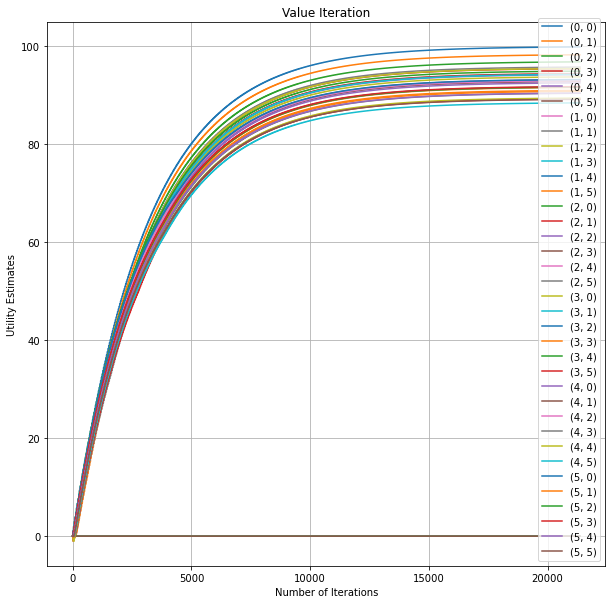

In [47]:
from matplotlib.pyplot import figure
x = [i for i in range(iterations)]

fig, ax = plt.subplots()
ax.plot(x, hist_0_0)
ax.plot(x, hist_0_1)
ax.plot(x, hist_0_2)
ax.plot(x, hist_0_3)
ax.plot(x, hist_0_4)
ax.plot(x, hist_0_5)

ax.plot(x, hist_1_0)
ax.plot(x, hist_1_1)
ax.plot(x, hist_1_2)
ax.plot(x, hist_1_3)
ax.plot(x, hist_1_4)
ax.plot(x, hist_1_5)

ax.plot(x, hist_2_0)
ax.plot(x, hist_2_1)
ax.plot(x, hist_2_2)
ax.plot(x, hist_2_3)
ax.plot(x, hist_2_4)
ax.plot(x, hist_2_5)

ax.plot(x, hist_3_0)
ax.plot(x, hist_3_1)
ax.plot(x, hist_3_2)
ax.plot(x, hist_3_3)
ax.plot(x, hist_3_4)
ax.plot(x, hist_3_5)

ax.plot(x, hist_4_0)
ax.plot(x, hist_4_1)
ax.plot(x, hist_4_2)
ax.plot(x, hist_4_3)
ax.plot(x, hist_4_4)
ax.plot(x, hist_4_5)

ax.plot(x, hist_5_0)
ax.plot(x, hist_5_1)
ax.plot(x, hist_5_2)
ax.plot(x, hist_5_3)
ax.plot(x, hist_5_4)
ax.plot(x, hist_5_5)

plt.legend(list_of_tuples, loc ="lower right")

plt.rcParams["figure.figsize"]=10,10

ax.set(xlabel='Number of Iterations', ylabel='Utility Estimates', title='Value Iteration')
ax.grid()

fig.savefig("test.png")
plt.show()

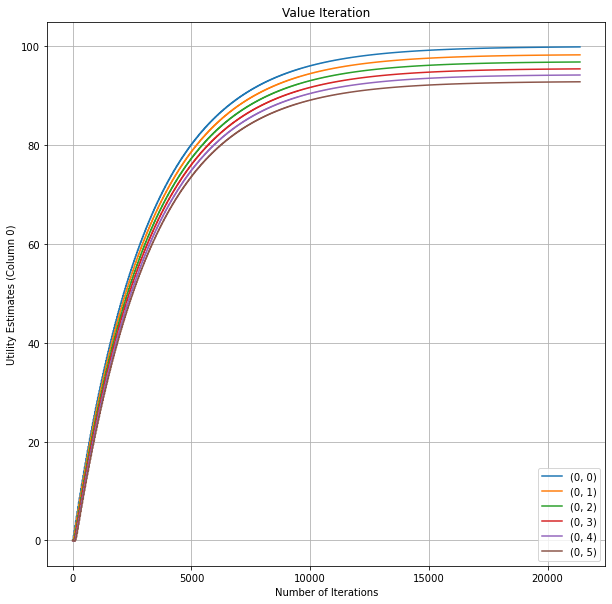

In [48]:
#Column 0

fig, ax = plt.subplots()
ax.plot(x, hist_0_0)
ax.plot(x, hist_0_1)
ax.plot(x, hist_0_2)
ax.plot(x, hist_0_3)
ax.plot(x, hist_0_4)
ax.plot(x, hist_0_5)

plt.legend(list_of_tuples, loc ="lower right")

ax.set(xlabel='Number of Iterations', ylabel='Utility Estimates (Column 0)', title='Value Iteration')
ax.grid()

fig.savefig("test.png")
plt.show()

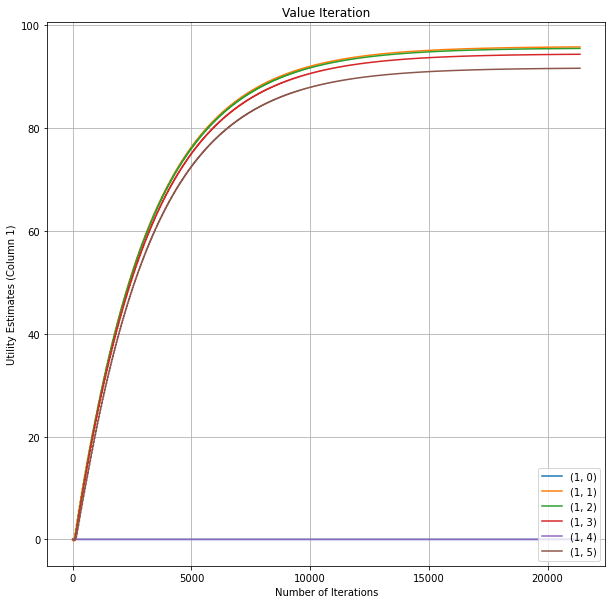

In [49]:
#Column 1

fig, ax = plt.subplots()
ax.plot(x, hist_1_0)
ax.plot(x, hist_1_1)
ax.plot(x, hist_1_2)
ax.plot(x, hist_1_3)
ax.plot(x, hist_1_4)
ax.plot(x, hist_1_5)

plt.legend(list_of_tuples[6:12], loc ="lower right")

ax.set(xlabel='Number of Iterations', ylabel='Utility Estimates (Column 1)', title='Value Iteration')
ax.grid()

fig.savefig("test.png")
plt.show()

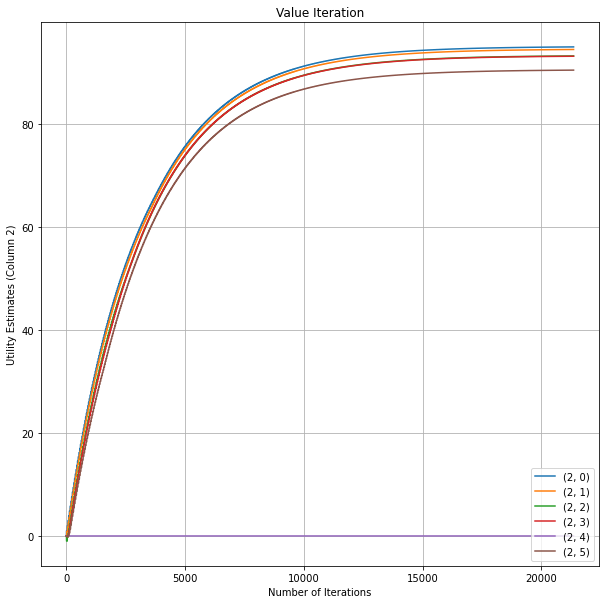

In [50]:
#Column 2

fig, ax = plt.subplots()
ax.plot(x, hist_2_0)
ax.plot(x, hist_2_1)
ax.plot(x, hist_2_2)
ax.plot(x, hist_2_3)
ax.plot(x, hist_2_4)
ax.plot(x, hist_2_5)

plt.legend(list_of_tuples[12:18], loc ="lower right")

ax.set(xlabel='Number of Iterations', ylabel='Utility Estimates (Column 2)', title='Value Iteration')
ax.grid()

fig.savefig("test.png")
plt.show()

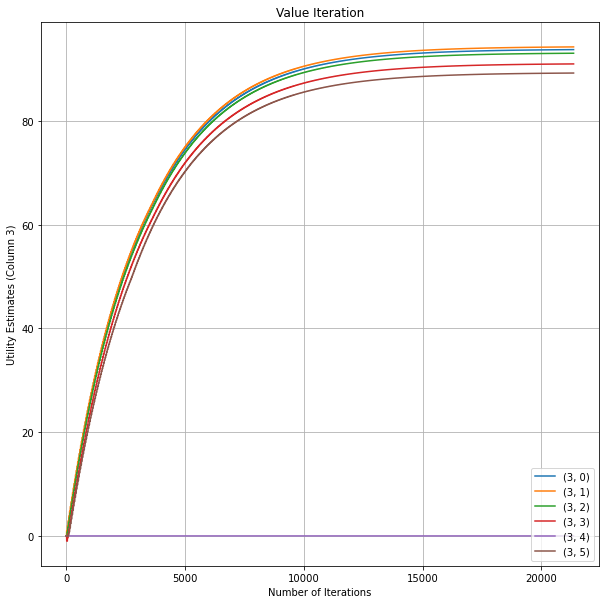

In [51]:
#Column 3

fig, ax = plt.subplots()
ax.plot(x, hist_3_0)
ax.plot(x, hist_3_1)
ax.plot(x, hist_3_2)
ax.plot(x, hist_3_3)
ax.plot(x, hist_3_4)
ax.plot(x, hist_3_5)

plt.legend(list_of_tuples[18:24], loc ="lower right")

ax.set(xlabel='Number of Iterations', ylabel='Utility Estimates (Column 3)', title='Value Iteration')
ax.grid()

fig.savefig("test.png")
plt.show()

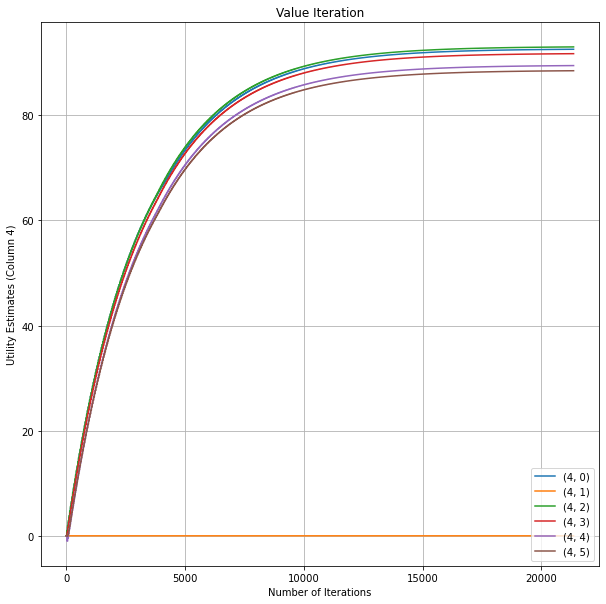

In [52]:
#Column 4

fig, ax = plt.subplots()
ax.plot(x, hist_4_0)
ax.plot(x, hist_4_1)
ax.plot(x, hist_4_2)
ax.plot(x, hist_4_3)
ax.plot(x, hist_4_4)
ax.plot(x, hist_4_5)

plt.legend(list_of_tuples[24:30], loc ="lower right")

ax.set(xlabel='Number of Iterations', ylabel='Utility Estimates (Column 4)', title='Value Iteration')
ax.grid()

fig.savefig("test.png")
plt.show()

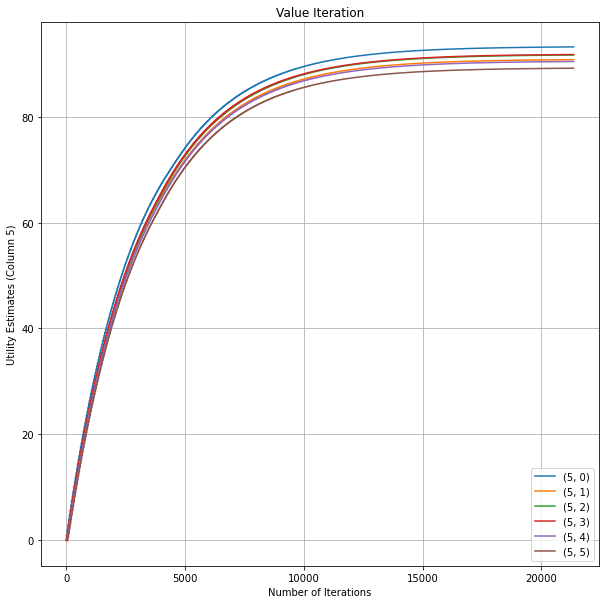

In [53]:
#Column 5

fig, ax = plt.subplots()
ax.plot(x, hist_5_0)
ax.plot(x, hist_5_1)
ax.plot(x, hist_5_2)
ax.plot(x, hist_5_3)
ax.plot(x, hist_5_4)
ax.plot(x, hist_5_5)

plt.legend(list_of_tuples[30:36], loc ="lower right")

ax.set(xlabel='Number of Iterations', ylabel='Utility Estimates (Column 5)', title='Value Iteration')
ax.grid()

fig.savefig("test.png")
plt.show()